# Dense Channel Aggregation and Reconstruction Network

In [1]:
import numpy as np
import pandas as pd
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Select the GPU index
import scipy.io
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from collections import namedtuple
import scipy.io as sio
import math
import thop

from PIL import Image
from collections import OrderedDict
import torchvision.transforms as T
import matplotlib.pyplot as plt
import time
from scipy.io import savemat
import dill as pickle
from torch.optim.lr_scheduler import _LRScheduler
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
#Parameters
num_epochs=2500
patience=15
data_dir='../data/' 
scenario='out'
batch_size=200 
workers=5
reduction=16
expansion=10
seed=None
pin_memory=True
schedulertype = 'cosine'
weight_path=f'Experiments/table1/cr{reduction}/{expansion}x_{scenario}/epochs{num_epochs}/'
lr_init = 3e-3
val_freq=10
test_freq=10

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
class PreFetcher:
    r""" Data pre-fetcher to accelerate the data loading
    """

    def __init__(self, loader):
        self.ori_loader = loader
        self.len = len(loader)
        self.stream = torch.cuda.Stream()
        self.next_input = None

    def preload(self):
        try:
            self.next_input = next(self.loader)
        except StopIteration:
            self.next_input = None
            return

        with torch.cuda.stream(self.stream):
            for idx, tensor in enumerate(self.next_input):
                self.next_input[idx] = tensor.cuda(non_blocking=True)

    def __len__(self):
        return self.len

    def __iter__(self):
        self.loader = iter(self.ori_loader)
        self.preload()
        return self

    def __next__(self):
        torch.cuda.current_stream().wait_stream(self.stream)
        input = self.next_input
        if input is None:
            raise StopIteration
        for tensor in input:
            tensor.record_stream(torch.cuda.current_stream())
        self.preload()
        return input


In [5]:


class Cost2100DataLoader(object):
    r""" PyTorch DataLoader for COST2100 dataset.
    """

    def __init__(self, root, batch_size, num_workers, pin_memory, scenario):
        
        assert scenario in {"in", "out"}
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.pin_memory = pin_memory

        dir_train = os.path.join(root, f"DATA_Htrain{scenario}.mat")
        dir_val = os.path.join(root, f"DATA_Hval{scenario}.mat")
        dir_test = os.path.join(root, f"DATA_Htest{scenario}.mat")
        dir_raw = os.path.join(root, f"DATA_HtestF{scenario}_all.mat")
        channel, nt, nc, nc_expand = 2, 32, 32, 125

        # Training data loading
        data_train = sio.loadmat(dir_train)['HT']
        data_train = torch.tensor(data_train, dtype=torch.float32).view(
            data_train.shape[0], channel, nt, nc)
        self.train_dataset = TensorDataset(data_train)

        # Validation data loading
        data_val = sio.loadmat(dir_val)['HT']
        data_val = torch.tensor(data_val, dtype=torch.float32).view(
            data_val.shape[0], channel, nt, nc)
        self.val_dataset = TensorDataset(data_val)

        # Test data loading, including the sparse data and the raw data
        data_test = sio.loadmat(dir_test)['HT']
        data_test = torch.tensor(data_test, dtype=torch.float32).view(
            data_test.shape[0], channel, nt, nc)

        raw_test = sio.loadmat(dir_raw)['HF_all']
        real = torch.tensor(np.real(raw_test), dtype=torch.float32)
        imag = torch.tensor(np.imag(raw_test), dtype=torch.float32)
        raw_test = torch.cat((real.view(raw_test.shape[0], nt, nc_expand, 1),
                              imag.view(raw_test.shape[0], nt, nc_expand, 1)), dim=3)
        self.test_dataset = TensorDataset(data_test, raw_test)

    def __call__(self):
        train_loader = DataLoader(self.train_dataset,
                                  batch_size=self.batch_size,
                                  num_workers=self.num_workers,
                                  pin_memory=self.pin_memory,
                                  shuffle=True)
        val_loader = DataLoader(self.val_dataset,
                                batch_size=self.batch_size,
                                num_workers=self.num_workers,
                                pin_memory=self.pin_memory,
                                shuffle=False)
        test_loader = DataLoader(self.test_dataset,
                                 batch_size=self.batch_size,
                                 num_workers=self.num_workers,
                                 pin_memory=self.pin_memory,
                                 shuffle=False)

        # Accelerate CUDA data loading with pre-fetcher if GPU is used.
        if self.pin_memory is True:
            train_loader = PreFetcher(train_loader)
            val_loader = PreFetcher(val_loader)
            test_loader = PreFetcher(test_loader)

        return train_loader, val_loader, test_loader


In [6]:
# Create the data loader
train_loader, val_loader, test_loader = Cost2100DataLoader(
        root=data_dir,
        batch_size=batch_size,
        num_workers=workers,
        pin_memory=pin_memory,
        scenario=scenario)()

In [7]:
train_iter=iter(train_loader)

In [8]:
x=next(train_iter)

In [9]:
len(x)

1

In [10]:
x[0].shape

torch.Size([200, 2, 32, 32])

In [11]:
len(train_loader)

500

In [12]:
len(test_loader)

100

In [13]:
len(val_loader)

150

In [14]:
def cal_model_parameters(model):
    total_param  = []
    for p1 in model.parameters():
        total_param.append(int(p1.numel()))
    return sum(total_param)

In [15]:
def NMSE_cal(x_hat, x):
    x_real = torch.reshape(torch.real(x), (x.shape[0], -1))
    x_imag = torch.reshape(torch.imag(x), (x.shape[0], -1))
    x_hat_real = torch.reshape(torch.real(x_hat), (x.shape[0], -1))
    x_hat_imag = torch.reshape(torch.imag(x_hat), (x.shape[0], -1))
    power = torch.sum((x_real - 0.5) ** 2 + (x_imag - 0.5) ** 2, dim=1)
    mse = torch.sum((x_real - x_hat_real) ** 2 + (x_imag - x_hat_imag) ** 2, dim=1)
    nmse = torch.mean(mse / power)
    return nmse

In [16]:
class ConvBN(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, groups=1):
        if not isinstance(kernel_size, int):
            padding = [(i - 1) // 2 for i in kernel_size]
        else:
            padding = (kernel_size - 1) // 2
        super(ConvBN, self).__init__(OrderedDict([
            ('conv', nn.Conv2d(in_channels=in_planes,
                               out_channels=out_planes,
                               kernel_size=kernel_size,
                               stride=stride,
                               padding=padding,
                               groups=groups,
                               bias=False)),
            ('bn', nn.BatchNorm2d(out_planes))
        ]))

In [17]:
class DCARNDecoderBlock(nn.Module):
  
    def __init__(self, expansion):
        super().__init__()
        width = 10 * expansion
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)

        return x3

In [18]:
class DCARNEncoderBlock(nn.Module):
    def __init__(self):
        super(DCARNEncoderBlock, self).__init__()
        width = 2
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)
        return x3

In [19]:
class DCARN(nn.Module):
    def __init__(self,
                 in_channels=2,
                 reduction=4,
                 expansion=1):
        super(DCARN, self).__init__()
        
        total_size, w, h = 2048, 32, 32

        self.encoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(in_channels, 2, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNEncoderBlock", DCARNEncoderBlock()),
            
        ]))
        
        self.encoder_fc = nn.Linear(total_size, total_size // reduction)

        self.decoder_fc = nn.Linear(total_size // reduction, total_size)
        
        self.decoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(2, in_channels, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNDecoderBlock1", DCARNDecoderBlock(expansion=expansion)),
            ("DCARNDecoderBlock2", DCARNDecoderBlock(expansion=expansion)),
            ("sigmoid", nn.Sigmoid())
        ]))

        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.xavier_uniform_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        n, c, h, w = x.detach().size()
        out = self.encoder_feature(x)
        out = self.encoder_fc(out.view(n, -1))
        out = self.decoder_fc(out)
        out = self.decoder_feature(out.view(n, c, h, w))
        return out

In [20]:
model = DCARN(in_channels=2, reduction=reduction, expansion=expansion).to(device)

In [21]:
if seed is not None:
    random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [22]:
cal_model_parameters(model)

545570

In [23]:
# Define loss function
criterion = nn.MSELoss().to(device)

In [24]:
class WarmUpCosineAnnealingLR(_LRScheduler):
    def __init__(self, optimizer, T_max, T_warmup, eta_min=0, last_epoch=-1):
        self.T_max = T_max
        self.T_warmup = T_warmup
        self.eta_min = eta_min
        super(WarmUpCosineAnnealingLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        if self.last_epoch < self.T_warmup:
            return [base_lr * self.last_epoch / self.T_warmup for base_lr in self.base_lrs]
        else:
            k = 1 + math.cos(math.pi * (self.last_epoch - self.T_warmup) / (self.T_max - self.T_warmup))
            return [self.eta_min + (base_lr - self.eta_min) * k / 2 for base_lr in self.base_lrs]


class FakeLR(_LRScheduler):
    def __init__(self, optimizer):
        super(FakeLR, self).__init__(optimizer=optimizer)

    def get_lr(self):
        return self.base_lrs


In [25]:
# Define optimizer and scheduler
optimizer = torch.optim.Adam(model.parameters(), lr_init, betas=(0.9, 0.999))
if schedulertype == 'const':
    scheduler = FakeLR(optimizer=optimizer)

else:
    scheduler = WarmUpCosineAnnealingLR(optimizer=optimizer,
                                        T_max=num_epochs * len(train_loader),
                                        T_warmup=100 * len(train_loader),
                                        eta_min=5e-7)

In [26]:
field = ('nmse', 'rho', 'epoch')
Result = namedtuple('Result', field, defaults=(None,) * len(field))


In [27]:
class AverageMeter(object):
    r"""Computes and stores the average and current value
       Imported from https://github.com/pytorch/examples/blob/master/imagenet/main.py#L247-L262
    """
    def __init__(self, name):
        self.reset()
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
        self.name = name

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

    def __repr__(self):
        return f"==> For {self.name}: sum={self.sum}; avg={self.avg}"




In [28]:
def evaluator(sparse_pred, sparse_gt, raw_gt):
    r""" Evaluation of decoding implemented in PyTorch Tensor
         Computes normalized mean square error (NMSE) and rho.
    """

    with torch.no_grad():
        # Basic params
        nt = 32
        nc = 32
        nc_expand = 257

        # De-centralize
        sparse_gt = sparse_gt - 0.5
        sparse_pred = sparse_pred - 0.5

        # Calculate the NMSE
        power_gt = sparse_gt[:, 0, :, :] ** 2 + sparse_gt[:, 1, :, :] ** 2
        difference = sparse_gt - sparse_pred
        mse = difference[:, 0, :, :] ** 2 + difference[:, 1, :, :] ** 2
        nmse = (mse.sum(dim=[1, 2]) / power_gt.sum(dim=[1, 2])).mean()

        # Calculate the Rho
        n = sparse_pred.size(0)
        sparse_pred = sparse_pred.permute(0, 2, 3, 1)  # Move the real/imaginary dim to the last
        zeros = sparse_pred.new_zeros((n, nt, nc_expand - nc, 2))
        sparse_pred = torch.cat((sparse_pred, zeros), dim=2)
        raw_pred = torch.fft.fft(sparse_pred, dim=1)[:, :, :125, :]

        norm_pred = raw_pred[..., 0] ** 2 + raw_pred[..., 1] ** 2
        norm_pred = torch.sqrt(norm_pred.sum(dim=1))

        norm_gt = raw_gt[..., 0] ** 2 + raw_gt[..., 1] ** 2
        norm_gt = torch.sqrt(norm_gt.sum(dim=1))

        real_cross = raw_pred[..., 0] * raw_gt[..., 0] + raw_pred[..., 1] * raw_gt[..., 1]
        real_cross = real_cross.sum(dim=1)
        imag_cross = raw_pred[..., 0] * raw_gt[..., 1] - raw_pred[..., 1] * raw_gt[..., 0]
        imag_cross = imag_cross.sum(dim=1)
        norm_cross = torch.sqrt(real_cross ** 2 + imag_cross ** 2)

        rho = (norm_cross / (norm_pred * norm_gt)).mean()

        return rho, nmse


In [29]:
class Tester:
    r""" The testing interface for classification
    """

    def __init__(self, model, device, criterion, print_freq=20):
        self.model = model
        self.device = device
        self.criterion = criterion
        self.print_freq = print_freq

    def __call__(self, test_data, verbose=True):
        r""" Runs the testing procedure.

        Args:
            test_data (DataLoader): Data loader for validation data.
        """

        self.model.eval()
        with torch.no_grad():
            loss, rho, nmse = self._iteration(test_data)
        if verbose:
            print(f'\n=> Test result: \nloss: {loss:.3e}'
                  f'    rho: {rho:.3e}    NMSE: {nmse:.3e}\n')
        return loss, rho, nmse

    def _iteration(self, data_loader):
        r""" protected function which test the model on given data loader for one epoch.
        """

        iter_rho = AverageMeter('Iter rho')
        iter_nmse = AverageMeter('Iter nmse')
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, raw_gt) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)
            rho, nmse = evaluator(sparse_pred, sparse_gt, raw_gt)

            # Log and visdom update
            iter_loss.update(loss)
            iter_rho.update(rho)
            iter_nmse.update(nmse)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'loss: {iter_loss.avg:.3e} | rho: {iter_rho.avg:.3e} | '
                            f'NMSE: {10 * torch.log10(iter_nmse.avg):.3e} | time: {iter_time.avg:.3f}')
        
        nmse = 10 * torch.log10(iter_nmse.avg)  # global NMSE in dB
        print(f'=> Test rho:{iter_rho.avg:.3e}  NMSE: {nmse:.3e}\n')
        return iter_loss.avg, iter_rho.avg, nmse


In [30]:
val_losses = torch.empty(num_epochs//val_freq)
train_losses = torch.empty(num_epochs)
test_losses = torch.empty(num_epochs//test_freq)
alphas = torch.zeros(num_epochs)
test_nmses = torch.zeros(num_epochs//test_freq)

if not os.path.exists(weight_path + "losses/"):
    os.makedirs(weight_path + "losses/")

In [31]:
class Trainer:
    r""" The training pipeline for encoder-decoder architecture
    """

    def __init__(self, model, device, optimizer, criterion, scheduler, resume=None,
                 save_path=weight_path, print_freq=10, val_freq = val_freq, test_freq = test_freq):

        # Basic arguments
        self.model = model
        self.optimizer = optimizer
        self.criterion = criterion
        self.scheduler = scheduler
        self.device = device

        # Verbose arguments
        self.resume_file = resume
        self.save_path = save_path
        self.print_freq = print_freq
        self.val_freq = val_freq
        self.test_freq = test_freq
        

        # Pipeline arguments
        self.cur_epoch = 1
        self.all_epoch = None
        self.train_loss = None
        self.val_loss = None
        self.test_loss = None
        self.best_rho = Result()
        self.best_nmse = Result()
        
        self.tester = Tester(model, device, criterion, print_freq)
        self.test_loader = None

    def loop(self, epochs, train_loader, val_loader, test_loader):
        r""" The main loop function which runs training and validation iteratively.

        Args:
            epochs (int): The total epoch for training
            train_loader (DataLoader): Data loader for training data.
            val_loader (DataLoader): Data loader for validation data.
            test_loader (DataLoader): Data loader for test data.
        """

        self.all_epoch = epochs
        self._resume()
        vn=0
        tn=0
        for ep in range(self.cur_epoch, epochs + 1):
            self.cur_epoch = ep

            # conduct training, validation and test
            self.train_loss = self.train(train_loader)
            train_losses[ep-1] = self.train_loss.detach()
            if ep % self.val_freq == 0:
                self.val_loss = self.val(val_loader)
                val_losses[vn] = self.val_loss.detach()
                vn=vn+1
            # Save alpha 
            alphas_ep = []
            for m in self.model.modules():
                if isinstance(m, nn.PReLU):
                    alphas_ep.append(m.weight[0])
            alphas[ep-1] = torch.stack(alphas_ep).mean().detach()
            
            if ep % self.test_freq == 0:
                self.test_loss, rho, nmse = self.test(test_loader)
                test_losses[tn] = self.test_loss.detach()
                test_nmses[tn] = nmse.detach()
                tn=tn+1
            else:
                rho, nmse = None, None
            # conduct saving, visualization and log printing
            self._loop_postprocessing(rho, nmse)

    def train(self, train_loader):
        r""" train the model on the given data loader for one epoch.

        Args:
            train_loader (DataLoader): the training data loader
        """

        self.model.train()
        with torch.enable_grad():
            return self._iteration(train_loader)

    def val(self, val_loader):
        r""" exam the model with validation set.

        Args:
            val_loader: (DataLoader): the validation data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self._iteration(val_loader)

    def test(self, test_loader):
        r""" Truly test the model on the test dataset for one epoch.

        Args:
            test_loader (DataLoader): the test data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self.tester(test_loader, verbose=False)

    def _iteration(self, data_loader):
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, ) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)

            # Scheduler update, backward pass and optimization
            if self.model.training:
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                self.scheduler.step()

            # Log and visdom update
            iter_loss.update(loss)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'Epoch: [{self.cur_epoch}/{self.all_epoch}]'
                            f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'lr: {self.scheduler.get_lr()[0]:.2e} | '
                            f'MSE loss: {iter_loss.avg:.3e} | '
                            f'time: {iter_time.avg:.3f}')
                

        mode = 'Train' if self.model.training else 'Val'
        print(f' {mode}  Loss: {iter_loss.avg:.3e}\n')

        return iter_loss.avg

    def _save(self, state, name):
        if self.save_path is None:
            print('No path to save checkpoints.')
            return
        
        os.makedirs(self.save_path, exist_ok=True)
        torch.save(state, os.path.join(self.save_path, name))

    def _resume(self):
        r""" protected function which resume from checkpoint at the beginning of training.
        """

        if self.resume_file is None:
            return None
        assert os.path.isfile(self.resume_file)
        print(f' loading checkpoint {self.resume_file}')
        checkpoint = torch.load(self.resume_file)
        self.cur_epoch = checkpoint['epoch']
        self.model.load_state_dict(checkpoint['state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer'])
        self.scheduler.load_state_dict(checkpoint['scheduler'])
        self.best_rho = checkpoint['best_rho']
        self.best_nmse = checkpoint['best_nmse']
        self.cur_epoch += 1  # start from the next epoch

        print(f' successfully loaded checkpoint {self.resume_file} '
                    f'from epoch {checkpoint["epoch"]}.\n')

    def _loop_postprocessing(self, rho, nmse):
        r""" private function which makes loop() function neater.
        """

        # save state generate
        state = {
            'epoch': self.cur_epoch,
            'state_dict': self.model.state_dict(),
            'optimizer': self.optimizer.state_dict(),
            'scheduler': self.scheduler.state_dict(),
            'best_rho': self.best_rho,
            'best_nmse': self.best_nmse
        }

        # save model with best rho and nmse
        if rho is not None:
            if self.best_rho.rho is None or abs(self.best_rho.rho) < abs(rho):
                self.best_rho = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_rho'] = self.best_rho
                self._save(state, name=f"best_rho.pth")
            if self.best_nmse.nmse is None or self.best_nmse.nmse > nmse:
                self.best_nmse = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_nmse'] = self.best_nmse
                self._save(state, name=f"best_nmse.pth")

        self._save(state, name='last.pth')

        # print current best results
        if self.best_rho.rho is not None:
            print(f'\n=! Best rho: {self.best_rho.rho:.3e} ('
                  f'Corresponding nmse={self.best_rho.nmse:.3e}; '
                  f'epoch={self.best_rho.epoch})'
                  f'\n   Best NMSE: {self.best_nmse.nmse:.3e} ('
                  f'Corresponding rho={self.best_nmse.rho:.3e};  '
                  f'epoch={self.best_nmse.epoch})\n')
            

In [32]:
# Define the training pipeline
trainer = Trainer(model=model,
                  device=device,
                  optimizer=optimizer,
                  criterion=criterion,
                  scheduler=scheduler)

# Start training
trainer.loop(num_epochs, train_loader, val_loader, test_loader)

Epoch: [1/2500][10/500] lr: 6.00e-07 | MSE loss: 5.527e-02 | time: 0.352
Epoch: [1/2500][20/500] lr: 1.20e-06 | MSE loss: 5.520e-02 | time: 0.194
Epoch: [1/2500][30/500] lr: 1.80e-06 | MSE loss: 5.506e-02 | time: 0.141
Epoch: [1/2500][40/500] lr: 2.40e-06 | MSE loss: 5.485e-02 | time: 0.115
Epoch: [1/2500][50/500] lr: 3.00e-06 | MSE loss: 5.459e-02 | time: 0.099
Epoch: [1/2500][60/500] lr: 3.60e-06 | MSE loss: 5.427e-02 | time: 0.088
Epoch: [1/2500][70/500] lr: 4.20e-06 | MSE loss: 5.388e-02 | time: 0.081
Epoch: [1/2500][80/500] lr: 4.80e-06 | MSE loss: 5.343e-02 | time: 0.075
Epoch: [1/2500][90/500] lr: 5.40e-06 | MSE loss: 5.292e-02 | time: 0.071
Epoch: [1/2500][100/500] lr: 6.00e-06 | MSE loss: 5.235e-02 | time: 0.067
Epoch: [1/2500][110/500] lr: 6.60e-06 | MSE loss: 5.173e-02 | time: 0.064
Epoch: [1/2500][120/500] lr: 7.20e-06 | MSE loss: 5.106e-02 | time: 0.062
Epoch: [1/2500][130/500] lr: 7.80e-06 | MSE loss: 5.034e-02 | time: 0.060
Epoch: [1/2500][140/500] lr: 8.40e-06 | MSE los

Epoch: [3/2500][120/500] lr: 6.72e-05 | MSE loss: 1.150e-03 | time: 0.041
Epoch: [3/2500][130/500] lr: 6.78e-05 | MSE loss: 1.144e-03 | time: 0.040
Epoch: [3/2500][140/500] lr: 6.84e-05 | MSE loss: 1.140e-03 | time: 0.040
Epoch: [3/2500][150/500] lr: 6.90e-05 | MSE loss: 1.136e-03 | time: 0.040
Epoch: [3/2500][160/500] lr: 6.96e-05 | MSE loss: 1.132e-03 | time: 0.040
Epoch: [3/2500][170/500] lr: 7.02e-05 | MSE loss: 1.128e-03 | time: 0.039
Epoch: [3/2500][180/500] lr: 7.08e-05 | MSE loss: 1.124e-03 | time: 0.039
Epoch: [3/2500][190/500] lr: 7.14e-05 | MSE loss: 1.120e-03 | time: 0.039
Epoch: [3/2500][200/500] lr: 7.20e-05 | MSE loss: 1.116e-03 | time: 0.039
Epoch: [3/2500][210/500] lr: 7.26e-05 | MSE loss: 1.112e-03 | time: 0.039
Epoch: [3/2500][220/500] lr: 7.32e-05 | MSE loss: 1.109e-03 | time: 0.039
Epoch: [3/2500][230/500] lr: 7.38e-05 | MSE loss: 1.105e-03 | time: 0.039
Epoch: [3/2500][240/500] lr: 7.44e-05 | MSE loss: 1.102e-03 | time: 0.038
Epoch: [3/2500][250/500] lr: 7.50e-05 

Epoch: [5/2500][230/500] lr: 1.34e-04 | MSE loss: 8.283e-04 | time: 0.038
Epoch: [5/2500][240/500] lr: 1.34e-04 | MSE loss: 8.278e-04 | time: 0.038
Epoch: [5/2500][250/500] lr: 1.35e-04 | MSE loss: 8.280e-04 | time: 0.038
Epoch: [5/2500][260/500] lr: 1.36e-04 | MSE loss: 8.278e-04 | time: 0.038
Epoch: [5/2500][270/500] lr: 1.36e-04 | MSE loss: 8.270e-04 | time: 0.038
Epoch: [5/2500][280/500] lr: 1.37e-04 | MSE loss: 8.264e-04 | time: 0.038
Epoch: [5/2500][290/500] lr: 1.37e-04 | MSE loss: 8.258e-04 | time: 0.038
Epoch: [5/2500][300/500] lr: 1.38e-04 | MSE loss: 8.252e-04 | time: 0.038
Epoch: [5/2500][310/500] lr: 1.39e-04 | MSE loss: 8.256e-04 | time: 0.037
Epoch: [5/2500][320/500] lr: 1.39e-04 | MSE loss: 8.254e-04 | time: 0.037
Epoch: [5/2500][330/500] lr: 1.40e-04 | MSE loss: 8.254e-04 | time: 0.037
Epoch: [5/2500][340/500] lr: 1.40e-04 | MSE loss: 8.250e-04 | time: 0.037
Epoch: [5/2500][350/500] lr: 1.41e-04 | MSE loss: 8.242e-04 | time: 0.037
Epoch: [5/2500][360/500] lr: 1.42e-04 

Epoch: [7/2500][340/500] lr: 2.00e-04 | MSE loss: 7.999e-04 | time: 0.037
Epoch: [7/2500][350/500] lr: 2.01e-04 | MSE loss: 8.000e-04 | time: 0.037
Epoch: [7/2500][360/500] lr: 2.02e-04 | MSE loss: 8.000e-04 | time: 0.037
Epoch: [7/2500][370/500] lr: 2.02e-04 | MSE loss: 8.001e-04 | time: 0.037
Epoch: [7/2500][380/500] lr: 2.03e-04 | MSE loss: 8.002e-04 | time: 0.037
Epoch: [7/2500][390/500] lr: 2.03e-04 | MSE loss: 8.002e-04 | time: 0.037
Epoch: [7/2500][400/500] lr: 2.04e-04 | MSE loss: 7.999e-04 | time: 0.037
Epoch: [7/2500][410/500] lr: 2.05e-04 | MSE loss: 8.002e-04 | time: 0.037
Epoch: [7/2500][420/500] lr: 2.05e-04 | MSE loss: 8.003e-04 | time: 0.037
Epoch: [7/2500][430/500] lr: 2.06e-04 | MSE loss: 8.004e-04 | time: 0.037
Epoch: [7/2500][440/500] lr: 2.06e-04 | MSE loss: 8.008e-04 | time: 0.037
Epoch: [7/2500][450/500] lr: 2.07e-04 | MSE loss: 8.006e-04 | time: 0.037
Epoch: [7/2500][460/500] lr: 2.08e-04 | MSE loss: 8.006e-04 | time: 0.037
Epoch: [7/2500][470/500] lr: 2.08e-04 

Epoch: [9/2500][450/500] lr: 2.67e-04 | MSE loss: 7.970e-04 | time: 0.037
Epoch: [9/2500][460/500] lr: 2.68e-04 | MSE loss: 7.973e-04 | time: 0.037
Epoch: [9/2500][470/500] lr: 2.68e-04 | MSE loss: 7.974e-04 | time: 0.037
Epoch: [9/2500][480/500] lr: 2.69e-04 | MSE loss: 7.974e-04 | time: 0.037
Epoch: [9/2500][490/500] lr: 2.69e-04 | MSE loss: 7.977e-04 | time: 0.037
Epoch: [9/2500][500/500] lr: 2.70e-04 | MSE loss: 7.976e-04 | time: 0.037
 Train  Loss: 7.976e-04

Epoch: [10/2500][10/500] lr: 2.71e-04 | MSE loss: 7.993e-04 | time: 0.076
Epoch: [10/2500][20/500] lr: 2.71e-04 | MSE loss: 7.958e-04 | time: 0.056
Epoch: [10/2500][30/500] lr: 2.72e-04 | MSE loss: 8.000e-04 | time: 0.049
Epoch: [10/2500][40/500] lr: 2.72e-04 | MSE loss: 7.968e-04 | time: 0.046
Epoch: [10/2500][50/500] lr: 2.73e-04 | MSE loss: 7.971e-04 | time: 0.044
Epoch: [10/2500][60/500] lr: 2.74e-04 | MSE loss: 7.960e-04 | time: 0.043
Epoch: [10/2500][70/500] lr: 2.74e-04 | MSE loss: 7.961e-04 | time: 0.042
Epoch: [10/25

Epoch: [11/2500][270/500] lr: 3.16e-04 | MSE loss: 7.597e-04 | time: 0.038
Epoch: [11/2500][280/500] lr: 3.17e-04 | MSE loss: 7.590e-04 | time: 0.038
Epoch: [11/2500][290/500] lr: 3.17e-04 | MSE loss: 7.581e-04 | time: 0.037
Epoch: [11/2500][300/500] lr: 3.18e-04 | MSE loss: 7.574e-04 | time: 0.037
Epoch: [11/2500][310/500] lr: 3.19e-04 | MSE loss: 7.565e-04 | time: 0.037
Epoch: [11/2500][320/500] lr: 3.19e-04 | MSE loss: 7.564e-04 | time: 0.037
Epoch: [11/2500][330/500] lr: 3.20e-04 | MSE loss: 7.559e-04 | time: 0.037
Epoch: [11/2500][340/500] lr: 3.20e-04 | MSE loss: 7.557e-04 | time: 0.037
Epoch: [11/2500][350/500] lr: 3.21e-04 | MSE loss: 7.554e-04 | time: 0.037
Epoch: [11/2500][360/500] lr: 3.22e-04 | MSE loss: 7.548e-04 | time: 0.037
Epoch: [11/2500][370/500] lr: 3.22e-04 | MSE loss: 7.545e-04 | time: 0.037
Epoch: [11/2500][380/500] lr: 3.23e-04 | MSE loss: 7.537e-04 | time: 0.037
Epoch: [11/2500][390/500] lr: 3.23e-04 | MSE loss: 7.527e-04 | time: 0.037
Epoch: [11/2500][400/500]

Epoch: [13/2500][330/500] lr: 3.80e-04 | MSE loss: 5.935e-04 | time: 0.037
Epoch: [13/2500][340/500] lr: 3.80e-04 | MSE loss: 5.919e-04 | time: 0.037
Epoch: [13/2500][350/500] lr: 3.81e-04 | MSE loss: 5.904e-04 | time: 0.037
Epoch: [13/2500][360/500] lr: 3.82e-04 | MSE loss: 5.898e-04 | time: 0.037
Epoch: [13/2500][370/500] lr: 3.82e-04 | MSE loss: 5.891e-04 | time: 0.037
Epoch: [13/2500][380/500] lr: 3.83e-04 | MSE loss: 5.878e-04 | time: 0.037
Epoch: [13/2500][390/500] lr: 3.83e-04 | MSE loss: 5.862e-04 | time: 0.037
Epoch: [13/2500][400/500] lr: 3.84e-04 | MSE loss: 5.850e-04 | time: 0.037
Epoch: [13/2500][410/500] lr: 3.85e-04 | MSE loss: 5.835e-04 | time: 0.037
Epoch: [13/2500][420/500] lr: 3.85e-04 | MSE loss: 5.819e-04 | time: 0.037
Epoch: [13/2500][430/500] lr: 3.86e-04 | MSE loss: 5.806e-04 | time: 0.037
Epoch: [13/2500][440/500] lr: 3.86e-04 | MSE loss: 5.793e-04 | time: 0.037
Epoch: [13/2500][450/500] lr: 3.87e-04 | MSE loss: 5.782e-04 | time: 0.037
Epoch: [13/2500][460/500]

Epoch: [15/2500][390/500] lr: 4.43e-04 | MSE loss: 4.137e-04 | time: 0.037
Epoch: [15/2500][400/500] lr: 4.44e-04 | MSE loss: 4.134e-04 | time: 0.037
Epoch: [15/2500][410/500] lr: 4.45e-04 | MSE loss: 4.135e-04 | time: 0.037
Epoch: [15/2500][420/500] lr: 4.45e-04 | MSE loss: 4.132e-04 | time: 0.037
Epoch: [15/2500][430/500] lr: 4.46e-04 | MSE loss: 4.127e-04 | time: 0.037
Epoch: [15/2500][440/500] lr: 4.46e-04 | MSE loss: 4.122e-04 | time: 0.037
Epoch: [15/2500][450/500] lr: 4.47e-04 | MSE loss: 4.118e-04 | time: 0.037
Epoch: [15/2500][460/500] lr: 4.48e-04 | MSE loss: 4.113e-04 | time: 0.037
Epoch: [15/2500][470/500] lr: 4.48e-04 | MSE loss: 4.109e-04 | time: 0.037
Epoch: [15/2500][480/500] lr: 4.49e-04 | MSE loss: 4.103e-04 | time: 0.037
Epoch: [15/2500][490/500] lr: 4.49e-04 | MSE loss: 4.099e-04 | time: 0.037
Epoch: [15/2500][500/500] lr: 4.50e-04 | MSE loss: 4.095e-04 | time: 0.037
 Train  Loss: 4.095e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NM

Epoch: [17/2500][450/500] lr: 5.07e-04 | MSE loss: 3.595e-04 | time: 0.037
Epoch: [17/2500][460/500] lr: 5.08e-04 | MSE loss: 3.591e-04 | time: 0.037
Epoch: [17/2500][470/500] lr: 5.08e-04 | MSE loss: 3.588e-04 | time: 0.037
Epoch: [17/2500][480/500] lr: 5.09e-04 | MSE loss: 3.586e-04 | time: 0.037
Epoch: [17/2500][490/500] lr: 5.09e-04 | MSE loss: 3.584e-04 | time: 0.037
Epoch: [17/2500][500/500] lr: 5.10e-04 | MSE loss: 3.582e-04 | time: 0.037
 Train  Loss: 3.582e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -1.468e-01 (Corresponding rho=nan+nanj;  epoch=10)

Epoch: [18/2500][10/500] lr: 5.11e-04 | MSE loss: 3.476e-04 | time: 0.074
Epoch: [18/2500][20/500] lr: 5.11e-04 | MSE loss: 3.421e-04 | time: 0.055
Epoch: [18/2500][30/500] lr: 5.12e-04 | MSE loss: 3.423e-04 | time: 0.049
Epoch: [18/2500][40/500] lr: 5.12e-04 | MSE loss: 3.422e-04 | time: 0.046
Epoch: [18/2500][50/500] lr: 5.13e-04 | MSE loss: 3.430e-04 | time: 0.044
Epoch: [18/2500][60/500]

Epoch: [20/2500][10/500] lr: 5.71e-04 | MSE loss: 3.177e-04 | time: 0.075
Epoch: [20/2500][20/500] lr: 5.71e-04 | MSE loss: 3.178e-04 | time: 0.056
Epoch: [20/2500][30/500] lr: 5.72e-04 | MSE loss: 3.229e-04 | time: 0.049
Epoch: [20/2500][40/500] lr: 5.72e-04 | MSE loss: 3.240e-04 | time: 0.046
Epoch: [20/2500][50/500] lr: 5.73e-04 | MSE loss: 3.267e-04 | time: 0.044
Epoch: [20/2500][60/500] lr: 5.74e-04 | MSE loss: 3.276e-04 | time: 0.043
Epoch: [20/2500][70/500] lr: 5.74e-04 | MSE loss: 3.256e-04 | time: 0.042
Epoch: [20/2500][80/500] lr: 5.75e-04 | MSE loss: 3.252e-04 | time: 0.041
Epoch: [20/2500][90/500] lr: 5.75e-04 | MSE loss: 3.251e-04 | time: 0.041
Epoch: [20/2500][100/500] lr: 5.76e-04 | MSE loss: 3.257e-04 | time: 0.040
Epoch: [20/2500][110/500] lr: 5.77e-04 | MSE loss: 3.254e-04 | time: 0.040
Epoch: [20/2500][120/500] lr: 5.77e-04 | MSE loss: 3.246e-04 | time: 0.039
Epoch: [20/2500][130/500] lr: 5.78e-04 | MSE loss: 3.243e-04 | time: 0.039
Epoch: [20/2500][140/500] lr: 5.78

Epoch: [21/2500][330/500] lr: 6.20e-04 | MSE loss: 3.172e-04 | time: 0.038
Epoch: [21/2500][340/500] lr: 6.20e-04 | MSE loss: 3.172e-04 | time: 0.038
Epoch: [21/2500][350/500] lr: 6.21e-04 | MSE loss: 3.172e-04 | time: 0.037
Epoch: [21/2500][360/500] lr: 6.22e-04 | MSE loss: 3.170e-04 | time: 0.037
Epoch: [21/2500][370/500] lr: 6.22e-04 | MSE loss: 3.175e-04 | time: 0.037
Epoch: [21/2500][380/500] lr: 6.23e-04 | MSE loss: 3.178e-04 | time: 0.037
Epoch: [21/2500][390/500] lr: 6.23e-04 | MSE loss: 3.178e-04 | time: 0.037
Epoch: [21/2500][400/500] lr: 6.24e-04 | MSE loss: 3.179e-04 | time: 0.037
Epoch: [21/2500][410/500] lr: 6.25e-04 | MSE loss: 3.180e-04 | time: 0.037
Epoch: [21/2500][420/500] lr: 6.25e-04 | MSE loss: 3.179e-04 | time: 0.037
Epoch: [21/2500][430/500] lr: 6.26e-04 | MSE loss: 3.177e-04 | time: 0.037
Epoch: [21/2500][440/500] lr: 6.26e-04 | MSE loss: 3.176e-04 | time: 0.037
Epoch: [21/2500][450/500] lr: 6.27e-04 | MSE loss: 3.174e-04 | time: 0.037
Epoch: [21/2500][460/500]

Epoch: [23/2500][390/500] lr: 6.83e-04 | MSE loss: 3.053e-04 | time: 0.037
Epoch: [23/2500][400/500] lr: 6.84e-04 | MSE loss: 3.050e-04 | time: 0.037
Epoch: [23/2500][410/500] lr: 6.85e-04 | MSE loss: 3.050e-04 | time: 0.037
Epoch: [23/2500][420/500] lr: 6.85e-04 | MSE loss: 3.049e-04 | time: 0.037
Epoch: [23/2500][430/500] lr: 6.86e-04 | MSE loss: 3.047e-04 | time: 0.037
Epoch: [23/2500][440/500] lr: 6.86e-04 | MSE loss: 3.045e-04 | time: 0.037
Epoch: [23/2500][450/500] lr: 6.87e-04 | MSE loss: 3.044e-04 | time: 0.037
Epoch: [23/2500][460/500] lr: 6.88e-04 | MSE loss: 3.045e-04 | time: 0.037
Epoch: [23/2500][470/500] lr: 6.88e-04 | MSE loss: 3.044e-04 | time: 0.037
Epoch: [23/2500][480/500] lr: 6.89e-04 | MSE loss: 3.042e-04 | time: 0.037
Epoch: [23/2500][490/500] lr: 6.89e-04 | MSE loss: 3.041e-04 | time: 0.037
Epoch: [23/2500][500/500] lr: 6.90e-04 | MSE loss: 3.039e-04 | time: 0.037
 Train  Loss: 3.039e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NM

Epoch: [25/2500][450/500] lr: 7.47e-04 | MSE loss: 2.933e-04 | time: 0.037
Epoch: [25/2500][460/500] lr: 7.48e-04 | MSE loss: 2.933e-04 | time: 0.037
Epoch: [25/2500][470/500] lr: 7.48e-04 | MSE loss: 2.933e-04 | time: 0.037
Epoch: [25/2500][480/500] lr: 7.49e-04 | MSE loss: 2.933e-04 | time: 0.037
Epoch: [25/2500][490/500] lr: 7.49e-04 | MSE loss: 2.932e-04 | time: 0.037
Epoch: [25/2500][500/500] lr: 7.50e-04 | MSE loss: 2.931e-04 | time: 0.037
 Train  Loss: 2.931e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -4.253e+00 (Corresponding rho=nan+nanj;  epoch=20)

Epoch: [26/2500][10/500] lr: 7.51e-04 | MSE loss: 2.809e-04 | time: 0.079
Epoch: [26/2500][20/500] lr: 7.51e-04 | MSE loss: 2.866e-04 | time: 0.058
Epoch: [26/2500][30/500] lr: 7.52e-04 | MSE loss: 2.852e-04 | time: 0.051
Epoch: [26/2500][40/500] lr: 7.52e-04 | MSE loss: 2.856e-04 | time: 0.047
Epoch: [26/2500][50/500] lr: 7.53e-04 | MSE loss: 2.869e-04 | time: 0.045
Epoch: [26/2500][60/500]

Epoch: [28/2500][10/500] lr: 8.11e-04 | MSE loss: 2.843e-04 | time: 0.078
Epoch: [28/2500][20/500] lr: 8.11e-04 | MSE loss: 2.820e-04 | time: 0.057
Epoch: [28/2500][30/500] lr: 8.12e-04 | MSE loss: 2.804e-04 | time: 0.050
Epoch: [28/2500][40/500] lr: 8.12e-04 | MSE loss: 2.783e-04 | time: 0.047
Epoch: [28/2500][50/500] lr: 8.13e-04 | MSE loss: 2.800e-04 | time: 0.044
Epoch: [28/2500][60/500] lr: 8.14e-04 | MSE loss: 2.800e-04 | time: 0.043
Epoch: [28/2500][70/500] lr: 8.14e-04 | MSE loss: 2.818e-04 | time: 0.042
Epoch: [28/2500][80/500] lr: 8.15e-04 | MSE loss: 2.805e-04 | time: 0.041
Epoch: [28/2500][90/500] lr: 8.15e-04 | MSE loss: 2.807e-04 | time: 0.041
Epoch: [28/2500][100/500] lr: 8.16e-04 | MSE loss: 2.799e-04 | time: 0.040
Epoch: [28/2500][110/500] lr: 8.17e-04 | MSE loss: 2.807e-04 | time: 0.040
Epoch: [28/2500][120/500] lr: 8.17e-04 | MSE loss: 2.809e-04 | time: 0.040
Epoch: [28/2500][130/500] lr: 8.18e-04 | MSE loss: 2.806e-04 | time: 0.039
Epoch: [28/2500][140/500] lr: 8.18

Epoch: [30/2500][70/500] lr: 8.74e-04 | MSE loss: 2.746e-04 | time: 0.042
Epoch: [30/2500][80/500] lr: 8.75e-04 | MSE loss: 2.757e-04 | time: 0.041
Epoch: [30/2500][90/500] lr: 8.75e-04 | MSE loss: 2.771e-04 | time: 0.040
Epoch: [30/2500][100/500] lr: 8.76e-04 | MSE loss: 2.770e-04 | time: 0.040
Epoch: [30/2500][110/500] lr: 8.77e-04 | MSE loss: 2.775e-04 | time: 0.040
Epoch: [30/2500][120/500] lr: 8.77e-04 | MSE loss: 2.775e-04 | time: 0.039
Epoch: [30/2500][130/500] lr: 8.78e-04 | MSE loss: 2.775e-04 | time: 0.039
Epoch: [30/2500][140/500] lr: 8.78e-04 | MSE loss: 2.772e-04 | time: 0.039
Epoch: [30/2500][150/500] lr: 8.79e-04 | MSE loss: 2.773e-04 | time: 0.039
Epoch: [30/2500][160/500] lr: 8.80e-04 | MSE loss: 2.771e-04 | time: 0.039
Epoch: [30/2500][170/500] lr: 8.80e-04 | MSE loss: 2.773e-04 | time: 0.038
Epoch: [30/2500][180/500] lr: 8.81e-04 | MSE loss: 2.775e-04 | time: 0.038
Epoch: [30/2500][190/500] lr: 8.81e-04 | MSE loss: 2.771e-04 | time: 0.038
Epoch: [30/2500][200/500] lr

Epoch: [31/2500][390/500] lr: 9.23e-04 | MSE loss: 2.716e-04 | time: 0.038
Epoch: [31/2500][400/500] lr: 9.24e-04 | MSE loss: 2.717e-04 | time: 0.037
Epoch: [31/2500][410/500] lr: 9.25e-04 | MSE loss: 2.719e-04 | time: 0.037
Epoch: [31/2500][420/500] lr: 9.25e-04 | MSE loss: 2.721e-04 | time: 0.037
Epoch: [31/2500][430/500] lr: 9.26e-04 | MSE loss: 2.720e-04 | time: 0.037
Epoch: [31/2500][440/500] lr: 9.26e-04 | MSE loss: 2.718e-04 | time: 0.037
Epoch: [31/2500][450/500] lr: 9.27e-04 | MSE loss: 2.718e-04 | time: 0.037
Epoch: [31/2500][460/500] lr: 9.28e-04 | MSE loss: 2.718e-04 | time: 0.037
Epoch: [31/2500][470/500] lr: 9.28e-04 | MSE loss: 2.717e-04 | time: 0.037
Epoch: [31/2500][480/500] lr: 9.29e-04 | MSE loss: 2.718e-04 | time: 0.037
Epoch: [31/2500][490/500] lr: 9.29e-04 | MSE loss: 2.719e-04 | time: 0.037
Epoch: [31/2500][500/500] lr: 9.30e-04 | MSE loss: 2.721e-04 | time: 0.038
 Train  Loss: 2.721e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NM

Epoch: [33/2500][450/500] lr: 9.87e-04 | MSE loss: 2.676e-04 | time: 0.037
Epoch: [33/2500][460/500] lr: 9.88e-04 | MSE loss: 2.676e-04 | time: 0.037
Epoch: [33/2500][470/500] lr: 9.88e-04 | MSE loss: 2.674e-04 | time: 0.037
Epoch: [33/2500][480/500] lr: 9.89e-04 | MSE loss: 2.675e-04 | time: 0.037
Epoch: [33/2500][490/500] lr: 9.89e-04 | MSE loss: 2.676e-04 | time: 0.037
Epoch: [33/2500][500/500] lr: 9.90e-04 | MSE loss: 2.675e-04 | time: 0.037
 Train  Loss: 2.675e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -4.943e+00 (Corresponding rho=nan+nanj;  epoch=30)

Epoch: [34/2500][10/500] lr: 9.91e-04 | MSE loss: 2.677e-04 | time: 0.082
Epoch: [34/2500][20/500] lr: 9.91e-04 | MSE loss: 2.622e-04 | time: 0.059
Epoch: [34/2500][30/500] lr: 9.92e-04 | MSE loss: 2.632e-04 | time: 0.051
Epoch: [34/2500][40/500] lr: 9.92e-04 | MSE loss: 2.629e-04 | time: 0.048
Epoch: [34/2500][50/500] lr: 9.93e-04 | MSE loss: 2.629e-04 | time: 0.045
Epoch: [34/2500][60/500]

Epoch: [36/2500][10/500] lr: 1.05e-03 | MSE loss: 2.628e-04 | time: 0.081
Epoch: [36/2500][20/500] lr: 1.05e-03 | MSE loss: 2.554e-04 | time: 0.059
Epoch: [36/2500][30/500] lr: 1.05e-03 | MSE loss: 2.550e-04 | time: 0.051
Epoch: [36/2500][40/500] lr: 1.05e-03 | MSE loss: 2.563e-04 | time: 0.047
Epoch: [36/2500][50/500] lr: 1.05e-03 | MSE loss: 2.565e-04 | time: 0.045
Epoch: [36/2500][60/500] lr: 1.05e-03 | MSE loss: 2.572e-04 | time: 0.044
Epoch: [36/2500][70/500] lr: 1.05e-03 | MSE loss: 2.575e-04 | time: 0.043
Epoch: [36/2500][80/500] lr: 1.05e-03 | MSE loss: 2.579e-04 | time: 0.042
Epoch: [36/2500][90/500] lr: 1.06e-03 | MSE loss: 2.583e-04 | time: 0.041
Epoch: [36/2500][100/500] lr: 1.06e-03 | MSE loss: 2.577e-04 | time: 0.041
Epoch: [36/2500][110/500] lr: 1.06e-03 | MSE loss: 2.583e-04 | time: 0.040
Epoch: [36/2500][120/500] lr: 1.06e-03 | MSE loss: 2.584e-04 | time: 0.040
Epoch: [36/2500][130/500] lr: 1.06e-03 | MSE loss: 2.584e-04 | time: 0.040
Epoch: [36/2500][140/500] lr: 1.06

Epoch: [38/2500][70/500] lr: 1.11e-03 | MSE loss: 2.556e-04 | time: 0.042
Epoch: [38/2500][80/500] lr: 1.11e-03 | MSE loss: 2.560e-04 | time: 0.041
Epoch: [38/2500][90/500] lr: 1.12e-03 | MSE loss: 2.561e-04 | time: 0.041
Epoch: [38/2500][100/500] lr: 1.12e-03 | MSE loss: 2.560e-04 | time: 0.040
Epoch: [38/2500][110/500] lr: 1.12e-03 | MSE loss: 2.560e-04 | time: 0.040
Epoch: [38/2500][120/500] lr: 1.12e-03 | MSE loss: 2.560e-04 | time: 0.039
Epoch: [38/2500][130/500] lr: 1.12e-03 | MSE loss: 2.563e-04 | time: 0.039
Epoch: [38/2500][140/500] lr: 1.12e-03 | MSE loss: 2.566e-04 | time: 0.039
Epoch: [38/2500][150/500] lr: 1.12e-03 | MSE loss: 2.563e-04 | time: 0.039
Epoch: [38/2500][160/500] lr: 1.12e-03 | MSE loss: 2.560e-04 | time: 0.039
Epoch: [38/2500][170/500] lr: 1.12e-03 | MSE loss: 2.560e-04 | time: 0.038
Epoch: [38/2500][180/500] lr: 1.12e-03 | MSE loss: 2.563e-04 | time: 0.038
Epoch: [38/2500][190/500] lr: 1.12e-03 | MSE loss: 2.567e-04 | time: 0.038
Epoch: [38/2500][200/500] lr

Epoch: [40/2500][130/500] lr: 1.18e-03 | MSE loss: 2.525e-04 | time: 0.039
Epoch: [40/2500][140/500] lr: 1.18e-03 | MSE loss: 2.524e-04 | time: 0.039
Epoch: [40/2500][150/500] lr: 1.18e-03 | MSE loss: 2.529e-04 | time: 0.039
Epoch: [40/2500][160/500] lr: 1.18e-03 | MSE loss: 2.531e-04 | time: 0.039
Epoch: [40/2500][170/500] lr: 1.18e-03 | MSE loss: 2.535e-04 | time: 0.038
Epoch: [40/2500][180/500] lr: 1.18e-03 | MSE loss: 2.537e-04 | time: 0.038
Epoch: [40/2500][190/500] lr: 1.18e-03 | MSE loss: 2.540e-04 | time: 0.038
Epoch: [40/2500][200/500] lr: 1.18e-03 | MSE loss: 2.537e-04 | time: 0.038
Epoch: [40/2500][210/500] lr: 1.18e-03 | MSE loss: 2.538e-04 | time: 0.038
Epoch: [40/2500][220/500] lr: 1.18e-03 | MSE loss: 2.539e-04 | time: 0.038
Epoch: [40/2500][230/500] lr: 1.18e-03 | MSE loss: 2.539e-04 | time: 0.038
Epoch: [40/2500][240/500] lr: 1.18e-03 | MSE loss: 2.539e-04 | time: 0.038
Epoch: [40/2500][250/500] lr: 1.19e-03 | MSE loss: 2.540e-04 | time: 0.038
Epoch: [40/2500][260/500]

Epoch: [41/2500][450/500] lr: 1.23e-03 | MSE loss: 2.535e-04 | time: 0.037
Epoch: [41/2500][460/500] lr: 1.23e-03 | MSE loss: 2.534e-04 | time: 0.037
Epoch: [41/2500][470/500] lr: 1.23e-03 | MSE loss: 2.534e-04 | time: 0.037
Epoch: [41/2500][480/500] lr: 1.23e-03 | MSE loss: 2.534e-04 | time: 0.037
Epoch: [41/2500][490/500] lr: 1.23e-03 | MSE loss: 2.534e-04 | time: 0.037
Epoch: [41/2500][500/500] lr: 1.23e-03 | MSE loss: 2.535e-04 | time: 0.038
 Train  Loss: 2.535e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.203e+00 (Corresponding rho=nan+nanj;  epoch=40)

Epoch: [42/2500][10/500] lr: 1.23e-03 | MSE loss: 2.511e-04 | time: 0.085
Epoch: [42/2500][20/500] lr: 1.23e-03 | MSE loss: 2.475e-04 | time: 0.061
Epoch: [42/2500][30/500] lr: 1.23e-03 | MSE loss: 2.500e-04 | time: 0.053
Epoch: [42/2500][40/500] lr: 1.23e-03 | MSE loss: 2.502e-04 | time: 0.048
Epoch: [42/2500][50/500] lr: 1.23e-03 | MSE loss: 2.496e-04 | time: 0.046
Epoch: [42/2500][60/500]

Epoch: [44/2500][10/500] lr: 1.29e-03 | MSE loss: 2.557e-04 | time: 0.079
Epoch: [44/2500][20/500] lr: 1.29e-03 | MSE loss: 2.517e-04 | time: 0.058
Epoch: [44/2500][30/500] lr: 1.29e-03 | MSE loss: 2.513e-04 | time: 0.050
Epoch: [44/2500][40/500] lr: 1.29e-03 | MSE loss: 2.489e-04 | time: 0.047
Epoch: [44/2500][50/500] lr: 1.29e-03 | MSE loss: 2.475e-04 | time: 0.045
Epoch: [44/2500][60/500] lr: 1.29e-03 | MSE loss: 2.477e-04 | time: 0.043
Epoch: [44/2500][70/500] lr: 1.29e-03 | MSE loss: 2.478e-04 | time: 0.042
Epoch: [44/2500][80/500] lr: 1.29e-03 | MSE loss: 2.476e-04 | time: 0.041
Epoch: [44/2500][90/500] lr: 1.30e-03 | MSE loss: 2.476e-04 | time: 0.041
Epoch: [44/2500][100/500] lr: 1.30e-03 | MSE loss: 2.478e-04 | time: 0.040
Epoch: [44/2500][110/500] lr: 1.30e-03 | MSE loss: 2.485e-04 | time: 0.040
Epoch: [44/2500][120/500] lr: 1.30e-03 | MSE loss: 2.488e-04 | time: 0.040
Epoch: [44/2500][130/500] lr: 1.30e-03 | MSE loss: 2.486e-04 | time: 0.039
Epoch: [44/2500][140/500] lr: 1.30

Epoch: [46/2500][70/500] lr: 1.35e-03 | MSE loss: 2.463e-04 | time: 0.042
Epoch: [46/2500][80/500] lr: 1.35e-03 | MSE loss: 2.468e-04 | time: 0.041
Epoch: [46/2500][90/500] lr: 1.36e-03 | MSE loss: 2.477e-04 | time: 0.041
Epoch: [46/2500][100/500] lr: 1.36e-03 | MSE loss: 2.470e-04 | time: 0.040
Epoch: [46/2500][110/500] lr: 1.36e-03 | MSE loss: 2.468e-04 | time: 0.040
Epoch: [46/2500][120/500] lr: 1.36e-03 | MSE loss: 2.464e-04 | time: 0.039
Epoch: [46/2500][130/500] lr: 1.36e-03 | MSE loss: 2.468e-04 | time: 0.039
Epoch: [46/2500][140/500] lr: 1.36e-03 | MSE loss: 2.468e-04 | time: 0.039
Epoch: [46/2500][150/500] lr: 1.36e-03 | MSE loss: 2.467e-04 | time: 0.039
Epoch: [46/2500][160/500] lr: 1.36e-03 | MSE loss: 2.466e-04 | time: 0.039
Epoch: [46/2500][170/500] lr: 1.36e-03 | MSE loss: 2.471e-04 | time: 0.038
Epoch: [46/2500][180/500] lr: 1.36e-03 | MSE loss: 2.475e-04 | time: 0.038
Epoch: [46/2500][190/500] lr: 1.36e-03 | MSE loss: 2.473e-04 | time: 0.038
Epoch: [46/2500][200/500] lr

Epoch: [48/2500][130/500] lr: 1.42e-03 | MSE loss: 2.456e-04 | time: 0.039
Epoch: [48/2500][140/500] lr: 1.42e-03 | MSE loss: 2.460e-04 | time: 0.039
Epoch: [48/2500][150/500] lr: 1.42e-03 | MSE loss: 2.468e-04 | time: 0.039
Epoch: [48/2500][160/500] lr: 1.42e-03 | MSE loss: 2.469e-04 | time: 0.039
Epoch: [48/2500][170/500] lr: 1.42e-03 | MSE loss: 2.467e-04 | time: 0.039
Epoch: [48/2500][180/500] lr: 1.42e-03 | MSE loss: 2.465e-04 | time: 0.038
Epoch: [48/2500][190/500] lr: 1.42e-03 | MSE loss: 2.459e-04 | time: 0.038
Epoch: [48/2500][200/500] lr: 1.42e-03 | MSE loss: 2.457e-04 | time: 0.038
Epoch: [48/2500][210/500] lr: 1.42e-03 | MSE loss: 2.454e-04 | time: 0.038
Epoch: [48/2500][220/500] lr: 1.42e-03 | MSE loss: 2.453e-04 | time: 0.038
Epoch: [48/2500][230/500] lr: 1.42e-03 | MSE loss: 2.454e-04 | time: 0.038
Epoch: [48/2500][240/500] lr: 1.42e-03 | MSE loss: 2.455e-04 | time: 0.038
Epoch: [48/2500][250/500] lr: 1.43e-03 | MSE loss: 2.458e-04 | time: 0.038
Epoch: [48/2500][260/500]

Epoch: [50/2500][190/500] lr: 1.48e-03 | MSE loss: 2.435e-04 | time: 0.038
Epoch: [50/2500][200/500] lr: 1.48e-03 | MSE loss: 2.434e-04 | time: 0.038
Epoch: [50/2500][210/500] lr: 1.48e-03 | MSE loss: 2.436e-04 | time: 0.038
Epoch: [50/2500][220/500] lr: 1.48e-03 | MSE loss: 2.438e-04 | time: 0.038
Epoch: [50/2500][230/500] lr: 1.48e-03 | MSE loss: 2.439e-04 | time: 0.038
Epoch: [50/2500][240/500] lr: 1.48e-03 | MSE loss: 2.440e-04 | time: 0.038
Epoch: [50/2500][250/500] lr: 1.48e-03 | MSE loss: 2.440e-04 | time: 0.038
Epoch: [50/2500][260/500] lr: 1.49e-03 | MSE loss: 2.437e-04 | time: 0.038
Epoch: [50/2500][270/500] lr: 1.49e-03 | MSE loss: 2.438e-04 | time: 0.037
Epoch: [50/2500][280/500] lr: 1.49e-03 | MSE loss: 2.439e-04 | time: 0.037
Epoch: [50/2500][290/500] lr: 1.49e-03 | MSE loss: 2.440e-04 | time: 0.037
Epoch: [50/2500][300/500] lr: 1.49e-03 | MSE loss: 2.442e-04 | time: 0.037
Epoch: [50/2500][310/500] lr: 1.49e-03 | MSE loss: 2.444e-04 | time: 0.037
Epoch: [50/2500][320/500]

Epoch: [52/2500][10/500] lr: 1.53e-03 | MSE loss: 2.316e-04 | time: 0.080
Epoch: [52/2500][20/500] lr: 1.53e-03 | MSE loss: 2.344e-04 | time: 0.058
Epoch: [52/2500][30/500] lr: 1.53e-03 | MSE loss: 2.385e-04 | time: 0.051
Epoch: [52/2500][40/500] lr: 1.53e-03 | MSE loss: 2.381e-04 | time: 0.047
Epoch: [52/2500][50/500] lr: 1.53e-03 | MSE loss: 2.385e-04 | time: 0.045
Epoch: [52/2500][60/500] lr: 1.53e-03 | MSE loss: 2.395e-04 | time: 0.043
Epoch: [52/2500][70/500] lr: 1.53e-03 | MSE loss: 2.397e-04 | time: 0.042
Epoch: [52/2500][80/500] lr: 1.53e-03 | MSE loss: 2.395e-04 | time: 0.042
Epoch: [52/2500][90/500] lr: 1.54e-03 | MSE loss: 2.396e-04 | time: 0.041
Epoch: [52/2500][100/500] lr: 1.54e-03 | MSE loss: 2.399e-04 | time: 0.041
Epoch: [52/2500][110/500] lr: 1.54e-03 | MSE loss: 2.398e-04 | time: 0.040
Epoch: [52/2500][120/500] lr: 1.54e-03 | MSE loss: 2.402e-04 | time: 0.040
Epoch: [52/2500][130/500] lr: 1.54e-03 | MSE loss: 2.405e-04 | time: 0.040
Epoch: [52/2500][140/500] lr: 1.54

Epoch: [54/2500][70/500] lr: 1.59e-03 | MSE loss: 2.401e-04 | time: 0.042
Epoch: [54/2500][80/500] lr: 1.59e-03 | MSE loss: 2.401e-04 | time: 0.041
Epoch: [54/2500][90/500] lr: 1.60e-03 | MSE loss: 2.400e-04 | time: 0.041
Epoch: [54/2500][100/500] lr: 1.60e-03 | MSE loss: 2.407e-04 | time: 0.040
Epoch: [54/2500][110/500] lr: 1.60e-03 | MSE loss: 2.413e-04 | time: 0.040
Epoch: [54/2500][120/500] lr: 1.60e-03 | MSE loss: 2.409e-04 | time: 0.039
Epoch: [54/2500][130/500] lr: 1.60e-03 | MSE loss: 2.408e-04 | time: 0.039
Epoch: [54/2500][140/500] lr: 1.60e-03 | MSE loss: 2.408e-04 | time: 0.039
Epoch: [54/2500][150/500] lr: 1.60e-03 | MSE loss: 2.404e-04 | time: 0.039
Epoch: [54/2500][160/500] lr: 1.60e-03 | MSE loss: 2.403e-04 | time: 0.039
Epoch: [54/2500][170/500] lr: 1.60e-03 | MSE loss: 2.406e-04 | time: 0.038
Epoch: [54/2500][180/500] lr: 1.60e-03 | MSE loss: 2.405e-04 | time: 0.038
Epoch: [54/2500][190/500] lr: 1.60e-03 | MSE loss: 2.400e-04 | time: 0.038
Epoch: [54/2500][200/500] lr

Epoch: [56/2500][130/500] lr: 1.66e-03 | MSE loss: 2.374e-04 | time: 0.039
Epoch: [56/2500][140/500] lr: 1.66e-03 | MSE loss: 2.377e-04 | time: 0.039
Epoch: [56/2500][150/500] lr: 1.66e-03 | MSE loss: 2.374e-04 | time: 0.039
Epoch: [56/2500][160/500] lr: 1.66e-03 | MSE loss: 2.375e-04 | time: 0.039
Epoch: [56/2500][170/500] lr: 1.66e-03 | MSE loss: 2.379e-04 | time: 0.039
Epoch: [56/2500][180/500] lr: 1.66e-03 | MSE loss: 2.378e-04 | time: 0.038
Epoch: [56/2500][190/500] lr: 1.66e-03 | MSE loss: 2.383e-04 | time: 0.038
Epoch: [56/2500][200/500] lr: 1.66e-03 | MSE loss: 2.384e-04 | time: 0.038
Epoch: [56/2500][210/500] lr: 1.66e-03 | MSE loss: 2.388e-04 | time: 0.038
Epoch: [56/2500][220/500] lr: 1.66e-03 | MSE loss: 2.391e-04 | time: 0.038
Epoch: [56/2500][230/500] lr: 1.66e-03 | MSE loss: 2.391e-04 | time: 0.038
Epoch: [56/2500][240/500] lr: 1.66e-03 | MSE loss: 2.391e-04 | time: 0.038
Epoch: [56/2500][250/500] lr: 1.67e-03 | MSE loss: 2.390e-04 | time: 0.038
Epoch: [56/2500][260/500]

Epoch: [58/2500][190/500] lr: 1.72e-03 | MSE loss: 2.372e-04 | time: 0.038
Epoch: [58/2500][200/500] lr: 1.72e-03 | MSE loss: 2.372e-04 | time: 0.038
Epoch: [58/2500][210/500] lr: 1.72e-03 | MSE loss: 2.375e-04 | time: 0.038
Epoch: [58/2500][220/500] lr: 1.72e-03 | MSE loss: 2.376e-04 | time: 0.038
Epoch: [58/2500][230/500] lr: 1.72e-03 | MSE loss: 2.379e-04 | time: 0.038
Epoch: [58/2500][240/500] lr: 1.72e-03 | MSE loss: 2.382e-04 | time: 0.038
Epoch: [58/2500][250/500] lr: 1.72e-03 | MSE loss: 2.381e-04 | time: 0.038
Epoch: [58/2500][260/500] lr: 1.73e-03 | MSE loss: 2.378e-04 | time: 0.038
Epoch: [58/2500][270/500] lr: 1.73e-03 | MSE loss: 2.378e-04 | time: 0.038
Epoch: [58/2500][280/500] lr: 1.73e-03 | MSE loss: 2.381e-04 | time: 0.038
Epoch: [58/2500][290/500] lr: 1.73e-03 | MSE loss: 2.381e-04 | time: 0.037
Epoch: [58/2500][300/500] lr: 1.73e-03 | MSE loss: 2.383e-04 | time: 0.037
Epoch: [58/2500][310/500] lr: 1.73e-03 | MSE loss: 2.382e-04 | time: 0.037
Epoch: [58/2500][320/500]

Epoch: [60/2500][250/500] lr: 1.78e-03 | MSE loss: 2.364e-04 | time: 0.038
Epoch: [60/2500][260/500] lr: 1.79e-03 | MSE loss: 2.365e-04 | time: 0.038
Epoch: [60/2500][270/500] lr: 1.79e-03 | MSE loss: 2.364e-04 | time: 0.038
Epoch: [60/2500][280/500] lr: 1.79e-03 | MSE loss: 2.364e-04 | time: 0.038
Epoch: [60/2500][290/500] lr: 1.79e-03 | MSE loss: 2.366e-04 | time: 0.037
Epoch: [60/2500][300/500] lr: 1.79e-03 | MSE loss: 2.367e-04 | time: 0.037
Epoch: [60/2500][310/500] lr: 1.79e-03 | MSE loss: 2.368e-04 | time: 0.037
Epoch: [60/2500][320/500] lr: 1.79e-03 | MSE loss: 2.370e-04 | time: 0.037
Epoch: [60/2500][330/500] lr: 1.79e-03 | MSE loss: 2.371e-04 | time: 0.037
Epoch: [60/2500][340/500] lr: 1.79e-03 | MSE loss: 2.372e-04 | time: 0.037
Epoch: [60/2500][350/500] lr: 1.79e-03 | MSE loss: 2.373e-04 | time: 0.037
Epoch: [60/2500][360/500] lr: 1.79e-03 | MSE loss: 2.372e-04 | time: 0.037
Epoch: [60/2500][370/500] lr: 1.79e-03 | MSE loss: 2.374e-04 | time: 0.037
Epoch: [60/2500][380/500]

Epoch: [62/2500][50/500] lr: 1.83e-03 | MSE loss: 2.368e-04 | time: 0.045
Epoch: [62/2500][60/500] lr: 1.83e-03 | MSE loss: 2.358e-04 | time: 0.043
Epoch: [62/2500][70/500] lr: 1.83e-03 | MSE loss: 2.365e-04 | time: 0.042
Epoch: [62/2500][80/500] lr: 1.83e-03 | MSE loss: 2.358e-04 | time: 0.041
Epoch: [62/2500][90/500] lr: 1.84e-03 | MSE loss: 2.354e-04 | time: 0.041
Epoch: [62/2500][100/500] lr: 1.84e-03 | MSE loss: 2.348e-04 | time: 0.040
Epoch: [62/2500][110/500] lr: 1.84e-03 | MSE loss: 2.354e-04 | time: 0.040
Epoch: [62/2500][120/500] lr: 1.84e-03 | MSE loss: 2.356e-04 | time: 0.040
Epoch: [62/2500][130/500] lr: 1.84e-03 | MSE loss: 2.356e-04 | time: 0.040
Epoch: [62/2500][140/500] lr: 1.84e-03 | MSE loss: 2.355e-04 | time: 0.039
Epoch: [62/2500][150/500] lr: 1.84e-03 | MSE loss: 2.352e-04 | time: 0.039
Epoch: [62/2500][160/500] lr: 1.84e-03 | MSE loss: 2.353e-04 | time: 0.039
Epoch: [62/2500][170/500] lr: 1.84e-03 | MSE loss: 2.351e-04 | time: 0.039
Epoch: [62/2500][180/500] lr: 

Epoch: [64/2500][110/500] lr: 1.90e-03 | MSE loss: 2.343e-04 | time: 0.040
Epoch: [64/2500][120/500] lr: 1.90e-03 | MSE loss: 2.345e-04 | time: 0.040
Epoch: [64/2500][130/500] lr: 1.90e-03 | MSE loss: 2.343e-04 | time: 0.040
Epoch: [64/2500][140/500] lr: 1.90e-03 | MSE loss: 2.341e-04 | time: 0.039
Epoch: [64/2500][150/500] lr: 1.90e-03 | MSE loss: 2.345e-04 | time: 0.039
Epoch: [64/2500][160/500] lr: 1.90e-03 | MSE loss: 2.348e-04 | time: 0.039
Epoch: [64/2500][170/500] lr: 1.90e-03 | MSE loss: 2.352e-04 | time: 0.039
Epoch: [64/2500][180/500] lr: 1.90e-03 | MSE loss: 2.355e-04 | time: 0.039
Epoch: [64/2500][190/500] lr: 1.90e-03 | MSE loss: 2.355e-04 | time: 0.038
Epoch: [64/2500][200/500] lr: 1.90e-03 | MSE loss: 2.355e-04 | time: 0.038
Epoch: [64/2500][210/500] lr: 1.90e-03 | MSE loss: 2.354e-04 | time: 0.038
Epoch: [64/2500][220/500] lr: 1.90e-03 | MSE loss: 2.355e-04 | time: 0.038
Epoch: [64/2500][230/500] lr: 1.90e-03 | MSE loss: 2.355e-04 | time: 0.038
Epoch: [64/2500][240/500]

Epoch: [66/2500][170/500] lr: 1.96e-03 | MSE loss: 2.317e-04 | time: 0.039
Epoch: [66/2500][180/500] lr: 1.96e-03 | MSE loss: 2.318e-04 | time: 0.039
Epoch: [66/2500][190/500] lr: 1.96e-03 | MSE loss: 2.319e-04 | time: 0.039
Epoch: [66/2500][200/500] lr: 1.96e-03 | MSE loss: 2.322e-04 | time: 0.038
Epoch: [66/2500][210/500] lr: 1.96e-03 | MSE loss: 2.320e-04 | time: 0.038
Epoch: [66/2500][220/500] lr: 1.96e-03 | MSE loss: 2.321e-04 | time: 0.038
Epoch: [66/2500][230/500] lr: 1.96e-03 | MSE loss: 2.320e-04 | time: 0.038
Epoch: [66/2500][240/500] lr: 1.96e-03 | MSE loss: 2.323e-04 | time: 0.038
Epoch: [66/2500][250/500] lr: 1.97e-03 | MSE loss: 2.325e-04 | time: 0.038
Epoch: [66/2500][260/500] lr: 1.97e-03 | MSE loss: 2.326e-04 | time: 0.038
Epoch: [66/2500][270/500] lr: 1.97e-03 | MSE loss: 2.326e-04 | time: 0.038
Epoch: [66/2500][280/500] lr: 1.97e-03 | MSE loss: 2.327e-04 | time: 0.038
Epoch: [66/2500][290/500] lr: 1.97e-03 | MSE loss: 2.328e-04 | time: 0.038
Epoch: [66/2500][300/500]

Epoch: [68/2500][230/500] lr: 2.02e-03 | MSE loss: 2.327e-04 | time: 0.038
Epoch: [68/2500][240/500] lr: 2.02e-03 | MSE loss: 2.326e-04 | time: 0.038
Epoch: [68/2500][250/500] lr: 2.02e-03 | MSE loss: 2.324e-04 | time: 0.038
Epoch: [68/2500][260/500] lr: 2.03e-03 | MSE loss: 2.327e-04 | time: 0.038
Epoch: [68/2500][270/500] lr: 2.03e-03 | MSE loss: 2.328e-04 | time: 0.038
Epoch: [68/2500][280/500] lr: 2.03e-03 | MSE loss: 2.330e-04 | time: 0.038
Epoch: [68/2500][290/500] lr: 2.03e-03 | MSE loss: 2.334e-04 | time: 0.038
Epoch: [68/2500][300/500] lr: 2.03e-03 | MSE loss: 2.333e-04 | time: 0.038
Epoch: [68/2500][310/500] lr: 2.03e-03 | MSE loss: 2.332e-04 | time: 0.038
Epoch: [68/2500][320/500] lr: 2.03e-03 | MSE loss: 2.334e-04 | time: 0.037
Epoch: [68/2500][330/500] lr: 2.03e-03 | MSE loss: 2.334e-04 | time: 0.037
Epoch: [68/2500][340/500] lr: 2.03e-03 | MSE loss: 2.334e-04 | time: 0.037
Epoch: [68/2500][350/500] lr: 2.03e-03 | MSE loss: 2.333e-04 | time: 0.037
Epoch: [68/2500][360/500]

Epoch: [70/2500][290/500] lr: 2.09e-03 | MSE loss: 2.320e-04 | time: 0.038
Epoch: [70/2500][300/500] lr: 2.09e-03 | MSE loss: 2.320e-04 | time: 0.038
Epoch: [70/2500][310/500] lr: 2.09e-03 | MSE loss: 2.319e-04 | time: 0.038
Epoch: [70/2500][320/500] lr: 2.09e-03 | MSE loss: 2.319e-04 | time: 0.038
Epoch: [70/2500][330/500] lr: 2.09e-03 | MSE loss: 2.318e-04 | time: 0.037
Epoch: [70/2500][340/500] lr: 2.09e-03 | MSE loss: 2.320e-04 | time: 0.037
Epoch: [70/2500][350/500] lr: 2.09e-03 | MSE loss: 2.320e-04 | time: 0.037
Epoch: [70/2500][360/500] lr: 2.09e-03 | MSE loss: 2.320e-04 | time: 0.037
Epoch: [70/2500][370/500] lr: 2.09e-03 | MSE loss: 2.322e-04 | time: 0.037
Epoch: [70/2500][380/500] lr: 2.09e-03 | MSE loss: 2.322e-04 | time: 0.037
Epoch: [70/2500][390/500] lr: 2.09e-03 | MSE loss: 2.322e-04 | time: 0.037
Epoch: [70/2500][400/500] lr: 2.09e-03 | MSE loss: 2.324e-04 | time: 0.037
Epoch: [70/2500][410/500] lr: 2.09e-03 | MSE loss: 2.324e-04 | time: 0.037
Epoch: [70/2500][420/500]

Epoch: [72/2500][90/500] lr: 2.14e-03 | MSE loss: 2.278e-04 | time: 0.041
Epoch: [72/2500][100/500] lr: 2.14e-03 | MSE loss: 2.278e-04 | time: 0.040
Epoch: [72/2500][110/500] lr: 2.14e-03 | MSE loss: 2.282e-04 | time: 0.040
Epoch: [72/2500][120/500] lr: 2.14e-03 | MSE loss: 2.285e-04 | time: 0.040
Epoch: [72/2500][130/500] lr: 2.14e-03 | MSE loss: 2.288e-04 | time: 0.039
Epoch: [72/2500][140/500] lr: 2.14e-03 | MSE loss: 2.289e-04 | time: 0.039
Epoch: [72/2500][150/500] lr: 2.14e-03 | MSE loss: 2.293e-04 | time: 0.039
Epoch: [72/2500][160/500] lr: 2.14e-03 | MSE loss: 2.296e-04 | time: 0.039
Epoch: [72/2500][170/500] lr: 2.14e-03 | MSE loss: 2.297e-04 | time: 0.039
Epoch: [72/2500][180/500] lr: 2.14e-03 | MSE loss: 2.296e-04 | time: 0.038
Epoch: [72/2500][190/500] lr: 2.14e-03 | MSE loss: 2.294e-04 | time: 0.038
Epoch: [72/2500][200/500] lr: 2.14e-03 | MSE loss: 2.296e-04 | time: 0.038
Epoch: [72/2500][210/500] lr: 2.14e-03 | MSE loss: 2.298e-04 | time: 0.038
Epoch: [72/2500][220/500] 

Epoch: [74/2500][150/500] lr: 2.20e-03 | MSE loss: 2.306e-04 | time: 0.039
Epoch: [74/2500][160/500] lr: 2.20e-03 | MSE loss: 2.305e-04 | time: 0.039
Epoch: [74/2500][170/500] lr: 2.20e-03 | MSE loss: 2.306e-04 | time: 0.039
Epoch: [74/2500][180/500] lr: 2.20e-03 | MSE loss: 2.309e-04 | time: 0.038
Epoch: [74/2500][190/500] lr: 2.20e-03 | MSE loss: 2.307e-04 | time: 0.038
Epoch: [74/2500][200/500] lr: 2.20e-03 | MSE loss: 2.304e-04 | time: 0.038
Epoch: [74/2500][210/500] lr: 2.20e-03 | MSE loss: 2.304e-04 | time: 0.038
Epoch: [74/2500][220/500] lr: 2.20e-03 | MSE loss: 2.308e-04 | time: 0.038
Epoch: [74/2500][230/500] lr: 2.20e-03 | MSE loss: 2.308e-04 | time: 0.038
Epoch: [74/2500][240/500] lr: 2.20e-03 | MSE loss: 2.308e-04 | time: 0.038
Epoch: [74/2500][250/500] lr: 2.20e-03 | MSE loss: 2.308e-04 | time: 0.038
Epoch: [74/2500][260/500] lr: 2.21e-03 | MSE loss: 2.309e-04 | time: 0.038
Epoch: [74/2500][270/500] lr: 2.21e-03 | MSE loss: 2.308e-04 | time: 0.038
Epoch: [74/2500][280/500]

Epoch: [76/2500][210/500] lr: 2.26e-03 | MSE loss: 2.292e-04 | time: 0.038
Epoch: [76/2500][220/500] lr: 2.26e-03 | MSE loss: 2.294e-04 | time: 0.038
Epoch: [76/2500][230/500] lr: 2.26e-03 | MSE loss: 2.293e-04 | time: 0.038
Epoch: [76/2500][240/500] lr: 2.26e-03 | MSE loss: 2.294e-04 | time: 0.038
Epoch: [76/2500][250/500] lr: 2.27e-03 | MSE loss: 2.293e-04 | time: 0.038
Epoch: [76/2500][260/500] lr: 2.27e-03 | MSE loss: 2.288e-04 | time: 0.038
Epoch: [76/2500][270/500] lr: 2.27e-03 | MSE loss: 2.291e-04 | time: 0.038
Epoch: [76/2500][280/500] lr: 2.27e-03 | MSE loss: 2.295e-04 | time: 0.038
Epoch: [76/2500][290/500] lr: 2.27e-03 | MSE loss: 2.295e-04 | time: 0.038
Epoch: [76/2500][300/500] lr: 2.27e-03 | MSE loss: 2.299e-04 | time: 0.038
Epoch: [76/2500][310/500] lr: 2.27e-03 | MSE loss: 2.301e-04 | time: 0.037
Epoch: [76/2500][320/500] lr: 2.27e-03 | MSE loss: 2.302e-04 | time: 0.037
Epoch: [76/2500][330/500] lr: 2.27e-03 | MSE loss: 2.302e-04 | time: 0.037
Epoch: [76/2500][340/500]

Epoch: [78/2500][270/500] lr: 2.33e-03 | MSE loss: 2.292e-04 | time: 0.038
Epoch: [78/2500][280/500] lr: 2.33e-03 | MSE loss: 2.293e-04 | time: 0.038
Epoch: [78/2500][290/500] lr: 2.33e-03 | MSE loss: 2.293e-04 | time: 0.037
Epoch: [78/2500][300/500] lr: 2.33e-03 | MSE loss: 2.294e-04 | time: 0.037
Epoch: [78/2500][310/500] lr: 2.33e-03 | MSE loss: 2.295e-04 | time: 0.037
Epoch: [78/2500][320/500] lr: 2.33e-03 | MSE loss: 2.295e-04 | time: 0.037
Epoch: [78/2500][330/500] lr: 2.33e-03 | MSE loss: 2.296e-04 | time: 0.037
Epoch: [78/2500][340/500] lr: 2.33e-03 | MSE loss: 2.296e-04 | time: 0.037
Epoch: [78/2500][350/500] lr: 2.33e-03 | MSE loss: 2.296e-04 | time: 0.037
Epoch: [78/2500][360/500] lr: 2.33e-03 | MSE loss: 2.296e-04 | time: 0.037
Epoch: [78/2500][370/500] lr: 2.33e-03 | MSE loss: 2.297e-04 | time: 0.037
Epoch: [78/2500][380/500] lr: 2.33e-03 | MSE loss: 2.298e-04 | time: 0.037
Epoch: [78/2500][390/500] lr: 2.33e-03 | MSE loss: 2.298e-04 | time: 0.037
Epoch: [78/2500][400/500]

Epoch: [80/2500][330/500] lr: 2.39e-03 | MSE loss: 2.286e-04 | time: 0.037
Epoch: [80/2500][340/500] lr: 2.39e-03 | MSE loss: 2.289e-04 | time: 0.037
Epoch: [80/2500][350/500] lr: 2.39e-03 | MSE loss: 2.287e-04 | time: 0.037
Epoch: [80/2500][360/500] lr: 2.39e-03 | MSE loss: 2.286e-04 | time: 0.037
Epoch: [80/2500][370/500] lr: 2.39e-03 | MSE loss: 2.287e-04 | time: 0.037
Epoch: [80/2500][380/500] lr: 2.39e-03 | MSE loss: 2.287e-04 | time: 0.037
Epoch: [80/2500][390/500] lr: 2.39e-03 | MSE loss: 2.287e-04 | time: 0.037
Epoch: [80/2500][400/500] lr: 2.39e-03 | MSE loss: 2.287e-04 | time: 0.037
Epoch: [80/2500][410/500] lr: 2.39e-03 | MSE loss: 2.287e-04 | time: 0.037
Epoch: [80/2500][420/500] lr: 2.40e-03 | MSE loss: 2.288e-04 | time: 0.037
Epoch: [80/2500][430/500] lr: 2.40e-03 | MSE loss: 2.289e-04 | time: 0.037
Epoch: [80/2500][440/500] lr: 2.40e-03 | MSE loss: 2.290e-04 | time: 0.037
Epoch: [80/2500][450/500] lr: 2.40e-03 | MSE loss: 2.290e-04 | time: 0.037
Epoch: [80/2500][460/500]

Epoch: [82/2500][130/500] lr: 2.44e-03 | MSE loss: 2.280e-04 | time: 0.039
Epoch: [82/2500][140/500] lr: 2.44e-03 | MSE loss: 2.279e-04 | time: 0.039
Epoch: [82/2500][150/500] lr: 2.44e-03 | MSE loss: 2.279e-04 | time: 0.039
Epoch: [82/2500][160/500] lr: 2.44e-03 | MSE loss: 2.280e-04 | time: 0.039
Epoch: [82/2500][170/500] lr: 2.44e-03 | MSE loss: 2.282e-04 | time: 0.038
Epoch: [82/2500][180/500] lr: 2.44e-03 | MSE loss: 2.279e-04 | time: 0.038
Epoch: [82/2500][190/500] lr: 2.44e-03 | MSE loss: 2.280e-04 | time: 0.038
Epoch: [82/2500][200/500] lr: 2.44e-03 | MSE loss: 2.281e-04 | time: 0.038
Epoch: [82/2500][210/500] lr: 2.44e-03 | MSE loss: 2.282e-04 | time: 0.038
Epoch: [82/2500][220/500] lr: 2.44e-03 | MSE loss: 2.280e-04 | time: 0.038
Epoch: [82/2500][230/500] lr: 2.44e-03 | MSE loss: 2.281e-04 | time: 0.038
Epoch: [82/2500][240/500] lr: 2.44e-03 | MSE loss: 2.281e-04 | time: 0.038
Epoch: [82/2500][250/500] lr: 2.45e-03 | MSE loss: 2.280e-04 | time: 0.038
Epoch: [82/2500][260/500]

Epoch: [84/2500][190/500] lr: 2.50e-03 | MSE loss: 2.262e-04 | time: 0.038
Epoch: [84/2500][200/500] lr: 2.50e-03 | MSE loss: 2.261e-04 | time: 0.038
Epoch: [84/2500][210/500] lr: 2.50e-03 | MSE loss: 2.264e-04 | time: 0.038
Epoch: [84/2500][220/500] lr: 2.50e-03 | MSE loss: 2.266e-04 | time: 0.038
Epoch: [84/2500][230/500] lr: 2.50e-03 | MSE loss: 2.267e-04 | time: 0.038
Epoch: [84/2500][240/500] lr: 2.50e-03 | MSE loss: 2.267e-04 | time: 0.038
Epoch: [84/2500][250/500] lr: 2.50e-03 | MSE loss: 2.266e-04 | time: 0.038
Epoch: [84/2500][260/500] lr: 2.51e-03 | MSE loss: 2.266e-04 | time: 0.038
Epoch: [84/2500][270/500] lr: 2.51e-03 | MSE loss: 2.269e-04 | time: 0.038
Epoch: [84/2500][280/500] lr: 2.51e-03 | MSE loss: 2.270e-04 | time: 0.038
Epoch: [84/2500][290/500] lr: 2.51e-03 | MSE loss: 2.269e-04 | time: 0.038
Epoch: [84/2500][300/500] lr: 2.51e-03 | MSE loss: 2.268e-04 | time: 0.038
Epoch: [84/2500][310/500] lr: 2.51e-03 | MSE loss: 2.271e-04 | time: 0.038
Epoch: [84/2500][320/500]

Epoch: [86/2500][250/500] lr: 2.57e-03 | MSE loss: 2.274e-04 | time: 0.038
Epoch: [86/2500][260/500] lr: 2.57e-03 | MSE loss: 2.273e-04 | time: 0.038
Epoch: [86/2500][270/500] lr: 2.57e-03 | MSE loss: 2.274e-04 | time: 0.038
Epoch: [86/2500][280/500] lr: 2.57e-03 | MSE loss: 2.273e-04 | time: 0.038
Epoch: [86/2500][290/500] lr: 2.57e-03 | MSE loss: 2.274e-04 | time: 0.037
Epoch: [86/2500][300/500] lr: 2.57e-03 | MSE loss: 2.272e-04 | time: 0.037
Epoch: [86/2500][310/500] lr: 2.57e-03 | MSE loss: 2.272e-04 | time: 0.037
Epoch: [86/2500][320/500] lr: 2.57e-03 | MSE loss: 2.271e-04 | time: 0.037
Epoch: [86/2500][330/500] lr: 2.57e-03 | MSE loss: 2.270e-04 | time: 0.037
Epoch: [86/2500][340/500] lr: 2.57e-03 | MSE loss: 2.268e-04 | time: 0.037
Epoch: [86/2500][350/500] lr: 2.57e-03 | MSE loss: 2.266e-04 | time: 0.037
Epoch: [86/2500][360/500] lr: 2.57e-03 | MSE loss: 2.266e-04 | time: 0.037
Epoch: [86/2500][370/500] lr: 2.57e-03 | MSE loss: 2.267e-04 | time: 0.037
Epoch: [86/2500][380/500]

Epoch: [88/2500][310/500] lr: 2.63e-03 | MSE loss: 2.263e-04 | time: 0.038
Epoch: [88/2500][320/500] lr: 2.63e-03 | MSE loss: 2.263e-04 | time: 0.037
Epoch: [88/2500][330/500] lr: 2.63e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [88/2500][340/500] lr: 2.63e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [88/2500][350/500] lr: 2.63e-03 | MSE loss: 2.261e-04 | time: 0.037
Epoch: [88/2500][360/500] lr: 2.63e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [88/2500][370/500] lr: 2.63e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [88/2500][380/500] lr: 2.63e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [88/2500][390/500] lr: 2.63e-03 | MSE loss: 2.260e-04 | time: 0.037
Epoch: [88/2500][400/500] lr: 2.63e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [88/2500][410/500] lr: 2.63e-03 | MSE loss: 2.263e-04 | time: 0.037
Epoch: [88/2500][420/500] lr: 2.64e-03 | MSE loss: 2.264e-04 | time: 0.037
Epoch: [88/2500][430/500] lr: 2.64e-03 | MSE loss: 2.263e-04 | time: 0.037
Epoch: [88/2500][440/500]

Epoch: [90/2500][370/500] lr: 2.69e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [90/2500][380/500] lr: 2.69e-03 | MSE loss: 2.261e-04 | time: 0.037
Epoch: [90/2500][390/500] lr: 2.69e-03 | MSE loss: 2.263e-04 | time: 0.037
Epoch: [90/2500][400/500] lr: 2.69e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [90/2500][410/500] lr: 2.69e-03 | MSE loss: 2.263e-04 | time: 0.037
Epoch: [90/2500][420/500] lr: 2.70e-03 | MSE loss: 2.262e-04 | time: 0.037
Epoch: [90/2500][430/500] lr: 2.70e-03 | MSE loss: 2.260e-04 | time: 0.037
Epoch: [90/2500][440/500] lr: 2.70e-03 | MSE loss: 2.260e-04 | time: 0.037
Epoch: [90/2500][450/500] lr: 2.70e-03 | MSE loss: 2.260e-04 | time: 0.037
Epoch: [90/2500][460/500] lr: 2.70e-03 | MSE loss: 2.261e-04 | time: 0.037
Epoch: [90/2500][470/500] lr: 2.70e-03 | MSE loss: 2.261e-04 | time: 0.037
Epoch: [90/2500][480/500] lr: 2.70e-03 | MSE loss: 2.260e-04 | time: 0.037
Epoch: [90/2500][490/500] lr: 2.70e-03 | MSE loss: 2.261e-04 | time: 0.037
Epoch: [90/2500][500/500]

Epoch: [92/2500][170/500] lr: 2.74e-03 | MSE loss: 2.241e-04 | time: 0.038
Epoch: [92/2500][180/500] lr: 2.74e-03 | MSE loss: 2.241e-04 | time: 0.038
Epoch: [92/2500][190/500] lr: 2.74e-03 | MSE loss: 2.239e-04 | time: 0.038
Epoch: [92/2500][200/500] lr: 2.74e-03 | MSE loss: 2.241e-04 | time: 0.038
Epoch: [92/2500][210/500] lr: 2.74e-03 | MSE loss: 2.241e-04 | time: 0.038
Epoch: [92/2500][220/500] lr: 2.74e-03 | MSE loss: 2.240e-04 | time: 0.038
Epoch: [92/2500][230/500] lr: 2.74e-03 | MSE loss: 2.241e-04 | time: 0.038
Epoch: [92/2500][240/500] lr: 2.74e-03 | MSE loss: 2.240e-04 | time: 0.038
Epoch: [92/2500][250/500] lr: 2.75e-03 | MSE loss: 2.242e-04 | time: 0.038
Epoch: [92/2500][260/500] lr: 2.75e-03 | MSE loss: 2.244e-04 | time: 0.038
Epoch: [92/2500][270/500] lr: 2.75e-03 | MSE loss: 2.247e-04 | time: 0.038
Epoch: [92/2500][280/500] lr: 2.75e-03 | MSE loss: 2.247e-04 | time: 0.037
Epoch: [92/2500][290/500] lr: 2.75e-03 | MSE loss: 2.250e-04 | time: 0.037
Epoch: [92/2500][300/500]

Epoch: [94/2500][230/500] lr: 2.80e-03 | MSE loss: 2.242e-04 | time: 0.038
Epoch: [94/2500][240/500] lr: 2.80e-03 | MSE loss: 2.239e-04 | time: 0.038
Epoch: [94/2500][250/500] lr: 2.81e-03 | MSE loss: 2.241e-04 | time: 0.038
Epoch: [94/2500][260/500] lr: 2.81e-03 | MSE loss: 2.244e-04 | time: 0.038
Epoch: [94/2500][270/500] lr: 2.81e-03 | MSE loss: 2.244e-04 | time: 0.038
Epoch: [94/2500][280/500] lr: 2.81e-03 | MSE loss: 2.244e-04 | time: 0.038
Epoch: [94/2500][290/500] lr: 2.81e-03 | MSE loss: 2.242e-04 | time: 0.038
Epoch: [94/2500][300/500] lr: 2.81e-03 | MSE loss: 2.244e-04 | time: 0.037
Epoch: [94/2500][310/500] lr: 2.81e-03 | MSE loss: 2.248e-04 | time: 0.037
Epoch: [94/2500][320/500] lr: 2.81e-03 | MSE loss: 2.247e-04 | time: 0.037
Epoch: [94/2500][330/500] lr: 2.81e-03 | MSE loss: 2.250e-04 | time: 0.037
Epoch: [94/2500][340/500] lr: 2.81e-03 | MSE loss: 2.248e-04 | time: 0.037
Epoch: [94/2500][350/500] lr: 2.81e-03 | MSE loss: 2.248e-04 | time: 0.037
Epoch: [94/2500][360/500]

Epoch: [96/2500][290/500] lr: 2.87e-03 | MSE loss: 2.245e-04 | time: 0.038
Epoch: [96/2500][300/500] lr: 2.87e-03 | MSE loss: 2.246e-04 | time: 0.038
Epoch: [96/2500][310/500] lr: 2.87e-03 | MSE loss: 2.247e-04 | time: 0.037
Epoch: [96/2500][320/500] lr: 2.87e-03 | MSE loss: 2.248e-04 | time: 0.037
Epoch: [96/2500][330/500] lr: 2.87e-03 | MSE loss: 2.246e-04 | time: 0.037
Epoch: [96/2500][340/500] lr: 2.87e-03 | MSE loss: 2.247e-04 | time: 0.037
Epoch: [96/2500][350/500] lr: 2.87e-03 | MSE loss: 2.246e-04 | time: 0.037
Epoch: [96/2500][360/500] lr: 2.87e-03 | MSE loss: 2.246e-04 | time: 0.037
Epoch: [96/2500][370/500] lr: 2.87e-03 | MSE loss: 2.246e-04 | time: 0.037
Epoch: [96/2500][380/500] lr: 2.87e-03 | MSE loss: 2.246e-04 | time: 0.037
Epoch: [96/2500][390/500] lr: 2.87e-03 | MSE loss: 2.245e-04 | time: 0.037
Epoch: [96/2500][400/500] lr: 2.87e-03 | MSE loss: 2.245e-04 | time: 0.037
Epoch: [96/2500][410/500] lr: 2.87e-03 | MSE loss: 2.245e-04 | time: 0.037
Epoch: [96/2500][420/500]

Epoch: [98/2500][350/500] lr: 2.93e-03 | MSE loss: 2.237e-04 | time: 0.037
Epoch: [98/2500][360/500] lr: 2.93e-03 | MSE loss: 2.238e-04 | time: 0.037
Epoch: [98/2500][370/500] lr: 2.93e-03 | MSE loss: 2.238e-04 | time: 0.037
Epoch: [98/2500][380/500] lr: 2.93e-03 | MSE loss: 2.240e-04 | time: 0.037
Epoch: [98/2500][390/500] lr: 2.93e-03 | MSE loss: 2.239e-04 | time: 0.037
Epoch: [98/2500][400/500] lr: 2.93e-03 | MSE loss: 2.239e-04 | time: 0.037
Epoch: [98/2500][410/500] lr: 2.93e-03 | MSE loss: 2.240e-04 | time: 0.037
Epoch: [98/2500][420/500] lr: 2.94e-03 | MSE loss: 2.239e-04 | time: 0.037
Epoch: [98/2500][430/500] lr: 2.94e-03 | MSE loss: 2.239e-04 | time: 0.037
Epoch: [98/2500][440/500] lr: 2.94e-03 | MSE loss: 2.239e-04 | time: 0.037
Epoch: [98/2500][450/500] lr: 2.94e-03 | MSE loss: 2.239e-04 | time: 0.037
Epoch: [98/2500][460/500] lr: 2.94e-03 | MSE loss: 2.239e-04 | time: 0.037
Epoch: [98/2500][470/500] lr: 2.94e-03 | MSE loss: 2.240e-04 | time: 0.037
Epoch: [98/2500][480/500]

Epoch: [100/2500][400/500] lr: 2.99e-03 | MSE loss: 2.232e-04 | time: 0.037
Epoch: [100/2500][410/500] lr: 2.99e-03 | MSE loss: 2.231e-04 | time: 0.037
Epoch: [100/2500][420/500] lr: 3.00e-03 | MSE loss: 2.231e-04 | time: 0.037
Epoch: [100/2500][430/500] lr: 3.00e-03 | MSE loss: 2.232e-04 | time: 0.037
Epoch: [100/2500][440/500] lr: 3.00e-03 | MSE loss: 2.233e-04 | time: 0.037
Epoch: [100/2500][450/500] lr: 3.00e-03 | MSE loss: 2.234e-04 | time: 0.037
Epoch: [100/2500][460/500] lr: 3.00e-03 | MSE loss: 2.233e-04 | time: 0.037
Epoch: [100/2500][470/500] lr: 3.00e-03 | MSE loss: 2.234e-04 | time: 0.037
Epoch: [100/2500][480/500] lr: 3.00e-03 | MSE loss: 2.235e-04 | time: 0.037
Epoch: [100/2500][490/500] lr: 3.00e-03 | MSE loss: 2.236e-04 | time: 0.037
Epoch: [100/2500][500/500] lr: 3.00e-03 | MSE loss: 2.235e-04 | time: 0.037
 Train  Loss: 2.235e-04

Epoch: [100/2500][10/150] lr: 3.00e-03 | MSE loss: 2.234e-04 | time: 0.060
Epoch: [100/2500][20/150] lr: 3.00e-03 | MSE loss: 2.240e-04 | t

Epoch: [102/2500][190/500] lr: 3.00e-03 | MSE loss: 2.215e-04 | time: 0.039
Epoch: [102/2500][200/500] lr: 3.00e-03 | MSE loss: 2.217e-04 | time: 0.039
Epoch: [102/2500][210/500] lr: 3.00e-03 | MSE loss: 2.214e-04 | time: 0.038
Epoch: [102/2500][220/500] lr: 3.00e-03 | MSE loss: 2.216e-04 | time: 0.038
Epoch: [102/2500][230/500] lr: 3.00e-03 | MSE loss: 2.216e-04 | time: 0.038
Epoch: [102/2500][240/500] lr: 3.00e-03 | MSE loss: 2.218e-04 | time: 0.038
Epoch: [102/2500][250/500] lr: 3.00e-03 | MSE loss: 2.220e-04 | time: 0.038
Epoch: [102/2500][260/500] lr: 3.00e-03 | MSE loss: 2.221e-04 | time: 0.038
Epoch: [102/2500][270/500] lr: 3.00e-03 | MSE loss: 2.221e-04 | time: 0.038
Epoch: [102/2500][280/500] lr: 3.00e-03 | MSE loss: 2.220e-04 | time: 0.038
Epoch: [102/2500][290/500] lr: 3.00e-03 | MSE loss: 2.220e-04 | time: 0.038
Epoch: [102/2500][300/500] lr: 3.00e-03 | MSE loss: 2.222e-04 | time: 0.038
Epoch: [102/2500][310/500] lr: 3.00e-03 | MSE loss: 2.222e-04 | time: 0.038
Epoch: [102/

Epoch: [104/2500][230/500] lr: 3.00e-03 | MSE loss: 2.227e-04 | time: 0.038
Epoch: [104/2500][240/500] lr: 3.00e-03 | MSE loss: 2.229e-04 | time: 0.038
Epoch: [104/2500][250/500] lr: 3.00e-03 | MSE loss: 2.227e-04 | time: 0.038
Epoch: [104/2500][260/500] lr: 3.00e-03 | MSE loss: 2.227e-04 | time: 0.038
Epoch: [104/2500][270/500] lr: 3.00e-03 | MSE loss: 2.226e-04 | time: 0.038
Epoch: [104/2500][280/500] lr: 3.00e-03 | MSE loss: 2.227e-04 | time: 0.038
Epoch: [104/2500][290/500] lr: 3.00e-03 | MSE loss: 2.226e-04 | time: 0.038
Epoch: [104/2500][300/500] lr: 3.00e-03 | MSE loss: 2.226e-04 | time: 0.037
Epoch: [104/2500][310/500] lr: 3.00e-03 | MSE loss: 2.226e-04 | time: 0.037
Epoch: [104/2500][320/500] lr: 3.00e-03 | MSE loss: 2.228e-04 | time: 0.037
Epoch: [104/2500][330/500] lr: 3.00e-03 | MSE loss: 2.228e-04 | time: 0.037
Epoch: [104/2500][340/500] lr: 3.00e-03 | MSE loss: 2.228e-04 | time: 0.037
Epoch: [104/2500][350/500] lr: 3.00e-03 | MSE loss: 2.227e-04 | time: 0.037
Epoch: [104/

Epoch: [106/2500][270/500] lr: 3.00e-03 | MSE loss: 2.212e-04 | time: 0.038
Epoch: [106/2500][280/500] lr: 3.00e-03 | MSE loss: 2.211e-04 | time: 0.038
Epoch: [106/2500][290/500] lr: 3.00e-03 | MSE loss: 2.211e-04 | time: 0.037
Epoch: [106/2500][300/500] lr: 3.00e-03 | MSE loss: 2.212e-04 | time: 0.037
Epoch: [106/2500][310/500] lr: 3.00e-03 | MSE loss: 2.212e-04 | time: 0.037
Epoch: [106/2500][320/500] lr: 3.00e-03 | MSE loss: 2.213e-04 | time: 0.037
Epoch: [106/2500][330/500] lr: 3.00e-03 | MSE loss: 2.215e-04 | time: 0.037
Epoch: [106/2500][340/500] lr: 3.00e-03 | MSE loss: 2.214e-04 | time: 0.037
Epoch: [106/2500][350/500] lr: 3.00e-03 | MSE loss: 2.217e-04 | time: 0.037
Epoch: [106/2500][360/500] lr: 3.00e-03 | MSE loss: 2.216e-04 | time: 0.037
Epoch: [106/2500][370/500] lr: 3.00e-03 | MSE loss: 2.217e-04 | time: 0.037
Epoch: [106/2500][380/500] lr: 3.00e-03 | MSE loss: 2.219e-04 | time: 0.037
Epoch: [106/2500][390/500] lr: 3.00e-03 | MSE loss: 2.218e-04 | time: 0.037
Epoch: [106/

Epoch: [108/2500][310/500] lr: 3.00e-03 | MSE loss: 2.203e-04 | time: 0.037
Epoch: [108/2500][320/500] lr: 3.00e-03 | MSE loss: 2.203e-04 | time: 0.037
Epoch: [108/2500][330/500] lr: 3.00e-03 | MSE loss: 2.205e-04 | time: 0.037
Epoch: [108/2500][340/500] lr: 3.00e-03 | MSE loss: 2.205e-04 | time: 0.037
Epoch: [108/2500][350/500] lr: 3.00e-03 | MSE loss: 2.207e-04 | time: 0.037
Epoch: [108/2500][360/500] lr: 3.00e-03 | MSE loss: 2.208e-04 | time: 0.037
Epoch: [108/2500][370/500] lr: 3.00e-03 | MSE loss: 2.208e-04 | time: 0.037
Epoch: [108/2500][380/500] lr: 3.00e-03 | MSE loss: 2.207e-04 | time: 0.037
Epoch: [108/2500][390/500] lr: 3.00e-03 | MSE loss: 2.208e-04 | time: 0.037
Epoch: [108/2500][400/500] lr: 3.00e-03 | MSE loss: 2.208e-04 | time: 0.037
Epoch: [108/2500][410/500] lr: 3.00e-03 | MSE loss: 2.208e-04 | time: 0.037
Epoch: [108/2500][420/500] lr: 3.00e-03 | MSE loss: 2.209e-04 | time: 0.037
Epoch: [108/2500][430/500] lr: 3.00e-03 | MSE loss: 2.209e-04 | time: 0.037
Epoch: [108/

Epoch: [110/2500][350/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][360/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][370/500] lr: 3.00e-03 | MSE loss: 2.201e-04 | time: 0.037
Epoch: [110/2500][380/500] lr: 3.00e-03 | MSE loss: 2.203e-04 | time: 0.037
Epoch: [110/2500][390/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][400/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][410/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][420/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][430/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][440/500] lr: 3.00e-03 | MSE loss: 2.202e-04 | time: 0.037
Epoch: [110/2500][450/500] lr: 3.00e-03 | MSE loss: 2.203e-04 | time: 0.037
Epoch: [110/2500][460/500] lr: 3.00e-03 | MSE loss: 2.203e-04 | time: 0.037
Epoch: [110/2500][470/500] lr: 3.00e-03 | MSE loss: 2.203e-04 | time: 0.037
Epoch: [110/

Epoch: [112/2500][140/500] lr: 3.00e-03 | MSE loss: 2.191e-04 | time: 0.039
Epoch: [112/2500][150/500] lr: 3.00e-03 | MSE loss: 2.190e-04 | time: 0.039
Epoch: [112/2500][160/500] lr: 3.00e-03 | MSE loss: 2.189e-04 | time: 0.039
Epoch: [112/2500][170/500] lr: 3.00e-03 | MSE loss: 2.188e-04 | time: 0.039
Epoch: [112/2500][180/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.038
Epoch: [112/2500][190/500] lr: 3.00e-03 | MSE loss: 2.185e-04 | time: 0.038
Epoch: [112/2500][200/500] lr: 3.00e-03 | MSE loss: 2.186e-04 | time: 0.038
Epoch: [112/2500][210/500] lr: 3.00e-03 | MSE loss: 2.189e-04 | time: 0.038
Epoch: [112/2500][220/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.038
Epoch: [112/2500][230/500] lr: 3.00e-03 | MSE loss: 2.190e-04 | time: 0.038
Epoch: [112/2500][240/500] lr: 3.00e-03 | MSE loss: 2.191e-04 | time: 0.038
Epoch: [112/2500][250/500] lr: 3.00e-03 | MSE loss: 2.190e-04 | time: 0.038
Epoch: [112/2500][260/500] lr: 3.00e-03 | MSE loss: 2.193e-04 | time: 0.038
Epoch: [112/

Epoch: [114/2500][180/500] lr: 3.00e-03 | MSE loss: 2.192e-04 | time: 0.038
Epoch: [114/2500][190/500] lr: 3.00e-03 | MSE loss: 2.192e-04 | time: 0.038
Epoch: [114/2500][200/500] lr: 3.00e-03 | MSE loss: 2.192e-04 | time: 0.038
Epoch: [114/2500][210/500] lr: 3.00e-03 | MSE loss: 2.194e-04 | time: 0.038
Epoch: [114/2500][220/500] lr: 3.00e-03 | MSE loss: 2.194e-04 | time: 0.038
Epoch: [114/2500][230/500] lr: 3.00e-03 | MSE loss: 2.195e-04 | time: 0.038
Epoch: [114/2500][240/500] lr: 3.00e-03 | MSE loss: 2.194e-04 | time: 0.038
Epoch: [114/2500][250/500] lr: 3.00e-03 | MSE loss: 2.194e-04 | time: 0.038
Epoch: [114/2500][260/500] lr: 3.00e-03 | MSE loss: 2.193e-04 | time: 0.038
Epoch: [114/2500][270/500] lr: 3.00e-03 | MSE loss: 2.192e-04 | time: 0.038
Epoch: [114/2500][280/500] lr: 3.00e-03 | MSE loss: 2.193e-04 | time: 0.038
Epoch: [114/2500][290/500] lr: 3.00e-03 | MSE loss: 2.193e-04 | time: 0.038
Epoch: [114/2500][300/500] lr: 3.00e-03 | MSE loss: 2.192e-04 | time: 0.038
Epoch: [114/

Epoch: [116/2500][220/500] lr: 3.00e-03 | MSE loss: 2.186e-04 | time: 0.038
Epoch: [116/2500][230/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.038
Epoch: [116/2500][240/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.038
Epoch: [116/2500][250/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.038
Epoch: [116/2500][260/500] lr: 3.00e-03 | MSE loss: 2.185e-04 | time: 0.038
Epoch: [116/2500][270/500] lr: 3.00e-03 | MSE loss: 2.186e-04 | time: 0.038
Epoch: [116/2500][280/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.038
Epoch: [116/2500][290/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.038
Epoch: [116/2500][300/500] lr: 3.00e-03 | MSE loss: 2.187e-04 | time: 0.037
Epoch: [116/2500][310/500] lr: 3.00e-03 | MSE loss: 2.186e-04 | time: 0.037
Epoch: [116/2500][320/500] lr: 3.00e-03 | MSE loss: 2.186e-04 | time: 0.037
Epoch: [116/2500][330/500] lr: 3.00e-03 | MSE loss: 2.185e-04 | time: 0.037
Epoch: [116/2500][340/500] lr: 3.00e-03 | MSE loss: 2.185e-04 | time: 0.037
Epoch: [116/

Epoch: [118/2500][260/500] lr: 3.00e-03 | MSE loss: 2.182e-04 | time: 0.038
Epoch: [118/2500][270/500] lr: 3.00e-03 | MSE loss: 2.182e-04 | time: 0.038
Epoch: [118/2500][280/500] lr: 3.00e-03 | MSE loss: 2.184e-04 | time: 0.038
Epoch: [118/2500][290/500] lr: 3.00e-03 | MSE loss: 2.184e-04 | time: 0.038
Epoch: [118/2500][300/500] lr: 3.00e-03 | MSE loss: 2.183e-04 | time: 0.038
Epoch: [118/2500][310/500] lr: 3.00e-03 | MSE loss: 2.183e-04 | time: 0.038
Epoch: [118/2500][320/500] lr: 3.00e-03 | MSE loss: 2.184e-04 | time: 0.038
Epoch: [118/2500][330/500] lr: 3.00e-03 | MSE loss: 2.186e-04 | time: 0.037
Epoch: [118/2500][340/500] lr: 3.00e-03 | MSE loss: 2.185e-04 | time: 0.037
Epoch: [118/2500][350/500] lr: 3.00e-03 | MSE loss: 2.184e-04 | time: 0.037
Epoch: [118/2500][360/500] lr: 3.00e-03 | MSE loss: 2.184e-04 | time: 0.037
Epoch: [118/2500][370/500] lr: 3.00e-03 | MSE loss: 2.183e-04 | time: 0.037
Epoch: [118/2500][380/500] lr: 3.00e-03 | MSE loss: 2.183e-04 | time: 0.037
Epoch: [118/

Epoch: [120/2500][300/500] lr: 3.00e-03 | MSE loss: 2.175e-04 | time: 0.038
Epoch: [120/2500][310/500] lr: 3.00e-03 | MSE loss: 2.177e-04 | time: 0.037
Epoch: [120/2500][320/500] lr: 3.00e-03 | MSE loss: 2.179e-04 | time: 0.037
Epoch: [120/2500][330/500] lr: 3.00e-03 | MSE loss: 2.177e-04 | time: 0.037
Epoch: [120/2500][340/500] lr: 3.00e-03 | MSE loss: 2.177e-04 | time: 0.037
Epoch: [120/2500][350/500] lr: 3.00e-03 | MSE loss: 2.176e-04 | time: 0.037
Epoch: [120/2500][360/500] lr: 3.00e-03 | MSE loss: 2.177e-04 | time: 0.037
Epoch: [120/2500][370/500] lr: 3.00e-03 | MSE loss: 2.176e-04 | time: 0.037
Epoch: [120/2500][380/500] lr: 3.00e-03 | MSE loss: 2.178e-04 | time: 0.037
Epoch: [120/2500][390/500] lr: 3.00e-03 | MSE loss: 2.178e-04 | time: 0.037
Epoch: [120/2500][400/500] lr: 3.00e-03 | MSE loss: 2.179e-04 | time: 0.037
Epoch: [120/2500][410/500] lr: 3.00e-03 | MSE loss: 2.178e-04 | time: 0.037
Epoch: [120/2500][420/500] lr: 3.00e-03 | MSE loss: 2.179e-04 | time: 0.037
Epoch: [120/

Epoch: [122/2500][90/500] lr: 3.00e-03 | MSE loss: 2.181e-04 | time: 0.041
Epoch: [122/2500][100/500] lr: 3.00e-03 | MSE loss: 2.176e-04 | time: 0.040
Epoch: [122/2500][110/500] lr: 3.00e-03 | MSE loss: 2.176e-04 | time: 0.040
Epoch: [122/2500][120/500] lr: 3.00e-03 | MSE loss: 2.176e-04 | time: 0.039
Epoch: [122/2500][130/500] lr: 3.00e-03 | MSE loss: 2.168e-04 | time: 0.039
Epoch: [122/2500][140/500] lr: 3.00e-03 | MSE loss: 2.166e-04 | time: 0.039
Epoch: [122/2500][150/500] lr: 3.00e-03 | MSE loss: 2.164e-04 | time: 0.039
Epoch: [122/2500][160/500] lr: 3.00e-03 | MSE loss: 2.162e-04 | time: 0.039
Epoch: [122/2500][170/500] lr: 3.00e-03 | MSE loss: 2.167e-04 | time: 0.038
Epoch: [122/2500][180/500] lr: 3.00e-03 | MSE loss: 2.167e-04 | time: 0.038
Epoch: [122/2500][190/500] lr: 3.00e-03 | MSE loss: 2.166e-04 | time: 0.038
Epoch: [122/2500][200/500] lr: 3.00e-03 | MSE loss: 2.168e-04 | time: 0.038
Epoch: [122/2500][210/500] lr: 3.00e-03 | MSE loss: 2.167e-04 | time: 0.038
Epoch: [122/2

Epoch: [124/2500][130/500] lr: 3.00e-03 | MSE loss: 2.153e-04 | time: 0.040
Epoch: [124/2500][140/500] lr: 3.00e-03 | MSE loss: 2.154e-04 | time: 0.039
Epoch: [124/2500][150/500] lr: 3.00e-03 | MSE loss: 2.160e-04 | time: 0.039
Epoch: [124/2500][160/500] lr: 3.00e-03 | MSE loss: 2.161e-04 | time: 0.039
Epoch: [124/2500][170/500] lr: 3.00e-03 | MSE loss: 2.160e-04 | time: 0.039
Epoch: [124/2500][180/500] lr: 3.00e-03 | MSE loss: 2.161e-04 | time: 0.039
Epoch: [124/2500][190/500] lr: 3.00e-03 | MSE loss: 2.163e-04 | time: 0.038
Epoch: [124/2500][200/500] lr: 3.00e-03 | MSE loss: 2.162e-04 | time: 0.038
Epoch: [124/2500][210/500] lr: 3.00e-03 | MSE loss: 2.163e-04 | time: 0.038
Epoch: [124/2500][220/500] lr: 3.00e-03 | MSE loss: 2.168e-04 | time: 0.038
Epoch: [124/2500][230/500] lr: 3.00e-03 | MSE loss: 2.166e-04 | time: 0.038
Epoch: [124/2500][240/500] lr: 3.00e-03 | MSE loss: 2.165e-04 | time: 0.038
Epoch: [124/2500][250/500] lr: 3.00e-03 | MSE loss: 2.166e-04 | time: 0.038
Epoch: [124/

Epoch: [126/2500][170/500] lr: 3.00e-03 | MSE loss: 2.176e-04 | time: 0.038
Epoch: [126/2500][180/500] lr: 3.00e-03 | MSE loss: 2.174e-04 | time: 0.038
Epoch: [126/2500][190/500] lr: 3.00e-03 | MSE loss: 2.177e-04 | time: 0.038
Epoch: [126/2500][200/500] lr: 3.00e-03 | MSE loss: 2.180e-04 | time: 0.038
Epoch: [126/2500][210/500] lr: 3.00e-03 | MSE loss: 2.178e-04 | time: 0.038
Epoch: [126/2500][220/500] lr: 3.00e-03 | MSE loss: 2.174e-04 | time: 0.038
Epoch: [126/2500][230/500] lr: 3.00e-03 | MSE loss: 2.173e-04 | time: 0.038
Epoch: [126/2500][240/500] lr: 3.00e-03 | MSE loss: 2.173e-04 | time: 0.038
Epoch: [126/2500][250/500] lr: 3.00e-03 | MSE loss: 2.171e-04 | time: 0.038
Epoch: [126/2500][260/500] lr: 3.00e-03 | MSE loss: 2.170e-04 | time: 0.038
Epoch: [126/2500][270/500] lr: 3.00e-03 | MSE loss: 2.169e-04 | time: 0.038
Epoch: [126/2500][280/500] lr: 3.00e-03 | MSE loss: 2.171e-04 | time: 0.038
Epoch: [126/2500][290/500] lr: 3.00e-03 | MSE loss: 2.170e-04 | time: 0.037
Epoch: [126/

Epoch: [128/2500][210/500] lr: 3.00e-03 | MSE loss: 2.153e-04 | time: 0.038
Epoch: [128/2500][220/500] lr: 3.00e-03 | MSE loss: 2.155e-04 | time: 0.038
Epoch: [128/2500][230/500] lr: 3.00e-03 | MSE loss: 2.154e-04 | time: 0.038
Epoch: [128/2500][240/500] lr: 3.00e-03 | MSE loss: 2.154e-04 | time: 0.038
Epoch: [128/2500][250/500] lr: 3.00e-03 | MSE loss: 2.154e-04 | time: 0.038
Epoch: [128/2500][260/500] lr: 3.00e-03 | MSE loss: 2.155e-04 | time: 0.038
Epoch: [128/2500][270/500] lr: 3.00e-03 | MSE loss: 2.155e-04 | time: 0.038
Epoch: [128/2500][280/500] lr: 3.00e-03 | MSE loss: 2.158e-04 | time: 0.038
Epoch: [128/2500][290/500] lr: 3.00e-03 | MSE loss: 2.156e-04 | time: 0.038
Epoch: [128/2500][300/500] lr: 3.00e-03 | MSE loss: 2.155e-04 | time: 0.037
Epoch: [128/2500][310/500] lr: 3.00e-03 | MSE loss: 2.159e-04 | time: 0.037
Epoch: [128/2500][320/500] lr: 3.00e-03 | MSE loss: 2.158e-04 | time: 0.037
Epoch: [128/2500][330/500] lr: 3.00e-03 | MSE loss: 2.158e-04 | time: 0.037
Epoch: [128/

Epoch: [130/2500][250/500] lr: 3.00e-03 | MSE loss: 2.157e-04 | time: 0.038
Epoch: [130/2500][260/500] lr: 3.00e-03 | MSE loss: 2.156e-04 | time: 0.038
Epoch: [130/2500][270/500] lr: 3.00e-03 | MSE loss: 2.157e-04 | time: 0.038
Epoch: [130/2500][280/500] lr: 3.00e-03 | MSE loss: 2.156e-04 | time: 0.038
Epoch: [130/2500][290/500] lr: 3.00e-03 | MSE loss: 2.157e-04 | time: 0.038
Epoch: [130/2500][300/500] lr: 3.00e-03 | MSE loss: 2.157e-04 | time: 0.038
Epoch: [130/2500][310/500] lr: 3.00e-03 | MSE loss: 2.157e-04 | time: 0.038
Epoch: [130/2500][320/500] lr: 3.00e-03 | MSE loss: 2.155e-04 | time: 0.037
Epoch: [130/2500][330/500] lr: 3.00e-03 | MSE loss: 2.156e-04 | time: 0.037
Epoch: [130/2500][340/500] lr: 3.00e-03 | MSE loss: 2.158e-04 | time: 0.037
Epoch: [130/2500][350/500] lr: 3.00e-03 | MSE loss: 2.158e-04 | time: 0.037
Epoch: [130/2500][360/500] lr: 3.00e-03 | MSE loss: 2.159e-04 | time: 0.037
Epoch: [130/2500][370/500] lr: 3.00e-03 | MSE loss: 2.159e-04 | time: 0.037
Epoch: [130/

Epoch: [132/2500][40/500] lr: 3.00e-03 | MSE loss: 2.163e-04 | time: 0.046
Epoch: [132/2500][50/500] lr: 3.00e-03 | MSE loss: 2.157e-04 | time: 0.044
Epoch: [132/2500][60/500] lr: 3.00e-03 | MSE loss: 2.153e-04 | time: 0.043
Epoch: [132/2500][70/500] lr: 3.00e-03 | MSE loss: 2.151e-04 | time: 0.042
Epoch: [132/2500][80/500] lr: 3.00e-03 | MSE loss: 2.151e-04 | time: 0.041
Epoch: [132/2500][90/500] lr: 3.00e-03 | MSE loss: 2.145e-04 | time: 0.041
Epoch: [132/2500][100/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.040
Epoch: [132/2500][110/500] lr: 3.00e-03 | MSE loss: 2.150e-04 | time: 0.040
Epoch: [132/2500][120/500] lr: 3.00e-03 | MSE loss: 2.151e-04 | time: 0.040
Epoch: [132/2500][130/500] lr: 3.00e-03 | MSE loss: 2.151e-04 | time: 0.039
Epoch: [132/2500][140/500] lr: 3.00e-03 | MSE loss: 2.150e-04 | time: 0.039
Epoch: [132/2500][150/500] lr: 3.00e-03 | MSE loss: 2.149e-04 | time: 0.039
Epoch: [132/2500][160/500] lr: 3.00e-03 | MSE loss: 2.149e-04 | time: 0.039
Epoch: [132/2500][

Epoch: [134/2500][80/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.041
Epoch: [134/2500][90/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.041
Epoch: [134/2500][100/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.040
Epoch: [134/2500][110/500] lr: 3.00e-03 | MSE loss: 2.148e-04 | time: 0.040
Epoch: [134/2500][120/500] lr: 3.00e-03 | MSE loss: 2.148e-04 | time: 0.040
Epoch: [134/2500][130/500] lr: 3.00e-03 | MSE loss: 2.150e-04 | time: 0.039
Epoch: [134/2500][140/500] lr: 3.00e-03 | MSE loss: 2.150e-04 | time: 0.039
Epoch: [134/2500][150/500] lr: 3.00e-03 | MSE loss: 2.150e-04 | time: 0.039
Epoch: [134/2500][160/500] lr: 3.00e-03 | MSE loss: 2.149e-04 | time: 0.039
Epoch: [134/2500][170/500] lr: 3.00e-03 | MSE loss: 2.148e-04 | time: 0.039
Epoch: [134/2500][180/500] lr: 3.00e-03 | MSE loss: 2.148e-04 | time: 0.038
Epoch: [134/2500][190/500] lr: 3.00e-03 | MSE loss: 2.147e-04 | time: 0.038
Epoch: [134/2500][200/500] lr: 3.00e-03 | MSE loss: 2.150e-04 | time: 0.038
Epoch: [134/25

Epoch: [136/2500][120/500] lr: 3.00e-03 | MSE loss: 2.132e-04 | time: 0.039
Epoch: [136/2500][130/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.039
Epoch: [136/2500][140/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.039
Epoch: [136/2500][150/500] lr: 3.00e-03 | MSE loss: 2.147e-04 | time: 0.039
Epoch: [136/2500][160/500] lr: 3.00e-03 | MSE loss: 2.143e-04 | time: 0.039
Epoch: [136/2500][170/500] lr: 3.00e-03 | MSE loss: 2.145e-04 | time: 0.038
Epoch: [136/2500][180/500] lr: 3.00e-03 | MSE loss: 2.145e-04 | time: 0.038
Epoch: [136/2500][190/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.038
Epoch: [136/2500][200/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.038
Epoch: [136/2500][210/500] lr: 3.00e-03 | MSE loss: 2.146e-04 | time: 0.038
Epoch: [136/2500][220/500] lr: 3.00e-03 | MSE loss: 2.145e-04 | time: 0.038
Epoch: [136/2500][230/500] lr: 3.00e-03 | MSE loss: 2.145e-04 | time: 0.038
Epoch: [136/2500][240/500] lr: 3.00e-03 | MSE loss: 2.145e-04 | time: 0.038
Epoch: [136/

Epoch: [138/2500][160/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.039
Epoch: [138/2500][170/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.039
Epoch: [138/2500][180/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.039
Epoch: [138/2500][190/500] lr: 3.00e-03 | MSE loss: 2.136e-04 | time: 0.039
Epoch: [138/2500][200/500] lr: 3.00e-03 | MSE loss: 2.136e-04 | time: 0.038
Epoch: [138/2500][210/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.038
Epoch: [138/2500][220/500] lr: 3.00e-03 | MSE loss: 2.139e-04 | time: 0.038
Epoch: [138/2500][230/500] lr: 3.00e-03 | MSE loss: 2.139e-04 | time: 0.038
Epoch: [138/2500][240/500] lr: 3.00e-03 | MSE loss: 2.138e-04 | time: 0.038
Epoch: [138/2500][250/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.038
Epoch: [138/2500][260/500] lr: 3.00e-03 | MSE loss: 2.139e-04 | time: 0.038
Epoch: [138/2500][270/500] lr: 3.00e-03 | MSE loss: 2.141e-04 | time: 0.038
Epoch: [138/2500][280/500] lr: 3.00e-03 | MSE loss: 2.138e-04 | time: 0.038
Epoch: [138/

Epoch: [140/2500][200/500] lr: 3.00e-03 | MSE loss: 2.143e-04 | time: 0.038
Epoch: [140/2500][210/500] lr: 3.00e-03 | MSE loss: 2.143e-04 | time: 0.038
Epoch: [140/2500][220/500] lr: 3.00e-03 | MSE loss: 2.141e-04 | time: 0.038
Epoch: [140/2500][230/500] lr: 3.00e-03 | MSE loss: 2.141e-04 | time: 0.038
Epoch: [140/2500][240/500] lr: 3.00e-03 | MSE loss: 2.143e-04 | time: 0.038
Epoch: [140/2500][250/500] lr: 3.00e-03 | MSE loss: 2.142e-04 | time: 0.038
Epoch: [140/2500][260/500] lr: 3.00e-03 | MSE loss: 2.143e-04 | time: 0.038
Epoch: [140/2500][270/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.038
Epoch: [140/2500][280/500] lr: 3.00e-03 | MSE loss: 2.144e-04 | time: 0.038
Epoch: [140/2500][290/500] lr: 3.00e-03 | MSE loss: 2.142e-04 | time: 0.038
Epoch: [140/2500][300/500] lr: 3.00e-03 | MSE loss: 2.141e-04 | time: 0.038
Epoch: [140/2500][310/500] lr: 3.00e-03 | MSE loss: 2.143e-04 | time: 0.038
Epoch: [140/2500][320/500] lr: 3.00e-03 | MSE loss: 2.142e-04 | time: 0.037
Epoch: [140/

Epoch: [142/2500][10/500] lr: 3.00e-03 | MSE loss: 2.125e-04 | time: 0.081
Epoch: [142/2500][20/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.059
Epoch: [142/2500][30/500] lr: 3.00e-03 | MSE loss: 2.140e-04 | time: 0.051
Epoch: [142/2500][40/500] lr: 3.00e-03 | MSE loss: 2.123e-04 | time: 0.047
Epoch: [142/2500][50/500] lr: 3.00e-03 | MSE loss: 2.125e-04 | time: 0.045
Epoch: [142/2500][60/500] lr: 3.00e-03 | MSE loss: 2.138e-04 | time: 0.044
Epoch: [142/2500][70/500] lr: 3.00e-03 | MSE loss: 2.134e-04 | time: 0.043
Epoch: [142/2500][80/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.042
Epoch: [142/2500][90/500] lr: 3.00e-03 | MSE loss: 2.131e-04 | time: 0.041
Epoch: [142/2500][100/500] lr: 3.00e-03 | MSE loss: 2.129e-04 | time: 0.041
Epoch: [142/2500][110/500] lr: 3.00e-03 | MSE loss: 2.126e-04 | time: 0.040
Epoch: [142/2500][120/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.040
Epoch: [142/2500][130/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.040
Epoch: [142/2500][140

Epoch: [144/2500][50/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.045
Epoch: [144/2500][60/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.044
Epoch: [144/2500][70/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.043
Epoch: [144/2500][80/500] lr: 3.00e-03 | MSE loss: 2.136e-04 | time: 0.042
Epoch: [144/2500][90/500] lr: 3.00e-03 | MSE loss: 2.131e-04 | time: 0.041
Epoch: [144/2500][100/500] lr: 3.00e-03 | MSE loss: 2.133e-04 | time: 0.041
Epoch: [144/2500][110/500] lr: 3.00e-03 | MSE loss: 2.134e-04 | time: 0.040
Epoch: [144/2500][120/500] lr: 3.00e-03 | MSE loss: 2.139e-04 | time: 0.040
Epoch: [144/2500][130/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.040
Epoch: [144/2500][140/500] lr: 3.00e-03 | MSE loss: 2.136e-04 | time: 0.039
Epoch: [144/2500][150/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.039
Epoch: [144/2500][160/500] lr: 3.00e-03 | MSE loss: 2.136e-04 | time: 0.039
Epoch: [144/2500][170/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.039
Epoch: [144/2500]

Epoch: [146/2500][90/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.041
Epoch: [146/2500][100/500] lr: 3.00e-03 | MSE loss: 2.124e-04 | time: 0.041
Epoch: [146/2500][110/500] lr: 3.00e-03 | MSE loss: 2.120e-04 | time: 0.040
Epoch: [146/2500][120/500] lr: 3.00e-03 | MSE loss: 2.121e-04 | time: 0.040
Epoch: [146/2500][130/500] lr: 3.00e-03 | MSE loss: 2.123e-04 | time: 0.040
Epoch: [146/2500][140/500] lr: 3.00e-03 | MSE loss: 2.121e-04 | time: 0.039
Epoch: [146/2500][150/500] lr: 3.00e-03 | MSE loss: 2.123e-04 | time: 0.039
Epoch: [146/2500][160/500] lr: 3.00e-03 | MSE loss: 2.124e-04 | time: 0.039
Epoch: [146/2500][170/500] lr: 3.00e-03 | MSE loss: 2.123e-04 | time: 0.039
Epoch: [146/2500][180/500] lr: 3.00e-03 | MSE loss: 2.123e-04 | time: 0.039
Epoch: [146/2500][190/500] lr: 3.00e-03 | MSE loss: 2.122e-04 | time: 0.038
Epoch: [146/2500][200/500] lr: 3.00e-03 | MSE loss: 2.121e-04 | time: 0.038
Epoch: [146/2500][210/500] lr: 3.00e-03 | MSE loss: 2.123e-04 | time: 0.038
Epoch: [146/2

Epoch: [148/2500][130/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.040
Epoch: [148/2500][140/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.039
Epoch: [148/2500][150/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.039
Epoch: [148/2500][160/500] lr: 3.00e-03 | MSE loss: 2.133e-04 | time: 0.039
Epoch: [148/2500][170/500] lr: 3.00e-03 | MSE loss: 2.133e-04 | time: 0.039
Epoch: [148/2500][180/500] lr: 3.00e-03 | MSE loss: 2.132e-04 | time: 0.039
Epoch: [148/2500][190/500] lr: 3.00e-03 | MSE loss: 2.132e-04 | time: 0.039
Epoch: [148/2500][200/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.038
Epoch: [148/2500][210/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.038
Epoch: [148/2500][220/500] lr: 3.00e-03 | MSE loss: 2.134e-04 | time: 0.038
Epoch: [148/2500][230/500] lr: 3.00e-03 | MSE loss: 2.133e-04 | time: 0.038
Epoch: [148/2500][240/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.038
Epoch: [148/2500][250/500] lr: 3.00e-03 | MSE loss: 2.137e-04 | time: 0.038
Epoch: [148/

Epoch: [150/2500][170/500] lr: 3.00e-03 | MSE loss: 2.129e-04 | time: 0.039
Epoch: [150/2500][180/500] lr: 3.00e-03 | MSE loss: 2.129e-04 | time: 0.038
Epoch: [150/2500][190/500] lr: 3.00e-03 | MSE loss: 2.127e-04 | time: 0.038
Epoch: [150/2500][200/500] lr: 3.00e-03 | MSE loss: 2.128e-04 | time: 0.038
Epoch: [150/2500][210/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.038
Epoch: [150/2500][220/500] lr: 3.00e-03 | MSE loss: 2.129e-04 | time: 0.038
Epoch: [150/2500][230/500] lr: 3.00e-03 | MSE loss: 2.131e-04 | time: 0.038
Epoch: [150/2500][240/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.038
Epoch: [150/2500][250/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.038
Epoch: [150/2500][260/500] lr: 3.00e-03 | MSE loss: 2.132e-04 | time: 0.038
Epoch: [150/2500][270/500] lr: 3.00e-03 | MSE loss: 2.131e-04 | time: 0.038
Epoch: [150/2500][280/500] lr: 3.00e-03 | MSE loss: 2.131e-04 | time: 0.038
Epoch: [150/2500][290/500] lr: 3.00e-03 | MSE loss: 2.133e-04 | time: 0.038
Epoch: [150/

Epoch: [151/2500][480/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.037
Epoch: [151/2500][490/500] lr: 3.00e-03 | MSE loss: 2.130e-04 | time: 0.037
Epoch: [151/2500][500/500] lr: 3.00e-03 | MSE loss: 2.128e-04 | time: 0.037
 Train  Loss: 2.128e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.854e+00 (Corresponding rho=nan+nanj;  epoch=150)

Epoch: [152/2500][10/500] lr: 3.00e-03 | MSE loss: 2.126e-04 | time: 0.077
Epoch: [152/2500][20/500] lr: 3.00e-03 | MSE loss: 2.098e-04 | time: 0.056
Epoch: [152/2500][30/500] lr: 3.00e-03 | MSE loss: 2.094e-04 | time: 0.049
Epoch: [152/2500][40/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.046
Epoch: [152/2500][50/500] lr: 3.00e-03 | MSE loss: 2.121e-04 | time: 0.044
Epoch: [152/2500][60/500] lr: 3.00e-03 | MSE loss: 2.126e-04 | time: 0.043
Epoch: [152/2500][70/500] lr: 3.00e-03 | MSE loss: 2.126e-04 | time: 0.042
Epoch: [152/2500][80/500] lr: 3.00e-03 | MSE loss: 2.128e-04 | time: 0.041
Epoch: [152/250

Epoch: [154/2500][10/500] lr: 3.00e-03 | MSE loss: 2.172e-04 | time: 0.077
Epoch: [154/2500][20/500] lr: 3.00e-03 | MSE loss: 2.139e-04 | time: 0.057
Epoch: [154/2500][30/500] lr: 3.00e-03 | MSE loss: 2.151e-04 | time: 0.050
Epoch: [154/2500][40/500] lr: 3.00e-03 | MSE loss: 2.148e-04 | time: 0.046
Epoch: [154/2500][50/500] lr: 3.00e-03 | MSE loss: 2.136e-04 | time: 0.044
Epoch: [154/2500][60/500] lr: 3.00e-03 | MSE loss: 2.133e-04 | time: 0.043
Epoch: [154/2500][70/500] lr: 3.00e-03 | MSE loss: 2.135e-04 | time: 0.042
Epoch: [154/2500][80/500] lr: 3.00e-03 | MSE loss: 2.134e-04 | time: 0.041
Epoch: [154/2500][90/500] lr: 3.00e-03 | MSE loss: 2.131e-04 | time: 0.041
Epoch: [154/2500][100/500] lr: 3.00e-03 | MSE loss: 2.129e-04 | time: 0.040
Epoch: [154/2500][110/500] lr: 3.00e-03 | MSE loss: 2.127e-04 | time: 0.040
Epoch: [154/2500][120/500] lr: 3.00e-03 | MSE loss: 2.129e-04 | time: 0.040
Epoch: [154/2500][130/500] lr: 3.00e-03 | MSE loss: 2.129e-04 | time: 0.039
Epoch: [154/2500][140

Epoch: [156/2500][50/500] lr: 3.00e-03 | MSE loss: 2.119e-04 | time: 0.044
Epoch: [156/2500][60/500] lr: 3.00e-03 | MSE loss: 2.118e-04 | time: 0.043
Epoch: [156/2500][70/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.042
Epoch: [156/2500][80/500] lr: 3.00e-03 | MSE loss: 2.115e-04 | time: 0.041
Epoch: [156/2500][90/500] lr: 3.00e-03 | MSE loss: 2.120e-04 | time: 0.041
Epoch: [156/2500][100/500] lr: 3.00e-03 | MSE loss: 2.121e-04 | time: 0.040
Epoch: [156/2500][110/500] lr: 3.00e-03 | MSE loss: 2.127e-04 | time: 0.040
Epoch: [156/2500][120/500] lr: 3.00e-03 | MSE loss: 2.122e-04 | time: 0.040
Epoch: [156/2500][130/500] lr: 3.00e-03 | MSE loss: 2.120e-04 | time: 0.039
Epoch: [156/2500][140/500] lr: 3.00e-03 | MSE loss: 2.121e-04 | time: 0.039
Epoch: [156/2500][150/500] lr: 3.00e-03 | MSE loss: 2.118e-04 | time: 0.039
Epoch: [156/2500][160/500] lr: 3.00e-03 | MSE loss: 2.117e-04 | time: 0.039
Epoch: [156/2500][170/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.039
Epoch: [156/2500]

Epoch: [158/2500][90/500] lr: 3.00e-03 | MSE loss: 2.106e-04 | time: 0.041
Epoch: [158/2500][100/500] lr: 3.00e-03 | MSE loss: 2.111e-04 | time: 0.040
Epoch: [158/2500][110/500] lr: 3.00e-03 | MSE loss: 2.109e-04 | time: 0.040
Epoch: [158/2500][120/500] lr: 3.00e-03 | MSE loss: 2.113e-04 | time: 0.040
Epoch: [158/2500][130/500] lr: 3.00e-03 | MSE loss: 2.114e-04 | time: 0.039
Epoch: [158/2500][140/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.039
Epoch: [158/2500][150/500] lr: 3.00e-03 | MSE loss: 2.111e-04 | time: 0.039
Epoch: [158/2500][160/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.039
Epoch: [158/2500][170/500] lr: 3.00e-03 | MSE loss: 2.113e-04 | time: 0.039
Epoch: [158/2500][180/500] lr: 3.00e-03 | MSE loss: 2.113e-04 | time: 0.038
Epoch: [158/2500][190/500] lr: 3.00e-03 | MSE loss: 2.114e-04 | time: 0.038
Epoch: [158/2500][200/500] lr: 3.00e-03 | MSE loss: 2.113e-04 | time: 0.038
Epoch: [158/2500][210/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.038
Epoch: [158/2

Epoch: [160/2500][130/500] lr: 3.00e-03 | MSE loss: 2.111e-04 | time: 0.039
Epoch: [160/2500][140/500] lr: 3.00e-03 | MSE loss: 2.111e-04 | time: 0.039
Epoch: [160/2500][150/500] lr: 3.00e-03 | MSE loss: 2.106e-04 | time: 0.039
Epoch: [160/2500][160/500] lr: 3.00e-03 | MSE loss: 2.109e-04 | time: 0.039
Epoch: [160/2500][170/500] lr: 3.00e-03 | MSE loss: 2.111e-04 | time: 0.039
Epoch: [160/2500][180/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.038
Epoch: [160/2500][190/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.038
Epoch: [160/2500][200/500] lr: 3.00e-03 | MSE loss: 2.114e-04 | time: 0.038
Epoch: [160/2500][210/500] lr: 3.00e-03 | MSE loss: 2.114e-04 | time: 0.038
Epoch: [160/2500][220/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.038
Epoch: [160/2500][230/500] lr: 3.00e-03 | MSE loss: 2.114e-04 | time: 0.038
Epoch: [160/2500][240/500] lr: 3.00e-03 | MSE loss: 2.113e-04 | time: 0.038
Epoch: [160/2500][250/500] lr: 3.00e-03 | MSE loss: 2.112e-04 | time: 0.038
Epoch: [160/

Epoch: [161/2500][440/500] lr: 3.00e-03 | MSE loss: 2.117e-04 | time: 0.037
Epoch: [161/2500][450/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.037
Epoch: [161/2500][460/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.037
Epoch: [161/2500][470/500] lr: 3.00e-03 | MSE loss: 2.115e-04 | time: 0.037
Epoch: [161/2500][480/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.037
Epoch: [161/2500][490/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.037
Epoch: [161/2500][500/500] lr: 3.00e-03 | MSE loss: 2.116e-04 | time: 0.037
 Train  Loss: 2.116e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.905e+00 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [162/2500][10/500] lr: 3.00e-03 | MSE loss: 2.083e-04 | time: 0.077
Epoch: [162/2500][20/500] lr: 3.00e-03 | MSE loss: 2.099e-04 | time: 0.057
Epoch: [162/2500][30/500] lr: 3.00e-03 | MSE loss: 2.101e-04 | time: 0.050
Epoch: [162/2500][40/500] lr: 3.00e-03 | MSE loss: 2.103e-04 | time: 0.046
Epoch: [162

Epoch: [163/2500][480/500] lr: 2.99e-03 | MSE loss: 2.113e-04 | time: 0.037
Epoch: [163/2500][490/500] lr: 2.99e-03 | MSE loss: 2.112e-04 | time: 0.037
Epoch: [163/2500][500/500] lr: 2.99e-03 | MSE loss: 2.113e-04 | time: 0.037
 Train  Loss: 2.113e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.905e+00 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [164/2500][10/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.074
Epoch: [164/2500][20/500] lr: 2.99e-03 | MSE loss: 2.067e-04 | time: 0.055
Epoch: [164/2500][30/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.049
Epoch: [164/2500][40/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.046
Epoch: [164/2500][50/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.044
Epoch: [164/2500][60/500] lr: 2.99e-03 | MSE loss: 2.099e-04 | time: 0.042
Epoch: [164/2500][70/500] lr: 2.99e-03 | MSE loss: 2.097e-04 | time: 0.041
Epoch: [164/2500][80/500] lr: 2.99e-03 | MSE loss: 2.100e-04 | time: 0.041
Epoch: [164/250

Epoch: [166/2500][10/500] lr: 2.99e-03 | MSE loss: 2.119e-04 | time: 0.075
Epoch: [166/2500][20/500] lr: 2.99e-03 | MSE loss: 2.132e-04 | time: 0.056
Epoch: [166/2500][30/500] lr: 2.99e-03 | MSE loss: 2.102e-04 | time: 0.049
Epoch: [166/2500][40/500] lr: 2.99e-03 | MSE loss: 2.111e-04 | time: 0.046
Epoch: [166/2500][50/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.044
Epoch: [166/2500][60/500] lr: 2.99e-03 | MSE loss: 2.102e-04 | time: 0.043
Epoch: [166/2500][70/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.042
Epoch: [166/2500][80/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.041
Epoch: [166/2500][90/500] lr: 2.99e-03 | MSE loss: 2.108e-04 | time: 0.040
Epoch: [166/2500][100/500] lr: 2.99e-03 | MSE loss: 2.108e-04 | time: 0.040
Epoch: [166/2500][110/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.040
Epoch: [166/2500][120/500] lr: 2.99e-03 | MSE loss: 2.107e-04 | time: 0.039
Epoch: [166/2500][130/500] lr: 2.99e-03 | MSE loss: 2.108e-04 | time: 0.039
Epoch: [166/2500][140

Epoch: [168/2500][50/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.044
Epoch: [168/2500][60/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.043
Epoch: [168/2500][70/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.042
Epoch: [168/2500][80/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.041
Epoch: [168/2500][90/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.041
Epoch: [168/2500][100/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.040
Epoch: [168/2500][110/500] lr: 2.99e-03 | MSE loss: 2.082e-04 | time: 0.040
Epoch: [168/2500][120/500] lr: 2.99e-03 | MSE loss: 2.093e-04 | time: 0.040
Epoch: [168/2500][130/500] lr: 2.99e-03 | MSE loss: 2.090e-04 | time: 0.039
Epoch: [168/2500][140/500] lr: 2.99e-03 | MSE loss: 2.089e-04 | time: 0.039
Epoch: [168/2500][150/500] lr: 2.99e-03 | MSE loss: 2.092e-04 | time: 0.039
Epoch: [168/2500][160/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.039
Epoch: [168/2500][170/500] lr: 2.99e-03 | MSE loss: 2.098e-04 | time: 0.039
Epoch: [168/2500]

Epoch: [170/2500][90/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.041
Epoch: [170/2500][100/500] lr: 2.99e-03 | MSE loss: 2.089e-04 | time: 0.040
Epoch: [170/2500][110/500] lr: 2.99e-03 | MSE loss: 2.092e-04 | time: 0.040
Epoch: [170/2500][120/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.040
Epoch: [170/2500][130/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.039
Epoch: [170/2500][140/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.039
Epoch: [170/2500][150/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.039
Epoch: [170/2500][160/500] lr: 2.99e-03 | MSE loss: 2.107e-04 | time: 0.039
Epoch: [170/2500][170/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.039
Epoch: [170/2500][180/500] lr: 2.99e-03 | MSE loss: 2.105e-04 | time: 0.039
Epoch: [170/2500][190/500] lr: 2.99e-03 | MSE loss: 2.102e-04 | time: 0.038
Epoch: [170/2500][200/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.038
Epoch: [170/2500][210/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.038
Epoch: [170/2

Epoch: [171/2500][400/500] lr: 2.99e-03 | MSE loss: 2.102e-04 | time: 0.037
Epoch: [171/2500][410/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.037
Epoch: [171/2500][420/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.037
Epoch: [171/2500][430/500] lr: 2.99e-03 | MSE loss: 2.105e-04 | time: 0.037
Epoch: [171/2500][440/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.037
Epoch: [171/2500][450/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.037
Epoch: [171/2500][460/500] lr: 2.99e-03 | MSE loss: 2.107e-04 | time: 0.037
Epoch: [171/2500][470/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.037
Epoch: [171/2500][480/500] lr: 2.99e-03 | MSE loss: 2.105e-04 | time: 0.037
Epoch: [171/2500][490/500] lr: 2.99e-03 | MSE loss: 2.105e-04 | time: 0.037
Epoch: [171/2500][500/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.037
 Train  Loss: 2.106e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.905e+00 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: 

Epoch: [173/2500][440/500] lr: 2.99e-03 | MSE loss: 2.104e-04 | time: 0.037
Epoch: [173/2500][450/500] lr: 2.99e-03 | MSE loss: 2.104e-04 | time: 0.037
Epoch: [173/2500][460/500] lr: 2.99e-03 | MSE loss: 2.104e-04 | time: 0.037
Epoch: [173/2500][470/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.037
Epoch: [173/2500][480/500] lr: 2.99e-03 | MSE loss: 2.105e-04 | time: 0.037
Epoch: [173/2500][490/500] lr: 2.99e-03 | MSE loss: 2.105e-04 | time: 0.037
Epoch: [173/2500][500/500] lr: 2.99e-03 | MSE loss: 2.106e-04 | time: 0.037
 Train  Loss: 2.106e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.905e+00 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [174/2500][10/500] lr: 2.99e-03 | MSE loss: 2.133e-04 | time: 0.075
Epoch: [174/2500][20/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.056
Epoch: [174/2500][30/500] lr: 2.99e-03 | MSE loss: 2.128e-04 | time: 0.049
Epoch: [174/2500][40/500] lr: 2.99e-03 | MSE loss: 2.117e-04 | time: 0.046
Epoch: [174

Epoch: [175/2500][480/500] lr: 2.99e-03 | MSE loss: 2.105e-04 | time: 0.037
Epoch: [175/2500][490/500] lr: 2.99e-03 | MSE loss: 2.104e-04 | time: 0.037
Epoch: [175/2500][500/500] lr: 2.99e-03 | MSE loss: 2.103e-04 | time: 0.037
 Train  Loss: 2.103e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.905e+00 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [176/2500][10/500] lr: 2.99e-03 | MSE loss: 2.132e-04 | time: 0.076
Epoch: [176/2500][20/500] lr: 2.99e-03 | MSE loss: 2.110e-04 | time: 0.056
Epoch: [176/2500][30/500] lr: 2.99e-03 | MSE loss: 2.110e-04 | time: 0.049
Epoch: [176/2500][40/500] lr: 2.99e-03 | MSE loss: 2.110e-04 | time: 0.046
Epoch: [176/2500][50/500] lr: 2.99e-03 | MSE loss: 2.102e-04 | time: 0.044
Epoch: [176/2500][60/500] lr: 2.99e-03 | MSE loss: 2.102e-04 | time: 0.043
Epoch: [176/2500][70/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.042
Epoch: [176/2500][80/500] lr: 2.99e-03 | MSE loss: 2.104e-04 | time: 0.041
Epoch: [176/250

Epoch: [178/2500][10/500] lr: 2.99e-03 | MSE loss: 2.056e-04 | time: 0.079
Epoch: [178/2500][20/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.058
Epoch: [178/2500][30/500] lr: 2.99e-03 | MSE loss: 2.085e-04 | time: 0.051
Epoch: [178/2500][40/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.047
Epoch: [178/2500][50/500] lr: 2.99e-03 | MSE loss: 2.075e-04 | time: 0.045
Epoch: [178/2500][60/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.043
Epoch: [178/2500][70/500] lr: 2.99e-03 | MSE loss: 2.075e-04 | time: 0.042
Epoch: [178/2500][80/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.042
Epoch: [178/2500][90/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.041
Epoch: [178/2500][100/500] lr: 2.99e-03 | MSE loss: 2.084e-04 | time: 0.040
Epoch: [178/2500][110/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.040
Epoch: [178/2500][120/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.040
Epoch: [178/2500][130/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.039
Epoch: [178/2500][140

Epoch: [180/2500][50/500] lr: 2.99e-03 | MSE loss: 2.066e-04 | time: 0.045
Epoch: [180/2500][60/500] lr: 2.99e-03 | MSE loss: 2.067e-04 | time: 0.043
Epoch: [180/2500][70/500] lr: 2.99e-03 | MSE loss: 2.072e-04 | time: 0.042
Epoch: [180/2500][80/500] lr: 2.99e-03 | MSE loss: 2.070e-04 | time: 0.042
Epoch: [180/2500][90/500] lr: 2.99e-03 | MSE loss: 2.075e-04 | time: 0.041
Epoch: [180/2500][100/500] lr: 2.99e-03 | MSE loss: 2.075e-04 | time: 0.041
Epoch: [180/2500][110/500] lr: 2.99e-03 | MSE loss: 2.072e-04 | time: 0.040
Epoch: [180/2500][120/500] lr: 2.99e-03 | MSE loss: 2.071e-04 | time: 0.040
Epoch: [180/2500][130/500] lr: 2.99e-03 | MSE loss: 2.071e-04 | time: 0.040
Epoch: [180/2500][140/500] lr: 2.99e-03 | MSE loss: 2.074e-04 | time: 0.039
Epoch: [180/2500][150/500] lr: 2.99e-03 | MSE loss: 2.075e-04 | time: 0.039
Epoch: [180/2500][160/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.039
Epoch: [180/2500][170/500] lr: 2.99e-03 | MSE loss: 2.076e-04 | time: 0.039
Epoch: [180/2500]

Epoch: [181/2500][360/500] lr: 2.99e-03 | MSE loss: 2.090e-04 | time: 0.037
Epoch: [181/2500][370/500] lr: 2.99e-03 | MSE loss: 2.090e-04 | time: 0.037
Epoch: [181/2500][380/500] lr: 2.99e-03 | MSE loss: 2.091e-04 | time: 0.037
Epoch: [181/2500][390/500] lr: 2.99e-03 | MSE loss: 2.092e-04 | time: 0.037
Epoch: [181/2500][400/500] lr: 2.99e-03 | MSE loss: 2.093e-04 | time: 0.037
Epoch: [181/2500][410/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.037
Epoch: [181/2500][420/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.037
Epoch: [181/2500][430/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.037
Epoch: [181/2500][440/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.037
Epoch: [181/2500][450/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.037
Epoch: [181/2500][460/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.037
Epoch: [181/2500][470/500] lr: 2.99e-03 | MSE loss: 2.097e-04 | time: 0.037
Epoch: [181/2500][480/500] lr: 2.99e-03 | MSE loss: 2.098e-04 | time: 0.037
Epoch: [181/

Epoch: [183/2500][400/500] lr: 2.99e-03 | MSE loss: 2.101e-04 | time: 0.037
Epoch: [183/2500][410/500] lr: 2.99e-03 | MSE loss: 2.099e-04 | time: 0.037
Epoch: [183/2500][420/500] lr: 2.99e-03 | MSE loss: 2.098e-04 | time: 0.037
Epoch: [183/2500][430/500] lr: 2.99e-03 | MSE loss: 2.097e-04 | time: 0.037
Epoch: [183/2500][440/500] lr: 2.99e-03 | MSE loss: 2.097e-04 | time: 0.037
Epoch: [183/2500][450/500] lr: 2.99e-03 | MSE loss: 2.097e-04 | time: 0.037
Epoch: [183/2500][460/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.037
Epoch: [183/2500][470/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.037
Epoch: [183/2500][480/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.037
Epoch: [183/2500][490/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.037
Epoch: [183/2500][500/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.037
 Train  Loss: 2.095e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.917e+00 (Corresponding rho=nan+nanj;  epoch=180)

Epoch: 

Epoch: [185/2500][440/500] lr: 2.99e-03 | MSE loss: 2.097e-04 | time: 0.037
Epoch: [185/2500][450/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.037
Epoch: [185/2500][460/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.037
Epoch: [185/2500][470/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.037
Epoch: [185/2500][480/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.037
Epoch: [185/2500][490/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.037
Epoch: [185/2500][500/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.037
 Train  Loss: 2.095e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.917e+00 (Corresponding rho=nan+nanj;  epoch=180)

Epoch: [186/2500][10/500] lr: 2.99e-03 | MSE loss: 2.052e-04 | time: 0.076
Epoch: [186/2500][20/500] lr: 2.99e-03 | MSE loss: 2.085e-04 | time: 0.056
Epoch: [186/2500][30/500] lr: 2.99e-03 | MSE loss: 2.091e-04 | time: 0.049
Epoch: [186/2500][40/500] lr: 2.99e-03 | MSE loss: 2.096e-04 | time: 0.046
Epoch: [186

Epoch: [187/2500][480/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.037
Epoch: [187/2500][490/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.037
Epoch: [187/2500][500/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.037
 Train  Loss: 2.094e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.917e+00 (Corresponding rho=nan+nanj;  epoch=180)

Epoch: [188/2500][10/500] lr: 2.99e-03 | MSE loss: 2.052e-04 | time: 0.078
Epoch: [188/2500][20/500] lr: 2.99e-03 | MSE loss: 2.054e-04 | time: 0.057
Epoch: [188/2500][30/500] lr: 2.99e-03 | MSE loss: 2.071e-04 | time: 0.050
Epoch: [188/2500][40/500] lr: 2.99e-03 | MSE loss: 2.082e-04 | time: 0.047
Epoch: [188/2500][50/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.044
Epoch: [188/2500][60/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.043
Epoch: [188/2500][70/500] lr: 2.99e-03 | MSE loss: 2.097e-04 | time: 0.042
Epoch: [188/2500][80/500] lr: 2.99e-03 | MSE loss: 2.094e-04 | time: 0.041
Epoch: [188/250

Epoch: [190/2500][10/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.079
Epoch: [190/2500][20/500] lr: 2.99e-03 | MSE loss: 2.112e-04 | time: 0.058
Epoch: [190/2500][30/500] lr: 2.99e-03 | MSE loss: 2.090e-04 | time: 0.051
Epoch: [190/2500][40/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.047
Epoch: [190/2500][50/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.045
Epoch: [190/2500][60/500] lr: 2.99e-03 | MSE loss: 2.090e-04 | time: 0.043
Epoch: [190/2500][70/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.042
Epoch: [190/2500][80/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.042
Epoch: [190/2500][90/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.041
Epoch: [190/2500][100/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.040
Epoch: [190/2500][110/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.040
Epoch: [190/2500][120/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.040
Epoch: [190/2500][130/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.039
Epoch: [190/2500][140

Epoch: [191/2500][320/500] lr: 2.99e-03 | MSE loss: 2.085e-04 | time: 0.038
Epoch: [191/2500][330/500] lr: 2.99e-03 | MSE loss: 2.084e-04 | time: 0.037
Epoch: [191/2500][340/500] lr: 2.99e-03 | MSE loss: 2.085e-04 | time: 0.037
Epoch: [191/2500][350/500] lr: 2.99e-03 | MSE loss: 2.085e-04 | time: 0.037
Epoch: [191/2500][360/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [191/2500][370/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.037
Epoch: [191/2500][380/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [191/2500][390/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [191/2500][400/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [191/2500][410/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [191/2500][420/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [191/2500][430/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [191/2500][440/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [191/

Epoch: [193/2500][360/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [193/2500][370/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [193/2500][380/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [193/2500][390/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [193/2500][400/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [193/2500][410/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [193/2500][420/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.037
Epoch: [193/2500][430/500] lr: 2.99e-03 | MSE loss: 2.089e-04 | time: 0.037
Epoch: [193/2500][440/500] lr: 2.99e-03 | MSE loss: 2.091e-04 | time: 0.037
Epoch: [193/2500][450/500] lr: 2.99e-03 | MSE loss: 2.091e-04 | time: 0.037
Epoch: [193/2500][460/500] lr: 2.99e-03 | MSE loss: 2.090e-04 | time: 0.037
Epoch: [193/2500][470/500] lr: 2.99e-03 | MSE loss: 2.089e-04 | time: 0.037
Epoch: [193/2500][480/500] lr: 2.99e-03 | MSE loss: 2.089e-04 | time: 0.037
Epoch: [193/

Epoch: [195/2500][400/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [195/2500][410/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [195/2500][420/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [195/2500][430/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.037
Epoch: [195/2500][440/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.037
Epoch: [195/2500][450/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.037
Epoch: [195/2500][460/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [195/2500][470/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [195/2500][480/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [195/2500][490/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [195/2500][500/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
 Train  Loss: 2.087e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.956e+00 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: 

Epoch: [197/2500][440/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [197/2500][450/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [197/2500][460/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [197/2500][470/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [197/2500][480/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
Epoch: [197/2500][490/500] lr: 2.99e-03 | MSE loss: 2.087e-04 | time: 0.037
Epoch: [197/2500][500/500] lr: 2.99e-03 | MSE loss: 2.086e-04 | time: 0.037
 Train  Loss: 2.086e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.956e+00 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [198/2500][10/500] lr: 2.99e-03 | MSE loss: 2.095e-04 | time: 0.078
Epoch: [198/2500][20/500] lr: 2.99e-03 | MSE loss: 2.088e-04 | time: 0.057
Epoch: [198/2500][30/500] lr: 2.99e-03 | MSE loss: 2.063e-04 | time: 0.050
Epoch: [198/2500][40/500] lr: 2.99e-03 | MSE loss: 2.059e-04 | time: 0.047
Epoch: [198

Epoch: [199/2500][480/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.037
Epoch: [199/2500][490/500] lr: 2.99e-03 | MSE loss: 2.084e-04 | time: 0.037
Epoch: [199/2500][500/500] lr: 2.99e-03 | MSE loss: 2.085e-04 | time: 0.037
 Train  Loss: 2.085e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.956e+00 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [200/2500][10/500] lr: 2.99e-03 | MSE loss: 2.059e-04 | time: 0.078
Epoch: [200/2500][20/500] lr: 2.99e-03 | MSE loss: 2.069e-04 | time: 0.057
Epoch: [200/2500][30/500] lr: 2.99e-03 | MSE loss: 2.064e-04 | time: 0.050
Epoch: [200/2500][40/500] lr: 2.99e-03 | MSE loss: 2.074e-04 | time: 0.047
Epoch: [200/2500][50/500] lr: 2.99e-03 | MSE loss: 2.074e-04 | time: 0.045
Epoch: [200/2500][60/500] lr: 2.99e-03 | MSE loss: 2.068e-04 | time: 0.043
Epoch: [200/2500][70/500] lr: 2.99e-03 | MSE loss: 2.071e-04 | time: 0.042
Epoch: [200/2500][80/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.042
Epoch: [200/250

Epoch: [201/2500][270/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.038
Epoch: [201/2500][280/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.038
Epoch: [201/2500][290/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.038
Epoch: [201/2500][300/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.038
Epoch: [201/2500][310/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.037
Epoch: [201/2500][320/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.037
Epoch: [201/2500][330/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.037
Epoch: [201/2500][340/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.037
Epoch: [201/2500][350/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.037
Epoch: [201/2500][360/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.037
Epoch: [201/2500][370/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [201/2500][380/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [201/2500][390/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [201/

Epoch: [203/2500][310/500] lr: 2.99e-03 | MSE loss: 2.068e-04 | time: 0.037
Epoch: [203/2500][320/500] lr: 2.99e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [203/2500][330/500] lr: 2.99e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [203/2500][340/500] lr: 2.99e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [203/2500][350/500] lr: 2.99e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [203/2500][360/500] lr: 2.99e-03 | MSE loss: 2.074e-04 | time: 0.037
Epoch: [203/2500][370/500] lr: 2.99e-03 | MSE loss: 2.076e-04 | time: 0.037
Epoch: [203/2500][380/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.037
Epoch: [203/2500][390/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.037
Epoch: [203/2500][400/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [203/2500][410/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [203/2500][420/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [203/2500][430/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [203/

Epoch: [205/2500][350/500] lr: 2.99e-03 | MSE loss: 2.084e-04 | time: 0.037
Epoch: [205/2500][360/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.037
Epoch: [205/2500][370/500] lr: 2.99e-03 | MSE loss: 2.084e-04 | time: 0.037
Epoch: [205/2500][380/500] lr: 2.99e-03 | MSE loss: 2.084e-04 | time: 0.037
Epoch: [205/2500][390/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.037
Epoch: [205/2500][400/500] lr: 2.99e-03 | MSE loss: 2.083e-04 | time: 0.037
Epoch: [205/2500][410/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [205/2500][420/500] lr: 2.99e-03 | MSE loss: 2.082e-04 | time: 0.037
Epoch: [205/2500][430/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [205/2500][440/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [205/2500][450/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [205/2500][460/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [205/2500][470/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [205/

Epoch: [207/2500][390/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [207/2500][400/500] lr: 2.99e-03 | MSE loss: 2.077e-04 | time: 0.037
Epoch: [207/2500][410/500] lr: 2.99e-03 | MSE loss: 2.078e-04 | time: 0.037
Epoch: [207/2500][420/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.037
Epoch: [207/2500][430/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [207/2500][440/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [207/2500][450/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [207/2500][460/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [207/2500][470/500] lr: 2.99e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [207/2500][480/500] lr: 2.99e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [207/2500][490/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.037
Epoch: [207/2500][500/500] lr: 2.99e-03 | MSE loss: 2.079e-04 | time: 0.037
 Train  Loss: 2.079e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10

Epoch: [209/2500][430/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.037
Epoch: [209/2500][440/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.037
Epoch: [209/2500][450/500] lr: 2.98e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [209/2500][460/500] lr: 2.98e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [209/2500][470/500] lr: 2.98e-03 | MSE loss: 2.081e-04 | time: 0.037
Epoch: [209/2500][480/500] lr: 2.98e-03 | MSE loss: 2.080e-04 | time: 0.037
Epoch: [209/2500][490/500] lr: 2.98e-03 | MSE loss: 2.079e-04 | time: 0.037
Epoch: [209/2500][500/500] lr: 2.98e-03 | MSE loss: 2.079e-04 | time: 0.037
 Train  Loss: 2.079e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -5.956e+00 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [210/2500][10/500] lr: 2.98e-03 | MSE loss: 2.046e-04 | time: 0.075
Epoch: [210/2500][20/500] lr: 2.98e-03 | MSE loss: 2.061e-04 | time: 0.056
Epoch: [210/2500][30/500] lr: 2.98e-03 | MSE loss: 2.076e-04 | time: 0.049
Epoch: [21

Epoch: [211/2500][220/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.038
Epoch: [211/2500][230/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.038
Epoch: [211/2500][240/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.038
Epoch: [211/2500][250/500] lr: 2.98e-03 | MSE loss: 2.083e-04 | time: 0.038
Epoch: [211/2500][260/500] lr: 2.98e-03 | MSE loss: 2.081e-04 | time: 0.038
Epoch: [211/2500][270/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.038
Epoch: [211/2500][280/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.038
Epoch: [211/2500][290/500] lr: 2.98e-03 | MSE loss: 2.082e-04 | time: 0.038
Epoch: [211/2500][300/500] lr: 2.98e-03 | MSE loss: 2.083e-04 | time: 0.038
Epoch: [211/2500][310/500] lr: 2.98e-03 | MSE loss: 2.081e-04 | time: 0.038
Epoch: [211/2500][320/500] lr: 2.98e-03 | MSE loss: 2.080e-04 | time: 0.038
Epoch: [211/2500][330/500] lr: 2.98e-03 | MSE loss: 2.081e-04 | time: 0.038
Epoch: [211/2500][340/500] lr: 2.98e-03 | MSE loss: 2.081e-04 | time: 0.038
Epoch: [211/

Epoch: [213/2500][260/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [213/2500][270/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [213/2500][280/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.038
Epoch: [213/2500][290/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [213/2500][300/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.038
Epoch: [213/2500][310/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [213/2500][320/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [213/2500][330/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.037
Epoch: [213/2500][340/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.037
Epoch: [213/2500][350/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.037
Epoch: [213/2500][360/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.037
Epoch: [213/2500][370/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [213/2500][380/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [213/

Epoch: [215/2500][300/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [215/2500][310/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [215/2500][320/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.037
Epoch: [215/2500][330/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [215/2500][340/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [215/2500][350/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [215/2500][360/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [215/2500][370/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [215/2500][380/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [215/2500][390/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [215/2500][400/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [215/2500][410/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [215/2500][420/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [215/

Epoch: [217/2500][340/500] lr: 2.98e-03 | MSE loss: 2.077e-04 | time: 0.037
Epoch: [217/2500][350/500] lr: 2.98e-03 | MSE loss: 2.077e-04 | time: 0.037
Epoch: [217/2500][360/500] lr: 2.98e-03 | MSE loss: 2.076e-04 | time: 0.037
Epoch: [217/2500][370/500] lr: 2.98e-03 | MSE loss: 2.077e-04 | time: 0.037
Epoch: [217/2500][380/500] lr: 2.98e-03 | MSE loss: 2.076e-04 | time: 0.037
Epoch: [217/2500][390/500] lr: 2.98e-03 | MSE loss: 2.076e-04 | time: 0.037
Epoch: [217/2500][400/500] lr: 2.98e-03 | MSE loss: 2.077e-04 | time: 0.037
Epoch: [217/2500][410/500] lr: 2.98e-03 | MSE loss: 2.076e-04 | time: 0.037
Epoch: [217/2500][420/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [217/2500][430/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [217/2500][440/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [217/2500][450/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [217/2500][460/500] lr: 2.98e-03 | MSE loss: 2.074e-04 | time: 0.037
Epoch: [217/

Epoch: [219/2500][380/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [219/2500][390/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
Epoch: [219/2500][400/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
Epoch: [219/2500][410/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
Epoch: [219/2500][420/500] lr: 2.98e-03 | MSE loss: 2.074e-04 | time: 0.037
Epoch: [219/2500][430/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [219/2500][440/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
Epoch: [219/2500][450/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [219/2500][460/500] lr: 2.98e-03 | MSE loss: 2.074e-04 | time: 0.037
Epoch: [219/2500][470/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
Epoch: [219/2500][480/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [219/2500][490/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
Epoch: [219/2500][500/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
 Train  Loss

Epoch: [221/2500][170/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.039
Epoch: [221/2500][180/500] lr: 2.98e-03 | MSE loss: 2.058e-04 | time: 0.039
Epoch: [221/2500][190/500] lr: 2.98e-03 | MSE loss: 2.063e-04 | time: 0.038
Epoch: [221/2500][200/500] lr: 2.98e-03 | MSE loss: 2.063e-04 | time: 0.038
Epoch: [221/2500][210/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.038
Epoch: [221/2500][220/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.038
Epoch: [221/2500][230/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [221/2500][240/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [221/2500][250/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [221/2500][260/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [221/2500][270/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [221/2500][280/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [221/2500][290/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [221/

Epoch: [223/2500][210/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.038
Epoch: [223/2500][220/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.038
Epoch: [223/2500][230/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.038
Epoch: [223/2500][240/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.038
Epoch: [223/2500][250/500] lr: 2.98e-03 | MSE loss: 2.074e-04 | time: 0.038
Epoch: [223/2500][260/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.038
Epoch: [223/2500][270/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.038
Epoch: [223/2500][280/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [223/2500][290/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [223/2500][300/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.037
Epoch: [223/2500][310/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [223/2500][320/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [223/2500][330/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [223/

Epoch: [225/2500][250/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.038
Epoch: [225/2500][260/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.038
Epoch: [225/2500][270/500] lr: 2.98e-03 | MSE loss: 2.073e-04 | time: 0.038
Epoch: [225/2500][280/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.038
Epoch: [225/2500][290/500] lr: 2.98e-03 | MSE loss: 2.074e-04 | time: 0.037
Epoch: [225/2500][300/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [225/2500][310/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [225/2500][320/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [225/2500][330/500] lr: 2.98e-03 | MSE loss: 2.076e-04 | time: 0.037
Epoch: [225/2500][340/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [225/2500][350/500] lr: 2.98e-03 | MSE loss: 2.074e-04 | time: 0.037
Epoch: [225/2500][360/500] lr: 2.98e-03 | MSE loss: 2.074e-04 | time: 0.037
Epoch: [225/2500][370/500] lr: 2.98e-03 | MSE loss: 2.075e-04 | time: 0.037
Epoch: [225/

Epoch: [227/2500][290/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [227/2500][300/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [227/2500][310/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.037
Epoch: [227/2500][320/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [227/2500][330/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [227/2500][340/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.037
Epoch: [227/2500][350/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.037
Epoch: [227/2500][360/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.037
Epoch: [227/2500][370/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.037
Epoch: [227/2500][380/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [227/2500][390/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [227/2500][400/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [227/2500][410/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [227/

Epoch: [229/2500][330/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.037
Epoch: [229/2500][340/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.037
Epoch: [229/2500][350/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [229/2500][360/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [229/2500][370/500] lr: 2.98e-03 | MSE loss: 2.072e-04 | time: 0.037
Epoch: [229/2500][380/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [229/2500][390/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [229/2500][400/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [229/2500][410/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [229/2500][420/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [229/2500][430/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [229/2500][440/500] lr: 2.98e-03 | MSE loss: 2.071e-04 | time: 0.037
Epoch: [229/2500][450/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.037
Epoch: [229/

Epoch: [231/2500][120/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.039
Epoch: [231/2500][130/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.039
Epoch: [231/2500][140/500] lr: 2.98e-03 | MSE loss: 2.063e-04 | time: 0.039
Epoch: [231/2500][150/500] lr: 2.98e-03 | MSE loss: 2.060e-04 | time: 0.039
Epoch: [231/2500][160/500] lr: 2.98e-03 | MSE loss: 2.056e-04 | time: 0.039
Epoch: [231/2500][170/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.038
Epoch: [231/2500][180/500] lr: 2.98e-03 | MSE loss: 2.063e-04 | time: 0.038
Epoch: [231/2500][190/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.038
Epoch: [231/2500][200/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [231/2500][210/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.038
Epoch: [231/2500][220/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [231/2500][230/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [231/2500][240/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [231/

Epoch: [233/2500][160/500] lr: 2.98e-03 | MSE loss: 2.058e-04 | time: 0.039
Epoch: [233/2500][170/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.039
Epoch: [233/2500][180/500] lr: 2.98e-03 | MSE loss: 2.061e-04 | time: 0.038
Epoch: [233/2500][190/500] lr: 2.98e-03 | MSE loss: 2.061e-04 | time: 0.038
Epoch: [233/2500][200/500] lr: 2.98e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [233/2500][210/500] lr: 2.98e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [233/2500][220/500] lr: 2.98e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [233/2500][230/500] lr: 2.98e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [233/2500][240/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.038
Epoch: [233/2500][250/500] lr: 2.98e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [233/2500][260/500] lr: 2.98e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [233/2500][270/500] lr: 2.98e-03 | MSE loss: 2.063e-04 | time: 0.038
Epoch: [233/2500][280/500] lr: 2.98e-03 | MSE loss: 2.063e-04 | time: 0.038
Epoch: [233/

Epoch: [235/2500][200/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.038
Epoch: [235/2500][210/500] lr: 2.98e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [235/2500][220/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.038
Epoch: [235/2500][230/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.038
Epoch: [235/2500][240/500] lr: 2.98e-03 | MSE loss: 2.059e-04 | time: 0.038
Epoch: [235/2500][250/500] lr: 2.98e-03 | MSE loss: 2.058e-04 | time: 0.038
Epoch: [235/2500][260/500] lr: 2.98e-03 | MSE loss: 2.058e-04 | time: 0.038
Epoch: [235/2500][270/500] lr: 2.98e-03 | MSE loss: 2.061e-04 | time: 0.038
Epoch: [235/2500][280/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [235/2500][290/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [235/2500][300/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [235/2500][310/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.037
Epoch: [235/2500][320/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.037
Epoch: [235/

Epoch: [237/2500][240/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.038
Epoch: [237/2500][250/500] lr: 2.98e-03 | MSE loss: 2.070e-04 | time: 0.038
Epoch: [237/2500][260/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.038
Epoch: [237/2500][270/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [237/2500][280/500] lr: 2.98e-03 | MSE loss: 2.069e-04 | time: 0.038
Epoch: [237/2500][290/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [237/2500][300/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [237/2500][310/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [237/2500][320/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [237/2500][330/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.038
Epoch: [237/2500][340/500] lr: 2.98e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [237/2500][350/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.037
Epoch: [237/2500][360/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.037
Epoch: [237/

Epoch: [239/2500][280/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.038
Epoch: [239/2500][290/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.038
Epoch: [239/2500][300/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [239/2500][310/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [239/2500][320/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [239/2500][330/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [239/2500][340/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.037
Epoch: [239/2500][350/500] lr: 2.98e-03 | MSE loss: 2.067e-04 | time: 0.037
Epoch: [239/2500][360/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.037
Epoch: [239/2500][370/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.037
Epoch: [239/2500][380/500] lr: 2.98e-03 | MSE loss: 2.065e-04 | time: 0.037
Epoch: [239/2500][390/500] lr: 2.98e-03 | MSE loss: 2.064e-04 | time: 0.037
Epoch: [239/2500][400/500] lr: 2.98e-03 | MSE loss: 2.066e-04 | time: 0.037
Epoch: [239/

Epoch: [241/2500][70/500] lr: 2.97e-03 | MSE loss: 2.041e-04 | time: 0.043
Epoch: [241/2500][80/500] lr: 2.97e-03 | MSE loss: 2.044e-04 | time: 0.042
Epoch: [241/2500][90/500] lr: 2.97e-03 | MSE loss: 2.037e-04 | time: 0.041
Epoch: [241/2500][100/500] lr: 2.97e-03 | MSE loss: 2.043e-04 | time: 0.041
Epoch: [241/2500][110/500] lr: 2.97e-03 | MSE loss: 2.046e-04 | time: 0.040
Epoch: [241/2500][120/500] lr: 2.97e-03 | MSE loss: 2.045e-04 | time: 0.040
Epoch: [241/2500][130/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.040
Epoch: [241/2500][140/500] lr: 2.97e-03 | MSE loss: 2.045e-04 | time: 0.039
Epoch: [241/2500][150/500] lr: 2.97e-03 | MSE loss: 2.046e-04 | time: 0.039
Epoch: [241/2500][160/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.039
Epoch: [241/2500][170/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.039
Epoch: [241/2500][180/500] lr: 2.97e-03 | MSE loss: 2.048e-04 | time: 0.039
Epoch: [241/2500][190/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.039
Epoch: [241/250

Epoch: [243/2500][110/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.041
Epoch: [243/2500][120/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.040
Epoch: [243/2500][130/500] lr: 2.97e-03 | MSE loss: 2.053e-04 | time: 0.040
Epoch: [243/2500][140/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.040
Epoch: [243/2500][150/500] lr: 2.97e-03 | MSE loss: 2.044e-04 | time: 0.039
Epoch: [243/2500][160/500] lr: 2.97e-03 | MSE loss: 2.046e-04 | time: 0.039
Epoch: [243/2500][170/500] lr: 2.97e-03 | MSE loss: 2.046e-04 | time: 0.039
Epoch: [243/2500][180/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.039
Epoch: [243/2500][190/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.039
Epoch: [243/2500][200/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.039
Epoch: [243/2500][210/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.038
Epoch: [243/2500][220/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.038
Epoch: [243/2500][230/500] lr: 2.97e-03 | MSE loss: 2.055e-04 | time: 0.038
Epoch: [243/

Epoch: [245/2500][150/500] lr: 2.97e-03 | MSE loss: 2.064e-04 | time: 0.039
Epoch: [245/2500][160/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.039
Epoch: [245/2500][170/500] lr: 2.97e-03 | MSE loss: 2.061e-04 | time: 0.039
Epoch: [245/2500][180/500] lr: 2.97e-03 | MSE loss: 2.061e-04 | time: 0.038
Epoch: [245/2500][190/500] lr: 2.97e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [245/2500][200/500] lr: 2.97e-03 | MSE loss: 2.061e-04 | time: 0.038
Epoch: [245/2500][210/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [245/2500][220/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [245/2500][230/500] lr: 2.97e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [245/2500][240/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [245/2500][250/500] lr: 2.97e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [245/2500][260/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [245/2500][270/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [245/

Epoch: [247/2500][190/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.038
Epoch: [247/2500][200/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.038
Epoch: [247/2500][210/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.038
Epoch: [247/2500][220/500] lr: 2.97e-03 | MSE loss: 2.048e-04 | time: 0.038
Epoch: [247/2500][230/500] lr: 2.97e-03 | MSE loss: 2.048e-04 | time: 0.038
Epoch: [247/2500][240/500] lr: 2.97e-03 | MSE loss: 2.048e-04 | time: 0.038
Epoch: [247/2500][250/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.038
Epoch: [247/2500][260/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.038
Epoch: [247/2500][270/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.038
Epoch: [247/2500][280/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.038
Epoch: [247/2500][290/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.038
Epoch: [247/2500][300/500] lr: 2.97e-03 | MSE loss: 2.053e-04 | time: 0.037
Epoch: [247/2500][310/500] lr: 2.97e-03 | MSE loss: 2.055e-04 | time: 0.037
Epoch: [247/

Epoch: [249/2500][230/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [249/2500][240/500] lr: 2.97e-03 | MSE loss: 2.063e-04 | time: 0.038
Epoch: [249/2500][250/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [249/2500][260/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [249/2500][270/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.038
Epoch: [249/2500][280/500] lr: 2.97e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [249/2500][290/500] lr: 2.97e-03 | MSE loss: 2.061e-04 | time: 0.038
Epoch: [249/2500][300/500] lr: 2.97e-03 | MSE loss: 2.060e-04 | time: 0.038
Epoch: [249/2500][310/500] lr: 2.97e-03 | MSE loss: 2.059e-04 | time: 0.038
Epoch: [249/2500][320/500] lr: 2.97e-03 | MSE loss: 2.058e-04 | time: 0.038
Epoch: [249/2500][330/500] lr: 2.97e-03 | MSE loss: 2.057e-04 | time: 0.037
Epoch: [249/2500][340/500] lr: 2.97e-03 | MSE loss: 2.057e-04 | time: 0.037
Epoch: [249/2500][350/500] lr: 2.97e-03 | MSE loss: 2.058e-04 | time: 0.037
Epoch: [249/

Epoch: [251/2500][20/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.058
Epoch: [251/2500][30/500] lr: 2.97e-03 | MSE loss: 2.045e-04 | time: 0.051
Epoch: [251/2500][40/500] lr: 2.97e-03 | MSE loss: 2.042e-04 | time: 0.047
Epoch: [251/2500][50/500] lr: 2.97e-03 | MSE loss: 2.040e-04 | time: 0.045
Epoch: [251/2500][60/500] lr: 2.97e-03 | MSE loss: 2.043e-04 | time: 0.043
Epoch: [251/2500][70/500] lr: 2.97e-03 | MSE loss: 2.044e-04 | time: 0.042
Epoch: [251/2500][80/500] lr: 2.97e-03 | MSE loss: 2.043e-04 | time: 0.042
Epoch: [251/2500][90/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.041
Epoch: [251/2500][100/500] lr: 2.97e-03 | MSE loss: 2.055e-04 | time: 0.041
Epoch: [251/2500][110/500] lr: 2.97e-03 | MSE loss: 2.055e-04 | time: 0.040
Epoch: [251/2500][120/500] lr: 2.97e-03 | MSE loss: 2.057e-04 | time: 0.040
Epoch: [251/2500][130/500] lr: 2.97e-03 | MSE loss: 2.060e-04 | time: 0.040
Epoch: [251/2500][140/500] lr: 2.97e-03 | MSE loss: 2.058e-04 | time: 0.039
Epoch: [251/2500][15

Epoch: [253/2500][60/500] lr: 2.97e-03 | MSE loss: 2.064e-04 | time: 0.045
Epoch: [253/2500][70/500] lr: 2.97e-03 | MSE loss: 2.067e-04 | time: 0.043
Epoch: [253/2500][80/500] lr: 2.97e-03 | MSE loss: 2.066e-04 | time: 0.043
Epoch: [253/2500][90/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.042
Epoch: [253/2500][100/500] lr: 2.97e-03 | MSE loss: 2.060e-04 | time: 0.041
Epoch: [253/2500][110/500] lr: 2.97e-03 | MSE loss: 2.060e-04 | time: 0.041
Epoch: [253/2500][120/500] lr: 2.97e-03 | MSE loss: 2.058e-04 | time: 0.040
Epoch: [253/2500][130/500] lr: 2.97e-03 | MSE loss: 2.054e-04 | time: 0.040
Epoch: [253/2500][140/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.040
Epoch: [253/2500][150/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.040
Epoch: [253/2500][160/500] lr: 2.97e-03 | MSE loss: 2.056e-04 | time: 0.039
Epoch: [253/2500][170/500] lr: 2.97e-03 | MSE loss: 2.053e-04 | time: 0.039
Epoch: [253/2500][180/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.039
Epoch: [253/2500

Epoch: [255/2500][100/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.040
Epoch: [255/2500][110/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.040
Epoch: [255/2500][120/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.040
Epoch: [255/2500][130/500] lr: 2.97e-03 | MSE loss: 2.055e-04 | time: 0.039
Epoch: [255/2500][140/500] lr: 2.97e-03 | MSE loss: 2.054e-04 | time: 0.039
Epoch: [255/2500][150/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.039
Epoch: [255/2500][160/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.039
Epoch: [255/2500][170/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.039
Epoch: [255/2500][180/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.038
Epoch: [255/2500][190/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.038
Epoch: [255/2500][200/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.038
Epoch: [255/2500][210/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.038
Epoch: [255/2500][220/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.038
Epoch: [255/

Epoch: [257/2500][140/500] lr: 2.97e-03 | MSE loss: 2.053e-04 | time: 0.039
Epoch: [257/2500][150/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.039
Epoch: [257/2500][160/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.039
Epoch: [257/2500][170/500] lr: 2.97e-03 | MSE loss: 2.048e-04 | time: 0.038
Epoch: [257/2500][180/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.038
Epoch: [257/2500][190/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.038
Epoch: [257/2500][200/500] lr: 2.97e-03 | MSE loss: 2.048e-04 | time: 0.038
Epoch: [257/2500][210/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.038
Epoch: [257/2500][220/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.038
Epoch: [257/2500][230/500] lr: 2.97e-03 | MSE loss: 2.046e-04 | time: 0.038
Epoch: [257/2500][240/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.038
Epoch: [257/2500][250/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.038
Epoch: [257/2500][260/500] lr: 2.97e-03 | MSE loss: 2.048e-04 | time: 0.038
Epoch: [257/

Epoch: [259/2500][180/500] lr: 2.97e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [259/2500][190/500] lr: 2.97e-03 | MSE loss: 2.068e-04 | time: 0.038
Epoch: [259/2500][200/500] lr: 2.97e-03 | MSE loss: 2.070e-04 | time: 0.038
Epoch: [259/2500][210/500] lr: 2.97e-03 | MSE loss: 2.070e-04 | time: 0.038
Epoch: [259/2500][220/500] lr: 2.97e-03 | MSE loss: 2.071e-04 | time: 0.038
Epoch: [259/2500][230/500] lr: 2.97e-03 | MSE loss: 2.072e-04 | time: 0.038
Epoch: [259/2500][240/500] lr: 2.97e-03 | MSE loss: 2.072e-04 | time: 0.038
Epoch: [259/2500][250/500] lr: 2.97e-03 | MSE loss: 2.071e-04 | time: 0.038
Epoch: [259/2500][260/500] lr: 2.97e-03 | MSE loss: 2.070e-04 | time: 0.038
Epoch: [259/2500][270/500] lr: 2.97e-03 | MSE loss: 2.069e-04 | time: 0.038
Epoch: [259/2500][280/500] lr: 2.97e-03 | MSE loss: 2.065e-04 | time: 0.038
Epoch: [259/2500][290/500] lr: 2.97e-03 | MSE loss: 2.065e-04 | time: 0.038
Epoch: [259/2500][300/500] lr: 2.97e-03 | MSE loss: 2.064e-04 | time: 0.038
Epoch: [259/

[90/100] loss: 2.045e-04 | rho: nan+nanj | NMSE: -6.012e+00 | time: 0.018
[100/100] loss: 2.046e-04 | rho: nan+nanj | NMSE: -6.011e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.011e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.011e+00 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [261/2500][10/500] lr: 2.97e-03 | MSE loss: 2.046e-04 | time: 0.091
Epoch: [261/2500][20/500] lr: 2.97e-03 | MSE loss: 2.047e-04 | time: 0.064
Epoch: [261/2500][30/500] lr: 2.97e-03 | MSE loss: 2.055e-04 | time: 0.054
Epoch: [261/2500][40/500] lr: 2.97e-03 | MSE loss: 2.045e-04 | time: 0.050
Epoch: [261/2500][50/500] lr: 2.97e-03 | MSE loss: 2.053e-04 | time: 0.047
Epoch: [261/2500][60/500] lr: 2.97e-03 | MSE loss: 2.049e-04 | time: 0.045
Epoch: [261/2500][70/500] lr: 2.97e-03 | MSE loss: 2.050e-04 | time: 0.044
Epoch: [261/2500][80/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.043
Epoch: [261/2500][90/500] lr: 2.97e-03 | MSE loss: 2.053e-04 | time: 0.042
Epoc

Epoch: [263/2500][10/500] lr: 2.97e-03 | MSE loss: 2.058e-04 | time: 0.083
Epoch: [263/2500][20/500] lr: 2.97e-03 | MSE loss: 2.051e-04 | time: 0.060
Epoch: [263/2500][30/500] lr: 2.97e-03 | MSE loss: 2.042e-04 | time: 0.052
Epoch: [263/2500][40/500] lr: 2.97e-03 | MSE loss: 2.053e-04 | time: 0.048
Epoch: [263/2500][50/500] lr: 2.97e-03 | MSE loss: 2.052e-04 | time: 0.046
Epoch: [263/2500][60/500] lr: 2.97e-03 | MSE loss: 2.056e-04 | time: 0.044
Epoch: [263/2500][70/500] lr: 2.97e-03 | MSE loss: 2.061e-04 | time: 0.043
Epoch: [263/2500][80/500] lr: 2.97e-03 | MSE loss: 2.060e-04 | time: 0.042
Epoch: [263/2500][90/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.041
Epoch: [263/2500][100/500] lr: 2.97e-03 | MSE loss: 2.062e-04 | time: 0.041
Epoch: [263/2500][110/500] lr: 2.97e-03 | MSE loss: 2.059e-04 | time: 0.040
Epoch: [263/2500][120/500] lr: 2.97e-03 | MSE loss: 2.058e-04 | time: 0.040
Epoch: [263/2500][130/500] lr: 2.97e-03 | MSE loss: 2.059e-04 | time: 0.040
Epoch: [263/2500][140

Epoch: [265/2500][50/500] lr: 2.97e-03 | MSE loss: 2.030e-04 | time: 0.046
Epoch: [265/2500][60/500] lr: 2.97e-03 | MSE loss: 2.025e-04 | time: 0.044
Epoch: [265/2500][70/500] lr: 2.97e-03 | MSE loss: 2.034e-04 | time: 0.043
Epoch: [265/2500][80/500] lr: 2.97e-03 | MSE loss: 2.028e-04 | time: 0.042
Epoch: [265/2500][90/500] lr: 2.97e-03 | MSE loss: 2.036e-04 | time: 0.041
Epoch: [265/2500][100/500] lr: 2.97e-03 | MSE loss: 2.035e-04 | time: 0.041
Epoch: [265/2500][110/500] lr: 2.97e-03 | MSE loss: 2.037e-04 | time: 0.041
Epoch: [265/2500][120/500] lr: 2.97e-03 | MSE loss: 2.034e-04 | time: 0.040
Epoch: [265/2500][130/500] lr: 2.97e-03 | MSE loss: 2.036e-04 | time: 0.040
Epoch: [265/2500][140/500] lr: 2.97e-03 | MSE loss: 2.035e-04 | time: 0.040
Epoch: [265/2500][150/500] lr: 2.97e-03 | MSE loss: 2.035e-04 | time: 0.039
Epoch: [265/2500][160/500] lr: 2.97e-03 | MSE loss: 2.034e-04 | time: 0.039
Epoch: [265/2500][170/500] lr: 2.97e-03 | MSE loss: 2.035e-04 | time: 0.039
Epoch: [265/2500]

Epoch: [267/2500][90/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.041
Epoch: [267/2500][100/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.040
Epoch: [267/2500][110/500] lr: 2.96e-03 | MSE loss: 2.043e-04 | time: 0.040
Epoch: [267/2500][120/500] lr: 2.96e-03 | MSE loss: 2.043e-04 | time: 0.040
Epoch: [267/2500][130/500] lr: 2.96e-03 | MSE loss: 2.040e-04 | time: 0.039
Epoch: [267/2500][140/500] lr: 2.96e-03 | MSE loss: 2.042e-04 | time: 0.039
Epoch: [267/2500][150/500] lr: 2.96e-03 | MSE loss: 2.041e-04 | time: 0.039
Epoch: [267/2500][160/500] lr: 2.96e-03 | MSE loss: 2.046e-04 | time: 0.039
Epoch: [267/2500][170/500] lr: 2.96e-03 | MSE loss: 2.044e-04 | time: 0.039
Epoch: [267/2500][180/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.039
Epoch: [267/2500][190/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.038
Epoch: [267/2500][200/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.038
Epoch: [267/2500][210/500] lr: 2.96e-03 | MSE loss: 2.046e-04 | time: 0.038
Epoch: [267/2

Epoch: [269/2500][130/500] lr: 2.96e-03 | MSE loss: 2.053e-04 | time: 0.040
Epoch: [269/2500][140/500] lr: 2.96e-03 | MSE loss: 2.053e-04 | time: 0.040
Epoch: [269/2500][150/500] lr: 2.96e-03 | MSE loss: 2.052e-04 | time: 0.039
Epoch: [269/2500][160/500] lr: 2.96e-03 | MSE loss: 2.051e-04 | time: 0.039
Epoch: [269/2500][170/500] lr: 2.96e-03 | MSE loss: 2.049e-04 | time: 0.039
Epoch: [269/2500][180/500] lr: 2.96e-03 | MSE loss: 2.052e-04 | time: 0.039
Epoch: [269/2500][190/500] lr: 2.96e-03 | MSE loss: 2.055e-04 | time: 0.039
Epoch: [269/2500][200/500] lr: 2.96e-03 | MSE loss: 2.054e-04 | time: 0.039
Epoch: [269/2500][210/500] lr: 2.96e-03 | MSE loss: 2.056e-04 | time: 0.038
Epoch: [269/2500][220/500] lr: 2.96e-03 | MSE loss: 2.055e-04 | time: 0.038
Epoch: [269/2500][230/500] lr: 2.96e-03 | MSE loss: 2.057e-04 | time: 0.038
Epoch: [269/2500][240/500] lr: 2.96e-03 | MSE loss: 2.055e-04 | time: 0.038
Epoch: [269/2500][250/500] lr: 2.96e-03 | MSE loss: 2.054e-04 | time: 0.038
Epoch: [269/

[50/100] loss: 2.039e-04 | rho: nan+nanj | NMSE: -6.026e+00 | time: 0.022
[60/100] loss: 2.039e-04 | rho: nan+nanj | NMSE: -6.018e+00 | time: 0.020
[70/100] loss: 2.041e-04 | rho: nan+nanj | NMSE: -6.021e+00 | time: 0.019
[80/100] loss: 2.041e-04 | rho: nan+nanj | NMSE: -6.027e+00 | time: 0.018
[90/100] loss: 2.038e-04 | rho: nan+nanj | NMSE: -6.028e+00 | time: 0.018
[100/100] loss: 2.039e-04 | rho: nan+nanj | NMSE: -6.026e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.026e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [271/2500][10/500] lr: 2.96e-03 | MSE loss: 2.048e-04 | time: 0.080
Epoch: [271/2500][20/500] lr: 2.96e-03 | MSE loss: 2.028e-04 | time: 0.058
Epoch: [271/2500][30/500] lr: 2.96e-03 | MSE loss: 2.033e-04 | time: 0.051
Epoch: [271/2500][40/500] lr: 2.96e-03 | MSE loss: 2.029e-04 | time: 0.047
Epoch: [271/2500][50/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.045
Epoch: [

Epoch: [272/2500][490/500] lr: 2.96e-03 | MSE loss: 2.051e-04 | time: 0.037
Epoch: [272/2500][500/500] lr: 2.96e-03 | MSE loss: 2.052e-04 | time: 0.037
 Train  Loss: 2.052e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [273/2500][10/500] lr: 2.96e-03 | MSE loss: 2.053e-04 | time: 0.079
Epoch: [273/2500][20/500] lr: 2.96e-03 | MSE loss: 2.066e-04 | time: 0.058
Epoch: [273/2500][30/500] lr: 2.96e-03 | MSE loss: 2.072e-04 | time: 0.051
Epoch: [273/2500][40/500] lr: 2.96e-03 | MSE loss: 2.056e-04 | time: 0.047
Epoch: [273/2500][50/500] lr: 2.96e-03 | MSE loss: 2.066e-04 | time: 0.045
Epoch: [273/2500][60/500] lr: 2.96e-03 | MSE loss: 2.060e-04 | time: 0.044
Epoch: [273/2500][70/500] lr: 2.96e-03 | MSE loss: 2.058e-04 | time: 0.043
Epoch: [273/2500][80/500] lr: 2.96e-03 | MSE loss: 2.064e-04 | time: 0.042
Epoch: [273/2500][90/500] lr: 2.96e-03 | MSE loss: 2.064e-04 | time: 0.041
Epoch: [273/2500

Epoch: [275/2500][10/500] lr: 2.96e-03 | MSE loss: 2.035e-04 | time: 0.081
Epoch: [275/2500][20/500] lr: 2.96e-03 | MSE loss: 2.019e-04 | time: 0.059
Epoch: [275/2500][30/500] lr: 2.96e-03 | MSE loss: 2.036e-04 | time: 0.051
Epoch: [275/2500][40/500] lr: 2.96e-03 | MSE loss: 2.051e-04 | time: 0.047
Epoch: [275/2500][50/500] lr: 2.96e-03 | MSE loss: 2.037e-04 | time: 0.045
Epoch: [275/2500][60/500] lr: 2.96e-03 | MSE loss: 2.040e-04 | time: 0.044
Epoch: [275/2500][70/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.042
Epoch: [275/2500][80/500] lr: 2.96e-03 | MSE loss: 2.046e-04 | time: 0.042
Epoch: [275/2500][90/500] lr: 2.96e-03 | MSE loss: 2.049e-04 | time: 0.041
Epoch: [275/2500][100/500] lr: 2.96e-03 | MSE loss: 2.051e-04 | time: 0.041
Epoch: [275/2500][110/500] lr: 2.96e-03 | MSE loss: 2.051e-04 | time: 0.040
Epoch: [275/2500][120/500] lr: 2.96e-03 | MSE loss: 2.054e-04 | time: 0.040
Epoch: [275/2500][130/500] lr: 2.96e-03 | MSE loss: 2.054e-04 | time: 0.040
Epoch: [275/2500][140

Epoch: [277/2500][50/500] lr: 2.96e-03 | MSE loss: 2.025e-04 | time: 0.045
Epoch: [277/2500][60/500] lr: 2.96e-03 | MSE loss: 2.022e-04 | time: 0.044
Epoch: [277/2500][70/500] lr: 2.96e-03 | MSE loss: 2.026e-04 | time: 0.042
Epoch: [277/2500][80/500] lr: 2.96e-03 | MSE loss: 2.026e-04 | time: 0.042
Epoch: [277/2500][90/500] lr: 2.96e-03 | MSE loss: 2.026e-04 | time: 0.041
Epoch: [277/2500][100/500] lr: 2.96e-03 | MSE loss: 2.032e-04 | time: 0.041
Epoch: [277/2500][110/500] lr: 2.96e-03 | MSE loss: 2.033e-04 | time: 0.040
Epoch: [277/2500][120/500] lr: 2.96e-03 | MSE loss: 2.034e-04 | time: 0.040
Epoch: [277/2500][130/500] lr: 2.96e-03 | MSE loss: 2.034e-04 | time: 0.040
Epoch: [277/2500][140/500] lr: 2.96e-03 | MSE loss: 2.039e-04 | time: 0.039
Epoch: [277/2500][150/500] lr: 2.96e-03 | MSE loss: 2.038e-04 | time: 0.039
Epoch: [277/2500][160/500] lr: 2.96e-03 | MSE loss: 2.036e-04 | time: 0.039
Epoch: [277/2500][170/500] lr: 2.96e-03 | MSE loss: 2.038e-04 | time: 0.039
Epoch: [277/2500]

Epoch: [279/2500][90/500] lr: 2.96e-03 | MSE loss: 2.035e-04 | time: 0.040
Epoch: [279/2500][100/500] lr: 2.96e-03 | MSE loss: 2.032e-04 | time: 0.040
Epoch: [279/2500][110/500] lr: 2.96e-03 | MSE loss: 2.030e-04 | time: 0.040
Epoch: [279/2500][120/500] lr: 2.96e-03 | MSE loss: 2.033e-04 | time: 0.039
Epoch: [279/2500][130/500] lr: 2.96e-03 | MSE loss: 2.032e-04 | time: 0.039
Epoch: [279/2500][140/500] lr: 2.96e-03 | MSE loss: 2.035e-04 | time: 0.039
Epoch: [279/2500][150/500] lr: 2.96e-03 | MSE loss: 2.036e-04 | time: 0.039
Epoch: [279/2500][160/500] lr: 2.96e-03 | MSE loss: 2.042e-04 | time: 0.039
Epoch: [279/2500][170/500] lr: 2.96e-03 | MSE loss: 2.044e-04 | time: 0.038
Epoch: [279/2500][180/500] lr: 2.96e-03 | MSE loss: 2.046e-04 | time: 0.038
Epoch: [279/2500][190/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.038
Epoch: [279/2500][200/500] lr: 2.96e-03 | MSE loss: 2.043e-04 | time: 0.038
Epoch: [279/2500][210/500] lr: 2.96e-03 | MSE loss: 2.042e-04 | time: 0.038
Epoch: [279/2

Epoch: [280/2500][150/150] lr: 2.96e-03 | MSE loss: 2.042e-04 | time: 0.016
 Val  Loss: 2.042e-04

[10/100] loss: 2.041e-04 | rho: nan+nanj | NMSE: -5.976e+00 | time: 0.059
[20/100] loss: 2.046e-04 | rho: nan+nanj | NMSE: -6.006e+00 | time: 0.034
[30/100] loss: 2.047e-04 | rho: nan+nanj | NMSE: -6.026e+00 | time: 0.027
[40/100] loss: 2.038e-04 | rho: nan+nanj | NMSE: -6.026e+00 | time: 0.024
[50/100] loss: 2.042e-04 | rho: nan+nanj | NMSE: -6.023e+00 | time: 0.021
[60/100] loss: 2.042e-04 | rho: nan+nanj | NMSE: -6.015e+00 | time: 0.020
[70/100] loss: 2.043e-04 | rho: nan+nanj | NMSE: -6.018e+00 | time: 0.019
[80/100] loss: 2.044e-04 | rho: nan+nanj | NMSE: -6.024e+00 | time: 0.018
[90/100] loss: 2.040e-04 | rho: nan+nanj | NMSE: -6.024e+00 | time: 0.018
[100/100] loss: 2.042e-04 | rho: nan+nanj | NMSE: -6.023e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.023e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  

Epoch: [282/2500][440/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [282/2500][450/500] lr: 2.96e-03 | MSE loss: 2.048e-04 | time: 0.037
Epoch: [282/2500][460/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [282/2500][470/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.037
Epoch: [282/2500][480/500] lr: 2.96e-03 | MSE loss: 2.046e-04 | time: 0.037
Epoch: [282/2500][490/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [282/2500][500/500] lr: 2.96e-03 | MSE loss: 2.048e-04 | time: 0.037
 Train  Loss: 2.048e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [283/2500][10/500] lr: 2.96e-03 | MSE loss: 2.066e-04 | time: 0.080
Epoch: [283/2500][20/500] lr: 2.96e-03 | MSE loss: 2.063e-04 | time: 0.058
Epoch: [283/2500][30/500] lr: 2.96e-03 | MSE loss: 2.048e-04 | time: 0.051
Epoch: [283/2500][40/500] lr: 2.96e-03 | MSE loss: 2.045e-04 | time: 0.047
Epoch: [283

Epoch: [284/2500][480/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [284/2500][490/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [284/2500][500/500] lr: 2.96e-03 | MSE loss: 2.047e-04 | time: 0.037
 Train  Loss: 2.047e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [285/2500][10/500] lr: 2.96e-03 | MSE loss: 2.068e-04 | time: 0.077
Epoch: [285/2500][20/500] lr: 2.96e-03 | MSE loss: 2.040e-04 | time: 0.057
Epoch: [285/2500][30/500] lr: 2.96e-03 | MSE loss: 2.026e-04 | time: 0.050
Epoch: [285/2500][40/500] lr: 2.96e-03 | MSE loss: 2.026e-04 | time: 0.046
Epoch: [285/2500][50/500] lr: 2.96e-03 | MSE loss: 2.028e-04 | time: 0.044
Epoch: [285/2500][60/500] lr: 2.96e-03 | MSE loss: 2.025e-04 | time: 0.043
Epoch: [285/2500][70/500] lr: 2.96e-03 | MSE loss: 2.023e-04 | time: 0.042
Epoch: [285/2500][80/500] lr: 2.96e-03 | MSE loss: 2.030e-04 | time: 0.041
Epoch: [285/250

Epoch: [287/2500][10/500] lr: 2.96e-03 | MSE loss: 1.990e-04 | time: 0.079
Epoch: [287/2500][20/500] lr: 2.96e-03 | MSE loss: 2.006e-04 | time: 0.057
Epoch: [287/2500][30/500] lr: 2.96e-03 | MSE loss: 2.004e-04 | time: 0.050
Epoch: [287/2500][40/500] lr: 2.96e-03 | MSE loss: 2.006e-04 | time: 0.047
Epoch: [287/2500][50/500] lr: 2.96e-03 | MSE loss: 2.009e-04 | time: 0.045
Epoch: [287/2500][60/500] lr: 2.96e-03 | MSE loss: 2.014e-04 | time: 0.043
Epoch: [287/2500][70/500] lr: 2.96e-03 | MSE loss: 2.017e-04 | time: 0.042
Epoch: [287/2500][80/500] lr: 2.96e-03 | MSE loss: 2.014e-04 | time: 0.041
Epoch: [287/2500][90/500] lr: 2.96e-03 | MSE loss: 2.012e-04 | time: 0.041
Epoch: [287/2500][100/500] lr: 2.96e-03 | MSE loss: 2.013e-04 | time: 0.041
Epoch: [287/2500][110/500] lr: 2.96e-03 | MSE loss: 2.013e-04 | time: 0.040
Epoch: [287/2500][120/500] lr: 2.96e-03 | MSE loss: 2.015e-04 | time: 0.040
Epoch: [287/2500][130/500] lr: 2.96e-03 | MSE loss: 2.019e-04 | time: 0.040
Epoch: [287/2500][140

Epoch: [289/2500][50/500] lr: 2.95e-03 | MSE loss: 2.035e-04 | time: 0.045
Epoch: [289/2500][60/500] lr: 2.95e-03 | MSE loss: 2.030e-04 | time: 0.043
Epoch: [289/2500][70/500] lr: 2.95e-03 | MSE loss: 2.030e-04 | time: 0.042
Epoch: [289/2500][80/500] lr: 2.95e-03 | MSE loss: 2.031e-04 | time: 0.041
Epoch: [289/2500][90/500] lr: 2.95e-03 | MSE loss: 2.031e-04 | time: 0.041
Epoch: [289/2500][100/500] lr: 2.95e-03 | MSE loss: 2.033e-04 | time: 0.040
Epoch: [289/2500][110/500] lr: 2.95e-03 | MSE loss: 2.036e-04 | time: 0.040
Epoch: [289/2500][120/500] lr: 2.95e-03 | MSE loss: 2.036e-04 | time: 0.040
Epoch: [289/2500][130/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.039
Epoch: [289/2500][140/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.039
Epoch: [289/2500][150/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.039
Epoch: [289/2500][160/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.039
Epoch: [289/2500][170/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.039
Epoch: [289/2500]

Epoch: [290/2500][110/150] lr: 2.95e-03 | MSE loss: 2.056e-04 | time: 0.017
Epoch: [290/2500][120/150] lr: 2.95e-03 | MSE loss: 2.057e-04 | time: 0.016
Epoch: [290/2500][130/150] lr: 2.95e-03 | MSE loss: 2.058e-04 | time: 0.016
Epoch: [290/2500][140/150] lr: 2.95e-03 | MSE loss: 2.055e-04 | time: 0.016
Epoch: [290/2500][150/150] lr: 2.95e-03 | MSE loss: 2.057e-04 | time: 0.017
 Val  Loss: 2.057e-04

[10/100] loss: 2.054e-04 | rho: nan+nanj | NMSE: -5.943e+00 | time: 0.059
[20/100] loss: 2.062e-04 | rho: nan+nanj | NMSE: -5.969e+00 | time: 0.035
[30/100] loss: 2.062e-04 | rho: nan+nanj | NMSE: -5.991e+00 | time: 0.028
[40/100] loss: 2.052e-04 | rho: nan+nanj | NMSE: -5.991e+00 | time: 0.024
[50/100] loss: 2.057e-04 | rho: nan+nanj | NMSE: -5.988e+00 | time: 0.022
[60/100] loss: 2.056e-04 | rho: nan+nanj | NMSE: -5.980e+00 | time: 0.020
[70/100] loss: 2.058e-04 | rho: nan+nanj | NMSE: -5.982e+00 | time: 0.019
[80/100] loss: 2.059e-04 | rho: nan+nanj | NMSE: -5.989e+00 | time: 0.019
[90/1

Epoch: [292/2500][400/500] lr: 2.95e-03 | MSE loss: 2.046e-04 | time: 0.037
Epoch: [292/2500][410/500] lr: 2.95e-03 | MSE loss: 2.046e-04 | time: 0.037
Epoch: [292/2500][420/500] lr: 2.95e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [292/2500][430/500] lr: 2.95e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [292/2500][440/500] lr: 2.95e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [292/2500][450/500] lr: 2.95e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [292/2500][460/500] lr: 2.95e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [292/2500][470/500] lr: 2.95e-03 | MSE loss: 2.047e-04 | time: 0.037
Epoch: [292/2500][480/500] lr: 2.95e-03 | MSE loss: 2.046e-04 | time: 0.037
Epoch: [292/2500][490/500] lr: 2.95e-03 | MSE loss: 2.044e-04 | time: 0.037
Epoch: [292/2500][500/500] lr: 2.95e-03 | MSE loss: 2.044e-04 | time: 0.037
 Train  Loss: 2.044e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: 

Epoch: [294/2500][440/500] lr: 2.95e-03 | MSE loss: 2.043e-04 | time: 0.037
Epoch: [294/2500][450/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [294/2500][460/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [294/2500][470/500] lr: 2.95e-03 | MSE loss: 2.043e-04 | time: 0.037
Epoch: [294/2500][480/500] lr: 2.95e-03 | MSE loss: 2.043e-04 | time: 0.037
Epoch: [294/2500][490/500] lr: 2.95e-03 | MSE loss: 2.044e-04 | time: 0.037
Epoch: [294/2500][500/500] lr: 2.95e-03 | MSE loss: 2.044e-04 | time: 0.037
 Train  Loss: 2.044e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [295/2500][10/500] lr: 2.95e-03 | MSE loss: 1.998e-04 | time: 0.079
Epoch: [295/2500][20/500] lr: 2.95e-03 | MSE loss: 2.009e-04 | time: 0.057
Epoch: [295/2500][30/500] lr: 2.95e-03 | MSE loss: 2.033e-04 | time: 0.050
Epoch: [295/2500][40/500] lr: 2.95e-03 | MSE loss: 2.045e-04 | time: 0.047
Epoch: [295

Epoch: [296/2500][480/500] lr: 2.95e-03 | MSE loss: 2.044e-04 | time: 0.037
Epoch: [296/2500][490/500] lr: 2.95e-03 | MSE loss: 2.044e-04 | time: 0.037
Epoch: [296/2500][500/500] lr: 2.95e-03 | MSE loss: 2.045e-04 | time: 0.037
 Train  Loss: 2.045e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [297/2500][10/500] lr: 2.95e-03 | MSE loss: 1.976e-04 | time: 0.081
Epoch: [297/2500][20/500] lr: 2.95e-03 | MSE loss: 1.999e-04 | time: 0.059
Epoch: [297/2500][30/500] lr: 2.95e-03 | MSE loss: 2.016e-04 | time: 0.051
Epoch: [297/2500][40/500] lr: 2.95e-03 | MSE loss: 2.025e-04 | time: 0.047
Epoch: [297/2500][50/500] lr: 2.95e-03 | MSE loss: 2.026e-04 | time: 0.045
Epoch: [297/2500][60/500] lr: 2.95e-03 | MSE loss: 2.025e-04 | time: 0.044
Epoch: [297/2500][70/500] lr: 2.95e-03 | MSE loss: 2.023e-04 | time: 0.043
Epoch: [297/2500][80/500] lr: 2.95e-03 | MSE loss: 2.020e-04 | time: 0.042
Epoch: [297/250

Epoch: [299/2500][10/500] lr: 2.95e-03 | MSE loss: 2.030e-04 | time: 0.077
Epoch: [299/2500][20/500] lr: 2.95e-03 | MSE loss: 2.015e-04 | time: 0.056
Epoch: [299/2500][30/500] lr: 2.95e-03 | MSE loss: 2.030e-04 | time: 0.050
Epoch: [299/2500][40/500] lr: 2.95e-03 | MSE loss: 2.024e-04 | time: 0.046
Epoch: [299/2500][50/500] lr: 2.95e-03 | MSE loss: 2.029e-04 | time: 0.044
Epoch: [299/2500][60/500] lr: 2.95e-03 | MSE loss: 2.031e-04 | time: 0.043
Epoch: [299/2500][70/500] lr: 2.95e-03 | MSE loss: 2.036e-04 | time: 0.042
Epoch: [299/2500][80/500] lr: 2.95e-03 | MSE loss: 2.039e-04 | time: 0.041
Epoch: [299/2500][90/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.041
Epoch: [299/2500][100/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.040
Epoch: [299/2500][110/500] lr: 2.95e-03 | MSE loss: 2.038e-04 | time: 0.040
Epoch: [299/2500][120/500] lr: 2.95e-03 | MSE loss: 2.036e-04 | time: 0.040
Epoch: [299/2500][130/500] lr: 2.95e-03 | MSE loss: 2.036e-04 | time: 0.039
Epoch: [299/2500][140

Epoch: [300/2500][70/150] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.019
Epoch: [300/2500][80/150] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.018
Epoch: [300/2500][90/150] lr: 2.95e-03 | MSE loss: 2.038e-04 | time: 0.017
Epoch: [300/2500][100/150] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.017
Epoch: [300/2500][110/150] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.016
Epoch: [300/2500][120/150] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.016
Epoch: [300/2500][130/150] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.016
Epoch: [300/2500][140/150] lr: 2.95e-03 | MSE loss: 2.039e-04 | time: 0.016
Epoch: [300/2500][150/150] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.016
 Val  Loss: 2.040e-04

[10/100] loss: 2.038e-04 | rho: nan+nanj | NMSE: -5.977e+00 | time: 0.058
[20/100] loss: 2.045e-04 | rho: nan+nanj | NMSE: -6.003e+00 | time: 0.035
[30/100] loss: 2.045e-04 | rho: nan+nanj | NMSE: -6.025e+00 | time: 0.028
[40/100] loss: 2.036e-04 | rho: nan+nanj | NMSE: -6.026e+00 | time: 0.024


Epoch: [302/2500][360/500] lr: 2.95e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [302/2500][370/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [302/2500][380/500] lr: 2.95e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [302/2500][390/500] lr: 2.95e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [302/2500][400/500] lr: 2.95e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [302/2500][410/500] lr: 2.95e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [302/2500][420/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [302/2500][430/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [302/2500][440/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [302/2500][450/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [302/2500][460/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [302/2500][470/500] lr: 2.95e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [302/2500][480/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [302/

Epoch: [304/2500][400/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [304/2500][410/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [304/2500][420/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [304/2500][430/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [304/2500][440/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [304/2500][450/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [304/2500][460/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [304/2500][470/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [304/2500][480/500] lr: 2.95e-03 | MSE loss: 2.043e-04 | time: 0.037
Epoch: [304/2500][490/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [304/2500][500/500] lr: 2.95e-03 | MSE loss: 2.043e-04 | time: 0.037
 Train  Loss: 2.043e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: 

Epoch: [306/2500][440/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [306/2500][450/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [306/2500][460/500] lr: 2.95e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [306/2500][470/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [306/2500][480/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [306/2500][490/500] lr: 2.95e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [306/2500][500/500] lr: 2.95e-03 | MSE loss: 2.041e-04 | time: 0.037
 Train  Loss: 2.041e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [307/2500][10/500] lr: 2.95e-03 | MSE loss: 2.077e-04 | time: 0.079
Epoch: [307/2500][20/500] lr: 2.95e-03 | MSE loss: 2.057e-04 | time: 0.058
Epoch: [307/2500][30/500] lr: 2.95e-03 | MSE loss: 2.043e-04 | time: 0.050
Epoch: [307/2500][40/500] lr: 2.95e-03 | MSE loss: 2.046e-04 | time: 0.047
Epoch: [307

Epoch: [308/2500][480/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [308/2500][490/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [308/2500][500/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.037
 Train  Loss: 2.040e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [309/2500][10/500] lr: 2.94e-03 | MSE loss: 2.042e-04 | time: 0.083
Epoch: [309/2500][20/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.059
Epoch: [309/2500][30/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.052
Epoch: [309/2500][40/500] lr: 2.94e-03 | MSE loss: 2.031e-04 | time: 0.048
Epoch: [309/2500][50/500] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.045
Epoch: [309/2500][60/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.044
Epoch: [309/2500][70/500] lr: 2.94e-03 | MSE loss: 2.045e-04 | time: 0.043
Epoch: [309/2500][80/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.042
Epoch: [309/250

Epoch: [310/2500][30/150] lr: 2.94e-03 | MSE loss: 2.044e-04 | time: 0.028
Epoch: [310/2500][40/150] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.024
Epoch: [310/2500][50/150] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.022
Epoch: [310/2500][60/150] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.020
Epoch: [310/2500][70/150] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.019
Epoch: [310/2500][80/150] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.018
Epoch: [310/2500][90/150] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.018
Epoch: [310/2500][100/150] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.017
Epoch: [310/2500][110/150] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.017
Epoch: [310/2500][120/150] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.016
Epoch: [310/2500][130/150] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.016
Epoch: [310/2500][140/150] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.016
Epoch: [310/2500][150/150] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.017
 Val  Loss: 2.039e-

Epoch: [312/2500][320/500] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [312/2500][330/500] lr: 2.94e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [312/2500][340/500] lr: 2.94e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [312/2500][350/500] lr: 2.94e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [312/2500][360/500] lr: 2.94e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [312/2500][370/500] lr: 2.94e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [312/2500][380/500] lr: 2.94e-03 | MSE loss: 2.033e-04 | time: 0.037
Epoch: [312/2500][390/500] lr: 2.94e-03 | MSE loss: 2.033e-04 | time: 0.037
Epoch: [312/2500][400/500] lr: 2.94e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [312/2500][410/500] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [312/2500][420/500] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [312/2500][430/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [312/2500][440/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [312/

Epoch: [314/2500][360/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [314/2500][370/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [314/2500][380/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [314/2500][390/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [314/2500][400/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [314/2500][410/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [314/2500][420/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [314/2500][430/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [314/2500][440/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [314/2500][450/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [314/2500][460/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [314/2500][470/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [314/2500][480/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [314/

Epoch: [316/2500][400/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [316/2500][410/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [316/2500][420/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [316/2500][430/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [316/2500][440/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [316/2500][450/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [316/2500][460/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [316/2500][470/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [316/2500][480/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [316/2500][490/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [316/2500][500/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.037
 Train  Loss: 2.038e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: 

Epoch: [318/2500][440/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [318/2500][450/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [318/2500][460/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [318/2500][470/500] lr: 2.94e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [318/2500][480/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [318/2500][490/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [318/2500][500/500] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.037
 Train  Loss: 2.039e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.026e+00 (Corresponding rho=nan+nanj;  epoch=270)

Epoch: [319/2500][10/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.080
Epoch: [319/2500][20/500] lr: 2.94e-03 | MSE loss: 2.026e-04 | time: 0.059
Epoch: [319/2500][30/500] lr: 2.94e-03 | MSE loss: 2.023e-04 | time: 0.051
Epoch: [319/2500][40/500] lr: 2.94e-03 | MSE loss: 2.027e-04 | time: 0.047
Epoch: [319

Epoch: [320/2500][480/500] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [320/2500][490/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [320/2500][500/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
 Train  Loss: 2.037e-04

Epoch: [320/2500][10/150] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.061
Epoch: [320/2500][20/150] lr: 2.94e-03 | MSE loss: 2.043e-04 | time: 0.036
Epoch: [320/2500][30/150] lr: 2.94e-03 | MSE loss: 2.044e-04 | time: 0.028
Epoch: [320/2500][40/150] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.024
Epoch: [320/2500][50/150] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.022
Epoch: [320/2500][60/150] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.021
Epoch: [320/2500][70/150] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.019
Epoch: [320/2500][80/150] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.019
Epoch: [320/2500][90/150] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.018
Epoch: [320/2500][100/150] lr: 2.94e-03 | MSE loss: 2.039e-04 | time: 0.

Epoch: [322/2500][270/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.038
Epoch: [322/2500][280/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.038
Epoch: [322/2500][290/500] lr: 2.94e-03 | MSE loss: 2.038e-04 | time: 0.038
Epoch: [322/2500][300/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.038
Epoch: [322/2500][310/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [322/2500][320/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.038
Epoch: [322/2500][330/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [322/2500][340/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [322/2500][350/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [322/2500][360/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [322/2500][370/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [322/2500][380/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [322/2500][390/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [322/

Epoch: [324/2500][310/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [324/2500][320/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [324/2500][330/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [324/2500][340/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [324/2500][350/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [324/2500][360/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [324/2500][370/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [324/2500][380/500] lr: 2.94e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [324/2500][390/500] lr: 2.94e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [324/2500][400/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [324/2500][410/500] lr: 2.94e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [324/2500][420/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [324/2500][430/500] lr: 2.94e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [324/

Epoch: [326/2500][350/500] lr: 2.94e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [326/2500][360/500] lr: 2.94e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [326/2500][370/500] lr: 2.93e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [326/2500][380/500] lr: 2.93e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [326/2500][390/500] lr: 2.93e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [326/2500][400/500] lr: 2.93e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [326/2500][410/500] lr: 2.93e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [326/2500][420/500] lr: 2.93e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [326/2500][430/500] lr: 2.93e-03 | MSE loss: 2.042e-04 | time: 0.037
Epoch: [326/2500][440/500] lr: 2.93e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [326/2500][450/500] lr: 2.93e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [326/2500][460/500] lr: 2.93e-03 | MSE loss: 2.040e-04 | time: 0.037
Epoch: [326/2500][470/500] lr: 2.93e-03 | MSE loss: 2.041e-04 | time: 0.037
Epoch: [326/

Epoch: [328/2500][390/500] lr: 2.93e-03 | MSE loss: 2.041e-04 | time: 0.038
Epoch: [328/2500][400/500] lr: 2.93e-03 | MSE loss: 2.042e-04 | time: 0.038
Epoch: [328/2500][410/500] lr: 2.93e-03 | MSE loss: 2.041e-04 | time: 0.038
Epoch: [328/2500][420/500] lr: 2.93e-03 | MSE loss: 2.040e-04 | time: 0.038
Epoch: [328/2500][430/500] lr: 2.93e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [328/2500][440/500] lr: 2.93e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [328/2500][450/500] lr: 2.93e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [328/2500][460/500] lr: 2.93e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [328/2500][470/500] lr: 2.93e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [328/2500][480/500] lr: 2.93e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [328/2500][490/500] lr: 2.93e-03 | MSE loss: 2.036e-04 | time: 0.037
Epoch: [328/2500][500/500] lr: 2.93e-03 | MSE loss: 2.036e-04 | time: 0.038
 Train  Loss: 2.036e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10

Epoch: [330/2500][430/500] lr: 2.93e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [330/2500][440/500] lr: 2.93e-03 | MSE loss: 2.039e-04 | time: 0.037
Epoch: [330/2500][450/500] lr: 2.93e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [330/2500][460/500] lr: 2.93e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [330/2500][470/500] lr: 2.93e-03 | MSE loss: 2.038e-04 | time: 0.037
Epoch: [330/2500][480/500] lr: 2.93e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [330/2500][490/500] lr: 2.93e-03 | MSE loss: 2.037e-04 | time: 0.037
Epoch: [330/2500][500/500] lr: 2.93e-03 | MSE loss: 2.037e-04 | time: 0.037
 Train  Loss: 2.037e-04

Epoch: [330/2500][10/150] lr: 2.93e-03 | MSE loss: 2.047e-04 | time: 0.057
Epoch: [330/2500][20/150] lr: 2.93e-03 | MSE loss: 2.053e-04 | time: 0.034
Epoch: [330/2500][30/150] lr: 2.93e-03 | MSE loss: 2.055e-04 | time: 0.027
Epoch: [330/2500][40/150] lr: 2.93e-03 | MSE loss: 2.045e-04 | time: 0.023
Epoch: [330/2500][50/150] lr: 2.93e-03 | MSE loss: 2.050e-04 | time

Epoch: [332/2500][220/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.038
Epoch: [332/2500][230/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [332/2500][240/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [332/2500][250/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [332/2500][260/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [332/2500][270/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [332/2500][280/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [332/2500][290/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [332/2500][300/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.038
Epoch: [332/2500][310/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.038
Epoch: [332/2500][320/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.038
Epoch: [332/2500][330/500] lr: 2.93e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [332/2500][340/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.037
Epoch: [332/

Epoch: [334/2500][260/500] lr: 2.93e-03 | MSE loss: 2.036e-04 | time: 0.038
Epoch: [334/2500][270/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [334/2500][280/500] lr: 2.93e-03 | MSE loss: 2.036e-04 | time: 0.038
Epoch: [334/2500][290/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [334/2500][300/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [334/2500][310/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [334/2500][320/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.037
Epoch: [334/2500][330/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [334/2500][340/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [334/2500][350/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.037
Epoch: [334/2500][360/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [334/2500][370/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [334/2500][380/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.037
Epoch: [334/

Epoch: [336/2500][300/500] lr: 2.93e-03 | MSE loss: 2.028e-04 | time: 0.038
Epoch: [336/2500][310/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.038
Epoch: [336/2500][320/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [336/2500][330/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [336/2500][340/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [336/2500][350/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [336/2500][360/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [336/2500][370/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [336/2500][380/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [336/2500][390/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [336/2500][400/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [336/2500][410/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [336/2500][420/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [336/

Epoch: [338/2500][340/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [338/2500][350/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [338/2500][360/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [338/2500][370/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [338/2500][380/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [338/2500][390/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [338/2500][400/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [338/2500][410/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [338/2500][420/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [338/2500][430/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [338/2500][440/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [338/2500][450/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [338/2500][460/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [338/

Epoch: [340/2500][380/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [340/2500][390/500] lr: 2.93e-03 | MSE loss: 2.028e-04 | time: 0.037
Epoch: [340/2500][400/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [340/2500][410/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [340/2500][420/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [340/2500][430/500] lr: 2.93e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [340/2500][440/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [340/2500][450/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [340/2500][460/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [340/2500][470/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [340/2500][480/500] lr: 2.93e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [340/2500][490/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.037
Epoch: [340/2500][500/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.037
 Train  Loss

Epoch: [342/2500][170/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.038
Epoch: [342/2500][180/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [342/2500][190/500] lr: 2.93e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [342/2500][200/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [342/2500][210/500] lr: 2.93e-03 | MSE loss: 2.033e-04 | time: 0.038
Epoch: [342/2500][220/500] lr: 2.93e-03 | MSE loss: 2.032e-04 | time: 0.038
Epoch: [342/2500][230/500] lr: 2.93e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [342/2500][240/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [342/2500][250/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [342/2500][260/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [342/2500][270/500] lr: 2.93e-03 | MSE loss: 2.035e-04 | time: 0.038
Epoch: [342/2500][280/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.038
Epoch: [342/2500][290/500] lr: 2.93e-03 | MSE loss: 2.034e-04 | time: 0.037
Epoch: [342/

Epoch: [344/2500][210/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [344/2500][220/500] lr: 2.92e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [344/2500][230/500] lr: 2.92e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [344/2500][240/500] lr: 2.92e-03 | MSE loss: 2.026e-04 | time: 0.038
Epoch: [344/2500][250/500] lr: 2.92e-03 | MSE loss: 2.028e-04 | time: 0.038
Epoch: [344/2500][260/500] lr: 2.92e-03 | MSE loss: 2.028e-04 | time: 0.038
Epoch: [344/2500][270/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [344/2500][280/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.038
Epoch: [344/2500][290/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.038
Epoch: [344/2500][300/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.038
Epoch: [344/2500][310/500] lr: 2.92e-03 | MSE loss: 2.033e-04 | time: 0.038
Epoch: [344/2500][320/500] lr: 2.92e-03 | MSE loss: 2.033e-04 | time: 0.038
Epoch: [344/2500][330/500] lr: 2.92e-03 | MSE loss: 2.033e-04 | time: 0.037
Epoch: [344/

Epoch: [346/2500][250/500] lr: 2.92e-03 | MSE loss: 2.026e-04 | time: 0.038
Epoch: [346/2500][260/500] lr: 2.92e-03 | MSE loss: 2.028e-04 | time: 0.038
Epoch: [346/2500][270/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [346/2500][280/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [346/2500][290/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [346/2500][300/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [346/2500][310/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [346/2500][320/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [346/2500][330/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [346/2500][340/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [346/2500][350/500] lr: 2.92e-03 | MSE loss: 2.028e-04 | time: 0.037
Epoch: [346/2500][360/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [346/2500][370/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [346/

Epoch: [348/2500][290/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [348/2500][300/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [348/2500][310/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.038
Epoch: [348/2500][320/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.038
Epoch: [348/2500][330/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [348/2500][340/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [348/2500][350/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [348/2500][360/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [348/2500][370/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [348/2500][380/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [348/2500][390/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [348/2500][400/500] lr: 2.92e-03 | MSE loss: 2.028e-04 | time: 0.037
Epoch: [348/2500][410/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [348/

Epoch: [350/2500][330/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [350/2500][340/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [350/2500][350/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [350/2500][360/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [350/2500][370/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [350/2500][380/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.037
Epoch: [350/2500][390/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.037
Epoch: [350/2500][400/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.037
Epoch: [350/2500][410/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [350/2500][420/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [350/2500][430/500] lr: 2.92e-03 | MSE loss: 2.028e-04 | time: 0.037
Epoch: [350/2500][440/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [350/2500][450/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [350/

Epoch: [352/2500][120/500] lr: 2.92e-03 | MSE loss: 2.013e-04 | time: 0.040
Epoch: [352/2500][130/500] lr: 2.92e-03 | MSE loss: 2.011e-04 | time: 0.039
Epoch: [352/2500][140/500] lr: 2.92e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [352/2500][150/500] lr: 2.92e-03 | MSE loss: 2.013e-04 | time: 0.039
Epoch: [352/2500][160/500] lr: 2.92e-03 | MSE loss: 2.013e-04 | time: 0.039
Epoch: [352/2500][170/500] lr: 2.92e-03 | MSE loss: 2.014e-04 | time: 0.039
Epoch: [352/2500][180/500] lr: 2.92e-03 | MSE loss: 2.016e-04 | time: 0.039
Epoch: [352/2500][190/500] lr: 2.92e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [352/2500][200/500] lr: 2.92e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [352/2500][210/500] lr: 2.92e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [352/2500][220/500] lr: 2.92e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [352/2500][230/500] lr: 2.92e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [352/2500][240/500] lr: 2.92e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [352/

Epoch: [354/2500][160/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.039
Epoch: [354/2500][170/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.039
Epoch: [354/2500][180/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.039
Epoch: [354/2500][190/500] lr: 2.92e-03 | MSE loss: 2.028e-04 | time: 0.039
Epoch: [354/2500][200/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.039
Epoch: [354/2500][210/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.039
Epoch: [354/2500][220/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [354/2500][230/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.038
Epoch: [354/2500][240/500] lr: 2.92e-03 | MSE loss: 2.033e-04 | time: 0.038
Epoch: [354/2500][250/500] lr: 2.92e-03 | MSE loss: 2.032e-04 | time: 0.038
Epoch: [354/2500][260/500] lr: 2.92e-03 | MSE loss: 2.031e-04 | time: 0.038
Epoch: [354/2500][270/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [354/2500][280/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [354/

Epoch: [356/2500][200/500] lr: 2.92e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [356/2500][210/500] lr: 2.92e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [356/2500][220/500] lr: 2.92e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [356/2500][230/500] lr: 2.92e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [356/2500][240/500] lr: 2.92e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [356/2500][250/500] lr: 2.92e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [356/2500][260/500] lr: 2.92e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [356/2500][270/500] lr: 2.92e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [356/2500][280/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [356/2500][290/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [356/2500][300/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [356/2500][310/500] lr: 2.92e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [356/2500][320/500] lr: 2.92e-03 | MSE loss: 2.029e-04 | time: 0.037
Epoch: [356/

Epoch: [358/2500][240/500] lr: 2.92e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [358/2500][250/500] lr: 2.92e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [358/2500][260/500] lr: 2.92e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [358/2500][270/500] lr: 2.92e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [358/2500][280/500] lr: 2.92e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [358/2500][290/500] lr: 2.92e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [358/2500][300/500] lr: 2.92e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [358/2500][310/500] lr: 2.92e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [358/2500][320/500] lr: 2.92e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [358/2500][330/500] lr: 2.92e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [358/2500][340/500] lr: 2.92e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [358/2500][350/500] lr: 2.92e-03 | MSE loss: 2.026e-04 | time: 0.037
Epoch: [358/2500][360/500] lr: 2.92e-03 | MSE loss: 2.026e-04 | time: 0.037
Epoch: [358/

Epoch: [360/2500][280/500] lr: 2.91e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [360/2500][290/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [360/2500][300/500] lr: 2.91e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [360/2500][310/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [360/2500][320/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [360/2500][330/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.038
Epoch: [360/2500][340/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.038
Epoch: [360/2500][350/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.037
Epoch: [360/2500][360/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.037
Epoch: [360/2500][370/500] lr: 2.91e-03 | MSE loss: 2.024e-04 | time: 0.037
Epoch: [360/2500][380/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.037
Epoch: [360/2500][390/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.037
Epoch: [360/2500][400/500] lr: 2.91e-03 | MSE loss: 2.027e-04 | time: 0.037
Epoch: [360/

Epoch: [362/2500][70/500] lr: 2.91e-03 | MSE loss: 2.040e-04 | time: 0.043
Epoch: [362/2500][80/500] lr: 2.91e-03 | MSE loss: 2.040e-04 | time: 0.042
Epoch: [362/2500][90/500] lr: 2.91e-03 | MSE loss: 2.038e-04 | time: 0.041
Epoch: [362/2500][100/500] lr: 2.91e-03 | MSE loss: 2.032e-04 | time: 0.041
Epoch: [362/2500][110/500] lr: 2.91e-03 | MSE loss: 2.030e-04 | time: 0.040
Epoch: [362/2500][120/500] lr: 2.91e-03 | MSE loss: 2.029e-04 | time: 0.040
Epoch: [362/2500][130/500] lr: 2.91e-03 | MSE loss: 2.028e-04 | time: 0.040
Epoch: [362/2500][140/500] lr: 2.91e-03 | MSE loss: 2.029e-04 | time: 0.039
Epoch: [362/2500][150/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [362/2500][160/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [362/2500][170/500] lr: 2.91e-03 | MSE loss: 2.027e-04 | time: 0.039
Epoch: [362/2500][180/500] lr: 2.91e-03 | MSE loss: 2.028e-04 | time: 0.039
Epoch: [362/2500][190/500] lr: 2.91e-03 | MSE loss: 2.030e-04 | time: 0.039
Epoch: [362/250

Epoch: [364/2500][110/500] lr: 2.91e-03 | MSE loss: 2.022e-04 | time: 0.040
Epoch: [364/2500][120/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.040
Epoch: [364/2500][130/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.040
Epoch: [364/2500][140/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.039
Epoch: [364/2500][150/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.039
Epoch: [364/2500][160/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.039
Epoch: [364/2500][170/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.039
Epoch: [364/2500][180/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.039
Epoch: [364/2500][190/500] lr: 2.91e-03 | MSE loss: 2.024e-04 | time: 0.039
Epoch: [364/2500][200/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [364/2500][210/500] lr: 2.91e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [364/2500][220/500] lr: 2.91e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [364/2500][230/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [364/

Epoch: [366/2500][150/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [366/2500][160/500] lr: 2.91e-03 | MSE loss: 2.028e-04 | time: 0.039
Epoch: [366/2500][170/500] lr: 2.91e-03 | MSE loss: 2.027e-04 | time: 0.039
Epoch: [366/2500][180/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [366/2500][190/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [366/2500][200/500] lr: 2.91e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [366/2500][210/500] lr: 2.91e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [366/2500][220/500] lr: 2.91e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [366/2500][230/500] lr: 2.91e-03 | MSE loss: 2.028e-04 | time: 0.038
Epoch: [366/2500][240/500] lr: 2.91e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [366/2500][250/500] lr: 2.91e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [366/2500][260/500] lr: 2.91e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [366/2500][270/500] lr: 2.91e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [366/

Epoch: [368/2500][190/500] lr: 2.91e-03 | MSE loss: 2.022e-04 | time: 0.039
Epoch: [368/2500][200/500] lr: 2.91e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [368/2500][210/500] lr: 2.91e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [368/2500][220/500] lr: 2.91e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [368/2500][230/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [368/2500][240/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [368/2500][250/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [368/2500][260/500] lr: 2.91e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [368/2500][270/500] lr: 2.91e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [368/2500][280/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [368/2500][290/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [368/2500][300/500] lr: 2.91e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [368/2500][310/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [368/

Epoch: [370/2500][230/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [370/2500][240/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [370/2500][250/500] lr: 2.91e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [370/2500][260/500] lr: 2.91e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [370/2500][270/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [370/2500][280/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [370/2500][290/500] lr: 2.91e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [370/2500][300/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [370/2500][310/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [370/2500][320/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [370/2500][330/500] lr: 2.91e-03 | MSE loss: 2.027e-04 | time: 0.038
Epoch: [370/2500][340/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.038
Epoch: [370/2500][350/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.037
Epoch: [370/

Epoch: [372/2500][20/500] lr: 2.91e-03 | MSE loss: 2.039e-04 | time: 0.060
Epoch: [372/2500][30/500] lr: 2.91e-03 | MSE loss: 2.009e-04 | time: 0.052
Epoch: [372/2500][40/500] lr: 2.91e-03 | MSE loss: 2.000e-04 | time: 0.048
Epoch: [372/2500][50/500] lr: 2.91e-03 | MSE loss: 1.999e-04 | time: 0.046
Epoch: [372/2500][60/500] lr: 2.91e-03 | MSE loss: 2.013e-04 | time: 0.044
Epoch: [372/2500][70/500] lr: 2.91e-03 | MSE loss: 2.012e-04 | time: 0.043
Epoch: [372/2500][80/500] lr: 2.91e-03 | MSE loss: 2.020e-04 | time: 0.042
Epoch: [372/2500][90/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.042
Epoch: [372/2500][100/500] lr: 2.91e-03 | MSE loss: 2.018e-04 | time: 0.041
Epoch: [372/2500][110/500] lr: 2.91e-03 | MSE loss: 2.020e-04 | time: 0.041
Epoch: [372/2500][120/500] lr: 2.91e-03 | MSE loss: 2.021e-04 | time: 0.040
Epoch: [372/2500][130/500] lr: 2.91e-03 | MSE loss: 2.017e-04 | time: 0.040
Epoch: [372/2500][140/500] lr: 2.91e-03 | MSE loss: 2.016e-04 | time: 0.040
Epoch: [372/2500][15

Epoch: [374/2500][60/500] lr: 2.91e-03 | MSE loss: 2.023e-04 | time: 0.044
Epoch: [374/2500][70/500] lr: 2.91e-03 | MSE loss: 2.028e-04 | time: 0.043
Epoch: [374/2500][80/500] lr: 2.91e-03 | MSE loss: 2.035e-04 | time: 0.042
Epoch: [374/2500][90/500] lr: 2.91e-03 | MSE loss: 2.024e-04 | time: 0.041
Epoch: [374/2500][100/500] lr: 2.91e-03 | MSE loss: 2.029e-04 | time: 0.041
Epoch: [374/2500][110/500] lr: 2.91e-03 | MSE loss: 2.027e-04 | time: 0.040
Epoch: [374/2500][120/500] lr: 2.91e-03 | MSE loss: 2.030e-04 | time: 0.040
Epoch: [374/2500][130/500] lr: 2.91e-03 | MSE loss: 2.032e-04 | time: 0.040
Epoch: [374/2500][140/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.040
Epoch: [374/2500][150/500] lr: 2.91e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [374/2500][160/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [374/2500][170/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [374/2500][180/500] lr: 2.91e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [374/2500

Epoch: [376/2500][100/500] lr: 2.90e-03 | MSE loss: 2.027e-04 | time: 0.041
Epoch: [376/2500][110/500] lr: 2.90e-03 | MSE loss: 2.023e-04 | time: 0.040
Epoch: [376/2500][120/500] lr: 2.90e-03 | MSE loss: 2.031e-04 | time: 0.040
Epoch: [376/2500][130/500] lr: 2.90e-03 | MSE loss: 2.030e-04 | time: 0.040
Epoch: [376/2500][140/500] lr: 2.90e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [376/2500][150/500] lr: 2.90e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [376/2500][160/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [376/2500][170/500] lr: 2.90e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [376/2500][180/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [376/2500][190/500] lr: 2.90e-03 | MSE loss: 2.027e-04 | time: 0.039
Epoch: [376/2500][200/500] lr: 2.90e-03 | MSE loss: 2.028e-04 | time: 0.038
Epoch: [376/2500][210/500] lr: 2.90e-03 | MSE loss: 2.030e-04 | time: 0.038
Epoch: [376/2500][220/500] lr: 2.90e-03 | MSE loss: 2.029e-04 | time: 0.038
Epoch: [376/

Epoch: [378/2500][140/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.040
Epoch: [378/2500][150/500] lr: 2.90e-03 | MSE loss: 2.021e-04 | time: 0.040
Epoch: [378/2500][160/500] lr: 2.90e-03 | MSE loss: 2.021e-04 | time: 0.039
Epoch: [378/2500][170/500] lr: 2.90e-03 | MSE loss: 2.019e-04 | time: 0.039
Epoch: [378/2500][180/500] lr: 2.90e-03 | MSE loss: 2.019e-04 | time: 0.039
Epoch: [378/2500][190/500] lr: 2.90e-03 | MSE loss: 2.019e-04 | time: 0.039
Epoch: [378/2500][200/500] lr: 2.90e-03 | MSE loss: 2.019e-04 | time: 0.039
Epoch: [378/2500][210/500] lr: 2.90e-03 | MSE loss: 2.021e-04 | time: 0.039
Epoch: [378/2500][220/500] lr: 2.90e-03 | MSE loss: 2.022e-04 | time: 0.039
Epoch: [378/2500][230/500] lr: 2.90e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [378/2500][240/500] lr: 2.90e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [378/2500][250/500] lr: 2.90e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [378/2500][260/500] lr: 2.90e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [378/

Epoch: [380/2500][180/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [380/2500][190/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.039
Epoch: [380/2500][200/500] lr: 2.90e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [380/2500][210/500] lr: 2.90e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [380/2500][220/500] lr: 2.90e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [380/2500][230/500] lr: 2.90e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [380/2500][240/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [380/2500][250/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [380/2500][260/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [380/2500][270/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.038
Epoch: [380/2500][280/500] lr: 2.90e-03 | MSE loss: 2.026e-04 | time: 0.038
Epoch: [380/2500][290/500] lr: 2.90e-03 | MSE loss: 2.026e-04 | time: 0.038
Epoch: [380/2500][300/500] lr: 2.90e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [380/

Epoch: [381/2500][490/500] lr: 2.90e-03 | MSE loss: 2.024e-04 | time: 0.037
Epoch: [381/2500][500/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.037
 Train  Loss: 2.025e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.068e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [382/2500][10/500] lr: 2.90e-03 | MSE loss: 2.058e-04 | time: 0.083
Epoch: [382/2500][20/500] lr: 2.90e-03 | MSE loss: 2.039e-04 | time: 0.060
Epoch: [382/2500][30/500] lr: 2.90e-03 | MSE loss: 2.043e-04 | time: 0.052
Epoch: [382/2500][40/500] lr: 2.90e-03 | MSE loss: 2.033e-04 | time: 0.048
Epoch: [382/2500][50/500] lr: 2.90e-03 | MSE loss: 2.032e-04 | time: 0.045
Epoch: [382/2500][60/500] lr: 2.90e-03 | MSE loss: 2.025e-04 | time: 0.044
Epoch: [382/2500][70/500] lr: 2.90e-03 | MSE loss: 2.021e-04 | time: 0.043
Epoch: [382/2500][80/500] lr: 2.90e-03 | MSE loss: 2.019e-04 | time: 0.042
Epoch: [382/2500][90/500] lr: 2.90e-03 | MSE loss: 2.010e-04 | time: 0.041
Epoch: [382/2500

Epoch: [384/2500][10/500] lr: 2.90e-03 | MSE loss: 1.979e-04 | time: 0.081
Epoch: [384/2500][20/500] lr: 2.90e-03 | MSE loss: 1.998e-04 | time: 0.058
Epoch: [384/2500][30/500] lr: 2.90e-03 | MSE loss: 1.985e-04 | time: 0.051
Epoch: [384/2500][40/500] lr: 2.90e-03 | MSE loss: 1.990e-04 | time: 0.047
Epoch: [384/2500][50/500] lr: 2.90e-03 | MSE loss: 2.000e-04 | time: 0.045
Epoch: [384/2500][60/500] lr: 2.90e-03 | MSE loss: 1.993e-04 | time: 0.043
Epoch: [384/2500][70/500] lr: 2.90e-03 | MSE loss: 1.993e-04 | time: 0.042
Epoch: [384/2500][80/500] lr: 2.90e-03 | MSE loss: 2.001e-04 | time: 0.042
Epoch: [384/2500][90/500] lr: 2.90e-03 | MSE loss: 1.997e-04 | time: 0.041
Epoch: [384/2500][100/500] lr: 2.90e-03 | MSE loss: 1.996e-04 | time: 0.041
Epoch: [384/2500][110/500] lr: 2.90e-03 | MSE loss: 2.003e-04 | time: 0.040
Epoch: [384/2500][120/500] lr: 2.90e-03 | MSE loss: 2.002e-04 | time: 0.040
Epoch: [384/2500][130/500] lr: 2.90e-03 | MSE loss: 2.005e-04 | time: 0.040
Epoch: [384/2500][140

Epoch: [386/2500][50/500] lr: 2.90e-03 | MSE loss: 2.036e-04 | time: 0.046
Epoch: [386/2500][60/500] lr: 2.90e-03 | MSE loss: 2.036e-04 | time: 0.044
Epoch: [386/2500][70/500] lr: 2.90e-03 | MSE loss: 2.039e-04 | time: 0.043
Epoch: [386/2500][80/500] lr: 2.90e-03 | MSE loss: 2.039e-04 | time: 0.042
Epoch: [386/2500][90/500] lr: 2.90e-03 | MSE loss: 2.031e-04 | time: 0.041
Epoch: [386/2500][100/500] lr: 2.90e-03 | MSE loss: 2.027e-04 | time: 0.041
Epoch: [386/2500][110/500] lr: 2.90e-03 | MSE loss: 2.029e-04 | time: 0.041
Epoch: [386/2500][120/500] lr: 2.90e-03 | MSE loss: 2.028e-04 | time: 0.040
Epoch: [386/2500][130/500] lr: 2.90e-03 | MSE loss: 2.027e-04 | time: 0.040
Epoch: [386/2500][140/500] lr: 2.90e-03 | MSE loss: 2.029e-04 | time: 0.040
Epoch: [386/2500][150/500] lr: 2.90e-03 | MSE loss: 2.027e-04 | time: 0.039
Epoch: [386/2500][160/500] lr: 2.90e-03 | MSE loss: 2.028e-04 | time: 0.039
Epoch: [386/2500][170/500] lr: 2.90e-03 | MSE loss: 2.026e-04 | time: 0.039
Epoch: [386/2500]

Epoch: [388/2500][90/500] lr: 2.90e-03 | MSE loss: 2.018e-04 | time: 0.041
Epoch: [388/2500][100/500] lr: 2.90e-03 | MSE loss: 2.018e-04 | time: 0.041
Epoch: [388/2500][110/500] lr: 2.90e-03 | MSE loss: 2.015e-04 | time: 0.040
Epoch: [388/2500][120/500] lr: 2.90e-03 | MSE loss: 2.015e-04 | time: 0.040
Epoch: [388/2500][130/500] lr: 2.90e-03 | MSE loss: 2.014e-04 | time: 0.040
Epoch: [388/2500][140/500] lr: 2.90e-03 | MSE loss: 2.012e-04 | time: 0.039
Epoch: [388/2500][150/500] lr: 2.90e-03 | MSE loss: 2.009e-04 | time: 0.039
Epoch: [388/2500][160/500] lr: 2.90e-03 | MSE loss: 2.012e-04 | time: 0.039
Epoch: [388/2500][170/500] lr: 2.90e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [388/2500][180/500] lr: 2.90e-03 | MSE loss: 2.013e-04 | time: 0.039
Epoch: [388/2500][190/500] lr: 2.90e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [388/2500][200/500] lr: 2.90e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [388/2500][210/500] lr: 2.90e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [388/2

Epoch: [390/2500][130/500] lr: 2.89e-03 | MSE loss: 2.016e-04 | time: 0.040
Epoch: [390/2500][140/500] lr: 2.89e-03 | MSE loss: 2.016e-04 | time: 0.039
Epoch: [390/2500][150/500] lr: 2.89e-03 | MSE loss: 2.012e-04 | time: 0.039
Epoch: [390/2500][160/500] lr: 2.89e-03 | MSE loss: 2.012e-04 | time: 0.039
Epoch: [390/2500][170/500] lr: 2.89e-03 | MSE loss: 2.014e-04 | time: 0.039
Epoch: [390/2500][180/500] lr: 2.89e-03 | MSE loss: 2.014e-04 | time: 0.039
Epoch: [390/2500][190/500] lr: 2.89e-03 | MSE loss: 2.012e-04 | time: 0.039
Epoch: [390/2500][200/500] lr: 2.89e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [390/2500][210/500] lr: 2.89e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [390/2500][220/500] lr: 2.89e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [390/2500][230/500] lr: 2.89e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [390/2500][240/500] lr: 2.89e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [390/2500][250/500] lr: 2.89e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [390/

Epoch: [391/2500][440/500] lr: 2.89e-03 | MSE loss: 2.022e-04 | time: 0.037
Epoch: [391/2500][450/500] lr: 2.89e-03 | MSE loss: 2.022e-04 | time: 0.037
Epoch: [391/2500][460/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.037
Epoch: [391/2500][470/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.037
Epoch: [391/2500][480/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.037
Epoch: [391/2500][490/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.037
Epoch: [391/2500][500/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.037
 Train  Loss: 2.023e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.068e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [392/2500][10/500] lr: 2.89e-03 | MSE loss: 2.044e-04 | time: 0.087
Epoch: [392/2500][20/500] lr: 2.89e-03 | MSE loss: 2.022e-04 | time: 0.062
Epoch: [392/2500][30/500] lr: 2.89e-03 | MSE loss: 2.028e-04 | time: 0.053
Epoch: [392/2500][40/500] lr: 2.89e-03 | MSE loss: 2.018e-04 | time: 0.049
Epoch: [392

Epoch: [393/2500][480/500] lr: 2.89e-03 | MSE loss: 2.024e-04 | time: 0.037
Epoch: [393/2500][490/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.037
Epoch: [393/2500][500/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.037
 Train  Loss: 2.023e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.068e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [394/2500][10/500] lr: 2.89e-03 | MSE loss: 2.016e-04 | time: 0.093
Epoch: [394/2500][20/500] lr: 2.89e-03 | MSE loss: 2.027e-04 | time: 0.065
Epoch: [394/2500][30/500] lr: 2.89e-03 | MSE loss: 2.024e-04 | time: 0.055
Epoch: [394/2500][40/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.050
Epoch: [394/2500][50/500] lr: 2.89e-03 | MSE loss: 2.028e-04 | time: 0.047
Epoch: [394/2500][60/500] lr: 2.89e-03 | MSE loss: 2.028e-04 | time: 0.046
Epoch: [394/2500][70/500] lr: 2.89e-03 | MSE loss: 2.032e-04 | time: 0.044
Epoch: [394/2500][80/500] lr: 2.89e-03 | MSE loss: 2.032e-04 | time: 0.043
Epoch: [394/250

Epoch: [396/2500][10/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.084
Epoch: [396/2500][20/500] lr: 2.89e-03 | MSE loss: 2.002e-04 | time: 0.060
Epoch: [396/2500][30/500] lr: 2.89e-03 | MSE loss: 2.010e-04 | time: 0.052
Epoch: [396/2500][40/500] lr: 2.89e-03 | MSE loss: 2.021e-04 | time: 0.048
Epoch: [396/2500][50/500] lr: 2.89e-03 | MSE loss: 2.020e-04 | time: 0.046
Epoch: [396/2500][60/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.044
Epoch: [396/2500][70/500] lr: 2.89e-03 | MSE loss: 2.018e-04 | time: 0.043
Epoch: [396/2500][80/500] lr: 2.89e-03 | MSE loss: 2.015e-04 | time: 0.042
Epoch: [396/2500][90/500] lr: 2.89e-03 | MSE loss: 2.019e-04 | time: 0.041
Epoch: [396/2500][100/500] lr: 2.89e-03 | MSE loss: 2.019e-04 | time: 0.041
Epoch: [396/2500][110/500] lr: 2.89e-03 | MSE loss: 2.027e-04 | time: 0.040
Epoch: [396/2500][120/500] lr: 2.89e-03 | MSE loss: 2.026e-04 | time: 0.040
Epoch: [396/2500][130/500] lr: 2.89e-03 | MSE loss: 2.029e-04 | time: 0.040
Epoch: [396/2500][140

Epoch: [398/2500][50/500] lr: 2.89e-03 | MSE loss: 2.022e-04 | time: 0.046
Epoch: [398/2500][60/500] lr: 2.89e-03 | MSE loss: 2.024e-04 | time: 0.044
Epoch: [398/2500][70/500] lr: 2.89e-03 | MSE loss: 2.019e-04 | time: 0.043
Epoch: [398/2500][80/500] lr: 2.89e-03 | MSE loss: 2.015e-04 | time: 0.042
Epoch: [398/2500][90/500] lr: 2.89e-03 | MSE loss: 2.017e-04 | time: 0.041
Epoch: [398/2500][100/500] lr: 2.89e-03 | MSE loss: 2.020e-04 | time: 0.041
Epoch: [398/2500][110/500] lr: 2.89e-03 | MSE loss: 2.021e-04 | time: 0.040
Epoch: [398/2500][120/500] lr: 2.89e-03 | MSE loss: 2.024e-04 | time: 0.040
Epoch: [398/2500][130/500] lr: 2.89e-03 | MSE loss: 2.028e-04 | time: 0.040
Epoch: [398/2500][140/500] lr: 2.89e-03 | MSE loss: 2.030e-04 | time: 0.039
Epoch: [398/2500][150/500] lr: 2.89e-03 | MSE loss: 2.030e-04 | time: 0.039
Epoch: [398/2500][160/500] lr: 2.89e-03 | MSE loss: 2.029e-04 | time: 0.039
Epoch: [398/2500][170/500] lr: 2.89e-03 | MSE loss: 2.027e-04 | time: 0.039
Epoch: [398/2500]

Epoch: [400/2500][90/500] lr: 2.89e-03 | MSE loss: 2.004e-04 | time: 0.041
Epoch: [400/2500][100/500] lr: 2.89e-03 | MSE loss: 2.009e-04 | time: 0.041
Epoch: [400/2500][110/500] lr: 2.89e-03 | MSE loss: 2.008e-04 | time: 0.040
Epoch: [400/2500][120/500] lr: 2.89e-03 | MSE loss: 2.006e-04 | time: 0.040
Epoch: [400/2500][130/500] lr: 2.89e-03 | MSE loss: 2.010e-04 | time: 0.040
Epoch: [400/2500][140/500] lr: 2.89e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [400/2500][150/500] lr: 2.89e-03 | MSE loss: 2.017e-04 | time: 0.039
Epoch: [400/2500][160/500] lr: 2.89e-03 | MSE loss: 2.018e-04 | time: 0.039
Epoch: [400/2500][170/500] lr: 2.89e-03 | MSE loss: 2.018e-04 | time: 0.039
Epoch: [400/2500][180/500] lr: 2.89e-03 | MSE loss: 2.019e-04 | time: 0.039
Epoch: [400/2500][190/500] lr: 2.89e-03 | MSE loss: 2.020e-04 | time: 0.039
Epoch: [400/2500][200/500] lr: 2.89e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [400/2500][210/500] lr: 2.89e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [400/2

Epoch: [401/2500][400/500] lr: 2.89e-03 | MSE loss: 2.021e-04 | time: 0.037
Epoch: [401/2500][410/500] lr: 2.89e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [401/2500][420/500] lr: 2.89e-03 | MSE loss: 2.021e-04 | time: 0.037
Epoch: [401/2500][430/500] lr: 2.89e-03 | MSE loss: 2.022e-04 | time: 0.037
Epoch: [401/2500][440/500] lr: 2.89e-03 | MSE loss: 2.022e-04 | time: 0.037
Epoch: [401/2500][450/500] lr: 2.89e-03 | MSE loss: 2.022e-04 | time: 0.037
Epoch: [401/2500][460/500] lr: 2.89e-03 | MSE loss: 2.021e-04 | time: 0.037
Epoch: [401/2500][470/500] lr: 2.89e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [401/2500][480/500] lr: 2.89e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [401/2500][490/500] lr: 2.89e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [401/2500][500/500] lr: 2.89e-03 | MSE loss: 2.020e-04 | time: 0.037
 Train  Loss: 2.020e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.068e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: 

Epoch: [403/2500][440/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [403/2500][450/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [403/2500][460/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [403/2500][470/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [403/2500][480/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [403/2500][490/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [403/2500][500/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.038
 Train  Loss: 2.019e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.068e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [404/2500][10/500] lr: 2.88e-03 | MSE loss: 1.960e-04 | time: 0.082
Epoch: [404/2500][20/500] lr: 2.88e-03 | MSE loss: 1.998e-04 | time: 0.059
Epoch: [404/2500][30/500] lr: 2.88e-03 | MSE loss: 1.968e-04 | time: 0.051
Epoch: [404/2500][40/500] lr: 2.88e-03 | MSE loss: 1.992e-04 | time: 0.048
Epoch: [404

Epoch: [405/2500][480/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [405/2500][490/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [405/2500][500/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.038
 Train  Loss: 2.019e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.068e+00 (Corresponding rho=nan+nanj;  epoch=380)

Epoch: [406/2500][10/500] lr: 2.88e-03 | MSE loss: 2.030e-04 | time: 0.083
Epoch: [406/2500][20/500] lr: 2.88e-03 | MSE loss: 2.040e-04 | time: 0.059
Epoch: [406/2500][30/500] lr: 2.88e-03 | MSE loss: 2.048e-04 | time: 0.052
Epoch: [406/2500][40/500] lr: 2.88e-03 | MSE loss: 2.032e-04 | time: 0.048
Epoch: [406/2500][50/500] lr: 2.88e-03 | MSE loss: 2.022e-04 | time: 0.045
Epoch: [406/2500][60/500] lr: 2.88e-03 | MSE loss: 2.031e-04 | time: 0.044
Epoch: [406/2500][70/500] lr: 2.88e-03 | MSE loss: 2.037e-04 | time: 0.043
Epoch: [406/2500][80/500] lr: 2.88e-03 | MSE loss: 2.037e-04 | time: 0.042
Epoch: [406/250

Epoch: [408/2500][10/500] lr: 2.88e-03 | MSE loss: 2.049e-04 | time: 0.084
Epoch: [408/2500][20/500] lr: 2.88e-03 | MSE loss: 2.015e-04 | time: 0.060
Epoch: [408/2500][30/500] lr: 2.88e-03 | MSE loss: 2.030e-04 | time: 0.052
Epoch: [408/2500][40/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.048
Epoch: [408/2500][50/500] lr: 2.88e-03 | MSE loss: 2.011e-04 | time: 0.046
Epoch: [408/2500][60/500] lr: 2.88e-03 | MSE loss: 2.011e-04 | time: 0.044
Epoch: [408/2500][70/500] lr: 2.88e-03 | MSE loss: 2.024e-04 | time: 0.043
Epoch: [408/2500][80/500] lr: 2.88e-03 | MSE loss: 2.023e-04 | time: 0.042
Epoch: [408/2500][90/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.041
Epoch: [408/2500][100/500] lr: 2.88e-03 | MSE loss: 2.021e-04 | time: 0.041
Epoch: [408/2500][110/500] lr: 2.88e-03 | MSE loss: 2.025e-04 | time: 0.040
Epoch: [408/2500][120/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.040
Epoch: [408/2500][130/500] lr: 2.88e-03 | MSE loss: 2.014e-04 | time: 0.040
Epoch: [408/2500][140

Epoch: [410/2500][50/500] lr: 2.88e-03 | MSE loss: 2.009e-04 | time: 0.046
Epoch: [410/2500][60/500] lr: 2.88e-03 | MSE loss: 1.995e-04 | time: 0.044
Epoch: [410/2500][70/500] lr: 2.88e-03 | MSE loss: 2.003e-04 | time: 0.043
Epoch: [410/2500][80/500] lr: 2.88e-03 | MSE loss: 2.002e-04 | time: 0.042
Epoch: [410/2500][90/500] lr: 2.88e-03 | MSE loss: 2.006e-04 | time: 0.041
Epoch: [410/2500][100/500] lr: 2.88e-03 | MSE loss: 2.015e-04 | time: 0.041
Epoch: [410/2500][110/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.041
Epoch: [410/2500][120/500] lr: 2.88e-03 | MSE loss: 2.021e-04 | time: 0.040
Epoch: [410/2500][130/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.040
Epoch: [410/2500][140/500] lr: 2.88e-03 | MSE loss: 2.025e-04 | time: 0.040
Epoch: [410/2500][150/500] lr: 2.88e-03 | MSE loss: 2.023e-04 | time: 0.039
Epoch: [410/2500][160/500] lr: 2.88e-03 | MSE loss: 2.023e-04 | time: 0.039
Epoch: [410/2500][170/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.039
Epoch: [410/2500]

Epoch: [411/2500][360/500] lr: 2.88e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [411/2500][370/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [411/2500][380/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [411/2500][390/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [411/2500][400/500] lr: 2.88e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [411/2500][410/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [411/2500][420/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [411/2500][430/500] lr: 2.88e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [411/2500][440/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [411/2500][450/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [411/2500][460/500] lr: 2.88e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [411/2500][470/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [411/2500][480/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [411/

Epoch: [413/2500][400/500] lr: 2.88e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [413/2500][410/500] lr: 2.88e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [413/2500][420/500] lr: 2.88e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [413/2500][430/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [413/2500][440/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [413/2500][450/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [413/2500][460/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [413/2500][470/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [413/2500][480/500] lr: 2.88e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [413/2500][490/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [413/2500][500/500] lr: 2.88e-03 | MSE loss: 2.019e-04 | time: 0.037
 Train  Loss: 2.019e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.071e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: 

Epoch: [415/2500][440/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [415/2500][450/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [415/2500][460/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [415/2500][470/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [415/2500][480/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [415/2500][490/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [415/2500][500/500] lr: 2.87e-03 | MSE loss: 2.019e-04 | time: 0.037
 Train  Loss: 2.019e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.071e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [416/2500][10/500] lr: 2.87e-03 | MSE loss: 1.998e-04 | time: 0.083
Epoch: [416/2500][20/500] lr: 2.87e-03 | MSE loss: 2.000e-04 | time: 0.060
Epoch: [416/2500][30/500] lr: 2.87e-03 | MSE loss: 1.989e-04 | time: 0.052
Epoch: [416/2500][40/500] lr: 2.87e-03 | MSE loss: 1.995e-04 | time: 0.048
Epoch: [416

Epoch: [417/2500][480/500] lr: 2.87e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [417/2500][490/500] lr: 2.87e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [417/2500][500/500] lr: 2.87e-03 | MSE loss: 2.019e-04 | time: 0.037
 Train  Loss: 2.019e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.071e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [418/2500][10/500] lr: 2.87e-03 | MSE loss: 1.995e-04 | time: 0.083
Epoch: [418/2500][20/500] lr: 2.87e-03 | MSE loss: 1.996e-04 | time: 0.060
Epoch: [418/2500][30/500] lr: 2.87e-03 | MSE loss: 2.007e-04 | time: 0.052
Epoch: [418/2500][40/500] lr: 2.87e-03 | MSE loss: 2.001e-04 | time: 0.048
Epoch: [418/2500][50/500] lr: 2.87e-03 | MSE loss: 2.001e-04 | time: 0.046
Epoch: [418/2500][60/500] lr: 2.87e-03 | MSE loss: 2.005e-04 | time: 0.044
Epoch: [418/2500][70/500] lr: 2.87e-03 | MSE loss: 2.004e-04 | time: 0.043
Epoch: [418/2500][80/500] lr: 2.87e-03 | MSE loss: 2.009e-04 | time: 0.042
Epoch: [418/250

Epoch: [420/2500][10/500] lr: 2.87e-03 | MSE loss: 2.059e-04 | time: 0.081
Epoch: [420/2500][20/500] lr: 2.87e-03 | MSE loss: 2.056e-04 | time: 0.059
Epoch: [420/2500][30/500] lr: 2.87e-03 | MSE loss: 2.030e-04 | time: 0.051
Epoch: [420/2500][40/500] lr: 2.87e-03 | MSE loss: 2.020e-04 | time: 0.048
Epoch: [420/2500][50/500] lr: 2.87e-03 | MSE loss: 2.022e-04 | time: 0.045
Epoch: [420/2500][60/500] lr: 2.87e-03 | MSE loss: 2.022e-04 | time: 0.044
Epoch: [420/2500][70/500] lr: 2.87e-03 | MSE loss: 2.022e-04 | time: 0.043
Epoch: [420/2500][80/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.042
Epoch: [420/2500][90/500] lr: 2.87e-03 | MSE loss: 2.019e-04 | time: 0.041
Epoch: [420/2500][100/500] lr: 2.87e-03 | MSE loss: 2.015e-04 | time: 0.041
Epoch: [420/2500][110/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.040
Epoch: [420/2500][120/500] lr: 2.87e-03 | MSE loss: 2.020e-04 | time: 0.040
Epoch: [420/2500][130/500] lr: 2.87e-03 | MSE loss: 2.019e-04 | time: 0.040
Epoch: [420/2500][140

Epoch: [421/2500][320/500] lr: 2.87e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [421/2500][330/500] lr: 2.87e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [421/2500][340/500] lr: 2.87e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [421/2500][350/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [421/2500][360/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [421/2500][370/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [421/2500][380/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [421/2500][390/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [421/2500][400/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [421/2500][410/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [421/2500][420/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [421/2500][430/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [421/2500][440/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [421/

Epoch: [423/2500][360/500] lr: 2.87e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [423/2500][370/500] lr: 2.87e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [423/2500][380/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [423/2500][390/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [423/2500][400/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [423/2500][410/500] lr: 2.87e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [423/2500][420/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [423/2500][430/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [423/2500][440/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [423/2500][450/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [423/2500][460/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [423/2500][470/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [423/2500][480/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [423/

Epoch: [425/2500][400/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [425/2500][410/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [425/2500][420/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [425/2500][430/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [425/2500][440/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [425/2500][450/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [425/2500][460/500] lr: 2.87e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [425/2500][470/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [425/2500][480/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [425/2500][490/500] lr: 2.87e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [425/2500][500/500] lr: 2.87e-03 | MSE loss: 2.017e-04 | time: 0.037
 Train  Loss: 2.017e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.071e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: 

Epoch: [427/2500][440/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [427/2500][450/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [427/2500][460/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [427/2500][470/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [427/2500][480/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [427/2500][490/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [427/2500][500/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.038
 Train  Loss: 2.017e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.071e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [428/2500][10/500] lr: 2.86e-03 | MSE loss: 1.988e-04 | time: 0.082
Epoch: [428/2500][20/500] lr: 2.86e-03 | MSE loss: 2.023e-04 | time: 0.059
Epoch: [428/2500][30/500] lr: 2.86e-03 | MSE loss: 2.025e-04 | time: 0.052
Epoch: [428/2500][40/500] lr: 2.86e-03 | MSE loss: 2.020e-04 | time: 0.048
Epoch: [428

Epoch: [429/2500][480/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [429/2500][490/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [429/2500][500/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.037
 Train  Loss: 2.016e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.071e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [430/2500][10/500] lr: 2.86e-03 | MSE loss: 2.037e-04 | time: 0.079
Epoch: [430/2500][20/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.058
Epoch: [430/2500][30/500] lr: 2.86e-03 | MSE loss: 2.008e-04 | time: 0.050
Epoch: [430/2500][40/500] lr: 2.86e-03 | MSE loss: 2.021e-04 | time: 0.047
Epoch: [430/2500][50/500] lr: 2.86e-03 | MSE loss: 2.028e-04 | time: 0.045
Epoch: [430/2500][60/500] lr: 2.86e-03 | MSE loss: 2.012e-04 | time: 0.043
Epoch: [430/2500][70/500] lr: 2.86e-03 | MSE loss: 2.010e-04 | time: 0.042
Epoch: [430/2500][80/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.041
Epoch: [430/250

Epoch: [431/2500][270/500] lr: 2.86e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [431/2500][280/500] lr: 2.86e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [431/2500][290/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [431/2500][300/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [431/2500][310/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [431/2500][320/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [431/2500][330/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [431/2500][340/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [431/2500][350/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [431/2500][360/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [431/2500][370/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [431/2500][380/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [431/2500][390/500] lr: 2.86e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [431/

Epoch: [433/2500][310/500] lr: 2.86e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [433/2500][320/500] lr: 2.86e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [433/2500][330/500] lr: 2.86e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [433/2500][340/500] lr: 2.86e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [433/2500][350/500] lr: 2.86e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [433/2500][360/500] lr: 2.86e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [433/2500][370/500] lr: 2.86e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [433/2500][380/500] lr: 2.86e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [433/2500][390/500] lr: 2.86e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [433/2500][400/500] lr: 2.86e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [433/2500][410/500] lr: 2.86e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [433/2500][420/500] lr: 2.86e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [433/2500][430/500] lr: 2.86e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [433/

Epoch: [435/2500][350/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [435/2500][360/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [435/2500][370/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [435/2500][380/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [435/2500][390/500] lr: 2.86e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [435/2500][400/500] lr: 2.86e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [435/2500][410/500] lr: 2.86e-03 | MSE loss: 2.019e-04 | time: 0.037
Epoch: [435/2500][420/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [435/2500][430/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [435/2500][440/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [435/2500][450/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [435/2500][460/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [435/2500][470/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [435/

Epoch: [437/2500][390/500] lr: 2.86e-03 | MSE loss: 2.020e-04 | time: 0.037
Epoch: [437/2500][400/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [437/2500][410/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [437/2500][420/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [437/2500][430/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [437/2500][440/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [437/2500][450/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [437/2500][460/500] lr: 2.86e-03 | MSE loss: 2.018e-04 | time: 0.037
Epoch: [437/2500][470/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [437/2500][480/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [437/2500][490/500] lr: 2.86e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [437/2500][500/500] lr: 2.86e-03 | MSE loss: 2.016e-04 | time: 0.037
 Train  Loss: 2.016e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10

Epoch: [439/2500][430/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.037
Epoch: [439/2500][440/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [439/2500][450/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [439/2500][460/500] lr: 2.85e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [439/2500][470/500] lr: 2.85e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [439/2500][480/500] lr: 2.85e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [439/2500][490/500] lr: 2.85e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [439/2500][500/500] lr: 2.85e-03 | MSE loss: 2.015e-04 | time: 0.037
 Train  Loss: 2.015e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.071e+00 (Corresponding rho=nan+nanj;  epoch=410)

Epoch: [440/2500][10/500] lr: 2.85e-03 | MSE loss: 2.046e-04 | time: 0.083
Epoch: [440/2500][20/500] lr: 2.85e-03 | MSE loss: 2.026e-04 | time: 0.060
Epoch: [440/2500][30/500] lr: 2.85e-03 | MSE loss: 2.023e-04 | time: 0.052
Epoch: [44

Epoch: [441/2500][220/500] lr: 2.85e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [441/2500][230/500] lr: 2.85e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [441/2500][240/500] lr: 2.85e-03 | MSE loss: 2.023e-04 | time: 0.038
Epoch: [441/2500][250/500] lr: 2.85e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [441/2500][260/500] lr: 2.85e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [441/2500][270/500] lr: 2.85e-03 | MSE loss: 2.024e-04 | time: 0.038
Epoch: [441/2500][280/500] lr: 2.85e-03 | MSE loss: 2.022e-04 | time: 0.038
Epoch: [441/2500][290/500] lr: 2.85e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [441/2500][300/500] lr: 2.85e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [441/2500][310/500] lr: 2.85e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [441/2500][320/500] lr: 2.85e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [441/2500][330/500] lr: 2.85e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [441/2500][340/500] lr: 2.85e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [441/

Epoch: [443/2500][260/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [443/2500][270/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [443/2500][280/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [443/2500][290/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [443/2500][300/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [443/2500][310/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [443/2500][320/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [443/2500][330/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [443/2500][340/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [443/2500][350/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [443/2500][360/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [443/2500][370/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [443/2500][380/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [443/

Epoch: [445/2500][300/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [445/2500][310/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [445/2500][320/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [445/2500][330/500] lr: 2.85e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [445/2500][340/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [445/2500][350/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [445/2500][360/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [445/2500][370/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [445/2500][380/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [445/2500][390/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [445/2500][400/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [445/2500][410/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [445/2500][420/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.037
Epoch: [445/

Epoch: [447/2500][340/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [447/2500][350/500] lr: 2.85e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [447/2500][360/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [447/2500][370/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [447/2500][380/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [447/2500][390/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [447/2500][400/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [447/2500][410/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [447/2500][420/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [447/2500][430/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [447/2500][440/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [447/2500][450/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [447/2500][460/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [447/

Epoch: [449/2500][380/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.037
Epoch: [449/2500][390/500] lr: 2.85e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [449/2500][400/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.037
Epoch: [449/2500][410/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [449/2500][420/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [449/2500][430/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [449/2500][440/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [449/2500][450/500] lr: 2.85e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [449/2500][460/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [449/2500][470/500] lr: 2.85e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [449/2500][480/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [449/2500][490/500] lr: 2.85e-03 | MSE loss: 2.011e-04 | time: 0.037
Epoch: [449/2500][500/500] lr: 2.85e-03 | MSE loss: 2.012e-04 | time: 0.037
 Train  Loss

Epoch: [451/2500][170/500] lr: 2.85e-03 | MSE loss: 2.016e-04 | time: 0.039
Epoch: [451/2500][180/500] lr: 2.85e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [451/2500][190/500] lr: 2.85e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [451/2500][200/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [451/2500][210/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.039
Epoch: [451/2500][220/500] lr: 2.84e-03 | MSE loss: 2.016e-04 | time: 0.039
Epoch: [451/2500][230/500] lr: 2.84e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [451/2500][240/500] lr: 2.84e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [451/2500][250/500] lr: 2.84e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [451/2500][260/500] lr: 2.84e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [451/2500][270/500] lr: 2.84e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [451/2500][280/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [451/2500][290/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [451/

Epoch: [453/2500][210/500] lr: 2.84e-03 | MSE loss: 2.017e-04 | time: 0.038
Epoch: [453/2500][220/500] lr: 2.84e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [453/2500][230/500] lr: 2.84e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [453/2500][240/500] lr: 2.84e-03 | MSE loss: 2.016e-04 | time: 0.038
Epoch: [453/2500][250/500] lr: 2.84e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [453/2500][260/500] lr: 2.84e-03 | MSE loss: 2.020e-04 | time: 0.038
Epoch: [453/2500][270/500] lr: 2.84e-03 | MSE loss: 2.021e-04 | time: 0.038
Epoch: [453/2500][280/500] lr: 2.84e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [453/2500][290/500] lr: 2.84e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [453/2500][300/500] lr: 2.84e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [453/2500][310/500] lr: 2.84e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [453/2500][320/500] lr: 2.84e-03 | MSE loss: 2.018e-04 | time: 0.038
Epoch: [453/2500][330/500] lr: 2.84e-03 | MSE loss: 2.017e-04 | time: 0.037
Epoch: [453/

Epoch: [455/2500][250/500] lr: 2.84e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [455/2500][260/500] lr: 2.84e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [455/2500][270/500] lr: 2.84e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [455/2500][280/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [455/2500][290/500] lr: 2.84e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [455/2500][300/500] lr: 2.84e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [455/2500][310/500] lr: 2.84e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [455/2500][320/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [455/2500][330/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [455/2500][340/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [455/2500][350/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [455/2500][360/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [455/2500][370/500] lr: 2.84e-03 | MSE loss: 2.009e-04 | time: 0.037
Epoch: [455/

Epoch: [457/2500][290/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [457/2500][300/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [457/2500][310/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [457/2500][320/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [457/2500][330/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [457/2500][340/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [457/2500][350/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [457/2500][360/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [457/2500][370/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [457/2500][380/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [457/2500][390/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [457/2500][400/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [457/2500][410/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [457/

Epoch: [459/2500][330/500] lr: 2.84e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [459/2500][340/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [459/2500][350/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [459/2500][360/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [459/2500][370/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [459/2500][380/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [459/2500][390/500] lr: 2.84e-03 | MSE loss: 2.015e-04 | time: 0.037
Epoch: [459/2500][400/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [459/2500][410/500] lr: 2.84e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [459/2500][420/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [459/2500][430/500] lr: 2.84e-03 | MSE loss: 2.014e-04 | time: 0.037
Epoch: [459/2500][440/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [459/2500][450/500] lr: 2.84e-03 | MSE loss: 2.013e-04 | time: 0.037
Epoch: [459/

Epoch: [461/2500][120/500] lr: 2.84e-03 | MSE loss: 1.997e-04 | time: 0.040
Epoch: [461/2500][130/500] lr: 2.84e-03 | MSE loss: 1.999e-04 | time: 0.040
Epoch: [461/2500][140/500] lr: 2.84e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [461/2500][150/500] lr: 2.84e-03 | MSE loss: 2.001e-04 | time: 0.040
Epoch: [461/2500][160/500] lr: 2.84e-03 | MSE loss: 2.004e-04 | time: 0.039
Epoch: [461/2500][170/500] lr: 2.84e-03 | MSE loss: 2.005e-04 | time: 0.039
Epoch: [461/2500][180/500] lr: 2.84e-03 | MSE loss: 2.007e-04 | time: 0.039
Epoch: [461/2500][190/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [461/2500][200/500] lr: 2.84e-03 | MSE loss: 2.012e-04 | time: 0.039
Epoch: [461/2500][210/500] lr: 2.84e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [461/2500][220/500] lr: 2.84e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [461/2500][230/500] lr: 2.84e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [461/2500][240/500] lr: 2.84e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [461/

Epoch: [463/2500][160/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [463/2500][170/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.039
Epoch: [463/2500][180/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [463/2500][190/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [463/2500][200/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [463/2500][210/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [463/2500][220/500] lr: 2.83e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [463/2500][230/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [463/2500][240/500] lr: 2.83e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [463/2500][250/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [463/2500][260/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [463/2500][270/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [463/2500][280/500] lr: 2.83e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [463/

Epoch: [465/2500][200/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [465/2500][210/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [465/2500][220/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [465/2500][230/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [465/2500][240/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [465/2500][250/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [465/2500][260/500] lr: 2.83e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [465/2500][270/500] lr: 2.83e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [465/2500][280/500] lr: 2.83e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [465/2500][290/500] lr: 2.83e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [465/2500][300/500] lr: 2.83e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [465/2500][310/500] lr: 2.83e-03 | MSE loss: 2.015e-04 | time: 0.038
Epoch: [465/2500][320/500] lr: 2.83e-03 | MSE loss: 2.016e-04 | time: 0.037
Epoch: [465/

Epoch: [467/2500][240/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [467/2500][250/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [467/2500][260/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [467/2500][270/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [467/2500][280/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [467/2500][290/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [467/2500][300/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [467/2500][310/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [467/2500][320/500] lr: 2.83e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [467/2500][330/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [467/2500][340/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [467/2500][350/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [467/2500][360/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [467/

Epoch: [469/2500][280/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [469/2500][290/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [469/2500][300/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [469/2500][310/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [469/2500][320/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [469/2500][330/500] lr: 2.83e-03 | MSE loss: 2.011e-04 | time: 0.037
Epoch: [469/2500][340/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [469/2500][350/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [469/2500][360/500] lr: 2.83e-03 | MSE loss: 2.012e-04 | time: 0.037
Epoch: [469/2500][370/500] lr: 2.83e-03 | MSE loss: 2.009e-04 | time: 0.037
Epoch: [469/2500][380/500] lr: 2.83e-03 | MSE loss: 2.008e-04 | time: 0.037
Epoch: [469/2500][390/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [469/2500][400/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [469/

Epoch: [471/2500][70/500] lr: 2.83e-03 | MSE loss: 1.993e-04 | time: 0.045
Epoch: [471/2500][80/500] lr: 2.83e-03 | MSE loss: 1.990e-04 | time: 0.043
Epoch: [471/2500][90/500] lr: 2.83e-03 | MSE loss: 1.997e-04 | time: 0.043
Epoch: [471/2500][100/500] lr: 2.83e-03 | MSE loss: 1.997e-04 | time: 0.042
Epoch: [471/2500][110/500] lr: 2.83e-03 | MSE loss: 1.999e-04 | time: 0.041
Epoch: [471/2500][120/500] lr: 2.83e-03 | MSE loss: 2.002e-04 | time: 0.041
Epoch: [471/2500][130/500] lr: 2.83e-03 | MSE loss: 2.005e-04 | time: 0.041
Epoch: [471/2500][140/500] lr: 2.83e-03 | MSE loss: 2.003e-04 | time: 0.040
Epoch: [471/2500][150/500] lr: 2.83e-03 | MSE loss: 2.003e-04 | time: 0.040
Epoch: [471/2500][160/500] lr: 2.83e-03 | MSE loss: 2.006e-04 | time: 0.040
Epoch: [471/2500][170/500] lr: 2.83e-03 | MSE loss: 2.007e-04 | time: 0.040
Epoch: [471/2500][180/500] lr: 2.83e-03 | MSE loss: 2.005e-04 | time: 0.039
Epoch: [471/2500][190/500] lr: 2.83e-03 | MSE loss: 2.005e-04 | time: 0.039
Epoch: [471/250

Epoch: [473/2500][110/500] lr: 2.83e-03 | MSE loss: 2.004e-04 | time: 0.040
Epoch: [473/2500][120/500] lr: 2.83e-03 | MSE loss: 2.007e-04 | time: 0.040
Epoch: [473/2500][130/500] lr: 2.83e-03 | MSE loss: 2.008e-04 | time: 0.039
Epoch: [473/2500][140/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [473/2500][150/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [473/2500][160/500] lr: 2.83e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [473/2500][170/500] lr: 2.83e-03 | MSE loss: 2.007e-04 | time: 0.039
Epoch: [473/2500][180/500] lr: 2.83e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [473/2500][190/500] lr: 2.83e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [473/2500][200/500] lr: 2.83e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [473/2500][210/500] lr: 2.83e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [473/2500][220/500] lr: 2.83e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [473/2500][230/500] lr: 2.83e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [473/

Epoch: [475/2500][150/500] lr: 2.82e-03 | MSE loss: 2.000e-04 | time: 0.039
Epoch: [475/2500][160/500] lr: 2.82e-03 | MSE loss: 1.999e-04 | time: 0.039
Epoch: [475/2500][170/500] lr: 2.82e-03 | MSE loss: 2.000e-04 | time: 0.039
Epoch: [475/2500][180/500] lr: 2.82e-03 | MSE loss: 2.000e-04 | time: 0.039
Epoch: [475/2500][190/500] lr: 2.82e-03 | MSE loss: 2.002e-04 | time: 0.039
Epoch: [475/2500][200/500] lr: 2.82e-03 | MSE loss: 2.002e-04 | time: 0.038
Epoch: [475/2500][210/500] lr: 2.82e-03 | MSE loss: 2.002e-04 | time: 0.038
Epoch: [475/2500][220/500] lr: 2.82e-03 | MSE loss: 2.002e-04 | time: 0.038
Epoch: [475/2500][230/500] lr: 2.82e-03 | MSE loss: 2.004e-04 | time: 0.038
Epoch: [475/2500][240/500] lr: 2.82e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [475/2500][250/500] lr: 2.82e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [475/2500][260/500] lr: 2.82e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [475/2500][270/500] lr: 2.82e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [475/

Epoch: [477/2500][190/500] lr: 2.82e-03 | MSE loss: 2.007e-04 | time: 0.039
Epoch: [477/2500][200/500] lr: 2.82e-03 | MSE loss: 2.006e-04 | time: 0.039
Epoch: [477/2500][210/500] lr: 2.82e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [477/2500][220/500] lr: 2.82e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [477/2500][230/500] lr: 2.82e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [477/2500][240/500] lr: 2.82e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [477/2500][250/500] lr: 2.82e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [477/2500][260/500] lr: 2.82e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [477/2500][270/500] lr: 2.82e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [477/2500][280/500] lr: 2.82e-03 | MSE loss: 2.004e-04 | time: 0.038
Epoch: [477/2500][290/500] lr: 2.82e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [477/2500][300/500] lr: 2.82e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [477/2500][310/500] lr: 2.82e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [477/

Epoch: [479/2500][230/500] lr: 2.82e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [479/2500][240/500] lr: 2.82e-03 | MSE loss: 2.010e-04 | time: 0.038
Epoch: [479/2500][250/500] lr: 2.82e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [479/2500][260/500] lr: 2.82e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [479/2500][270/500] lr: 2.82e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [479/2500][280/500] lr: 2.82e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [479/2500][290/500] lr: 2.82e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [479/2500][300/500] lr: 2.82e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [479/2500][310/500] lr: 2.82e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [479/2500][320/500] lr: 2.82e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [479/2500][330/500] lr: 2.82e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [479/2500][340/500] lr: 2.82e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [479/2500][350/500] lr: 2.82e-03 | MSE loss: 2.010e-04 | time: 0.037
Epoch: [479/

Epoch: [481/2500][20/500] lr: 2.82e-03 | MSE loss: 2.024e-04 | time: 0.060
Epoch: [481/2500][30/500] lr: 2.82e-03 | MSE loss: 2.041e-04 | time: 0.052
Epoch: [481/2500][40/500] lr: 2.82e-03 | MSE loss: 2.035e-04 | time: 0.048
Epoch: [481/2500][50/500] lr: 2.82e-03 | MSE loss: 2.013e-04 | time: 0.046
Epoch: [481/2500][60/500] lr: 2.82e-03 | MSE loss: 2.004e-04 | time: 0.044
Epoch: [481/2500][70/500] lr: 2.82e-03 | MSE loss: 2.001e-04 | time: 0.043
Epoch: [481/2500][80/500] lr: 2.82e-03 | MSE loss: 2.001e-04 | time: 0.042
Epoch: [481/2500][90/500] lr: 2.82e-03 | MSE loss: 2.004e-04 | time: 0.042
Epoch: [481/2500][100/500] lr: 2.82e-03 | MSE loss: 2.002e-04 | time: 0.041
Epoch: [481/2500][110/500] lr: 2.82e-03 | MSE loss: 2.002e-04 | time: 0.041
Epoch: [481/2500][120/500] lr: 2.82e-03 | MSE loss: 1.998e-04 | time: 0.040
Epoch: [481/2500][130/500] lr: 2.82e-03 | MSE loss: 2.001e-04 | time: 0.040
Epoch: [481/2500][140/500] lr: 2.82e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [481/2500][15

Epoch: [483/2500][60/500] lr: 2.82e-03 | MSE loss: 2.038e-04 | time: 0.044
Epoch: [483/2500][70/500] lr: 2.82e-03 | MSE loss: 2.033e-04 | time: 0.043
Epoch: [483/2500][80/500] lr: 2.82e-03 | MSE loss: 2.024e-04 | time: 0.042
Epoch: [483/2500][90/500] lr: 2.82e-03 | MSE loss: 2.022e-04 | time: 0.041
Epoch: [483/2500][100/500] lr: 2.82e-03 | MSE loss: 2.018e-04 | time: 0.041
Epoch: [483/2500][110/500] lr: 2.82e-03 | MSE loss: 2.015e-04 | time: 0.040
Epoch: [483/2500][120/500] lr: 2.82e-03 | MSE loss: 2.012e-04 | time: 0.040
Epoch: [483/2500][130/500] lr: 2.82e-03 | MSE loss: 2.006e-04 | time: 0.040
Epoch: [483/2500][140/500] lr: 2.82e-03 | MSE loss: 2.005e-04 | time: 0.039
Epoch: [483/2500][150/500] lr: 2.82e-03 | MSE loss: 2.008e-04 | time: 0.039
Epoch: [483/2500][160/500] lr: 2.82e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [483/2500][170/500] lr: 2.82e-03 | MSE loss: 2.007e-04 | time: 0.039
Epoch: [483/2500][180/500] lr: 2.82e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [483/2500

Epoch: [485/2500][100/500] lr: 2.81e-03 | MSE loss: 1.992e-04 | time: 0.041
Epoch: [485/2500][110/500] lr: 2.81e-03 | MSE loss: 1.988e-04 | time: 0.040
Epoch: [485/2500][120/500] lr: 2.81e-03 | MSE loss: 1.989e-04 | time: 0.040
Epoch: [485/2500][130/500] lr: 2.81e-03 | MSE loss: 1.989e-04 | time: 0.040
Epoch: [485/2500][140/500] lr: 2.81e-03 | MSE loss: 1.990e-04 | time: 0.039
Epoch: [485/2500][150/500] lr: 2.81e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [485/2500][160/500] lr: 2.81e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [485/2500][170/500] lr: 2.81e-03 | MSE loss: 1.998e-04 | time: 0.039
Epoch: [485/2500][180/500] lr: 2.81e-03 | MSE loss: 2.000e-04 | time: 0.039
Epoch: [485/2500][190/500] lr: 2.81e-03 | MSE loss: 1.998e-04 | time: 0.039
Epoch: [485/2500][200/500] lr: 2.81e-03 | MSE loss: 1.999e-04 | time: 0.038
Epoch: [485/2500][210/500] lr: 2.81e-03 | MSE loss: 1.999e-04 | time: 0.038
Epoch: [485/2500][220/500] lr: 2.81e-03 | MSE loss: 2.002e-04 | time: 0.038
Epoch: [485/

Epoch: [487/2500][140/500] lr: 2.81e-03 | MSE loss: 2.011e-04 | time: 0.039
Epoch: [487/2500][150/500] lr: 2.81e-03 | MSE loss: 2.008e-04 | time: 0.039
Epoch: [487/2500][160/500] lr: 2.81e-03 | MSE loss: 2.006e-04 | time: 0.039
Epoch: [487/2500][170/500] lr: 2.81e-03 | MSE loss: 2.003e-04 | time: 0.039
Epoch: [487/2500][180/500] lr: 2.81e-03 | MSE loss: 2.003e-04 | time: 0.039
Epoch: [487/2500][190/500] lr: 2.81e-03 | MSE loss: 2.006e-04 | time: 0.039
Epoch: [487/2500][200/500] lr: 2.81e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [487/2500][210/500] lr: 2.81e-03 | MSE loss: 2.004e-04 | time: 0.038
Epoch: [487/2500][220/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [487/2500][230/500] lr: 2.81e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [487/2500][240/500] lr: 2.81e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [487/2500][250/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [487/2500][260/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [487/

Epoch: [489/2500][180/500] lr: 2.81e-03 | MSE loss: 2.006e-04 | time: 0.039
Epoch: [489/2500][190/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.039
Epoch: [489/2500][200/500] lr: 2.81e-03 | MSE loss: 2.005e-04 | time: 0.039
Epoch: [489/2500][210/500] lr: 2.81e-03 | MSE loss: 2.008e-04 | time: 0.039
Epoch: [489/2500][220/500] lr: 2.81e-03 | MSE loss: 2.008e-04 | time: 0.039
Epoch: [489/2500][230/500] lr: 2.81e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [489/2500][240/500] lr: 2.81e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [489/2500][250/500] lr: 2.81e-03 | MSE loss: 2.008e-04 | time: 0.038
Epoch: [489/2500][260/500] lr: 2.81e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [489/2500][270/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [489/2500][280/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [489/2500][290/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [489/2500][300/500] lr: 2.81e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [489/

[90/100] loss: 2.010e-04 | rho: nan+nanj | NMSE: -6.074e+00 | time: 0.019
[100/100] loss: 2.012e-04 | rho: nan+nanj | NMSE: -6.072e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.072e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.072e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [491/2500][10/500] lr: 2.81e-03 | MSE loss: 2.043e-04 | time: 0.083
Epoch: [491/2500][20/500] lr: 2.81e-03 | MSE loss: 2.014e-04 | time: 0.060
Epoch: [491/2500][30/500] lr: 2.81e-03 | MSE loss: 2.000e-04 | time: 0.052
Epoch: [491/2500][40/500] lr: 2.81e-03 | MSE loss: 2.014e-04 | time: 0.048
Epoch: [491/2500][50/500] lr: 2.81e-03 | MSE loss: 2.005e-04 | time: 0.045
Epoch: [491/2500][60/500] lr: 2.81e-03 | MSE loss: 2.010e-04 | time: 0.044
Epoch: [491/2500][70/500] lr: 2.81e-03 | MSE loss: 2.016e-04 | time: 0.043
Epoch: [491/2500][80/500] lr: 2.81e-03 | MSE loss: 2.013e-04 | time: 0.042
Epoch: [491/2500][90/500] lr: 2.81e-03 | MSE loss: 2.012e-04 | time: 0.041
Epoc

Epoch: [493/2500][10/500] lr: 2.81e-03 | MSE loss: 2.003e-04 | time: 0.083
Epoch: [493/2500][20/500] lr: 2.81e-03 | MSE loss: 1.998e-04 | time: 0.060
Epoch: [493/2500][30/500] lr: 2.81e-03 | MSE loss: 1.991e-04 | time: 0.052
Epoch: [493/2500][40/500] lr: 2.81e-03 | MSE loss: 1.989e-04 | time: 0.048
Epoch: [493/2500][50/500] lr: 2.81e-03 | MSE loss: 1.992e-04 | time: 0.045
Epoch: [493/2500][60/500] lr: 2.81e-03 | MSE loss: 2.000e-04 | time: 0.044
Epoch: [493/2500][70/500] lr: 2.81e-03 | MSE loss: 1.994e-04 | time: 0.043
Epoch: [493/2500][80/500] lr: 2.81e-03 | MSE loss: 1.994e-04 | time: 0.042
Epoch: [493/2500][90/500] lr: 2.81e-03 | MSE loss: 1.998e-04 | time: 0.041
Epoch: [493/2500][100/500] lr: 2.81e-03 | MSE loss: 1.996e-04 | time: 0.041
Epoch: [493/2500][110/500] lr: 2.81e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [493/2500][120/500] lr: 2.81e-03 | MSE loss: 1.997e-04 | time: 0.040
Epoch: [493/2500][130/500] lr: 2.81e-03 | MSE loss: 1.996e-04 | time: 0.040
Epoch: [493/2500][140

Epoch: [495/2500][50/500] lr: 2.80e-03 | MSE loss: 2.002e-04 | time: 0.046
Epoch: [495/2500][60/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.044
Epoch: [495/2500][70/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.043
Epoch: [495/2500][80/500] lr: 2.80e-03 | MSE loss: 2.003e-04 | time: 0.042
Epoch: [495/2500][90/500] lr: 2.80e-03 | MSE loss: 2.001e-04 | time: 0.042
Epoch: [495/2500][100/500] lr: 2.80e-03 | MSE loss: 1.998e-04 | time: 0.041
Epoch: [495/2500][110/500] lr: 2.80e-03 | MSE loss: 1.999e-04 | time: 0.041
Epoch: [495/2500][120/500] lr: 2.80e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [495/2500][130/500] lr: 2.80e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [495/2500][140/500] lr: 2.80e-03 | MSE loss: 2.001e-04 | time: 0.040
Epoch: [495/2500][150/500] lr: 2.80e-03 | MSE loss: 1.999e-04 | time: 0.039
Epoch: [495/2500][160/500] lr: 2.80e-03 | MSE loss: 1.998e-04 | time: 0.039
Epoch: [495/2500][170/500] lr: 2.80e-03 | MSE loss: 2.000e-04 | time: 0.039
Epoch: [495/2500]

Epoch: [497/2500][90/500] lr: 2.80e-03 | MSE loss: 2.001e-04 | time: 0.041
Epoch: [497/2500][100/500] lr: 2.80e-03 | MSE loss: 2.001e-04 | time: 0.041
Epoch: [497/2500][110/500] lr: 2.80e-03 | MSE loss: 2.004e-04 | time: 0.040
Epoch: [497/2500][120/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.040
Epoch: [497/2500][130/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.040
Epoch: [497/2500][140/500] lr: 2.80e-03 | MSE loss: 2.010e-04 | time: 0.040
Epoch: [497/2500][150/500] lr: 2.80e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [497/2500][160/500] lr: 2.80e-03 | MSE loss: 2.010e-04 | time: 0.039
Epoch: [497/2500][170/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.039
Epoch: [497/2500][180/500] lr: 2.80e-03 | MSE loss: 2.005e-04 | time: 0.039
Epoch: [497/2500][190/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.039
Epoch: [497/2500][200/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [497/2500][210/500] lr: 2.80e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [497/2

Epoch: [499/2500][130/500] lr: 2.80e-03 | MSE loss: 2.011e-04 | time: 0.040
Epoch: [499/2500][140/500] lr: 2.80e-03 | MSE loss: 2.013e-04 | time: 0.040
Epoch: [499/2500][150/500] lr: 2.80e-03 | MSE loss: 2.013e-04 | time: 0.040
Epoch: [499/2500][160/500] lr: 2.80e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [499/2500][170/500] lr: 2.80e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [499/2500][180/500] lr: 2.80e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [499/2500][190/500] lr: 2.80e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [499/2500][200/500] lr: 2.80e-03 | MSE loss: 2.015e-04 | time: 0.039
Epoch: [499/2500][210/500] lr: 2.80e-03 | MSE loss: 2.014e-04 | time: 0.039
Epoch: [499/2500][220/500] lr: 2.80e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [499/2500][230/500] lr: 2.80e-03 | MSE loss: 2.014e-04 | time: 0.038
Epoch: [499/2500][240/500] lr: 2.80e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [499/2500][250/500] lr: 2.80e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [499/

[50/100] loss: 2.021e-04 | rho: nan+nanj | NMSE: -6.046e+00 | time: 0.023
[60/100] loss: 2.021e-04 | rho: nan+nanj | NMSE: -6.038e+00 | time: 0.022
[70/100] loss: 2.022e-04 | rho: nan+nanj | NMSE: -6.040e+00 | time: 0.020
[80/100] loss: 2.022e-04 | rho: nan+nanj | NMSE: -6.047e+00 | time: 0.019
[90/100] loss: 2.019e-04 | rho: nan+nanj | NMSE: -6.047e+00 | time: 0.019
[100/100] loss: 2.021e-04 | rho: nan+nanj | NMSE: -6.046e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.046e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.072e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [501/2500][10/500] lr: 2.80e-03 | MSE loss: 1.976e-04 | time: 0.085
Epoch: [501/2500][20/500] lr: 2.80e-03 | MSE loss: 1.985e-04 | time: 0.060
Epoch: [501/2500][30/500] lr: 2.80e-03 | MSE loss: 2.006e-04 | time: 0.052
Epoch: [501/2500][40/500] lr: 2.80e-03 | MSE loss: 1.990e-04 | time: 0.048
Epoch: [501/2500][50/500] lr: 2.80e-03 | MSE loss: 1.998e-04 | time: 0.046
Epoch: [

Epoch: [502/2500][490/500] lr: 2.80e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [502/2500][500/500] lr: 2.80e-03 | MSE loss: 2.005e-04 | time: 0.037
 Train  Loss: 2.005e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.072e+00 (Corresponding rho=nan+nanj;  epoch=490)

Epoch: [503/2500][10/500] lr: 2.80e-03 | MSE loss: 2.069e-04 | time: 0.085
Epoch: [503/2500][20/500] lr: 2.80e-03 | MSE loss: 2.053e-04 | time: 0.061
Epoch: [503/2500][30/500] lr: 2.80e-03 | MSE loss: 2.038e-04 | time: 0.053
Epoch: [503/2500][40/500] lr: 2.80e-03 | MSE loss: 2.022e-04 | time: 0.048
Epoch: [503/2500][50/500] lr: 2.80e-03 | MSE loss: 2.017e-04 | time: 0.046
Epoch: [503/2500][60/500] lr: 2.80e-03 | MSE loss: 2.020e-04 | time: 0.044
Epoch: [503/2500][70/500] lr: 2.80e-03 | MSE loss: 2.013e-04 | time: 0.043
Epoch: [503/2500][80/500] lr: 2.80e-03 | MSE loss: 2.007e-04 | time: 0.042
Epoch: [503/2500][90/500] lr: 2.80e-03 | MSE loss: 2.004e-04 | time: 0.042
Epoch: [503/2500

Epoch: [505/2500][10/500] lr: 2.80e-03 | MSE loss: 1.974e-04 | time: 0.086
Epoch: [505/2500][20/500] lr: 2.80e-03 | MSE loss: 1.965e-04 | time: 0.061
Epoch: [505/2500][30/500] lr: 2.80e-03 | MSE loss: 1.978e-04 | time: 0.053
Epoch: [505/2500][40/500] lr: 2.80e-03 | MSE loss: 1.990e-04 | time: 0.049
Epoch: [505/2500][50/500] lr: 2.80e-03 | MSE loss: 2.003e-04 | time: 0.046
Epoch: [505/2500][60/500] lr: 2.80e-03 | MSE loss: 2.001e-04 | time: 0.044
Epoch: [505/2500][70/500] lr: 2.79e-03 | MSE loss: 2.006e-04 | time: 0.043
Epoch: [505/2500][80/500] lr: 2.79e-03 | MSE loss: 2.017e-04 | time: 0.042
Epoch: [505/2500][90/500] lr: 2.79e-03 | MSE loss: 2.015e-04 | time: 0.042
Epoch: [505/2500][100/500] lr: 2.79e-03 | MSE loss: 2.016e-04 | time: 0.041
Epoch: [505/2500][110/500] lr: 2.79e-03 | MSE loss: 2.013e-04 | time: 0.041
Epoch: [505/2500][120/500] lr: 2.79e-03 | MSE loss: 2.016e-04 | time: 0.040
Epoch: [505/2500][130/500] lr: 2.79e-03 | MSE loss: 2.014e-04 | time: 0.040
Epoch: [505/2500][140

Epoch: [507/2500][50/500] lr: 2.79e-03 | MSE loss: 2.008e-04 | time: 0.045
Epoch: [507/2500][60/500] lr: 2.79e-03 | MSE loss: 2.013e-04 | time: 0.044
Epoch: [507/2500][70/500] lr: 2.79e-03 | MSE loss: 2.014e-04 | time: 0.043
Epoch: [507/2500][80/500] lr: 2.79e-03 | MSE loss: 2.003e-04 | time: 0.042
Epoch: [507/2500][90/500] lr: 2.79e-03 | MSE loss: 2.011e-04 | time: 0.041
Epoch: [507/2500][100/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.041
Epoch: [507/2500][110/500] lr: 2.79e-03 | MSE loss: 2.003e-04 | time: 0.040
Epoch: [507/2500][120/500] lr: 2.79e-03 | MSE loss: 2.010e-04 | time: 0.040
Epoch: [507/2500][130/500] lr: 2.79e-03 | MSE loss: 2.007e-04 | time: 0.040
Epoch: [507/2500][140/500] lr: 2.79e-03 | MSE loss: 2.009e-04 | time: 0.039
Epoch: [507/2500][150/500] lr: 2.79e-03 | MSE loss: 2.008e-04 | time: 0.039
Epoch: [507/2500][160/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.039
Epoch: [507/2500][170/500] lr: 2.79e-03 | MSE loss: 2.003e-04 | time: 0.039
Epoch: [507/2500]

Epoch: [509/2500][90/500] lr: 2.79e-03 | MSE loss: 1.984e-04 | time: 0.042
Epoch: [509/2500][100/500] lr: 2.79e-03 | MSE loss: 1.990e-04 | time: 0.041
Epoch: [509/2500][110/500] lr: 2.79e-03 | MSE loss: 1.988e-04 | time: 0.041
Epoch: [509/2500][120/500] lr: 2.79e-03 | MSE loss: 1.990e-04 | time: 0.040
Epoch: [509/2500][130/500] lr: 2.79e-03 | MSE loss: 1.991e-04 | time: 0.040
Epoch: [509/2500][140/500] lr: 2.79e-03 | MSE loss: 1.993e-04 | time: 0.040
Epoch: [509/2500][150/500] lr: 2.79e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [509/2500][160/500] lr: 2.79e-03 | MSE loss: 1.999e-04 | time: 0.039
Epoch: [509/2500][170/500] lr: 2.79e-03 | MSE loss: 2.002e-04 | time: 0.039
Epoch: [509/2500][180/500] lr: 2.79e-03 | MSE loss: 2.004e-04 | time: 0.039
Epoch: [509/2500][190/500] lr: 2.79e-03 | MSE loss: 2.002e-04 | time: 0.039
Epoch: [509/2500][200/500] lr: 2.79e-03 | MSE loss: 2.002e-04 | time: 0.039
Epoch: [509/2500][210/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [509/2

Epoch: [510/2500][150/150] lr: 2.79e-03 | MSE loss: 2.001e-04 | time: 0.017
 Val  Loss: 2.001e-04

[10/100] loss: 1.999e-04 | rho: nan+nanj | NMSE: -6.048e+00 | time: 0.063
[20/100] loss: 2.005e-04 | rho: nan+nanj | NMSE: -6.073e+00 | time: 0.037
[30/100] loss: 2.005e-04 | rho: nan+nanj | NMSE: -6.096e+00 | time: 0.029
[40/100] loss: 1.997e-04 | rho: nan+nanj | NMSE: -6.095e+00 | time: 0.025
[50/100] loss: 2.001e-04 | rho: nan+nanj | NMSE: -6.092e+00 | time: 0.023
[60/100] loss: 2.001e-04 | rho: nan+nanj | NMSE: -6.084e+00 | time: 0.021
[70/100] loss: 2.003e-04 | rho: nan+nanj | NMSE: -6.086e+00 | time: 0.020
[80/100] loss: 2.003e-04 | rho: nan+nanj | NMSE: -6.093e+00 | time: 0.019
[90/100] loss: 2.000e-04 | rho: nan+nanj | NMSE: -6.093e+00 | time: 0.019
[100/100] loss: 2.001e-04 | rho: nan+nanj | NMSE: -6.092e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.092e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.092e+00 (Corresponding rho=nan+nanj;  

Epoch: [512/2500][440/500] lr: 2.79e-03 | MSE loss: 2.007e-04 | time: 0.037
Epoch: [512/2500][450/500] lr: 2.79e-03 | MSE loss: 2.006e-04 | time: 0.037
Epoch: [512/2500][460/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.037
Epoch: [512/2500][470/500] lr: 2.79e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [512/2500][480/500] lr: 2.79e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [512/2500][490/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.037
Epoch: [512/2500][500/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.037
 Train  Loss: 2.005e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.092e+00 (Corresponding rho=nan+nanj;  epoch=510)

Epoch: [513/2500][10/500] lr: 2.79e-03 | MSE loss: 2.026e-04 | time: 0.087
Epoch: [513/2500][20/500] lr: 2.79e-03 | MSE loss: 2.023e-04 | time: 0.062
Epoch: [513/2500][30/500] lr: 2.79e-03 | MSE loss: 2.024e-04 | time: 0.053
Epoch: [513/2500][40/500] lr: 2.79e-03 | MSE loss: 2.034e-04 | time: 0.049
Epoch: [513

Epoch: [514/2500][480/500] lr: 2.79e-03 | MSE loss: 2.006e-04 | time: 0.037
Epoch: [514/2500][490/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.037
Epoch: [514/2500][500/500] lr: 2.79e-03 | MSE loss: 2.005e-04 | time: 0.037
 Train  Loss: 2.005e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.092e+00 (Corresponding rho=nan+nanj;  epoch=510)

Epoch: [515/2500][10/500] lr: 2.79e-03 | MSE loss: 1.987e-04 | time: 0.083
Epoch: [515/2500][20/500] lr: 2.79e-03 | MSE loss: 1.985e-04 | time: 0.059
Epoch: [515/2500][30/500] lr: 2.79e-03 | MSE loss: 1.995e-04 | time: 0.052
Epoch: [515/2500][40/500] lr: 2.79e-03 | MSE loss: 2.000e-04 | time: 0.048
Epoch: [515/2500][50/500] lr: 2.79e-03 | MSE loss: 1.989e-04 | time: 0.045
Epoch: [515/2500][60/500] lr: 2.78e-03 | MSE loss: 1.991e-04 | time: 0.044
Epoch: [515/2500][70/500] lr: 2.78e-03 | MSE loss: 1.994e-04 | time: 0.043
Epoch: [515/2500][80/500] lr: 2.78e-03 | MSE loss: 1.993e-04 | time: 0.042
Epoch: [515/250

Epoch: [517/2500][10/500] lr: 2.78e-03 | MSE loss: 2.082e-04 | time: 0.081
Epoch: [517/2500][20/500] lr: 2.78e-03 | MSE loss: 2.032e-04 | time: 0.059
Epoch: [517/2500][30/500] lr: 2.78e-03 | MSE loss: 2.012e-04 | time: 0.051
Epoch: [517/2500][40/500] lr: 2.78e-03 | MSE loss: 2.016e-04 | time: 0.048
Epoch: [517/2500][50/500] lr: 2.78e-03 | MSE loss: 2.013e-04 | time: 0.045
Epoch: [517/2500][60/500] lr: 2.78e-03 | MSE loss: 2.008e-04 | time: 0.044
Epoch: [517/2500][70/500] lr: 2.78e-03 | MSE loss: 2.006e-04 | time: 0.043
Epoch: [517/2500][80/500] lr: 2.78e-03 | MSE loss: 2.003e-04 | time: 0.042
Epoch: [517/2500][90/500] lr: 2.78e-03 | MSE loss: 2.000e-04 | time: 0.041
Epoch: [517/2500][100/500] lr: 2.78e-03 | MSE loss: 2.002e-04 | time: 0.041
Epoch: [517/2500][110/500] lr: 2.78e-03 | MSE loss: 2.001e-04 | time: 0.040
Epoch: [517/2500][120/500] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.040
Epoch: [517/2500][130/500] lr: 2.78e-03 | MSE loss: 2.002e-04 | time: 0.040
Epoch: [517/2500][140

Epoch: [519/2500][50/500] lr: 2.78e-03 | MSE loss: 1.999e-04 | time: 0.045
Epoch: [519/2500][60/500] lr: 2.78e-03 | MSE loss: 2.007e-04 | time: 0.044
Epoch: [519/2500][70/500] lr: 2.78e-03 | MSE loss: 2.009e-04 | time: 0.043
Epoch: [519/2500][80/500] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.042
Epoch: [519/2500][90/500] lr: 2.78e-03 | MSE loss: 2.008e-04 | time: 0.041
Epoch: [519/2500][100/500] lr: 2.78e-03 | MSE loss: 2.003e-04 | time: 0.041
Epoch: [519/2500][110/500] lr: 2.78e-03 | MSE loss: 2.006e-04 | time: 0.040
Epoch: [519/2500][120/500] lr: 2.78e-03 | MSE loss: 2.006e-04 | time: 0.040
Epoch: [519/2500][130/500] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.040
Epoch: [519/2500][140/500] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.039
Epoch: [519/2500][150/500] lr: 2.78e-03 | MSE loss: 2.003e-04 | time: 0.039
Epoch: [519/2500][160/500] lr: 2.78e-03 | MSE loss: 2.003e-04 | time: 0.039
Epoch: [519/2500][170/500] lr: 2.78e-03 | MSE loss: 1.999e-04 | time: 0.039
Epoch: [519/2500]

Epoch: [520/2500][110/150] lr: 2.78e-03 | MSE loss: 2.005e-04 | time: 0.017
Epoch: [520/2500][120/150] lr: 2.78e-03 | MSE loss: 2.006e-04 | time: 0.017
Epoch: [520/2500][130/150] lr: 2.78e-03 | MSE loss: 2.006e-04 | time: 0.016
Epoch: [520/2500][140/150] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.016
Epoch: [520/2500][150/150] lr: 2.78e-03 | MSE loss: 2.005e-04 | time: 0.017
 Val  Loss: 2.005e-04

[10/100] loss: 2.004e-04 | rho: nan+nanj | NMSE: -6.042e+00 | time: 0.070
[20/100] loss: 2.009e-04 | rho: nan+nanj | NMSE: -6.071e+00 | time: 0.040
[30/100] loss: 2.009e-04 | rho: nan+nanj | NMSE: -6.093e+00 | time: 0.031
[40/100] loss: 2.001e-04 | rho: nan+nanj | NMSE: -6.092e+00 | time: 0.027
[50/100] loss: 2.005e-04 | rho: nan+nanj | NMSE: -6.088e+00 | time: 0.024
[60/100] loss: 2.005e-04 | rho: nan+nanj | NMSE: -6.080e+00 | time: 0.022
[70/100] loss: 2.006e-04 | rho: nan+nanj | NMSE: -6.083e+00 | time: 0.021
[80/100] loss: 2.007e-04 | rho: nan+nanj | NMSE: -6.090e+00 | time: 0.020
[90/1

Epoch: [522/2500][400/500] lr: 2.78e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [522/2500][410/500] lr: 2.78e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [522/2500][420/500] lr: 2.78e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [522/2500][430/500] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [522/2500][440/500] lr: 2.78e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [522/2500][450/500] lr: 2.78e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [522/2500][460/500] lr: 2.78e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [522/2500][470/500] lr: 2.78e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [522/2500][480/500] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [522/2500][490/500] lr: 2.78e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [522/2500][500/500] lr: 2.78e-03 | MSE loss: 2.005e-04 | time: 0.037
 Train  Loss: 2.005e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.092e+00 (Corresponding rho=nan+nanj;  epoch=510)

Epoch: 

Epoch: [524/2500][440/500] lr: 2.78e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [524/2500][450/500] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [524/2500][460/500] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [524/2500][470/500] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [524/2500][480/500] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [524/2500][490/500] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [524/2500][500/500] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.037
 Train  Loss: 2.002e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.092e+00 (Corresponding rho=nan+nanj;  epoch=510)

Epoch: [525/2500][10/500] lr: 2.77e-03 | MSE loss: 2.022e-04 | time: 0.084
Epoch: [525/2500][20/500] lr: 2.77e-03 | MSE loss: 2.029e-04 | time: 0.060
Epoch: [525/2500][30/500] lr: 2.77e-03 | MSE loss: 2.028e-04 | time: 0.052
Epoch: [525/2500][40/500] lr: 2.77e-03 | MSE loss: 1.998e-04 | time: 0.048
Epoch: [525

Epoch: [526/2500][480/500] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [526/2500][490/500] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [526/2500][500/500] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.037
 Train  Loss: 2.002e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.092e+00 (Corresponding rho=nan+nanj;  epoch=510)

Epoch: [527/2500][10/500] lr: 2.77e-03 | MSE loss: 1.953e-04 | time: 0.083
Epoch: [527/2500][20/500] lr: 2.77e-03 | MSE loss: 1.972e-04 | time: 0.060
Epoch: [527/2500][30/500] lr: 2.77e-03 | MSE loss: 1.981e-04 | time: 0.052
Epoch: [527/2500][40/500] lr: 2.77e-03 | MSE loss: 1.996e-04 | time: 0.048
Epoch: [527/2500][50/500] lr: 2.77e-03 | MSE loss: 2.003e-04 | time: 0.045
Epoch: [527/2500][60/500] lr: 2.77e-03 | MSE loss: 2.003e-04 | time: 0.044
Epoch: [527/2500][70/500] lr: 2.77e-03 | MSE loss: 1.999e-04 | time: 0.043
Epoch: [527/2500][80/500] lr: 2.77e-03 | MSE loss: 1.995e-04 | time: 0.042
Epoch: [527/250

Epoch: [529/2500][10/500] lr: 2.77e-03 | MSE loss: 2.036e-04 | time: 0.084
Epoch: [529/2500][20/500] lr: 2.77e-03 | MSE loss: 2.005e-04 | time: 0.060
Epoch: [529/2500][30/500] lr: 2.77e-03 | MSE loss: 2.016e-04 | time: 0.052
Epoch: [529/2500][40/500] lr: 2.77e-03 | MSE loss: 2.023e-04 | time: 0.048
Epoch: [529/2500][50/500] lr: 2.77e-03 | MSE loss: 2.011e-04 | time: 0.046
Epoch: [529/2500][60/500] lr: 2.77e-03 | MSE loss: 2.007e-04 | time: 0.044
Epoch: [529/2500][70/500] lr: 2.77e-03 | MSE loss: 2.006e-04 | time: 0.043
Epoch: [529/2500][80/500] lr: 2.77e-03 | MSE loss: 2.006e-04 | time: 0.042
Epoch: [529/2500][90/500] lr: 2.77e-03 | MSE loss: 2.000e-04 | time: 0.041
Epoch: [529/2500][100/500] lr: 2.77e-03 | MSE loss: 2.003e-04 | time: 0.041
Epoch: [529/2500][110/500] lr: 2.77e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [529/2500][120/500] lr: 2.77e-03 | MSE loss: 2.006e-04 | time: 0.040
Epoch: [529/2500][130/500] lr: 2.77e-03 | MSE loss: 2.008e-04 | time: 0.040
Epoch: [529/2500][140

Epoch: [530/2500][70/150] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.020
Epoch: [530/2500][80/150] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.019
Epoch: [530/2500][90/150] lr: 2.77e-03 | MSE loss: 1.999e-04 | time: 0.018
Epoch: [530/2500][100/150] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.017
Epoch: [530/2500][110/150] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.017
Epoch: [530/2500][120/150] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.017
Epoch: [530/2500][130/150] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.016
Epoch: [530/2500][140/150] lr: 2.77e-03 | MSE loss: 2.000e-04 | time: 0.016
Epoch: [530/2500][150/150] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.017
 Val  Loss: 2.001e-04

[10/100] loss: 1.999e-04 | rho: nan+nanj | NMSE: -6.050e+00 | time: 0.065
[20/100] loss: 2.004e-04 | rho: nan+nanj | NMSE: -6.078e+00 | time: 0.038
[30/100] loss: 2.005e-04 | rho: nan+nanj | NMSE: -6.100e+00 | time: 0.030
[40/100] loss: 1.997e-04 | rho: nan+nanj | NMSE: -6.099e+00 | time: 0.026


Epoch: [532/2500][360/500] lr: 2.77e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [532/2500][370/500] lr: 2.77e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [532/2500][380/500] lr: 2.77e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [532/2500][390/500] lr: 2.77e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [532/2500][400/500] lr: 2.77e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [532/2500][410/500] lr: 2.77e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [532/2500][420/500] lr: 2.77e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [532/2500][430/500] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [532/2500][440/500] lr: 2.77e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [532/2500][450/500] lr: 2.77e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [532/2500][460/500] lr: 2.77e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [532/2500][470/500] lr: 2.77e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [532/2500][480/500] lr: 2.77e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [532/

Epoch: [534/2500][400/500] lr: 2.76e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [534/2500][410/500] lr: 2.76e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [534/2500][420/500] lr: 2.76e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [534/2500][430/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [534/2500][440/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [534/2500][450/500] lr: 2.76e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [534/2500][460/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [534/2500][470/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [534/2500][480/500] lr: 2.76e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [534/2500][490/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [534/2500][500/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
 Train  Loss: 2.001e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.095e+00 (Corresponding rho=nan+nanj;  epoch=530)

Epoch: 

Epoch: [536/2500][440/500] lr: 2.76e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [536/2500][450/500] lr: 2.76e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [536/2500][460/500] lr: 2.76e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [536/2500][470/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [536/2500][480/500] lr: 2.76e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [536/2500][490/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [536/2500][500/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
 Train  Loss: 2.001e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.095e+00 (Corresponding rho=nan+nanj;  epoch=530)

Epoch: [537/2500][10/500] lr: 2.76e-03 | MSE loss: 1.994e-04 | time: 0.081
Epoch: [537/2500][20/500] lr: 2.76e-03 | MSE loss: 2.003e-04 | time: 0.059
Epoch: [537/2500][30/500] lr: 2.76e-03 | MSE loss: 2.012e-04 | time: 0.051
Epoch: [537/2500][40/500] lr: 2.76e-03 | MSE loss: 2.013e-04 | time: 0.048
Epoch: [537

Epoch: [538/2500][480/500] lr: 2.76e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [538/2500][490/500] lr: 2.76e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [538/2500][500/500] lr: 2.76e-03 | MSE loss: 2.001e-04 | time: 0.037
 Train  Loss: 2.001e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.095e+00 (Corresponding rho=nan+nanj;  epoch=530)

Epoch: [539/2500][10/500] lr: 2.76e-03 | MSE loss: 2.037e-04 | time: 0.091
Epoch: [539/2500][20/500] lr: 2.76e-03 | MSE loss: 2.036e-04 | time: 0.063
Epoch: [539/2500][30/500] lr: 2.76e-03 | MSE loss: 2.028e-04 | time: 0.054
Epoch: [539/2500][40/500] lr: 2.76e-03 | MSE loss: 2.021e-04 | time: 0.050
Epoch: [539/2500][50/500] lr: 2.76e-03 | MSE loss: 2.025e-04 | time: 0.047
Epoch: [539/2500][60/500] lr: 2.76e-03 | MSE loss: 2.025e-04 | time: 0.045
Epoch: [539/2500][70/500] lr: 2.76e-03 | MSE loss: 2.021e-04 | time: 0.044
Epoch: [539/2500][80/500] lr: 2.76e-03 | MSE loss: 2.023e-04 | time: 0.043
Epoch: [539/250

Epoch: [540/2500][30/150] lr: 2.76e-03 | MSE loss: 1.997e-04 | time: 0.029
Epoch: [540/2500][40/150] lr: 2.76e-03 | MSE loss: 1.988e-04 | time: 0.025
Epoch: [540/2500][50/150] lr: 2.76e-03 | MSE loss: 1.992e-04 | time: 0.022
Epoch: [540/2500][60/150] lr: 2.76e-03 | MSE loss: 1.992e-04 | time: 0.021
Epoch: [540/2500][70/150] lr: 2.76e-03 | MSE loss: 1.993e-04 | time: 0.019
Epoch: [540/2500][80/150] lr: 2.76e-03 | MSE loss: 1.994e-04 | time: 0.019
Epoch: [540/2500][90/150] lr: 2.76e-03 | MSE loss: 1.990e-04 | time: 0.018
Epoch: [540/2500][100/150] lr: 2.76e-03 | MSE loss: 1.992e-04 | time: 0.017
Epoch: [540/2500][110/150] lr: 2.76e-03 | MSE loss: 1.992e-04 | time: 0.017
Epoch: [540/2500][120/150] lr: 2.76e-03 | MSE loss: 1.993e-04 | time: 0.017
Epoch: [540/2500][130/150] lr: 2.76e-03 | MSE loss: 1.993e-04 | time: 0.016
Epoch: [540/2500][140/150] lr: 2.76e-03 | MSE loss: 1.991e-04 | time: 0.016
Epoch: [540/2500][150/150] lr: 2.76e-03 | MSE loss: 1.992e-04 | time: 0.017
 Val  Loss: 1.992e-

Epoch: [542/2500][320/500] lr: 2.76e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [542/2500][330/500] lr: 2.76e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [542/2500][340/500] lr: 2.76e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [542/2500][350/500] lr: 2.76e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [542/2500][360/500] lr: 2.76e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [542/2500][370/500] lr: 2.76e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [542/2500][380/500] lr: 2.76e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [542/2500][390/500] lr: 2.76e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [542/2500][400/500] lr: 2.76e-03 | MSE loss: 2.006e-04 | time: 0.037
Epoch: [542/2500][410/500] lr: 2.76e-03 | MSE loss: 2.005e-04 | time: 0.037
Epoch: [542/2500][420/500] lr: 2.76e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [542/2500][430/500] lr: 2.76e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [542/2500][440/500] lr: 2.76e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [542/

Epoch: [544/2500][360/500] lr: 2.75e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [544/2500][370/500] lr: 2.75e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [544/2500][380/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [544/2500][390/500] lr: 2.75e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [544/2500][400/500] lr: 2.75e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [544/2500][410/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [544/2500][420/500] lr: 2.75e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [544/2500][430/500] lr: 2.75e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [544/2500][440/500] lr: 2.75e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [544/2500][450/500] lr: 2.75e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [544/2500][460/500] lr: 2.75e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [544/2500][470/500] lr: 2.75e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [544/2500][480/500] lr: 2.75e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [544/

Epoch: [546/2500][400/500] lr: 2.75e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [546/2500][410/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [546/2500][420/500] lr: 2.75e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [546/2500][430/500] lr: 2.75e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [546/2500][440/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [546/2500][450/500] lr: 2.75e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [546/2500][460/500] lr: 2.75e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [546/2500][470/500] lr: 2.75e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [546/2500][480/500] lr: 2.75e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [546/2500][490/500] lr: 2.75e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [546/2500][500/500] lr: 2.75e-03 | MSE loss: 2.001e-04 | time: 0.037
 Train  Loss: 2.001e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.112e+00 (Corresponding rho=nan+nanj;  epoch=540)

Epoch: 

Epoch: [548/2500][440/500] lr: 2.75e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [548/2500][450/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [548/2500][460/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [548/2500][470/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [548/2500][480/500] lr: 2.75e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [548/2500][490/500] lr: 2.75e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [548/2500][500/500] lr: 2.75e-03 | MSE loss: 2.000e-04 | time: 0.037
 Train  Loss: 2.000e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.112e+00 (Corresponding rho=nan+nanj;  epoch=540)

Epoch: [549/2500][10/500] lr: 2.75e-03 | MSE loss: 2.007e-04 | time: 0.084
Epoch: [549/2500][20/500] lr: 2.75e-03 | MSE loss: 1.979e-04 | time: 0.060
Epoch: [549/2500][30/500] lr: 2.75e-03 | MSE loss: 1.989e-04 | time: 0.052
Epoch: [549/2500][40/500] lr: 2.75e-03 | MSE loss: 2.005e-04 | time: 0.048
Epoch: [549

Epoch: [550/2500][480/500] lr: 2.75e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [550/2500][490/500] lr: 2.75e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [550/2500][500/500] lr: 2.75e-03 | MSE loss: 2.001e-04 | time: 0.037
 Train  Loss: 2.001e-04

Epoch: [550/2500][10/150] lr: 2.75e-03 | MSE loss: 2.012e-04 | time: 0.066
Epoch: [550/2500][20/150] lr: 2.75e-03 | MSE loss: 2.019e-04 | time: 0.038
Epoch: [550/2500][30/150] lr: 2.75e-03 | MSE loss: 2.021e-04 | time: 0.030
Epoch: [550/2500][40/150] lr: 2.75e-03 | MSE loss: 2.012e-04 | time: 0.025
Epoch: [550/2500][50/150] lr: 2.75e-03 | MSE loss: 2.017e-04 | time: 0.023
Epoch: [550/2500][60/150] lr: 2.75e-03 | MSE loss: 2.016e-04 | time: 0.021
Epoch: [550/2500][70/150] lr: 2.75e-03 | MSE loss: 2.017e-04 | time: 0.020
Epoch: [550/2500][80/150] lr: 2.75e-03 | MSE loss: 2.018e-04 | time: 0.019
Epoch: [550/2500][90/150] lr: 2.75e-03 | MSE loss: 2.015e-04 | time: 0.018
Epoch: [550/2500][100/150] lr: 2.75e-03 | MSE loss: 2.017e-04 | time: 0.

Epoch: [552/2500][270/500] lr: 2.75e-03 | MSE loss: 2.012e-04 | time: 0.038
Epoch: [552/2500][280/500] lr: 2.75e-03 | MSE loss: 2.013e-04 | time: 0.038
Epoch: [552/2500][290/500] lr: 2.75e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [552/2500][300/500] lr: 2.75e-03 | MSE loss: 2.011e-04 | time: 0.038
Epoch: [552/2500][310/500] lr: 2.75e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [552/2500][320/500] lr: 2.75e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [552/2500][330/500] lr: 2.75e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [552/2500][340/500] lr: 2.75e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [552/2500][350/500] lr: 2.75e-03 | MSE loss: 2.008e-04 | time: 0.037
Epoch: [552/2500][360/500] lr: 2.75e-03 | MSE loss: 2.007e-04 | time: 0.037
Epoch: [552/2500][370/500] lr: 2.75e-03 | MSE loss: 2.006e-04 | time: 0.037
Epoch: [552/2500][380/500] lr: 2.75e-03 | MSE loss: 2.005e-04 | time: 0.037
Epoch: [552/2500][390/500] lr: 2.75e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [552/

Epoch: [554/2500][310/500] lr: 2.74e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [554/2500][320/500] lr: 2.74e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [554/2500][330/500] lr: 2.74e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [554/2500][340/500] lr: 2.74e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [554/2500][350/500] lr: 2.74e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [554/2500][360/500] lr: 2.74e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [554/2500][370/500] lr: 2.74e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [554/2500][380/500] lr: 2.74e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [554/2500][390/500] lr: 2.74e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [554/2500][400/500] lr: 2.74e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [554/2500][410/500] lr: 2.74e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [554/2500][420/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [554/2500][430/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [554/

Epoch: [556/2500][350/500] lr: 2.74e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [556/2500][360/500] lr: 2.74e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [556/2500][370/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [556/2500][380/500] lr: 2.74e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [556/2500][390/500] lr: 2.74e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [556/2500][400/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [556/2500][410/500] lr: 2.74e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [556/2500][420/500] lr: 2.74e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [556/2500][430/500] lr: 2.74e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [556/2500][440/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [556/2500][450/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [556/2500][460/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [556/2500][470/500] lr: 2.74e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [556/

Epoch: [558/2500][390/500] lr: 2.74e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [558/2500][400/500] lr: 2.74e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [558/2500][410/500] lr: 2.74e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [558/2500][420/500] lr: 2.74e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [558/2500][430/500] lr: 2.74e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [558/2500][440/500] lr: 2.74e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [558/2500][450/500] lr: 2.74e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [558/2500][460/500] lr: 2.74e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [558/2500][470/500] lr: 2.74e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [558/2500][480/500] lr: 2.74e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [558/2500][490/500] lr: 2.74e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [558/2500][500/500] lr: 2.74e-03 | MSE loss: 2.000e-04 | time: 0.037
 Train  Loss: 2.000e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10

Epoch: [560/2500][430/500] lr: 2.74e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [560/2500][440/500] lr: 2.74e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [560/2500][450/500] lr: 2.74e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [560/2500][460/500] lr: 2.74e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [560/2500][470/500] lr: 2.74e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [560/2500][480/500] lr: 2.74e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [560/2500][490/500] lr: 2.74e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [560/2500][500/500] lr: 2.74e-03 | MSE loss: 1.999e-04 | time: 0.037
 Train  Loss: 1.999e-04

Epoch: [560/2500][10/150] lr: 2.74e-03 | MSE loss: 1.990e-04 | time: 0.062
Epoch: [560/2500][20/150] lr: 2.74e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [560/2500][30/150] lr: 2.74e-03 | MSE loss: 1.999e-04 | time: 0.029
Epoch: [560/2500][40/150] lr: 2.74e-03 | MSE loss: 1.990e-04 | time: 0.025
Epoch: [560/2500][50/150] lr: 2.74e-03 | MSE loss: 1.994e-04 | time

Epoch: [562/2500][220/500] lr: 2.73e-03 | MSE loss: 2.009e-04 | time: 0.038
Epoch: [562/2500][230/500] lr: 2.73e-03 | MSE loss: 2.006e-04 | time: 0.038
Epoch: [562/2500][240/500] lr: 2.73e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [562/2500][250/500] lr: 2.73e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [562/2500][260/500] lr: 2.73e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [562/2500][270/500] lr: 2.73e-03 | MSE loss: 2.004e-04 | time: 0.038
Epoch: [562/2500][280/500] lr: 2.73e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [562/2500][290/500] lr: 2.73e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [562/2500][300/500] lr: 2.73e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [562/2500][310/500] lr: 2.73e-03 | MSE loss: 2.004e-04 | time: 0.038
Epoch: [562/2500][320/500] lr: 2.73e-03 | MSE loss: 2.003e-04 | time: 0.038
Epoch: [562/2500][330/500] lr: 2.73e-03 | MSE loss: 2.004e-04 | time: 0.038
Epoch: [562/2500][340/500] lr: 2.73e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [562/

Epoch: [564/2500][260/500] lr: 2.73e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [564/2500][270/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [564/2500][280/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [564/2500][290/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [564/2500][300/500] lr: 2.73e-03 | MSE loss: 1.998e-04 | time: 0.038
Epoch: [564/2500][310/500] lr: 2.73e-03 | MSE loss: 1.999e-04 | time: 0.038
Epoch: [564/2500][320/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [564/2500][330/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [564/2500][340/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [564/2500][350/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [564/2500][360/500] lr: 2.73e-03 | MSE loss: 1.998e-04 | time: 0.038
Epoch: [564/2500][370/500] lr: 2.73e-03 | MSE loss: 2.000e-04 | time: 0.038
Epoch: [564/2500][380/500] lr: 2.73e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [564/

Epoch: [566/2500][300/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [566/2500][310/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [566/2500][320/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [566/2500][330/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [566/2500][340/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [566/2500][350/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [566/2500][360/500] lr: 2.73e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [566/2500][370/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [566/2500][380/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [566/2500][390/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [566/2500][400/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [566/2500][410/500] lr: 2.73e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [566/2500][420/500] lr: 2.73e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [566/

Epoch: [568/2500][340/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [568/2500][350/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [568/2500][360/500] lr: 2.73e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [568/2500][370/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [568/2500][380/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [568/2500][390/500] lr: 2.73e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [568/2500][400/500] lr: 2.73e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [568/2500][410/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [568/2500][420/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [568/2500][430/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [568/2500][440/500] lr: 2.73e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [568/2500][450/500] lr: 2.73e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [568/2500][460/500] lr: 2.73e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [568/

Epoch: [570/2500][380/500] lr: 2.73e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [570/2500][390/500] lr: 2.73e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [570/2500][400/500] lr: 2.73e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [570/2500][410/500] lr: 2.73e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [570/2500][420/500] lr: 2.73e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [570/2500][430/500] lr: 2.73e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [570/2500][440/500] lr: 2.73e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [570/2500][450/500] lr: 2.73e-03 | MSE loss: 2.002e-04 | time: 0.037
Epoch: [570/2500][460/500] lr: 2.73e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [570/2500][470/500] lr: 2.73e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [570/2500][480/500] lr: 2.73e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [570/2500][490/500] lr: 2.73e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [570/2500][500/500] lr: 2.73e-03 | MSE loss: 1.998e-04 | time: 0.037
 Train  Loss

Epoch: [572/2500][170/500] lr: 2.72e-03 | MSE loss: 1.989e-04 | time: 0.039
Epoch: [572/2500][180/500] lr: 2.72e-03 | MSE loss: 1.987e-04 | time: 0.039
Epoch: [572/2500][190/500] lr: 2.72e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [572/2500][200/500] lr: 2.72e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [572/2500][210/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [572/2500][220/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [572/2500][230/500] lr: 2.72e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [572/2500][240/500] lr: 2.72e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [572/2500][250/500] lr: 2.72e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [572/2500][260/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [572/2500][270/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [572/2500][280/500] lr: 2.72e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [572/2500][290/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [572/

Epoch: [574/2500][210/500] lr: 2.72e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [574/2500][220/500] lr: 2.72e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [574/2500][230/500] lr: 2.72e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [574/2500][240/500] lr: 2.72e-03 | MSE loss: 1.998e-04 | time: 0.038
Epoch: [574/2500][250/500] lr: 2.72e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [574/2500][260/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [574/2500][270/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [574/2500][280/500] lr: 2.72e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [574/2500][290/500] lr: 2.72e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [574/2500][300/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [574/2500][310/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [574/2500][320/500] lr: 2.72e-03 | MSE loss: 1.998e-04 | time: 0.038
Epoch: [574/2500][330/500] lr: 2.72e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [574/

Epoch: [576/2500][250/500] lr: 2.72e-03 | MSE loss: 2.007e-04 | time: 0.038
Epoch: [576/2500][260/500] lr: 2.72e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [576/2500][270/500] lr: 2.72e-03 | MSE loss: 2.005e-04 | time: 0.038
Epoch: [576/2500][280/500] lr: 2.72e-03 | MSE loss: 2.004e-04 | time: 0.038
Epoch: [576/2500][290/500] lr: 2.72e-03 | MSE loss: 2.002e-04 | time: 0.038
Epoch: [576/2500][300/500] lr: 2.72e-03 | MSE loss: 2.003e-04 | time: 0.038
Epoch: [576/2500][310/500] lr: 2.72e-03 | MSE loss: 2.003e-04 | time: 0.038
Epoch: [576/2500][320/500] lr: 2.72e-03 | MSE loss: 2.004e-04 | time: 0.037
Epoch: [576/2500][330/500] lr: 2.72e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [576/2500][340/500] lr: 2.72e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [576/2500][350/500] lr: 2.72e-03 | MSE loss: 2.003e-04 | time: 0.037
Epoch: [576/2500][360/500] lr: 2.72e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [576/2500][370/500] lr: 2.72e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [576/

Epoch: [578/2500][290/500] lr: 2.72e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [578/2500][300/500] lr: 2.72e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [578/2500][310/500] lr: 2.72e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [578/2500][320/500] lr: 2.72e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [578/2500][330/500] lr: 2.72e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [578/2500][340/500] lr: 2.72e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [578/2500][350/500] lr: 2.72e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [578/2500][360/500] lr: 2.72e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [578/2500][370/500] lr: 2.72e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [578/2500][380/500] lr: 2.72e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [578/2500][390/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [578/2500][400/500] lr: 2.72e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [578/2500][410/500] lr: 2.72e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [578/

Epoch: [580/2500][330/500] lr: 2.71e-03 | MSE loss: 2.001e-04 | time: 0.037
Epoch: [580/2500][340/500] lr: 2.71e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [580/2500][350/500] lr: 2.71e-03 | MSE loss: 2.000e-04 | time: 0.037
Epoch: [580/2500][360/500] lr: 2.71e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [580/2500][370/500] lr: 2.71e-03 | MSE loss: 1.999e-04 | time: 0.037
Epoch: [580/2500][380/500] lr: 2.71e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [580/2500][390/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [580/2500][400/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [580/2500][410/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [580/2500][420/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [580/2500][430/500] lr: 2.71e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [580/2500][440/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [580/2500][450/500] lr: 2.71e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [580/

Epoch: [582/2500][120/500] lr: 2.71e-03 | MSE loss: 2.002e-04 | time: 0.040
Epoch: [582/2500][130/500] lr: 2.71e-03 | MSE loss: 2.002e-04 | time: 0.040
Epoch: [582/2500][140/500] lr: 2.71e-03 | MSE loss: 2.001e-04 | time: 0.039
Epoch: [582/2500][150/500] lr: 2.71e-03 | MSE loss: 1.995e-04 | time: 0.039
Epoch: [582/2500][160/500] lr: 2.71e-03 | MSE loss: 1.994e-04 | time: 0.039
Epoch: [582/2500][170/500] lr: 2.71e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [582/2500][180/500] lr: 2.71e-03 | MSE loss: 1.995e-04 | time: 0.039
Epoch: [582/2500][190/500] lr: 2.71e-03 | MSE loss: 1.995e-04 | time: 0.039
Epoch: [582/2500][200/500] lr: 2.71e-03 | MSE loss: 1.993e-04 | time: 0.038
Epoch: [582/2500][210/500] lr: 2.71e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [582/2500][220/500] lr: 2.71e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [582/2500][230/500] lr: 2.71e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [582/2500][240/500] lr: 2.71e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [582/

Epoch: [584/2500][160/500] lr: 2.71e-03 | MSE loss: 1.995e-04 | time: 0.039
Epoch: [584/2500][170/500] lr: 2.71e-03 | MSE loss: 1.994e-04 | time: 0.039
Epoch: [584/2500][180/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.039
Epoch: [584/2500][190/500] lr: 2.71e-03 | MSE loss: 1.996e-04 | time: 0.039
Epoch: [584/2500][200/500] lr: 2.71e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [584/2500][210/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [584/2500][220/500] lr: 2.71e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [584/2500][230/500] lr: 2.71e-03 | MSE loss: 1.998e-04 | time: 0.038
Epoch: [584/2500][240/500] lr: 2.71e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [584/2500][250/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [584/2500][260/500] lr: 2.71e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [584/2500][270/500] lr: 2.71e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [584/2500][280/500] lr: 2.71e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [584/

Epoch: [586/2500][200/500] lr: 2.71e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [586/2500][210/500] lr: 2.71e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [586/2500][220/500] lr: 2.71e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [586/2500][230/500] lr: 2.71e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [586/2500][240/500] lr: 2.71e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [586/2500][250/500] lr: 2.71e-03 | MSE loss: 1.988e-04 | time: 0.038
Epoch: [586/2500][260/500] lr: 2.71e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [586/2500][270/500] lr: 2.71e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [586/2500][280/500] lr: 2.71e-03 | MSE loss: 1.988e-04 | time: 0.038
Epoch: [586/2500][290/500] lr: 2.71e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [586/2500][300/500] lr: 2.71e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [586/2500][310/500] lr: 2.71e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [586/2500][320/500] lr: 2.71e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [586/

Epoch: [588/2500][240/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [588/2500][250/500] lr: 2.70e-03 | MSE loss: 1.993e-04 | time: 0.038
Epoch: [588/2500][260/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [588/2500][270/500] lr: 2.70e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [588/2500][280/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [588/2500][290/500] lr: 2.70e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [588/2500][300/500] lr: 2.70e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [588/2500][310/500] lr: 2.70e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [588/2500][320/500] lr: 2.70e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [588/2500][330/500] lr: 2.70e-03 | MSE loss: 1.991e-04 | time: 0.037
Epoch: [588/2500][340/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [588/2500][350/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [588/2500][360/500] lr: 2.70e-03 | MSE loss: 1.993e-04 | time: 0.037
Epoch: [588/

Epoch: [590/2500][280/500] lr: 2.70e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [590/2500][290/500] lr: 2.70e-03 | MSE loss: 1.998e-04 | time: 0.038
Epoch: [590/2500][300/500] lr: 2.70e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [590/2500][310/500] lr: 2.70e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [590/2500][320/500] lr: 2.70e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [590/2500][330/500] lr: 2.70e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [590/2500][340/500] lr: 2.70e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [590/2500][350/500] lr: 2.70e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [590/2500][360/500] lr: 2.70e-03 | MSE loss: 1.998e-04 | time: 0.037
Epoch: [590/2500][370/500] lr: 2.70e-03 | MSE loss: 1.997e-04 | time: 0.037
Epoch: [590/2500][380/500] lr: 2.70e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [590/2500][390/500] lr: 2.70e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [590/2500][400/500] lr: 2.70e-03 | MSE loss: 1.996e-04 | time: 0.037
Epoch: [590/

Epoch: [592/2500][70/500] lr: 2.70e-03 | MSE loss: 1.994e-04 | time: 0.043
Epoch: [592/2500][80/500] lr: 2.70e-03 | MSE loss: 1.995e-04 | time: 0.042
Epoch: [592/2500][90/500] lr: 2.70e-03 | MSE loss: 1.990e-04 | time: 0.042
Epoch: [592/2500][100/500] lr: 2.70e-03 | MSE loss: 1.989e-04 | time: 0.041
Epoch: [592/2500][110/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.041
Epoch: [592/2500][120/500] lr: 2.70e-03 | MSE loss: 1.989e-04 | time: 0.040
Epoch: [592/2500][130/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.040
Epoch: [592/2500][140/500] lr: 2.70e-03 | MSE loss: 1.991e-04 | time: 0.040
Epoch: [592/2500][150/500] lr: 2.70e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [592/2500][160/500] lr: 2.70e-03 | MSE loss: 1.995e-04 | time: 0.039
Epoch: [592/2500][170/500] lr: 2.70e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [592/2500][180/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [592/2500][190/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [592/250

Epoch: [594/2500][110/500] lr: 2.70e-03 | MSE loss: 1.996e-04 | time: 0.040
Epoch: [594/2500][120/500] lr: 2.70e-03 | MSE loss: 1.997e-04 | time: 0.040
Epoch: [594/2500][130/500] lr: 2.70e-03 | MSE loss: 1.994e-04 | time: 0.040
Epoch: [594/2500][140/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [594/2500][150/500] lr: 2.70e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [594/2500][160/500] lr: 2.70e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [594/2500][170/500] lr: 2.70e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [594/2500][180/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [594/2500][190/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [594/2500][200/500] lr: 2.70e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [594/2500][210/500] lr: 2.70e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [594/2500][220/500] lr: 2.70e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [594/2500][230/500] lr: 2.70e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [594/

Epoch: [596/2500][150/500] lr: 2.70e-03 | MSE loss: 1.996e-04 | time: 0.039
Epoch: [596/2500][160/500] lr: 2.70e-03 | MSE loss: 1.991e-04 | time: 0.039
Epoch: [596/2500][170/500] lr: 2.70e-03 | MSE loss: 1.989e-04 | time: 0.039
Epoch: [596/2500][180/500] lr: 2.70e-03 | MSE loss: 1.989e-04 | time: 0.039
Epoch: [596/2500][190/500] lr: 2.70e-03 | MSE loss: 1.989e-04 | time: 0.039
Epoch: [596/2500][200/500] lr: 2.70e-03 | MSE loss: 1.988e-04 | time: 0.039
Epoch: [596/2500][210/500] lr: 2.70e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [596/2500][220/500] lr: 2.70e-03 | MSE loss: 1.988e-04 | time: 0.038
Epoch: [596/2500][230/500] lr: 2.70e-03 | MSE loss: 1.988e-04 | time: 0.038
Epoch: [596/2500][240/500] lr: 2.70e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [596/2500][250/500] lr: 2.70e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [596/2500][260/500] lr: 2.70e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [596/2500][270/500] lr: 2.70e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [596/

Epoch: [598/2500][190/500] lr: 2.69e-03 | MSE loss: 1.995e-04 | time: 0.039
Epoch: [598/2500][200/500] lr: 2.69e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [598/2500][210/500] lr: 2.69e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [598/2500][220/500] lr: 2.69e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [598/2500][230/500] lr: 2.69e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [598/2500][240/500] lr: 2.69e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [598/2500][250/500] lr: 2.69e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [598/2500][260/500] lr: 2.69e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [598/2500][270/500] lr: 2.69e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [598/2500][280/500] lr: 2.69e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [598/2500][290/500] lr: 2.69e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [598/2500][300/500] lr: 2.69e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [598/2500][310/500] lr: 2.69e-03 | MSE loss: 1.997e-04 | time: 0.038
Epoch: [598/

Epoch: [600/2500][230/500] lr: 2.69e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [600/2500][240/500] lr: 2.69e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [600/2500][250/500] lr: 2.69e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [600/2500][260/500] lr: 2.69e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [600/2500][270/500] lr: 2.69e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [600/2500][280/500] lr: 2.69e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [600/2500][290/500] lr: 2.69e-03 | MSE loss: 1.993e-04 | time: 0.038
Epoch: [600/2500][300/500] lr: 2.69e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [600/2500][310/500] lr: 2.69e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [600/2500][320/500] lr: 2.69e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [600/2500][330/500] lr: 2.69e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [600/2500][340/500] lr: 2.69e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [600/2500][350/500] lr: 2.69e-03 | MSE loss: 1.995e-04 | time: 0.037
Epoch: [600/

Epoch: [602/2500][20/500] lr: 2.69e-03 | MSE loss: 2.021e-04 | time: 0.058
Epoch: [602/2500][30/500] lr: 2.69e-03 | MSE loss: 2.016e-04 | time: 0.051
Epoch: [602/2500][40/500] lr: 2.69e-03 | MSE loss: 2.012e-04 | time: 0.047
Epoch: [602/2500][50/500] lr: 2.69e-03 | MSE loss: 2.001e-04 | time: 0.045
Epoch: [602/2500][60/500] lr: 2.69e-03 | MSE loss: 1.995e-04 | time: 0.044
Epoch: [602/2500][70/500] lr: 2.69e-03 | MSE loss: 2.006e-04 | time: 0.043
Epoch: [602/2500][80/500] lr: 2.69e-03 | MSE loss: 1.997e-04 | time: 0.042
Epoch: [602/2500][90/500] lr: 2.69e-03 | MSE loss: 1.997e-04 | time: 0.041
Epoch: [602/2500][100/500] lr: 2.69e-03 | MSE loss: 1.998e-04 | time: 0.041
Epoch: [602/2500][110/500] lr: 2.69e-03 | MSE loss: 2.002e-04 | time: 0.040
Epoch: [602/2500][120/500] lr: 2.69e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [602/2500][130/500] lr: 2.69e-03 | MSE loss: 1.999e-04 | time: 0.040
Epoch: [602/2500][140/500] lr: 2.69e-03 | MSE loss: 1.994e-04 | time: 0.039
Epoch: [602/2500][15

Epoch: [604/2500][60/500] lr: 2.69e-03 | MSE loss: 1.982e-04 | time: 0.044
Epoch: [604/2500][70/500] lr: 2.69e-03 | MSE loss: 1.986e-04 | time: 0.043
Epoch: [604/2500][80/500] lr: 2.69e-03 | MSE loss: 1.986e-04 | time: 0.042
Epoch: [604/2500][90/500] lr: 2.69e-03 | MSE loss: 1.988e-04 | time: 0.041
Epoch: [604/2500][100/500] lr: 2.69e-03 | MSE loss: 1.986e-04 | time: 0.041
Epoch: [604/2500][110/500] lr: 2.69e-03 | MSE loss: 1.986e-04 | time: 0.040
Epoch: [604/2500][120/500] lr: 2.69e-03 | MSE loss: 1.987e-04 | time: 0.040
Epoch: [604/2500][130/500] lr: 2.69e-03 | MSE loss: 1.988e-04 | time: 0.040
Epoch: [604/2500][140/500] lr: 2.69e-03 | MSE loss: 1.987e-04 | time: 0.040
Epoch: [604/2500][150/500] lr: 2.69e-03 | MSE loss: 1.987e-04 | time: 0.039
Epoch: [604/2500][160/500] lr: 2.69e-03 | MSE loss: 1.988e-04 | time: 0.039
Epoch: [604/2500][170/500] lr: 2.69e-03 | MSE loss: 1.990e-04 | time: 0.039
Epoch: [604/2500][180/500] lr: 2.69e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [604/2500

Epoch: [606/2500][100/500] lr: 2.68e-03 | MSE loss: 1.995e-04 | time: 0.041
Epoch: [606/2500][110/500] lr: 2.68e-03 | MSE loss: 1.989e-04 | time: 0.040
Epoch: [606/2500][120/500] lr: 2.68e-03 | MSE loss: 1.987e-04 | time: 0.040
Epoch: [606/2500][130/500] lr: 2.68e-03 | MSE loss: 1.991e-04 | time: 0.040
Epoch: [606/2500][140/500] lr: 2.68e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [606/2500][150/500] lr: 2.68e-03 | MSE loss: 1.989e-04 | time: 0.039
Epoch: [606/2500][160/500] lr: 2.68e-03 | MSE loss: 1.989e-04 | time: 0.039
Epoch: [606/2500][170/500] lr: 2.68e-03 | MSE loss: 1.987e-04 | time: 0.039
Epoch: [606/2500][180/500] lr: 2.68e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [606/2500][190/500] lr: 2.68e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [606/2500][200/500] lr: 2.68e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [606/2500][210/500] lr: 2.68e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [606/2500][220/500] lr: 2.68e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [606/

Epoch: [608/2500][140/500] lr: 2.68e-03 | MSE loss: 1.984e-04 | time: 0.040
Epoch: [608/2500][150/500] lr: 2.68e-03 | MSE loss: 1.983e-04 | time: 0.040
Epoch: [608/2500][160/500] lr: 2.68e-03 | MSE loss: 1.982e-04 | time: 0.039
Epoch: [608/2500][170/500] lr: 2.68e-03 | MSE loss: 1.981e-04 | time: 0.039
Epoch: [608/2500][180/500] lr: 2.68e-03 | MSE loss: 1.982e-04 | time: 0.039
Epoch: [608/2500][190/500] lr: 2.68e-03 | MSE loss: 1.983e-04 | time: 0.039
Epoch: [608/2500][200/500] lr: 2.68e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [608/2500][210/500] lr: 2.68e-03 | MSE loss: 1.984e-04 | time: 0.039
Epoch: [608/2500][220/500] lr: 2.68e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [608/2500][230/500] lr: 2.68e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [608/2500][240/500] lr: 2.68e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [608/2500][250/500] lr: 2.68e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [608/2500][260/500] lr: 2.68e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [608/

Epoch: [610/2500][180/500] lr: 2.68e-03 | MSE loss: 2.002e-04 | time: 0.039
Epoch: [610/2500][190/500] lr: 2.68e-03 | MSE loss: 2.000e-04 | time: 0.038
Epoch: [610/2500][200/500] lr: 2.68e-03 | MSE loss: 2.000e-04 | time: 0.038
Epoch: [610/2500][210/500] lr: 2.68e-03 | MSE loss: 1.999e-04 | time: 0.038
Epoch: [610/2500][220/500] lr: 2.68e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [610/2500][230/500] lr: 2.68e-03 | MSE loss: 1.996e-04 | time: 0.038
Epoch: [610/2500][240/500] lr: 2.68e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [610/2500][250/500] lr: 2.68e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [610/2500][260/500] lr: 2.68e-03 | MSE loss: 1.993e-04 | time: 0.038
Epoch: [610/2500][270/500] lr: 2.68e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [610/2500][280/500] lr: 2.68e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [610/2500][290/500] lr: 2.68e-03 | MSE loss: 1.994e-04 | time: 0.038
Epoch: [610/2500][300/500] lr: 2.68e-03 | MSE loss: 1.995e-04 | time: 0.038
Epoch: [610/

Epoch: [611/2500][490/500] lr: 2.68e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [611/2500][500/500] lr: 2.68e-03 | MSE loss: 1.994e-04 | time: 0.037
 Train  Loss: 1.994e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.119e+00 (Corresponding rho=nan+nanj;  epoch=570)

Epoch: [612/2500][10/500] lr: 2.68e-03 | MSE loss: 1.999e-04 | time: 0.084
Epoch: [612/2500][20/500] lr: 2.68e-03 | MSE loss: 1.984e-04 | time: 0.060
Epoch: [612/2500][30/500] lr: 2.68e-03 | MSE loss: 1.983e-04 | time: 0.052
Epoch: [612/2500][40/500] lr: 2.68e-03 | MSE loss: 1.969e-04 | time: 0.048
Epoch: [612/2500][50/500] lr: 2.68e-03 | MSE loss: 1.977e-04 | time: 0.046
Epoch: [612/2500][60/500] lr: 2.68e-03 | MSE loss: 1.980e-04 | time: 0.044
Epoch: [612/2500][70/500] lr: 2.68e-03 | MSE loss: 1.980e-04 | time: 0.043
Epoch: [612/2500][80/500] lr: 2.68e-03 | MSE loss: 1.983e-04 | time: 0.042
Epoch: [612/2500][90/500] lr: 2.68e-03 | MSE loss: 1.993e-04 | time: 0.042
Epoch: [612/2500

Epoch: [614/2500][10/500] lr: 2.67e-03 | MSE loss: 2.019e-04 | time: 0.083
Epoch: [614/2500][20/500] lr: 2.67e-03 | MSE loss: 1.999e-04 | time: 0.060
Epoch: [614/2500][30/500] lr: 2.67e-03 | MSE loss: 1.979e-04 | time: 0.052
Epoch: [614/2500][40/500] lr: 2.67e-03 | MSE loss: 1.987e-04 | time: 0.048
Epoch: [614/2500][50/500] lr: 2.67e-03 | MSE loss: 1.992e-04 | time: 0.045
Epoch: [614/2500][60/500] lr: 2.67e-03 | MSE loss: 1.992e-04 | time: 0.044
Epoch: [614/2500][70/500] lr: 2.67e-03 | MSE loss: 1.994e-04 | time: 0.043
Epoch: [614/2500][80/500] lr: 2.67e-03 | MSE loss: 1.988e-04 | time: 0.042
Epoch: [614/2500][90/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.041
Epoch: [614/2500][100/500] lr: 2.67e-03 | MSE loss: 1.982e-04 | time: 0.041
Epoch: [614/2500][110/500] lr: 2.67e-03 | MSE loss: 1.976e-04 | time: 0.040
Epoch: [614/2500][120/500] lr: 2.67e-03 | MSE loss: 1.979e-04 | time: 0.040
Epoch: [614/2500][130/500] lr: 2.67e-03 | MSE loss: 1.979e-04 | time: 0.040
Epoch: [614/2500][140

Epoch: [616/2500][50/500] lr: 2.67e-03 | MSE loss: 1.965e-04 | time: 0.045
Epoch: [616/2500][60/500] lr: 2.67e-03 | MSE loss: 1.968e-04 | time: 0.043
Epoch: [616/2500][70/500] lr: 2.67e-03 | MSE loss: 1.974e-04 | time: 0.042
Epoch: [616/2500][80/500] lr: 2.67e-03 | MSE loss: 1.972e-04 | time: 0.042
Epoch: [616/2500][90/500] lr: 2.67e-03 | MSE loss: 1.976e-04 | time: 0.041
Epoch: [616/2500][100/500] lr: 2.67e-03 | MSE loss: 1.978e-04 | time: 0.040
Epoch: [616/2500][110/500] lr: 2.67e-03 | MSE loss: 1.977e-04 | time: 0.040
Epoch: [616/2500][120/500] lr: 2.67e-03 | MSE loss: 1.976e-04 | time: 0.040
Epoch: [616/2500][130/500] lr: 2.67e-03 | MSE loss: 1.979e-04 | time: 0.039
Epoch: [616/2500][140/500] lr: 2.67e-03 | MSE loss: 1.977e-04 | time: 0.039
Epoch: [616/2500][150/500] lr: 2.67e-03 | MSE loss: 1.979e-04 | time: 0.039
Epoch: [616/2500][160/500] lr: 2.67e-03 | MSE loss: 1.981e-04 | time: 0.039
Epoch: [616/2500][170/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [616/2500]

Epoch: [618/2500][90/500] lr: 2.67e-03 | MSE loss: 1.986e-04 | time: 0.042
Epoch: [618/2500][100/500] lr: 2.67e-03 | MSE loss: 1.983e-04 | time: 0.041
Epoch: [618/2500][110/500] lr: 2.67e-03 | MSE loss: 1.983e-04 | time: 0.041
Epoch: [618/2500][120/500] lr: 2.67e-03 | MSE loss: 1.988e-04 | time: 0.040
Epoch: [618/2500][130/500] lr: 2.67e-03 | MSE loss: 1.984e-04 | time: 0.040
Epoch: [618/2500][140/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.040
Epoch: [618/2500][150/500] lr: 2.67e-03 | MSE loss: 1.988e-04 | time: 0.039
Epoch: [618/2500][160/500] lr: 2.67e-03 | MSE loss: 1.987e-04 | time: 0.039
Epoch: [618/2500][170/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [618/2500][180/500] lr: 2.67e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [618/2500][190/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [618/2500][200/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [618/2500][210/500] lr: 2.67e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [618/2

Epoch: [620/2500][130/500] lr: 2.67e-03 | MSE loss: 2.002e-04 | time: 0.039
Epoch: [620/2500][140/500] lr: 2.67e-03 | MSE loss: 2.000e-04 | time: 0.039
Epoch: [620/2500][150/500] lr: 2.67e-03 | MSE loss: 1.999e-04 | time: 0.039
Epoch: [620/2500][160/500] lr: 2.67e-03 | MSE loss: 1.994e-04 | time: 0.039
Epoch: [620/2500][170/500] lr: 2.67e-03 | MSE loss: 1.995e-04 | time: 0.039
Epoch: [620/2500][180/500] lr: 2.67e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [620/2500][190/500] lr: 2.67e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [620/2500][200/500] lr: 2.67e-03 | MSE loss: 1.992e-04 | time: 0.038
Epoch: [620/2500][210/500] lr: 2.67e-03 | MSE loss: 1.991e-04 | time: 0.038
Epoch: [620/2500][220/500] lr: 2.67e-03 | MSE loss: 1.988e-04 | time: 0.038
Epoch: [620/2500][230/500] lr: 2.67e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [620/2500][240/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [620/2500][250/500] lr: 2.67e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [620/

Epoch: [621/2500][440/500] lr: 2.66e-03 | MSE loss: 1.994e-04 | time: 0.037
Epoch: [621/2500][450/500] lr: 2.66e-03 | MSE loss: 1.993e-04 | time: 0.037
Epoch: [621/2500][460/500] lr: 2.66e-03 | MSE loss: 1.993e-04 | time: 0.037
Epoch: [621/2500][470/500] lr: 2.66e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [621/2500][480/500] lr: 2.66e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [621/2500][490/500] lr: 2.66e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [621/2500][500/500] lr: 2.66e-03 | MSE loss: 1.992e-04 | time: 0.038
 Train  Loss: 1.992e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.119e+00 (Corresponding rho=nan+nanj;  epoch=570)

Epoch: [622/2500][10/500] lr: 2.66e-03 | MSE loss: 2.007e-04 | time: 0.087
Epoch: [622/2500][20/500] lr: 2.66e-03 | MSE loss: 1.973e-04 | time: 0.062
Epoch: [622/2500][30/500] lr: 2.66e-03 | MSE loss: 1.964e-04 | time: 0.053
Epoch: [622/2500][40/500] lr: 2.66e-03 | MSE loss: 1.984e-04 | time: 0.049
Epoch: [622

Epoch: [623/2500][480/500] lr: 2.66e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [623/2500][490/500] lr: 2.66e-03 | MSE loss: 1.991e-04 | time: 0.037
Epoch: [623/2500][500/500] lr: 2.66e-03 | MSE loss: 1.992e-04 | time: 0.037
 Train  Loss: 1.992e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.119e+00 (Corresponding rho=nan+nanj;  epoch=570)

Epoch: [624/2500][10/500] lr: 2.66e-03 | MSE loss: 1.984e-04 | time: 0.090
Epoch: [624/2500][20/500] lr: 2.66e-03 | MSE loss: 1.993e-04 | time: 0.063
Epoch: [624/2500][30/500] lr: 2.66e-03 | MSE loss: 1.976e-04 | time: 0.054
Epoch: [624/2500][40/500] lr: 2.66e-03 | MSE loss: 1.990e-04 | time: 0.049
Epoch: [624/2500][50/500] lr: 2.66e-03 | MSE loss: 1.982e-04 | time: 0.047
Epoch: [624/2500][60/500] lr: 2.66e-03 | MSE loss: 1.978e-04 | time: 0.045
Epoch: [624/2500][70/500] lr: 2.66e-03 | MSE loss: 1.983e-04 | time: 0.044
Epoch: [624/2500][80/500] lr: 2.66e-03 | MSE loss: 1.981e-04 | time: 0.043
Epoch: [624/250

Epoch: [626/2500][10/500] lr: 2.66e-03 | MSE loss: 1.988e-04 | time: 0.083
Epoch: [626/2500][20/500] lr: 2.66e-03 | MSE loss: 1.995e-04 | time: 0.059
Epoch: [626/2500][30/500] lr: 2.66e-03 | MSE loss: 1.974e-04 | time: 0.052
Epoch: [626/2500][40/500] lr: 2.66e-03 | MSE loss: 1.965e-04 | time: 0.048
Epoch: [626/2500][50/500] lr: 2.66e-03 | MSE loss: 1.960e-04 | time: 0.045
Epoch: [626/2500][60/500] lr: 2.66e-03 | MSE loss: 1.958e-04 | time: 0.044
Epoch: [626/2500][70/500] lr: 2.66e-03 | MSE loss: 1.966e-04 | time: 0.043
Epoch: [626/2500][80/500] lr: 2.66e-03 | MSE loss: 1.969e-04 | time: 0.042
Epoch: [626/2500][90/500] lr: 2.66e-03 | MSE loss: 1.971e-04 | time: 0.041
Epoch: [626/2500][100/500] lr: 2.66e-03 | MSE loss: 1.972e-04 | time: 0.041
Epoch: [626/2500][110/500] lr: 2.66e-03 | MSE loss: 1.979e-04 | time: 0.040
Epoch: [626/2500][120/500] lr: 2.66e-03 | MSE loss: 1.980e-04 | time: 0.040
Epoch: [626/2500][130/500] lr: 2.66e-03 | MSE loss: 1.981e-04 | time: 0.040
Epoch: [626/2500][140

Epoch: [628/2500][50/500] lr: 2.66e-03 | MSE loss: 1.987e-04 | time: 0.045
Epoch: [628/2500][60/500] lr: 2.66e-03 | MSE loss: 1.986e-04 | time: 0.044
Epoch: [628/2500][70/500] lr: 2.66e-03 | MSE loss: 1.996e-04 | time: 0.043
Epoch: [628/2500][80/500] lr: 2.66e-03 | MSE loss: 1.993e-04 | time: 0.042
Epoch: [628/2500][90/500] lr: 2.66e-03 | MSE loss: 1.991e-04 | time: 0.041
Epoch: [628/2500][100/500] lr: 2.66e-03 | MSE loss: 1.991e-04 | time: 0.041
Epoch: [628/2500][110/500] lr: 2.66e-03 | MSE loss: 1.993e-04 | time: 0.040
Epoch: [628/2500][120/500] lr: 2.66e-03 | MSE loss: 1.993e-04 | time: 0.040
Epoch: [628/2500][130/500] lr: 2.66e-03 | MSE loss: 1.991e-04 | time: 0.040
Epoch: [628/2500][140/500] lr: 2.66e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [628/2500][150/500] lr: 2.66e-03 | MSE loss: 1.992e-04 | time: 0.039
Epoch: [628/2500][160/500] lr: 2.66e-03 | MSE loss: 1.991e-04 | time: 0.039
Epoch: [628/2500][170/500] lr: 2.66e-03 | MSE loss: 1.991e-04 | time: 0.039
Epoch: [628/2500]

Epoch: [630/2500][90/500] lr: 2.65e-03 | MSE loss: 1.964e-04 | time: 0.041
Epoch: [630/2500][100/500] lr: 2.65e-03 | MSE loss: 1.971e-04 | time: 0.040
Epoch: [630/2500][110/500] lr: 2.65e-03 | MSE loss: 1.975e-04 | time: 0.040
Epoch: [630/2500][120/500] lr: 2.65e-03 | MSE loss: 1.974e-04 | time: 0.040
Epoch: [630/2500][130/500] lr: 2.65e-03 | MSE loss: 1.978e-04 | time: 0.040
Epoch: [630/2500][140/500] lr: 2.65e-03 | MSE loss: 1.980e-04 | time: 0.039
Epoch: [630/2500][150/500] lr: 2.65e-03 | MSE loss: 1.980e-04 | time: 0.039
Epoch: [630/2500][160/500] lr: 2.65e-03 | MSE loss: 1.980e-04 | time: 0.039
Epoch: [630/2500][170/500] lr: 2.65e-03 | MSE loss: 1.982e-04 | time: 0.039
Epoch: [630/2500][180/500] lr: 2.65e-03 | MSE loss: 1.981e-04 | time: 0.039
Epoch: [630/2500][190/500] lr: 2.65e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [630/2500][200/500] lr: 2.65e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [630/2500][210/500] lr: 2.65e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [630/2

Epoch: [631/2500][400/500] lr: 2.65e-03 | MSE loss: 1.991e-04 | time: 0.037
Epoch: [631/2500][410/500] lr: 2.65e-03 | MSE loss: 1.991e-04 | time: 0.037
Epoch: [631/2500][420/500] lr: 2.65e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [631/2500][430/500] lr: 2.65e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [631/2500][440/500] lr: 2.65e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [631/2500][450/500] lr: 2.65e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [631/2500][460/500] lr: 2.65e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [631/2500][470/500] lr: 2.65e-03 | MSE loss: 1.991e-04 | time: 0.037
Epoch: [631/2500][480/500] lr: 2.65e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [631/2500][490/500] lr: 2.65e-03 | MSE loss: 1.992e-04 | time: 0.037
Epoch: [631/2500][500/500] lr: 2.65e-03 | MSE loss: 1.992e-04 | time: 0.037
 Train  Loss: 1.992e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.119e+00 (Corresponding rho=nan+nanj;  epoch=570)

Epoch: 

Epoch: [633/2500][440/500] lr: 2.65e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [633/2500][450/500] lr: 2.65e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [633/2500][460/500] lr: 2.65e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [633/2500][470/500] lr: 2.65e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [633/2500][480/500] lr: 2.65e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [633/2500][490/500] lr: 2.65e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [633/2500][500/500] lr: 2.65e-03 | MSE loss: 1.989e-04 | time: 0.038
 Train  Loss: 1.989e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.119e+00 (Corresponding rho=nan+nanj;  epoch=570)

Epoch: [634/2500][10/500] lr: 2.65e-03 | MSE loss: 1.952e-04 | time: 0.082
Epoch: [634/2500][20/500] lr: 2.65e-03 | MSE loss: 1.967e-04 | time: 0.059
Epoch: [634/2500][30/500] lr: 2.65e-03 | MSE loss: 1.975e-04 | time: 0.051
Epoch: [634/2500][40/500] lr: 2.65e-03 | MSE loss: 1.984e-04 | time: 0.047
Epoch: [634

Epoch: [635/2500][480/500] lr: 2.65e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [635/2500][490/500] lr: 2.65e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [635/2500][500/500] lr: 2.65e-03 | MSE loss: 1.990e-04 | time: 0.037
 Train  Loss: 1.990e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.119e+00 (Corresponding rho=nan+nanj;  epoch=570)

Epoch: [636/2500][10/500] lr: 2.65e-03 | MSE loss: 1.952e-04 | time: 0.083
Epoch: [636/2500][20/500] lr: 2.65e-03 | MSE loss: 1.938e-04 | time: 0.059
Epoch: [636/2500][30/500] lr: 2.65e-03 | MSE loss: 1.932e-04 | time: 0.052
Epoch: [636/2500][40/500] lr: 2.65e-03 | MSE loss: 1.955e-04 | time: 0.048
Epoch: [636/2500][50/500] lr: 2.65e-03 | MSE loss: 1.962e-04 | time: 0.045
Epoch: [636/2500][60/500] lr: 2.65e-03 | MSE loss: 1.965e-04 | time: 0.044
Epoch: [636/2500][70/500] lr: 2.65e-03 | MSE loss: 1.967e-04 | time: 0.043
Epoch: [636/2500][80/500] lr: 2.65e-03 | MSE loss: 1.956e-04 | time: 0.042
Epoch: [636/250

Epoch: [638/2500][10/500] lr: 2.64e-03 | MSE loss: 2.004e-04 | time: 0.085
Epoch: [638/2500][20/500] lr: 2.64e-03 | MSE loss: 1.979e-04 | time: 0.060
Epoch: [638/2500][30/500] lr: 2.64e-03 | MSE loss: 1.974e-04 | time: 0.052
Epoch: [638/2500][40/500] lr: 2.64e-03 | MSE loss: 1.971e-04 | time: 0.048
Epoch: [638/2500][50/500] lr: 2.64e-03 | MSE loss: 1.964e-04 | time: 0.046
Epoch: [638/2500][60/500] lr: 2.64e-03 | MSE loss: 1.966e-04 | time: 0.044
Epoch: [638/2500][70/500] lr: 2.64e-03 | MSE loss: 1.965e-04 | time: 0.043
Epoch: [638/2500][80/500] lr: 2.64e-03 | MSE loss: 1.960e-04 | time: 0.042
Epoch: [638/2500][90/500] lr: 2.64e-03 | MSE loss: 1.960e-04 | time: 0.042
Epoch: [638/2500][100/500] lr: 2.64e-03 | MSE loss: 1.969e-04 | time: 0.041
Epoch: [638/2500][110/500] lr: 2.64e-03 | MSE loss: 1.969e-04 | time: 0.041
Epoch: [638/2500][120/500] lr: 2.64e-03 | MSE loss: 1.966e-04 | time: 0.040
Epoch: [638/2500][130/500] lr: 2.64e-03 | MSE loss: 1.970e-04 | time: 0.040
Epoch: [638/2500][140

Epoch: [640/2500][50/500] lr: 2.64e-03 | MSE loss: 1.994e-04 | time: 0.045
Epoch: [640/2500][60/500] lr: 2.64e-03 | MSE loss: 1.992e-04 | time: 0.044
Epoch: [640/2500][70/500] lr: 2.64e-03 | MSE loss: 1.995e-04 | time: 0.043
Epoch: [640/2500][80/500] lr: 2.64e-03 | MSE loss: 1.990e-04 | time: 0.042
Epoch: [640/2500][90/500] lr: 2.64e-03 | MSE loss: 1.987e-04 | time: 0.041
Epoch: [640/2500][100/500] lr: 2.64e-03 | MSE loss: 1.988e-04 | time: 0.041
Epoch: [640/2500][110/500] lr: 2.64e-03 | MSE loss: 1.994e-04 | time: 0.040
Epoch: [640/2500][120/500] lr: 2.64e-03 | MSE loss: 1.992e-04 | time: 0.040
Epoch: [640/2500][130/500] lr: 2.64e-03 | MSE loss: 1.995e-04 | time: 0.040
Epoch: [640/2500][140/500] lr: 2.64e-03 | MSE loss: 1.994e-04 | time: 0.039
Epoch: [640/2500][150/500] lr: 2.64e-03 | MSE loss: 1.991e-04 | time: 0.039
Epoch: [640/2500][160/500] lr: 2.64e-03 | MSE loss: 1.991e-04 | time: 0.039
Epoch: [640/2500][170/500] lr: 2.64e-03 | MSE loss: 1.991e-04 | time: 0.039
Epoch: [640/2500]

Epoch: [641/2500][360/500] lr: 2.64e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [641/2500][370/500] lr: 2.64e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [641/2500][380/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [641/2500][390/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [641/2500][400/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [641/2500][410/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [641/2500][420/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [641/2500][430/500] lr: 2.64e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [641/2500][440/500] lr: 2.64e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [641/2500][450/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [641/2500][460/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [641/2500][470/500] lr: 2.64e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [641/2500][480/500] lr: 2.64e-03 | MSE loss: 1.990e-04 | time: 0.037
Epoch: [641/

Epoch: [643/2500][400/500] lr: 2.64e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [643/2500][410/500] lr: 2.64e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [643/2500][420/500] lr: 2.64e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [643/2500][430/500] lr: 2.64e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [643/2500][440/500] lr: 2.64e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [643/2500][450/500] lr: 2.64e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [643/2500][460/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [643/2500][470/500] lr: 2.64e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [643/2500][480/500] lr: 2.64e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [643/2500][490/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [643/2500][500/500] lr: 2.64e-03 | MSE loss: 1.989e-04 | time: 0.037
 Train  Loss: 1.989e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.130e+00 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [645/2500][440/500] lr: 2.63e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [645/2500][450/500] lr: 2.63e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [645/2500][460/500] lr: 2.63e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [645/2500][470/500] lr: 2.63e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [645/2500][480/500] lr: 2.63e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [645/2500][490/500] lr: 2.63e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [645/2500][500/500] lr: 2.63e-03 | MSE loss: 1.988e-04 | time: 0.037
 Train  Loss: 1.988e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.130e+00 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [646/2500][10/500] lr: 2.63e-03 | MSE loss: 2.007e-04 | time: 0.083
Epoch: [646/2500][20/500] lr: 2.63e-03 | MSE loss: 2.001e-04 | time: 0.060
Epoch: [646/2500][30/500] lr: 2.63e-03 | MSE loss: 2.004e-04 | time: 0.052
Epoch: [646/2500][40/500] lr: 2.63e-03 | MSE loss: 2.013e-04 | time: 0.048
Epoch: [646

Epoch: [647/2500][480/500] lr: 2.63e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [647/2500][490/500] lr: 2.63e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [647/2500][500/500] lr: 2.63e-03 | MSE loss: 1.989e-04 | time: 0.037
 Train  Loss: 1.989e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.130e+00 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [648/2500][10/500] lr: 2.63e-03 | MSE loss: 1.989e-04 | time: 0.080
Epoch: [648/2500][20/500] lr: 2.63e-03 | MSE loss: 1.978e-04 | time: 0.058
Epoch: [648/2500][30/500] lr: 2.63e-03 | MSE loss: 1.979e-04 | time: 0.051
Epoch: [648/2500][40/500] lr: 2.63e-03 | MSE loss: 1.978e-04 | time: 0.047
Epoch: [648/2500][50/500] lr: 2.63e-03 | MSE loss: 1.975e-04 | time: 0.045
Epoch: [648/2500][60/500] lr: 2.63e-03 | MSE loss: 1.975e-04 | time: 0.044
Epoch: [648/2500][70/500] lr: 2.63e-03 | MSE loss: 1.979e-04 | time: 0.042
Epoch: [648/2500][80/500] lr: 2.63e-03 | MSE loss: 1.981e-04 | time: 0.042
Epoch: [648/250

Epoch: [650/2500][10/500] lr: 2.63e-03 | MSE loss: 2.016e-04 | time: 0.082
Epoch: [650/2500][20/500] lr: 2.63e-03 | MSE loss: 2.011e-04 | time: 0.059
Epoch: [650/2500][30/500] lr: 2.63e-03 | MSE loss: 1.995e-04 | time: 0.052
Epoch: [650/2500][40/500] lr: 2.63e-03 | MSE loss: 1.992e-04 | time: 0.048
Epoch: [650/2500][50/500] lr: 2.63e-03 | MSE loss: 1.987e-04 | time: 0.045
Epoch: [650/2500][60/500] lr: 2.63e-03 | MSE loss: 1.997e-04 | time: 0.044
Epoch: [650/2500][70/500] lr: 2.63e-03 | MSE loss: 2.002e-04 | time: 0.043
Epoch: [650/2500][80/500] lr: 2.63e-03 | MSE loss: 2.001e-04 | time: 0.042
Epoch: [650/2500][90/500] lr: 2.63e-03 | MSE loss: 1.998e-04 | time: 0.041
Epoch: [650/2500][100/500] lr: 2.63e-03 | MSE loss: 1.999e-04 | time: 0.041
Epoch: [650/2500][110/500] lr: 2.63e-03 | MSE loss: 2.000e-04 | time: 0.040
Epoch: [650/2500][120/500] lr: 2.63e-03 | MSE loss: 1.998e-04 | time: 0.040
Epoch: [650/2500][130/500] lr: 2.63e-03 | MSE loss: 1.997e-04 | time: 0.040
Epoch: [650/2500][140

Epoch: [651/2500][320/500] lr: 2.63e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [651/2500][330/500] lr: 2.63e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [651/2500][340/500] lr: 2.63e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [651/2500][350/500] lr: 2.63e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [651/2500][360/500] lr: 2.63e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [651/2500][370/500] lr: 2.63e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [651/2500][380/500] lr: 2.63e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [651/2500][390/500] lr: 2.63e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [651/2500][400/500] lr: 2.63e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [651/2500][410/500] lr: 2.63e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [651/2500][420/500] lr: 2.63e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [651/2500][430/500] lr: 2.63e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [651/2500][440/500] lr: 2.63e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [651/

Epoch: [653/2500][360/500] lr: 2.62e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [653/2500][370/500] lr: 2.62e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [653/2500][380/500] lr: 2.62e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [653/2500][390/500] lr: 2.62e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [653/2500][400/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [653/2500][410/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [653/2500][420/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [653/2500][430/500] lr: 2.62e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [653/2500][440/500] lr: 2.62e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [653/2500][450/500] lr: 2.62e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [653/2500][460/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [653/2500][470/500] lr: 2.62e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [653/2500][480/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [653/

Epoch: [655/2500][400/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [655/2500][410/500] lr: 2.62e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [655/2500][420/500] lr: 2.62e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [655/2500][430/500] lr: 2.62e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [655/2500][440/500] lr: 2.62e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [655/2500][450/500] lr: 2.62e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [655/2500][460/500] lr: 2.62e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [655/2500][470/500] lr: 2.62e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [655/2500][480/500] lr: 2.62e-03 | MSE loss: 1.989e-04 | time: 0.037
Epoch: [655/2500][490/500] lr: 2.62e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [655/2500][500/500] lr: 2.62e-03 | MSE loss: 1.988e-04 | time: 0.037
 Train  Loss: 1.988e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.130e+00 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: 

Epoch: [657/2500][440/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [657/2500][450/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [657/2500][460/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [657/2500][470/500] lr: 2.62e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [657/2500][480/500] lr: 2.62e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [657/2500][490/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [657/2500][500/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
 Train  Loss: 1.985e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.130e+00 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [658/2500][10/500] lr: 2.62e-03 | MSE loss: 2.044e-04 | time: 0.082
Epoch: [658/2500][20/500] lr: 2.62e-03 | MSE loss: 2.030e-04 | time: 0.059
Epoch: [658/2500][30/500] lr: 2.62e-03 | MSE loss: 2.022e-04 | time: 0.051
Epoch: [658/2500][40/500] lr: 2.62e-03 | MSE loss: 2.014e-04 | time: 0.048
Epoch: [658

Epoch: [659/2500][480/500] lr: 2.62e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [659/2500][490/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [659/2500][500/500] lr: 2.62e-03 | MSE loss: 1.985e-04 | time: 0.037
 Train  Loss: 1.985e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.130e+00 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [660/2500][10/500] lr: 2.62e-03 | MSE loss: 1.946e-04 | time: 0.089
Epoch: [660/2500][20/500] lr: 2.62e-03 | MSE loss: 1.960e-04 | time: 0.063
Epoch: [660/2500][30/500] lr: 2.62e-03 | MSE loss: 1.957e-04 | time: 0.054
Epoch: [660/2500][40/500] lr: 2.62e-03 | MSE loss: 1.954e-04 | time: 0.049
Epoch: [660/2500][50/500] lr: 2.62e-03 | MSE loss: 1.954e-04 | time: 0.047
Epoch: [660/2500][60/500] lr: 2.62e-03 | MSE loss: 1.956e-04 | time: 0.045
Epoch: [660/2500][70/500] lr: 2.62e-03 | MSE loss: 1.958e-04 | time: 0.044
Epoch: [660/2500][80/500] lr: 2.62e-03 | MSE loss: 1.957e-04 | time: 0.043
Epoch: [660/250

Epoch: [661/2500][270/500] lr: 2.61e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [661/2500][280/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [661/2500][290/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [661/2500][300/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [661/2500][310/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [661/2500][320/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [661/2500][330/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [661/2500][340/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [661/2500][350/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [661/2500][360/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [661/2500][370/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [661/2500][380/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [661/2500][390/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [661/

Epoch: [663/2500][310/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [663/2500][320/500] lr: 2.61e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [663/2500][330/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [663/2500][340/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [663/2500][350/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [663/2500][360/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [663/2500][370/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [663/2500][380/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [663/2500][390/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [663/2500][400/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [663/2500][410/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [663/2500][420/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [663/2500][430/500] lr: 2.61e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [663/

Epoch: [665/2500][350/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [665/2500][360/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [665/2500][370/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [665/2500][380/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [665/2500][390/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [665/2500][400/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [665/2500][410/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [665/2500][420/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [665/2500][430/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [665/2500][440/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [665/2500][450/500] lr: 2.61e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [665/2500][460/500] lr: 2.61e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [665/2500][470/500] lr: 2.61e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [665/

Epoch: [667/2500][390/500] lr: 2.61e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [667/2500][400/500] lr: 2.61e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [667/2500][410/500] lr: 2.61e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [667/2500][420/500] lr: 2.61e-03 | MSE loss: 1.988e-04 | time: 0.037
Epoch: [667/2500][430/500] lr: 2.61e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [667/2500][440/500] lr: 2.61e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [667/2500][450/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [667/2500][460/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [667/2500][470/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [667/2500][480/500] lr: 2.61e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [667/2500][490/500] lr: 2.61e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [667/2500][500/500] lr: 2.61e-03 | MSE loss: 1.983e-04 | time: 0.037
 Train  Loss: 1.983e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10

Epoch: [669/2500][430/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [669/2500][440/500] lr: 2.60e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [669/2500][450/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [669/2500][460/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [669/2500][470/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [669/2500][480/500] lr: 2.60e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [669/2500][490/500] lr: 2.60e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [669/2500][500/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.037
 Train  Loss: 1.985e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.130e+00 (Corresponding rho=nan+nanj;  epoch=640)

Epoch: [670/2500][10/500] lr: 2.60e-03 | MSE loss: 1.979e-04 | time: 0.094
Epoch: [670/2500][20/500] lr: 2.60e-03 | MSE loss: 1.966e-04 | time: 0.065
Epoch: [670/2500][30/500] lr: 2.60e-03 | MSE loss: 1.983e-04 | time: 0.056
Epoch: [67

Epoch: [671/2500][220/500] lr: 2.60e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [671/2500][230/500] lr: 2.60e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [671/2500][240/500] lr: 2.60e-03 | MSE loss: 1.988e-04 | time: 0.038
Epoch: [671/2500][250/500] lr: 2.60e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [671/2500][260/500] lr: 2.60e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [671/2500][270/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [671/2500][280/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [671/2500][290/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [671/2500][300/500] lr: 2.60e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [671/2500][310/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [671/2500][320/500] lr: 2.60e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [671/2500][330/500] lr: 2.60e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [671/2500][340/500] lr: 2.60e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [671/

Epoch: [673/2500][260/500] lr: 2.60e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [673/2500][270/500] lr: 2.60e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [673/2500][280/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [673/2500][290/500] lr: 2.60e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [673/2500][300/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [673/2500][310/500] lr: 2.60e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [673/2500][320/500] lr: 2.60e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [673/2500][330/500] lr: 2.60e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [673/2500][340/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [673/2500][350/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [673/2500][360/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [673/2500][370/500] lr: 2.60e-03 | MSE loss: 1.980e-04 | time: 0.037
Epoch: [673/2500][380/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [673/

Epoch: [675/2500][300/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [675/2500][310/500] lr: 2.60e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [675/2500][320/500] lr: 2.60e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [675/2500][330/500] lr: 2.60e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [675/2500][340/500] lr: 2.60e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [675/2500][350/500] lr: 2.60e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [675/2500][360/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [675/2500][370/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [675/2500][380/500] lr: 2.60e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [675/2500][390/500] lr: 2.60e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [675/2500][400/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [675/2500][410/500] lr: 2.60e-03 | MSE loss: 1.980e-04 | time: 0.037
Epoch: [675/2500][420/500] lr: 2.60e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [675/

Epoch: [677/2500][340/500] lr: 2.59e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [677/2500][350/500] lr: 2.59e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [677/2500][360/500] lr: 2.59e-03 | MSE loss: 1.978e-04 | time: 0.037
Epoch: [677/2500][370/500] lr: 2.59e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [677/2500][380/500] lr: 2.59e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [677/2500][390/500] lr: 2.59e-03 | MSE loss: 1.979e-04 | time: 0.037
Epoch: [677/2500][400/500] lr: 2.59e-03 | MSE loss: 1.979e-04 | time: 0.037
Epoch: [677/2500][410/500] lr: 2.59e-03 | MSE loss: 1.980e-04 | time: 0.037
Epoch: [677/2500][420/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [677/2500][430/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [677/2500][440/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [677/2500][450/500] lr: 2.59e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [677/2500][460/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [677/

Epoch: [679/2500][380/500] lr: 2.59e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [679/2500][390/500] lr: 2.59e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [679/2500][400/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [679/2500][410/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [679/2500][420/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [679/2500][430/500] lr: 2.59e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [679/2500][440/500] lr: 2.59e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [679/2500][450/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [679/2500][460/500] lr: 2.59e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [679/2500][470/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [679/2500][480/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [679/2500][490/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [679/2500][500/500] lr: 2.59e-03 | MSE loss: 1.984e-04 | time: 0.037
 Train  Loss

Epoch: [681/2500][170/500] lr: 2.59e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [681/2500][180/500] lr: 2.59e-03 | MSE loss: 1.988e-04 | time: 0.039
Epoch: [681/2500][190/500] lr: 2.59e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [681/2500][200/500] lr: 2.59e-03 | MSE loss: 1.983e-04 | time: 0.039
Epoch: [681/2500][210/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [681/2500][220/500] lr: 2.59e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [681/2500][230/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [681/2500][240/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [681/2500][250/500] lr: 2.59e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [681/2500][260/500] lr: 2.59e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [681/2500][270/500] lr: 2.59e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [681/2500][280/500] lr: 2.59e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [681/2500][290/500] lr: 2.59e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [681/

Epoch: [683/2500][210/500] lr: 2.58e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [683/2500][220/500] lr: 2.58e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [683/2500][230/500] lr: 2.58e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [683/2500][240/500] lr: 2.58e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [683/2500][250/500] lr: 2.58e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [683/2500][260/500] lr: 2.58e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [683/2500][270/500] lr: 2.58e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [683/2500][280/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [683/2500][290/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [683/2500][300/500] lr: 2.58e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [683/2500][310/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [683/2500][320/500] lr: 2.58e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [683/2500][330/500] lr: 2.58e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [683/

Epoch: [685/2500][250/500] lr: 2.58e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [685/2500][260/500] lr: 2.58e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [685/2500][270/500] lr: 2.58e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [685/2500][280/500] lr: 2.58e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [685/2500][290/500] lr: 2.58e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [685/2500][300/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [685/2500][310/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [685/2500][320/500] lr: 2.58e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [685/2500][330/500] lr: 2.58e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [685/2500][340/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [685/2500][350/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [685/2500][360/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.037
Epoch: [685/2500][370/500] lr: 2.58e-03 | MSE loss: 1.979e-04 | time: 0.037
Epoch: [685/

Epoch: [687/2500][290/500] lr: 2.58e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [687/2500][300/500] lr: 2.58e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [687/2500][310/500] lr: 2.58e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [687/2500][320/500] lr: 2.58e-03 | MSE loss: 1.987e-04 | time: 0.038
Epoch: [687/2500][330/500] lr: 2.58e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [687/2500][340/500] lr: 2.58e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [687/2500][350/500] lr: 2.58e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [687/2500][360/500] lr: 2.58e-03 | MSE loss: 1.987e-04 | time: 0.037
Epoch: [687/2500][370/500] lr: 2.58e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [687/2500][380/500] lr: 2.58e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [687/2500][390/500] lr: 2.58e-03 | MSE loss: 1.985e-04 | time: 0.037
Epoch: [687/2500][400/500] lr: 2.58e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [687/2500][410/500] lr: 2.58e-03 | MSE loss: 1.986e-04 | time: 0.037
Epoch: [687/

Epoch: [689/2500][330/500] lr: 2.58e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [689/2500][340/500] lr: 2.58e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [689/2500][350/500] lr: 2.58e-03 | MSE loss: 1.978e-04 | time: 0.037
Epoch: [689/2500][360/500] lr: 2.58e-03 | MSE loss: 1.979e-04 | time: 0.037
Epoch: [689/2500][370/500] lr: 2.58e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [689/2500][380/500] lr: 2.58e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [689/2500][390/500] lr: 2.58e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [689/2500][400/500] lr: 2.58e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [689/2500][410/500] lr: 2.58e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [689/2500][420/500] lr: 2.58e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [689/2500][430/500] lr: 2.58e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [689/2500][440/500] lr: 2.58e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [689/2500][450/500] lr: 2.58e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [689/

Epoch: [691/2500][120/500] lr: 2.57e-03 | MSE loss: 1.990e-04 | time: 0.040
Epoch: [691/2500][130/500] lr: 2.57e-03 | MSE loss: 1.989e-04 | time: 0.040
Epoch: [691/2500][140/500] lr: 2.57e-03 | MSE loss: 1.989e-04 | time: 0.040
Epoch: [691/2500][150/500] lr: 2.57e-03 | MSE loss: 1.988e-04 | time: 0.039
Epoch: [691/2500][160/500] lr: 2.57e-03 | MSE loss: 1.987e-04 | time: 0.039
Epoch: [691/2500][170/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [691/2500][180/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [691/2500][190/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [691/2500][200/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [691/2500][210/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [691/2500][220/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [691/2500][230/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [691/2500][240/500] lr: 2.57e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [691/

Epoch: [693/2500][160/500] lr: 2.57e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [693/2500][170/500] lr: 2.57e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [693/2500][180/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [693/2500][190/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [693/2500][200/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [693/2500][210/500] lr: 2.57e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [693/2500][220/500] lr: 2.57e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [693/2500][230/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [693/2500][240/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [693/2500][250/500] lr: 2.57e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [693/2500][260/500] lr: 2.57e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [693/2500][270/500] lr: 2.57e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [693/2500][280/500] lr: 2.57e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [693/

Epoch: [695/2500][200/500] lr: 2.57e-03 | MSE loss: 1.974e-04 | time: 0.039
Epoch: [695/2500][210/500] lr: 2.57e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [695/2500][220/500] lr: 2.57e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [695/2500][230/500] lr: 2.57e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [695/2500][240/500] lr: 2.57e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [695/2500][250/500] lr: 2.57e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [695/2500][260/500] lr: 2.57e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [695/2500][270/500] lr: 2.57e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [695/2500][280/500] lr: 2.57e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [695/2500][290/500] lr: 2.57e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [695/2500][300/500] lr: 2.57e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [695/2500][310/500] lr: 2.57e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [695/2500][320/500] lr: 2.57e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [695/

Epoch: [697/2500][240/500] lr: 2.57e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [697/2500][250/500] lr: 2.57e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [697/2500][260/500] lr: 2.57e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [697/2500][270/500] lr: 2.57e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [697/2500][280/500] lr: 2.57e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [697/2500][290/500] lr: 2.57e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [697/2500][300/500] lr: 2.57e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [697/2500][310/500] lr: 2.57e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [697/2500][320/500] lr: 2.57e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [697/2500][330/500] lr: 2.57e-03 | MSE loss: 1.981e-04 | time: 0.037
Epoch: [697/2500][340/500] lr: 2.57e-03 | MSE loss: 1.980e-04 | time: 0.037
Epoch: [697/2500][350/500] lr: 2.57e-03 | MSE loss: 1.979e-04 | time: 0.037
Epoch: [697/2500][360/500] lr: 2.57e-03 | MSE loss: 1.978e-04 | time: 0.037
Epoch: [697/

Epoch: [699/2500][280/500] lr: 2.56e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [699/2500][290/500] lr: 2.56e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [699/2500][300/500] lr: 2.56e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [699/2500][310/500] lr: 2.56e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [699/2500][320/500] lr: 2.56e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [699/2500][330/500] lr: 2.56e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [699/2500][340/500] lr: 2.56e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [699/2500][350/500] lr: 2.56e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [699/2500][360/500] lr: 2.56e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [699/2500][370/500] lr: 2.56e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [699/2500][380/500] lr: 2.56e-03 | MSE loss: 1.984e-04 | time: 0.037
Epoch: [699/2500][390/500] lr: 2.56e-03 | MSE loss: 1.983e-04 | time: 0.037
Epoch: [699/2500][400/500] lr: 2.56e-03 | MSE loss: 1.982e-04 | time: 0.037
Epoch: [699/

Epoch: [701/2500][70/500] lr: 2.56e-03 | MSE loss: 2.001e-04 | time: 0.043
Epoch: [701/2500][80/500] lr: 2.56e-03 | MSE loss: 2.007e-04 | time: 0.042
Epoch: [701/2500][90/500] lr: 2.56e-03 | MSE loss: 2.002e-04 | time: 0.042
Epoch: [701/2500][100/500] lr: 2.56e-03 | MSE loss: 1.998e-04 | time: 0.041
Epoch: [701/2500][110/500] lr: 2.56e-03 | MSE loss: 1.995e-04 | time: 0.041
Epoch: [701/2500][120/500] lr: 2.56e-03 | MSE loss: 1.995e-04 | time: 0.040
Epoch: [701/2500][130/500] lr: 2.56e-03 | MSE loss: 1.995e-04 | time: 0.040
Epoch: [701/2500][140/500] lr: 2.56e-03 | MSE loss: 1.990e-04 | time: 0.040
Epoch: [701/2500][150/500] lr: 2.56e-03 | MSE loss: 1.987e-04 | time: 0.039
Epoch: [701/2500][160/500] lr: 2.56e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [701/2500][170/500] lr: 2.56e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [701/2500][180/500] lr: 2.56e-03 | MSE loss: 1.987e-04 | time: 0.039
Epoch: [701/2500][190/500] lr: 2.56e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [701/250

Epoch: [703/2500][110/500] lr: 2.56e-03 | MSE loss: 1.977e-04 | time: 0.040
Epoch: [703/2500][120/500] lr: 2.56e-03 | MSE loss: 1.979e-04 | time: 0.040
Epoch: [703/2500][130/500] lr: 2.56e-03 | MSE loss: 1.981e-04 | time: 0.040
Epoch: [703/2500][140/500] lr: 2.56e-03 | MSE loss: 1.986e-04 | time: 0.040
Epoch: [703/2500][150/500] lr: 2.56e-03 | MSE loss: 1.991e-04 | time: 0.039
Epoch: [703/2500][160/500] lr: 2.56e-03 | MSE loss: 1.993e-04 | time: 0.039
Epoch: [703/2500][170/500] lr: 2.56e-03 | MSE loss: 1.990e-04 | time: 0.039
Epoch: [703/2500][180/500] lr: 2.56e-03 | MSE loss: 1.989e-04 | time: 0.039
Epoch: [703/2500][190/500] lr: 2.56e-03 | MSE loss: 1.990e-04 | time: 0.039
Epoch: [703/2500][200/500] lr: 2.56e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [703/2500][210/500] lr: 2.56e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [703/2500][220/500] lr: 2.56e-03 | MSE loss: 1.990e-04 | time: 0.038
Epoch: [703/2500][230/500] lr: 2.56e-03 | MSE loss: 1.989e-04 | time: 0.038
Epoch: [703/

Epoch: [705/2500][150/500] lr: 2.55e-03 | MSE loss: 1.980e-04 | time: 0.039
Epoch: [705/2500][160/500] lr: 2.55e-03 | MSE loss: 1.983e-04 | time: 0.039
Epoch: [705/2500][170/500] lr: 2.55e-03 | MSE loss: 1.982e-04 | time: 0.039
Epoch: [705/2500][180/500] lr: 2.55e-03 | MSE loss: 1.982e-04 | time: 0.039
Epoch: [705/2500][190/500] lr: 2.55e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [705/2500][200/500] lr: 2.55e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [705/2500][210/500] lr: 2.55e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [705/2500][220/500] lr: 2.55e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [705/2500][230/500] lr: 2.55e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [705/2500][240/500] lr: 2.55e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [705/2500][250/500] lr: 2.55e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [705/2500][260/500] lr: 2.55e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [705/2500][270/500] lr: 2.55e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [705/

Epoch: [707/2500][190/500] lr: 2.55e-03 | MSE loss: 1.977e-04 | time: 0.039
Epoch: [707/2500][200/500] lr: 2.55e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [707/2500][210/500] lr: 2.55e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [707/2500][220/500] lr: 2.55e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [707/2500][230/500] lr: 2.55e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [707/2500][240/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [707/2500][250/500] lr: 2.55e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [707/2500][260/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [707/2500][270/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [707/2500][280/500] lr: 2.55e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [707/2500][290/500] lr: 2.55e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [707/2500][300/500] lr: 2.55e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [707/2500][310/500] lr: 2.55e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [707/

Epoch: [709/2500][230/500] lr: 2.55e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [709/2500][240/500] lr: 2.55e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [709/2500][250/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [709/2500][260/500] lr: 2.55e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [709/2500][270/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [709/2500][280/500] lr: 2.55e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [709/2500][290/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [709/2500][300/500] lr: 2.55e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [709/2500][310/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [709/2500][320/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [709/2500][330/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [709/2500][340/500] lr: 2.55e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [709/2500][350/500] lr: 2.55e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [709/

Epoch: [711/2500][20/500] lr: 2.55e-03 | MSE loss: 1.994e-04 | time: 0.061
Epoch: [711/2500][30/500] lr: 2.55e-03 | MSE loss: 1.978e-04 | time: 0.052
Epoch: [711/2500][40/500] lr: 2.55e-03 | MSE loss: 1.986e-04 | time: 0.048
Epoch: [711/2500][50/500] lr: 2.55e-03 | MSE loss: 1.980e-04 | time: 0.046
Epoch: [711/2500][60/500] lr: 2.55e-03 | MSE loss: 1.980e-04 | time: 0.044
Epoch: [711/2500][70/500] lr: 2.55e-03 | MSE loss: 1.989e-04 | time: 0.043
Epoch: [711/2500][80/500] lr: 2.55e-03 | MSE loss: 1.989e-04 | time: 0.042
Epoch: [711/2500][90/500] lr: 2.55e-03 | MSE loss: 1.986e-04 | time: 0.041
Epoch: [711/2500][100/500] lr: 2.55e-03 | MSE loss: 1.982e-04 | time: 0.041
Epoch: [711/2500][110/500] lr: 2.55e-03 | MSE loss: 1.978e-04 | time: 0.040
Epoch: [711/2500][120/500] lr: 2.55e-03 | MSE loss: 1.977e-04 | time: 0.040
Epoch: [711/2500][130/500] lr: 2.55e-03 | MSE loss: 1.976e-04 | time: 0.040
Epoch: [711/2500][140/500] lr: 2.55e-03 | MSE loss: 1.974e-04 | time: 0.040
Epoch: [711/2500][15

Epoch: [713/2500][60/500] lr: 2.54e-03 | MSE loss: 1.940e-04 | time: 0.044
Epoch: [713/2500][70/500] lr: 2.54e-03 | MSE loss: 1.947e-04 | time: 0.043
Epoch: [713/2500][80/500] lr: 2.54e-03 | MSE loss: 1.951e-04 | time: 0.042
Epoch: [713/2500][90/500] lr: 2.54e-03 | MSE loss: 1.951e-04 | time: 0.042
Epoch: [713/2500][100/500] lr: 2.54e-03 | MSE loss: 1.952e-04 | time: 0.041
Epoch: [713/2500][110/500] lr: 2.54e-03 | MSE loss: 1.958e-04 | time: 0.041
Epoch: [713/2500][120/500] lr: 2.54e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [713/2500][130/500] lr: 2.54e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [713/2500][140/500] lr: 2.54e-03 | MSE loss: 1.962e-04 | time: 0.040
Epoch: [713/2500][150/500] lr: 2.54e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [713/2500][160/500] lr: 2.54e-03 | MSE loss: 1.963e-04 | time: 0.039
Epoch: [713/2500][170/500] lr: 2.54e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [713/2500][180/500] lr: 2.54e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [713/2500

Epoch: [715/2500][100/500] lr: 2.54e-03 | MSE loss: 1.973e-04 | time: 0.042
Epoch: [715/2500][110/500] lr: 2.54e-03 | MSE loss: 1.973e-04 | time: 0.041
Epoch: [715/2500][120/500] lr: 2.54e-03 | MSE loss: 1.975e-04 | time: 0.041
Epoch: [715/2500][130/500] lr: 2.54e-03 | MSE loss: 1.973e-04 | time: 0.040
Epoch: [715/2500][140/500] lr: 2.54e-03 | MSE loss: 1.971e-04 | time: 0.040
Epoch: [715/2500][150/500] lr: 2.54e-03 | MSE loss: 1.975e-04 | time: 0.040
Epoch: [715/2500][160/500] lr: 2.54e-03 | MSE loss: 1.970e-04 | time: 0.040
Epoch: [715/2500][170/500] lr: 2.54e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [715/2500][180/500] lr: 2.54e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [715/2500][190/500] lr: 2.54e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [715/2500][200/500] lr: 2.54e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [715/2500][210/500] lr: 2.54e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [715/2500][220/500] lr: 2.54e-03 | MSE loss: 1.973e-04 | time: 0.039
Epoch: [715/

Epoch: [717/2500][140/500] lr: 2.54e-03 | MSE loss: 1.960e-04 | time: 0.040
Epoch: [717/2500][150/500] lr: 2.54e-03 | MSE loss: 1.965e-04 | time: 0.040
Epoch: [717/2500][160/500] lr: 2.54e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [717/2500][170/500] lr: 2.54e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [717/2500][180/500] lr: 2.54e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [717/2500][190/500] lr: 2.54e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [717/2500][200/500] lr: 2.54e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [717/2500][210/500] lr: 2.54e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [717/2500][220/500] lr: 2.54e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [717/2500][230/500] lr: 2.54e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [717/2500][240/500] lr: 2.54e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [717/2500][250/500] lr: 2.54e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [717/2500][260/500] lr: 2.54e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [717/

Epoch: [719/2500][180/500] lr: 2.53e-03 | MSE loss: 1.969e-04 | time: 0.039
Epoch: [719/2500][190/500] lr: 2.53e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [719/2500][200/500] lr: 2.53e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [719/2500][210/500] lr: 2.53e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [719/2500][220/500] lr: 2.53e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [719/2500][230/500] lr: 2.53e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [719/2500][240/500] lr: 2.53e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [719/2500][250/500] lr: 2.53e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [719/2500][260/500] lr: 2.53e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [719/2500][270/500] lr: 2.53e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [719/2500][280/500] lr: 2.53e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [719/2500][290/500] lr: 2.53e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [719/2500][300/500] lr: 2.53e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [719/

[100/100] loss: 1.963e-04 | rho: nan+nanj | NMSE: -6.170e+00 | time: 0.022
=> Test rho:nan+nanj  NMSE: -6.170e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.170e+00 (Corresponding rho=nan+nanj;  epoch=720)

Epoch: [721/2500][10/500] lr: 2.53e-03 | MSE loss: 2.040e-04 | time: 0.088
Epoch: [721/2500][20/500] lr: 2.53e-03 | MSE loss: 2.014e-04 | time: 0.062
Epoch: [721/2500][30/500] lr: 2.53e-03 | MSE loss: 2.002e-04 | time: 0.053
Epoch: [721/2500][40/500] lr: 2.53e-03 | MSE loss: 2.000e-04 | time: 0.049
Epoch: [721/2500][50/500] lr: 2.53e-03 | MSE loss: 1.996e-04 | time: 0.046
Epoch: [721/2500][60/500] lr: 2.53e-03 | MSE loss: 1.990e-04 | time: 0.045
Epoch: [721/2500][70/500] lr: 2.53e-03 | MSE loss: 1.992e-04 | time: 0.043
Epoch: [721/2500][80/500] lr: 2.53e-03 | MSE loss: 1.991e-04 | time: 0.043
Epoch: [721/2500][90/500] lr: 2.53e-03 | MSE loss: 1.991e-04 | time: 0.042
Epoch: [721/2500][100/500] lr: 2.53e-03 | MSE loss: 1.992e-04 | time: 0.041
Ep

Epoch: [723/2500][20/500] lr: 2.53e-03 | MSE loss: 1.990e-04 | time: 0.059
Epoch: [723/2500][30/500] lr: 2.53e-03 | MSE loss: 1.961e-04 | time: 0.051
Epoch: [723/2500][40/500] lr: 2.53e-03 | MSE loss: 1.966e-04 | time: 0.048
Epoch: [723/2500][50/500] lr: 2.53e-03 | MSE loss: 1.970e-04 | time: 0.045
Epoch: [723/2500][60/500] lr: 2.53e-03 | MSE loss: 1.977e-04 | time: 0.044
Epoch: [723/2500][70/500] lr: 2.53e-03 | MSE loss: 1.977e-04 | time: 0.043
Epoch: [723/2500][80/500] lr: 2.53e-03 | MSE loss: 1.980e-04 | time: 0.042
Epoch: [723/2500][90/500] lr: 2.53e-03 | MSE loss: 1.982e-04 | time: 0.041
Epoch: [723/2500][100/500] lr: 2.53e-03 | MSE loss: 1.983e-04 | time: 0.041
Epoch: [723/2500][110/500] lr: 2.53e-03 | MSE loss: 1.982e-04 | time: 0.040
Epoch: [723/2500][120/500] lr: 2.53e-03 | MSE loss: 1.979e-04 | time: 0.040
Epoch: [723/2500][130/500] lr: 2.53e-03 | MSE loss: 1.978e-04 | time: 0.040
Epoch: [723/2500][140/500] lr: 2.53e-03 | MSE loss: 1.973e-04 | time: 0.039
Epoch: [723/2500][15

Epoch: [725/2500][60/500] lr: 2.53e-03 | MSE loss: 1.974e-04 | time: 0.044
Epoch: [725/2500][70/500] lr: 2.53e-03 | MSE loss: 1.982e-04 | time: 0.043
Epoch: [725/2500][80/500] lr: 2.53e-03 | MSE loss: 1.984e-04 | time: 0.042
Epoch: [725/2500][90/500] lr: 2.53e-03 | MSE loss: 1.983e-04 | time: 0.042
Epoch: [725/2500][100/500] lr: 2.53e-03 | MSE loss: 1.981e-04 | time: 0.041
Epoch: [725/2500][110/500] lr: 2.53e-03 | MSE loss: 1.981e-04 | time: 0.041
Epoch: [725/2500][120/500] lr: 2.53e-03 | MSE loss: 1.977e-04 | time: 0.040
Epoch: [725/2500][130/500] lr: 2.53e-03 | MSE loss: 1.974e-04 | time: 0.040
Epoch: [725/2500][140/500] lr: 2.53e-03 | MSE loss: 1.978e-04 | time: 0.040
Epoch: [725/2500][150/500] lr: 2.53e-03 | MSE loss: 1.978e-04 | time: 0.039
Epoch: [725/2500][160/500] lr: 2.53e-03 | MSE loss: 1.977e-04 | time: 0.039
Epoch: [725/2500][170/500] lr: 2.53e-03 | MSE loss: 1.978e-04 | time: 0.039
Epoch: [725/2500][180/500] lr: 2.53e-03 | MSE loss: 1.979e-04 | time: 0.039
Epoch: [725/2500

Epoch: [727/2500][100/500] lr: 2.52e-03 | MSE loss: 1.975e-04 | time: 0.041
Epoch: [727/2500][110/500] lr: 2.52e-03 | MSE loss: 1.979e-04 | time: 0.040
Epoch: [727/2500][120/500] lr: 2.52e-03 | MSE loss: 1.976e-04 | time: 0.040
Epoch: [727/2500][130/500] lr: 2.52e-03 | MSE loss: 1.975e-04 | time: 0.040
Epoch: [727/2500][140/500] lr: 2.52e-03 | MSE loss: 1.977e-04 | time: 0.039
Epoch: [727/2500][150/500] lr: 2.52e-03 | MSE loss: 1.979e-04 | time: 0.039
Epoch: [727/2500][160/500] lr: 2.52e-03 | MSE loss: 1.978e-04 | time: 0.039
Epoch: [727/2500][170/500] lr: 2.52e-03 | MSE loss: 1.978e-04 | time: 0.039
Epoch: [727/2500][180/500] lr: 2.52e-03 | MSE loss: 1.978e-04 | time: 0.039
Epoch: [727/2500][190/500] lr: 2.52e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [727/2500][200/500] lr: 2.52e-03 | MSE loss: 1.979e-04 | time: 0.038
Epoch: [727/2500][210/500] lr: 2.52e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [727/2500][220/500] lr: 2.52e-03 | MSE loss: 1.980e-04 | time: 0.038
Epoch: [727/

Epoch: [729/2500][140/500] lr: 2.52e-03 | MSE loss: 1.978e-04 | time: 0.040
Epoch: [729/2500][150/500] lr: 2.52e-03 | MSE loss: 1.976e-04 | time: 0.039
Epoch: [729/2500][160/500] lr: 2.52e-03 | MSE loss: 1.977e-04 | time: 0.039
Epoch: [729/2500][170/500] lr: 2.52e-03 | MSE loss: 1.983e-04 | time: 0.039
Epoch: [729/2500][180/500] lr: 2.52e-03 | MSE loss: 1.985e-04 | time: 0.039
Epoch: [729/2500][190/500] lr: 2.52e-03 | MSE loss: 1.984e-04 | time: 0.039
Epoch: [729/2500][200/500] lr: 2.52e-03 | MSE loss: 1.983e-04 | time: 0.038
Epoch: [729/2500][210/500] lr: 2.52e-03 | MSE loss: 1.982e-04 | time: 0.038
Epoch: [729/2500][220/500] lr: 2.52e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [729/2500][230/500] lr: 2.52e-03 | MSE loss: 1.984e-04 | time: 0.038
Epoch: [729/2500][240/500] lr: 2.52e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [729/2500][250/500] lr: 2.52e-03 | MSE loss: 1.985e-04 | time: 0.038
Epoch: [729/2500][260/500] lr: 2.52e-03 | MSE loss: 1.986e-04 | time: 0.038
Epoch: [729/

[50/100] loss: 1.970e-04 | rho: nan+nanj | NMSE: -6.153e+00 | time: 0.028
[60/100] loss: 1.969e-04 | rho: nan+nanj | NMSE: -6.146e+00 | time: 0.026
[70/100] loss: 1.971e-04 | rho: nan+nanj | NMSE: -6.148e+00 | time: 0.024
[80/100] loss: 1.971e-04 | rho: nan+nanj | NMSE: -6.154e+00 | time: 0.023
[90/100] loss: 1.968e-04 | rho: nan+nanj | NMSE: -6.154e+00 | time: 0.021
[100/100] loss: 1.970e-04 | rho: nan+nanj | NMSE: -6.153e+00 | time: 0.022
=> Test rho:nan+nanj  NMSE: -6.153e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.170e+00 (Corresponding rho=nan+nanj;  epoch=720)

Epoch: [731/2500][10/500] lr: 2.52e-03 | MSE loss: 1.941e-04 | time: 0.107
Epoch: [731/2500][20/500] lr: 2.52e-03 | MSE loss: 1.930e-04 | time: 0.071
Epoch: [731/2500][30/500] lr: 2.52e-03 | MSE loss: 1.941e-04 | time: 0.060
Epoch: [731/2500][40/500] lr: 2.52e-03 | MSE loss: 1.949e-04 | time: 0.054
Epoch: [731/2500][50/500] lr: 2.52e-03 | MSE loss: 1.955e-04 | time: 0.050
Epoch: [

Epoch: [732/2500][490/500] lr: 2.52e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [732/2500][500/500] lr: 2.52e-03 | MSE loss: 1.976e-04 | time: 0.037
 Train  Loss: 1.976e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.170e+00 (Corresponding rho=nan+nanj;  epoch=720)

Epoch: [733/2500][10/500] lr: 2.52e-03 | MSE loss: 2.018e-04 | time: 0.081
Epoch: [733/2500][20/500] lr: 2.52e-03 | MSE loss: 1.981e-04 | time: 0.059
Epoch: [733/2500][30/500] lr: 2.52e-03 | MSE loss: 1.967e-04 | time: 0.051
Epoch: [733/2500][40/500] lr: 2.52e-03 | MSE loss: 1.966e-04 | time: 0.047
Epoch: [733/2500][50/500] lr: 2.52e-03 | MSE loss: 1.964e-04 | time: 0.045
Epoch: [733/2500][60/500] lr: 2.52e-03 | MSE loss: 1.972e-04 | time: 0.044
Epoch: [733/2500][70/500] lr: 2.52e-03 | MSE loss: 1.979e-04 | time: 0.043
Epoch: [733/2500][80/500] lr: 2.52e-03 | MSE loss: 1.976e-04 | time: 0.042
Epoch: [733/2500][90/500] lr: 2.52e-03 | MSE loss: 1.975e-04 | time: 0.041
Epoch: [733/2500

Epoch: [735/2500][10/500] lr: 2.51e-03 | MSE loss: 1.953e-04 | time: 0.091
Epoch: [735/2500][20/500] lr: 2.51e-03 | MSE loss: 1.989e-04 | time: 0.063
Epoch: [735/2500][30/500] lr: 2.51e-03 | MSE loss: 2.003e-04 | time: 0.054
Epoch: [735/2500][40/500] lr: 2.51e-03 | MSE loss: 1.981e-04 | time: 0.050
Epoch: [735/2500][50/500] lr: 2.51e-03 | MSE loss: 1.987e-04 | time: 0.047
Epoch: [735/2500][60/500] lr: 2.51e-03 | MSE loss: 1.983e-04 | time: 0.045
Epoch: [735/2500][70/500] lr: 2.51e-03 | MSE loss: 1.988e-04 | time: 0.044
Epoch: [735/2500][80/500] lr: 2.51e-03 | MSE loss: 1.988e-04 | time: 0.043
Epoch: [735/2500][90/500] lr: 2.51e-03 | MSE loss: 1.983e-04 | time: 0.042
Epoch: [735/2500][100/500] lr: 2.51e-03 | MSE loss: 1.982e-04 | time: 0.042
Epoch: [735/2500][110/500] lr: 2.51e-03 | MSE loss: 1.977e-04 | time: 0.041
Epoch: [735/2500][120/500] lr: 2.51e-03 | MSE loss: 1.977e-04 | time: 0.041
Epoch: [735/2500][130/500] lr: 2.51e-03 | MSE loss: 1.976e-04 | time: 0.040
Epoch: [735/2500][140

Epoch: [737/2500][50/500] lr: 2.51e-03 | MSE loss: 1.985e-04 | time: 0.046
Epoch: [737/2500][60/500] lr: 2.51e-03 | MSE loss: 1.979e-04 | time: 0.044
Epoch: [737/2500][70/500] lr: 2.51e-03 | MSE loss: 1.963e-04 | time: 0.043
Epoch: [737/2500][80/500] lr: 2.51e-03 | MSE loss: 1.962e-04 | time: 0.042
Epoch: [737/2500][90/500] lr: 2.51e-03 | MSE loss: 1.961e-04 | time: 0.041
Epoch: [737/2500][100/500] lr: 2.51e-03 | MSE loss: 1.963e-04 | time: 0.041
Epoch: [737/2500][110/500] lr: 2.51e-03 | MSE loss: 1.963e-04 | time: 0.040
Epoch: [737/2500][120/500] lr: 2.51e-03 | MSE loss: 1.964e-04 | time: 0.040
Epoch: [737/2500][130/500] lr: 2.51e-03 | MSE loss: 1.966e-04 | time: 0.040
Epoch: [737/2500][140/500] lr: 2.51e-03 | MSE loss: 1.969e-04 | time: 0.040
Epoch: [737/2500][150/500] lr: 2.51e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [737/2500][160/500] lr: 2.51e-03 | MSE loss: 1.969e-04 | time: 0.039
Epoch: [737/2500][170/500] lr: 2.51e-03 | MSE loss: 1.969e-04 | time: 0.039
Epoch: [737/2500]

Epoch: [739/2500][90/500] lr: 2.51e-03 | MSE loss: 1.972e-04 | time: 0.041
Epoch: [739/2500][100/500] lr: 2.51e-03 | MSE loss: 1.978e-04 | time: 0.041
Epoch: [739/2500][110/500] lr: 2.51e-03 | MSE loss: 1.981e-04 | time: 0.040
Epoch: [739/2500][120/500] lr: 2.51e-03 | MSE loss: 1.980e-04 | time: 0.040
Epoch: [739/2500][130/500] lr: 2.51e-03 | MSE loss: 1.983e-04 | time: 0.040
Epoch: [739/2500][140/500] lr: 2.51e-03 | MSE loss: 1.983e-04 | time: 0.039
Epoch: [739/2500][150/500] lr: 2.51e-03 | MSE loss: 1.984e-04 | time: 0.039
Epoch: [739/2500][160/500] lr: 2.51e-03 | MSE loss: 1.986e-04 | time: 0.039
Epoch: [739/2500][170/500] lr: 2.51e-03 | MSE loss: 1.983e-04 | time: 0.039
Epoch: [739/2500][180/500] lr: 2.51e-03 | MSE loss: 1.983e-04 | time: 0.039
Epoch: [739/2500][190/500] lr: 2.51e-03 | MSE loss: 1.980e-04 | time: 0.039
Epoch: [739/2500][200/500] lr: 2.51e-03 | MSE loss: 1.978e-04 | time: 0.038
Epoch: [739/2500][210/500] lr: 2.51e-03 | MSE loss: 1.981e-04 | time: 0.038
Epoch: [739/2

Epoch: [740/2500][150/150] lr: 2.50e-03 | MSE loss: 1.961e-04 | time: 0.017
 Val  Loss: 1.961e-04

[10/100] loss: 1.959e-04 | rho: nan+nanj | NMSE: -6.130e+00 | time: 0.067
[20/100] loss: 1.964e-04 | rho: nan+nanj | NMSE: -6.157e+00 | time: 0.039
[30/100] loss: 1.966e-04 | rho: nan+nanj | NMSE: -6.177e+00 | time: 0.030
[40/100] loss: 1.957e-04 | rho: nan+nanj | NMSE: -6.177e+00 | time: 0.026
[50/100] loss: 1.961e-04 | rho: nan+nanj | NMSE: -6.174e+00 | time: 0.023
[60/100] loss: 1.961e-04 | rho: nan+nanj | NMSE: -6.166e+00 | time: 0.022
[70/100] loss: 1.962e-04 | rho: nan+nanj | NMSE: -6.169e+00 | time: 0.020
[80/100] loss: 1.963e-04 | rho: nan+nanj | NMSE: -6.175e+00 | time: 0.019
[90/100] loss: 1.959e-04 | rho: nan+nanj | NMSE: -6.175e+00 | time: 0.019
[100/100] loss: 1.961e-04 | rho: nan+nanj | NMSE: -6.174e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.174e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  

Epoch: [742/2500][440/500] lr: 2.50e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [742/2500][450/500] lr: 2.50e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [742/2500][460/500] lr: 2.50e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [742/2500][470/500] lr: 2.50e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [742/2500][480/500] lr: 2.50e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [742/2500][490/500] lr: 2.50e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [742/2500][500/500] lr: 2.50e-03 | MSE loss: 1.975e-04 | time: 0.037
 Train  Loss: 1.975e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: [743/2500][10/500] lr: 2.50e-03 | MSE loss: 1.941e-04 | time: 0.080
Epoch: [743/2500][20/500] lr: 2.50e-03 | MSE loss: 1.965e-04 | time: 0.058
Epoch: [743/2500][30/500] lr: 2.50e-03 | MSE loss: 1.989e-04 | time: 0.051
Epoch: [743/2500][40/500] lr: 2.50e-03 | MSE loss: 1.979e-04 | time: 0.047
Epoch: [743

Epoch: [744/2500][480/500] lr: 2.50e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [744/2500][490/500] lr: 2.50e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [744/2500][500/500] lr: 2.50e-03 | MSE loss: 1.978e-04 | time: 0.037
 Train  Loss: 1.978e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: [745/2500][10/500] lr: 2.50e-03 | MSE loss: 1.972e-04 | time: 0.085
Epoch: [745/2500][20/500] lr: 2.50e-03 | MSE loss: 1.963e-04 | time: 0.061
Epoch: [745/2500][30/500] lr: 2.50e-03 | MSE loss: 1.976e-04 | time: 0.053
Epoch: [745/2500][40/500] lr: 2.50e-03 | MSE loss: 1.962e-04 | time: 0.048
Epoch: [745/2500][50/500] lr: 2.50e-03 | MSE loss: 1.967e-04 | time: 0.046
Epoch: [745/2500][60/500] lr: 2.50e-03 | MSE loss: 1.972e-04 | time: 0.044
Epoch: [745/2500][70/500] lr: 2.50e-03 | MSE loss: 1.974e-04 | time: 0.043
Epoch: [745/2500][80/500] lr: 2.50e-03 | MSE loss: 1.977e-04 | time: 0.042
Epoch: [745/250

Epoch: [747/2500][10/500] lr: 2.49e-03 | MSE loss: 2.010e-04 | time: 0.083
Epoch: [747/2500][20/500] lr: 2.49e-03 | MSE loss: 1.967e-04 | time: 0.059
Epoch: [747/2500][30/500] lr: 2.49e-03 | MSE loss: 1.958e-04 | time: 0.052
Epoch: [747/2500][40/500] lr: 2.49e-03 | MSE loss: 1.955e-04 | time: 0.048
Epoch: [747/2500][50/500] lr: 2.49e-03 | MSE loss: 1.955e-04 | time: 0.045
Epoch: [747/2500][60/500] lr: 2.49e-03 | MSE loss: 1.954e-04 | time: 0.044
Epoch: [747/2500][70/500] lr: 2.49e-03 | MSE loss: 1.958e-04 | time: 0.043
Epoch: [747/2500][80/500] lr: 2.49e-03 | MSE loss: 1.962e-04 | time: 0.042
Epoch: [747/2500][90/500] lr: 2.49e-03 | MSE loss: 1.958e-04 | time: 0.041
Epoch: [747/2500][100/500] lr: 2.49e-03 | MSE loss: 1.957e-04 | time: 0.041
Epoch: [747/2500][110/500] lr: 2.49e-03 | MSE loss: 1.960e-04 | time: 0.040
Epoch: [747/2500][120/500] lr: 2.49e-03 | MSE loss: 1.963e-04 | time: 0.040
Epoch: [747/2500][130/500] lr: 2.49e-03 | MSE loss: 1.964e-04 | time: 0.040
Epoch: [747/2500][140

Epoch: [749/2500][50/500] lr: 2.49e-03 | MSE loss: 1.947e-04 | time: 0.046
Epoch: [749/2500][60/500] lr: 2.49e-03 | MSE loss: 1.954e-04 | time: 0.044
Epoch: [749/2500][70/500] lr: 2.49e-03 | MSE loss: 1.954e-04 | time: 0.043
Epoch: [749/2500][80/500] lr: 2.49e-03 | MSE loss: 1.957e-04 | time: 0.042
Epoch: [749/2500][90/500] lr: 2.49e-03 | MSE loss: 1.958e-04 | time: 0.042
Epoch: [749/2500][100/500] lr: 2.49e-03 | MSE loss: 1.959e-04 | time: 0.041
Epoch: [749/2500][110/500] lr: 2.49e-03 | MSE loss: 1.964e-04 | time: 0.041
Epoch: [749/2500][120/500] lr: 2.49e-03 | MSE loss: 1.966e-04 | time: 0.040
Epoch: [749/2500][130/500] lr: 2.49e-03 | MSE loss: 1.967e-04 | time: 0.040
Epoch: [749/2500][140/500] lr: 2.49e-03 | MSE loss: 1.970e-04 | time: 0.040
Epoch: [749/2500][150/500] lr: 2.49e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [749/2500][160/500] lr: 2.49e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [749/2500][170/500] lr: 2.49e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [749/2500]

Epoch: [750/2500][110/150] lr: 2.49e-03 | MSE loss: 1.972e-04 | time: 0.018
Epoch: [750/2500][120/150] lr: 2.49e-03 | MSE loss: 1.973e-04 | time: 0.017
Epoch: [750/2500][130/150] lr: 2.49e-03 | MSE loss: 1.973e-04 | time: 0.017
Epoch: [750/2500][140/150] lr: 2.49e-03 | MSE loss: 1.971e-04 | time: 0.017
Epoch: [750/2500][150/150] lr: 2.49e-03 | MSE loss: 1.972e-04 | time: 0.018
 Val  Loss: 1.972e-04

[10/100] loss: 1.970e-04 | rho: nan+nanj | NMSE: -6.106e+00 | time: 0.061
[20/100] loss: 1.976e-04 | rho: nan+nanj | NMSE: -6.132e+00 | time: 0.036
[30/100] loss: 1.977e-04 | rho: nan+nanj | NMSE: -6.153e+00 | time: 0.029
[40/100] loss: 1.969e-04 | rho: nan+nanj | NMSE: -6.153e+00 | time: 0.025
[50/100] loss: 1.972e-04 | rho: nan+nanj | NMSE: -6.150e+00 | time: 0.023
[60/100] loss: 1.972e-04 | rho: nan+nanj | NMSE: -6.143e+00 | time: 0.021
[70/100] loss: 1.974e-04 | rho: nan+nanj | NMSE: -6.145e+00 | time: 0.020
[80/100] loss: 1.974e-04 | rho: nan+nanj | NMSE: -6.151e+00 | time: 0.019
[90/1

Epoch: [752/2500][400/500] lr: 2.49e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [752/2500][410/500] lr: 2.49e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [752/2500][420/500] lr: 2.49e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [752/2500][430/500] lr: 2.49e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [752/2500][440/500] lr: 2.49e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [752/2500][450/500] lr: 2.49e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [752/2500][460/500] lr: 2.49e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [752/2500][470/500] lr: 2.49e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [752/2500][480/500] lr: 2.49e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [752/2500][490/500] lr: 2.49e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [752/2500][500/500] lr: 2.49e-03 | MSE loss: 1.974e-04 | time: 0.037
 Train  Loss: 1.974e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: 

Epoch: [754/2500][440/500] lr: 2.48e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [754/2500][450/500] lr: 2.48e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [754/2500][460/500] lr: 2.48e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [754/2500][470/500] lr: 2.48e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [754/2500][480/500] lr: 2.48e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [754/2500][490/500] lr: 2.48e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [754/2500][500/500] lr: 2.48e-03 | MSE loss: 1.975e-04 | time: 0.037
 Train  Loss: 1.975e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: [755/2500][10/500] lr: 2.48e-03 | MSE loss: 1.998e-04 | time: 0.080
Epoch: [755/2500][20/500] lr: 2.48e-03 | MSE loss: 1.961e-04 | time: 0.058
Epoch: [755/2500][30/500] lr: 2.48e-03 | MSE loss: 1.948e-04 | time: 0.051
Epoch: [755/2500][40/500] lr: 2.48e-03 | MSE loss: 1.962e-04 | time: 0.047
Epoch: [755

Epoch: [756/2500][480/500] lr: 2.48e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [756/2500][490/500] lr: 2.48e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [756/2500][500/500] lr: 2.48e-03 | MSE loss: 1.975e-04 | time: 0.037
 Train  Loss: 1.975e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: [757/2500][10/500] lr: 2.48e-03 | MSE loss: 1.963e-04 | time: 0.082
Epoch: [757/2500][20/500] lr: 2.48e-03 | MSE loss: 1.984e-04 | time: 0.059
Epoch: [757/2500][30/500] lr: 2.48e-03 | MSE loss: 1.979e-04 | time: 0.051
Epoch: [757/2500][40/500] lr: 2.48e-03 | MSE loss: 1.965e-04 | time: 0.048
Epoch: [757/2500][50/500] lr: 2.48e-03 | MSE loss: 1.967e-04 | time: 0.045
Epoch: [757/2500][60/500] lr: 2.48e-03 | MSE loss: 1.971e-04 | time: 0.044
Epoch: [757/2500][70/500] lr: 2.48e-03 | MSE loss: 1.977e-04 | time: 0.043
Epoch: [757/2500][80/500] lr: 2.48e-03 | MSE loss: 1.980e-04 | time: 0.042
Epoch: [757/250

Epoch: [759/2500][10/500] lr: 2.48e-03 | MSE loss: 1.918e-04 | time: 0.085
Epoch: [759/2500][20/500] lr: 2.48e-03 | MSE loss: 1.953e-04 | time: 0.061
Epoch: [759/2500][30/500] lr: 2.48e-03 | MSE loss: 1.948e-04 | time: 0.053
Epoch: [759/2500][40/500] lr: 2.48e-03 | MSE loss: 1.960e-04 | time: 0.049
Epoch: [759/2500][50/500] lr: 2.48e-03 | MSE loss: 1.969e-04 | time: 0.046
Epoch: [759/2500][60/500] lr: 2.48e-03 | MSE loss: 1.965e-04 | time: 0.044
Epoch: [759/2500][70/500] lr: 2.48e-03 | MSE loss: 1.972e-04 | time: 0.043
Epoch: [759/2500][80/500] lr: 2.48e-03 | MSE loss: 1.966e-04 | time: 0.042
Epoch: [759/2500][90/500] lr: 2.48e-03 | MSE loss: 1.970e-04 | time: 0.042
Epoch: [759/2500][100/500] lr: 2.48e-03 | MSE loss: 1.965e-04 | time: 0.041
Epoch: [759/2500][110/500] lr: 2.48e-03 | MSE loss: 1.970e-04 | time: 0.041
Epoch: [759/2500][120/500] lr: 2.48e-03 | MSE loss: 1.972e-04 | time: 0.040
Epoch: [759/2500][130/500] lr: 2.48e-03 | MSE loss: 1.972e-04 | time: 0.040
Epoch: [759/2500][140

Epoch: [760/2500][70/150] lr: 2.47e-03 | MSE loss: 1.972e-04 | time: 0.020
Epoch: [760/2500][80/150] lr: 2.47e-03 | MSE loss: 1.972e-04 | time: 0.019
Epoch: [760/2500][90/150] lr: 2.47e-03 | MSE loss: 1.969e-04 | time: 0.018
Epoch: [760/2500][100/150] lr: 2.47e-03 | MSE loss: 1.971e-04 | time: 0.018
Epoch: [760/2500][110/150] lr: 2.47e-03 | MSE loss: 1.971e-04 | time: 0.017
Epoch: [760/2500][120/150] lr: 2.47e-03 | MSE loss: 1.971e-04 | time: 0.017
Epoch: [760/2500][130/150] lr: 2.47e-03 | MSE loss: 1.972e-04 | time: 0.016
Epoch: [760/2500][140/150] lr: 2.47e-03 | MSE loss: 1.970e-04 | time: 0.016
Epoch: [760/2500][150/150] lr: 2.47e-03 | MSE loss: 1.971e-04 | time: 0.017
 Val  Loss: 1.971e-04

[10/100] loss: 1.969e-04 | rho: nan+nanj | NMSE: -6.104e+00 | time: 0.064
[20/100] loss: 1.974e-04 | rho: nan+nanj | NMSE: -6.132e+00 | time: 0.038
[30/100] loss: 1.975e-04 | rho: nan+nanj | NMSE: -6.153e+00 | time: 0.030
[40/100] loss: 1.967e-04 | rho: nan+nanj | NMSE: -6.152e+00 | time: 0.026


Epoch: [762/2500][360/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [762/2500][370/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [762/2500][380/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [762/2500][390/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [762/2500][400/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [762/2500][410/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [762/2500][420/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [762/2500][430/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [762/2500][440/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [762/2500][450/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [762/2500][460/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [762/2500][470/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [762/2500][480/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [762/

Epoch: [764/2500][400/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [764/2500][410/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [764/2500][420/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [764/2500][430/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [764/2500][440/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [764/2500][450/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [764/2500][460/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [764/2500][470/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [764/2500][480/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [764/2500][490/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [764/2500][500/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
 Train  Loss: 1.973e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: 

Epoch: [766/2500][440/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [766/2500][450/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [766/2500][460/500] lr: 2.47e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [766/2500][470/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [766/2500][480/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [766/2500][490/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [766/2500][500/500] lr: 2.47e-03 | MSE loss: 1.975e-04 | time: 0.037
 Train  Loss: 1.975e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: [767/2500][10/500] lr: 2.47e-03 | MSE loss: 1.951e-04 | time: 0.080
Epoch: [767/2500][20/500] lr: 2.47e-03 | MSE loss: 1.948e-04 | time: 0.058
Epoch: [767/2500][30/500] lr: 2.47e-03 | MSE loss: 1.973e-04 | time: 0.051
Epoch: [767/2500][40/500] lr: 2.47e-03 | MSE loss: 1.966e-04 | time: 0.047
Epoch: [767

Epoch: [768/2500][480/500] lr: 2.46e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [768/2500][490/500] lr: 2.46e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [768/2500][500/500] lr: 2.46e-03 | MSE loss: 1.974e-04 | time: 0.037
 Train  Loss: 1.974e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: [769/2500][10/500] lr: 2.46e-03 | MSE loss: 1.921e-04 | time: 0.079
Epoch: [769/2500][20/500] lr: 2.46e-03 | MSE loss: 1.928e-04 | time: 0.058
Epoch: [769/2500][30/500] lr: 2.46e-03 | MSE loss: 1.935e-04 | time: 0.050
Epoch: [769/2500][40/500] lr: 2.46e-03 | MSE loss: 1.937e-04 | time: 0.047
Epoch: [769/2500][50/500] lr: 2.46e-03 | MSE loss: 1.950e-04 | time: 0.045
Epoch: [769/2500][60/500] lr: 2.46e-03 | MSE loss: 1.940e-04 | time: 0.043
Epoch: [769/2500][70/500] lr: 2.46e-03 | MSE loss: 1.936e-04 | time: 0.042
Epoch: [769/2500][80/500] lr: 2.46e-03 | MSE loss: 1.942e-04 | time: 0.041
Epoch: [769/250

Epoch: [770/2500][30/150] lr: 2.46e-03 | MSE loss: 1.966e-04 | time: 0.029
Epoch: [770/2500][40/150] lr: 2.46e-03 | MSE loss: 1.957e-04 | time: 0.025
Epoch: [770/2500][50/150] lr: 2.46e-03 | MSE loss: 1.961e-04 | time: 0.022
Epoch: [770/2500][60/150] lr: 2.46e-03 | MSE loss: 1.960e-04 | time: 0.021
Epoch: [770/2500][70/150] lr: 2.46e-03 | MSE loss: 1.962e-04 | time: 0.019
Epoch: [770/2500][80/150] lr: 2.46e-03 | MSE loss: 1.963e-04 | time: 0.019
Epoch: [770/2500][90/150] lr: 2.46e-03 | MSE loss: 1.959e-04 | time: 0.018
Epoch: [770/2500][100/150] lr: 2.46e-03 | MSE loss: 1.961e-04 | time: 0.017
Epoch: [770/2500][110/150] lr: 2.46e-03 | MSE loss: 1.961e-04 | time: 0.017
Epoch: [770/2500][120/150] lr: 2.46e-03 | MSE loss: 1.961e-04 | time: 0.017
Epoch: [770/2500][130/150] lr: 2.46e-03 | MSE loss: 1.962e-04 | time: 0.016
Epoch: [770/2500][140/150] lr: 2.46e-03 | MSE loss: 1.960e-04 | time: 0.016
Epoch: [770/2500][150/150] lr: 2.46e-03 | MSE loss: 1.961e-04 | time: 0.017
 Val  Loss: 1.961e-

Epoch: [772/2500][320/500] lr: 2.46e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [772/2500][330/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [772/2500][340/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [772/2500][350/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [772/2500][360/500] lr: 2.46e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [772/2500][370/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [772/2500][380/500] lr: 2.46e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [772/2500][390/500] lr: 2.46e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [772/2500][400/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [772/2500][410/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [772/2500][420/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [772/2500][430/500] lr: 2.46e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [772/2500][440/500] lr: 2.46e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [772/

Epoch: [774/2500][360/500] lr: 2.45e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [774/2500][370/500] lr: 2.45e-03 | MSE loss: 1.968e-04 | time: 0.037
Epoch: [774/2500][380/500] lr: 2.45e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [774/2500][390/500] lr: 2.45e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [774/2500][400/500] lr: 2.45e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [774/2500][410/500] lr: 2.45e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [774/2500][420/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [774/2500][430/500] lr: 2.45e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [774/2500][440/500] lr: 2.45e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [774/2500][450/500] lr: 2.45e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [774/2500][460/500] lr: 2.45e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [774/2500][470/500] lr: 2.45e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [774/2500][480/500] lr: 2.45e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [774/

Epoch: [776/2500][400/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [776/2500][410/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [776/2500][420/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [776/2500][430/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [776/2500][440/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [776/2500][450/500] lr: 2.45e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [776/2500][460/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [776/2500][470/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [776/2500][480/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [776/2500][490/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [776/2500][500/500] lr: 2.45e-03 | MSE loss: 1.973e-04 | time: 0.037
 Train  Loss: 1.973e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: 

Epoch: [778/2500][440/500] lr: 2.45e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [778/2500][450/500] lr: 2.45e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [778/2500][460/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [778/2500][470/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [778/2500][480/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [778/2500][490/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [778/2500][500/500] lr: 2.45e-03 | MSE loss: 1.972e-04 | time: 0.037
 Train  Loss: 1.972e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.174e+00 (Corresponding rho=nan+nanj;  epoch=740)

Epoch: [779/2500][10/500] lr: 2.45e-03 | MSE loss: 1.934e-04 | time: 0.083
Epoch: [779/2500][20/500] lr: 2.45e-03 | MSE loss: 1.974e-04 | time: 0.060
Epoch: [779/2500][30/500] lr: 2.45e-03 | MSE loss: 1.974e-04 | time: 0.052
Epoch: [779/2500][40/500] lr: 2.45e-03 | MSE loss: 1.970e-04 | time: 0.048
Epoch: [779

Epoch: [780/2500][480/500] lr: 2.44e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [780/2500][490/500] lr: 2.44e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [780/2500][500/500] lr: 2.44e-03 | MSE loss: 1.974e-04 | time: 0.037
 Train  Loss: 1.974e-04

Epoch: [780/2500][10/150] lr: 2.44e-03 | MSE loss: 1.961e-04 | time: 0.063
Epoch: [780/2500][20/150] lr: 2.44e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [780/2500][30/150] lr: 2.44e-03 | MSE loss: 1.970e-04 | time: 0.029
Epoch: [780/2500][40/150] lr: 2.44e-03 | MSE loss: 1.960e-04 | time: 0.025
Epoch: [780/2500][50/150] lr: 2.44e-03 | MSE loss: 1.964e-04 | time: 0.023
Epoch: [780/2500][60/150] lr: 2.44e-03 | MSE loss: 1.964e-04 | time: 0.021
Epoch: [780/2500][70/150] lr: 2.44e-03 | MSE loss: 1.966e-04 | time: 0.020
Epoch: [780/2500][80/150] lr: 2.44e-03 | MSE loss: 1.966e-04 | time: 0.019
Epoch: [780/2500][90/150] lr: 2.44e-03 | MSE loss: 1.963e-04 | time: 0.018
Epoch: [780/2500][100/150] lr: 2.44e-03 | MSE loss: 1.965e-04 | time: 0.

Epoch: [782/2500][270/500] lr: 2.44e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [782/2500][280/500] lr: 2.44e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [782/2500][290/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [782/2500][300/500] lr: 2.44e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [782/2500][310/500] lr: 2.44e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [782/2500][320/500] lr: 2.44e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [782/2500][330/500] lr: 2.44e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [782/2500][340/500] lr: 2.44e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [782/2500][350/500] lr: 2.44e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [782/2500][360/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [782/2500][370/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [782/2500][380/500] lr: 2.44e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [782/2500][390/500] lr: 2.44e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [782/

Epoch: [784/2500][310/500] lr: 2.44e-03 | MSE loss: 1.977e-04 | time: 0.038
Epoch: [784/2500][320/500] lr: 2.44e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [784/2500][330/500] lr: 2.44e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [784/2500][340/500] lr: 2.44e-03 | MSE loss: 1.975e-04 | time: 0.038
Epoch: [784/2500][350/500] lr: 2.44e-03 | MSE loss: 1.976e-04 | time: 0.038
Epoch: [784/2500][360/500] lr: 2.44e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [784/2500][370/500] lr: 2.44e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [784/2500][380/500] lr: 2.44e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [784/2500][390/500] lr: 2.44e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [784/2500][400/500] lr: 2.44e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [784/2500][410/500] lr: 2.44e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [784/2500][420/500] lr: 2.44e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [784/2500][430/500] lr: 2.44e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [784/

Epoch: [786/2500][350/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [786/2500][360/500] lr: 2.44e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [786/2500][370/500] lr: 2.44e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [786/2500][380/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [786/2500][390/500] lr: 2.44e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [786/2500][400/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [786/2500][410/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [786/2500][420/500] lr: 2.44e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [786/2500][430/500] lr: 2.44e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [786/2500][440/500] lr: 2.44e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [786/2500][450/500] lr: 2.44e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [786/2500][460/500] lr: 2.44e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [786/2500][470/500] lr: 2.43e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [786/

Epoch: [788/2500][390/500] lr: 2.43e-03 | MSE loss: 1.977e-04 | time: 0.037
Epoch: [788/2500][400/500] lr: 2.43e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [788/2500][410/500] lr: 2.43e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [788/2500][420/500] lr: 2.43e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [788/2500][430/500] lr: 2.43e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [788/2500][440/500] lr: 2.43e-03 | MSE loss: 1.976e-04 | time: 0.037
Epoch: [788/2500][450/500] lr: 2.43e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [788/2500][460/500] lr: 2.43e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [788/2500][470/500] lr: 2.43e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [788/2500][480/500] lr: 2.43e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [788/2500][490/500] lr: 2.43e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [788/2500][500/500] lr: 2.43e-03 | MSE loss: 1.972e-04 | time: 0.037
 Train  Loss: 1.972e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10

Epoch: [790/2500][430/500] lr: 2.43e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [790/2500][440/500] lr: 2.43e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [790/2500][450/500] lr: 2.43e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [790/2500][460/500] lr: 2.43e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [790/2500][470/500] lr: 2.43e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [790/2500][480/500] lr: 2.43e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [790/2500][490/500] lr: 2.43e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [790/2500][500/500] lr: 2.43e-03 | MSE loss: 1.972e-04 | time: 0.037
 Train  Loss: 1.972e-04

Epoch: [790/2500][10/150] lr: 2.43e-03 | MSE loss: 1.964e-04 | time: 0.062
Epoch: [790/2500][20/150] lr: 2.43e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [790/2500][30/150] lr: 2.43e-03 | MSE loss: 1.974e-04 | time: 0.029
Epoch: [790/2500][40/150] lr: 2.43e-03 | MSE loss: 1.964e-04 | time: 0.025
Epoch: [790/2500][50/150] lr: 2.43e-03 | MSE loss: 1.969e-04 | time

Epoch: [792/2500][220/500] lr: 2.43e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [792/2500][230/500] lr: 2.43e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [792/2500][240/500] lr: 2.43e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [792/2500][250/500] lr: 2.43e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [792/2500][260/500] lr: 2.43e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [792/2500][270/500] lr: 2.43e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [792/2500][280/500] lr: 2.43e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [792/2500][290/500] lr: 2.43e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [792/2500][300/500] lr: 2.43e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [792/2500][310/500] lr: 2.43e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [792/2500][320/500] lr: 2.43e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [792/2500][330/500] lr: 2.43e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [792/2500][340/500] lr: 2.43e-03 | MSE loss: 1.975e-04 | time: 0.037
Epoch: [792/

Epoch: [794/2500][260/500] lr: 2.42e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [794/2500][270/500] lr: 2.42e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [794/2500][280/500] lr: 2.42e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [794/2500][290/500] lr: 2.42e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [794/2500][300/500] lr: 2.42e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [794/2500][310/500] lr: 2.42e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [794/2500][320/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [794/2500][330/500] lr: 2.42e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [794/2500][340/500] lr: 2.42e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [794/2500][350/500] lr: 2.42e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [794/2500][360/500] lr: 2.42e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [794/2500][370/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [794/2500][380/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [794/

Epoch: [796/2500][300/500] lr: 2.42e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [796/2500][310/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [796/2500][320/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [796/2500][330/500] lr: 2.42e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [796/2500][340/500] lr: 2.42e-03 | MSE loss: 1.974e-04 | time: 0.037
Epoch: [796/2500][350/500] lr: 2.42e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [796/2500][360/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [796/2500][370/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [796/2500][380/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [796/2500][390/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [796/2500][400/500] lr: 2.42e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [796/2500][410/500] lr: 2.42e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [796/2500][420/500] lr: 2.42e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [796/

Epoch: [798/2500][340/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [798/2500][350/500] lr: 2.42e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [798/2500][360/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [798/2500][370/500] lr: 2.42e-03 | MSE loss: 1.973e-04 | time: 0.037
Epoch: [798/2500][380/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [798/2500][390/500] lr: 2.42e-03 | MSE loss: 1.972e-04 | time: 0.037
Epoch: [798/2500][400/500] lr: 2.42e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [798/2500][410/500] lr: 2.42e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [798/2500][420/500] lr: 2.42e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [798/2500][430/500] lr: 2.42e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [798/2500][440/500] lr: 2.42e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [798/2500][450/500] lr: 2.42e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [798/2500][460/500] lr: 2.42e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [798/

Epoch: [800/2500][380/500] lr: 2.41e-03 | MSE loss: 1.968e-04 | time: 0.037
Epoch: [800/2500][390/500] lr: 2.41e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [800/2500][400/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [800/2500][410/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [800/2500][420/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [800/2500][430/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [800/2500][440/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [800/2500][450/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [800/2500][460/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [800/2500][470/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [800/2500][480/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [800/2500][490/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.037
Epoch: [800/2500][500/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.037
 Train  Loss

Epoch: [802/2500][170/500] lr: 2.41e-03 | MSE loss: 1.969e-04 | time: 0.039
Epoch: [802/2500][180/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [802/2500][190/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [802/2500][200/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [802/2500][210/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [802/2500][220/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [802/2500][230/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [802/2500][240/500] lr: 2.41e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [802/2500][250/500] lr: 2.41e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [802/2500][260/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [802/2500][270/500] lr: 2.41e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [802/2500][280/500] lr: 2.41e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [802/2500][290/500] lr: 2.41e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [802/

Epoch: [804/2500][210/500] lr: 2.41e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [804/2500][220/500] lr: 2.41e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [804/2500][230/500] lr: 2.41e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [804/2500][240/500] lr: 2.41e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [804/2500][250/500] lr: 2.41e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [804/2500][260/500] lr: 2.41e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [804/2500][270/500] lr: 2.41e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [804/2500][280/500] lr: 2.41e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [804/2500][290/500] lr: 2.41e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [804/2500][300/500] lr: 2.41e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [804/2500][310/500] lr: 2.41e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [804/2500][320/500] lr: 2.41e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [804/2500][330/500] lr: 2.41e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [804/

Epoch: [806/2500][250/500] lr: 2.40e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [806/2500][260/500] lr: 2.40e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [806/2500][270/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [806/2500][280/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [806/2500][290/500] lr: 2.40e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [806/2500][300/500] lr: 2.40e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [806/2500][310/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [806/2500][320/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [806/2500][330/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [806/2500][340/500] lr: 2.40e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [806/2500][350/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [806/2500][360/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [806/2500][370/500] lr: 2.40e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [806/

Epoch: [808/2500][290/500] lr: 2.40e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [808/2500][300/500] lr: 2.40e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [808/2500][310/500] lr: 2.40e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [808/2500][320/500] lr: 2.40e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [808/2500][330/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [808/2500][340/500] lr: 2.40e-03 | MSE loss: 1.967e-04 | time: 0.037
Epoch: [808/2500][350/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [808/2500][360/500] lr: 2.40e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [808/2500][370/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [808/2500][380/500] lr: 2.40e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [808/2500][390/500] lr: 2.40e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [808/2500][400/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [808/2500][410/500] lr: 2.40e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [808/

Epoch: [810/2500][330/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [810/2500][340/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [810/2500][350/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [810/2500][360/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [810/2500][370/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [810/2500][380/500] lr: 2.40e-03 | MSE loss: 1.970e-04 | time: 0.037
Epoch: [810/2500][390/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [810/2500][400/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.037
Epoch: [810/2500][410/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.037
Epoch: [810/2500][420/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [810/2500][430/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.037
Epoch: [810/2500][440/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [810/2500][450/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [810/

Epoch: [812/2500][120/500] lr: 2.40e-03 | MSE loss: 1.970e-04 | time: 0.040
Epoch: [812/2500][130/500] lr: 2.40e-03 | MSE loss: 1.969e-04 | time: 0.040
Epoch: [812/2500][140/500] lr: 2.40e-03 | MSE loss: 1.964e-04 | time: 0.040
Epoch: [812/2500][150/500] lr: 2.40e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [812/2500][160/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [812/2500][170/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [812/2500][180/500] lr: 2.40e-03 | MSE loss: 1.967e-04 | time: 0.039
Epoch: [812/2500][190/500] lr: 2.40e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [812/2500][200/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [812/2500][210/500] lr: 2.40e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [812/2500][220/500] lr: 2.40e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [812/2500][230/500] lr: 2.40e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [812/2500][240/500] lr: 2.40e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [812/

Epoch: [814/2500][160/500] lr: 2.39e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [814/2500][170/500] lr: 2.39e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [814/2500][180/500] lr: 2.39e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [814/2500][190/500] lr: 2.39e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [814/2500][200/500] lr: 2.39e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [814/2500][210/500] lr: 2.39e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [814/2500][220/500] lr: 2.39e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [814/2500][230/500] lr: 2.39e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [814/2500][240/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [814/2500][250/500] lr: 2.39e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [814/2500][260/500] lr: 2.39e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [814/2500][270/500] lr: 2.39e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [814/2500][280/500] lr: 2.39e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [814/

Epoch: [816/2500][200/500] lr: 2.39e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [816/2500][210/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [816/2500][220/500] lr: 2.39e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [816/2500][230/500] lr: 2.39e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [816/2500][240/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [816/2500][250/500] lr: 2.39e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [816/2500][260/500] lr: 2.39e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [816/2500][270/500] lr: 2.39e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [816/2500][280/500] lr: 2.39e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [816/2500][290/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [816/2500][300/500] lr: 2.39e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [816/2500][310/500] lr: 2.39e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [816/2500][320/500] lr: 2.39e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [816/

Epoch: [818/2500][240/500] lr: 2.39e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [818/2500][250/500] lr: 2.39e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [818/2500][260/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [818/2500][270/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [818/2500][280/500] lr: 2.39e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [818/2500][290/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [818/2500][300/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [818/2500][310/500] lr: 2.39e-03 | MSE loss: 1.972e-04 | time: 0.038
Epoch: [818/2500][320/500] lr: 2.39e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [818/2500][330/500] lr: 2.39e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [818/2500][340/500] lr: 2.39e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [818/2500][350/500] lr: 2.39e-03 | MSE loss: 1.968e-04 | time: 0.037
Epoch: [818/2500][360/500] lr: 2.39e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [818/

Epoch: [820/2500][280/500] lr: 2.38e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [820/2500][290/500] lr: 2.38e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [820/2500][300/500] lr: 2.38e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [820/2500][310/500] lr: 2.38e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [820/2500][320/500] lr: 2.38e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [820/2500][330/500] lr: 2.38e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [820/2500][340/500] lr: 2.38e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [820/2500][350/500] lr: 2.38e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [820/2500][360/500] lr: 2.38e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [820/2500][370/500] lr: 2.38e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [820/2500][380/500] lr: 2.38e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [820/2500][390/500] lr: 2.38e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [820/2500][400/500] lr: 2.38e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [820/

Epoch: [822/2500][70/500] lr: 2.38e-03 | MSE loss: 1.971e-04 | time: 0.042
Epoch: [822/2500][80/500] lr: 2.38e-03 | MSE loss: 1.970e-04 | time: 0.042
Epoch: [822/2500][90/500] lr: 2.38e-03 | MSE loss: 1.972e-04 | time: 0.041
Epoch: [822/2500][100/500] lr: 2.38e-03 | MSE loss: 1.972e-04 | time: 0.040
Epoch: [822/2500][110/500] lr: 2.38e-03 | MSE loss: 1.974e-04 | time: 0.040
Epoch: [822/2500][120/500] lr: 2.38e-03 | MSE loss: 1.972e-04 | time: 0.040
Epoch: [822/2500][130/500] lr: 2.38e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [822/2500][140/500] lr: 2.38e-03 | MSE loss: 1.973e-04 | time: 0.039
Epoch: [822/2500][150/500] lr: 2.38e-03 | MSE loss: 1.973e-04 | time: 0.039
Epoch: [822/2500][160/500] lr: 2.38e-03 | MSE loss: 1.973e-04 | time: 0.039
Epoch: [822/2500][170/500] lr: 2.38e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [822/2500][180/500] lr: 2.38e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [822/2500][190/500] lr: 2.38e-03 | MSE loss: 1.974e-04 | time: 0.038
Epoch: [822/250

Epoch: [824/2500][110/500] lr: 2.38e-03 | MSE loss: 1.963e-04 | time: 0.040
Epoch: [824/2500][120/500] lr: 2.38e-03 | MSE loss: 1.960e-04 | time: 0.040
Epoch: [824/2500][130/500] lr: 2.38e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [824/2500][140/500] lr: 2.38e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [824/2500][150/500] lr: 2.38e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [824/2500][160/500] lr: 2.38e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [824/2500][170/500] lr: 2.38e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [824/2500][180/500] lr: 2.38e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [824/2500][190/500] lr: 2.38e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [824/2500][200/500] lr: 2.38e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [824/2500][210/500] lr: 2.38e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [824/2500][220/500] lr: 2.38e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [824/2500][230/500] lr: 2.38e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [824/

Epoch: [826/2500][150/500] lr: 2.37e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [826/2500][160/500] lr: 2.37e-03 | MSE loss: 1.961e-04 | time: 0.039
Epoch: [826/2500][170/500] lr: 2.37e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [826/2500][180/500] lr: 2.37e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [826/2500][190/500] lr: 2.37e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [826/2500][200/500] lr: 2.37e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [826/2500][210/500] lr: 2.37e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [826/2500][220/500] lr: 2.37e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [826/2500][230/500] lr: 2.37e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [826/2500][240/500] lr: 2.37e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [826/2500][250/500] lr: 2.37e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [826/2500][260/500] lr: 2.37e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [826/2500][270/500] lr: 2.37e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [826/

Epoch: [828/2500][190/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [828/2500][200/500] lr: 2.37e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [828/2500][210/500] lr: 2.37e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [828/2500][220/500] lr: 2.37e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [828/2500][230/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [828/2500][240/500] lr: 2.37e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [828/2500][250/500] lr: 2.37e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [828/2500][260/500] lr: 2.37e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [828/2500][270/500] lr: 2.37e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [828/2500][280/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [828/2500][290/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [828/2500][300/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [828/2500][310/500] lr: 2.37e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [828/

Epoch: [830/2500][230/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [830/2500][240/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [830/2500][250/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [830/2500][260/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [830/2500][270/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [830/2500][280/500] lr: 2.37e-03 | MSE loss: 1.971e-04 | time: 0.038
Epoch: [830/2500][290/500] lr: 2.37e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [830/2500][300/500] lr: 2.37e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [830/2500][310/500] lr: 2.37e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [830/2500][320/500] lr: 2.37e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [830/2500][330/500] lr: 2.37e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [830/2500][340/500] lr: 2.37e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [830/2500][350/500] lr: 2.37e-03 | MSE loss: 1.969e-04 | time: 0.037
Epoch: [830/

Epoch: [832/2500][20/500] lr: 2.36e-03 | MSE loss: 1.947e-04 | time: 0.062
Epoch: [832/2500][30/500] lr: 2.36e-03 | MSE loss: 1.953e-04 | time: 0.053
Epoch: [832/2500][40/500] lr: 2.36e-03 | MSE loss: 1.948e-04 | time: 0.049
Epoch: [832/2500][50/500] lr: 2.36e-03 | MSE loss: 1.952e-04 | time: 0.047
Epoch: [832/2500][60/500] lr: 2.36e-03 | MSE loss: 1.952e-04 | time: 0.045
Epoch: [832/2500][70/500] lr: 2.36e-03 | MSE loss: 1.953e-04 | time: 0.044
Epoch: [832/2500][80/500] lr: 2.36e-03 | MSE loss: 1.951e-04 | time: 0.043
Epoch: [832/2500][90/500] lr: 2.36e-03 | MSE loss: 1.953e-04 | time: 0.042
Epoch: [832/2500][100/500] lr: 2.36e-03 | MSE loss: 1.955e-04 | time: 0.041
Epoch: [832/2500][110/500] lr: 2.36e-03 | MSE loss: 1.958e-04 | time: 0.041
Epoch: [832/2500][120/500] lr: 2.36e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [832/2500][130/500] lr: 2.36e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [832/2500][140/500] lr: 2.36e-03 | MSE loss: 1.959e-04 | time: 0.040
Epoch: [832/2500][15

Epoch: [834/2500][60/500] lr: 2.36e-03 | MSE loss: 1.956e-04 | time: 0.045
Epoch: [834/2500][70/500] lr: 2.36e-03 | MSE loss: 1.955e-04 | time: 0.044
Epoch: [834/2500][80/500] lr: 2.36e-03 | MSE loss: 1.962e-04 | time: 0.043
Epoch: [834/2500][90/500] lr: 2.36e-03 | MSE loss: 1.969e-04 | time: 0.042
Epoch: [834/2500][100/500] lr: 2.36e-03 | MSE loss: 1.967e-04 | time: 0.041
Epoch: [834/2500][110/500] lr: 2.36e-03 | MSE loss: 1.968e-04 | time: 0.041
Epoch: [834/2500][120/500] lr: 2.36e-03 | MSE loss: 1.963e-04 | time: 0.041
Epoch: [834/2500][130/500] lr: 2.36e-03 | MSE loss: 1.962e-04 | time: 0.040
Epoch: [834/2500][140/500] lr: 2.36e-03 | MSE loss: 1.961e-04 | time: 0.040
Epoch: [834/2500][150/500] lr: 2.36e-03 | MSE loss: 1.964e-04 | time: 0.040
Epoch: [834/2500][160/500] lr: 2.36e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [834/2500][170/500] lr: 2.36e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [834/2500][180/500] lr: 2.36e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [834/2500

Epoch: [836/2500][100/500] lr: 2.36e-03 | MSE loss: 1.962e-04 | time: 0.041
Epoch: [836/2500][110/500] lr: 2.36e-03 | MSE loss: 1.968e-04 | time: 0.040
Epoch: [836/2500][120/500] lr: 2.36e-03 | MSE loss: 1.966e-04 | time: 0.040
Epoch: [836/2500][130/500] lr: 2.36e-03 | MSE loss: 1.972e-04 | time: 0.040
Epoch: [836/2500][140/500] lr: 2.36e-03 | MSE loss: 1.974e-04 | time: 0.039
Epoch: [836/2500][150/500] lr: 2.36e-03 | MSE loss: 1.975e-04 | time: 0.039
Epoch: [836/2500][160/500] lr: 2.36e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [836/2500][170/500] lr: 2.36e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [836/2500][180/500] lr: 2.36e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [836/2500][190/500] lr: 2.36e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [836/2500][200/500] lr: 2.36e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [836/2500][210/500] lr: 2.36e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [836/2500][220/500] lr: 2.36e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [836/

Epoch: [838/2500][140/500] lr: 2.35e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [838/2500][150/500] lr: 2.35e-03 | MSE loss: 1.960e-04 | time: 0.039
Epoch: [838/2500][160/500] lr: 2.35e-03 | MSE loss: 1.957e-04 | time: 0.039
Epoch: [838/2500][170/500] lr: 2.35e-03 | MSE loss: 1.959e-04 | time: 0.039
Epoch: [838/2500][180/500] lr: 2.35e-03 | MSE loss: 1.957e-04 | time: 0.039
Epoch: [838/2500][190/500] lr: 2.35e-03 | MSE loss: 1.958e-04 | time: 0.039
Epoch: [838/2500][200/500] lr: 2.35e-03 | MSE loss: 1.961e-04 | time: 0.039
Epoch: [838/2500][210/500] lr: 2.35e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [838/2500][220/500] lr: 2.35e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [838/2500][230/500] lr: 2.35e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [838/2500][240/500] lr: 2.35e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [838/2500][250/500] lr: 2.35e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [838/2500][260/500] lr: 2.35e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [838/

Epoch: [840/2500][180/500] lr: 2.35e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [840/2500][190/500] lr: 2.35e-03 | MSE loss: 1.967e-04 | time: 0.039
Epoch: [840/2500][200/500] lr: 2.35e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [840/2500][210/500] lr: 2.35e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [840/2500][220/500] lr: 2.35e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [840/2500][230/500] lr: 2.35e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [840/2500][240/500] lr: 2.35e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [840/2500][250/500] lr: 2.35e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [840/2500][260/500] lr: 2.35e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [840/2500][270/500] lr: 2.35e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [840/2500][280/500] lr: 2.35e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [840/2500][290/500] lr: 2.35e-03 | MSE loss: 1.970e-04 | time: 0.038
Epoch: [840/2500][300/500] lr: 2.35e-03 | MSE loss: 1.969e-04 | time: 0.038
Epoch: [840/

Epoch: [841/2500][490/500] lr: 2.35e-03 | MSE loss: 1.968e-04 | time: 0.037
Epoch: [841/2500][500/500] lr: 2.35e-03 | MSE loss: 1.967e-04 | time: 0.038
 Train  Loss: 1.967e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.177e+00 (Corresponding rho=nan+nanj;  epoch=840)

Epoch: [842/2500][10/500] lr: 2.35e-03 | MSE loss: 1.988e-04 | time: 0.081
Epoch: [842/2500][20/500] lr: 2.35e-03 | MSE loss: 1.976e-04 | time: 0.059
Epoch: [842/2500][30/500] lr: 2.35e-03 | MSE loss: 1.957e-04 | time: 0.051
Epoch: [842/2500][40/500] lr: 2.35e-03 | MSE loss: 1.965e-04 | time: 0.047
Epoch: [842/2500][50/500] lr: 2.35e-03 | MSE loss: 1.960e-04 | time: 0.045
Epoch: [842/2500][60/500] lr: 2.35e-03 | MSE loss: 1.959e-04 | time: 0.044
Epoch: [842/2500][70/500] lr: 2.35e-03 | MSE loss: 1.956e-04 | time: 0.043
Epoch: [842/2500][80/500] lr: 2.35e-03 | MSE loss: 1.957e-04 | time: 0.042
Epoch: [842/2500][90/500] lr: 2.35e-03 | MSE loss: 1.961e-04 | time: 0.041
Epoch: [842/2500

Epoch: [844/2500][10/500] lr: 2.34e-03 | MSE loss: 1.947e-04 | time: 0.084
Epoch: [844/2500][20/500] lr: 2.34e-03 | MSE loss: 1.960e-04 | time: 0.060
Epoch: [844/2500][30/500] lr: 2.34e-03 | MSE loss: 1.952e-04 | time: 0.052
Epoch: [844/2500][40/500] lr: 2.34e-03 | MSE loss: 1.961e-04 | time: 0.048
Epoch: [844/2500][50/500] lr: 2.34e-03 | MSE loss: 1.979e-04 | time: 0.046
Epoch: [844/2500][60/500] lr: 2.34e-03 | MSE loss: 1.981e-04 | time: 0.044
Epoch: [844/2500][70/500] lr: 2.34e-03 | MSE loss: 1.982e-04 | time: 0.043
Epoch: [844/2500][80/500] lr: 2.34e-03 | MSE loss: 1.986e-04 | time: 0.042
Epoch: [844/2500][90/500] lr: 2.34e-03 | MSE loss: 1.985e-04 | time: 0.041
Epoch: [844/2500][100/500] lr: 2.34e-03 | MSE loss: 1.984e-04 | time: 0.041
Epoch: [844/2500][110/500] lr: 2.34e-03 | MSE loss: 1.983e-04 | time: 0.040
Epoch: [844/2500][120/500] lr: 2.34e-03 | MSE loss: 1.981e-04 | time: 0.040
Epoch: [844/2500][130/500] lr: 2.34e-03 | MSE loss: 1.975e-04 | time: 0.040
Epoch: [844/2500][140

Epoch: [846/2500][50/500] lr: 2.34e-03 | MSE loss: 1.971e-04 | time: 0.045
Epoch: [846/2500][60/500] lr: 2.34e-03 | MSE loss: 1.976e-04 | time: 0.044
Epoch: [846/2500][70/500] lr: 2.34e-03 | MSE loss: 1.980e-04 | time: 0.043
Epoch: [846/2500][80/500] lr: 2.34e-03 | MSE loss: 1.976e-04 | time: 0.042
Epoch: [846/2500][90/500] lr: 2.34e-03 | MSE loss: 1.972e-04 | time: 0.041
Epoch: [846/2500][100/500] lr: 2.34e-03 | MSE loss: 1.968e-04 | time: 0.041
Epoch: [846/2500][110/500] lr: 2.34e-03 | MSE loss: 1.971e-04 | time: 0.040
Epoch: [846/2500][120/500] lr: 2.34e-03 | MSE loss: 1.972e-04 | time: 0.040
Epoch: [846/2500][130/500] lr: 2.34e-03 | MSE loss: 1.974e-04 | time: 0.040
Epoch: [846/2500][140/500] lr: 2.34e-03 | MSE loss: 1.974e-04 | time: 0.039
Epoch: [846/2500][150/500] lr: 2.34e-03 | MSE loss: 1.970e-04 | time: 0.039
Epoch: [846/2500][160/500] lr: 2.34e-03 | MSE loss: 1.969e-04 | time: 0.039
Epoch: [846/2500][170/500] lr: 2.34e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [846/2500]

Epoch: [848/2500][90/500] lr: 2.34e-03 | MSE loss: 1.976e-04 | time: 0.041
Epoch: [848/2500][100/500] lr: 2.34e-03 | MSE loss: 1.982e-04 | time: 0.041
Epoch: [848/2500][110/500] lr: 2.34e-03 | MSE loss: 1.982e-04 | time: 0.040
Epoch: [848/2500][120/500] lr: 2.34e-03 | MSE loss: 1.978e-04 | time: 0.040
Epoch: [848/2500][130/500] lr: 2.34e-03 | MSE loss: 1.975e-04 | time: 0.040
Epoch: [848/2500][140/500] lr: 2.34e-03 | MSE loss: 1.975e-04 | time: 0.040
Epoch: [848/2500][150/500] lr: 2.34e-03 | MSE loss: 1.973e-04 | time: 0.039
Epoch: [848/2500][160/500] lr: 2.34e-03 | MSE loss: 1.974e-04 | time: 0.039
Epoch: [848/2500][170/500] lr: 2.34e-03 | MSE loss: 1.975e-04 | time: 0.039
Epoch: [848/2500][180/500] lr: 2.34e-03 | MSE loss: 1.975e-04 | time: 0.039
Epoch: [848/2500][190/500] lr: 2.34e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [848/2500][200/500] lr: 2.34e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [848/2500][210/500] lr: 2.34e-03 | MSE loss: 1.973e-04 | time: 0.038
Epoch: [848/2

Epoch: [850/2500][130/500] lr: 2.33e-03 | MSE loss: 1.962e-04 | time: 0.040
Epoch: [850/2500][140/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.040
Epoch: [850/2500][150/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [850/2500][160/500] lr: 2.33e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [850/2500][170/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [850/2500][180/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [850/2500][190/500] lr: 2.33e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [850/2500][200/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [850/2500][210/500] lr: 2.33e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [850/2500][220/500] lr: 2.33e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [850/2500][230/500] lr: 2.33e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [850/2500][240/500] lr: 2.33e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [850/2500][250/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [850/

Epoch: [851/2500][440/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [851/2500][450/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [851/2500][460/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [851/2500][470/500] lr: 2.33e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [851/2500][480/500] lr: 2.33e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [851/2500][490/500] lr: 2.33e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [851/2500][500/500] lr: 2.33e-03 | MSE loss: 1.966e-04 | time: 0.037
 Train  Loss: 1.966e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.177e+00 (Corresponding rho=nan+nanj;  epoch=840)

Epoch: [852/2500][10/500] lr: 2.33e-03 | MSE loss: 1.943e-04 | time: 0.081
Epoch: [852/2500][20/500] lr: 2.33e-03 | MSE loss: 1.948e-04 | time: 0.058
Epoch: [852/2500][30/500] lr: 2.33e-03 | MSE loss: 1.960e-04 | time: 0.051
Epoch: [852/2500][40/500] lr: 2.33e-03 | MSE loss: 1.957e-04 | time: 0.047
Epoch: [852

Epoch: [853/2500][480/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [853/2500][490/500] lr: 2.33e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [853/2500][500/500] lr: 2.33e-03 | MSE loss: 1.967e-04 | time: 0.037
 Train  Loss: 1.967e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.177e+00 (Corresponding rho=nan+nanj;  epoch=840)

Epoch: [854/2500][10/500] lr: 2.33e-03 | MSE loss: 1.985e-04 | time: 0.085
Epoch: [854/2500][20/500] lr: 2.33e-03 | MSE loss: 1.981e-04 | time: 0.060
Epoch: [854/2500][30/500] lr: 2.33e-03 | MSE loss: 1.970e-04 | time: 0.052
Epoch: [854/2500][40/500] lr: 2.33e-03 | MSE loss: 1.962e-04 | time: 0.048
Epoch: [854/2500][50/500] lr: 2.33e-03 | MSE loss: 1.957e-04 | time: 0.046
Epoch: [854/2500][60/500] lr: 2.33e-03 | MSE loss: 1.951e-04 | time: 0.044
Epoch: [854/2500][70/500] lr: 2.33e-03 | MSE loss: 1.956e-04 | time: 0.043
Epoch: [854/2500][80/500] lr: 2.33e-03 | MSE loss: 1.952e-04 | time: 0.042
Epoch: [854/250

Epoch: [856/2500][10/500] lr: 2.33e-03 | MSE loss: 1.940e-04 | time: 0.088
Epoch: [856/2500][20/500] lr: 2.33e-03 | MSE loss: 1.920e-04 | time: 0.062
Epoch: [856/2500][30/500] lr: 2.33e-03 | MSE loss: 1.912e-04 | time: 0.053
Epoch: [856/2500][40/500] lr: 2.33e-03 | MSE loss: 1.925e-04 | time: 0.049
Epoch: [856/2500][50/500] lr: 2.33e-03 | MSE loss: 1.924e-04 | time: 0.046
Epoch: [856/2500][60/500] lr: 2.33e-03 | MSE loss: 1.943e-04 | time: 0.045
Epoch: [856/2500][70/500] lr: 2.33e-03 | MSE loss: 1.947e-04 | time: 0.043
Epoch: [856/2500][80/500] lr: 2.33e-03 | MSE loss: 1.951e-04 | time: 0.043
Epoch: [856/2500][90/500] lr: 2.32e-03 | MSE loss: 1.951e-04 | time: 0.042
Epoch: [856/2500][100/500] lr: 2.32e-03 | MSE loss: 1.951e-04 | time: 0.041
Epoch: [856/2500][110/500] lr: 2.32e-03 | MSE loss: 1.958e-04 | time: 0.041
Epoch: [856/2500][120/500] lr: 2.32e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [856/2500][130/500] lr: 2.32e-03 | MSE loss: 1.956e-04 | time: 0.040
Epoch: [856/2500][140

Epoch: [858/2500][50/500] lr: 2.32e-03 | MSE loss: 1.930e-04 | time: 0.047
Epoch: [858/2500][60/500] lr: 2.32e-03 | MSE loss: 1.939e-04 | time: 0.045
Epoch: [858/2500][70/500] lr: 2.32e-03 | MSE loss: 1.940e-04 | time: 0.044
Epoch: [858/2500][80/500] lr: 2.32e-03 | MSE loss: 1.941e-04 | time: 0.043
Epoch: [858/2500][90/500] lr: 2.32e-03 | MSE loss: 1.946e-04 | time: 0.042
Epoch: [858/2500][100/500] lr: 2.32e-03 | MSE loss: 1.947e-04 | time: 0.041
Epoch: [858/2500][110/500] lr: 2.32e-03 | MSE loss: 1.947e-04 | time: 0.041
Epoch: [858/2500][120/500] lr: 2.32e-03 | MSE loss: 1.943e-04 | time: 0.041
Epoch: [858/2500][130/500] lr: 2.32e-03 | MSE loss: 1.942e-04 | time: 0.040
Epoch: [858/2500][140/500] lr: 2.32e-03 | MSE loss: 1.946e-04 | time: 0.040
Epoch: [858/2500][150/500] lr: 2.32e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [858/2500][160/500] lr: 2.32e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [858/2500][170/500] lr: 2.32e-03 | MSE loss: 1.956e-04 | time: 0.039
Epoch: [858/2500]

Epoch: [860/2500][90/500] lr: 2.32e-03 | MSE loss: 1.960e-04 | time: 0.041
Epoch: [860/2500][100/500] lr: 2.32e-03 | MSE loss: 1.965e-04 | time: 0.041
Epoch: [860/2500][110/500] lr: 2.32e-03 | MSE loss: 1.967e-04 | time: 0.040
Epoch: [860/2500][120/500] lr: 2.32e-03 | MSE loss: 1.968e-04 | time: 0.040
Epoch: [860/2500][130/500] lr: 2.32e-03 | MSE loss: 1.966e-04 | time: 0.040
Epoch: [860/2500][140/500] lr: 2.32e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [860/2500][150/500] lr: 2.32e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [860/2500][160/500] lr: 2.32e-03 | MSE loss: 1.968e-04 | time: 0.039
Epoch: [860/2500][170/500] lr: 2.32e-03 | MSE loss: 1.966e-04 | time: 0.039
Epoch: [860/2500][180/500] lr: 2.32e-03 | MSE loss: 1.965e-04 | time: 0.039
Epoch: [860/2500][190/500] lr: 2.32e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [860/2500][200/500] lr: 2.32e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [860/2500][210/500] lr: 2.32e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [860/2

Epoch: [861/2500][400/500] lr: 2.32e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [861/2500][410/500] lr: 2.32e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [861/2500][420/500] lr: 2.32e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [861/2500][430/500] lr: 2.32e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [861/2500][440/500] lr: 2.32e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [861/2500][450/500] lr: 2.32e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [861/2500][460/500] lr: 2.32e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [861/2500][470/500] lr: 2.32e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [861/2500][480/500] lr: 2.32e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [861/2500][490/500] lr: 2.32e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [861/2500][500/500] lr: 2.32e-03 | MSE loss: 1.965e-04 | time: 0.037
 Train  Loss: 1.965e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: 

Epoch: [863/2500][440/500] lr: 2.31e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [863/2500][450/500] lr: 2.31e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [863/2500][460/500] lr: 2.31e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [863/2500][470/500] lr: 2.31e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [863/2500][480/500] lr: 2.31e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [863/2500][490/500] lr: 2.31e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [863/2500][500/500] lr: 2.31e-03 | MSE loss: 1.964e-04 | time: 0.037
 Train  Loss: 1.964e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [864/2500][10/500] lr: 2.31e-03 | MSE loss: 1.920e-04 | time: 0.084
Epoch: [864/2500][20/500] lr: 2.31e-03 | MSE loss: 1.937e-04 | time: 0.060
Epoch: [864/2500][30/500] lr: 2.31e-03 | MSE loss: 1.938e-04 | time: 0.052
Epoch: [864/2500][40/500] lr: 2.31e-03 | MSE loss: 1.936e-04 | time: 0.048
Epoch: [864

Epoch: [865/2500][480/500] lr: 2.31e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [865/2500][490/500] lr: 2.31e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [865/2500][500/500] lr: 2.31e-03 | MSE loss: 1.964e-04 | time: 0.037
 Train  Loss: 1.964e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [866/2500][10/500] lr: 2.31e-03 | MSE loss: 1.989e-04 | time: 0.081
Epoch: [866/2500][20/500] lr: 2.31e-03 | MSE loss: 1.957e-04 | time: 0.059
Epoch: [866/2500][30/500] lr: 2.31e-03 | MSE loss: 1.944e-04 | time: 0.051
Epoch: [866/2500][40/500] lr: 2.31e-03 | MSE loss: 1.939e-04 | time: 0.047
Epoch: [866/2500][50/500] lr: 2.31e-03 | MSE loss: 1.949e-04 | time: 0.045
Epoch: [866/2500][60/500] lr: 2.31e-03 | MSE loss: 1.947e-04 | time: 0.044
Epoch: [866/2500][70/500] lr: 2.31e-03 | MSE loss: 1.945e-04 | time: 0.043
Epoch: [866/2500][80/500] lr: 2.31e-03 | MSE loss: 1.945e-04 | time: 0.042
Epoch: [866/250

Epoch: [868/2500][10/500] lr: 2.31e-03 | MSE loss: 2.007e-04 | time: 0.084
Epoch: [868/2500][20/500] lr: 2.31e-03 | MSE loss: 1.992e-04 | time: 0.060
Epoch: [868/2500][30/500] lr: 2.31e-03 | MSE loss: 1.975e-04 | time: 0.052
Epoch: [868/2500][40/500] lr: 2.31e-03 | MSE loss: 1.964e-04 | time: 0.048
Epoch: [868/2500][50/500] lr: 2.31e-03 | MSE loss: 1.970e-04 | time: 0.046
Epoch: [868/2500][60/500] lr: 2.31e-03 | MSE loss: 1.971e-04 | time: 0.044
Epoch: [868/2500][70/500] lr: 2.31e-03 | MSE loss: 1.966e-04 | time: 0.043
Epoch: [868/2500][80/500] lr: 2.31e-03 | MSE loss: 1.966e-04 | time: 0.042
Epoch: [868/2500][90/500] lr: 2.31e-03 | MSE loss: 1.961e-04 | time: 0.041
Epoch: [868/2500][100/500] lr: 2.31e-03 | MSE loss: 1.960e-04 | time: 0.041
Epoch: [868/2500][110/500] lr: 2.31e-03 | MSE loss: 1.960e-04 | time: 0.040
Epoch: [868/2500][120/500] lr: 2.31e-03 | MSE loss: 1.957e-04 | time: 0.040
Epoch: [868/2500][130/500] lr: 2.31e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [868/2500][140

Epoch: [870/2500][50/500] lr: 2.30e-03 | MSE loss: 1.955e-04 | time: 0.046
Epoch: [870/2500][60/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.044
Epoch: [870/2500][70/500] lr: 2.30e-03 | MSE loss: 1.962e-04 | time: 0.043
Epoch: [870/2500][80/500] lr: 2.30e-03 | MSE loss: 1.962e-04 | time: 0.042
Epoch: [870/2500][90/500] lr: 2.30e-03 | MSE loss: 1.960e-04 | time: 0.041
Epoch: [870/2500][100/500] lr: 2.30e-03 | MSE loss: 1.962e-04 | time: 0.041
Epoch: [870/2500][110/500] lr: 2.30e-03 | MSE loss: 1.961e-04 | time: 0.040
Epoch: [870/2500][120/500] lr: 2.30e-03 | MSE loss: 1.959e-04 | time: 0.040
Epoch: [870/2500][130/500] lr: 2.30e-03 | MSE loss: 1.959e-04 | time: 0.040
Epoch: [870/2500][140/500] lr: 2.30e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [870/2500][150/500] lr: 2.30e-03 | MSE loss: 1.958e-04 | time: 0.039
Epoch: [870/2500][160/500] lr: 2.30e-03 | MSE loss: 1.957e-04 | time: 0.039
Epoch: [870/2500][170/500] lr: 2.30e-03 | MSE loss: 1.959e-04 | time: 0.039
Epoch: [870/2500]

Epoch: [871/2500][360/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [871/2500][370/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [871/2500][380/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [871/2500][390/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [871/2500][400/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [871/2500][410/500] lr: 2.30e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [871/2500][420/500] lr: 2.30e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [871/2500][430/500] lr: 2.30e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [871/2500][440/500] lr: 2.30e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [871/2500][450/500] lr: 2.30e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [871/2500][460/500] lr: 2.30e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [871/2500][470/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [871/2500][480/500] lr: 2.30e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [871/

Epoch: [873/2500][400/500] lr: 2.30e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [873/2500][410/500] lr: 2.30e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [873/2500][420/500] lr: 2.30e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [873/2500][430/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [873/2500][440/500] lr: 2.30e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [873/2500][450/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [873/2500][460/500] lr: 2.30e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [873/2500][470/500] lr: 2.30e-03 | MSE loss: 1.967e-04 | time: 0.037
Epoch: [873/2500][480/500] lr: 2.30e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [873/2500][490/500] lr: 2.30e-03 | MSE loss: 1.967e-04 | time: 0.037
Epoch: [873/2500][500/500] lr: 2.30e-03 | MSE loss: 1.966e-04 | time: 0.037
 Train  Loss: 1.966e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: 

Epoch: [875/2500][440/500] lr: 2.29e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [875/2500][450/500] lr: 2.29e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [875/2500][460/500] lr: 2.29e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [875/2500][470/500] lr: 2.29e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [875/2500][480/500] lr: 2.29e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [875/2500][490/500] lr: 2.29e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [875/2500][500/500] lr: 2.29e-03 | MSE loss: 1.963e-04 | time: 0.037
 Train  Loss: 1.963e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [876/2500][10/500] lr: 2.29e-03 | MSE loss: 1.988e-04 | time: 0.082
Epoch: [876/2500][20/500] lr: 2.29e-03 | MSE loss: 1.976e-04 | time: 0.059
Epoch: [876/2500][30/500] lr: 2.29e-03 | MSE loss: 1.963e-04 | time: 0.051
Epoch: [876/2500][40/500] lr: 2.29e-03 | MSE loss: 1.965e-04 | time: 0.048
Epoch: [876

Epoch: [877/2500][480/500] lr: 2.29e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [877/2500][490/500] lr: 2.29e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [877/2500][500/500] lr: 2.29e-03 | MSE loss: 1.965e-04 | time: 0.037
 Train  Loss: 1.965e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [878/2500][10/500] lr: 2.29e-03 | MSE loss: 1.996e-04 | time: 0.082
Epoch: [878/2500][20/500] lr: 2.29e-03 | MSE loss: 2.019e-04 | time: 0.059
Epoch: [878/2500][30/500] lr: 2.29e-03 | MSE loss: 1.988e-04 | time: 0.052
Epoch: [878/2500][40/500] lr: 2.29e-03 | MSE loss: 1.974e-04 | time: 0.048
Epoch: [878/2500][50/500] lr: 2.29e-03 | MSE loss: 1.980e-04 | time: 0.045
Epoch: [878/2500][60/500] lr: 2.29e-03 | MSE loss: 1.972e-04 | time: 0.044
Epoch: [878/2500][70/500] lr: 2.29e-03 | MSE loss: 1.982e-04 | time: 0.043
Epoch: [878/2500][80/500] lr: 2.29e-03 | MSE loss: 1.979e-04 | time: 0.042
Epoch: [878/250

Epoch: [880/2500][10/500] lr: 2.29e-03 | MSE loss: 1.979e-04 | time: 0.080
Epoch: [880/2500][20/500] lr: 2.29e-03 | MSE loss: 1.970e-04 | time: 0.058
Epoch: [880/2500][30/500] lr: 2.29e-03 | MSE loss: 1.965e-04 | time: 0.051
Epoch: [880/2500][40/500] lr: 2.29e-03 | MSE loss: 1.970e-04 | time: 0.047
Epoch: [880/2500][50/500] lr: 2.29e-03 | MSE loss: 1.964e-04 | time: 0.045
Epoch: [880/2500][60/500] lr: 2.29e-03 | MSE loss: 1.955e-04 | time: 0.043
Epoch: [880/2500][70/500] lr: 2.29e-03 | MSE loss: 1.960e-04 | time: 0.042
Epoch: [880/2500][80/500] lr: 2.29e-03 | MSE loss: 1.965e-04 | time: 0.042
Epoch: [880/2500][90/500] lr: 2.29e-03 | MSE loss: 1.960e-04 | time: 0.041
Epoch: [880/2500][100/500] lr: 2.29e-03 | MSE loss: 1.962e-04 | time: 0.041
Epoch: [880/2500][110/500] lr: 2.29e-03 | MSE loss: 1.967e-04 | time: 0.040
Epoch: [880/2500][120/500] lr: 2.29e-03 | MSE loss: 1.965e-04 | time: 0.040
Epoch: [880/2500][130/500] lr: 2.29e-03 | MSE loss: 1.963e-04 | time: 0.039
Epoch: [880/2500][140

Epoch: [881/2500][320/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [881/2500][330/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [881/2500][340/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [881/2500][350/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [881/2500][360/500] lr: 2.28e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [881/2500][370/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [881/2500][380/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [881/2500][390/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [881/2500][400/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [881/2500][410/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [881/2500][420/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [881/2500][430/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [881/2500][440/500] lr: 2.28e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [881/

Epoch: [883/2500][360/500] lr: 2.28e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [883/2500][370/500] lr: 2.28e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [883/2500][380/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [883/2500][390/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [883/2500][400/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [883/2500][410/500] lr: 2.28e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [883/2500][420/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [883/2500][430/500] lr: 2.28e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [883/2500][440/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [883/2500][450/500] lr: 2.28e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [883/2500][460/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [883/2500][470/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [883/2500][480/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [883/

Epoch: [885/2500][400/500] lr: 2.28e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [885/2500][410/500] lr: 2.28e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [885/2500][420/500] lr: 2.28e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [885/2500][430/500] lr: 2.28e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [885/2500][440/500] lr: 2.28e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [885/2500][450/500] lr: 2.28e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [885/2500][460/500] lr: 2.28e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [885/2500][470/500] lr: 2.28e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [885/2500][480/500] lr: 2.28e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [885/2500][490/500] lr: 2.28e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [885/2500][500/500] lr: 2.28e-03 | MSE loss: 1.963e-04 | time: 0.037
 Train  Loss: 1.963e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: 

Epoch: [887/2500][440/500] lr: 2.27e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [887/2500][450/500] lr: 2.27e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [887/2500][460/500] lr: 2.27e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [887/2500][470/500] lr: 2.27e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [887/2500][480/500] lr: 2.27e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [887/2500][490/500] lr: 2.27e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [887/2500][500/500] lr: 2.27e-03 | MSE loss: 1.963e-04 | time: 0.037
 Train  Loss: 1.963e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [888/2500][10/500] lr: 2.27e-03 | MSE loss: 1.998e-04 | time: 0.084
Epoch: [888/2500][20/500] lr: 2.27e-03 | MSE loss: 1.995e-04 | time: 0.060
Epoch: [888/2500][30/500] lr: 2.27e-03 | MSE loss: 1.987e-04 | time: 0.052
Epoch: [888/2500][40/500] lr: 2.27e-03 | MSE loss: 1.974e-04 | time: 0.048
Epoch: [888

Epoch: [889/2500][480/500] lr: 2.27e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [889/2500][490/500] lr: 2.27e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [889/2500][500/500] lr: 2.27e-03 | MSE loss: 1.963e-04 | time: 0.037
 Train  Loss: 1.963e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [890/2500][10/500] lr: 2.27e-03 | MSE loss: 1.989e-04 | time: 0.078
Epoch: [890/2500][20/500] lr: 2.27e-03 | MSE loss: 1.992e-04 | time: 0.057
Epoch: [890/2500][30/500] lr: 2.27e-03 | MSE loss: 1.974e-04 | time: 0.050
Epoch: [890/2500][40/500] lr: 2.27e-03 | MSE loss: 1.961e-04 | time: 0.047
Epoch: [890/2500][50/500] lr: 2.27e-03 | MSE loss: 1.943e-04 | time: 0.045
Epoch: [890/2500][60/500] lr: 2.27e-03 | MSE loss: 1.937e-04 | time: 0.043
Epoch: [890/2500][70/500] lr: 2.27e-03 | MSE loss: 1.939e-04 | time: 0.042
Epoch: [890/2500][80/500] lr: 2.27e-03 | MSE loss: 1.942e-04 | time: 0.041
Epoch: [890/250

Epoch: [891/2500][270/500] lr: 2.27e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [891/2500][280/500] lr: 2.27e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [891/2500][290/500] lr: 2.27e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [891/2500][300/500] lr: 2.27e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [891/2500][310/500] lr: 2.27e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [891/2500][320/500] lr: 2.27e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [891/2500][330/500] lr: 2.27e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [891/2500][340/500] lr: 2.27e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [891/2500][350/500] lr: 2.27e-03 | MSE loss: 1.967e-04 | time: 0.037
Epoch: [891/2500][360/500] lr: 2.27e-03 | MSE loss: 1.966e-04 | time: 0.037
Epoch: [891/2500][370/500] lr: 2.27e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [891/2500][380/500] lr: 2.27e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [891/2500][390/500] lr: 2.27e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [891/

Epoch: [893/2500][310/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [893/2500][320/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [893/2500][330/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [893/2500][340/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [893/2500][350/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [893/2500][360/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [893/2500][370/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [893/2500][380/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [893/2500][390/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [893/2500][400/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [893/2500][410/500] lr: 2.26e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [893/2500][420/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [893/2500][430/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [893/

Epoch: [895/2500][350/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [895/2500][360/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [895/2500][370/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [895/2500][380/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [895/2500][390/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/2500][400/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/2500][410/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/2500][420/500] lr: 2.26e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [895/2500][430/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/2500][440/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/2500][450/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/2500][460/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/2500][470/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [895/

Epoch: [897/2500][390/500] lr: 2.26e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [897/2500][400/500] lr: 2.26e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [897/2500][410/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [897/2500][420/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [897/2500][430/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [897/2500][440/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [897/2500][450/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [897/2500][460/500] lr: 2.26e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [897/2500][470/500] lr: 2.26e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [897/2500][480/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [897/2500][490/500] lr: 2.26e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [897/2500][500/500] lr: 2.26e-03 | MSE loss: 1.962e-04 | time: 0.037
 Train  Loss: 1.962e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10

Epoch: [899/2500][430/500] lr: 2.25e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [899/2500][440/500] lr: 2.25e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [899/2500][450/500] lr: 2.25e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [899/2500][460/500] lr: 2.25e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [899/2500][470/500] lr: 2.25e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [899/2500][480/500] lr: 2.25e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [899/2500][490/500] lr: 2.25e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [899/2500][500/500] lr: 2.25e-03 | MSE loss: 1.963e-04 | time: 0.037
 Train  Loss: 1.963e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.189e+00 (Corresponding rho=nan+nanj;  epoch=890)

Epoch: [900/2500][10/500] lr: 2.25e-03 | MSE loss: 1.888e-04 | time: 0.079
Epoch: [900/2500][20/500] lr: 2.25e-03 | MSE loss: 1.899e-04 | time: 0.058
Epoch: [900/2500][30/500] lr: 2.25e-03 | MSE loss: 1.922e-04 | time: 0.051
Epoch: [90

Epoch: [901/2500][220/500] lr: 2.25e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [901/2500][230/500] lr: 2.25e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [901/2500][240/500] lr: 2.25e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [901/2500][250/500] lr: 2.25e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [901/2500][260/500] lr: 2.25e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [901/2500][270/500] lr: 2.25e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [901/2500][280/500] lr: 2.25e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [901/2500][290/500] lr: 2.25e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [901/2500][300/500] lr: 2.25e-03 | MSE loss: 1.957e-04 | time: 0.038
Epoch: [901/2500][310/500] lr: 2.25e-03 | MSE loss: 1.957e-04 | time: 0.038
Epoch: [901/2500][320/500] lr: 2.25e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [901/2500][330/500] lr: 2.25e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [901/2500][340/500] lr: 2.25e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [901/

Epoch: [903/2500][260/500] lr: 2.25e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [903/2500][270/500] lr: 2.25e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [903/2500][280/500] lr: 2.25e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [903/2500][290/500] lr: 2.25e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [903/2500][300/500] lr: 2.25e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [903/2500][310/500] lr: 2.25e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [903/2500][320/500] lr: 2.25e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [903/2500][330/500] lr: 2.25e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [903/2500][340/500] lr: 2.25e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [903/2500][350/500] lr: 2.25e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [903/2500][360/500] lr: 2.25e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [903/2500][370/500] lr: 2.25e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [903/2500][380/500] lr: 2.25e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [903/

Epoch: [905/2500][300/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [905/2500][310/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [905/2500][320/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [905/2500][330/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [905/2500][340/500] lr: 2.24e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [905/2500][350/500] lr: 2.24e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [905/2500][360/500] lr: 2.24e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [905/2500][370/500] lr: 2.24e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [905/2500][380/500] lr: 2.24e-03 | MSE loss: 1.958e-04 | time: 0.037
Epoch: [905/2500][390/500] lr: 2.24e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [905/2500][400/500] lr: 2.24e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [905/2500][410/500] lr: 2.24e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [905/2500][420/500] lr: 2.24e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [905/

Epoch: [907/2500][340/500] lr: 2.24e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [907/2500][350/500] lr: 2.24e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [907/2500][360/500] lr: 2.24e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [907/2500][370/500] lr: 2.24e-03 | MSE loss: 1.957e-04 | time: 0.037
Epoch: [907/2500][380/500] lr: 2.24e-03 | MSE loss: 1.957e-04 | time: 0.037
Epoch: [907/2500][390/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [907/2500][400/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [907/2500][410/500] lr: 2.24e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [907/2500][420/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [907/2500][430/500] lr: 2.24e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [907/2500][440/500] lr: 2.24e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [907/2500][450/500] lr: 2.24e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [907/2500][460/500] lr: 2.24e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [907/

Epoch: [909/2500][380/500] lr: 2.24e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [909/2500][390/500] lr: 2.24e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [909/2500][400/500] lr: 2.24e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [909/2500][410/500] lr: 2.24e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [909/2500][420/500] lr: 2.24e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [909/2500][430/500] lr: 2.24e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [909/2500][440/500] lr: 2.23e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [909/2500][450/500] lr: 2.23e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [909/2500][460/500] lr: 2.23e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [909/2500][470/500] lr: 2.23e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [909/2500][480/500] lr: 2.23e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [909/2500][490/500] lr: 2.23e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [909/2500][500/500] lr: 2.23e-03 | MSE loss: 1.961e-04 | time: 0.037
 Train  Loss

Epoch: [911/2500][170/500] lr: 2.23e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [911/2500][180/500] lr: 2.23e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [911/2500][190/500] lr: 2.23e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [911/2500][200/500] lr: 2.23e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [911/2500][210/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.039
Epoch: [911/2500][220/500] lr: 2.23e-03 | MSE loss: 1.961e-04 | time: 0.039
Epoch: [911/2500][230/500] lr: 2.23e-03 | MSE loss: 1.960e-04 | time: 0.039
Epoch: [911/2500][240/500] lr: 2.23e-03 | MSE loss: 1.959e-04 | time: 0.039
Epoch: [911/2500][250/500] lr: 2.23e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [911/2500][260/500] lr: 2.23e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [911/2500][270/500] lr: 2.23e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [911/2500][280/500] lr: 2.23e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [911/2500][290/500] lr: 2.23e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [911/

Epoch: [913/2500][210/500] lr: 2.23e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [913/2500][220/500] lr: 2.23e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [913/2500][230/500] lr: 2.23e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [913/2500][240/500] lr: 2.23e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [913/2500][250/500] lr: 2.23e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [913/2500][260/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [913/2500][270/500] lr: 2.23e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [913/2500][280/500] lr: 2.23e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [913/2500][290/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [913/2500][300/500] lr: 2.23e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [913/2500][310/500] lr: 2.23e-03 | MSE loss: 1.957e-04 | time: 0.038
Epoch: [913/2500][320/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [913/2500][330/500] lr: 2.23e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [913/

Epoch: [915/2500][250/500] lr: 2.23e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [915/2500][260/500] lr: 2.23e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [915/2500][270/500] lr: 2.23e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [915/2500][280/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [915/2500][290/500] lr: 2.23e-03 | MSE loss: 1.957e-04 | time: 0.038
Epoch: [915/2500][300/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [915/2500][310/500] lr: 2.23e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [915/2500][320/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [915/2500][330/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [915/2500][340/500] lr: 2.23e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [915/2500][350/500] lr: 2.22e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [915/2500][360/500] lr: 2.22e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [915/2500][370/500] lr: 2.22e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [915/

Epoch: [917/2500][290/500] lr: 2.22e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [917/2500][300/500] lr: 2.22e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [917/2500][310/500] lr: 2.22e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [917/2500][320/500] lr: 2.22e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [917/2500][330/500] lr: 2.22e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [917/2500][340/500] lr: 2.22e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [917/2500][350/500] lr: 2.22e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [917/2500][360/500] lr: 2.22e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [917/2500][370/500] lr: 2.22e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [917/2500][380/500] lr: 2.22e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [917/2500][390/500] lr: 2.22e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [917/2500][400/500] lr: 2.22e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [917/2500][410/500] lr: 2.22e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [917/

Epoch: [919/2500][330/500] lr: 2.22e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [919/2500][340/500] lr: 2.22e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [919/2500][350/500] lr: 2.22e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [919/2500][360/500] lr: 2.22e-03 | MSE loss: 1.957e-04 | time: 0.037
Epoch: [919/2500][370/500] lr: 2.22e-03 | MSE loss: 1.958e-04 | time: 0.037
Epoch: [919/2500][380/500] lr: 2.22e-03 | MSE loss: 1.958e-04 | time: 0.037
Epoch: [919/2500][390/500] lr: 2.22e-03 | MSE loss: 1.958e-04 | time: 0.037
Epoch: [919/2500][400/500] lr: 2.22e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [919/2500][410/500] lr: 2.22e-03 | MSE loss: 1.958e-04 | time: 0.037
Epoch: [919/2500][420/500] lr: 2.22e-03 | MSE loss: 1.958e-04 | time: 0.037
Epoch: [919/2500][430/500] lr: 2.22e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [919/2500][440/500] lr: 2.22e-03 | MSE loss: 1.960e-04 | time: 0.037
Epoch: [919/2500][450/500] lr: 2.22e-03 | MSE loss: 1.959e-04 | time: 0.037
Epoch: [919/

Epoch: [921/2500][120/500] lr: 2.22e-03 | MSE loss: 1.949e-04 | time: 0.040
Epoch: [921/2500][130/500] lr: 2.22e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [921/2500][140/500] lr: 2.22e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [921/2500][150/500] lr: 2.22e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [921/2500][160/500] lr: 2.22e-03 | MSE loss: 1.960e-04 | time: 0.039
Epoch: [921/2500][170/500] lr: 2.22e-03 | MSE loss: 1.961e-04 | time: 0.039
Epoch: [921/2500][180/500] lr: 2.22e-03 | MSE loss: 1.962e-04 | time: 0.039
Epoch: [921/2500][190/500] lr: 2.22e-03 | MSE loss: 1.960e-04 | time: 0.039
Epoch: [921/2500][200/500] lr: 2.22e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [921/2500][210/500] lr: 2.22e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [921/2500][220/500] lr: 2.22e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [921/2500][230/500] lr: 2.22e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [921/2500][240/500] lr: 2.22e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [921/

Epoch: [923/2500][160/500] lr: 2.21e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [923/2500][170/500] lr: 2.21e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [923/2500][180/500] lr: 2.21e-03 | MSE loss: 1.949e-04 | time: 0.039
Epoch: [923/2500][190/500] lr: 2.21e-03 | MSE loss: 1.949e-04 | time: 0.039
Epoch: [923/2500][200/500] lr: 2.21e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [923/2500][210/500] lr: 2.21e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [923/2500][220/500] lr: 2.21e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [923/2500][230/500] lr: 2.21e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [923/2500][240/500] lr: 2.21e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [923/2500][250/500] lr: 2.21e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [923/2500][260/500] lr: 2.21e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [923/2500][270/500] lr: 2.21e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [923/2500][280/500] lr: 2.21e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [923/

Epoch: [925/2500][200/500] lr: 2.21e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [925/2500][210/500] lr: 2.21e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [925/2500][220/500] lr: 2.21e-03 | MSE loss: 1.964e-04 | time: 0.039
Epoch: [925/2500][230/500] lr: 2.21e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [925/2500][240/500] lr: 2.21e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [925/2500][250/500] lr: 2.21e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [925/2500][260/500] lr: 2.21e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [925/2500][270/500] lr: 2.21e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [925/2500][280/500] lr: 2.21e-03 | MSE loss: 1.962e-04 | time: 0.038
Epoch: [925/2500][290/500] lr: 2.21e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [925/2500][300/500] lr: 2.21e-03 | MSE loss: 1.965e-04 | time: 0.038
Epoch: [925/2500][310/500] lr: 2.21e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [925/2500][320/500] lr: 2.21e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [925/

Epoch: [927/2500][240/500] lr: 2.20e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [927/2500][250/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][260/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][270/500] lr: 2.20e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [927/2500][280/500] lr: 2.20e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [927/2500][290/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][300/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][310/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][320/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][330/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][340/500] lr: 2.20e-03 | MSE loss: 1.961e-04 | time: 0.038
Epoch: [927/2500][350/500] lr: 2.20e-03 | MSE loss: 1.960e-04 | time: 0.038
Epoch: [927/2500][360/500] lr: 2.20e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [927/

Epoch: [929/2500][280/500] lr: 2.20e-03 | MSE loss: 1.964e-04 | time: 0.038
Epoch: [929/2500][290/500] lr: 2.20e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [929/2500][300/500] lr: 2.20e-03 | MSE loss: 1.963e-04 | time: 0.038
Epoch: [929/2500][310/500] lr: 2.20e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [929/2500][320/500] lr: 2.20e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [929/2500][330/500] lr: 2.20e-03 | MSE loss: 1.961e-04 | time: 0.037
Epoch: [929/2500][340/500] lr: 2.20e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [929/2500][350/500] lr: 2.20e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [929/2500][360/500] lr: 2.20e-03 | MSE loss: 1.962e-04 | time: 0.037
Epoch: [929/2500][370/500] lr: 2.20e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [929/2500][380/500] lr: 2.20e-03 | MSE loss: 1.963e-04 | time: 0.037
Epoch: [929/2500][390/500] lr: 2.20e-03 | MSE loss: 1.964e-04 | time: 0.037
Epoch: [929/2500][400/500] lr: 2.20e-03 | MSE loss: 1.965e-04 | time: 0.037
Epoch: [929/

Epoch: [931/2500][70/500] lr: 2.20e-03 | MSE loss: 1.966e-04 | time: 0.043
Epoch: [931/2500][80/500] lr: 2.20e-03 | MSE loss: 1.959e-04 | time: 0.042
Epoch: [931/2500][90/500] lr: 2.20e-03 | MSE loss: 1.959e-04 | time: 0.041
Epoch: [931/2500][100/500] lr: 2.20e-03 | MSE loss: 1.955e-04 | time: 0.041
Epoch: [931/2500][110/500] lr: 2.20e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [931/2500][120/500] lr: 2.20e-03 | MSE loss: 1.956e-04 | time: 0.040
Epoch: [931/2500][130/500] lr: 2.20e-03 | MSE loss: 1.952e-04 | time: 0.040
Epoch: [931/2500][140/500] lr: 2.20e-03 | MSE loss: 1.951e-04 | time: 0.040
Epoch: [931/2500][150/500] lr: 2.20e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch: [931/2500][160/500] lr: 2.20e-03 | MSE loss: 1.950e-04 | time: 0.039
Epoch: [931/2500][170/500] lr: 2.20e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch: [931/2500][180/500] lr: 2.20e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [931/2500][190/500] lr: 2.20e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [931/250

Epoch: [933/2500][110/500] lr: 2.19e-03 | MSE loss: 1.970e-04 | time: 0.040
Epoch: [933/2500][120/500] lr: 2.19e-03 | MSE loss: 1.970e-04 | time: 0.040
Epoch: [933/2500][130/500] lr: 2.19e-03 | MSE loss: 1.971e-04 | time: 0.040
Epoch: [933/2500][140/500] lr: 2.19e-03 | MSE loss: 1.975e-04 | time: 0.040
Epoch: [933/2500][150/500] lr: 2.19e-03 | MSE loss: 1.975e-04 | time: 0.039
Epoch: [933/2500][160/500] lr: 2.19e-03 | MSE loss: 1.975e-04 | time: 0.039
Epoch: [933/2500][170/500] lr: 2.19e-03 | MSE loss: 1.972e-04 | time: 0.039
Epoch: [933/2500][180/500] lr: 2.19e-03 | MSE loss: 1.969e-04 | time: 0.039
Epoch: [933/2500][190/500] lr: 2.19e-03 | MSE loss: 1.971e-04 | time: 0.039
Epoch: [933/2500][200/500] lr: 2.19e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [933/2500][210/500] lr: 2.19e-03 | MSE loss: 1.967e-04 | time: 0.038
Epoch: [933/2500][220/500] lr: 2.19e-03 | MSE loss: 1.966e-04 | time: 0.038
Epoch: [933/2500][230/500] lr: 2.19e-03 | MSE loss: 1.968e-04 | time: 0.038
Epoch: [933/

Epoch: [935/2500][150/500] lr: 2.19e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [935/2500][160/500] lr: 2.19e-03 | MSE loss: 1.956e-04 | time: 0.040
Epoch: [935/2500][170/500] lr: 2.19e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [935/2500][180/500] lr: 2.19e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [935/2500][190/500] lr: 2.19e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [935/2500][200/500] lr: 2.19e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [935/2500][210/500] lr: 2.19e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [935/2500][220/500] lr: 2.19e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [935/2500][230/500] lr: 2.19e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [935/2500][240/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch: [935/2500][250/500] lr: 2.19e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [935/2500][260/500] lr: 2.19e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [935/2500][270/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [935/

Epoch: [937/2500][190/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch: [937/2500][200/500] lr: 2.19e-03 | MSE loss: 1.950e-04 | time: 0.039
Epoch: [937/2500][210/500] lr: 2.19e-03 | MSE loss: 1.950e-04 | time: 0.039
Epoch: [937/2500][220/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [937/2500][230/500] lr: 2.19e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [937/2500][240/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [937/2500][250/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [937/2500][260/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [937/2500][270/500] lr: 2.19e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [937/2500][280/500] lr: 2.19e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [937/2500][290/500] lr: 2.19e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [937/2500][300/500] lr: 2.19e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [937/2500][310/500] lr: 2.19e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [937/

Epoch: [939/2500][230/500] lr: 2.18e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [939/2500][240/500] lr: 2.18e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [939/2500][250/500] lr: 2.18e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [939/2500][260/500] lr: 2.18e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [939/2500][270/500] lr: 2.18e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [939/2500][280/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [939/2500][290/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [939/2500][300/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [939/2500][310/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [939/2500][320/500] lr: 2.18e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [939/2500][330/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [939/2500][340/500] lr: 2.18e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [939/2500][350/500] lr: 2.18e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [939/

Epoch: [941/2500][20/500] lr: 2.18e-03 | MSE loss: 1.993e-04 | time: 0.061
Epoch: [941/2500][30/500] lr: 2.18e-03 | MSE loss: 1.977e-04 | time: 0.053
Epoch: [941/2500][40/500] lr: 2.18e-03 | MSE loss: 1.962e-04 | time: 0.048
Epoch: [941/2500][50/500] lr: 2.18e-03 | MSE loss: 1.952e-04 | time: 0.046
Epoch: [941/2500][60/500] lr: 2.18e-03 | MSE loss: 1.952e-04 | time: 0.044
Epoch: [941/2500][70/500] lr: 2.18e-03 | MSE loss: 1.950e-04 | time: 0.043
Epoch: [941/2500][80/500] lr: 2.18e-03 | MSE loss: 1.952e-04 | time: 0.042
Epoch: [941/2500][90/500] lr: 2.18e-03 | MSE loss: 1.958e-04 | time: 0.042
Epoch: [941/2500][100/500] lr: 2.18e-03 | MSE loss: 1.961e-04 | time: 0.041
Epoch: [941/2500][110/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.041
Epoch: [941/2500][120/500] lr: 2.18e-03 | MSE loss: 1.956e-04 | time: 0.040
Epoch: [941/2500][130/500] lr: 2.18e-03 | MSE loss: 1.962e-04 | time: 0.040
Epoch: [941/2500][140/500] lr: 2.18e-03 | MSE loss: 1.963e-04 | time: 0.040
Epoch: [941/2500][15

Epoch: [943/2500][60/500] lr: 2.18e-03 | MSE loss: 1.942e-04 | time: 0.044
Epoch: [943/2500][70/500] lr: 2.18e-03 | MSE loss: 1.946e-04 | time: 0.043
Epoch: [943/2500][80/500] lr: 2.18e-03 | MSE loss: 1.951e-04 | time: 0.042
Epoch: [943/2500][90/500] lr: 2.18e-03 | MSE loss: 1.957e-04 | time: 0.041
Epoch: [943/2500][100/500] lr: 2.18e-03 | MSE loss: 1.959e-04 | time: 0.041
Epoch: [943/2500][110/500] lr: 2.18e-03 | MSE loss: 1.954e-04 | time: 0.040
Epoch: [943/2500][120/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [943/2500][130/500] lr: 2.18e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [943/2500][140/500] lr: 2.18e-03 | MSE loss: 1.957e-04 | time: 0.040
Epoch: [943/2500][150/500] lr: 2.18e-03 | MSE loss: 1.956e-04 | time: 0.039
Epoch: [943/2500][160/500] lr: 2.18e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [943/2500][170/500] lr: 2.18e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [943/2500][180/500] lr: 2.18e-03 | MSE loss: 1.958e-04 | time: 0.039
Epoch: [943/2500

Epoch: [945/2500][100/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.041
Epoch: [945/2500][110/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.041
Epoch: [945/2500][120/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [945/2500][130/500] lr: 2.17e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [945/2500][140/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.040
Epoch: [945/2500][150/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [945/2500][160/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [945/2500][170/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [945/2500][180/500] lr: 2.17e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [945/2500][190/500] lr: 2.17e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [945/2500][200/500] lr: 2.17e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [945/2500][210/500] lr: 2.17e-03 | MSE loss: 1.950e-04 | time: 0.039
Epoch: [945/2500][220/500] lr: 2.17e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [945/

Epoch: [947/2500][140/500] lr: 2.17e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [947/2500][150/500] lr: 2.17e-03 | MSE loss: 1.957e-04 | time: 0.039
Epoch: [947/2500][160/500] lr: 2.17e-03 | MSE loss: 1.959e-04 | time: 0.039
Epoch: [947/2500][170/500] lr: 2.17e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [947/2500][180/500] lr: 2.17e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [947/2500][190/500] lr: 2.17e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [947/2500][200/500] lr: 2.17e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [947/2500][210/500] lr: 2.17e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [947/2500][220/500] lr: 2.17e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [947/2500][230/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [947/2500][240/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [947/2500][250/500] lr: 2.17e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [947/2500][260/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [947/

Epoch: [949/2500][180/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [949/2500][190/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [949/2500][200/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [949/2500][210/500] lr: 2.17e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [949/2500][220/500] lr: 2.17e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [949/2500][230/500] lr: 2.17e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [949/2500][240/500] lr: 2.17e-03 | MSE loss: 1.957e-04 | time: 0.038
Epoch: [949/2500][250/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [949/2500][260/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [949/2500][270/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [949/2500][280/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [949/2500][290/500] lr: 2.17e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [949/2500][300/500] lr: 2.17e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [949/

[90/100] loss: 1.946e-04 | rho: nan+nanj | NMSE: -6.197e+00 | time: 0.018
[100/100] loss: 1.948e-04 | rho: nan+nanj | NMSE: -6.196e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.196e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.197e+00 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [951/2500][10/500] lr: 2.16e-03 | MSE loss: 1.935e-04 | time: 0.087
Epoch: [951/2500][20/500] lr: 2.16e-03 | MSE loss: 1.942e-04 | time: 0.061
Epoch: [951/2500][30/500] lr: 2.16e-03 | MSE loss: 1.943e-04 | time: 0.053
Epoch: [951/2500][40/500] lr: 2.16e-03 | MSE loss: 1.939e-04 | time: 0.049
Epoch: [951/2500][50/500] lr: 2.16e-03 | MSE loss: 1.936e-04 | time: 0.046
Epoch: [951/2500][60/500] lr: 2.16e-03 | MSE loss: 1.942e-04 | time: 0.044
Epoch: [951/2500][70/500] lr: 2.16e-03 | MSE loss: 1.942e-04 | time: 0.043
Epoch: [951/2500][80/500] lr: 2.16e-03 | MSE loss: 1.946e-04 | time: 0.042
Epoch: [951/2500][90/500] lr: 2.16e-03 | MSE loss: 1.951e-04 | time: 0.042
Epoc

Epoch: [953/2500][10/500] lr: 2.16e-03 | MSE loss: 1.910e-04 | time: 0.084
Epoch: [953/2500][20/500] lr: 2.16e-03 | MSE loss: 1.902e-04 | time: 0.060
Epoch: [953/2500][30/500] lr: 2.16e-03 | MSE loss: 1.898e-04 | time: 0.052
Epoch: [953/2500][40/500] lr: 2.16e-03 | MSE loss: 1.901e-04 | time: 0.048
Epoch: [953/2500][50/500] lr: 2.16e-03 | MSE loss: 1.909e-04 | time: 0.046
Epoch: [953/2500][60/500] lr: 2.16e-03 | MSE loss: 1.921e-04 | time: 0.044
Epoch: [953/2500][70/500] lr: 2.16e-03 | MSE loss: 1.932e-04 | time: 0.043
Epoch: [953/2500][80/500] lr: 2.16e-03 | MSE loss: 1.939e-04 | time: 0.042
Epoch: [953/2500][90/500] lr: 2.16e-03 | MSE loss: 1.939e-04 | time: 0.041
Epoch: [953/2500][100/500] lr: 2.16e-03 | MSE loss: 1.939e-04 | time: 0.041
Epoch: [953/2500][110/500] lr: 2.16e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [953/2500][120/500] lr: 2.16e-03 | MSE loss: 1.942e-04 | time: 0.040
Epoch: [953/2500][130/500] lr: 2.16e-03 | MSE loss: 1.944e-04 | time: 0.040
Epoch: [953/2500][140

Epoch: [955/2500][50/500] lr: 2.16e-03 | MSE loss: 1.961e-04 | time: 0.046
Epoch: [955/2500][60/500] lr: 2.16e-03 | MSE loss: 1.954e-04 | time: 0.044
Epoch: [955/2500][70/500] lr: 2.16e-03 | MSE loss: 1.957e-04 | time: 0.043
Epoch: [955/2500][80/500] lr: 2.16e-03 | MSE loss: 1.952e-04 | time: 0.042
Epoch: [955/2500][90/500] lr: 2.16e-03 | MSE loss: 1.949e-04 | time: 0.041
Epoch: [955/2500][100/500] lr: 2.16e-03 | MSE loss: 1.948e-04 | time: 0.041
Epoch: [955/2500][110/500] lr: 2.16e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [955/2500][120/500] lr: 2.16e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [955/2500][130/500] lr: 2.16e-03 | MSE loss: 1.954e-04 | time: 0.040
Epoch: [955/2500][140/500] lr: 2.16e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [955/2500][150/500] lr: 2.16e-03 | MSE loss: 1.956e-04 | time: 0.039
Epoch: [955/2500][160/500] lr: 2.16e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [955/2500][170/500] lr: 2.16e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [955/2500]

Epoch: [957/2500][90/500] lr: 2.15e-03 | MSE loss: 1.948e-04 | time: 0.042
Epoch: [957/2500][100/500] lr: 2.15e-03 | MSE loss: 1.947e-04 | time: 0.041
Epoch: [957/2500][110/500] lr: 2.15e-03 | MSE loss: 1.945e-04 | time: 0.041
Epoch: [957/2500][120/500] lr: 2.15e-03 | MSE loss: 1.946e-04 | time: 0.041
Epoch: [957/2500][130/500] lr: 2.15e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [957/2500][140/500] lr: 2.15e-03 | MSE loss: 1.947e-04 | time: 0.040
Epoch: [957/2500][150/500] lr: 2.15e-03 | MSE loss: 1.943e-04 | time: 0.040
Epoch: [957/2500][160/500] lr: 2.15e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [957/2500][170/500] lr: 2.15e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [957/2500][180/500] lr: 2.15e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [957/2500][190/500] lr: 2.15e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [957/2500][200/500] lr: 2.15e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [957/2500][210/500] lr: 2.15e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [957/2

Epoch: [959/2500][130/500] lr: 2.15e-03 | MSE loss: 1.951e-04 | time: 0.040
Epoch: [959/2500][140/500] lr: 2.15e-03 | MSE loss: 1.949e-04 | time: 0.039
Epoch: [959/2500][150/500] lr: 2.15e-03 | MSE loss: 1.950e-04 | time: 0.039
Epoch: [959/2500][160/500] lr: 2.15e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [959/2500][170/500] lr: 2.15e-03 | MSE loss: 1.950e-04 | time: 0.039
Epoch: [959/2500][180/500] lr: 2.15e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [959/2500][190/500] lr: 2.15e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [959/2500][200/500] lr: 2.15e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [959/2500][210/500] lr: 2.15e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [959/2500][220/500] lr: 2.15e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [959/2500][230/500] lr: 2.15e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [959/2500][240/500] lr: 2.15e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [959/2500][250/500] lr: 2.15e-03 | MSE loss: 1.958e-04 | time: 0.038
Epoch: [959/

[50/100] loss: 1.953e-04 | rho: nan+nanj | NMSE: -6.185e+00 | time: 0.024
[60/100] loss: 1.953e-04 | rho: nan+nanj | NMSE: -6.178e+00 | time: 0.023
[70/100] loss: 1.954e-04 | rho: nan+nanj | NMSE: -6.180e+00 | time: 0.021
[80/100] loss: 1.955e-04 | rho: nan+nanj | NMSE: -6.186e+00 | time: 0.020
[90/100] loss: 1.952e-04 | rho: nan+nanj | NMSE: -6.186e+00 | time: 0.019
[100/100] loss: 1.953e-04 | rho: nan+nanj | NMSE: -6.185e+00 | time: 0.021
=> Test rho:nan+nanj  NMSE: -6.185e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.197e+00 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [961/2500][10/500] lr: 2.15e-03 | MSE loss: 1.939e-04 | time: 0.081
Epoch: [961/2500][20/500] lr: 2.15e-03 | MSE loss: 1.940e-04 | time: 0.059
Epoch: [961/2500][30/500] lr: 2.15e-03 | MSE loss: 1.924e-04 | time: 0.051
Epoch: [961/2500][40/500] lr: 2.15e-03 | MSE loss: 1.939e-04 | time: 0.047
Epoch: [961/2500][50/500] lr: 2.15e-03 | MSE loss: 1.945e-04 | time: 0.045
Epoch: [

Epoch: [962/2500][490/500] lr: 2.14e-03 | MSE loss: 1.958e-04 | time: 0.037
Epoch: [962/2500][500/500] lr: 2.14e-03 | MSE loss: 1.958e-04 | time: 0.037
 Train  Loss: 1.958e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.197e+00 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [963/2500][10/500] lr: 2.14e-03 | MSE loss: 1.950e-04 | time: 0.083
Epoch: [963/2500][20/500] lr: 2.14e-03 | MSE loss: 1.942e-04 | time: 0.060
Epoch: [963/2500][30/500] lr: 2.14e-03 | MSE loss: 1.943e-04 | time: 0.052
Epoch: [963/2500][40/500] lr: 2.14e-03 | MSE loss: 1.948e-04 | time: 0.048
Epoch: [963/2500][50/500] lr: 2.14e-03 | MSE loss: 1.953e-04 | time: 0.046
Epoch: [963/2500][60/500] lr: 2.14e-03 | MSE loss: 1.951e-04 | time: 0.044
Epoch: [963/2500][70/500] lr: 2.14e-03 | MSE loss: 1.955e-04 | time: 0.043
Epoch: [963/2500][80/500] lr: 2.14e-03 | MSE loss: 1.951e-04 | time: 0.042
Epoch: [963/2500][90/500] lr: 2.14e-03 | MSE loss: 1.952e-04 | time: 0.041
Epoch: [963/2500

Epoch: [965/2500][10/500] lr: 2.14e-03 | MSE loss: 1.918e-04 | time: 0.081
Epoch: [965/2500][20/500] lr: 2.14e-03 | MSE loss: 1.934e-04 | time: 0.058
Epoch: [965/2500][30/500] lr: 2.14e-03 | MSE loss: 1.943e-04 | time: 0.051
Epoch: [965/2500][40/500] lr: 2.14e-03 | MSE loss: 1.949e-04 | time: 0.047
Epoch: [965/2500][50/500] lr: 2.14e-03 | MSE loss: 1.953e-04 | time: 0.045
Epoch: [965/2500][60/500] lr: 2.14e-03 | MSE loss: 1.951e-04 | time: 0.044
Epoch: [965/2500][70/500] lr: 2.14e-03 | MSE loss: 1.954e-04 | time: 0.043
Epoch: [965/2500][80/500] lr: 2.14e-03 | MSE loss: 1.953e-04 | time: 0.042
Epoch: [965/2500][90/500] lr: 2.14e-03 | MSE loss: 1.953e-04 | time: 0.041
Epoch: [965/2500][100/500] lr: 2.14e-03 | MSE loss: 1.954e-04 | time: 0.041
Epoch: [965/2500][110/500] lr: 2.14e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [965/2500][120/500] lr: 2.14e-03 | MSE loss: 1.949e-04 | time: 0.040
Epoch: [965/2500][130/500] lr: 2.14e-03 | MSE loss: 1.951e-04 | time: 0.040
Epoch: [965/2500][140

Epoch: [967/2500][50/500] lr: 2.14e-03 | MSE loss: 1.949e-04 | time: 0.046
Epoch: [967/2500][60/500] lr: 2.14e-03 | MSE loss: 1.943e-04 | time: 0.044
Epoch: [967/2500][70/500] lr: 2.14e-03 | MSE loss: 1.949e-04 | time: 0.043
Epoch: [967/2500][80/500] lr: 2.13e-03 | MSE loss: 1.952e-04 | time: 0.042
Epoch: [967/2500][90/500] lr: 2.13e-03 | MSE loss: 1.954e-04 | time: 0.041
Epoch: [967/2500][100/500] lr: 2.13e-03 | MSE loss: 1.953e-04 | time: 0.041
Epoch: [967/2500][110/500] lr: 2.13e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [967/2500][120/500] lr: 2.13e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [967/2500][130/500] lr: 2.13e-03 | MSE loss: 1.954e-04 | time: 0.040
Epoch: [967/2500][140/500] lr: 2.13e-03 | MSE loss: 1.957e-04 | time: 0.040
Epoch: [967/2500][150/500] lr: 2.13e-03 | MSE loss: 1.956e-04 | time: 0.039
Epoch: [967/2500][160/500] lr: 2.13e-03 | MSE loss: 1.957e-04 | time: 0.039
Epoch: [967/2500][170/500] lr: 2.13e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [967/2500]

Epoch: [969/2500][90/500] lr: 2.13e-03 | MSE loss: 1.951e-04 | time: 0.041
Epoch: [969/2500][100/500] lr: 2.13e-03 | MSE loss: 1.951e-04 | time: 0.040
Epoch: [969/2500][110/500] lr: 2.13e-03 | MSE loss: 1.953e-04 | time: 0.040
Epoch: [969/2500][120/500] lr: 2.13e-03 | MSE loss: 1.954e-04 | time: 0.040
Epoch: [969/2500][130/500] lr: 2.13e-03 | MSE loss: 1.956e-04 | time: 0.039
Epoch: [969/2500][140/500] lr: 2.13e-03 | MSE loss: 1.956e-04 | time: 0.039
Epoch: [969/2500][150/500] lr: 2.13e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [969/2500][160/500] lr: 2.13e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [969/2500][170/500] lr: 2.13e-03 | MSE loss: 1.956e-04 | time: 0.039
Epoch: [969/2500][180/500] lr: 2.13e-03 | MSE loss: 1.959e-04 | time: 0.038
Epoch: [969/2500][190/500] lr: 2.13e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [969/2500][200/500] lr: 2.13e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [969/2500][210/500] lr: 2.13e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [969/2

Epoch: [970/2500][150/150] lr: 2.13e-03 | MSE loss: 1.946e-04 | time: 0.017
 Val  Loss: 1.946e-04

[10/100] loss: 1.944e-04 | rho: nan+nanj | NMSE: -6.157e+00 | time: 0.062
[20/100] loss: 1.949e-04 | rho: nan+nanj | NMSE: -6.184e+00 | time: 0.037
[30/100] loss: 1.951e-04 | rho: nan+nanj | NMSE: -6.203e+00 | time: 0.029
[40/100] loss: 1.942e-04 | rho: nan+nanj | NMSE: -6.203e+00 | time: 0.025
[50/100] loss: 1.946e-04 | rho: nan+nanj | NMSE: -6.199e+00 | time: 0.023
[60/100] loss: 1.946e-04 | rho: nan+nanj | NMSE: -6.192e+00 | time: 0.021
[70/100] loss: 1.947e-04 | rho: nan+nanj | NMSE: -6.195e+00 | time: 0.020
[80/100] loss: 1.948e-04 | rho: nan+nanj | NMSE: -6.201e+00 | time: 0.019
[90/100] loss: 1.945e-04 | rho: nan+nanj | NMSE: -6.201e+00 | time: 0.018
[100/100] loss: 1.946e-04 | rho: nan+nanj | NMSE: -6.199e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.199e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  

Epoch: [972/2500][440/500] lr: 2.12e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [972/2500][450/500] lr: 2.12e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [972/2500][460/500] lr: 2.12e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [972/2500][470/500] lr: 2.12e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [972/2500][480/500] lr: 2.12e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [972/2500][490/500] lr: 2.12e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [972/2500][500/500] lr: 2.12e-03 | MSE loss: 1.956e-04 | time: 0.037
 Train  Loss: 1.956e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [973/2500][10/500] lr: 2.12e-03 | MSE loss: 1.941e-04 | time: 0.082
Epoch: [973/2500][20/500] lr: 2.12e-03 | MSE loss: 1.968e-04 | time: 0.059
Epoch: [973/2500][30/500] lr: 2.12e-03 | MSE loss: 1.950e-04 | time: 0.051
Epoch: [973/2500][40/500] lr: 2.12e-03 | MSE loss: 1.955e-04 | time: 0.048
Epoch: [973

Epoch: [974/2500][480/500] lr: 2.12e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [974/2500][490/500] lr: 2.12e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [974/2500][500/500] lr: 2.12e-03 | MSE loss: 1.955e-04 | time: 0.038
 Train  Loss: 1.955e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [975/2500][10/500] lr: 2.12e-03 | MSE loss: 1.993e-04 | time: 0.081
Epoch: [975/2500][20/500] lr: 2.12e-03 | MSE loss: 1.950e-04 | time: 0.058
Epoch: [975/2500][30/500] lr: 2.12e-03 | MSE loss: 1.945e-04 | time: 0.051
Epoch: [975/2500][40/500] lr: 2.12e-03 | MSE loss: 1.950e-04 | time: 0.047
Epoch: [975/2500][50/500] lr: 2.12e-03 | MSE loss: 1.949e-04 | time: 0.045
Epoch: [975/2500][60/500] lr: 2.12e-03 | MSE loss: 1.955e-04 | time: 0.044
Epoch: [975/2500][70/500] lr: 2.12e-03 | MSE loss: 1.950e-04 | time: 0.043
Epoch: [975/2500][80/500] lr: 2.12e-03 | MSE loss: 1.950e-04 | time: 0.042
Epoch: [975/250

Epoch: [977/2500][10/500] lr: 2.12e-03 | MSE loss: 1.953e-04 | time: 0.082
Epoch: [977/2500][20/500] lr: 2.12e-03 | MSE loss: 1.953e-04 | time: 0.059
Epoch: [977/2500][30/500] lr: 2.12e-03 | MSE loss: 1.946e-04 | time: 0.052
Epoch: [977/2500][40/500] lr: 2.12e-03 | MSE loss: 1.943e-04 | time: 0.048
Epoch: [977/2500][50/500] lr: 2.12e-03 | MSE loss: 1.938e-04 | time: 0.045
Epoch: [977/2500][60/500] lr: 2.12e-03 | MSE loss: 1.942e-04 | time: 0.044
Epoch: [977/2500][70/500] lr: 2.12e-03 | MSE loss: 1.943e-04 | time: 0.043
Epoch: [977/2500][80/500] lr: 2.12e-03 | MSE loss: 1.951e-04 | time: 0.042
Epoch: [977/2500][90/500] lr: 2.12e-03 | MSE loss: 1.954e-04 | time: 0.041
Epoch: [977/2500][100/500] lr: 2.12e-03 | MSE loss: 1.951e-04 | time: 0.041
Epoch: [977/2500][110/500] lr: 2.12e-03 | MSE loss: 1.954e-04 | time: 0.040
Epoch: [977/2500][120/500] lr: 2.12e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [977/2500][130/500] lr: 2.12e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [977/2500][140

Epoch: [979/2500][50/500] lr: 2.11e-03 | MSE loss: 1.970e-04 | time: 0.046
Epoch: [979/2500][60/500] lr: 2.11e-03 | MSE loss: 1.969e-04 | time: 0.044
Epoch: [979/2500][70/500] lr: 2.11e-03 | MSE loss: 1.972e-04 | time: 0.043
Epoch: [979/2500][80/500] lr: 2.11e-03 | MSE loss: 1.961e-04 | time: 0.042
Epoch: [979/2500][90/500] lr: 2.11e-03 | MSE loss: 1.960e-04 | time: 0.041
Epoch: [979/2500][100/500] lr: 2.11e-03 | MSE loss: 1.962e-04 | time: 0.041
Epoch: [979/2500][110/500] lr: 2.11e-03 | MSE loss: 1.960e-04 | time: 0.040
Epoch: [979/2500][120/500] lr: 2.11e-03 | MSE loss: 1.956e-04 | time: 0.040
Epoch: [979/2500][130/500] lr: 2.11e-03 | MSE loss: 1.956e-04 | time: 0.040
Epoch: [979/2500][140/500] lr: 2.11e-03 | MSE loss: 1.957e-04 | time: 0.040
Epoch: [979/2500][150/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [979/2500][160/500] lr: 2.11e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [979/2500][170/500] lr: 2.11e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [979/2500]

Epoch: [980/2500][110/150] lr: 2.11e-03 | MSE loss: 1.948e-04 | time: 0.017
Epoch: [980/2500][120/150] lr: 2.11e-03 | MSE loss: 1.948e-04 | time: 0.017
Epoch: [980/2500][130/150] lr: 2.11e-03 | MSE loss: 1.949e-04 | time: 0.016
Epoch: [980/2500][140/150] lr: 2.11e-03 | MSE loss: 1.947e-04 | time: 0.016
Epoch: [980/2500][150/150] lr: 2.11e-03 | MSE loss: 1.948e-04 | time: 0.017
 Val  Loss: 1.948e-04

[10/100] loss: 1.945e-04 | rho: nan+nanj | NMSE: -6.155e+00 | time: 0.062
[20/100] loss: 1.951e-04 | rho: nan+nanj | NMSE: -6.180e+00 | time: 0.038
[30/100] loss: 1.952e-04 | rho: nan+nanj | NMSE: -6.200e+00 | time: 0.029
[40/100] loss: 1.944e-04 | rho: nan+nanj | NMSE: -6.199e+00 | time: 0.025
[50/100] loss: 1.948e-04 | rho: nan+nanj | NMSE: -6.196e+00 | time: 0.023
[60/100] loss: 1.947e-04 | rho: nan+nanj | NMSE: -6.189e+00 | time: 0.021
[70/100] loss: 1.949e-04 | rho: nan+nanj | NMSE: -6.191e+00 | time: 0.020
[80/100] loss: 1.950e-04 | rho: nan+nanj | NMSE: -6.197e+00 | time: 0.019
[90/1

Epoch: [982/2500][400/500] lr: 2.11e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [982/2500][410/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][420/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][430/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][440/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][450/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][460/500] lr: 2.11e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [982/2500][470/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][480/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][490/500] lr: 2.11e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [982/2500][500/500] lr: 2.11e-03 | MSE loss: 1.956e-04 | time: 0.037
 Train  Loss: 1.956e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: 

Epoch: [984/2500][440/500] lr: 2.10e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [984/2500][450/500] lr: 2.10e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [984/2500][460/500] lr: 2.10e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [984/2500][470/500] lr: 2.10e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [984/2500][480/500] lr: 2.10e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [984/2500][490/500] lr: 2.10e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [984/2500][500/500] lr: 2.10e-03 | MSE loss: 1.956e-04 | time: 0.037
 Train  Loss: 1.956e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [985/2500][10/500] lr: 2.10e-03 | MSE loss: 1.910e-04 | time: 0.083
Epoch: [985/2500][20/500] lr: 2.10e-03 | MSE loss: 1.936e-04 | time: 0.059
Epoch: [985/2500][30/500] lr: 2.10e-03 | MSE loss: 1.938e-04 | time: 0.052
Epoch: [985/2500][40/500] lr: 2.10e-03 | MSE loss: 1.947e-04 | time: 0.048
Epoch: [985

Epoch: [986/2500][480/500] lr: 2.10e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [986/2500][490/500] lr: 2.10e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [986/2500][500/500] lr: 2.10e-03 | MSE loss: 1.955e-04 | time: 0.037
 Train  Loss: 1.955e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [987/2500][10/500] lr: 2.10e-03 | MSE loss: 2.023e-04 | time: 0.083
Epoch: [987/2500][20/500] lr: 2.10e-03 | MSE loss: 1.966e-04 | time: 0.060
Epoch: [987/2500][30/500] lr: 2.10e-03 | MSE loss: 1.971e-04 | time: 0.052
Epoch: [987/2500][40/500] lr: 2.10e-03 | MSE loss: 1.969e-04 | time: 0.048
Epoch: [987/2500][50/500] lr: 2.10e-03 | MSE loss: 1.968e-04 | time: 0.046
Epoch: [987/2500][60/500] lr: 2.10e-03 | MSE loss: 1.967e-04 | time: 0.044
Epoch: [987/2500][70/500] lr: 2.10e-03 | MSE loss: 1.968e-04 | time: 0.043
Epoch: [987/2500][80/500] lr: 2.10e-03 | MSE loss: 1.965e-04 | time: 0.042
Epoch: [987/250

Epoch: [989/2500][10/500] lr: 2.10e-03 | MSE loss: 1.989e-04 | time: 0.080
Epoch: [989/2500][20/500] lr: 2.10e-03 | MSE loss: 1.974e-04 | time: 0.058
Epoch: [989/2500][30/500] lr: 2.10e-03 | MSE loss: 1.979e-04 | time: 0.051
Epoch: [989/2500][40/500] lr: 2.10e-03 | MSE loss: 1.968e-04 | time: 0.047
Epoch: [989/2500][50/500] lr: 2.10e-03 | MSE loss: 1.955e-04 | time: 0.045
Epoch: [989/2500][60/500] lr: 2.10e-03 | MSE loss: 1.951e-04 | time: 0.044
Epoch: [989/2500][70/500] lr: 2.10e-03 | MSE loss: 1.954e-04 | time: 0.042
Epoch: [989/2500][80/500] lr: 2.10e-03 | MSE loss: 1.953e-04 | time: 0.042
Epoch: [989/2500][90/500] lr: 2.10e-03 | MSE loss: 1.948e-04 | time: 0.041
Epoch: [989/2500][100/500] lr: 2.10e-03 | MSE loss: 1.952e-04 | time: 0.041
Epoch: [989/2500][110/500] lr: 2.10e-03 | MSE loss: 1.961e-04 | time: 0.040
Epoch: [989/2500][120/500] lr: 2.10e-03 | MSE loss: 1.959e-04 | time: 0.040
Epoch: [989/2500][130/500] lr: 2.10e-03 | MSE loss: 1.959e-04 | time: 0.040
Epoch: [989/2500][140

Epoch: [990/2500][70/150] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.019
Epoch: [990/2500][80/150] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.019
Epoch: [990/2500][90/150] lr: 2.09e-03 | MSE loss: 1.952e-04 | time: 0.018
Epoch: [990/2500][100/150] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.017
Epoch: [990/2500][110/150] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.017
Epoch: [990/2500][120/150] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.017
Epoch: [990/2500][130/150] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.016
Epoch: [990/2500][140/150] lr: 2.09e-03 | MSE loss: 1.953e-04 | time: 0.016
Epoch: [990/2500][150/150] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.017
 Val  Loss: 1.954e-04

[10/100] loss: 1.950e-04 | rho: nan+nanj | NMSE: -6.140e+00 | time: 0.064
[20/100] loss: 1.956e-04 | rho: nan+nanj | NMSE: -6.164e+00 | time: 0.038
[30/100] loss: 1.958e-04 | rho: nan+nanj | NMSE: -6.184e+00 | time: 0.029
[40/100] loss: 1.950e-04 | rho: nan+nanj | NMSE: -6.183e+00 | time: 0.025


Epoch: [992/2500][360/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][370/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][380/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][390/500] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [992/2500][400/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][410/500] lr: 2.09e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [992/2500][420/500] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [992/2500][430/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][440/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][450/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][460/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [992/2500][470/500] lr: 2.09e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [992/2500][480/500] lr: 2.09e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [992/

Epoch: [994/2500][400/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [994/2500][410/500] lr: 2.09e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [994/2500][420/500] lr: 2.09e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [994/2500][430/500] lr: 2.09e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [994/2500][440/500] lr: 2.09e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [994/2500][450/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [994/2500][460/500] lr: 2.09e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [994/2500][470/500] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [994/2500][480/500] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [994/2500][490/500] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [994/2500][500/500] lr: 2.09e-03 | MSE loss: 1.954e-04 | time: 0.037
 Train  Loss: 1.954e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: 

Epoch: [996/2500][440/500] lr: 2.08e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [996/2500][450/500] lr: 2.08e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [996/2500][460/500] lr: 2.08e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [996/2500][470/500] lr: 2.08e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [996/2500][480/500] lr: 2.08e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [996/2500][490/500] lr: 2.08e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [996/2500][500/500] lr: 2.08e-03 | MSE loss: 1.953e-04 | time: 0.037
 Train  Loss: 1.953e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [997/2500][10/500] lr: 2.08e-03 | MSE loss: 1.959e-04 | time: 0.087
Epoch: [997/2500][20/500] lr: 2.08e-03 | MSE loss: 1.949e-04 | time: 0.062
Epoch: [997/2500][30/500] lr: 2.08e-03 | MSE loss: 1.963e-04 | time: 0.053
Epoch: [997/2500][40/500] lr: 2.08e-03 | MSE loss: 1.955e-04 | time: 0.049
Epoch: [997

Epoch: [998/2500][480/500] lr: 2.08e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [998/2500][490/500] lr: 2.08e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [998/2500][500/500] lr: 2.08e-03 | MSE loss: 1.953e-04 | time: 0.037
 Train  Loss: 1.953e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.199e+00 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [999/2500][10/500] lr: 2.08e-03 | MSE loss: 1.870e-04 | time: 0.084
Epoch: [999/2500][20/500] lr: 2.08e-03 | MSE loss: 1.935e-04 | time: 0.060
Epoch: [999/2500][30/500] lr: 2.08e-03 | MSE loss: 1.945e-04 | time: 0.052
Epoch: [999/2500][40/500] lr: 2.08e-03 | MSE loss: 1.949e-04 | time: 0.048
Epoch: [999/2500][50/500] lr: 2.08e-03 | MSE loss: 1.950e-04 | time: 0.046
Epoch: [999/2500][60/500] lr: 2.08e-03 | MSE loss: 1.954e-04 | time: 0.044
Epoch: [999/2500][70/500] lr: 2.08e-03 | MSE loss: 1.956e-04 | time: 0.043
Epoch: [999/2500][80/500] lr: 2.08e-03 | MSE loss: 1.961e-04 | time: 0.042
Epoch: [999/250

Epoch: [1000/2500][10/150] lr: 2.07e-03 | MSE loss: 1.944e-04 | time: 0.062
Epoch: [1000/2500][20/150] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1000/2500][30/150] lr: 2.07e-03 | MSE loss: 1.954e-04 | time: 0.028
Epoch: [1000/2500][40/150] lr: 2.07e-03 | MSE loss: 1.945e-04 | time: 0.025
Epoch: [1000/2500][50/150] lr: 2.07e-03 | MSE loss: 1.949e-04 | time: 0.022
Epoch: [1000/2500][60/150] lr: 2.07e-03 | MSE loss: 1.948e-04 | time: 0.021
Epoch: [1000/2500][70/150] lr: 2.07e-03 | MSE loss: 1.949e-04 | time: 0.020
Epoch: [1000/2500][80/150] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.019
Epoch: [1000/2500][90/150] lr: 2.07e-03 | MSE loss: 1.947e-04 | time: 0.018
Epoch: [1000/2500][100/150] lr: 2.07e-03 | MSE loss: 1.949e-04 | time: 0.017
Epoch: [1000/2500][110/150] lr: 2.07e-03 | MSE loss: 1.949e-04 | time: 0.017
Epoch: [1000/2500][120/150] lr: 2.07e-03 | MSE loss: 1.949e-04 | time: 0.017
Epoch: [1000/2500][130/150] lr: 2.07e-03 | MSE loss: 1.950e-04 | time: 0.016
Epoch: [

Epoch: [1002/2500][290/500] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [1002/2500][300/500] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [1002/2500][310/500] lr: 2.07e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1002/2500][320/500] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [1002/2500][330/500] lr: 2.07e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1002/2500][340/500] lr: 2.07e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1002/2500][350/500] lr: 2.07e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1002/2500][360/500] lr: 2.07e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [1002/2500][370/500] lr: 2.07e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1002/2500][380/500] lr: 2.07e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1002/2500][390/500] lr: 2.07e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1002/2500][400/500] lr: 2.07e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1002/2500][410/500] lr: 2.07e-03 | MSE loss: 1.953e-04 | time: 0.037

Epoch: [1004/2500][320/500] lr: 2.07e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1004/2500][330/500] lr: 2.07e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [1004/2500][340/500] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1004/2500][350/500] lr: 2.07e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1004/2500][360/500] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1004/2500][370/500] lr: 2.07e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1004/2500][380/500] lr: 2.07e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1004/2500][390/500] lr: 2.07e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1004/2500][400/500] lr: 2.07e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1004/2500][410/500] lr: 2.07e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1004/2500][420/500] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1004/2500][430/500] lr: 2.07e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1004/2500][440/500] lr: 2.07e-03 | MSE loss: 1.952e-04 | time: 0.037

Epoch: [1006/2500][350/500] lr: 2.06e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1006/2500][360/500] lr: 2.06e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1006/2500][370/500] lr: 2.06e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [1006/2500][380/500] lr: 2.06e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1006/2500][390/500] lr: 2.06e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1006/2500][400/500] lr: 2.06e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1006/2500][410/500] lr: 2.06e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1006/2500][420/500] lr: 2.06e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1006/2500][430/500] lr: 2.06e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1006/2500][440/500] lr: 2.06e-03 | MSE loss: 1.956e-04 | time: 0.037
Epoch: [1006/2500][450/500] lr: 2.06e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1006/2500][460/500] lr: 2.06e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1006/2500][470/500] lr: 2.06e-03 | MSE loss: 1.953e-04 | time: 0.037

Epoch: [1008/2500][380/500] lr: 2.06e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1008/2500][390/500] lr: 2.06e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1008/2500][400/500] lr: 2.06e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1008/2500][410/500] lr: 2.06e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1008/2500][420/500] lr: 2.06e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1008/2500][430/500] lr: 2.06e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1008/2500][440/500] lr: 2.06e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1008/2500][450/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1008/2500][460/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1008/2500][470/500] lr: 2.06e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1008/2500][480/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1008/2500][490/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1008/2500][500/500] lr: 2.06e-03 | MSE loss: 1.953e-04 | time: 0.038

Epoch: [1010/2500][410/500] lr: 2.06e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1010/2500][420/500] lr: 2.06e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1010/2500][430/500] lr: 2.06e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1010/2500][440/500] lr: 2.06e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1010/2500][450/500] lr: 2.06e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1010/2500][460/500] lr: 2.06e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1010/2500][470/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1010/2500][480/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1010/2500][490/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1010/2500][500/500] lr: 2.06e-03 | MSE loss: 1.952e-04 | time: 0.037
 Train  Loss: 1.952e-04

Epoch: [1010/2500][10/150] lr: 2.06e-03 | MSE loss: 1.945e-04 | time: 0.067
Epoch: [1010/2500][20/150] lr: 2.06e-03 | MSE loss: 1.953e-04 | time: 0.040
Epoch: [1010/2500][30/150] lr: 2.06e-03 | MSE loss: 1

Epoch: [1012/2500][190/500] lr: 2.05e-03 | MSE loss: 1.940e-04 | time: 0.039
Epoch: [1012/2500][200/500] lr: 2.05e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1012/2500][210/500] lr: 2.05e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1012/2500][220/500] lr: 2.05e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1012/2500][230/500] lr: 2.05e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1012/2500][240/500] lr: 2.05e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1012/2500][250/500] lr: 2.05e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1012/2500][260/500] lr: 2.05e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1012/2500][270/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1012/2500][280/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1012/2500][290/500] lr: 2.05e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1012/2500][300/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1012/2500][310/500] lr: 2.05e-03 | MSE loss: 1.952e-04 | time: 0.038

Epoch: [1014/2500][220/500] lr: 2.05e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [1014/2500][230/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1014/2500][240/500] lr: 2.05e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1014/2500][250/500] lr: 2.05e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1014/2500][260/500] lr: 2.05e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [1014/2500][270/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1014/2500][280/500] lr: 2.05e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1014/2500][290/500] lr: 2.05e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1014/2500][300/500] lr: 2.05e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1014/2500][310/500] lr: 2.05e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1014/2500][320/500] lr: 2.05e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1014/2500][330/500] lr: 2.05e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1014/2500][340/500] lr: 2.05e-03 | MSE loss: 1.948e-04 | time: 0.038

Epoch: [1016/2500][250/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1016/2500][260/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1016/2500][270/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1016/2500][280/500] lr: 2.05e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1016/2500][290/500] lr: 2.05e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1016/2500][300/500] lr: 2.05e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1016/2500][310/500] lr: 2.05e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1016/2500][320/500] lr: 2.05e-03 | MSE loss: 1.951e-04 | time: 0.038
Epoch: [1016/2500][330/500] lr: 2.05e-03 | MSE loss: 1.952e-04 | time: 0.038
Epoch: [1016/2500][340/500] lr: 2.05e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1016/2500][350/500] lr: 2.05e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1016/2500][360/500] lr: 2.05e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1016/2500][370/500] lr: 2.05e-03 | MSE loss: 1.955e-04 | time: 0.037

Epoch: [1018/2500][280/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [1018/2500][290/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [1018/2500][300/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [1018/2500][310/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [1018/2500][320/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.038
Epoch: [1018/2500][330/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [1018/2500][340/500] lr: 2.04e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [1018/2500][350/500] lr: 2.04e-03 | MSE loss: 1.956e-04 | time: 0.038
Epoch: [1018/2500][360/500] lr: 2.04e-03 | MSE loss: 1.957e-04 | time: 0.038
Epoch: [1018/2500][370/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1018/2500][380/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.037
Epoch: [1018/2500][390/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1018/2500][400/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.037

Epoch: [1020/2500][310/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [1020/2500][320/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [1020/2500][330/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [1020/2500][340/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [1020/2500][350/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [1020/2500][360/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.038
Epoch: [1020/2500][370/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.038
Epoch: [1020/2500][380/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1020/2500][390/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.037
Epoch: [1020/2500][400/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.037
Epoch: [1020/2500][410/500] lr: 2.04e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1020/2500][420/500] lr: 2.04e-03 | MSE loss: 1.952e-04 | time: 0.037
Epoch: [1020/2500][430/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.037

Epoch: [1022/2500][90/500] lr: 2.04e-03 | MSE loss: 1.967e-04 | time: 0.042
Epoch: [1022/2500][100/500] lr: 2.04e-03 | MSE loss: 1.962e-04 | time: 0.041
Epoch: [1022/2500][110/500] lr: 2.04e-03 | MSE loss: 1.959e-04 | time: 0.041
Epoch: [1022/2500][120/500] lr: 2.04e-03 | MSE loss: 1.958e-04 | time: 0.040
Epoch: [1022/2500][130/500] lr: 2.04e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [1022/2500][140/500] lr: 2.04e-03 | MSE loss: 1.957e-04 | time: 0.040
Epoch: [1022/2500][150/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [1022/2500][160/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [1022/2500][170/500] lr: 2.04e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch: [1022/2500][180/500] lr: 2.04e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [1022/2500][190/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.039
Epoch: [1022/2500][200/500] lr: 2.04e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [1022/2500][210/500] lr: 2.04e-03 | MSE loss: 1.954e-04 | time: 0.039


Epoch: [1024/2500][120/500] lr: 2.03e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1024/2500][130/500] lr: 2.03e-03 | MSE loss: 1.939e-04 | time: 0.041
Epoch: [1024/2500][140/500] lr: 2.03e-03 | MSE loss: 1.938e-04 | time: 0.041
Epoch: [1024/2500][150/500] lr: 2.03e-03 | MSE loss: 1.941e-04 | time: 0.040
Epoch: [1024/2500][160/500] lr: 2.03e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1024/2500][170/500] lr: 2.03e-03 | MSE loss: 1.941e-04 | time: 0.040
Epoch: [1024/2500][180/500] lr: 2.03e-03 | MSE loss: 1.942e-04 | time: 0.040
Epoch: [1024/2500][190/500] lr: 2.03e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1024/2500][200/500] lr: 2.03e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1024/2500][210/500] lr: 2.03e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1024/2500][220/500] lr: 2.03e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1024/2500][230/500] lr: 2.03e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1024/2500][240/500] lr: 2.03e-03 | MSE loss: 1.945e-04 | time: 0.039

Epoch: [1026/2500][150/500] lr: 2.03e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [1026/2500][160/500] lr: 2.03e-03 | MSE loss: 1.950e-04 | time: 0.039
Epoch: [1026/2500][170/500] lr: 2.03e-03 | MSE loss: 1.949e-04 | time: 0.039
Epoch: [1026/2500][180/500] lr: 2.03e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [1026/2500][190/500] lr: 2.03e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [1026/2500][200/500] lr: 2.03e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [1026/2500][210/500] lr: 2.03e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [1026/2500][220/500] lr: 2.03e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1026/2500][230/500] lr: 2.03e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1026/2500][240/500] lr: 2.03e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1026/2500][250/500] lr: 2.03e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1026/2500][260/500] lr: 2.03e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1026/2500][270/500] lr: 2.03e-03 | MSE loss: 1.949e-04 | time: 0.038

Epoch: [1028/2500][180/500] lr: 2.02e-03 | MSE loss: 1.940e-04 | time: 0.039
Epoch: [1028/2500][190/500] lr: 2.02e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1028/2500][200/500] lr: 2.02e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1028/2500][210/500] lr: 2.02e-03 | MSE loss: 1.941e-04 | time: 0.039
Epoch: [1028/2500][220/500] lr: 2.02e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1028/2500][230/500] lr: 2.02e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1028/2500][240/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1028/2500][250/500] lr: 2.02e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1028/2500][260/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1028/2500][270/500] lr: 2.02e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1028/2500][280/500] lr: 2.02e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1028/2500][290/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1028/2500][300/500] lr: 2.02e-03 | MSE loss: 1.946e-04 | time: 0.038

Epoch: [1030/2500][210/500] lr: 2.02e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1030/2500][220/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1030/2500][230/500] lr: 2.02e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1030/2500][240/500] lr: 2.02e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1030/2500][250/500] lr: 2.02e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1030/2500][260/500] lr: 2.02e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1030/2500][270/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1030/2500][280/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1030/2500][290/500] lr: 2.02e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1030/2500][300/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1030/2500][310/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1030/2500][320/500] lr: 2.02e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1030/2500][330/500] lr: 2.02e-03 | MSE loss: 1.945e-04 | time: 0.038

Epoch: [1032/2500][10/500] lr: 2.02e-03 | MSE loss: 1.944e-04 | time: 0.084
Epoch: [1032/2500][20/500] lr: 2.02e-03 | MSE loss: 1.930e-04 | time: 0.060
Epoch: [1032/2500][30/500] lr: 2.02e-03 | MSE loss: 1.948e-04 | time: 0.052
Epoch: [1032/2500][40/500] lr: 2.02e-03 | MSE loss: 1.935e-04 | time: 0.048
Epoch: [1032/2500][50/500] lr: 2.02e-03 | MSE loss: 1.935e-04 | time: 0.046
Epoch: [1032/2500][60/500] lr: 2.02e-03 | MSE loss: 1.946e-04 | time: 0.044
Epoch: [1032/2500][70/500] lr: 2.02e-03 | MSE loss: 1.950e-04 | time: 0.043
Epoch: [1032/2500][80/500] lr: 2.02e-03 | MSE loss: 1.948e-04 | time: 0.042
Epoch: [1032/2500][90/500] lr: 2.02e-03 | MSE loss: 1.947e-04 | time: 0.041
Epoch: [1032/2500][100/500] lr: 2.02e-03 | MSE loss: 1.947e-04 | time: 0.041
Epoch: [1032/2500][110/500] lr: 2.02e-03 | MSE loss: 1.947e-04 | time: 0.040
Epoch: [1032/2500][120/500] lr: 2.02e-03 | MSE loss: 1.947e-04 | time: 0.040
Epoch: [1032/2500][130/500] lr: 2.02e-03 | MSE loss: 1.945e-04 | time: 0.040
Epoch: [

Epoch: [1034/2500][40/500] lr: 2.01e-03 | MSE loss: 1.933e-04 | time: 0.049
Epoch: [1034/2500][50/500] lr: 2.01e-03 | MSE loss: 1.932e-04 | time: 0.047
Epoch: [1034/2500][60/500] lr: 2.01e-03 | MSE loss: 1.933e-04 | time: 0.045
Epoch: [1034/2500][70/500] lr: 2.01e-03 | MSE loss: 1.934e-04 | time: 0.044
Epoch: [1034/2500][80/500] lr: 2.01e-03 | MSE loss: 1.936e-04 | time: 0.043
Epoch: [1034/2500][90/500] lr: 2.01e-03 | MSE loss: 1.938e-04 | time: 0.042
Epoch: [1034/2500][100/500] lr: 2.01e-03 | MSE loss: 1.937e-04 | time: 0.041
Epoch: [1034/2500][110/500] lr: 2.01e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1034/2500][120/500] lr: 2.01e-03 | MSE loss: 1.936e-04 | time: 0.041
Epoch: [1034/2500][130/500] lr: 2.01e-03 | MSE loss: 1.936e-04 | time: 0.040
Epoch: [1034/2500][140/500] lr: 2.01e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1034/2500][150/500] lr: 2.01e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [1034/2500][160/500] lr: 2.01e-03 | MSE loss: 1.945e-04 | time: 0.039
Epoch

Epoch: [1036/2500][70/500] lr: 2.01e-03 | MSE loss: 1.941e-04 | time: 0.044
Epoch: [1036/2500][80/500] lr: 2.01e-03 | MSE loss: 1.943e-04 | time: 0.043
Epoch: [1036/2500][90/500] lr: 2.01e-03 | MSE loss: 1.939e-04 | time: 0.043
Epoch: [1036/2500][100/500] lr: 2.01e-03 | MSE loss: 1.936e-04 | time: 0.042
Epoch: [1036/2500][110/500] lr: 2.01e-03 | MSE loss: 1.935e-04 | time: 0.041
Epoch: [1036/2500][120/500] lr: 2.01e-03 | MSE loss: 1.939e-04 | time: 0.041
Epoch: [1036/2500][130/500] lr: 2.01e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1036/2500][140/500] lr: 2.01e-03 | MSE loss: 1.943e-04 | time: 0.040
Epoch: [1036/2500][150/500] lr: 2.01e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [1036/2500][160/500] lr: 2.01e-03 | MSE loss: 1.946e-04 | time: 0.040
Epoch: [1036/2500][170/500] lr: 2.01e-03 | MSE loss: 1.944e-04 | time: 0.040
Epoch: [1036/2500][180/500] lr: 2.01e-03 | MSE loss: 1.945e-04 | time: 0.039
Epoch: [1036/2500][190/500] lr: 2.01e-03 | MSE loss: 1.942e-04 | time: 0.039
Ep

Epoch: [1038/2500][100/500] lr: 2.01e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1038/2500][110/500] lr: 2.01e-03 | MSE loss: 1.942e-04 | time: 0.041
Epoch: [1038/2500][120/500] lr: 2.01e-03 | MSE loss: 1.939e-04 | time: 0.041
Epoch: [1038/2500][130/500] lr: 2.01e-03 | MSE loss: 1.942e-04 | time: 0.040
Epoch: [1038/2500][140/500] lr: 2.01e-03 | MSE loss: 1.944e-04 | time: 0.040
Epoch: [1038/2500][150/500] lr: 2.01e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [1038/2500][160/500] lr: 2.01e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1038/2500][170/500] lr: 2.01e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1038/2500][180/500] lr: 2.01e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1038/2500][190/500] lr: 2.01e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1038/2500][200/500] lr: 2.01e-03 | MSE loss: 1.945e-04 | time: 0.039
Epoch: [1038/2500][210/500] lr: 2.01e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1038/2500][220/500] lr: 2.01e-03 | MSE loss: 1.944e-04 | time: 0.039

Epoch: [1040/2500][130/500] lr: 2.00e-03 | MSE loss: 1.949e-04 | time: 0.040
Epoch: [1040/2500][140/500] lr: 2.00e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [1040/2500][150/500] lr: 2.00e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [1040/2500][160/500] lr: 2.00e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [1040/2500][170/500] lr: 2.00e-03 | MSE loss: 1.955e-04 | time: 0.039
Epoch: [1040/2500][180/500] lr: 2.00e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch: [1040/2500][190/500] lr: 2.00e-03 | MSE loss: 1.953e-04 | time: 0.039
Epoch: [1040/2500][200/500] lr: 2.00e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch: [1040/2500][210/500] lr: 2.00e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1040/2500][220/500] lr: 2.00e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1040/2500][230/500] lr: 2.00e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1040/2500][240/500] lr: 2.00e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1040/2500][250/500] lr: 2.00e-03 | MSE loss: 1.948e-04 | time: 0.038

Epoch: [1041/2500][430/500] lr: 2.00e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1041/2500][440/500] lr: 2.00e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1041/2500][450/500] lr: 2.00e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1041/2500][460/500] lr: 2.00e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1041/2500][470/500] lr: 2.00e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1041/2500][480/500] lr: 2.00e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1041/2500][490/500] lr: 2.00e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1041/2500][500/500] lr: 2.00e-03 | MSE loss: 1.948e-04 | time: 0.038
 Train  Loss: 1.948e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.209e+00 (Corresponding rho=nan+nanj;  epoch=1040)

Epoch: [1042/2500][10/500] lr: 2.00e-03 | MSE loss: 1.973e-04 | time: 0.086
Epoch: [1042/2500][20/500] lr: 2.00e-03 | MSE loss: 1.954e-04 | time: 0.061
Epoch: [1042/2500][30/500] lr: 2.00e-03 | MSE loss: 1.953e-04 | time: 0.05

Epoch: [1043/2500][460/500] lr: 2.00e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1043/2500][470/500] lr: 2.00e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1043/2500][480/500] lr: 2.00e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1043/2500][490/500] lr: 2.00e-03 | MSE loss: 1.951e-04 | time: 0.037
Epoch: [1043/2500][500/500] lr: 2.00e-03 | MSE loss: 1.950e-04 | time: 0.038
 Train  Loss: 1.950e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.209e+00 (Corresponding rho=nan+nanj;  epoch=1040)

Epoch: [1044/2500][10/500] lr: 2.00e-03 | MSE loss: 1.992e-04 | time: 0.097
Epoch: [1044/2500][20/500] lr: 2.00e-03 | MSE loss: 1.987e-04 | time: 0.067
Epoch: [1044/2500][30/500] lr: 2.00e-03 | MSE loss: 1.992e-04 | time: 0.056
Epoch: [1044/2500][40/500] lr: 2.00e-03 | MSE loss: 1.969e-04 | time: 0.051
Epoch: [1044/2500][50/500] lr: 2.00e-03 | MSE loss: 1.969e-04 | time: 0.048
Epoch: [1044/2500][60/500] lr: 2.00e-03 | MSE loss: 1.962e-04 | time: 0.046
E

Epoch: [1045/2500][490/500] lr: 1.99e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1045/2500][500/500] lr: 1.99e-03 | MSE loss: 1.949e-04 | time: 0.038
 Train  Loss: 1.949e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.209e+00 (Corresponding rho=nan+nanj;  epoch=1040)

Epoch: [1046/2500][10/500] lr: 1.99e-03 | MSE loss: 1.915e-04 | time: 0.095
Epoch: [1046/2500][20/500] lr: 1.99e-03 | MSE loss: 1.918e-04 | time: 0.065
Epoch: [1046/2500][30/500] lr: 1.99e-03 | MSE loss: 1.920e-04 | time: 0.056
Epoch: [1046/2500][40/500] lr: 1.99e-03 | MSE loss: 1.917e-04 | time: 0.051
Epoch: [1046/2500][50/500] lr: 1.99e-03 | MSE loss: 1.923e-04 | time: 0.048
Epoch: [1046/2500][60/500] lr: 1.99e-03 | MSE loss: 1.933e-04 | time: 0.046
Epoch: [1046/2500][70/500] lr: 1.99e-03 | MSE loss: 1.932e-04 | time: 0.044
Epoch: [1046/2500][80/500] lr: 1.99e-03 | MSE loss: 1.939e-04 | time: 0.043
Epoch: [1046/2500][90/500] lr: 1.99e-03 | MSE loss: 1.941e-04 | time: 0.043
Epoc

Epoch: [1048/2500][10/500] lr: 1.99e-03 | MSE loss: 1.944e-04 | time: 0.088
Epoch: [1048/2500][20/500] lr: 1.99e-03 | MSE loss: 1.922e-04 | time: 0.062
Epoch: [1048/2500][30/500] lr: 1.99e-03 | MSE loss: 1.914e-04 | time: 0.053
Epoch: [1048/2500][40/500] lr: 1.99e-03 | MSE loss: 1.925e-04 | time: 0.049
Epoch: [1048/2500][50/500] lr: 1.99e-03 | MSE loss: 1.936e-04 | time: 0.046
Epoch: [1048/2500][60/500] lr: 1.99e-03 | MSE loss: 1.937e-04 | time: 0.045
Epoch: [1048/2500][70/500] lr: 1.99e-03 | MSE loss: 1.935e-04 | time: 0.044
Epoch: [1048/2500][80/500] lr: 1.99e-03 | MSE loss: 1.943e-04 | time: 0.043
Epoch: [1048/2500][90/500] lr: 1.99e-03 | MSE loss: 1.945e-04 | time: 0.042
Epoch: [1048/2500][100/500] lr: 1.99e-03 | MSE loss: 1.950e-04 | time: 0.041
Epoch: [1048/2500][110/500] lr: 1.99e-03 | MSE loss: 1.952e-04 | time: 0.041
Epoch: [1048/2500][120/500] lr: 1.99e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [1048/2500][130/500] lr: 1.99e-03 | MSE loss: 1.955e-04 | time: 0.040
Epoch: [

Epoch: [1050/2500][40/500] lr: 1.98e-03 | MSE loss: 1.929e-04 | time: 0.048
Epoch: [1050/2500][50/500] lr: 1.98e-03 | MSE loss: 1.944e-04 | time: 0.046
Epoch: [1050/2500][60/500] lr: 1.98e-03 | MSE loss: 1.943e-04 | time: 0.044
Epoch: [1050/2500][70/500] lr: 1.98e-03 | MSE loss: 1.941e-04 | time: 0.043
Epoch: [1050/2500][80/500] lr: 1.98e-03 | MSE loss: 1.943e-04 | time: 0.042
Epoch: [1050/2500][90/500] lr: 1.98e-03 | MSE loss: 1.942e-04 | time: 0.041
Epoch: [1050/2500][100/500] lr: 1.98e-03 | MSE loss: 1.941e-04 | time: 0.041
Epoch: [1050/2500][110/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.040
Epoch: [1050/2500][120/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [1050/2500][130/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [1050/2500][140/500] lr: 1.98e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [1050/2500][150/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [1050/2500][160/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch

Epoch: [1051/2500][340/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1051/2500][350/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1051/2500][360/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1051/2500][370/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1051/2500][380/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1051/2500][390/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1051/2500][400/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1051/2500][410/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1051/2500][420/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1051/2500][430/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.037
Epoch: [1051/2500][440/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.037
Epoch: [1051/2500][450/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.037
Epoch: [1051/2500][460/500] lr: 1.98e-03 | MSE loss: 1.949e-04 | time: 0.037

Epoch: [1053/2500][370/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1053/2500][380/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1053/2500][390/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1053/2500][400/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1053/2500][410/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1053/2500][420/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1053/2500][430/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1053/2500][440/500] lr: 1.98e-03 | MSE loss: 1.948e-04 | time: 0.037
Epoch: [1053/2500][450/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1053/2500][460/500] lr: 1.98e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1053/2500][470/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1053/2500][480/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1053/2500][490/500] lr: 1.98e-03 | MSE loss: 1.947e-04 | time: 0.037

Epoch: [1055/2500][400/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1055/2500][410/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1055/2500][420/500] lr: 1.97e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1055/2500][430/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1055/2500][440/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1055/2500][450/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1055/2500][460/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1055/2500][470/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1055/2500][480/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1055/2500][490/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1055/2500][500/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.038
 Train  Loss: 1.946e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1057/2500][430/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1057/2500][440/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1057/2500][450/500] lr: 1.97e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1057/2500][460/500] lr: 1.97e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1057/2500][470/500] lr: 1.97e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1057/2500][480/500] lr: 1.97e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1057/2500][490/500] lr: 1.97e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1057/2500][500/500] lr: 1.97e-03 | MSE loss: 1.947e-04 | time: 0.038
 Train  Loss: 1.947e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1058/2500][10/500] lr: 1.97e-03 | MSE loss: 1.927e-04 | time: 0.083
Epoch: [1058/2500][20/500] lr: 1.97e-03 | MSE loss: 1.921e-04 | time: 0.059
Epoch: [1058/2500][30/500] lr: 1.97e-03 | MSE loss: 1.950e-04 | time: 0.05

Epoch: [1059/2500][460/500] lr: 1.97e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1059/2500][470/500] lr: 1.97e-03 | MSE loss: 1.948e-04 | time: 0.037
Epoch: [1059/2500][480/500] lr: 1.97e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1059/2500][490/500] lr: 1.97e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1059/2500][500/500] lr: 1.97e-03 | MSE loss: 1.948e-04 | time: 0.038
 Train  Loss: 1.948e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1060/2500][10/500] lr: 1.97e-03 | MSE loss: 1.980e-04 | time: 0.082
Epoch: [1060/2500][20/500] lr: 1.97e-03 | MSE loss: 1.964e-04 | time: 0.059
Epoch: [1060/2500][30/500] lr: 1.97e-03 | MSE loss: 1.959e-04 | time: 0.051
Epoch: [1060/2500][40/500] lr: 1.97e-03 | MSE loss: 1.970e-04 | time: 0.047
Epoch: [1060/2500][50/500] lr: 1.97e-03 | MSE loss: 1.967e-04 | time: 0.045
Epoch: [1060/2500][60/500] lr: 1.97e-03 | MSE loss: 1.959e-04 | time: 0.044
E

Epoch: [1061/2500][240/500] lr: 1.96e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1061/2500][250/500] lr: 1.96e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1061/2500][260/500] lr: 1.96e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1061/2500][270/500] lr: 1.96e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1061/2500][280/500] lr: 1.96e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1061/2500][290/500] lr: 1.96e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1061/2500][300/500] lr: 1.96e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1061/2500][310/500] lr: 1.96e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1061/2500][320/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1061/2500][330/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1061/2500][340/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1061/2500][350/500] lr: 1.96e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1061/2500][360/500] lr: 1.96e-03 | MSE loss: 1.947e-04 | time: 0.038

Epoch: [1063/2500][270/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1063/2500][280/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1063/2500][290/500] lr: 1.96e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1063/2500][300/500] lr: 1.96e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1063/2500][310/500] lr: 1.96e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1063/2500][320/500] lr: 1.96e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1063/2500][330/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1063/2500][340/500] lr: 1.96e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1063/2500][350/500] lr: 1.96e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1063/2500][360/500] lr: 1.96e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1063/2500][370/500] lr: 1.96e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1063/2500][380/500] lr: 1.96e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1063/2500][390/500] lr: 1.96e-03 | MSE loss: 1.948e-04 | time: 0.038

Epoch: [1065/2500][300/500] lr: 1.96e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1065/2500][310/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1065/2500][320/500] lr: 1.96e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1065/2500][330/500] lr: 1.95e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1065/2500][340/500] lr: 1.95e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1065/2500][350/500] lr: 1.95e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1065/2500][360/500] lr: 1.95e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1065/2500][370/500] lr: 1.95e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1065/2500][380/500] lr: 1.95e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1065/2500][390/500] lr: 1.95e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1065/2500][400/500] lr: 1.95e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1065/2500][410/500] lr: 1.95e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1065/2500][420/500] lr: 1.95e-03 | MSE loss: 1.945e-04 | time: 0.037

Epoch: [1067/2500][330/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1067/2500][340/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1067/2500][350/500] lr: 1.95e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1067/2500][360/500] lr: 1.95e-03 | MSE loss: 1.947e-04 | time: 0.037
Epoch: [1067/2500][370/500] lr: 1.95e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1067/2500][380/500] lr: 1.95e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1067/2500][390/500] lr: 1.95e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1067/2500][400/500] lr: 1.95e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1067/2500][410/500] lr: 1.95e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1067/2500][420/500] lr: 1.95e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1067/2500][430/500] lr: 1.95e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1067/2500][440/500] lr: 1.95e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1067/2500][450/500] lr: 1.95e-03 | MSE loss: 1.944e-04 | time: 0.037

Epoch: [1069/2500][360/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1069/2500][370/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1069/2500][380/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1069/2500][390/500] lr: 1.95e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1069/2500][400/500] lr: 1.95e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1069/2500][410/500] lr: 1.95e-03 | MSE loss: 1.950e-04 | time: 0.038
Epoch: [1069/2500][420/500] lr: 1.95e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1069/2500][430/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1069/2500][440/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1069/2500][450/500] lr: 1.95e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1069/2500][460/500] lr: 1.95e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1069/2500][470/500] lr: 1.95e-03 | MSE loss: 1.950e-04 | time: 0.037
Epoch: [1069/2500][480/500] lr: 1.95e-03 | MSE loss: 1.950e-04 | time: 0.037

Epoch: [1071/2500][140/500] lr: 1.94e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [1071/2500][150/500] lr: 1.94e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1071/2500][160/500] lr: 1.94e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [1071/2500][170/500] lr: 1.94e-03 | MSE loss: 1.940e-04 | time: 0.039
Epoch: [1071/2500][180/500] lr: 1.94e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1071/2500][190/500] lr: 1.94e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1071/2500][200/500] lr: 1.94e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1071/2500][210/500] lr: 1.94e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1071/2500][220/500] lr: 1.94e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1071/2500][230/500] lr: 1.94e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1071/2500][240/500] lr: 1.94e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1071/2500][250/500] lr: 1.94e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1071/2500][260/500] lr: 1.94e-03 | MSE loss: 1.938e-04 | time: 0.038

Epoch: [1073/2500][170/500] lr: 1.94e-03 | MSE loss: 1.942e-04 | time: 0.039
Epoch: [1073/2500][180/500] lr: 1.94e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1073/2500][190/500] lr: 1.94e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1073/2500][200/500] lr: 1.94e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1073/2500][210/500] lr: 1.94e-03 | MSE loss: 1.948e-04 | time: 0.039
Epoch: [1073/2500][220/500] lr: 1.94e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1073/2500][230/500] lr: 1.94e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1073/2500][240/500] lr: 1.94e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1073/2500][250/500] lr: 1.94e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1073/2500][260/500] lr: 1.94e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1073/2500][270/500] lr: 1.94e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1073/2500][280/500] lr: 1.94e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1073/2500][290/500] lr: 1.94e-03 | MSE loss: 1.944e-04 | time: 0.038

Epoch: [1075/2500][200/500] lr: 1.94e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1075/2500][210/500] lr: 1.94e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1075/2500][220/500] lr: 1.94e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1075/2500][230/500] lr: 1.94e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1075/2500][240/500] lr: 1.94e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1075/2500][250/500] lr: 1.94e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1075/2500][260/500] lr: 1.94e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1075/2500][270/500] lr: 1.94e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1075/2500][280/500] lr: 1.94e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1075/2500][290/500] lr: 1.94e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1075/2500][300/500] lr: 1.94e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1075/2500][310/500] lr: 1.94e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1075/2500][320/500] lr: 1.94e-03 | MSE loss: 1.938e-04 | time: 0.038

Epoch: [1077/2500][230/500] lr: 1.93e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1077/2500][240/500] lr: 1.93e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1077/2500][250/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1077/2500][260/500] lr: 1.93e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1077/2500][270/500] lr: 1.93e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1077/2500][280/500] lr: 1.93e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1077/2500][290/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1077/2500][300/500] lr: 1.93e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1077/2500][310/500] lr: 1.93e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1077/2500][320/500] lr: 1.93e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1077/2500][330/500] lr: 1.93e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1077/2500][340/500] lr: 1.93e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1077/2500][350/500] lr: 1.93e-03 | MSE loss: 1.945e-04 | time: 0.038

Epoch: [1079/2500][260/500] lr: 1.93e-03 | MSE loss: 1.949e-04 | time: 0.038
Epoch: [1079/2500][270/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][280/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][290/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][300/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][310/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][320/500] lr: 1.93e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1079/2500][330/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][340/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][350/500] lr: 1.93e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1079/2500][360/500] lr: 1.93e-03 | MSE loss: 1.948e-04 | time: 0.038
Epoch: [1079/2500][370/500] lr: 1.93e-03 | MSE loss: 1.949e-04 | time: 0.037
Epoch: [1079/2500][380/500] lr: 1.93e-03 | MSE loss: 1.949e-04 | time: 0.037

Epoch: [1081/2500][40/500] lr: 1.93e-03 | MSE loss: 1.920e-04 | time: 0.050
Epoch: [1081/2500][50/500] lr: 1.93e-03 | MSE loss: 1.922e-04 | time: 0.047
Epoch: [1081/2500][60/500] lr: 1.93e-03 | MSE loss: 1.927e-04 | time: 0.046
Epoch: [1081/2500][70/500] lr: 1.93e-03 | MSE loss: 1.937e-04 | time: 0.044
Epoch: [1081/2500][80/500] lr: 1.93e-03 | MSE loss: 1.937e-04 | time: 0.043
Epoch: [1081/2500][90/500] lr: 1.93e-03 | MSE loss: 1.938e-04 | time: 0.042
Epoch: [1081/2500][100/500] lr: 1.93e-03 | MSE loss: 1.940e-04 | time: 0.042
Epoch: [1081/2500][110/500] lr: 1.93e-03 | MSE loss: 1.945e-04 | time: 0.041
Epoch: [1081/2500][120/500] lr: 1.93e-03 | MSE loss: 1.946e-04 | time: 0.041
Epoch: [1081/2500][130/500] lr: 1.93e-03 | MSE loss: 1.946e-04 | time: 0.040
Epoch: [1081/2500][140/500] lr: 1.93e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [1081/2500][150/500] lr: 1.93e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [1081/2500][160/500] lr: 1.93e-03 | MSE loss: 1.949e-04 | time: 0.040
Epoch

Epoch: [1083/2500][70/500] lr: 1.92e-03 | MSE loss: 1.934e-04 | time: 0.043
Epoch: [1083/2500][80/500] lr: 1.92e-03 | MSE loss: 1.930e-04 | time: 0.042
Epoch: [1083/2500][90/500] lr: 1.92e-03 | MSE loss: 1.929e-04 | time: 0.042
Epoch: [1083/2500][100/500] lr: 1.92e-03 | MSE loss: 1.934e-04 | time: 0.041
Epoch: [1083/2500][110/500] lr: 1.92e-03 | MSE loss: 1.932e-04 | time: 0.041
Epoch: [1083/2500][120/500] lr: 1.92e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1083/2500][130/500] lr: 1.92e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1083/2500][140/500] lr: 1.92e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1083/2500][150/500] lr: 1.92e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1083/2500][160/500] lr: 1.92e-03 | MSE loss: 1.941e-04 | time: 0.039
Epoch: [1083/2500][170/500] lr: 1.92e-03 | MSE loss: 1.941e-04 | time: 0.039
Epoch: [1083/2500][180/500] lr: 1.92e-03 | MSE loss: 1.943e-04 | time: 0.039
Epoch: [1083/2500][190/500] lr: 1.92e-03 | MSE loss: 1.945e-04 | time: 0.039
Ep

Epoch: [1085/2500][100/500] lr: 1.92e-03 | MSE loss: 1.934e-04 | time: 0.041
Epoch: [1085/2500][110/500] lr: 1.92e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1085/2500][120/500] lr: 1.92e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1085/2500][130/500] lr: 1.92e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1085/2500][140/500] lr: 1.92e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1085/2500][150/500] lr: 1.92e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1085/2500][160/500] lr: 1.92e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1085/2500][170/500] lr: 1.92e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1085/2500][180/500] lr: 1.92e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1085/2500][190/500] lr: 1.92e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1085/2500][200/500] lr: 1.92e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1085/2500][210/500] lr: 1.92e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1085/2500][220/500] lr: 1.92e-03 | MSE loss: 1.936e-04 | time: 0.038

Epoch: [1087/2500][130/500] lr: 1.91e-03 | MSE loss: 1.934e-04 | time: 0.040
Epoch: [1087/2500][140/500] lr: 1.91e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1087/2500][150/500] lr: 1.91e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1087/2500][160/500] lr: 1.91e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1087/2500][170/500] lr: 1.91e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1087/2500][180/500] lr: 1.91e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1087/2500][190/500] lr: 1.91e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1087/2500][200/500] lr: 1.91e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1087/2500][210/500] lr: 1.91e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1087/2500][220/500] lr: 1.91e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1087/2500][230/500] lr: 1.91e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1087/2500][240/500] lr: 1.91e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1087/2500][250/500] lr: 1.91e-03 | MSE loss: 1.939e-04 | time: 0.038

Epoch: [1089/2500][160/500] lr: 1.91e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1089/2500][170/500] lr: 1.91e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1089/2500][180/500] lr: 1.91e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1089/2500][190/500] lr: 1.91e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1089/2500][200/500] lr: 1.91e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1089/2500][210/500] lr: 1.91e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1089/2500][220/500] lr: 1.91e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1089/2500][230/500] lr: 1.91e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1089/2500][240/500] lr: 1.91e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1089/2500][250/500] lr: 1.91e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1089/2500][260/500] lr: 1.91e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1089/2500][270/500] lr: 1.91e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1089/2500][280/500] lr: 1.91e-03 | MSE loss: 1.937e-04 | time: 0.038

[70/100] loss: 1.944e-04 | rho: nan+nanj | NMSE: -6.201e+00 | time: 0.020
[80/100] loss: 1.945e-04 | rho: nan+nanj | NMSE: -6.207e+00 | time: 0.019
[90/100] loss: 1.941e-04 | rho: nan+nanj | NMSE: -6.207e+00 | time: 0.019
[100/100] loss: 1.943e-04 | rho: nan+nanj | NMSE: -6.205e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.205e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1091/2500][10/500] lr: 1.91e-03 | MSE loss: 1.889e-04 | time: 0.089
Epoch: [1091/2500][20/500] lr: 1.91e-03 | MSE loss: 1.897e-04 | time: 0.063
Epoch: [1091/2500][30/500] lr: 1.91e-03 | MSE loss: 1.915e-04 | time: 0.054
Epoch: [1091/2500][40/500] lr: 1.91e-03 | MSE loss: 1.919e-04 | time: 0.049
Epoch: [1091/2500][50/500] lr: 1.91e-03 | MSE loss: 1.924e-04 | time: 0.047
Epoch: [1091/2500][60/500] lr: 1.91e-03 | MSE loss: 1.928e-04 | time: 0.045
Epoch: [1091/2500][70/500] lr: 1.91e-03 | MSE loss: 1.929e-04 | time: 0.04

Epoch: [1092/2500][500/500] lr: 1.90e-03 | MSE loss: 1.944e-04 | time: 0.038
 Train  Loss: 1.944e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1093/2500][10/500] lr: 1.90e-03 | MSE loss: 1.971e-04 | time: 0.086
Epoch: [1093/2500][20/500] lr: 1.90e-03 | MSE loss: 1.963e-04 | time: 0.061
Epoch: [1093/2500][30/500] lr: 1.90e-03 | MSE loss: 1.942e-04 | time: 0.053
Epoch: [1093/2500][40/500] lr: 1.90e-03 | MSE loss: 1.941e-04 | time: 0.049
Epoch: [1093/2500][50/500] lr: 1.90e-03 | MSE loss: 1.941e-04 | time: 0.046
Epoch: [1093/2500][60/500] lr: 1.90e-03 | MSE loss: 1.945e-04 | time: 0.044
Epoch: [1093/2500][70/500] lr: 1.90e-03 | MSE loss: 1.953e-04 | time: 0.043
Epoch: [1093/2500][80/500] lr: 1.90e-03 | MSE loss: 1.952e-04 | time: 0.042
Epoch: [1093/2500][90/500] lr: 1.90e-03 | MSE loss: 1.948e-04 | time: 0.042
Epoch: [1093/2500][100/500] lr: 1.90e-03 | MSE loss: 1.948e-04 | time: 0.041
Epoc

Epoch: [1095/2500][10/500] lr: 1.90e-03 | MSE loss: 1.910e-04 | time: 0.095
Epoch: [1095/2500][20/500] lr: 1.90e-03 | MSE loss: 1.932e-04 | time: 0.065
Epoch: [1095/2500][30/500] lr: 1.90e-03 | MSE loss: 1.939e-04 | time: 0.056
Epoch: [1095/2500][40/500] lr: 1.90e-03 | MSE loss: 1.936e-04 | time: 0.051
Epoch: [1095/2500][50/500] lr: 1.90e-03 | MSE loss: 1.931e-04 | time: 0.048
Epoch: [1095/2500][60/500] lr: 1.90e-03 | MSE loss: 1.933e-04 | time: 0.046
Epoch: [1095/2500][70/500] lr: 1.90e-03 | MSE loss: 1.941e-04 | time: 0.045
Epoch: [1095/2500][80/500] lr: 1.90e-03 | MSE loss: 1.938e-04 | time: 0.044
Epoch: [1095/2500][90/500] lr: 1.90e-03 | MSE loss: 1.945e-04 | time: 0.043
Epoch: [1095/2500][100/500] lr: 1.90e-03 | MSE loss: 1.948e-04 | time: 0.042
Epoch: [1095/2500][110/500] lr: 1.90e-03 | MSE loss: 1.949e-04 | time: 0.041
Epoch: [1095/2500][120/500] lr: 1.90e-03 | MSE loss: 1.946e-04 | time: 0.041
Epoch: [1095/2500][130/500] lr: 1.90e-03 | MSE loss: 1.946e-04 | time: 0.041
Epoch: [

Epoch: [1097/2500][40/500] lr: 1.90e-03 | MSE loss: 1.954e-04 | time: 0.048
Epoch: [1097/2500][50/500] lr: 1.90e-03 | MSE loss: 1.957e-04 | time: 0.045
Epoch: [1097/2500][60/500] lr: 1.90e-03 | MSE loss: 1.951e-04 | time: 0.044
Epoch: [1097/2500][70/500] lr: 1.90e-03 | MSE loss: 1.946e-04 | time: 0.043
Epoch: [1097/2500][80/500] lr: 1.90e-03 | MSE loss: 1.943e-04 | time: 0.042
Epoch: [1097/2500][90/500] lr: 1.90e-03 | MSE loss: 1.946e-04 | time: 0.041
Epoch: [1097/2500][100/500] lr: 1.90e-03 | MSE loss: 1.945e-04 | time: 0.041
Epoch: [1097/2500][110/500] lr: 1.90e-03 | MSE loss: 1.946e-04 | time: 0.040
Epoch: [1097/2500][120/500] lr: 1.90e-03 | MSE loss: 1.946e-04 | time: 0.040
Epoch: [1097/2500][130/500] lr: 1.90e-03 | MSE loss: 1.947e-04 | time: 0.040
Epoch: [1097/2500][140/500] lr: 1.90e-03 | MSE loss: 1.950e-04 | time: 0.040
Epoch: [1097/2500][150/500] lr: 1.90e-03 | MSE loss: 1.952e-04 | time: 0.039
Epoch: [1097/2500][160/500] lr: 1.90e-03 | MSE loss: 1.951e-04 | time: 0.039
Epoch

Epoch: [1099/2500][70/500] lr: 1.89e-03 | MSE loss: 1.941e-04 | time: 0.043
Epoch: [1099/2500][80/500] lr: 1.89e-03 | MSE loss: 1.942e-04 | time: 0.042
Epoch: [1099/2500][90/500] lr: 1.89e-03 | MSE loss: 1.938e-04 | time: 0.042
Epoch: [1099/2500][100/500] lr: 1.89e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1099/2500][110/500] lr: 1.89e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1099/2500][120/500] lr: 1.89e-03 | MSE loss: 1.944e-04 | time: 0.040
Epoch: [1099/2500][130/500] lr: 1.89e-03 | MSE loss: 1.944e-04 | time: 0.040
Epoch: [1099/2500][140/500] lr: 1.89e-03 | MSE loss: 1.946e-04 | time: 0.040
Epoch: [1099/2500][150/500] lr: 1.89e-03 | MSE loss: 1.945e-04 | time: 0.039
Epoch: [1099/2500][160/500] lr: 1.89e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1099/2500][170/500] lr: 1.89e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1099/2500][180/500] lr: 1.89e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1099/2500][190/500] lr: 1.89e-03 | MSE loss: 1.944e-04 | time: 0.039
Ep

Epoch: [1100/2500][130/150] lr: 1.89e-03 | MSE loss: 1.959e-04 | time: 0.017
Epoch: [1100/2500][140/150] lr: 1.89e-03 | MSE loss: 1.956e-04 | time: 0.017
Epoch: [1100/2500][150/150] lr: 1.89e-03 | MSE loss: 1.958e-04 | time: 0.018
 Val  Loss: 1.958e-04

[10/100] loss: 1.954e-04 | rho: nan+nanj | NMSE: -6.134e+00 | time: 0.063
[20/100] loss: 1.961e-04 | rho: nan+nanj | NMSE: -6.158e+00 | time: 0.038
[30/100] loss: 1.962e-04 | rho: nan+nanj | NMSE: -6.178e+00 | time: 0.029
[40/100] loss: 1.954e-04 | rho: nan+nanj | NMSE: -6.178e+00 | time: 0.025
[50/100] loss: 1.958e-04 | rho: nan+nanj | NMSE: -6.176e+00 | time: 0.023
[60/100] loss: 1.957e-04 | rho: nan+nanj | NMSE: -6.169e+00 | time: 0.021
[70/100] loss: 1.958e-04 | rho: nan+nanj | NMSE: -6.171e+00 | time: 0.020
[80/100] loss: 1.959e-04 | rho: nan+nanj | NMSE: -6.177e+00 | time: 0.019
[90/100] loss: 1.956e-04 | rho: nan+nanj | NMSE: -6.177e+00 | time: 0.019
[100/100] loss: 1.958e-04 | rho: nan+nanj | NMSE: -6.176e+00 | time: 0.020
=> Te

Epoch: [1102/2500][410/500] lr: 1.88e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1102/2500][420/500] lr: 1.88e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1102/2500][430/500] lr: 1.88e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1102/2500][440/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1102/2500][450/500] lr: 1.88e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1102/2500][460/500] lr: 1.88e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1102/2500][470/500] lr: 1.88e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1102/2500][480/500] lr: 1.88e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1102/2500][490/500] lr: 1.88e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1102/2500][500/500] lr: 1.88e-03 | MSE loss: 1.943e-04 | time: 0.037
 Train  Loss: 1.943e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1103/2500][10/500] lr: 1.88e-03 | MSE loss: 1.948e-04 | time: 0.

Epoch: [1104/2500][440/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1104/2500][450/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1104/2500][460/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1104/2500][470/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1104/2500][480/500] lr: 1.88e-03 | MSE loss: 1.946e-04 | time: 0.037
Epoch: [1104/2500][490/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1104/2500][500/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
 Train  Loss: 1.945e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1105/2500][10/500] lr: 1.88e-03 | MSE loss: 1.896e-04 | time: 0.084
Epoch: [1105/2500][20/500] lr: 1.88e-03 | MSE loss: 1.918e-04 | time: 0.060
Epoch: [1105/2500][30/500] lr: 1.88e-03 | MSE loss: 1.904e-04 | time: 0.052
Epoch: [1105/2500][40/500] lr: 1.88e-03 | MSE loss: 1.909e-04 | time: 0.048

Epoch: [1106/2500][470/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1106/2500][480/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1106/2500][490/500] lr: 1.88e-03 | MSE loss: 1.945e-04 | time: 0.037
Epoch: [1106/2500][500/500] lr: 1.88e-03 | MSE loss: 1.944e-04 | time: 0.037
 Train  Loss: 1.944e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1107/2500][10/500] lr: 1.88e-03 | MSE loss: 1.911e-04 | time: 0.084
Epoch: [1107/2500][20/500] lr: 1.88e-03 | MSE loss: 1.934e-04 | time: 0.060
Epoch: [1107/2500][30/500] lr: 1.88e-03 | MSE loss: 1.933e-04 | time: 0.052
Epoch: [1107/2500][40/500] lr: 1.88e-03 | MSE loss: 1.940e-04 | time: 0.048
Epoch: [1107/2500][50/500] lr: 1.88e-03 | MSE loss: 1.950e-04 | time: 0.046
Epoch: [1107/2500][60/500] lr: 1.88e-03 | MSE loss: 1.948e-04 | time: 0.044
Epoch: [1107/2500][70/500] lr: 1.88e-03 | MSE loss: 1.950e-04 | time: 0.043
Ep

Epoch: [1108/2500][500/500] lr: 1.87e-03 | MSE loss: 1.943e-04 | time: 0.038
 Train  Loss: 1.943e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1109/2500][10/500] lr: 1.87e-03 | MSE loss: 1.922e-04 | time: 0.091
Epoch: [1109/2500][20/500] lr: 1.87e-03 | MSE loss: 1.905e-04 | time: 0.063
Epoch: [1109/2500][30/500] lr: 1.87e-03 | MSE loss: 1.915e-04 | time: 0.054
Epoch: [1109/2500][40/500] lr: 1.87e-03 | MSE loss: 1.916e-04 | time: 0.050
Epoch: [1109/2500][50/500] lr: 1.87e-03 | MSE loss: 1.933e-04 | time: 0.047
Epoch: [1109/2500][60/500] lr: 1.87e-03 | MSE loss: 1.939e-04 | time: 0.045
Epoch: [1109/2500][70/500] lr: 1.87e-03 | MSE loss: 1.938e-04 | time: 0.044
Epoch: [1109/2500][80/500] lr: 1.87e-03 | MSE loss: 1.942e-04 | time: 0.043
Epoch: [1109/2500][90/500] lr: 1.87e-03 | MSE loss: 1.950e-04 | time: 0.042
Epoch: [1109/2500][100/500] lr: 1.87e-03 | MSE loss: 1.952e-04 | time: 0.042
Epoc

Epoch: [1110/2500][30/150] lr: 1.87e-03 | MSE loss: 1.949e-04 | time: 0.029
Epoch: [1110/2500][40/150] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.025
Epoch: [1110/2500][50/150] lr: 1.87e-03 | MSE loss: 1.944e-04 | time: 0.023
Epoch: [1110/2500][60/150] lr: 1.87e-03 | MSE loss: 1.944e-04 | time: 0.021
Epoch: [1110/2500][70/150] lr: 1.87e-03 | MSE loss: 1.945e-04 | time: 0.020
Epoch: [1110/2500][80/150] lr: 1.87e-03 | MSE loss: 1.946e-04 | time: 0.019
Epoch: [1110/2500][90/150] lr: 1.87e-03 | MSE loss: 1.942e-04 | time: 0.018
Epoch: [1110/2500][100/150] lr: 1.87e-03 | MSE loss: 1.944e-04 | time: 0.018
Epoch: [1110/2500][110/150] lr: 1.87e-03 | MSE loss: 1.944e-04 | time: 0.017
Epoch: [1110/2500][120/150] lr: 1.87e-03 | MSE loss: 1.945e-04 | time: 0.017
Epoch: [1110/2500][130/150] lr: 1.87e-03 | MSE loss: 1.945e-04 | time: 0.016
Epoch: [1110/2500][140/150] lr: 1.87e-03 | MSE loss: 1.943e-04 | time: 0.016
Epoch: [1110/2500][150/150] lr: 1.87e-03 | MSE loss: 1.944e-04 | time: 0.017
 Val  

Epoch: [1112/2500][310/500] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1112/2500][320/500] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1112/2500][330/500] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1112/2500][340/500] lr: 1.87e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1112/2500][350/500] lr: 1.87e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1112/2500][360/500] lr: 1.87e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1112/2500][370/500] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1112/2500][380/500] lr: 1.87e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1112/2500][390/500] lr: 1.87e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1112/2500][400/500] lr: 1.87e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1112/2500][410/500] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1112/2500][420/500] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1112/2500][430/500] lr: 1.87e-03 | MSE loss: 1.940e-04 | time: 0.037

Epoch: [1114/2500][340/500] lr: 1.86e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1114/2500][350/500] lr: 1.86e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1114/2500][360/500] lr: 1.86e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1114/2500][370/500] lr: 1.86e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1114/2500][380/500] lr: 1.86e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1114/2500][390/500] lr: 1.86e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1114/2500][400/500] lr: 1.86e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1114/2500][410/500] lr: 1.86e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1114/2500][420/500] lr: 1.86e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1114/2500][430/500] lr: 1.86e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1114/2500][440/500] lr: 1.86e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1114/2500][450/500] lr: 1.86e-03 | MSE loss: 1.944e-04 | time: 0.037
Epoch: [1114/2500][460/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037

Epoch: [1116/2500][370/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][380/500] lr: 1.86e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1116/2500][390/500] lr: 1.86e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1116/2500][400/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][410/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][420/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][430/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][440/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][450/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][460/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][470/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][480/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1116/2500][490/500] lr: 1.86e-03 | MSE loss: 1.943e-04 | time: 0.037

Epoch: [1118/2500][400/500] lr: 1.85e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1118/2500][410/500] lr: 1.85e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1118/2500][420/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1118/2500][430/500] lr: 1.85e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1118/2500][440/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1118/2500][450/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1118/2500][460/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1118/2500][470/500] lr: 1.85e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1118/2500][480/500] lr: 1.85e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1118/2500][490/500] lr: 1.85e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1118/2500][500/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.037
 Train  Loss: 1.942e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=10

Epoch: [1120/2500][430/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1120/2500][440/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1120/2500][450/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1120/2500][460/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1120/2500][470/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1120/2500][480/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1120/2500][490/500] lr: 1.85e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1120/2500][500/500] lr: 1.85e-03 | MSE loss: 1.943e-04 | time: 0.037
 Train  Loss: 1.943e-04

Epoch: [1120/2500][10/150] lr: 1.85e-03 | MSE loss: 1.932e-04 | time: 0.066
Epoch: [1120/2500][20/150] lr: 1.85e-03 | MSE loss: 1.940e-04 | time: 0.039
Epoch: [1120/2500][30/150] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.030
Epoch: [1120/2500][40/150] lr: 1.85e-03 | MSE loss: 1.933e-04 | time: 0.026
Epoch: [1120/2500][50/150] lr: 1.85e-03 | MSE loss: 1.9

Epoch: [1122/2500][210/500] lr: 1.85e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1122/2500][220/500] lr: 1.85e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1122/2500][230/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1122/2500][240/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1122/2500][250/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1122/2500][260/500] lr: 1.85e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1122/2500][270/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1122/2500][280/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1122/2500][290/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1122/2500][300/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1122/2500][310/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1122/2500][320/500] lr: 1.85e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1122/2500][330/500] lr: 1.85e-03 | MSE loss: 1.941e-04 | time: 0.038

Epoch: [1124/2500][240/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1124/2500][250/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1124/2500][260/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1124/2500][270/500] lr: 1.84e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1124/2500][280/500] lr: 1.84e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1124/2500][290/500] lr: 1.84e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1124/2500][300/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1124/2500][310/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1124/2500][320/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1124/2500][330/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1124/2500][340/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1124/2500][350/500] lr: 1.84e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1124/2500][360/500] lr: 1.84e-03 | MSE loss: 1.942e-04 | time: 0.038

Epoch: [1126/2500][270/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1126/2500][280/500] lr: 1.84e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1126/2500][290/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1126/2500][300/500] lr: 1.84e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1126/2500][310/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1126/2500][320/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1126/2500][330/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1126/2500][340/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1126/2500][350/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1126/2500][360/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1126/2500][370/500] lr: 1.84e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1126/2500][380/500] lr: 1.84e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1126/2500][390/500] lr: 1.84e-03 | MSE loss: 1.938e-04 | time: 0.037

Epoch: [1128/2500][300/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1128/2500][310/500] lr: 1.84e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1128/2500][320/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1128/2500][330/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1128/2500][340/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1128/2500][350/500] lr: 1.84e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1128/2500][360/500] lr: 1.84e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1128/2500][370/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1128/2500][380/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1128/2500][390/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1128/2500][400/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1128/2500][410/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.037
Epoch: [1128/2500][420/500] lr: 1.84e-03 | MSE loss: 1.943e-04 | time: 0.037

Epoch: [1130/2500][330/500] lr: 1.83e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1130/2500][340/500] lr: 1.83e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1130/2500][350/500] lr: 1.83e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1130/2500][360/500] lr: 1.83e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1130/2500][370/500] lr: 1.83e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1130/2500][380/500] lr: 1.83e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1130/2500][390/500] lr: 1.83e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1130/2500][400/500] lr: 1.83e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1130/2500][410/500] lr: 1.83e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1130/2500][420/500] lr: 1.83e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1130/2500][430/500] lr: 1.83e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1130/2500][440/500] lr: 1.83e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1130/2500][450/500] lr: 1.83e-03 | MSE loss: 1.945e-04 | time: 0.038

Epoch: [1132/2500][110/500] lr: 1.83e-03 | MSE loss: 1.931e-04 | time: 0.040
Epoch: [1132/2500][120/500] lr: 1.83e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1132/2500][130/500] lr: 1.83e-03 | MSE loss: 1.941e-04 | time: 0.040
Epoch: [1132/2500][140/500] lr: 1.83e-03 | MSE loss: 1.938e-04 | time: 0.039
Epoch: [1132/2500][150/500] lr: 1.83e-03 | MSE loss: 1.940e-04 | time: 0.039
Epoch: [1132/2500][160/500] lr: 1.83e-03 | MSE loss: 1.941e-04 | time: 0.039
Epoch: [1132/2500][170/500] lr: 1.83e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1132/2500][180/500] lr: 1.83e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1132/2500][190/500] lr: 1.83e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1132/2500][200/500] lr: 1.83e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1132/2500][210/500] lr: 1.83e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1132/2500][220/500] lr: 1.83e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1132/2500][230/500] lr: 1.83e-03 | MSE loss: 1.944e-04 | time: 0.038

Epoch: [1134/2500][140/500] lr: 1.82e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1134/2500][150/500] lr: 1.82e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1134/2500][160/500] lr: 1.82e-03 | MSE loss: 1.946e-04 | time: 0.039
Epoch: [1134/2500][170/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.039
Epoch: [1134/2500][180/500] lr: 1.82e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1134/2500][190/500] lr: 1.82e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1134/2500][200/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1134/2500][210/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1134/2500][220/500] lr: 1.82e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1134/2500][230/500] lr: 1.82e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1134/2500][240/500] lr: 1.82e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1134/2500][250/500] lr: 1.82e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1134/2500][260/500] lr: 1.82e-03 | MSE loss: 1.943e-04 | time: 0.038

Epoch: [1136/2500][170/500] lr: 1.82e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1136/2500][180/500] lr: 1.82e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1136/2500][190/500] lr: 1.82e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1136/2500][200/500] lr: 1.82e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1136/2500][210/500] lr: 1.82e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1136/2500][220/500] lr: 1.82e-03 | MSE loss: 1.938e-04 | time: 0.039
Epoch: [1136/2500][230/500] lr: 1.82e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1136/2500][240/500] lr: 1.82e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1136/2500][250/500] lr: 1.82e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1136/2500][260/500] lr: 1.82e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1136/2500][270/500] lr: 1.82e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1136/2500][280/500] lr: 1.82e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1136/2500][290/500] lr: 1.82e-03 | MSE loss: 1.940e-04 | time: 0.038

Epoch: [1138/2500][200/500] lr: 1.82e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1138/2500][210/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][220/500] lr: 1.82e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1138/2500][230/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][240/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][250/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][260/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][270/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][280/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][290/500] lr: 1.82e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1138/2500][300/500] lr: 1.82e-03 | MSE loss: 1.947e-04 | time: 0.038
Epoch: [1138/2500][310/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1138/2500][320/500] lr: 1.82e-03 | MSE loss: 1.945e-04 | time: 0.038

Epoch: [1140/2500][230/500] lr: 1.81e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1140/2500][240/500] lr: 1.81e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1140/2500][250/500] lr: 1.81e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1140/2500][260/500] lr: 1.81e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1140/2500][270/500] lr: 1.81e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1140/2500][280/500] lr: 1.81e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1140/2500][290/500] lr: 1.81e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1140/2500][300/500] lr: 1.81e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1140/2500][310/500] lr: 1.81e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1140/2500][320/500] lr: 1.81e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1140/2500][330/500] lr: 1.81e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1140/2500][340/500] lr: 1.81e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1140/2500][350/500] lr: 1.81e-03 | MSE loss: 1.934e-04 | time: 0.038

Epoch: [1142/2500][10/500] lr: 1.81e-03 | MSE loss: 1.954e-04 | time: 0.082
Epoch: [1142/2500][20/500] lr: 1.81e-03 | MSE loss: 1.939e-04 | time: 0.059
Epoch: [1142/2500][30/500] lr: 1.81e-03 | MSE loss: 1.941e-04 | time: 0.051
Epoch: [1142/2500][40/500] lr: 1.81e-03 | MSE loss: 1.946e-04 | time: 0.048
Epoch: [1142/2500][50/500] lr: 1.81e-03 | MSE loss: 1.942e-04 | time: 0.045
Epoch: [1142/2500][60/500] lr: 1.81e-03 | MSE loss: 1.947e-04 | time: 0.044
Epoch: [1142/2500][70/500] lr: 1.81e-03 | MSE loss: 1.946e-04 | time: 0.043
Epoch: [1142/2500][80/500] lr: 1.81e-03 | MSE loss: 1.943e-04 | time: 0.042
Epoch: [1142/2500][90/500] lr: 1.81e-03 | MSE loss: 1.948e-04 | time: 0.041
Epoch: [1142/2500][100/500] lr: 1.81e-03 | MSE loss: 1.946e-04 | time: 0.041
Epoch: [1142/2500][110/500] lr: 1.81e-03 | MSE loss: 1.943e-04 | time: 0.040
Epoch: [1142/2500][120/500] lr: 1.81e-03 | MSE loss: 1.943e-04 | time: 0.040
Epoch: [1142/2500][130/500] lr: 1.81e-03 | MSE loss: 1.945e-04 | time: 0.040
Epoch: [

Epoch: [1144/2500][40/500] lr: 1.81e-03 | MSE loss: 1.916e-04 | time: 0.049
Epoch: [1144/2500][50/500] lr: 1.81e-03 | MSE loss: 1.922e-04 | time: 0.047
Epoch: [1144/2500][60/500] lr: 1.81e-03 | MSE loss: 1.918e-04 | time: 0.045
Epoch: [1144/2500][70/500] lr: 1.81e-03 | MSE loss: 1.923e-04 | time: 0.044
Epoch: [1144/2500][80/500] lr: 1.81e-03 | MSE loss: 1.927e-04 | time: 0.043
Epoch: [1144/2500][90/500] lr: 1.81e-03 | MSE loss: 1.931e-04 | time: 0.042
Epoch: [1144/2500][100/500] lr: 1.81e-03 | MSE loss: 1.933e-04 | time: 0.041
Epoch: [1144/2500][110/500] lr: 1.81e-03 | MSE loss: 1.931e-04 | time: 0.041
Epoch: [1144/2500][120/500] lr: 1.81e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1144/2500][130/500] lr: 1.81e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1144/2500][140/500] lr: 1.81e-03 | MSE loss: 1.938e-04 | time: 0.040
Epoch: [1144/2500][150/500] lr: 1.81e-03 | MSE loss: 1.938e-04 | time: 0.040
Epoch: [1144/2500][160/500] lr: 1.81e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch

Epoch: [1146/2500][70/500] lr: 1.80e-03 | MSE loss: 1.930e-04 | time: 0.043
Epoch: [1146/2500][80/500] lr: 1.80e-03 | MSE loss: 1.936e-04 | time: 0.042
Epoch: [1146/2500][90/500] lr: 1.80e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1146/2500][100/500] lr: 1.80e-03 | MSE loss: 1.941e-04 | time: 0.041
Epoch: [1146/2500][110/500] lr: 1.80e-03 | MSE loss: 1.945e-04 | time: 0.040
Epoch: [1146/2500][120/500] lr: 1.80e-03 | MSE loss: 1.944e-04 | time: 0.040
Epoch: [1146/2500][130/500] lr: 1.80e-03 | MSE loss: 1.942e-04 | time: 0.040
Epoch: [1146/2500][140/500] lr: 1.80e-03 | MSE loss: 1.940e-04 | time: 0.039
Epoch: [1146/2500][150/500] lr: 1.80e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1146/2500][160/500] lr: 1.80e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1146/2500][170/500] lr: 1.80e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1146/2500][180/500] lr: 1.80e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1146/2500][190/500] lr: 1.80e-03 | MSE loss: 1.939e-04 | time: 0.039
Ep

Epoch: [1148/2500][100/500] lr: 1.80e-03 | MSE loss: 1.930e-04 | time: 0.041
Epoch: [1148/2500][110/500] lr: 1.80e-03 | MSE loss: 1.929e-04 | time: 0.041
Epoch: [1148/2500][120/500] lr: 1.80e-03 | MSE loss: 1.929e-04 | time: 0.041
Epoch: [1148/2500][130/500] lr: 1.80e-03 | MSE loss: 1.928e-04 | time: 0.040
Epoch: [1148/2500][140/500] lr: 1.80e-03 | MSE loss: 1.929e-04 | time: 0.040
Epoch: [1148/2500][150/500] lr: 1.80e-03 | MSE loss: 1.930e-04 | time: 0.040
Epoch: [1148/2500][160/500] lr: 1.80e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1148/2500][170/500] lr: 1.80e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1148/2500][180/500] lr: 1.80e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1148/2500][190/500] lr: 1.80e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1148/2500][200/500] lr: 1.80e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1148/2500][210/500] lr: 1.80e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1148/2500][220/500] lr: 1.80e-03 | MSE loss: 1.933e-04 | time: 0.039

Epoch: [1150/2500][130/500] lr: 1.79e-03 | MSE loss: 1.937e-04 | time: 0.040
Epoch: [1150/2500][140/500] lr: 1.79e-03 | MSE loss: 1.937e-04 | time: 0.040
Epoch: [1150/2500][150/500] lr: 1.79e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1150/2500][160/500] lr: 1.79e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1150/2500][170/500] lr: 1.79e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1150/2500][180/500] lr: 1.79e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1150/2500][190/500] lr: 1.79e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1150/2500][200/500] lr: 1.79e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1150/2500][210/500] lr: 1.79e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1150/2500][220/500] lr: 1.79e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1150/2500][230/500] lr: 1.79e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1150/2500][240/500] lr: 1.79e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1150/2500][250/500] lr: 1.79e-03 | MSE loss: 1.940e-04 | time: 0.038

Epoch: [1151/2500][430/500] lr: 1.79e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1151/2500][440/500] lr: 1.79e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1151/2500][450/500] lr: 1.79e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1151/2500][460/500] lr: 1.79e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1151/2500][470/500] lr: 1.79e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1151/2500][480/500] lr: 1.79e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1151/2500][490/500] lr: 1.79e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1151/2500][500/500] lr: 1.79e-03 | MSE loss: 1.940e-04 | time: 0.037
 Train  Loss: 1.940e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1152/2500][10/500] lr: 1.79e-03 | MSE loss: 1.926e-04 | time: 0.087
Epoch: [1152/2500][20/500] lr: 1.79e-03 | MSE loss: 1.890e-04 | time: 0.062
Epoch: [1152/2500][30/500] lr: 1.79e-03 | MSE loss: 1.923e-04 | time: 0.05

Epoch: [1153/2500][460/500] lr: 1.79e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1153/2500][470/500] lr: 1.79e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1153/2500][480/500] lr: 1.79e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1153/2500][490/500] lr: 1.79e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1153/2500][500/500] lr: 1.79e-03 | MSE loss: 1.939e-04 | time: 0.037
 Train  Loss: 1.939e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1154/2500][10/500] lr: 1.79e-03 | MSE loss: 1.936e-04 | time: 0.083
Epoch: [1154/2500][20/500] lr: 1.79e-03 | MSE loss: 1.946e-04 | time: 0.059
Epoch: [1154/2500][30/500] lr: 1.79e-03 | MSE loss: 1.921e-04 | time: 0.052
Epoch: [1154/2500][40/500] lr: 1.79e-03 | MSE loss: 1.921e-04 | time: 0.048
Epoch: [1154/2500][50/500] lr: 1.79e-03 | MSE loss: 1.921e-04 | time: 0.045
Epoch: [1154/2500][60/500] lr: 1.79e-03 | MSE loss: 1.930e-04 | time: 0.044
E

Epoch: [1155/2500][490/500] lr: 1.78e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1155/2500][500/500] lr: 1.78e-03 | MSE loss: 1.940e-04 | time: 0.037
 Train  Loss: 1.940e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.225e+00 (Corresponding rho=nan+nanj;  epoch=1050)

Epoch: [1156/2500][10/500] lr: 1.78e-03 | MSE loss: 1.915e-04 | time: 0.082
Epoch: [1156/2500][20/500] lr: 1.78e-03 | MSE loss: 1.902e-04 | time: 0.059
Epoch: [1156/2500][30/500] lr: 1.78e-03 | MSE loss: 1.899e-04 | time: 0.051
Epoch: [1156/2500][40/500] lr: 1.78e-03 | MSE loss: 1.917e-04 | time: 0.048
Epoch: [1156/2500][50/500] lr: 1.78e-03 | MSE loss: 1.928e-04 | time: 0.045
Epoch: [1156/2500][60/500] lr: 1.78e-03 | MSE loss: 1.935e-04 | time: 0.044
Epoch: [1156/2500][70/500] lr: 1.78e-03 | MSE loss: 1.941e-04 | time: 0.043
Epoch: [1156/2500][80/500] lr: 1.78e-03 | MSE loss: 1.940e-04 | time: 0.042
Epoch: [1156/2500][90/500] lr: 1.78e-03 | MSE loss: 1.943e-04 | time: 0.041
Epoc

Epoch: [1158/2500][10/500] lr: 1.78e-03 | MSE loss: 1.975e-04 | time: 0.087
Epoch: [1158/2500][20/500] lr: 1.78e-03 | MSE loss: 1.971e-04 | time: 0.062
Epoch: [1158/2500][30/500] lr: 1.78e-03 | MSE loss: 1.951e-04 | time: 0.053
Epoch: [1158/2500][40/500] lr: 1.78e-03 | MSE loss: 1.941e-04 | time: 0.049
Epoch: [1158/2500][50/500] lr: 1.78e-03 | MSE loss: 1.951e-04 | time: 0.046
Epoch: [1158/2500][60/500] lr: 1.78e-03 | MSE loss: 1.955e-04 | time: 0.045
Epoch: [1158/2500][70/500] lr: 1.78e-03 | MSE loss: 1.952e-04 | time: 0.043
Epoch: [1158/2500][80/500] lr: 1.78e-03 | MSE loss: 1.951e-04 | time: 0.043
Epoch: [1158/2500][90/500] lr: 1.78e-03 | MSE loss: 1.948e-04 | time: 0.042
Epoch: [1158/2500][100/500] lr: 1.78e-03 | MSE loss: 1.953e-04 | time: 0.041
Epoch: [1158/2500][110/500] lr: 1.78e-03 | MSE loss: 1.949e-04 | time: 0.041
Epoch: [1158/2500][120/500] lr: 1.78e-03 | MSE loss: 1.948e-04 | time: 0.040
Epoch: [1158/2500][130/500] lr: 1.78e-03 | MSE loss: 1.945e-04 | time: 0.040
Epoch: [

Epoch: [1160/2500][40/500] lr: 1.78e-03 | MSE loss: 1.911e-04 | time: 0.048
Epoch: [1160/2500][50/500] lr: 1.78e-03 | MSE loss: 1.912e-04 | time: 0.046
Epoch: [1160/2500][60/500] lr: 1.78e-03 | MSE loss: 1.918e-04 | time: 0.044
Epoch: [1160/2500][70/500] lr: 1.78e-03 | MSE loss: 1.917e-04 | time: 0.043
Epoch: [1160/2500][80/500] lr: 1.78e-03 | MSE loss: 1.922e-04 | time: 0.042
Epoch: [1160/2500][90/500] lr: 1.78e-03 | MSE loss: 1.918e-04 | time: 0.041
Epoch: [1160/2500][100/500] lr: 1.78e-03 | MSE loss: 1.918e-04 | time: 0.041
Epoch: [1160/2500][110/500] lr: 1.78e-03 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1160/2500][120/500] lr: 1.78e-03 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1160/2500][130/500] lr: 1.77e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1160/2500][140/500] lr: 1.77e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1160/2500][150/500] lr: 1.77e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1160/2500][160/500] lr: 1.77e-03 | MSE loss: 1.930e-04 | time: 0.039
Epoch

Epoch: [1161/2500][340/500] lr: 1.77e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1161/2500][350/500] lr: 1.77e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1161/2500][360/500] lr: 1.77e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1161/2500][370/500] lr: 1.77e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1161/2500][380/500] lr: 1.77e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1161/2500][390/500] lr: 1.77e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1161/2500][400/500] lr: 1.77e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1161/2500][410/500] lr: 1.77e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1161/2500][420/500] lr: 1.77e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1161/2500][430/500] lr: 1.77e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1161/2500][440/500] lr: 1.77e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1161/2500][450/500] lr: 1.77e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1161/2500][460/500] lr: 1.77e-03 | MSE loss: 1.939e-04 | time: 0.037

Epoch: [1163/2500][370/500] lr: 1.77e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1163/2500][380/500] lr: 1.77e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1163/2500][390/500] lr: 1.77e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1163/2500][400/500] lr: 1.77e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1163/2500][410/500] lr: 1.77e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1163/2500][420/500] lr: 1.77e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1163/2500][430/500] lr: 1.77e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1163/2500][440/500] lr: 1.77e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1163/2500][450/500] lr: 1.77e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1163/2500][460/500] lr: 1.77e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1163/2500][470/500] lr: 1.77e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1163/2500][480/500] lr: 1.77e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1163/2500][490/500] lr: 1.77e-03 | MSE loss: 1.938e-04 | time: 0.037

Epoch: [1165/2500][400/500] lr: 1.76e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1165/2500][410/500] lr: 1.76e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1165/2500][420/500] lr: 1.76e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1165/2500][430/500] lr: 1.76e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1165/2500][440/500] lr: 1.76e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1165/2500][450/500] lr: 1.76e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1165/2500][460/500] lr: 1.76e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1165/2500][470/500] lr: 1.76e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1165/2500][480/500] lr: 1.76e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1165/2500][490/500] lr: 1.76e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1165/2500][500/500] lr: 1.76e-03 | MSE loss: 1.938e-04 | time: 0.038
 Train  Loss: 1.938e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=11

Epoch: [1167/2500][430/500] lr: 1.76e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1167/2500][440/500] lr: 1.76e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1167/2500][450/500] lr: 1.76e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1167/2500][460/500] lr: 1.76e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1167/2500][470/500] lr: 1.76e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1167/2500][480/500] lr: 1.76e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1167/2500][490/500] lr: 1.76e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1167/2500][500/500] lr: 1.76e-03 | MSE loss: 1.940e-04 | time: 0.037
 Train  Loss: 1.940e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1168/2500][10/500] lr: 1.76e-03 | MSE loss: 1.887e-04 | time: 0.081
Epoch: [1168/2500][20/500] lr: 1.76e-03 | MSE loss: 1.920e-04 | time: 0.058
Epoch: [1168/2500][30/500] lr: 1.76e-03 | MSE loss: 1.924e-04 | time: 0.05

Epoch: [1169/2500][460/500] lr: 1.76e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1169/2500][470/500] lr: 1.76e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1169/2500][480/500] lr: 1.76e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1169/2500][490/500] lr: 1.76e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1169/2500][500/500] lr: 1.76e-03 | MSE loss: 1.939e-04 | time: 0.038
 Train  Loss: 1.939e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1170/2500][10/500] lr: 1.76e-03 | MSE loss: 1.920e-04 | time: 0.091
Epoch: [1170/2500][20/500] lr: 1.76e-03 | MSE loss: 1.934e-04 | time: 0.063
Epoch: [1170/2500][30/500] lr: 1.76e-03 | MSE loss: 1.944e-04 | time: 0.054
Epoch: [1170/2500][40/500] lr: 1.76e-03 | MSE loss: 1.944e-04 | time: 0.050
Epoch: [1170/2500][50/500] lr: 1.76e-03 | MSE loss: 1.938e-04 | time: 0.047
Epoch: [1170/2500][60/500] lr: 1.76e-03 | MSE loss: 1.940e-04 | time: 0.045
E

Epoch: [1171/2500][240/500] lr: 1.75e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1171/2500][250/500] lr: 1.75e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1171/2500][260/500] lr: 1.75e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1171/2500][270/500] lr: 1.75e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1171/2500][280/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1171/2500][290/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1171/2500][300/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1171/2500][310/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1171/2500][320/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1171/2500][330/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1171/2500][340/500] lr: 1.75e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1171/2500][350/500] lr: 1.75e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1171/2500][360/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.038

Epoch: [1173/2500][270/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1173/2500][280/500] lr: 1.75e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1173/2500][290/500] lr: 1.75e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1173/2500][300/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1173/2500][310/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1173/2500][320/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1173/2500][330/500] lr: 1.75e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1173/2500][340/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1173/2500][350/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1173/2500][360/500] lr: 1.75e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1173/2500][370/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1173/2500][380/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1173/2500][390/500] lr: 1.75e-03 | MSE loss: 1.936e-04 | time: 0.037

Epoch: [1175/2500][300/500] lr: 1.75e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1175/2500][310/500] lr: 1.75e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1175/2500][320/500] lr: 1.75e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1175/2500][330/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1175/2500][340/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1175/2500][350/500] lr: 1.75e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1175/2500][360/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1175/2500][370/500] lr: 1.75e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1175/2500][380/500] lr: 1.75e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1175/2500][390/500] lr: 1.74e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1175/2500][400/500] lr: 1.74e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1175/2500][410/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1175/2500][420/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037

Epoch: [1177/2500][330/500] lr: 1.74e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1177/2500][340/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1177/2500][350/500] lr: 1.74e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1177/2500][360/500] lr: 1.74e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1177/2500][370/500] lr: 1.74e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1177/2500][380/500] lr: 1.74e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1177/2500][390/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1177/2500][400/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1177/2500][410/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1177/2500][420/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1177/2500][430/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1177/2500][440/500] lr: 1.74e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1177/2500][450/500] lr: 1.74e-03 | MSE loss: 1.939e-04 | time: 0.037

Epoch: [1179/2500][360/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][370/500] lr: 1.74e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1179/2500][380/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][390/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][400/500] lr: 1.74e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1179/2500][410/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][420/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][430/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][440/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][450/500] lr: 1.74e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1179/2500][460/500] lr: 1.74e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1179/2500][470/500] lr: 1.74e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1179/2500][480/500] lr: 1.74e-03 | MSE loss: 1.938e-04 | time: 0.037

Epoch: [1181/2500][140/500] lr: 1.73e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1181/2500][150/500] lr: 1.73e-03 | MSE loss: 1.925e-04 | time: 0.040
Epoch: [1181/2500][160/500] lr: 1.73e-03 | MSE loss: 1.929e-04 | time: 0.040
Epoch: [1181/2500][170/500] lr: 1.73e-03 | MSE loss: 1.932e-04 | time: 0.040
Epoch: [1181/2500][180/500] lr: 1.73e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1181/2500][190/500] lr: 1.73e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1181/2500][200/500] lr: 1.73e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1181/2500][210/500] lr: 1.73e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1181/2500][220/500] lr: 1.73e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1181/2500][230/500] lr: 1.73e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1181/2500][240/500] lr: 1.73e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1181/2500][250/500] lr: 1.73e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1181/2500][260/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038

Epoch: [1183/2500][170/500] lr: 1.73e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1183/2500][180/500] lr: 1.73e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1183/2500][190/500] lr: 1.73e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1183/2500][200/500] lr: 1.73e-03 | MSE loss: 1.938e-04 | time: 0.039
Epoch: [1183/2500][210/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1183/2500][220/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1183/2500][230/500] lr: 1.73e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1183/2500][240/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1183/2500][250/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1183/2500][260/500] lr: 1.73e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1183/2500][270/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1183/2500][280/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1183/2500][290/500] lr: 1.73e-03 | MSE loss: 1.936e-04 | time: 0.038

Epoch: [1185/2500][200/500] lr: 1.73e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1185/2500][210/500] lr: 1.73e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1185/2500][220/500] lr: 1.73e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1185/2500][230/500] lr: 1.73e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1185/2500][240/500] lr: 1.73e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1185/2500][250/500] lr: 1.73e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1185/2500][260/500] lr: 1.73e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1185/2500][270/500] lr: 1.73e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1185/2500][280/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1185/2500][290/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1185/2500][300/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1185/2500][310/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1185/2500][320/500] lr: 1.73e-03 | MSE loss: 1.935e-04 | time: 0.037

Epoch: [1187/2500][230/500] lr: 1.72e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1187/2500][240/500] lr: 1.72e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1187/2500][250/500] lr: 1.72e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1187/2500][260/500] lr: 1.72e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1187/2500][270/500] lr: 1.72e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1187/2500][280/500] lr: 1.72e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1187/2500][290/500] lr: 1.72e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1187/2500][300/500] lr: 1.72e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1187/2500][310/500] lr: 1.72e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1187/2500][320/500] lr: 1.72e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1187/2500][330/500] lr: 1.72e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1187/2500][340/500] lr: 1.72e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1187/2500][350/500] lr: 1.72e-03 | MSE loss: 1.941e-04 | time: 0.037

Epoch: [1189/2500][260/500] lr: 1.72e-03 | MSE loss: 1.946e-04 | time: 0.038
Epoch: [1189/2500][270/500] lr: 1.72e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1189/2500][280/500] lr: 1.72e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1189/2500][290/500] lr: 1.72e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1189/2500][300/500] lr: 1.72e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1189/2500][310/500] lr: 1.72e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1189/2500][320/500] lr: 1.72e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1189/2500][330/500] lr: 1.72e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1189/2500][340/500] lr: 1.72e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1189/2500][350/500] lr: 1.72e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1189/2500][360/500] lr: 1.72e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1189/2500][370/500] lr: 1.72e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1189/2500][380/500] lr: 1.72e-03 | MSE loss: 1.941e-04 | time: 0.038

Epoch: [1191/2500][40/500] lr: 1.72e-03 | MSE loss: 1.934e-04 | time: 0.051
Epoch: [1191/2500][50/500] lr: 1.72e-03 | MSE loss: 1.945e-04 | time: 0.048
Epoch: [1191/2500][60/500] lr: 1.72e-03 | MSE loss: 1.936e-04 | time: 0.046
Epoch: [1191/2500][70/500] lr: 1.72e-03 | MSE loss: 1.933e-04 | time: 0.045
Epoch: [1191/2500][80/500] lr: 1.72e-03 | MSE loss: 1.929e-04 | time: 0.043
Epoch: [1191/2500][90/500] lr: 1.72e-03 | MSE loss: 1.933e-04 | time: 0.043
Epoch: [1191/2500][100/500] lr: 1.72e-03 | MSE loss: 1.930e-04 | time: 0.042
Epoch: [1191/2500][110/500] lr: 1.72e-03 | MSE loss: 1.930e-04 | time: 0.041
Epoch: [1191/2500][120/500] lr: 1.71e-03 | MSE loss: 1.930e-04 | time: 0.041
Epoch: [1191/2500][130/500] lr: 1.71e-03 | MSE loss: 1.931e-04 | time: 0.041
Epoch: [1191/2500][140/500] lr: 1.71e-03 | MSE loss: 1.934e-04 | time: 0.040
Epoch: [1191/2500][150/500] lr: 1.71e-03 | MSE loss: 1.937e-04 | time: 0.040
Epoch: [1191/2500][160/500] lr: 1.71e-03 | MSE loss: 1.936e-04 | time: 0.040
Epoch

Epoch: [1193/2500][70/500] lr: 1.71e-03 | MSE loss: 1.927e-04 | time: 0.044
Epoch: [1193/2500][80/500] lr: 1.71e-03 | MSE loss: 1.926e-04 | time: 0.043
Epoch: [1193/2500][90/500] lr: 1.71e-03 | MSE loss: 1.930e-04 | time: 0.042
Epoch: [1193/2500][100/500] lr: 1.71e-03 | MSE loss: 1.933e-04 | time: 0.041
Epoch: [1193/2500][110/500] lr: 1.71e-03 | MSE loss: 1.934e-04 | time: 0.041
Epoch: [1193/2500][120/500] lr: 1.71e-03 | MSE loss: 1.937e-04 | time: 0.041
Epoch: [1193/2500][130/500] lr: 1.71e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1193/2500][140/500] lr: 1.71e-03 | MSE loss: 1.936e-04 | time: 0.040
Epoch: [1193/2500][150/500] lr: 1.71e-03 | MSE loss: 1.937e-04 | time: 0.040
Epoch: [1193/2500][160/500] lr: 1.71e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1193/2500][170/500] lr: 1.71e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1193/2500][180/500] lr: 1.71e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1193/2500][190/500] lr: 1.71e-03 | MSE loss: 1.935e-04 | time: 0.039
Ep

Epoch: [1195/2500][100/500] lr: 1.71e-03 | MSE loss: 1.938e-04 | time: 0.041
Epoch: [1195/2500][110/500] lr: 1.71e-03 | MSE loss: 1.934e-04 | time: 0.041
Epoch: [1195/2500][120/500] lr: 1.71e-03 | MSE loss: 1.935e-04 | time: 0.041
Epoch: [1195/2500][130/500] lr: 1.71e-03 | MSE loss: 1.937e-04 | time: 0.040
Epoch: [1195/2500][140/500] lr: 1.71e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1195/2500][150/500] lr: 1.71e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1195/2500][160/500] lr: 1.71e-03 | MSE loss: 1.938e-04 | time: 0.039
Epoch: [1195/2500][170/500] lr: 1.71e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1195/2500][180/500] lr: 1.71e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1195/2500][190/500] lr: 1.71e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1195/2500][200/500] lr: 1.71e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1195/2500][210/500] lr: 1.71e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1195/2500][220/500] lr: 1.71e-03 | MSE loss: 1.936e-04 | time: 0.039

Epoch: [1197/2500][130/500] lr: 1.70e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1197/2500][140/500] lr: 1.70e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1197/2500][150/500] lr: 1.70e-03 | MSE loss: 1.937e-04 | time: 0.039
Epoch: [1197/2500][160/500] lr: 1.70e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1197/2500][170/500] lr: 1.70e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1197/2500][180/500] lr: 1.70e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1197/2500][190/500] lr: 1.70e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1197/2500][200/500] lr: 1.70e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1197/2500][210/500] lr: 1.70e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1197/2500][220/500] lr: 1.70e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1197/2500][230/500] lr: 1.70e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1197/2500][240/500] lr: 1.70e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1197/2500][250/500] lr: 1.70e-03 | MSE loss: 1.940e-04 | time: 0.038

Epoch: [1199/2500][160/500] lr: 1.70e-03 | MSE loss: 1.945e-04 | time: 0.039
Epoch: [1199/2500][170/500] lr: 1.70e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1199/2500][180/500] lr: 1.70e-03 | MSE loss: 1.947e-04 | time: 0.039
Epoch: [1199/2500][190/500] lr: 1.70e-03 | MSE loss: 1.944e-04 | time: 0.039
Epoch: [1199/2500][200/500] lr: 1.70e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1199/2500][210/500] lr: 1.70e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1199/2500][220/500] lr: 1.70e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1199/2500][230/500] lr: 1.70e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1199/2500][240/500] lr: 1.70e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1199/2500][250/500] lr: 1.70e-03 | MSE loss: 1.943e-04 | time: 0.038
Epoch: [1199/2500][260/500] lr: 1.70e-03 | MSE loss: 1.944e-04 | time: 0.038
Epoch: [1199/2500][270/500] lr: 1.70e-03 | MSE loss: 1.945e-04 | time: 0.038
Epoch: [1199/2500][280/500] lr: 1.70e-03 | MSE loss: 1.944e-04 | time: 0.038

[70/100] loss: 1.939e-04 | rho: nan+nanj | NMSE: -6.216e+00 | time: 0.021
[80/100] loss: 1.939e-04 | rho: nan+nanj | NMSE: -6.221e+00 | time: 0.020
[90/100] loss: 1.936e-04 | rho: nan+nanj | NMSE: -6.221e+00 | time: 0.019
[100/100] loss: 1.938e-04 | rho: nan+nanj | NMSE: -6.220e+00 | time: 0.021
=> Test rho:nan+nanj  NMSE: -6.220e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1201/2500][10/500] lr: 1.70e-03 | MSE loss: 1.906e-04 | time: 0.083
Epoch: [1201/2500][20/500] lr: 1.70e-03 | MSE loss: 1.907e-04 | time: 0.060
Epoch: [1201/2500][30/500] lr: 1.70e-03 | MSE loss: 1.930e-04 | time: 0.052
Epoch: [1201/2500][40/500] lr: 1.70e-03 | MSE loss: 1.925e-04 | time: 0.048
Epoch: [1201/2500][50/500] lr: 1.70e-03 | MSE loss: 1.925e-04 | time: 0.046
Epoch: [1201/2500][60/500] lr: 1.70e-03 | MSE loss: 1.925e-04 | time: 0.044
Epoch: [1201/2500][70/500] lr: 1.70e-03 | MSE loss: 1.925e-04 | time: 0.04

Epoch: [1202/2500][500/500] lr: 1.69e-03 | MSE loss: 1.936e-04 | time: 0.037
 Train  Loss: 1.936e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1203/2500][10/500] lr: 1.69e-03 | MSE loss: 2.005e-04 | time: 0.085
Epoch: [1203/2500][20/500] lr: 1.69e-03 | MSE loss: 1.976e-04 | time: 0.061
Epoch: [1203/2500][30/500] lr: 1.69e-03 | MSE loss: 1.973e-04 | time: 0.053
Epoch: [1203/2500][40/500] lr: 1.69e-03 | MSE loss: 1.965e-04 | time: 0.049
Epoch: [1203/2500][50/500] lr: 1.69e-03 | MSE loss: 1.943e-04 | time: 0.046
Epoch: [1203/2500][60/500] lr: 1.69e-03 | MSE loss: 1.948e-04 | time: 0.044
Epoch: [1203/2500][70/500] lr: 1.69e-03 | MSE loss: 1.944e-04 | time: 0.043
Epoch: [1203/2500][80/500] lr: 1.69e-03 | MSE loss: 1.941e-04 | time: 0.042
Epoch: [1203/2500][90/500] lr: 1.69e-03 | MSE loss: 1.940e-04 | time: 0.042
Epoch: [1203/2500][100/500] lr: 1.69e-03 | MSE loss: 1.941e-04 | time: 0.041
Epoc

Epoch: [1205/2500][10/500] lr: 1.69e-03 | MSE loss: 1.932e-04 | time: 0.088
Epoch: [1205/2500][20/500] lr: 1.69e-03 | MSE loss: 1.935e-04 | time: 0.062
Epoch: [1205/2500][30/500] lr: 1.69e-03 | MSE loss: 1.917e-04 | time: 0.054
Epoch: [1205/2500][40/500] lr: 1.69e-03 | MSE loss: 1.929e-04 | time: 0.049
Epoch: [1205/2500][50/500] lr: 1.69e-03 | MSE loss: 1.927e-04 | time: 0.047
Epoch: [1205/2500][60/500] lr: 1.69e-03 | MSE loss: 1.919e-04 | time: 0.045
Epoch: [1205/2500][70/500] lr: 1.69e-03 | MSE loss: 1.930e-04 | time: 0.044
Epoch: [1205/2500][80/500] lr: 1.69e-03 | MSE loss: 1.925e-04 | time: 0.043
Epoch: [1205/2500][90/500] lr: 1.69e-03 | MSE loss: 1.925e-04 | time: 0.042
Epoch: [1205/2500][100/500] lr: 1.69e-03 | MSE loss: 1.928e-04 | time: 0.041
Epoch: [1205/2500][110/500] lr: 1.69e-03 | MSE loss: 1.927e-04 | time: 0.041
Epoch: [1205/2500][120/500] lr: 1.69e-03 | MSE loss: 1.927e-04 | time: 0.041
Epoch: [1205/2500][130/500] lr: 1.69e-03 | MSE loss: 1.931e-04 | time: 0.040
Epoch: [

Epoch: [1207/2500][40/500] lr: 1.68e-03 | MSE loss: 1.917e-04 | time: 0.050
Epoch: [1207/2500][50/500] lr: 1.68e-03 | MSE loss: 1.918e-04 | time: 0.047
Epoch: [1207/2500][60/500] lr: 1.68e-03 | MSE loss: 1.914e-04 | time: 0.045
Epoch: [1207/2500][70/500] lr: 1.68e-03 | MSE loss: 1.917e-04 | time: 0.044
Epoch: [1207/2500][80/500] lr: 1.68e-03 | MSE loss: 1.922e-04 | time: 0.043
Epoch: [1207/2500][90/500] lr: 1.68e-03 | MSE loss: 1.933e-04 | time: 0.042
Epoch: [1207/2500][100/500] lr: 1.68e-03 | MSE loss: 1.936e-04 | time: 0.042
Epoch: [1207/2500][110/500] lr: 1.68e-03 | MSE loss: 1.938e-04 | time: 0.041
Epoch: [1207/2500][120/500] lr: 1.68e-03 | MSE loss: 1.936e-04 | time: 0.041
Epoch: [1207/2500][130/500] lr: 1.68e-03 | MSE loss: 1.934e-04 | time: 0.040
Epoch: [1207/2500][140/500] lr: 1.68e-03 | MSE loss: 1.934e-04 | time: 0.040
Epoch: [1207/2500][150/500] lr: 1.68e-03 | MSE loss: 1.934e-04 | time: 0.040
Epoch: [1207/2500][160/500] lr: 1.68e-03 | MSE loss: 1.937e-04 | time: 0.040
Epoch

Epoch: [1209/2500][70/500] lr: 1.68e-03 | MSE loss: 1.937e-04 | time: 0.044
Epoch: [1209/2500][80/500] lr: 1.68e-03 | MSE loss: 1.940e-04 | time: 0.043
Epoch: [1209/2500][90/500] lr: 1.68e-03 | MSE loss: 1.938e-04 | time: 0.042
Epoch: [1209/2500][100/500] lr: 1.68e-03 | MSE loss: 1.943e-04 | time: 0.042
Epoch: [1209/2500][110/500] lr: 1.68e-03 | MSE loss: 1.946e-04 | time: 0.041
Epoch: [1209/2500][120/500] lr: 1.68e-03 | MSE loss: 1.942e-04 | time: 0.041
Epoch: [1209/2500][130/500] lr: 1.68e-03 | MSE loss: 1.941e-04 | time: 0.041
Epoch: [1209/2500][140/500] lr: 1.68e-03 | MSE loss: 1.941e-04 | time: 0.040
Epoch: [1209/2500][150/500] lr: 1.68e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1209/2500][160/500] lr: 1.68e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [1209/2500][170/500] lr: 1.68e-03 | MSE loss: 1.941e-04 | time: 0.039
Epoch: [1209/2500][180/500] lr: 1.68e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1209/2500][190/500] lr: 1.68e-03 | MSE loss: 1.938e-04 | time: 0.039
Ep

Epoch: [1210/2500][130/150] lr: 1.68e-03 | MSE loss: 1.947e-04 | time: 0.016
Epoch: [1210/2500][140/150] lr: 1.68e-03 | MSE loss: 1.945e-04 | time: 0.016
Epoch: [1210/2500][150/150] lr: 1.68e-03 | MSE loss: 1.946e-04 | time: 0.017
 Val  Loss: 1.946e-04

[10/100] loss: 1.944e-04 | rho: nan+nanj | NMSE: -6.156e+00 | time: 0.065
[20/100] loss: 1.949e-04 | rho: nan+nanj | NMSE: -6.183e+00 | time: 0.039
[30/100] loss: 1.951e-04 | rho: nan+nanj | NMSE: -6.203e+00 | time: 0.030
[40/100] loss: 1.942e-04 | rho: nan+nanj | NMSE: -6.203e+00 | time: 0.026
[50/100] loss: 1.946e-04 | rho: nan+nanj | NMSE: -6.199e+00 | time: 0.024
[60/100] loss: 1.946e-04 | rho: nan+nanj | NMSE: -6.192e+00 | time: 0.022
[70/100] loss: 1.947e-04 | rho: nan+nanj | NMSE: -6.195e+00 | time: 0.020
[80/100] loss: 1.948e-04 | rho: nan+nanj | NMSE: -6.201e+00 | time: 0.020
[90/100] loss: 1.944e-04 | rho: nan+nanj | NMSE: -6.201e+00 | time: 0.019
[100/100] loss: 1.946e-04 | rho: nan+nanj | NMSE: -6.199e+00 | time: 0.020
=> Te

Epoch: [1212/2500][410/500] lr: 1.67e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1212/2500][420/500] lr: 1.67e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1212/2500][430/500] lr: 1.67e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1212/2500][440/500] lr: 1.67e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1212/2500][450/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1212/2500][460/500] lr: 1.67e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1212/2500][470/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1212/2500][480/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1212/2500][490/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1212/2500][500/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
 Train  Loss: 1.935e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1213/2500][10/500] lr: 1.67e-03 | MSE loss: 1.916e-04 | time: 0.

Epoch: [1214/2500][440/500] lr: 1.67e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1214/2500][450/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1214/2500][460/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1214/2500][470/500] lr: 1.67e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1214/2500][480/500] lr: 1.67e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1214/2500][490/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1214/2500][500/500] lr: 1.67e-03 | MSE loss: 1.935e-04 | time: 0.037
 Train  Loss: 1.935e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1215/2500][10/500] lr: 1.67e-03 | MSE loss: 1.917e-04 | time: 0.082
Epoch: [1215/2500][20/500] lr: 1.67e-03 | MSE loss: 1.916e-04 | time: 0.059
Epoch: [1215/2500][30/500] lr: 1.67e-03 | MSE loss: 1.936e-04 | time: 0.051
Epoch: [1215/2500][40/500] lr: 1.67e-03 | MSE loss: 1.942e-04 | time: 0.048

Epoch: [1216/2500][470/500] lr: 1.66e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1216/2500][480/500] lr: 1.66e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1216/2500][490/500] lr: 1.66e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1216/2500][500/500] lr: 1.66e-03 | MSE loss: 1.936e-04 | time: 0.037
 Train  Loss: 1.936e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1217/2500][10/500] lr: 1.66e-03 | MSE loss: 1.978e-04 | time: 0.081
Epoch: [1217/2500][20/500] lr: 1.66e-03 | MSE loss: 1.948e-04 | time: 0.059
Epoch: [1217/2500][30/500] lr: 1.66e-03 | MSE loss: 1.933e-04 | time: 0.051
Epoch: [1217/2500][40/500] lr: 1.66e-03 | MSE loss: 1.928e-04 | time: 0.047
Epoch: [1217/2500][50/500] lr: 1.66e-03 | MSE loss: 1.930e-04 | time: 0.045
Epoch: [1217/2500][60/500] lr: 1.66e-03 | MSE loss: 1.928e-04 | time: 0.044
Epoch: [1217/2500][70/500] lr: 1.66e-03 | MSE loss: 1.921e-04 | time: 0.043
Ep

Epoch: [1218/2500][500/500] lr: 1.66e-03 | MSE loss: 1.936e-04 | time: 0.037
 Train  Loss: 1.936e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.237e+00 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1219/2500][10/500] lr: 1.66e-03 | MSE loss: 1.956e-04 | time: 0.085
Epoch: [1219/2500][20/500] lr: 1.66e-03 | MSE loss: 1.943e-04 | time: 0.060
Epoch: [1219/2500][30/500] lr: 1.66e-03 | MSE loss: 1.934e-04 | time: 0.052
Epoch: [1219/2500][40/500] lr: 1.66e-03 | MSE loss: 1.933e-04 | time: 0.048
Epoch: [1219/2500][50/500] lr: 1.66e-03 | MSE loss: 1.927e-04 | time: 0.046
Epoch: [1219/2500][60/500] lr: 1.66e-03 | MSE loss: 1.923e-04 | time: 0.044
Epoch: [1219/2500][70/500] lr: 1.66e-03 | MSE loss: 1.927e-04 | time: 0.043
Epoch: [1219/2500][80/500] lr: 1.66e-03 | MSE loss: 1.926e-04 | time: 0.042
Epoch: [1219/2500][90/500] lr: 1.66e-03 | MSE loss: 1.924e-04 | time: 0.042
Epoch: [1219/2500][100/500] lr: 1.66e-03 | MSE loss: 1.924e-04 | time: 0.041
Epoc

Epoch: [1220/2500][30/150] lr: 1.66e-03 | MSE loss: 1.929e-04 | time: 0.030
Epoch: [1220/2500][40/150] lr: 1.66e-03 | MSE loss: 1.919e-04 | time: 0.026
Epoch: [1220/2500][50/150] lr: 1.66e-03 | MSE loss: 1.924e-04 | time: 0.023
Epoch: [1220/2500][60/150] lr: 1.66e-03 | MSE loss: 1.923e-04 | time: 0.021
Epoch: [1220/2500][70/150] lr: 1.66e-03 | MSE loss: 1.924e-04 | time: 0.020
Epoch: [1220/2500][80/150] lr: 1.66e-03 | MSE loss: 1.925e-04 | time: 0.019
Epoch: [1220/2500][90/150] lr: 1.66e-03 | MSE loss: 1.922e-04 | time: 0.019
Epoch: [1220/2500][100/150] lr: 1.66e-03 | MSE loss: 1.924e-04 | time: 0.018
Epoch: [1220/2500][110/150] lr: 1.66e-03 | MSE loss: 1.923e-04 | time: 0.017
Epoch: [1220/2500][120/150] lr: 1.66e-03 | MSE loss: 1.924e-04 | time: 0.017
Epoch: [1220/2500][130/150] lr: 1.66e-03 | MSE loss: 1.925e-04 | time: 0.017
Epoch: [1220/2500][140/150] lr: 1.66e-03 | MSE loss: 1.923e-04 | time: 0.016
Epoch: [1220/2500][150/150] lr: 1.66e-03 | MSE loss: 1.924e-04 | time: 0.017
 Val  

Epoch: [1222/2500][310/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1222/2500][320/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1222/2500][330/500] lr: 1.65e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1222/2500][340/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1222/2500][350/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1222/2500][360/500] lr: 1.65e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1222/2500][370/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1222/2500][380/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1222/2500][390/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1222/2500][400/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1222/2500][410/500] lr: 1.65e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1222/2500][420/500] lr: 1.65e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1222/2500][430/500] lr: 1.65e-03 | MSE loss: 1.932e-04 | time: 0.037

Epoch: [1224/2500][340/500] lr: 1.65e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1224/2500][350/500] lr: 1.65e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1224/2500][360/500] lr: 1.65e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1224/2500][370/500] lr: 1.65e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1224/2500][380/500] lr: 1.65e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1224/2500][390/500] lr: 1.65e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1224/2500][400/500] lr: 1.65e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1224/2500][410/500] lr: 1.65e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1224/2500][420/500] lr: 1.65e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1224/2500][430/500] lr: 1.65e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1224/2500][440/500] lr: 1.65e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1224/2500][450/500] lr: 1.65e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1224/2500][460/500] lr: 1.65e-03 | MSE loss: 1.933e-04 | time: 0.037

Epoch: [1226/2500][370/500] lr: 1.65e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1226/2500][380/500] lr: 1.65e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1226/2500][390/500] lr: 1.65e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1226/2500][400/500] lr: 1.65e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1226/2500][410/500] lr: 1.65e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1226/2500][420/500] lr: 1.65e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1226/2500][430/500] lr: 1.65e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1226/2500][440/500] lr: 1.65e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1226/2500][450/500] lr: 1.65e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1226/2500][460/500] lr: 1.65e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1226/2500][470/500] lr: 1.65e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1226/2500][480/500] lr: 1.65e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1226/2500][490/500] lr: 1.65e-03 | MSE loss: 1.936e-04 | time: 0.037

Epoch: [1228/2500][400/500] lr: 1.64e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1228/2500][410/500] lr: 1.64e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1228/2500][420/500] lr: 1.64e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1228/2500][430/500] lr: 1.64e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1228/2500][440/500] lr: 1.64e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1228/2500][450/500] lr: 1.64e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1228/2500][460/500] lr: 1.64e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1228/2500][470/500] lr: 1.64e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1228/2500][480/500] lr: 1.64e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1228/2500][490/500] lr: 1.64e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1228/2500][500/500] lr: 1.64e-03 | MSE loss: 1.935e-04 | time: 0.037
 Train  Loss: 1.935e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.249e+00 (Corresponding rho=nan+nanj;  epoch=12

Epoch: [1230/2500][430/500] lr: 1.64e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1230/2500][440/500] lr: 1.64e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1230/2500][450/500] lr: 1.64e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1230/2500][460/500] lr: 1.64e-03 | MSE loss: 1.936e-04 | time: 0.037
Epoch: [1230/2500][470/500] lr: 1.64e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1230/2500][480/500] lr: 1.64e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1230/2500][490/500] lr: 1.64e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1230/2500][500/500] lr: 1.64e-03 | MSE loss: 1.935e-04 | time: 0.037
 Train  Loss: 1.935e-04

Epoch: [1230/2500][10/150] lr: 1.64e-03 | MSE loss: 1.913e-04 | time: 0.063
Epoch: [1230/2500][20/150] lr: 1.64e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1230/2500][30/150] lr: 1.64e-03 | MSE loss: 1.922e-04 | time: 0.029
Epoch: [1230/2500][40/150] lr: 1.64e-03 | MSE loss: 1.913e-04 | time: 0.025
Epoch: [1230/2500][50/150] lr: 1.64e-03 | MSE loss: 1.9

Epoch: [1232/2500][210/500] lr: 1.63e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1232/2500][220/500] lr: 1.63e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1232/2500][230/500] lr: 1.63e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1232/2500][240/500] lr: 1.63e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1232/2500][250/500] lr: 1.63e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1232/2500][260/500] lr: 1.63e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1232/2500][270/500] lr: 1.63e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1232/2500][280/500] lr: 1.63e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1232/2500][290/500] lr: 1.63e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1232/2500][300/500] lr: 1.63e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1232/2500][310/500] lr: 1.63e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1232/2500][320/500] lr: 1.63e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1232/2500][330/500] lr: 1.63e-03 | MSE loss: 1.938e-04 | time: 0.038

Epoch: [1234/2500][240/500] lr: 1.63e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1234/2500][250/500] lr: 1.63e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1234/2500][260/500] lr: 1.63e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1234/2500][270/500] lr: 1.63e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1234/2500][280/500] lr: 1.63e-03 | MSE loss: 1.942e-04 | time: 0.038
Epoch: [1234/2500][290/500] lr: 1.63e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1234/2500][300/500] lr: 1.63e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1234/2500][310/500] lr: 1.63e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1234/2500][320/500] lr: 1.63e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1234/2500][330/500] lr: 1.63e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1234/2500][340/500] lr: 1.63e-03 | MSE loss: 1.941e-04 | time: 0.037
Epoch: [1234/2500][350/500] lr: 1.63e-03 | MSE loss: 1.942e-04 | time: 0.037
Epoch: [1234/2500][360/500] lr: 1.63e-03 | MSE loss: 1.941e-04 | time: 0.037

Epoch: [1236/2500][270/500] lr: 1.63e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1236/2500][280/500] lr: 1.63e-03 | MSE loss: 1.938e-04 | time: 0.038
Epoch: [1236/2500][290/500] lr: 1.63e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1236/2500][300/500] lr: 1.63e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1236/2500][310/500] lr: 1.63e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1236/2500][320/500] lr: 1.63e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1236/2500][330/500] lr: 1.63e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1236/2500][340/500] lr: 1.63e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1236/2500][350/500] lr: 1.63e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1236/2500][360/500] lr: 1.63e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1236/2500][370/500] lr: 1.63e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1236/2500][380/500] lr: 1.63e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1236/2500][390/500] lr: 1.63e-03 | MSE loss: 1.931e-04 | time: 0.037

Epoch: [1238/2500][300/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1238/2500][310/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1238/2500][320/500] lr: 1.62e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1238/2500][330/500] lr: 1.62e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1238/2500][340/500] lr: 1.62e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1238/2500][350/500] lr: 1.62e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1238/2500][360/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1238/2500][370/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1238/2500][380/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1238/2500][390/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1238/2500][400/500] lr: 1.62e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1238/2500][410/500] lr: 1.62e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1238/2500][420/500] lr: 1.62e-03 | MSE loss: 1.931e-04 | time: 0.037

Epoch: [1240/2500][330/500] lr: 1.62e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1240/2500][340/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1240/2500][350/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1240/2500][360/500] lr: 1.62e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1240/2500][370/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1240/2500][380/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1240/2500][390/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1240/2500][400/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1240/2500][410/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1240/2500][420/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1240/2500][430/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1240/2500][440/500] lr: 1.62e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1240/2500][450/500] lr: 1.62e-03 | MSE loss: 1.934e-04 | time: 0.037

Epoch: [1242/2500][110/500] lr: 1.62e-03 | MSE loss: 1.935e-04 | time: 0.041
Epoch: [1242/2500][120/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1242/2500][130/500] lr: 1.62e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1242/2500][140/500] lr: 1.62e-03 | MSE loss: 1.929e-04 | time: 0.040
Epoch: [1242/2500][150/500] lr: 1.62e-03 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1242/2500][160/500] lr: 1.62e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1242/2500][170/500] lr: 1.62e-03 | MSE loss: 1.930e-04 | time: 0.039
Epoch: [1242/2500][180/500] lr: 1.62e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1242/2500][190/500] lr: 1.62e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1242/2500][200/500] lr: 1.62e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1242/2500][210/500] lr: 1.62e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1242/2500][220/500] lr: 1.62e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1242/2500][230/500] lr: 1.62e-03 | MSE loss: 1.929e-04 | time: 0.038

Epoch: [1244/2500][140/500] lr: 1.61e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1244/2500][150/500] lr: 1.61e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1244/2500][160/500] lr: 1.61e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1244/2500][170/500] lr: 1.61e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1244/2500][180/500] lr: 1.61e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1244/2500][190/500] lr: 1.61e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1244/2500][200/500] lr: 1.61e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1244/2500][210/500] lr: 1.61e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1244/2500][220/500] lr: 1.61e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1244/2500][230/500] lr: 1.61e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1244/2500][240/500] lr: 1.61e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1244/2500][250/500] lr: 1.61e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1244/2500][260/500] lr: 1.61e-03 | MSE loss: 1.932e-04 | time: 0.038

Epoch: [1246/2500][170/500] lr: 1.61e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1246/2500][180/500] lr: 1.61e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1246/2500][190/500] lr: 1.61e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1246/2500][200/500] lr: 1.61e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1246/2500][210/500] lr: 1.61e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1246/2500][220/500] lr: 1.61e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1246/2500][230/500] lr: 1.61e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1246/2500][240/500] lr: 1.61e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1246/2500][250/500] lr: 1.61e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1246/2500][260/500] lr: 1.61e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1246/2500][270/500] lr: 1.61e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1246/2500][280/500] lr: 1.61e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1246/2500][290/500] lr: 1.61e-03 | MSE loss: 1.929e-04 | time: 0.038

Epoch: [1248/2500][200/500] lr: 1.60e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1248/2500][210/500] lr: 1.60e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1248/2500][220/500] lr: 1.60e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1248/2500][230/500] lr: 1.60e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1248/2500][240/500] lr: 1.60e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1248/2500][250/500] lr: 1.60e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1248/2500][260/500] lr: 1.60e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1248/2500][270/500] lr: 1.60e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1248/2500][280/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1248/2500][290/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1248/2500][300/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1248/2500][310/500] lr: 1.60e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1248/2500][320/500] lr: 1.60e-03 | MSE loss: 1.933e-04 | time: 0.038

Epoch: [1250/2500][230/500] lr: 1.60e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1250/2500][240/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1250/2500][250/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1250/2500][260/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1250/2500][270/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1250/2500][280/500] lr: 1.60e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1250/2500][290/500] lr: 1.60e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1250/2500][300/500] lr: 1.60e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1250/2500][310/500] lr: 1.60e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1250/2500][320/500] lr: 1.60e-03 | MSE loss: 1.937e-04 | time: 0.038
Epoch: [1250/2500][330/500] lr: 1.60e-03 | MSE loss: 1.937e-04 | time: 0.037
Epoch: [1250/2500][340/500] lr: 1.60e-03 | MSE loss: 1.938e-04 | time: 0.037
Epoch: [1250/2500][350/500] lr: 1.60e-03 | MSE loss: 1.938e-04 | time: 0.037

Epoch: [1252/2500][10/500] lr: 1.60e-03 | MSE loss: 1.934e-04 | time: 0.082
Epoch: [1252/2500][20/500] lr: 1.60e-03 | MSE loss: 1.919e-04 | time: 0.059
Epoch: [1252/2500][30/500] lr: 1.60e-03 | MSE loss: 1.924e-04 | time: 0.051
Epoch: [1252/2500][40/500] lr: 1.60e-03 | MSE loss: 1.924e-04 | time: 0.048
Epoch: [1252/2500][50/500] lr: 1.60e-03 | MSE loss: 1.926e-04 | time: 0.045
Epoch: [1252/2500][60/500] lr: 1.60e-03 | MSE loss: 1.920e-04 | time: 0.044
Epoch: [1252/2500][70/500] lr: 1.60e-03 | MSE loss: 1.921e-04 | time: 0.043
Epoch: [1252/2500][80/500] lr: 1.60e-03 | MSE loss: 1.920e-04 | time: 0.042
Epoch: [1252/2500][90/500] lr: 1.60e-03 | MSE loss: 1.921e-04 | time: 0.041
Epoch: [1252/2500][100/500] lr: 1.60e-03 | MSE loss: 1.922e-04 | time: 0.041
Epoch: [1252/2500][110/500] lr: 1.60e-03 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1252/2500][120/500] lr: 1.60e-03 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1252/2500][130/500] lr: 1.60e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [

Epoch: [1254/2500][40/500] lr: 1.59e-03 | MSE loss: 1.916e-04 | time: 0.048
Epoch: [1254/2500][50/500] lr: 1.59e-03 | MSE loss: 1.917e-04 | time: 0.046
Epoch: [1254/2500][60/500] lr: 1.59e-03 | MSE loss: 1.919e-04 | time: 0.044
Epoch: [1254/2500][70/500] lr: 1.59e-03 | MSE loss: 1.923e-04 | time: 0.043
Epoch: [1254/2500][80/500] lr: 1.59e-03 | MSE loss: 1.923e-04 | time: 0.042
Epoch: [1254/2500][90/500] lr: 1.59e-03 | MSE loss: 1.920e-04 | time: 0.042
Epoch: [1254/2500][100/500] lr: 1.59e-03 | MSE loss: 1.920e-04 | time: 0.041
Epoch: [1254/2500][110/500] lr: 1.59e-03 | MSE loss: 1.917e-04 | time: 0.041
Epoch: [1254/2500][120/500] lr: 1.59e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1254/2500][130/500] lr: 1.59e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1254/2500][140/500] lr: 1.59e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1254/2500][150/500] lr: 1.59e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1254/2500][160/500] lr: 1.59e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch

Epoch: [1256/2500][70/500] lr: 1.59e-03 | MSE loss: 1.917e-04 | time: 0.044
Epoch: [1256/2500][80/500] lr: 1.59e-03 | MSE loss: 1.917e-04 | time: 0.043
Epoch: [1256/2500][90/500] lr: 1.59e-03 | MSE loss: 1.921e-04 | time: 0.042
Epoch: [1256/2500][100/500] lr: 1.59e-03 | MSE loss: 1.919e-04 | time: 0.042
Epoch: [1256/2500][110/500] lr: 1.59e-03 | MSE loss: 1.921e-04 | time: 0.041
Epoch: [1256/2500][120/500] lr: 1.59e-03 | MSE loss: 1.916e-04 | time: 0.041
Epoch: [1256/2500][130/500] lr: 1.59e-03 | MSE loss: 1.915e-04 | time: 0.040
Epoch: [1256/2500][140/500] lr: 1.59e-03 | MSE loss: 1.916e-04 | time: 0.040
Epoch: [1256/2500][150/500] lr: 1.59e-03 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1256/2500][160/500] lr: 1.59e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1256/2500][170/500] lr: 1.59e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1256/2500][180/500] lr: 1.59e-03 | MSE loss: 1.920e-04 | time: 0.039
Epoch: [1256/2500][190/500] lr: 1.59e-03 | MSE loss: 1.920e-04 | time: 0.039
Ep

Epoch: [1258/2500][100/500] lr: 1.58e-03 | MSE loss: 1.937e-04 | time: 0.041
Epoch: [1258/2500][110/500] lr: 1.58e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [1258/2500][120/500] lr: 1.58e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [1258/2500][130/500] lr: 1.58e-03 | MSE loss: 1.936e-04 | time: 0.040
Epoch: [1258/2500][140/500] lr: 1.58e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1258/2500][150/500] lr: 1.58e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1258/2500][160/500] lr: 1.58e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch: [1258/2500][170/500] lr: 1.58e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1258/2500][180/500] lr: 1.58e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1258/2500][190/500] lr: 1.58e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1258/2500][200/500] lr: 1.58e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1258/2500][210/500] lr: 1.58e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1258/2500][220/500] lr: 1.58e-03 | MSE loss: 1.937e-04 | time: 0.038

Epoch: [1260/2500][130/500] lr: 1.58e-03 | MSE loss: 1.931e-04 | time: 0.040
Epoch: [1260/2500][140/500] lr: 1.58e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1260/2500][150/500] lr: 1.58e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1260/2500][160/500] lr: 1.58e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1260/2500][170/500] lr: 1.58e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1260/2500][180/500] lr: 1.58e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1260/2500][190/500] lr: 1.58e-03 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1260/2500][200/500] lr: 1.58e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1260/2500][210/500] lr: 1.58e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1260/2500][220/500] lr: 1.58e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1260/2500][230/500] lr: 1.58e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1260/2500][240/500] lr: 1.58e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1260/2500][250/500] lr: 1.58e-03 | MSE loss: 1.931e-04 | time: 0.038

Epoch: [1261/2500][430/500] lr: 1.58e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1261/2500][440/500] lr: 1.58e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1261/2500][450/500] lr: 1.58e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1261/2500][460/500] lr: 1.58e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1261/2500][470/500] lr: 1.58e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1261/2500][480/500] lr: 1.58e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1261/2500][490/500] lr: 1.58e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1261/2500][500/500] lr: 1.58e-03 | MSE loss: 1.933e-04 | time: 0.038
 Train  Loss: 1.933e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1262/2500][10/500] lr: 1.58e-03 | MSE loss: 1.979e-04 | time: 0.083
Epoch: [1262/2500][20/500] lr: 1.58e-03 | MSE loss: 1.943e-04 | time: 0.060
Epoch: [1262/2500][30/500] lr: 1.58e-03 | MSE loss: 1.943e-04 | time: 0.05

Epoch: [1263/2500][460/500] lr: 1.57e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1263/2500][470/500] lr: 1.57e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1263/2500][480/500] lr: 1.57e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1263/2500][490/500] lr: 1.57e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1263/2500][500/500] lr: 1.57e-03 | MSE loss: 1.934e-04 | time: 0.037
 Train  Loss: 1.934e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1264/2500][10/500] lr: 1.57e-03 | MSE loss: 1.913e-04 | time: 0.083
Epoch: [1264/2500][20/500] lr: 1.57e-03 | MSE loss: 1.918e-04 | time: 0.060
Epoch: [1264/2500][30/500] lr: 1.57e-03 | MSE loss: 1.921e-04 | time: 0.052
Epoch: [1264/2500][40/500] lr: 1.57e-03 | MSE loss: 1.918e-04 | time: 0.048
Epoch: [1264/2500][50/500] lr: 1.57e-03 | MSE loss: 1.920e-04 | time: 0.046
Epoch: [1264/2500][60/500] lr: 1.57e-03 | MSE loss: 1.921e-04 | time: 0.044
E

Epoch: [1265/2500][490/500] lr: 1.57e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1265/2500][500/500] lr: 1.57e-03 | MSE loss: 1.932e-04 | time: 0.037
 Train  Loss: 1.932e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1266/2500][10/500] lr: 1.57e-03 | MSE loss: 1.931e-04 | time: 0.081
Epoch: [1266/2500][20/500] lr: 1.57e-03 | MSE loss: 1.921e-04 | time: 0.059
Epoch: [1266/2500][30/500] lr: 1.57e-03 | MSE loss: 1.935e-04 | time: 0.051
Epoch: [1266/2500][40/500] lr: 1.57e-03 | MSE loss: 1.932e-04 | time: 0.047
Epoch: [1266/2500][50/500] lr: 1.57e-03 | MSE loss: 1.933e-04 | time: 0.045
Epoch: [1266/2500][60/500] lr: 1.57e-03 | MSE loss: 1.933e-04 | time: 0.044
Epoch: [1266/2500][70/500] lr: 1.57e-03 | MSE loss: 1.930e-04 | time: 0.043
Epoch: [1266/2500][80/500] lr: 1.57e-03 | MSE loss: 1.933e-04 | time: 0.042
Epoch: [1266/2500][90/500] lr: 1.57e-03 | MSE loss: 1.938e-04 | time: 0.041
Epoc

Epoch: [1268/2500][10/500] lr: 1.56e-03 | MSE loss: 1.903e-04 | time: 0.089
Epoch: [1268/2500][20/500] lr: 1.56e-03 | MSE loss: 1.936e-04 | time: 0.063
Epoch: [1268/2500][30/500] lr: 1.56e-03 | MSE loss: 1.943e-04 | time: 0.054
Epoch: [1268/2500][40/500] lr: 1.56e-03 | MSE loss: 1.943e-04 | time: 0.049
Epoch: [1268/2500][50/500] lr: 1.56e-03 | MSE loss: 1.948e-04 | time: 0.047
Epoch: [1268/2500][60/500] lr: 1.56e-03 | MSE loss: 1.945e-04 | time: 0.045
Epoch: [1268/2500][70/500] lr: 1.56e-03 | MSE loss: 1.939e-04 | time: 0.044
Epoch: [1268/2500][80/500] lr: 1.56e-03 | MSE loss: 1.935e-04 | time: 0.043
Epoch: [1268/2500][90/500] lr: 1.56e-03 | MSE loss: 1.932e-04 | time: 0.042
Epoch: [1268/2500][100/500] lr: 1.56e-03 | MSE loss: 1.931e-04 | time: 0.041
Epoch: [1268/2500][110/500] lr: 1.56e-03 | MSE loss: 1.925e-04 | time: 0.041
Epoch: [1268/2500][120/500] lr: 1.56e-03 | MSE loss: 1.930e-04 | time: 0.041
Epoch: [1268/2500][130/500] lr: 1.56e-03 | MSE loss: 1.930e-04 | time: 0.040
Epoch: [

Epoch: [1270/2500][40/500] lr: 1.56e-03 | MSE loss: 1.926e-04 | time: 0.047
Epoch: [1270/2500][50/500] lr: 1.56e-03 | MSE loss: 1.924e-04 | time: 0.045
Epoch: [1270/2500][60/500] lr: 1.56e-03 | MSE loss: 1.926e-04 | time: 0.044
Epoch: [1270/2500][70/500] lr: 1.56e-03 | MSE loss: 1.928e-04 | time: 0.043
Epoch: [1270/2500][80/500] lr: 1.56e-03 | MSE loss: 1.934e-04 | time: 0.042
Epoch: [1270/2500][90/500] lr: 1.56e-03 | MSE loss: 1.938e-04 | time: 0.041
Epoch: [1270/2500][100/500] lr: 1.56e-03 | MSE loss: 1.939e-04 | time: 0.041
Epoch: [1270/2500][110/500] lr: 1.56e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1270/2500][120/500] lr: 1.56e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1270/2500][130/500] lr: 1.56e-03 | MSE loss: 1.940e-04 | time: 0.040
Epoch: [1270/2500][140/500] lr: 1.56e-03 | MSE loss: 1.935e-04 | time: 0.039
Epoch: [1270/2500][150/500] lr: 1.56e-03 | MSE loss: 1.936e-04 | time: 0.039
Epoch: [1270/2500][160/500] lr: 1.56e-03 | MSE loss: 1.933e-04 | time: 0.039
Epoch

Epoch: [1271/2500][340/500] lr: 1.56e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1271/2500][350/500] lr: 1.56e-03 | MSE loss: 1.935e-04 | time: 0.037
Epoch: [1271/2500][360/500] lr: 1.56e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1271/2500][370/500] lr: 1.56e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1271/2500][380/500] lr: 1.56e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1271/2500][390/500] lr: 1.56e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1271/2500][400/500] lr: 1.56e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1271/2500][410/500] lr: 1.56e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1271/2500][420/500] lr: 1.56e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1271/2500][430/500] lr: 1.56e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1271/2500][440/500] lr: 1.56e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1271/2500][450/500] lr: 1.56e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1271/2500][460/500] lr: 1.56e-03 | MSE loss: 1.933e-04 | time: 0.037

Epoch: [1273/2500][370/500] lr: 1.55e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1273/2500][380/500] lr: 1.55e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1273/2500][390/500] lr: 1.55e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1273/2500][400/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1273/2500][410/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1273/2500][420/500] lr: 1.55e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1273/2500][430/500] lr: 1.55e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1273/2500][440/500] lr: 1.55e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1273/2500][450/500] lr: 1.55e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1273/2500][460/500] lr: 1.55e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1273/2500][470/500] lr: 1.55e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1273/2500][480/500] lr: 1.55e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1273/2500][490/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037

Epoch: [1275/2500][400/500] lr: 1.55e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1275/2500][410/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1275/2500][420/500] lr: 1.55e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1275/2500][430/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1275/2500][440/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1275/2500][450/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1275/2500][460/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1275/2500][470/500] lr: 1.55e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1275/2500][480/500] lr: 1.55e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1275/2500][490/500] lr: 1.55e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1275/2500][500/500] lr: 1.55e-03 | MSE loss: 1.932e-04 | time: 0.037
 Train  Loss: 1.932e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=12

Epoch: [1277/2500][430/500] lr: 1.55e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1277/2500][440/500] lr: 1.55e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1277/2500][450/500] lr: 1.55e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1277/2500][460/500] lr: 1.55e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1277/2500][470/500] lr: 1.55e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1277/2500][480/500] lr: 1.55e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1277/2500][490/500] lr: 1.55e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1277/2500][500/500] lr: 1.55e-03 | MSE loss: 1.931e-04 | time: 0.037
 Train  Loss: 1.931e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1278/2500][10/500] lr: 1.55e-03 | MSE loss: 1.975e-04 | time: 0.083
Epoch: [1278/2500][20/500] lr: 1.55e-03 | MSE loss: 1.920e-04 | time: 0.060
Epoch: [1278/2500][30/500] lr: 1.55e-03 | MSE loss: 1.937e-04 | time: 0.05

Epoch: [1279/2500][460/500] lr: 1.54e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1279/2500][470/500] lr: 1.54e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1279/2500][480/500] lr: 1.54e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1279/2500][490/500] lr: 1.54e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1279/2500][500/500] lr: 1.54e-03 | MSE loss: 1.933e-04 | time: 0.037
 Train  Loss: 1.933e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1280/2500][10/500] lr: 1.54e-03 | MSE loss: 1.953e-04 | time: 0.084
Epoch: [1280/2500][20/500] lr: 1.54e-03 | MSE loss: 1.928e-04 | time: 0.060
Epoch: [1280/2500][30/500] lr: 1.54e-03 | MSE loss: 1.934e-04 | time: 0.052
Epoch: [1280/2500][40/500] lr: 1.54e-03 | MSE loss: 1.929e-04 | time: 0.048
Epoch: [1280/2500][50/500] lr: 1.54e-03 | MSE loss: 1.925e-04 | time: 0.046
Epoch: [1280/2500][60/500] lr: 1.54e-03 | MSE loss: 1.925e-04 | time: 0.044
E

Epoch: [1281/2500][240/500] lr: 1.54e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1281/2500][250/500] lr: 1.54e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1281/2500][260/500] lr: 1.54e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1281/2500][270/500] lr: 1.54e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1281/2500][280/500] lr: 1.54e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1281/2500][290/500] lr: 1.54e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1281/2500][300/500] lr: 1.54e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1281/2500][310/500] lr: 1.54e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1281/2500][320/500] lr: 1.54e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1281/2500][330/500] lr: 1.54e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1281/2500][340/500] lr: 1.54e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1281/2500][350/500] lr: 1.54e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1281/2500][360/500] lr: 1.54e-03 | MSE loss: 1.931e-04 | time: 0.037

Epoch: [1283/2500][270/500] lr: 1.53e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1283/2500][280/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1283/2500][290/500] lr: 1.53e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1283/2500][300/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1283/2500][310/500] lr: 1.53e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1283/2500][320/500] lr: 1.53e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1283/2500][330/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1283/2500][340/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1283/2500][350/500] lr: 1.53e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1283/2500][360/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1283/2500][370/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1283/2500][380/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1283/2500][390/500] lr: 1.53e-03 | MSE loss: 1.930e-04 | time: 0.037

Epoch: [1285/2500][300/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1285/2500][310/500] lr: 1.53e-03 | MSE loss: 1.941e-04 | time: 0.038
Epoch: [1285/2500][320/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1285/2500][330/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1285/2500][340/500] lr: 1.53e-03 | MSE loss: 1.939e-04 | time: 0.038
Epoch: [1285/2500][350/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1285/2500][360/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1285/2500][370/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.038
Epoch: [1285/2500][380/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1285/2500][390/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1285/2500][400/500] lr: 1.53e-03 | MSE loss: 1.940e-04 | time: 0.037
Epoch: [1285/2500][410/500] lr: 1.53e-03 | MSE loss: 1.939e-04 | time: 0.037
Epoch: [1285/2500][420/500] lr: 1.53e-03 | MSE loss: 1.938e-04 | time: 0.037

Epoch: [1287/2500][330/500] lr: 1.53e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1287/2500][340/500] lr: 1.53e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1287/2500][350/500] lr: 1.53e-03 | MSE loss: 1.934e-04 | time: 0.037
Epoch: [1287/2500][360/500] lr: 1.53e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1287/2500][370/500] lr: 1.53e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1287/2500][380/500] lr: 1.53e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1287/2500][390/500] lr: 1.53e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1287/2500][400/500] lr: 1.53e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1287/2500][410/500] lr: 1.53e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1287/2500][420/500] lr: 1.53e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1287/2500][430/500] lr: 1.53e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1287/2500][440/500] lr: 1.53e-03 | MSE loss: 1.933e-04 | time: 0.037
Epoch: [1287/2500][450/500] lr: 1.53e-03 | MSE loss: 1.933e-04 | time: 0.037

Epoch: [1289/2500][360/500] lr: 1.52e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1289/2500][370/500] lr: 1.52e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1289/2500][380/500] lr: 1.52e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1289/2500][390/500] lr: 1.52e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1289/2500][400/500] lr: 1.52e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1289/2500][410/500] lr: 1.52e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1289/2500][420/500] lr: 1.52e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1289/2500][430/500] lr: 1.52e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1289/2500][440/500] lr: 1.52e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1289/2500][450/500] lr: 1.52e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1289/2500][460/500] lr: 1.52e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1289/2500][470/500] lr: 1.52e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1289/2500][480/500] lr: 1.52e-03 | MSE loss: 1.930e-04 | time: 0.037

Epoch: [1291/2500][140/500] lr: 1.52e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1291/2500][150/500] lr: 1.52e-03 | MSE loss: 1.934e-04 | time: 0.039
Epoch: [1291/2500][160/500] lr: 1.52e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1291/2500][170/500] lr: 1.52e-03 | MSE loss: 1.930e-04 | time: 0.039
Epoch: [1291/2500][180/500] lr: 1.52e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1291/2500][190/500] lr: 1.52e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1291/2500][200/500] lr: 1.52e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1291/2500][210/500] lr: 1.52e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1291/2500][220/500] lr: 1.52e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1291/2500][230/500] lr: 1.52e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1291/2500][240/500] lr: 1.52e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1291/2500][250/500] lr: 1.52e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1291/2500][260/500] lr: 1.52e-03 | MSE loss: 1.931e-04 | time: 0.038

Epoch: [1293/2500][170/500] lr: 1.52e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1293/2500][180/500] lr: 1.52e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1293/2500][190/500] lr: 1.52e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1293/2500][200/500] lr: 1.52e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1293/2500][210/500] lr: 1.52e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1293/2500][220/500] lr: 1.52e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1293/2500][230/500] lr: 1.52e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1293/2500][240/500] lr: 1.52e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1293/2500][250/500] lr: 1.51e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1293/2500][260/500] lr: 1.51e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1293/2500][270/500] lr: 1.51e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1293/2500][280/500] lr: 1.51e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1293/2500][290/500] lr: 1.51e-03 | MSE loss: 1.934e-04 | time: 0.038

Epoch: [1295/2500][200/500] lr: 1.51e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1295/2500][210/500] lr: 1.51e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1295/2500][220/500] lr: 1.51e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1295/2500][230/500] lr: 1.51e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1295/2500][240/500] lr: 1.51e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1295/2500][250/500] lr: 1.51e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1295/2500][260/500] lr: 1.51e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1295/2500][270/500] lr: 1.51e-03 | MSE loss: 1.935e-04 | time: 0.038
Epoch: [1295/2500][280/500] lr: 1.51e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1295/2500][290/500] lr: 1.51e-03 | MSE loss: 1.936e-04 | time: 0.038
Epoch: [1295/2500][300/500] lr: 1.51e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1295/2500][310/500] lr: 1.51e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1295/2500][320/500] lr: 1.51e-03 | MSE loss: 1.930e-04 | time: 0.038

Epoch: [1297/2500][230/500] lr: 1.51e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1297/2500][240/500] lr: 1.51e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1297/2500][250/500] lr: 1.51e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1297/2500][260/500] lr: 1.51e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1297/2500][270/500] lr: 1.51e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1297/2500][280/500] lr: 1.51e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1297/2500][290/500] lr: 1.51e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1297/2500][300/500] lr: 1.51e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1297/2500][310/500] lr: 1.51e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1297/2500][320/500] lr: 1.51e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1297/2500][330/500] lr: 1.51e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1297/2500][340/500] lr: 1.51e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1297/2500][350/500] lr: 1.51e-03 | MSE loss: 1.928e-04 | time: 0.037

Epoch: [1299/2500][260/500] lr: 1.50e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1299/2500][270/500] lr: 1.50e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1299/2500][280/500] lr: 1.50e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1299/2500][290/500] lr: 1.50e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1299/2500][300/500] lr: 1.50e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1299/2500][310/500] lr: 1.50e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1299/2500][320/500] lr: 1.50e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1299/2500][330/500] lr: 1.50e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1299/2500][340/500] lr: 1.50e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1299/2500][350/500] lr: 1.50e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1299/2500][360/500] lr: 1.50e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1299/2500][370/500] lr: 1.50e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1299/2500][380/500] lr: 1.50e-03 | MSE loss: 1.932e-04 | time: 0.037

Epoch: [1301/2500][40/500] lr: 1.50e-03 | MSE loss: 1.896e-04 | time: 0.049
Epoch: [1301/2500][50/500] lr: 1.50e-03 | MSE loss: 1.900e-04 | time: 0.046
Epoch: [1301/2500][60/500] lr: 1.50e-03 | MSE loss: 1.911e-04 | time: 0.045
Epoch: [1301/2500][70/500] lr: 1.50e-03 | MSE loss: 1.912e-04 | time: 0.043
Epoch: [1301/2500][80/500] lr: 1.50e-03 | MSE loss: 1.912e-04 | time: 0.042
Epoch: [1301/2500][90/500] lr: 1.50e-03 | MSE loss: 1.908e-04 | time: 0.042
Epoch: [1301/2500][100/500] lr: 1.50e-03 | MSE loss: 1.912e-04 | time: 0.041
Epoch: [1301/2500][110/500] lr: 1.50e-03 | MSE loss: 1.916e-04 | time: 0.041
Epoch: [1301/2500][120/500] lr: 1.50e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1301/2500][130/500] lr: 1.50e-03 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1301/2500][140/500] lr: 1.50e-03 | MSE loss: 1.925e-04 | time: 0.040
Epoch: [1301/2500][150/500] lr: 1.50e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1301/2500][160/500] lr: 1.50e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch

Epoch: [1303/2500][70/500] lr: 1.50e-03 | MSE loss: 1.908e-04 | time: 0.043
Epoch: [1303/2500][80/500] lr: 1.50e-03 | MSE loss: 1.910e-04 | time: 0.043
Epoch: [1303/2500][90/500] lr: 1.50e-03 | MSE loss: 1.912e-04 | time: 0.042
Epoch: [1303/2500][100/500] lr: 1.50e-03 | MSE loss: 1.912e-04 | time: 0.041
Epoch: [1303/2500][110/500] lr: 1.50e-03 | MSE loss: 1.917e-04 | time: 0.041
Epoch: [1303/2500][120/500] lr: 1.50e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1303/2500][130/500] lr: 1.50e-03 | MSE loss: 1.916e-04 | time: 0.040
Epoch: [1303/2500][140/500] lr: 1.50e-03 | MSE loss: 1.917e-04 | time: 0.040
Epoch: [1303/2500][150/500] lr: 1.50e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1303/2500][160/500] lr: 1.50e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1303/2500][170/500] lr: 1.50e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1303/2500][180/500] lr: 1.50e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1303/2500][190/500] lr: 1.50e-03 | MSE loss: 1.917e-04 | time: 0.039
Ep

Epoch: [1305/2500][100/500] lr: 1.49e-03 | MSE loss: 1.924e-04 | time: 0.041
Epoch: [1305/2500][110/500] lr: 1.49e-03 | MSE loss: 1.926e-04 | time: 0.041
Epoch: [1305/2500][120/500] lr: 1.49e-03 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1305/2500][130/500] lr: 1.49e-03 | MSE loss: 1.916e-04 | time: 0.040
Epoch: [1305/2500][140/500] lr: 1.49e-03 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1305/2500][150/500] lr: 1.49e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1305/2500][160/500] lr: 1.49e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1305/2500][170/500] lr: 1.49e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1305/2500][180/500] lr: 1.49e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1305/2500][190/500] lr: 1.49e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1305/2500][200/500] lr: 1.49e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1305/2500][210/500] lr: 1.49e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1305/2500][220/500] lr: 1.49e-03 | MSE loss: 1.926e-04 | time: 0.038

Epoch: [1307/2500][130/500] lr: 1.49e-03 | MSE loss: 1.925e-04 | time: 0.040
Epoch: [1307/2500][140/500] lr: 1.49e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1307/2500][150/500] lr: 1.49e-03 | MSE loss: 1.920e-04 | time: 0.039
Epoch: [1307/2500][160/500] lr: 1.49e-03 | MSE loss: 1.920e-04 | time: 0.039
Epoch: [1307/2500][170/500] lr: 1.49e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1307/2500][180/500] lr: 1.49e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1307/2500][190/500] lr: 1.49e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1307/2500][200/500] lr: 1.49e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1307/2500][210/500] lr: 1.49e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1307/2500][220/500] lr: 1.49e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1307/2500][230/500] lr: 1.49e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1307/2500][240/500] lr: 1.49e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1307/2500][250/500] lr: 1.49e-03 | MSE loss: 1.921e-04 | time: 0.038

Epoch: [1309/2500][160/500] lr: 1.48e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1309/2500][170/500] lr: 1.48e-03 | MSE loss: 1.914e-04 | time: 0.039
Epoch: [1309/2500][180/500] lr: 1.48e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1309/2500][190/500] lr: 1.48e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1309/2500][200/500] lr: 1.48e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1309/2500][210/500] lr: 1.48e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1309/2500][220/500] lr: 1.48e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1309/2500][230/500] lr: 1.48e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1309/2500][240/500] lr: 1.48e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1309/2500][250/500] lr: 1.48e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1309/2500][260/500] lr: 1.48e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1309/2500][270/500] lr: 1.48e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1309/2500][280/500] lr: 1.48e-03 | MSE loss: 1.924e-04 | time: 0.038

[70/100] loss: 1.921e-04 | rho: nan+nanj | NMSE: -6.251e+00 | time: 0.021
[80/100] loss: 1.922e-04 | rho: nan+nanj | NMSE: -6.257e+00 | time: 0.020
[90/100] loss: 1.919e-04 | rho: nan+nanj | NMSE: -6.257e+00 | time: 0.019
[100/100] loss: 1.921e-04 | rho: nan+nanj | NMSE: -6.255e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.255e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1311/2500][10/500] lr: 1.48e-03 | MSE loss: 1.990e-04 | time: 0.084
Epoch: [1311/2500][20/500] lr: 1.48e-03 | MSE loss: 1.945e-04 | time: 0.060
Epoch: [1311/2500][30/500] lr: 1.48e-03 | MSE loss: 1.939e-04 | time: 0.052
Epoch: [1311/2500][40/500] lr: 1.48e-03 | MSE loss: 1.947e-04 | time: 0.048
Epoch: [1311/2500][50/500] lr: 1.48e-03 | MSE loss: 1.947e-04 | time: 0.046
Epoch: [1311/2500][60/500] lr: 1.48e-03 | MSE loss: 1.928e-04 | time: 0.044
Epoch: [1311/2500][70/500] lr: 1.48e-03 | MSE loss: 1.932e-04 | time: 0.04

Epoch: [1312/2500][500/500] lr: 1.48e-03 | MSE loss: 1.929e-04 | time: 0.037
 Train  Loss: 1.929e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1313/2500][10/500] lr: 1.48e-03 | MSE loss: 1.879e-04 | time: 0.093
Epoch: [1313/2500][20/500] lr: 1.48e-03 | MSE loss: 1.915e-04 | time: 0.065
Epoch: [1313/2500][30/500] lr: 1.48e-03 | MSE loss: 1.922e-04 | time: 0.055
Epoch: [1313/2500][40/500] lr: 1.48e-03 | MSE loss: 1.926e-04 | time: 0.050
Epoch: [1313/2500][50/500] lr: 1.48e-03 | MSE loss: 1.917e-04 | time: 0.048
Epoch: [1313/2500][60/500] lr: 1.48e-03 | MSE loss: 1.908e-04 | time: 0.046
Epoch: [1313/2500][70/500] lr: 1.48e-03 | MSE loss: 1.909e-04 | time: 0.044
Epoch: [1313/2500][80/500] lr: 1.48e-03 | MSE loss: 1.912e-04 | time: 0.043
Epoch: [1313/2500][90/500] lr: 1.48e-03 | MSE loss: 1.917e-04 | time: 0.042
Epoch: [1313/2500][100/500] lr: 1.48e-03 | MSE loss: 1.916e-04 | time: 0.042
Epoc

Epoch: [1315/2500][10/500] lr: 1.47e-03 | MSE loss: 1.926e-04 | time: 0.084
Epoch: [1315/2500][20/500] lr: 1.47e-03 | MSE loss: 1.894e-04 | time: 0.060
Epoch: [1315/2500][30/500] lr: 1.47e-03 | MSE loss: 1.889e-04 | time: 0.052
Epoch: [1315/2500][40/500] lr: 1.47e-03 | MSE loss: 1.895e-04 | time: 0.048
Epoch: [1315/2500][50/500] lr: 1.47e-03 | MSE loss: 1.903e-04 | time: 0.046
Epoch: [1315/2500][60/500] lr: 1.47e-03 | MSE loss: 1.910e-04 | time: 0.044
Epoch: [1315/2500][70/500] lr: 1.47e-03 | MSE loss: 1.912e-04 | time: 0.043
Epoch: [1315/2500][80/500] lr: 1.47e-03 | MSE loss: 1.919e-04 | time: 0.042
Epoch: [1315/2500][90/500] lr: 1.47e-03 | MSE loss: 1.918e-04 | time: 0.041
Epoch: [1315/2500][100/500] lr: 1.47e-03 | MSE loss: 1.922e-04 | time: 0.041
Epoch: [1315/2500][110/500] lr: 1.47e-03 | MSE loss: 1.920e-04 | time: 0.041
Epoch: [1315/2500][120/500] lr: 1.47e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1315/2500][130/500] lr: 1.47e-03 | MSE loss: 1.927e-04 | time: 0.040
Epoch: [

Epoch: [1317/2500][40/500] lr: 1.47e-03 | MSE loss: 1.935e-04 | time: 0.049
Epoch: [1317/2500][50/500] lr: 1.47e-03 | MSE loss: 1.948e-04 | time: 0.046
Epoch: [1317/2500][60/500] lr: 1.47e-03 | MSE loss: 1.946e-04 | time: 0.045
Epoch: [1317/2500][70/500] lr: 1.47e-03 | MSE loss: 1.947e-04 | time: 0.043
Epoch: [1317/2500][80/500] lr: 1.47e-03 | MSE loss: 1.945e-04 | time: 0.042
Epoch: [1317/2500][90/500] lr: 1.47e-03 | MSE loss: 1.943e-04 | time: 0.042
Epoch: [1317/2500][100/500] lr: 1.47e-03 | MSE loss: 1.944e-04 | time: 0.041
Epoch: [1317/2500][110/500] lr: 1.47e-03 | MSE loss: 1.938e-04 | time: 0.041
Epoch: [1317/2500][120/500] lr: 1.47e-03 | MSE loss: 1.938e-04 | time: 0.040
Epoch: [1317/2500][130/500] lr: 1.47e-03 | MSE loss: 1.941e-04 | time: 0.040
Epoch: [1317/2500][140/500] lr: 1.47e-03 | MSE loss: 1.938e-04 | time: 0.040
Epoch: [1317/2500][150/500] lr: 1.47e-03 | MSE loss: 1.939e-04 | time: 0.039
Epoch: [1317/2500][160/500] lr: 1.47e-03 | MSE loss: 1.938e-04 | time: 0.039
Epoch

Epoch: [1319/2500][70/500] lr: 1.46e-03 | MSE loss: 1.930e-04 | time: 0.043
Epoch: [1319/2500][80/500] lr: 1.46e-03 | MSE loss: 1.929e-04 | time: 0.042
Epoch: [1319/2500][90/500] lr: 1.46e-03 | MSE loss: 1.927e-04 | time: 0.042
Epoch: [1319/2500][100/500] lr: 1.46e-03 | MSE loss: 1.923e-04 | time: 0.041
Epoch: [1319/2500][110/500] lr: 1.46e-03 | MSE loss: 1.930e-04 | time: 0.041
Epoch: [1319/2500][120/500] lr: 1.46e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [1319/2500][130/500] lr: 1.46e-03 | MSE loss: 1.931e-04 | time: 0.040
Epoch: [1319/2500][140/500] lr: 1.46e-03 | MSE loss: 1.929e-04 | time: 0.040
Epoch: [1319/2500][150/500] lr: 1.46e-03 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1319/2500][160/500] lr: 1.46e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1319/2500][170/500] lr: 1.46e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1319/2500][180/500] lr: 1.46e-03 | MSE loss: 1.930e-04 | time: 0.039
Epoch: [1319/2500][190/500] lr: 1.46e-03 | MSE loss: 1.927e-04 | time: 0.039
Ep

Epoch: [1320/2500][130/150] lr: 1.46e-03 | MSE loss: 1.918e-04 | time: 0.017
Epoch: [1320/2500][140/150] lr: 1.46e-03 | MSE loss: 1.916e-04 | time: 0.017
Epoch: [1320/2500][150/150] lr: 1.46e-03 | MSE loss: 1.917e-04 | time: 0.018
 Val  Loss: 1.917e-04

[10/100] loss: 1.915e-04 | rho: nan+nanj | NMSE: -6.218e+00 | time: 0.066
[20/100] loss: 1.920e-04 | rho: nan+nanj | NMSE: -6.245e+00 | time: 0.040
[30/100] loss: 1.921e-04 | rho: nan+nanj | NMSE: -6.266e+00 | time: 0.031
[40/100] loss: 1.913e-04 | rho: nan+nanj | NMSE: -6.266e+00 | time: 0.026
[50/100] loss: 1.917e-04 | rho: nan+nanj | NMSE: -6.262e+00 | time: 0.024
[60/100] loss: 1.916e-04 | rho: nan+nanj | NMSE: -6.255e+00 | time: 0.022
[70/100] loss: 1.918e-04 | rho: nan+nanj | NMSE: -6.258e+00 | time: 0.021
[80/100] loss: 1.919e-04 | rho: nan+nanj | NMSE: -6.264e+00 | time: 0.020
[90/100] loss: 1.915e-04 | rho: nan+nanj | NMSE: -6.264e+00 | time: 0.019
[100/100] loss: 1.917e-04 | rho: nan+nanj | NMSE: -6.262e+00 | time: 0.020
=> Te

Epoch: [1322/2500][410/500] lr: 1.46e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1322/2500][420/500] lr: 1.46e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1322/2500][430/500] lr: 1.46e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1322/2500][440/500] lr: 1.46e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1322/2500][450/500] lr: 1.46e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1322/2500][460/500] lr: 1.46e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1322/2500][470/500] lr: 1.46e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1322/2500][480/500] lr: 1.46e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1322/2500][490/500] lr: 1.46e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1322/2500][500/500] lr: 1.46e-03 | MSE loss: 1.929e-04 | time: 0.037
 Train  Loss: 1.929e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1323/2500][10/500] lr: 1.46e-03 | MSE loss: 1.953e-04 | time: 0.

Epoch: [1324/2500][440/500] lr: 1.45e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1324/2500][450/500] lr: 1.45e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1324/2500][460/500] lr: 1.45e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1324/2500][470/500] lr: 1.45e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1324/2500][480/500] lr: 1.45e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1324/2500][490/500] lr: 1.45e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1324/2500][500/500] lr: 1.45e-03 | MSE loss: 1.929e-04 | time: 0.037
 Train  Loss: 1.929e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1325/2500][10/500] lr: 1.45e-03 | MSE loss: 1.954e-04 | time: 0.083
Epoch: [1325/2500][20/500] lr: 1.45e-03 | MSE loss: 1.922e-04 | time: 0.060
Epoch: [1325/2500][30/500] lr: 1.45e-03 | MSE loss: 1.907e-04 | time: 0.052
Epoch: [1325/2500][40/500] lr: 1.45e-03 | MSE loss: 1.899e-04 | time: 0.048

Epoch: [1326/2500][470/500] lr: 1.45e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1326/2500][480/500] lr: 1.45e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1326/2500][490/500] lr: 1.45e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1326/2500][500/500] lr: 1.45e-03 | MSE loss: 1.928e-04 | time: 0.037
 Train  Loss: 1.928e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1327/2500][10/500] lr: 1.45e-03 | MSE loss: 1.880e-04 | time: 0.084
Epoch: [1327/2500][20/500] lr: 1.45e-03 | MSE loss: 1.922e-04 | time: 0.060
Epoch: [1327/2500][30/500] lr: 1.45e-03 | MSE loss: 1.936e-04 | time: 0.052
Epoch: [1327/2500][40/500] lr: 1.45e-03 | MSE loss: 1.925e-04 | time: 0.048
Epoch: [1327/2500][50/500] lr: 1.45e-03 | MSE loss: 1.929e-04 | time: 0.046
Epoch: [1327/2500][60/500] lr: 1.45e-03 | MSE loss: 1.931e-04 | time: 0.044
Epoch: [1327/2500][70/500] lr: 1.45e-03 | MSE loss: 1.930e-04 | time: 0.043
Ep

Epoch: [1328/2500][500/500] lr: 1.45e-03 | MSE loss: 1.928e-04 | time: 0.038
 Train  Loss: 1.928e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=1230)

Epoch: [1329/2500][10/500] lr: 1.45e-03 | MSE loss: 1.905e-04 | time: 0.083
Epoch: [1329/2500][20/500] lr: 1.45e-03 | MSE loss: 1.922e-04 | time: 0.060
Epoch: [1329/2500][30/500] lr: 1.45e-03 | MSE loss: 1.928e-04 | time: 0.052
Epoch: [1329/2500][40/500] lr: 1.45e-03 | MSE loss: 1.928e-04 | time: 0.048
Epoch: [1329/2500][50/500] lr: 1.45e-03 | MSE loss: 1.920e-04 | time: 0.046
Epoch: [1329/2500][60/500] lr: 1.45e-03 | MSE loss: 1.930e-04 | time: 0.044
Epoch: [1329/2500][70/500] lr: 1.45e-03 | MSE loss: 1.925e-04 | time: 0.043
Epoch: [1329/2500][80/500] lr: 1.44e-03 | MSE loss: 1.919e-04 | time: 0.042
Epoch: [1329/2500][90/500] lr: 1.44e-03 | MSE loss: 1.920e-04 | time: 0.041
Epoch: [1329/2500][100/500] lr: 1.44e-03 | MSE loss: 1.913e-04 | time: 0.041
Epoc

Epoch: [1330/2500][30/150] lr: 1.44e-03 | MSE loss: 1.928e-04 | time: 0.029
Epoch: [1330/2500][40/150] lr: 1.44e-03 | MSE loss: 1.919e-04 | time: 0.025
Epoch: [1330/2500][50/150] lr: 1.44e-03 | MSE loss: 1.923e-04 | time: 0.023
Epoch: [1330/2500][60/150] lr: 1.44e-03 | MSE loss: 1.923e-04 | time: 0.021
Epoch: [1330/2500][70/150] lr: 1.44e-03 | MSE loss: 1.924e-04 | time: 0.020
Epoch: [1330/2500][80/150] lr: 1.44e-03 | MSE loss: 1.925e-04 | time: 0.019
Epoch: [1330/2500][90/150] lr: 1.44e-03 | MSE loss: 1.921e-04 | time: 0.018
Epoch: [1330/2500][100/150] lr: 1.44e-03 | MSE loss: 1.923e-04 | time: 0.018
Epoch: [1330/2500][110/150] lr: 1.44e-03 | MSE loss: 1.923e-04 | time: 0.017
Epoch: [1330/2500][120/150] lr: 1.44e-03 | MSE loss: 1.924e-04 | time: 0.017
Epoch: [1330/2500][130/150] lr: 1.44e-03 | MSE loss: 1.924e-04 | time: 0.017
Epoch: [1330/2500][140/150] lr: 1.44e-03 | MSE loss: 1.922e-04 | time: 0.016
Epoch: [1330/2500][150/150] lr: 1.44e-03 | MSE loss: 1.923e-04 | time: 0.017
 Val  

Epoch: [1332/2500][310/500] lr: 1.44e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1332/2500][320/500] lr: 1.44e-03 | MSE loss: 1.934e-04 | time: 0.038
Epoch: [1332/2500][330/500] lr: 1.44e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1332/2500][340/500] lr: 1.44e-03 | MSE loss: 1.932e-04 | time: 0.037
Epoch: [1332/2500][350/500] lr: 1.44e-03 | MSE loss: 1.931e-04 | time: 0.037
Epoch: [1332/2500][360/500] lr: 1.44e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1332/2500][370/500] lr: 1.44e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1332/2500][380/500] lr: 1.44e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1332/2500][390/500] lr: 1.44e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1332/2500][400/500] lr: 1.44e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1332/2500][410/500] lr: 1.44e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1332/2500][420/500] lr: 1.44e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1332/2500][430/500] lr: 1.44e-03 | MSE loss: 1.927e-04 | time: 0.037

Epoch: [1334/2500][340/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1334/2500][350/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1334/2500][360/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1334/2500][370/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1334/2500][380/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1334/2500][390/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1334/2500][400/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1334/2500][410/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1334/2500][420/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1334/2500][430/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1334/2500][440/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1334/2500][450/500] lr: 1.43e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1334/2500][460/500] lr: 1.43e-03 | MSE loss: 1.930e-04 | time: 0.037

Epoch: [1336/2500][370/500] lr: 1.43e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1336/2500][380/500] lr: 1.43e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1336/2500][390/500] lr: 1.43e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1336/2500][400/500] lr: 1.43e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1336/2500][410/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1336/2500][420/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1336/2500][430/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1336/2500][440/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1336/2500][450/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1336/2500][460/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1336/2500][470/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1336/2500][480/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1336/2500][490/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037

Epoch: [1338/2500][400/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1338/2500][410/500] lr: 1.43e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1338/2500][420/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1338/2500][430/500] lr: 1.43e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1338/2500][440/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1338/2500][450/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1338/2500][460/500] lr: 1.43e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1338/2500][470/500] lr: 1.43e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1338/2500][480/500] lr: 1.43e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1338/2500][490/500] lr: 1.43e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1338/2500][500/500] lr: 1.43e-03 | MSE loss: 1.929e-04 | time: 0.037
 Train  Loss: 1.929e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.263e+00 (Corresponding rho=nan+nanj;  epoch=12

Epoch: [1340/2500][430/500] lr: 1.42e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1340/2500][440/500] lr: 1.42e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1340/2500][450/500] lr: 1.42e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1340/2500][460/500] lr: 1.42e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1340/2500][470/500] lr: 1.42e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1340/2500][480/500] lr: 1.42e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1340/2500][490/500] lr: 1.42e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1340/2500][500/500] lr: 1.42e-03 | MSE loss: 1.928e-04 | time: 0.037
 Train  Loss: 1.928e-04

Epoch: [1340/2500][10/150] lr: 1.42e-03 | MSE loss: 1.914e-04 | time: 0.062
Epoch: [1340/2500][20/150] lr: 1.42e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1340/2500][30/150] lr: 1.42e-03 | MSE loss: 1.923e-04 | time: 0.029
Epoch: [1340/2500][40/150] lr: 1.42e-03 | MSE loss: 1.914e-04 | time: 0.025
Epoch: [1340/2500][50/150] lr: 1.42e-03 | MSE loss: 1.9

Epoch: [1342/2500][210/500] lr: 1.42e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1342/2500][220/500] lr: 1.42e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1342/2500][230/500] lr: 1.42e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1342/2500][240/500] lr: 1.42e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1342/2500][250/500] lr: 1.42e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1342/2500][260/500] lr: 1.42e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1342/2500][270/500] lr: 1.42e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1342/2500][280/500] lr: 1.42e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1342/2500][290/500] lr: 1.42e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1342/2500][300/500] lr: 1.42e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1342/2500][310/500] lr: 1.42e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1342/2500][320/500] lr: 1.42e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1342/2500][330/500] lr: 1.42e-03 | MSE loss: 1.928e-04 | time: 0.038

Epoch: [1344/2500][240/500] lr: 1.41e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1344/2500][250/500] lr: 1.41e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1344/2500][260/500] lr: 1.41e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1344/2500][270/500] lr: 1.41e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1344/2500][280/500] lr: 1.41e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1344/2500][290/500] lr: 1.41e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1344/2500][300/500] lr: 1.41e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1344/2500][310/500] lr: 1.41e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1344/2500][320/500] lr: 1.41e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1344/2500][330/500] lr: 1.41e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1344/2500][340/500] lr: 1.41e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1344/2500][350/500] lr: 1.41e-03 | MSE loss: 1.931e-04 | time: 0.038
Epoch: [1344/2500][360/500] lr: 1.41e-03 | MSE loss: 1.932e-04 | time: 0.037

Epoch: [1346/2500][270/500] lr: 1.41e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1346/2500][280/500] lr: 1.41e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1346/2500][290/500] lr: 1.41e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1346/2500][300/500] lr: 1.41e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1346/2500][310/500] lr: 1.41e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1346/2500][320/500] lr: 1.41e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1346/2500][330/500] lr: 1.41e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1346/2500][340/500] lr: 1.41e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1346/2500][350/500] lr: 1.41e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1346/2500][360/500] lr: 1.41e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1346/2500][370/500] lr: 1.41e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1346/2500][380/500] lr: 1.41e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1346/2500][390/500] lr: 1.41e-03 | MSE loss: 1.925e-04 | time: 0.037

Epoch: [1348/2500][300/500] lr: 1.41e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1348/2500][310/500] lr: 1.41e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1348/2500][320/500] lr: 1.41e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1348/2500][330/500] lr: 1.41e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1348/2500][340/500] lr: 1.41e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1348/2500][350/500] lr: 1.41e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1348/2500][360/500] lr: 1.41e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1348/2500][370/500] lr: 1.41e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1348/2500][380/500] lr: 1.41e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1348/2500][390/500] lr: 1.41e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1348/2500][400/500] lr: 1.41e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1348/2500][410/500] lr: 1.41e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1348/2500][420/500] lr: 1.41e-03 | MSE loss: 1.928e-04 | time: 0.037

Epoch: [1350/2500][330/500] lr: 1.40e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1350/2500][340/500] lr: 1.40e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1350/2500][350/500] lr: 1.40e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1350/2500][360/500] lr: 1.40e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1350/2500][370/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1350/2500][380/500] lr: 1.40e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1350/2500][390/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1350/2500][400/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1350/2500][410/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1350/2500][420/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1350/2500][430/500] lr: 1.40e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1350/2500][440/500] lr: 1.40e-03 | MSE loss: 1.930e-04 | time: 0.037
Epoch: [1350/2500][450/500] lr: 1.40e-03 | MSE loss: 1.930e-04 | time: 0.037

Epoch: [1352/2500][110/500] lr: 1.40e-03 | MSE loss: 1.919e-04 | time: 0.041
Epoch: [1352/2500][120/500] lr: 1.40e-03 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1352/2500][130/500] lr: 1.40e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1352/2500][140/500] lr: 1.40e-03 | MSE loss: 1.925e-04 | time: 0.040
Epoch: [1352/2500][150/500] lr: 1.40e-03 | MSE loss: 1.926e-04 | time: 0.040
Epoch: [1352/2500][160/500] lr: 1.40e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1352/2500][170/500] lr: 1.40e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1352/2500][180/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1352/2500][190/500] lr: 1.40e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1352/2500][200/500] lr: 1.40e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1352/2500][210/500] lr: 1.40e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1352/2500][220/500] lr: 1.40e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1352/2500][230/500] lr: 1.40e-03 | MSE loss: 1.923e-04 | time: 0.038

Epoch: [1354/2500][140/500] lr: 1.40e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1354/2500][150/500] lr: 1.40e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1354/2500][160/500] lr: 1.40e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1354/2500][170/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1354/2500][180/500] lr: 1.40e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1354/2500][190/500] lr: 1.40e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1354/2500][200/500] lr: 1.40e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1354/2500][210/500] lr: 1.40e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1354/2500][220/500] lr: 1.40e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1354/2500][230/500] lr: 1.40e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1354/2500][240/500] lr: 1.40e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1354/2500][250/500] lr: 1.40e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1354/2500][260/500] lr: 1.40e-03 | MSE loss: 1.926e-04 | time: 0.038

Epoch: [1356/2500][170/500] lr: 1.39e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1356/2500][180/500] lr: 1.39e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1356/2500][190/500] lr: 1.39e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1356/2500][200/500] lr: 1.39e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1356/2500][210/500] lr: 1.39e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1356/2500][220/500] lr: 1.39e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1356/2500][230/500] lr: 1.39e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1356/2500][240/500] lr: 1.39e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1356/2500][250/500] lr: 1.39e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1356/2500][260/500] lr: 1.39e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1356/2500][270/500] lr: 1.39e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1356/2500][280/500] lr: 1.39e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1356/2500][290/500] lr: 1.39e-03 | MSE loss: 1.924e-04 | time: 0.038

Epoch: [1358/2500][200/500] lr: 1.39e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1358/2500][210/500] lr: 1.39e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1358/2500][220/500] lr: 1.39e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1358/2500][230/500] lr: 1.39e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1358/2500][240/500] lr: 1.39e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1358/2500][250/500] lr: 1.39e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1358/2500][260/500] lr: 1.39e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1358/2500][270/500] lr: 1.39e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1358/2500][280/500] lr: 1.39e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1358/2500][290/500] lr: 1.39e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1358/2500][300/500] lr: 1.39e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1358/2500][310/500] lr: 1.39e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1358/2500][320/500] lr: 1.39e-03 | MSE loss: 1.919e-04 | time: 0.037

Epoch: [1360/2500][230/500] lr: 1.38e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1360/2500][240/500] lr: 1.38e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1360/2500][250/500] lr: 1.38e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1360/2500][260/500] lr: 1.38e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1360/2500][270/500] lr: 1.38e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1360/2500][280/500] lr: 1.38e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1360/2500][290/500] lr: 1.38e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1360/2500][300/500] lr: 1.38e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1360/2500][310/500] lr: 1.38e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1360/2500][320/500] lr: 1.38e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1360/2500][330/500] lr: 1.38e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1360/2500][340/500] lr: 1.38e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1360/2500][350/500] lr: 1.38e-03 | MSE loss: 1.927e-04 | time: 0.037

Epoch: [1362/2500][10/500] lr: 1.38e-03 | MSE loss: 1.937e-04 | time: 0.084
Epoch: [1362/2500][20/500] lr: 1.38e-03 | MSE loss: 1.930e-04 | time: 0.060
Epoch: [1362/2500][30/500] lr: 1.38e-03 | MSE loss: 1.941e-04 | time: 0.052
Epoch: [1362/2500][40/500] lr: 1.38e-03 | MSE loss: 1.953e-04 | time: 0.048
Epoch: [1362/2500][50/500] lr: 1.38e-03 | MSE loss: 1.946e-04 | time: 0.046
Epoch: [1362/2500][60/500] lr: 1.38e-03 | MSE loss: 1.949e-04 | time: 0.044
Epoch: [1362/2500][70/500] lr: 1.38e-03 | MSE loss: 1.945e-04 | time: 0.043
Epoch: [1362/2500][80/500] lr: 1.38e-03 | MSE loss: 1.941e-04 | time: 0.042
Epoch: [1362/2500][90/500] lr: 1.38e-03 | MSE loss: 1.937e-04 | time: 0.041
Epoch: [1362/2500][100/500] lr: 1.38e-03 | MSE loss: 1.941e-04 | time: 0.041
Epoch: [1362/2500][110/500] lr: 1.38e-03 | MSE loss: 1.939e-04 | time: 0.040
Epoch: [1362/2500][120/500] lr: 1.38e-03 | MSE loss: 1.936e-04 | time: 0.040
Epoch: [1362/2500][130/500] lr: 1.38e-03 | MSE loss: 1.935e-04 | time: 0.040
Epoch: [

Epoch: [1364/2500][40/500] lr: 1.38e-03 | MSE loss: 1.922e-04 | time: 0.048
Epoch: [1364/2500][50/500] lr: 1.38e-03 | MSE loss: 1.926e-04 | time: 0.046
Epoch: [1364/2500][60/500] lr: 1.38e-03 | MSE loss: 1.935e-04 | time: 0.044
Epoch: [1364/2500][70/500] lr: 1.38e-03 | MSE loss: 1.930e-04 | time: 0.043
Epoch: [1364/2500][80/500] lr: 1.38e-03 | MSE loss: 1.923e-04 | time: 0.042
Epoch: [1364/2500][90/500] lr: 1.38e-03 | MSE loss: 1.921e-04 | time: 0.042
Epoch: [1364/2500][100/500] lr: 1.38e-03 | MSE loss: 1.922e-04 | time: 0.041
Epoch: [1364/2500][110/500] lr: 1.38e-03 | MSE loss: 1.924e-04 | time: 0.041
Epoch: [1364/2500][120/500] lr: 1.38e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1364/2500][130/500] lr: 1.38e-03 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1364/2500][140/500] lr: 1.38e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1364/2500][150/500] lr: 1.38e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1364/2500][160/500] lr: 1.38e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch

Epoch: [1366/2500][70/500] lr: 1.37e-03 | MSE loss: 1.916e-04 | time: 0.043
Epoch: [1366/2500][80/500] lr: 1.37e-03 | MSE loss: 1.921e-04 | time: 0.042
Epoch: [1366/2500][90/500] lr: 1.37e-03 | MSE loss: 1.920e-04 | time: 0.042
Epoch: [1366/2500][100/500] lr: 1.37e-03 | MSE loss: 1.918e-04 | time: 0.041
Epoch: [1366/2500][110/500] lr: 1.37e-03 | MSE loss: 1.915e-04 | time: 0.041
Epoch: [1366/2500][120/500] lr: 1.37e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1366/2500][130/500] lr: 1.37e-03 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1366/2500][140/500] lr: 1.37e-03 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1366/2500][150/500] lr: 1.37e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1366/2500][160/500] lr: 1.37e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1366/2500][170/500] lr: 1.37e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1366/2500][180/500] lr: 1.37e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1366/2500][190/500] lr: 1.37e-03 | MSE loss: 1.922e-04 | time: 0.039
Ep

Epoch: [1368/2500][100/500] lr: 1.37e-03 | MSE loss: 1.923e-04 | time: 0.041
Epoch: [1368/2500][110/500] lr: 1.37e-03 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1368/2500][120/500] lr: 1.37e-03 | MSE loss: 1.917e-04 | time: 0.040
Epoch: [1368/2500][130/500] lr: 1.37e-03 | MSE loss: 1.923e-04 | time: 0.040
Epoch: [1368/2500][140/500] lr: 1.37e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1368/2500][150/500] lr: 1.37e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1368/2500][160/500] lr: 1.37e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1368/2500][170/500] lr: 1.37e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1368/2500][180/500] lr: 1.37e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1368/2500][190/500] lr: 1.37e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1368/2500][200/500] lr: 1.37e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1368/2500][210/500] lr: 1.37e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1368/2500][220/500] lr: 1.37e-03 | MSE loss: 1.925e-04 | time: 0.038

Epoch: [1370/2500][130/500] lr: 1.36e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1370/2500][140/500] lr: 1.36e-03 | MSE loss: 1.923e-04 | time: 0.040
Epoch: [1370/2500][150/500] lr: 1.36e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1370/2500][160/500] lr: 1.36e-03 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1370/2500][170/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1370/2500][180/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1370/2500][190/500] lr: 1.36e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1370/2500][200/500] lr: 1.36e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1370/2500][210/500] lr: 1.36e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1370/2500][220/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1370/2500][230/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1370/2500][240/500] lr: 1.36e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1370/2500][250/500] lr: 1.36e-03 | MSE loss: 1.925e-04 | time: 0.038

Epoch: [1371/2500][430/500] lr: 1.36e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1371/2500][440/500] lr: 1.36e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1371/2500][450/500] lr: 1.36e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1371/2500][460/500] lr: 1.36e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1371/2500][470/500] lr: 1.36e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1371/2500][480/500] lr: 1.36e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1371/2500][490/500] lr: 1.36e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1371/2500][500/500] lr: 1.36e-03 | MSE loss: 1.925e-04 | time: 0.037
 Train  Loss: 1.925e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.277e+00 (Corresponding rho=nan+nanj;  epoch=1370)

Epoch: [1372/2500][10/500] lr: 1.36e-03 | MSE loss: 1.933e-04 | time: 0.086
Epoch: [1372/2500][20/500] lr: 1.36e-03 | MSE loss: 1.934e-04 | time: 0.061
Epoch: [1372/2500][30/500] lr: 1.36e-03 | MSE loss: 1.932e-04 | time: 0.05

Epoch: [1373/2500][460/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1373/2500][470/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1373/2500][480/500] lr: 1.36e-03 | MSE loss: 1.929e-04 | time: 0.037
Epoch: [1373/2500][490/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1373/2500][500/500] lr: 1.36e-03 | MSE loss: 1.927e-04 | time: 0.037
 Train  Loss: 1.927e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.277e+00 (Corresponding rho=nan+nanj;  epoch=1370)

Epoch: [1374/2500][10/500] lr: 1.36e-03 | MSE loss: 1.908e-04 | time: 0.082
Epoch: [1374/2500][20/500] lr: 1.36e-03 | MSE loss: 1.903e-04 | time: 0.059
Epoch: [1374/2500][30/500] lr: 1.36e-03 | MSE loss: 1.924e-04 | time: 0.051
Epoch: [1374/2500][40/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.048
Epoch: [1374/2500][50/500] lr: 1.36e-03 | MSE loss: 1.928e-04 | time: 0.045
Epoch: [1374/2500][60/500] lr: 1.36e-03 | MSE loss: 1.931e-04 | time: 0.044
E

Epoch: [1375/2500][490/500] lr: 1.35e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1375/2500][500/500] lr: 1.35e-03 | MSE loss: 1.925e-04 | time: 0.037
 Train  Loss: 1.925e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.277e+00 (Corresponding rho=nan+nanj;  epoch=1370)

Epoch: [1376/2500][10/500] lr: 1.35e-03 | MSE loss: 1.901e-04 | time: 0.082
Epoch: [1376/2500][20/500] lr: 1.35e-03 | MSE loss: 1.916e-04 | time: 0.059
Epoch: [1376/2500][30/500] lr: 1.35e-03 | MSE loss: 1.915e-04 | time: 0.051
Epoch: [1376/2500][40/500] lr: 1.35e-03 | MSE loss: 1.927e-04 | time: 0.048
Epoch: [1376/2500][50/500] lr: 1.35e-03 | MSE loss: 1.942e-04 | time: 0.045
Epoch: [1376/2500][60/500] lr: 1.35e-03 | MSE loss: 1.939e-04 | time: 0.044
Epoch: [1376/2500][70/500] lr: 1.35e-03 | MSE loss: 1.941e-04 | time: 0.043
Epoch: [1376/2500][80/500] lr: 1.35e-03 | MSE loss: 1.937e-04 | time: 0.042
Epoch: [1376/2500][90/500] lr: 1.35e-03 | MSE loss: 1.936e-04 | time: 0.041
Epoc

Epoch: [1378/2500][10/500] lr: 1.35e-03 | MSE loss: 1.920e-04 | time: 0.082
Epoch: [1378/2500][20/500] lr: 1.35e-03 | MSE loss: 1.949e-04 | time: 0.059
Epoch: [1378/2500][30/500] lr: 1.35e-03 | MSE loss: 1.946e-04 | time: 0.051
Epoch: [1378/2500][40/500] lr: 1.35e-03 | MSE loss: 1.951e-04 | time: 0.048
Epoch: [1378/2500][50/500] lr: 1.35e-03 | MSE loss: 1.952e-04 | time: 0.045
Epoch: [1378/2500][60/500] lr: 1.35e-03 | MSE loss: 1.954e-04 | time: 0.044
Epoch: [1378/2500][70/500] lr: 1.35e-03 | MSE loss: 1.951e-04 | time: 0.043
Epoch: [1378/2500][80/500] lr: 1.35e-03 | MSE loss: 1.944e-04 | time: 0.042
Epoch: [1378/2500][90/500] lr: 1.35e-03 | MSE loss: 1.940e-04 | time: 0.041
Epoch: [1378/2500][100/500] lr: 1.35e-03 | MSE loss: 1.933e-04 | time: 0.041
Epoch: [1378/2500][110/500] lr: 1.35e-03 | MSE loss: 1.929e-04 | time: 0.040
Epoch: [1378/2500][120/500] lr: 1.35e-03 | MSE loss: 1.932e-04 | time: 0.040
Epoch: [1378/2500][130/500] lr: 1.35e-03 | MSE loss: 1.933e-04 | time: 0.040
Epoch: [

Epoch: [1380/2500][40/500] lr: 1.35e-03 | MSE loss: 1.927e-04 | time: 0.048
Epoch: [1380/2500][50/500] lr: 1.35e-03 | MSE loss: 1.917e-04 | time: 0.046
Epoch: [1380/2500][60/500] lr: 1.35e-03 | MSE loss: 1.915e-04 | time: 0.044
Epoch: [1380/2500][70/500] lr: 1.35e-03 | MSE loss: 1.918e-04 | time: 0.043
Epoch: [1380/2500][80/500] lr: 1.35e-03 | MSE loss: 1.911e-04 | time: 0.042
Epoch: [1380/2500][90/500] lr: 1.35e-03 | MSE loss: 1.911e-04 | time: 0.041
Epoch: [1380/2500][100/500] lr: 1.35e-03 | MSE loss: 1.912e-04 | time: 0.041
Epoch: [1380/2500][110/500] lr: 1.35e-03 | MSE loss: 1.912e-04 | time: 0.040
Epoch: [1380/2500][120/500] lr: 1.34e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1380/2500][130/500] lr: 1.34e-03 | MSE loss: 1.916e-04 | time: 0.040
Epoch: [1380/2500][140/500] lr: 1.34e-03 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1380/2500][150/500] lr: 1.34e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1380/2500][160/500] lr: 1.34e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch

Epoch: [1381/2500][340/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1381/2500][350/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1381/2500][360/500] lr: 1.34e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1381/2500][370/500] lr: 1.34e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1381/2500][380/500] lr: 1.34e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1381/2500][390/500] lr: 1.34e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1381/2500][400/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1381/2500][410/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1381/2500][420/500] lr: 1.34e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1381/2500][430/500] lr: 1.34e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1381/2500][440/500] lr: 1.34e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1381/2500][450/500] lr: 1.34e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1381/2500][460/500] lr: 1.34e-03 | MSE loss: 1.921e-04 | time: 0.037

Epoch: [1383/2500][370/500] lr: 1.34e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1383/2500][380/500] lr: 1.34e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1383/2500][390/500] lr: 1.34e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1383/2500][400/500] lr: 1.34e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1383/2500][410/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1383/2500][420/500] lr: 1.34e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1383/2500][430/500] lr: 1.34e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1383/2500][440/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1383/2500][450/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1383/2500][460/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1383/2500][470/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1383/2500][480/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1383/2500][490/500] lr: 1.34e-03 | MSE loss: 1.925e-04 | time: 0.037

Epoch: [1385/2500][400/500] lr: 1.33e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1385/2500][410/500] lr: 1.33e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1385/2500][420/500] lr: 1.33e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1385/2500][430/500] lr: 1.33e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1385/2500][440/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1385/2500][450/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1385/2500][460/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1385/2500][470/500] lr: 1.33e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1385/2500][480/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1385/2500][490/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1385/2500][500/500] lr: 1.33e-03 | MSE loss: 1.925e-04 | time: 0.037
 Train  Loss: 1.925e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.277e+00 (Corresponding rho=nan+nanj;  epoch=13

Epoch: [1387/2500][430/500] lr: 1.33e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1387/2500][440/500] lr: 1.33e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1387/2500][450/500] lr: 1.33e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1387/2500][460/500] lr: 1.33e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1387/2500][470/500] lr: 1.33e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1387/2500][480/500] lr: 1.33e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1387/2500][490/500] lr: 1.33e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1387/2500][500/500] lr: 1.33e-03 | MSE loss: 1.925e-04 | time: 0.038
 Train  Loss: 1.925e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.277e+00 (Corresponding rho=nan+nanj;  epoch=1370)

Epoch: [1388/2500][10/500] lr: 1.33e-03 | MSE loss: 1.884e-04 | time: 0.084
Epoch: [1388/2500][20/500] lr: 1.33e-03 | MSE loss: 1.884e-04 | time: 0.060
Epoch: [1388/2500][30/500] lr: 1.33e-03 | MSE loss: 1.905e-04 | time: 0.05

Epoch: [1389/2500][460/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1389/2500][470/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1389/2500][480/500] lr: 1.33e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1389/2500][490/500] lr: 1.33e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1389/2500][500/500] lr: 1.33e-03 | MSE loss: 1.925e-04 | time: 0.037
 Train  Loss: 1.925e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.277e+00 (Corresponding rho=nan+nanj;  epoch=1370)

Epoch: [1390/2500][10/500] lr: 1.33e-03 | MSE loss: 1.961e-04 | time: 0.082
Epoch: [1390/2500][20/500] lr: 1.33e-03 | MSE loss: 1.940e-04 | time: 0.059
Epoch: [1390/2500][30/500] lr: 1.33e-03 | MSE loss: 1.952e-04 | time: 0.051
Epoch: [1390/2500][40/500] lr: 1.33e-03 | MSE loss: 1.960e-04 | time: 0.048
Epoch: [1390/2500][50/500] lr: 1.33e-03 | MSE loss: 1.952e-04 | time: 0.045
Epoch: [1390/2500][60/500] lr: 1.33e-03 | MSE loss: 1.949e-04 | time: 0.044
E

Epoch: [1391/2500][240/500] lr: 1.32e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1391/2500][250/500] lr: 1.32e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1391/2500][260/500] lr: 1.32e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1391/2500][270/500] lr: 1.32e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1391/2500][280/500] lr: 1.32e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1391/2500][290/500] lr: 1.32e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1391/2500][300/500] lr: 1.32e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1391/2500][310/500] lr: 1.32e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1391/2500][320/500] lr: 1.32e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1391/2500][330/500] lr: 1.32e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1391/2500][340/500] lr: 1.32e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1391/2500][350/500] lr: 1.32e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1391/2500][360/500] lr: 1.32e-03 | MSE loss: 1.926e-04 | time: 0.038

Epoch: [1393/2500][270/500] lr: 1.32e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1393/2500][280/500] lr: 1.32e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1393/2500][290/500] lr: 1.32e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1393/2500][300/500] lr: 1.32e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1393/2500][310/500] lr: 1.32e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1393/2500][320/500] lr: 1.32e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1393/2500][330/500] lr: 1.32e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1393/2500][340/500] lr: 1.32e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1393/2500][350/500] lr: 1.32e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1393/2500][360/500] lr: 1.32e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1393/2500][370/500] lr: 1.32e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1393/2500][380/500] lr: 1.32e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1393/2500][390/500] lr: 1.32e-03 | MSE loss: 1.922e-04 | time: 0.037

Epoch: [1395/2500][300/500] lr: 1.32e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1395/2500][310/500] lr: 1.31e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1395/2500][320/500] lr: 1.31e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1395/2500][330/500] lr: 1.31e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1395/2500][340/500] lr: 1.31e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1395/2500][350/500] lr: 1.31e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1395/2500][360/500] lr: 1.31e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1395/2500][370/500] lr: 1.31e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1395/2500][380/500] lr: 1.31e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1395/2500][390/500] lr: 1.31e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1395/2500][400/500] lr: 1.31e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1395/2500][410/500] lr: 1.31e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1395/2500][420/500] lr: 1.31e-03 | MSE loss: 1.923e-04 | time: 0.037

Epoch: [1397/2500][330/500] lr: 1.31e-03 | MSE loss: 1.929e-04 | time: 0.038
Epoch: [1397/2500][340/500] lr: 1.31e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1397/2500][350/500] lr: 1.31e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1397/2500][360/500] lr: 1.31e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1397/2500][370/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1397/2500][380/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1397/2500][390/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1397/2500][400/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1397/2500][410/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1397/2500][420/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1397/2500][430/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1397/2500][440/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1397/2500][450/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037

Epoch: [1399/2500][360/500] lr: 1.31e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1399/2500][370/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1399/2500][380/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1399/2500][390/500] lr: 1.31e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1399/2500][400/500] lr: 1.31e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1399/2500][410/500] lr: 1.31e-03 | MSE loss: 1.928e-04 | time: 0.037
Epoch: [1399/2500][420/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1399/2500][430/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1399/2500][440/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1399/2500][450/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1399/2500][460/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1399/2500][470/500] lr: 1.31e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1399/2500][480/500] lr: 1.31e-03 | MSE loss: 1.926e-04 | time: 0.037

Epoch: [1401/2500][140/500] lr: 1.30e-03 | MSE loss: 1.931e-04 | time: 0.040
Epoch: [1401/2500][150/500] lr: 1.30e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1401/2500][160/500] lr: 1.30e-03 | MSE loss: 1.932e-04 | time: 0.039
Epoch: [1401/2500][170/500] lr: 1.30e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1401/2500][180/500] lr: 1.30e-03 | MSE loss: 1.930e-04 | time: 0.039
Epoch: [1401/2500][190/500] lr: 1.30e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1401/2500][200/500] lr: 1.30e-03 | MSE loss: 1.931e-04 | time: 0.039
Epoch: [1401/2500][210/500] lr: 1.30e-03 | MSE loss: 1.930e-04 | time: 0.039
Epoch: [1401/2500][220/500] lr: 1.30e-03 | MSE loss: 1.932e-04 | time: 0.038
Epoch: [1401/2500][230/500] lr: 1.30e-03 | MSE loss: 1.930e-04 | time: 0.038
Epoch: [1401/2500][240/500] lr: 1.30e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1401/2500][250/500] lr: 1.30e-03 | MSE loss: 1.933e-04 | time: 0.038
Epoch: [1401/2500][260/500] lr: 1.30e-03 | MSE loss: 1.932e-04 | time: 0.038

Epoch: [1403/2500][170/500] lr: 1.30e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1403/2500][180/500] lr: 1.30e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1403/2500][190/500] lr: 1.30e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1403/2500][200/500] lr: 1.30e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1403/2500][210/500] lr: 1.30e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1403/2500][220/500] lr: 1.30e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1403/2500][230/500] lr: 1.30e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1403/2500][240/500] lr: 1.30e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1403/2500][250/500] lr: 1.30e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1403/2500][260/500] lr: 1.30e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1403/2500][270/500] lr: 1.30e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1403/2500][280/500] lr: 1.30e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1403/2500][290/500] lr: 1.30e-03 | MSE loss: 1.920e-04 | time: 0.038

Epoch: [1405/2500][200/500] lr: 1.30e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1405/2500][210/500] lr: 1.30e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1405/2500][220/500] lr: 1.30e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1405/2500][230/500] lr: 1.30e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1405/2500][240/500] lr: 1.30e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1405/2500][250/500] lr: 1.30e-03 | MSE loss: 1.928e-04 | time: 0.038
Epoch: [1405/2500][260/500] lr: 1.30e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1405/2500][270/500] lr: 1.30e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1405/2500][280/500] lr: 1.30e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1405/2500][290/500] lr: 1.30e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1405/2500][300/500] lr: 1.30e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1405/2500][310/500] lr: 1.30e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1405/2500][320/500] lr: 1.30e-03 | MSE loss: 1.921e-04 | time: 0.038

Epoch: [1407/2500][230/500] lr: 1.29e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1407/2500][240/500] lr: 1.29e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1407/2500][250/500] lr: 1.29e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1407/2500][260/500] lr: 1.29e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1407/2500][270/500] lr: 1.29e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1407/2500][280/500] lr: 1.29e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1407/2500][290/500] lr: 1.29e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1407/2500][300/500] lr: 1.29e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1407/2500][310/500] lr: 1.29e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1407/2500][320/500] lr: 1.29e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1407/2500][330/500] lr: 1.29e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1407/2500][340/500] lr: 1.29e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1407/2500][350/500] lr: 1.29e-03 | MSE loss: 1.921e-04 | time: 0.037

Epoch: [1409/2500][260/500] lr: 1.29e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1409/2500][270/500] lr: 1.29e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1409/2500][280/500] lr: 1.29e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1409/2500][290/500] lr: 1.29e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1409/2500][300/500] lr: 1.29e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1409/2500][310/500] lr: 1.29e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1409/2500][320/500] lr: 1.29e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1409/2500][330/500] lr: 1.29e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1409/2500][340/500] lr: 1.29e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1409/2500][350/500] lr: 1.29e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1409/2500][360/500] lr: 1.29e-03 | MSE loss: 1.927e-04 | time: 0.037
Epoch: [1409/2500][370/500] lr: 1.29e-03 | MSE loss: 1.926e-04 | time: 0.037
Epoch: [1409/2500][380/500] lr: 1.29e-03 | MSE loss: 1.926e-04 | time: 0.037

Epoch: [1411/2500][40/500] lr: 1.28e-03 | MSE loss: 1.897e-04 | time: 0.050
Epoch: [1411/2500][50/500] lr: 1.28e-03 | MSE loss: 1.896e-04 | time: 0.047
Epoch: [1411/2500][60/500] lr: 1.28e-03 | MSE loss: 1.898e-04 | time: 0.045
Epoch: [1411/2500][70/500] lr: 1.28e-03 | MSE loss: 1.898e-04 | time: 0.044
Epoch: [1411/2500][80/500] lr: 1.28e-03 | MSE loss: 1.910e-04 | time: 0.043
Epoch: [1411/2500][90/500] lr: 1.28e-03 | MSE loss: 1.910e-04 | time: 0.042
Epoch: [1411/2500][100/500] lr: 1.28e-03 | MSE loss: 1.913e-04 | time: 0.042
Epoch: [1411/2500][110/500] lr: 1.28e-03 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1411/2500][120/500] lr: 1.28e-03 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1411/2500][130/500] lr: 1.28e-03 | MSE loss: 1.910e-04 | time: 0.040
Epoch: [1411/2500][140/500] lr: 1.28e-03 | MSE loss: 1.911e-04 | time: 0.040
Epoch: [1411/2500][150/500] lr: 1.28e-03 | MSE loss: 1.910e-04 | time: 0.040
Epoch: [1411/2500][160/500] lr: 1.28e-03 | MSE loss: 1.909e-04 | time: 0.040
Epoch

Epoch: [1413/2500][70/500] lr: 1.28e-03 | MSE loss: 1.910e-04 | time: 0.044
Epoch: [1413/2500][80/500] lr: 1.28e-03 | MSE loss: 1.914e-04 | time: 0.043
Epoch: [1413/2500][90/500] lr: 1.28e-03 | MSE loss: 1.915e-04 | time: 0.042
Epoch: [1413/2500][100/500] lr: 1.28e-03 | MSE loss: 1.919e-04 | time: 0.041
Epoch: [1413/2500][110/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.041
Epoch: [1413/2500][120/500] lr: 1.28e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1413/2500][130/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.040
Epoch: [1413/2500][140/500] lr: 1.28e-03 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1413/2500][150/500] lr: 1.28e-03 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1413/2500][160/500] lr: 1.28e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1413/2500][170/500] lr: 1.28e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1413/2500][180/500] lr: 1.28e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1413/2500][190/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.039
Ep

Epoch: [1415/2500][100/500] lr: 1.28e-03 | MSE loss: 1.912e-04 | time: 0.040
Epoch: [1415/2500][110/500] lr: 1.28e-03 | MSE loss: 1.908e-04 | time: 0.040
Epoch: [1415/2500][120/500] lr: 1.28e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1415/2500][130/500] lr: 1.28e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1415/2500][140/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1415/2500][150/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1415/2500][160/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1415/2500][170/500] lr: 1.28e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1415/2500][180/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1415/2500][190/500] lr: 1.28e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1415/2500][200/500] lr: 1.28e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1415/2500][210/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1415/2500][220/500] lr: 1.28e-03 | MSE loss: 1.917e-04 | time: 0.038

Epoch: [1417/2500][130/500] lr: 1.27e-03 | MSE loss: 1.912e-04 | time: 0.040
Epoch: [1417/2500][140/500] lr: 1.27e-03 | MSE loss: 1.917e-04 | time: 0.040
Epoch: [1417/2500][150/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1417/2500][160/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1417/2500][170/500] lr: 1.27e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1417/2500][180/500] lr: 1.27e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1417/2500][190/500] lr: 1.27e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1417/2500][200/500] lr: 1.27e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1417/2500][210/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1417/2500][220/500] lr: 1.27e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1417/2500][230/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1417/2500][240/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1417/2500][250/500] lr: 1.27e-03 | MSE loss: 1.915e-04 | time: 0.038

Epoch: [1419/2500][160/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1419/2500][170/500] lr: 1.27e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1419/2500][180/500] lr: 1.27e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1419/2500][190/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1419/2500][200/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1419/2500][210/500] lr: 1.27e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1419/2500][220/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1419/2500][230/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1419/2500][240/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1419/2500][250/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1419/2500][260/500] lr: 1.27e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1419/2500][270/500] lr: 1.27e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1419/2500][280/500] lr: 1.27e-03 | MSE loss: 1.919e-04 | time: 0.038

[70/100] loss: 1.909e-04 | rho: nan+nanj | NMSE: -6.278e+00 | time: 0.021
[80/100] loss: 1.910e-04 | rho: nan+nanj | NMSE: -6.284e+00 | time: 0.020
[90/100] loss: 1.907e-04 | rho: nan+nanj | NMSE: -6.284e+00 | time: 0.019
[100/100] loss: 1.908e-04 | rho: nan+nanj | NMSE: -6.282e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.282e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1421/2500][10/500] lr: 1.27e-03 | MSE loss: 1.937e-04 | time: 0.090
Epoch: [1421/2500][20/500] lr: 1.27e-03 | MSE loss: 1.920e-04 | time: 0.063
Epoch: [1421/2500][30/500] lr: 1.27e-03 | MSE loss: 1.912e-04 | time: 0.054
Epoch: [1421/2500][40/500] lr: 1.27e-03 | MSE loss: 1.905e-04 | time: 0.049
Epoch: [1421/2500][50/500] lr: 1.27e-03 | MSE loss: 1.906e-04 | time: 0.047
Epoch: [1421/2500][60/500] lr: 1.27e-03 | MSE loss: 1.904e-04 | time: 0.045
Epoch: [1421/2500][70/500] lr: 1.27e-03 | MSE loss: 1.899e-04 | time: 0.04

Epoch: [1422/2500][500/500] lr: 1.26e-03 | MSE loss: 1.925e-04 | time: 0.038
 Train  Loss: 1.925e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1423/2500][10/500] lr: 1.26e-03 | MSE loss: 1.907e-04 | time: 0.090
Epoch: [1423/2500][20/500] lr: 1.26e-03 | MSE loss: 1.909e-04 | time: 0.063
Epoch: [1423/2500][30/500] lr: 1.26e-03 | MSE loss: 1.909e-04 | time: 0.054
Epoch: [1423/2500][40/500] lr: 1.26e-03 | MSE loss: 1.916e-04 | time: 0.049
Epoch: [1423/2500][50/500] lr: 1.26e-03 | MSE loss: 1.918e-04 | time: 0.047
Epoch: [1423/2500][60/500] lr: 1.26e-03 | MSE loss: 1.909e-04 | time: 0.045
Epoch: [1423/2500][70/500] lr: 1.26e-03 | MSE loss: 1.911e-04 | time: 0.044
Epoch: [1423/2500][80/500] lr: 1.26e-03 | MSE loss: 1.918e-04 | time: 0.043
Epoch: [1423/2500][90/500] lr: 1.26e-03 | MSE loss: 1.920e-04 | time: 0.042
Epoch: [1423/2500][100/500] lr: 1.26e-03 | MSE loss: 1.914e-04 | time: 0.041
Epoc

Epoch: [1425/2500][10/500] lr: 1.26e-03 | MSE loss: 1.890e-04 | time: 0.083
Epoch: [1425/2500][20/500] lr: 1.26e-03 | MSE loss: 1.896e-04 | time: 0.059
Epoch: [1425/2500][30/500] lr: 1.26e-03 | MSE loss: 1.905e-04 | time: 0.051
Epoch: [1425/2500][40/500] lr: 1.26e-03 | MSE loss: 1.919e-04 | time: 0.048
Epoch: [1425/2500][50/500] lr: 1.26e-03 | MSE loss: 1.919e-04 | time: 0.045
Epoch: [1425/2500][60/500] lr: 1.26e-03 | MSE loss: 1.926e-04 | time: 0.044
Epoch: [1425/2500][70/500] lr: 1.26e-03 | MSE loss: 1.925e-04 | time: 0.043
Epoch: [1425/2500][80/500] lr: 1.26e-03 | MSE loss: 1.920e-04 | time: 0.042
Epoch: [1425/2500][90/500] lr: 1.26e-03 | MSE loss: 1.925e-04 | time: 0.041
Epoch: [1425/2500][100/500] lr: 1.26e-03 | MSE loss: 1.926e-04 | time: 0.041
Epoch: [1425/2500][110/500] lr: 1.26e-03 | MSE loss: 1.925e-04 | time: 0.040
Epoch: [1425/2500][120/500] lr: 1.26e-03 | MSE loss: 1.926e-04 | time: 0.040
Epoch: [1425/2500][130/500] lr: 1.26e-03 | MSE loss: 1.932e-04 | time: 0.040
Epoch: [

Epoch: [1427/2500][40/500] lr: 1.25e-03 | MSE loss: 1.939e-04 | time: 0.048
Epoch: [1427/2500][50/500] lr: 1.25e-03 | MSE loss: 1.937e-04 | time: 0.046
Epoch: [1427/2500][60/500] lr: 1.25e-03 | MSE loss: 1.933e-04 | time: 0.044
Epoch: [1427/2500][70/500] lr: 1.25e-03 | MSE loss: 1.930e-04 | time: 0.043
Epoch: [1427/2500][80/500] lr: 1.25e-03 | MSE loss: 1.930e-04 | time: 0.042
Epoch: [1427/2500][90/500] lr: 1.25e-03 | MSE loss: 1.925e-04 | time: 0.042
Epoch: [1427/2500][100/500] lr: 1.25e-03 | MSE loss: 1.921e-04 | time: 0.041
Epoch: [1427/2500][110/500] lr: 1.25e-03 | MSE loss: 1.921e-04 | time: 0.041
Epoch: [1427/2500][120/500] lr: 1.25e-03 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1427/2500][130/500] lr: 1.25e-03 | MSE loss: 1.923e-04 | time: 0.040
Epoch: [1427/2500][140/500] lr: 1.25e-03 | MSE loss: 1.923e-04 | time: 0.040
Epoch: [1427/2500][150/500] lr: 1.25e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1427/2500][160/500] lr: 1.25e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch

Epoch: [1429/2500][70/500] lr: 1.25e-03 | MSE loss: 1.926e-04 | time: 0.043
Epoch: [1429/2500][80/500] lr: 1.25e-03 | MSE loss: 1.928e-04 | time: 0.042
Epoch: [1429/2500][90/500] lr: 1.25e-03 | MSE loss: 1.925e-04 | time: 0.041
Epoch: [1429/2500][100/500] lr: 1.25e-03 | MSE loss: 1.927e-04 | time: 0.041
Epoch: [1429/2500][110/500] lr: 1.25e-03 | MSE loss: 1.926e-04 | time: 0.040
Epoch: [1429/2500][120/500] lr: 1.25e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1429/2500][130/500] lr: 1.25e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1429/2500][140/500] lr: 1.25e-03 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1429/2500][150/500] lr: 1.25e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1429/2500][160/500] lr: 1.25e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1429/2500][170/500] lr: 1.25e-03 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1429/2500][180/500] lr: 1.25e-03 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1429/2500][190/500] lr: 1.25e-03 | MSE loss: 1.930e-04 | time: 0.039
Ep

Epoch: [1430/2500][130/150] lr: 1.25e-03 | MSE loss: 1.926e-04 | time: 0.017
Epoch: [1430/2500][140/150] lr: 1.25e-03 | MSE loss: 1.924e-04 | time: 0.016
Epoch: [1430/2500][150/150] lr: 1.25e-03 | MSE loss: 1.925e-04 | time: 0.017
 Val  Loss: 1.925e-04

[10/100] loss: 1.922e-04 | rho: nan+nanj | NMSE: -6.204e+00 | time: 0.067
[20/100] loss: 1.928e-04 | rho: nan+nanj | NMSE: -6.231e+00 | time: 0.039
[30/100] loss: 1.930e-04 | rho: nan+nanj | NMSE: -6.250e+00 | time: 0.030
[40/100] loss: 1.921e-04 | rho: nan+nanj | NMSE: -6.249e+00 | time: 0.026
[50/100] loss: 1.925e-04 | rho: nan+nanj | NMSE: -6.246e+00 | time: 0.024
[60/100] loss: 1.925e-04 | rho: nan+nanj | NMSE: -6.239e+00 | time: 0.022
[70/100] loss: 1.926e-04 | rho: nan+nanj | NMSE: -6.242e+00 | time: 0.021
[80/100] loss: 1.927e-04 | rho: nan+nanj | NMSE: -6.247e+00 | time: 0.020
[90/100] loss: 1.924e-04 | rho: nan+nanj | NMSE: -6.247e+00 | time: 0.019
[100/100] loss: 1.925e-04 | rho: nan+nanj | NMSE: -6.246e+00 | time: 0.020
=> Te

Epoch: [1432/2500][410/500] lr: 1.24e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1432/2500][420/500] lr: 1.24e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1432/2500][430/500] lr: 1.24e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1432/2500][440/500] lr: 1.24e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1432/2500][450/500] lr: 1.24e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1432/2500][460/500] lr: 1.24e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1432/2500][470/500] lr: 1.24e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1432/2500][480/500] lr: 1.24e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1432/2500][490/500] lr: 1.24e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1432/2500][500/500] lr: 1.24e-03 | MSE loss: 1.922e-04 | time: 0.037
 Train  Loss: 1.922e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1433/2500][10/500] lr: 1.24e-03 | MSE loss: 1.978e-04 | time: 0.

Epoch: [1434/2500][440/500] lr: 1.24e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1434/2500][450/500] lr: 1.24e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1434/2500][460/500] lr: 1.24e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1434/2500][470/500] lr: 1.24e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1434/2500][480/500] lr: 1.24e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1434/2500][490/500] lr: 1.24e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1434/2500][500/500] lr: 1.24e-03 | MSE loss: 1.923e-04 | time: 0.038
 Train  Loss: 1.923e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1435/2500][10/500] lr: 1.24e-03 | MSE loss: 1.948e-04 | time: 0.082
Epoch: [1435/2500][20/500] lr: 1.24e-03 | MSE loss: 1.932e-04 | time: 0.059
Epoch: [1435/2500][30/500] lr: 1.24e-03 | MSE loss: 1.919e-04 | time: 0.052
Epoch: [1435/2500][40/500] lr: 1.24e-03 | MSE loss: 1.924e-04 | time: 0.048

Epoch: [1436/2500][470/500] lr: 1.23e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1436/2500][480/500] lr: 1.23e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1436/2500][490/500] lr: 1.23e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1436/2500][500/500] lr: 1.23e-03 | MSE loss: 1.922e-04 | time: 0.037
 Train  Loss: 1.922e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1437/2500][10/500] lr: 1.23e-03 | MSE loss: 1.877e-04 | time: 0.083
Epoch: [1437/2500][20/500] lr: 1.23e-03 | MSE loss: 1.900e-04 | time: 0.060
Epoch: [1437/2500][30/500] lr: 1.23e-03 | MSE loss: 1.901e-04 | time: 0.052
Epoch: [1437/2500][40/500] lr: 1.23e-03 | MSE loss: 1.910e-04 | time: 0.048
Epoch: [1437/2500][50/500] lr: 1.23e-03 | MSE loss: 1.912e-04 | time: 0.046
Epoch: [1437/2500][60/500] lr: 1.23e-03 | MSE loss: 1.914e-04 | time: 0.044
Epoch: [1437/2500][70/500] lr: 1.23e-03 | MSE loss: 1.917e-04 | time: 0.043
Ep

Epoch: [1438/2500][500/500] lr: 1.23e-03 | MSE loss: 1.921e-04 | time: 0.037
 Train  Loss: 1.921e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1439/2500][10/500] lr: 1.23e-03 | MSE loss: 1.953e-04 | time: 0.088
Epoch: [1439/2500][20/500] lr: 1.23e-03 | MSE loss: 1.919e-04 | time: 0.062
Epoch: [1439/2500][30/500] lr: 1.23e-03 | MSE loss: 1.917e-04 | time: 0.054
Epoch: [1439/2500][40/500] lr: 1.23e-03 | MSE loss: 1.916e-04 | time: 0.049
Epoch: [1439/2500][50/500] lr: 1.23e-03 | MSE loss: 1.899e-04 | time: 0.046
Epoch: [1439/2500][60/500] lr: 1.23e-03 | MSE loss: 1.899e-04 | time: 0.045
Epoch: [1439/2500][70/500] lr: 1.23e-03 | MSE loss: 1.903e-04 | time: 0.044
Epoch: [1439/2500][80/500] lr: 1.23e-03 | MSE loss: 1.900e-04 | time: 0.043
Epoch: [1439/2500][90/500] lr: 1.23e-03 | MSE loss: 1.901e-04 | time: 0.042
Epoch: [1439/2500][100/500] lr: 1.23e-03 | MSE loss: 1.901e-04 | time: 0.041
Epoc

Epoch: [1440/2500][30/150] lr: 1.23e-03 | MSE loss: 1.913e-04 | time: 0.030
Epoch: [1440/2500][40/150] lr: 1.23e-03 | MSE loss: 1.904e-04 | time: 0.026
Epoch: [1440/2500][50/150] lr: 1.23e-03 | MSE loss: 1.908e-04 | time: 0.023
Epoch: [1440/2500][60/150] lr: 1.23e-03 | MSE loss: 1.908e-04 | time: 0.021
Epoch: [1440/2500][70/150] lr: 1.23e-03 | MSE loss: 1.909e-04 | time: 0.020
Epoch: [1440/2500][80/150] lr: 1.23e-03 | MSE loss: 1.910e-04 | time: 0.019
Epoch: [1440/2500][90/150] lr: 1.23e-03 | MSE loss: 1.907e-04 | time: 0.018
Epoch: [1440/2500][100/150] lr: 1.23e-03 | MSE loss: 1.909e-04 | time: 0.018
Epoch: [1440/2500][110/150] lr: 1.23e-03 | MSE loss: 1.908e-04 | time: 0.017
Epoch: [1440/2500][120/150] lr: 1.23e-03 | MSE loss: 1.909e-04 | time: 0.017
Epoch: [1440/2500][130/150] lr: 1.23e-03 | MSE loss: 1.909e-04 | time: 0.017
Epoch: [1440/2500][140/150] lr: 1.23e-03 | MSE loss: 1.907e-04 | time: 0.016
Epoch: [1440/2500][150/150] lr: 1.23e-03 | MSE loss: 1.909e-04 | time: 0.017
 Val  

Epoch: [1442/2500][310/500] lr: 1.22e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1442/2500][320/500] lr: 1.22e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1442/2500][330/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1442/2500][340/500] lr: 1.22e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1442/2500][350/500] lr: 1.22e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1442/2500][360/500] lr: 1.22e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1442/2500][370/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1442/2500][380/500] lr: 1.22e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1442/2500][390/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1442/2500][400/500] lr: 1.22e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1442/2500][410/500] lr: 1.22e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1442/2500][420/500] lr: 1.22e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1442/2500][430/500] lr: 1.22e-03 | MSE loss: 1.923e-04 | time: 0.037

Epoch: [1444/2500][340/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1444/2500][350/500] lr: 1.22e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1444/2500][360/500] lr: 1.22e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1444/2500][370/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1444/2500][380/500] lr: 1.22e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1444/2500][390/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1444/2500][400/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1444/2500][410/500] lr: 1.22e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1444/2500][420/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1444/2500][430/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1444/2500][440/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1444/2500][450/500] lr: 1.22e-03 | MSE loss: 1.925e-04 | time: 0.037
Epoch: [1444/2500][460/500] lr: 1.22e-03 | MSE loss: 1.924e-04 | time: 0.037

Epoch: [1446/2500][370/500] lr: 1.22e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1446/2500][380/500] lr: 1.22e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1446/2500][390/500] lr: 1.22e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1446/2500][400/500] lr: 1.22e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1446/2500][410/500] lr: 1.22e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1446/2500][420/500] lr: 1.22e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1446/2500][430/500] lr: 1.22e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1446/2500][440/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1446/2500][450/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1446/2500][460/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1446/2500][470/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1446/2500][480/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1446/2500][490/500] lr: 1.22e-03 | MSE loss: 1.921e-04 | time: 0.037

Epoch: [1448/2500][400/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1448/2500][410/500] lr: 1.21e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1448/2500][420/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1448/2500][430/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1448/2500][440/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1448/2500][450/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1448/2500][460/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1448/2500][470/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1448/2500][480/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1448/2500][490/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1448/2500][500/500] lr: 1.21e-03 | MSE loss: 1.922e-04 | time: 0.038
 Train  Loss: 1.922e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=13

Epoch: [1450/2500][430/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1450/2500][440/500] lr: 1.21e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1450/2500][450/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1450/2500][460/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1450/2500][470/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1450/2500][480/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1450/2500][490/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1450/2500][500/500] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.037
 Train  Loss: 1.921e-04

Epoch: [1450/2500][10/150] lr: 1.21e-03 | MSE loss: 1.911e-04 | time: 0.066
Epoch: [1450/2500][20/150] lr: 1.21e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1450/2500][30/150] lr: 1.21e-03 | MSE loss: 1.921e-04 | time: 0.030
Epoch: [1450/2500][40/150] lr: 1.21e-03 | MSE loss: 1.911e-04 | time: 0.026
Epoch: [1450/2500][50/150] lr: 1.21e-03 | MSE loss: 1.9

Epoch: [1452/2500][210/500] lr: 1.20e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1452/2500][220/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1452/2500][230/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1452/2500][240/500] lr: 1.20e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1452/2500][250/500] lr: 1.20e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1452/2500][260/500] lr: 1.20e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1452/2500][270/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1452/2500][280/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1452/2500][290/500] lr: 1.20e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1452/2500][300/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1452/2500][310/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1452/2500][320/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1452/2500][330/500] lr: 1.20e-03 | MSE loss: 1.917e-04 | time: 0.038

Epoch: [1454/2500][240/500] lr: 1.20e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1454/2500][250/500] lr: 1.20e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1454/2500][260/500] lr: 1.20e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1454/2500][270/500] lr: 1.20e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1454/2500][280/500] lr: 1.20e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1454/2500][290/500] lr: 1.20e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1454/2500][300/500] lr: 1.20e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1454/2500][310/500] lr: 1.20e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1454/2500][320/500] lr: 1.20e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1454/2500][330/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1454/2500][340/500] lr: 1.20e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1454/2500][350/500] lr: 1.20e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1454/2500][360/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038

Epoch: [1456/2500][270/500] lr: 1.20e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1456/2500][280/500] lr: 1.20e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1456/2500][290/500] lr: 1.20e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1456/2500][300/500] lr: 1.20e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1456/2500][310/500] lr: 1.20e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1456/2500][320/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1456/2500][330/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1456/2500][340/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1456/2500][350/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1456/2500][360/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1456/2500][370/500] lr: 1.20e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1456/2500][380/500] lr: 1.20e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1456/2500][390/500] lr: 1.20e-03 | MSE loss: 1.924e-04 | time: 0.037

Epoch: [1458/2500][300/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1458/2500][310/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1458/2500][320/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1458/2500][330/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1458/2500][340/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1458/2500][350/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1458/2500][360/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1458/2500][370/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1458/2500][380/500] lr: 1.19e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1458/2500][390/500] lr: 1.19e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1458/2500][400/500] lr: 1.19e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1458/2500][410/500] lr: 1.19e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1458/2500][420/500] lr: 1.19e-03 | MSE loss: 1.921e-04 | time: 0.037

Epoch: [1460/2500][330/500] lr: 1.19e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1460/2500][340/500] lr: 1.19e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1460/2500][350/500] lr: 1.19e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1460/2500][360/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1460/2500][370/500] lr: 1.19e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1460/2500][380/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1460/2500][390/500] lr: 1.19e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1460/2500][400/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1460/2500][410/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1460/2500][420/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1460/2500][430/500] lr: 1.19e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1460/2500][440/500] lr: 1.19e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1460/2500][450/500] lr: 1.19e-03 | MSE loss: 1.921e-04 | time: 0.037

Epoch: [1462/2500][110/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.041
Epoch: [1462/2500][120/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1462/2500][130/500] lr: 1.19e-03 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1462/2500][140/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1462/2500][150/500] lr: 1.19e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1462/2500][160/500] lr: 1.19e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1462/2500][170/500] lr: 1.19e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1462/2500][180/500] lr: 1.19e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1462/2500][190/500] lr: 1.19e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1462/2500][200/500] lr: 1.19e-03 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1462/2500][210/500] lr: 1.19e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1462/2500][220/500] lr: 1.19e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1462/2500][230/500] lr: 1.19e-03 | MSE loss: 1.927e-04 | time: 0.038

Epoch: [1464/2500][140/500] lr: 1.18e-03 | MSE loss: 1.917e-04 | time: 0.040
Epoch: [1464/2500][150/500] lr: 1.18e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1464/2500][160/500] lr: 1.18e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1464/2500][170/500] lr: 1.18e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1464/2500][180/500] lr: 1.18e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1464/2500][190/500] lr: 1.18e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1464/2500][200/500] lr: 1.18e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1464/2500][210/500] lr: 1.18e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1464/2500][220/500] lr: 1.18e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1464/2500][230/500] lr: 1.18e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1464/2500][240/500] lr: 1.18e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1464/2500][250/500] lr: 1.18e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1464/2500][260/500] lr: 1.18e-03 | MSE loss: 1.926e-04 | time: 0.038

Epoch: [1466/2500][170/500] lr: 1.18e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1466/2500][180/500] lr: 1.18e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1466/2500][190/500] lr: 1.18e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1466/2500][200/500] lr: 1.18e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1466/2500][210/500] lr: 1.18e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1466/2500][220/500] lr: 1.18e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1466/2500][230/500] lr: 1.18e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1466/2500][240/500] lr: 1.18e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1466/2500][250/500] lr: 1.18e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1466/2500][260/500] lr: 1.18e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1466/2500][270/500] lr: 1.18e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1466/2500][280/500] lr: 1.18e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1466/2500][290/500] lr: 1.18e-03 | MSE loss: 1.917e-04 | time: 0.038

Epoch: [1468/2500][200/500] lr: 1.17e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1468/2500][210/500] lr: 1.17e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1468/2500][220/500] lr: 1.17e-03 | MSE loss: 1.927e-04 | time: 0.038
Epoch: [1468/2500][230/500] lr: 1.17e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1468/2500][240/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1468/2500][250/500] lr: 1.17e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1468/2500][260/500] lr: 1.17e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1468/2500][270/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1468/2500][280/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1468/2500][290/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1468/2500][300/500] lr: 1.17e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1468/2500][310/500] lr: 1.17e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1468/2500][320/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038

Epoch: [1470/2500][230/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1470/2500][240/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1470/2500][250/500] lr: 1.17e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1470/2500][260/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1470/2500][270/500] lr: 1.17e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1470/2500][280/500] lr: 1.17e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1470/2500][290/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1470/2500][300/500] lr: 1.17e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1470/2500][310/500] lr: 1.17e-03 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1470/2500][320/500] lr: 1.17e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1470/2500][330/500] lr: 1.17e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1470/2500][340/500] lr: 1.17e-03 | MSE loss: 1.926e-04 | time: 0.038
Epoch: [1470/2500][350/500] lr: 1.17e-03 | MSE loss: 1.924e-04 | time: 0.037

Epoch: [1472/2500][10/500] lr: 1.17e-03 | MSE loss: 1.906e-04 | time: 0.081
Epoch: [1472/2500][20/500] lr: 1.17e-03 | MSE loss: 1.913e-04 | time: 0.059
Epoch: [1472/2500][30/500] lr: 1.17e-03 | MSE loss: 1.894e-04 | time: 0.051
Epoch: [1472/2500][40/500] lr: 1.17e-03 | MSE loss: 1.888e-04 | time: 0.047
Epoch: [1472/2500][50/500] lr: 1.17e-03 | MSE loss: 1.903e-04 | time: 0.045
Epoch: [1472/2500][60/500] lr: 1.17e-03 | MSE loss: 1.907e-04 | time: 0.044
Epoch: [1472/2500][70/500] lr: 1.17e-03 | MSE loss: 1.906e-04 | time: 0.043
Epoch: [1472/2500][80/500] lr: 1.17e-03 | MSE loss: 1.910e-04 | time: 0.042
Epoch: [1472/2500][90/500] lr: 1.17e-03 | MSE loss: 1.907e-04 | time: 0.041
Epoch: [1472/2500][100/500] lr: 1.17e-03 | MSE loss: 1.907e-04 | time: 0.041
Epoch: [1472/2500][110/500] lr: 1.17e-03 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1472/2500][120/500] lr: 1.17e-03 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [1472/2500][130/500] lr: 1.17e-03 | MSE loss: 1.906e-04 | time: 0.040
Epoch: [

Epoch: [1474/2500][40/500] lr: 1.16e-03 | MSE loss: 1.909e-04 | time: 0.048
Epoch: [1474/2500][50/500] lr: 1.16e-03 | MSE loss: 1.905e-04 | time: 0.045
Epoch: [1474/2500][60/500] lr: 1.16e-03 | MSE loss: 1.899e-04 | time: 0.044
Epoch: [1474/2500][70/500] lr: 1.16e-03 | MSE loss: 1.902e-04 | time: 0.043
Epoch: [1474/2500][80/500] lr: 1.16e-03 | MSE loss: 1.905e-04 | time: 0.042
Epoch: [1474/2500][90/500] lr: 1.16e-03 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1474/2500][100/500] lr: 1.16e-03 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1474/2500][110/500] lr: 1.16e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1474/2500][120/500] lr: 1.16e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1474/2500][130/500] lr: 1.16e-03 | MSE loss: 1.909e-04 | time: 0.040
Epoch: [1474/2500][140/500] lr: 1.16e-03 | MSE loss: 1.911e-04 | time: 0.039
Epoch: [1474/2500][150/500] lr: 1.16e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1474/2500][160/500] lr: 1.16e-03 | MSE loss: 1.911e-04 | time: 0.039
Epoch

Epoch: [1476/2500][70/500] lr: 1.16e-03 | MSE loss: 1.924e-04 | time: 0.043
Epoch: [1476/2500][80/500] lr: 1.16e-03 | MSE loss: 1.925e-04 | time: 0.042
Epoch: [1476/2500][90/500] lr: 1.16e-03 | MSE loss: 1.929e-04 | time: 0.042
Epoch: [1476/2500][100/500] lr: 1.16e-03 | MSE loss: 1.923e-04 | time: 0.041
Epoch: [1476/2500][110/500] lr: 1.16e-03 | MSE loss: 1.922e-04 | time: 0.041
Epoch: [1476/2500][120/500] lr: 1.16e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1476/2500][130/500] lr: 1.16e-03 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1476/2500][140/500] lr: 1.16e-03 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1476/2500][150/500] lr: 1.16e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1476/2500][160/500] lr: 1.16e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1476/2500][170/500] lr: 1.16e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1476/2500][180/500] lr: 1.16e-03 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1476/2500][190/500] lr: 1.16e-03 | MSE loss: 1.916e-04 | time: 0.039
Ep

Epoch: [1478/2500][100/500] lr: 1.16e-03 | MSE loss: 1.910e-04 | time: 0.041
Epoch: [1478/2500][110/500] lr: 1.16e-03 | MSE loss: 1.910e-04 | time: 0.041
Epoch: [1478/2500][120/500] lr: 1.16e-03 | MSE loss: 1.915e-04 | time: 0.040
Epoch: [1478/2500][130/500] lr: 1.16e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1478/2500][140/500] lr: 1.16e-03 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1478/2500][150/500] lr: 1.16e-03 | MSE loss: 1.911e-04 | time: 0.039
Epoch: [1478/2500][160/500] lr: 1.16e-03 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1478/2500][170/500] lr: 1.16e-03 | MSE loss: 1.911e-04 | time: 0.039
Epoch: [1478/2500][180/500] lr: 1.16e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1478/2500][190/500] lr: 1.16e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1478/2500][200/500] lr: 1.16e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1478/2500][210/500] lr: 1.16e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1478/2500][220/500] lr: 1.16e-03 | MSE loss: 1.919e-04 | time: 0.038

Epoch: [1480/2500][130/500] lr: 1.15e-03 | MSE loss: 1.912e-04 | time: 0.040
Epoch: [1480/2500][140/500] lr: 1.15e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1480/2500][150/500] lr: 1.15e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1480/2500][160/500] lr: 1.15e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1480/2500][170/500] lr: 1.15e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1480/2500][180/500] lr: 1.15e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1480/2500][190/500] lr: 1.15e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1480/2500][200/500] lr: 1.15e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1480/2500][210/500] lr: 1.15e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1480/2500][220/500] lr: 1.15e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1480/2500][230/500] lr: 1.15e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1480/2500][240/500] lr: 1.15e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1480/2500][250/500] lr: 1.15e-03 | MSE loss: 1.918e-04 | time: 0.038

Epoch: [1481/2500][430/500] lr: 1.15e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1481/2500][440/500] lr: 1.15e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1481/2500][450/500] lr: 1.15e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1481/2500][460/500] lr: 1.15e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1481/2500][470/500] lr: 1.15e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1481/2500][480/500] lr: 1.15e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1481/2500][490/500] lr: 1.15e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1481/2500][500/500] lr: 1.15e-03 | MSE loss: 1.921e-04 | time: 0.038
 Train  Loss: 1.921e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1482/2500][10/500] lr: 1.15e-03 | MSE loss: 1.910e-04 | time: 0.085
Epoch: [1482/2500][20/500] lr: 1.15e-03 | MSE loss: 1.906e-04 | time: 0.060
Epoch: [1482/2500][30/500] lr: 1.15e-03 | MSE loss: 1.926e-04 | time: 0.05

Epoch: [1483/2500][460/500] lr: 1.14e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1483/2500][470/500] lr: 1.14e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1483/2500][480/500] lr: 1.14e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1483/2500][490/500] lr: 1.14e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1483/2500][500/500] lr: 1.14e-03 | MSE loss: 1.920e-04 | time: 0.037
 Train  Loss: 1.920e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1484/2500][10/500] lr: 1.14e-03 | MSE loss: 1.926e-04 | time: 0.088
Epoch: [1484/2500][20/500] lr: 1.14e-03 | MSE loss: 1.943e-04 | time: 0.062
Epoch: [1484/2500][30/500] lr: 1.14e-03 | MSE loss: 1.938e-04 | time: 0.053
Epoch: [1484/2500][40/500] lr: 1.14e-03 | MSE loss: 1.928e-04 | time: 0.049
Epoch: [1484/2500][50/500] lr: 1.14e-03 | MSE loss: 1.938e-04 | time: 0.047
Epoch: [1484/2500][60/500] lr: 1.14e-03 | MSE loss: 1.933e-04 | time: 0.045
E

Epoch: [1485/2500][490/500] lr: 1.14e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1485/2500][500/500] lr: 1.14e-03 | MSE loss: 1.920e-04 | time: 0.037
 Train  Loss: 1.920e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1486/2500][10/500] lr: 1.14e-03 | MSE loss: 1.951e-04 | time: 0.084
Epoch: [1486/2500][20/500] lr: 1.14e-03 | MSE loss: 1.930e-04 | time: 0.060
Epoch: [1486/2500][30/500] lr: 1.14e-03 | MSE loss: 1.941e-04 | time: 0.052
Epoch: [1486/2500][40/500] lr: 1.14e-03 | MSE loss: 1.941e-04 | time: 0.048
Epoch: [1486/2500][50/500] lr: 1.14e-03 | MSE loss: 1.927e-04 | time: 0.046
Epoch: [1486/2500][60/500] lr: 1.14e-03 | MSE loss: 1.927e-04 | time: 0.044
Epoch: [1486/2500][70/500] lr: 1.14e-03 | MSE loss: 1.930e-04 | time: 0.043
Epoch: [1486/2500][80/500] lr: 1.14e-03 | MSE loss: 1.930e-04 | time: 0.042
Epoch: [1486/2500][90/500] lr: 1.14e-03 | MSE loss: 1.928e-04 | time: 0.042
Epoc

Epoch: [1488/2500][10/500] lr: 1.14e-03 | MSE loss: 1.871e-04 | time: 0.085
Epoch: [1488/2500][20/500] lr: 1.14e-03 | MSE loss: 1.900e-04 | time: 0.061
Epoch: [1488/2500][30/500] lr: 1.14e-03 | MSE loss: 1.913e-04 | time: 0.053
Epoch: [1488/2500][40/500] lr: 1.14e-03 | MSE loss: 1.918e-04 | time: 0.048
Epoch: [1488/2500][50/500] lr: 1.14e-03 | MSE loss: 1.923e-04 | time: 0.046
Epoch: [1488/2500][60/500] lr: 1.14e-03 | MSE loss: 1.926e-04 | time: 0.044
Epoch: [1488/2500][70/500] lr: 1.14e-03 | MSE loss: 1.920e-04 | time: 0.043
Epoch: [1488/2500][80/500] lr: 1.14e-03 | MSE loss: 1.918e-04 | time: 0.042
Epoch: [1488/2500][90/500] lr: 1.14e-03 | MSE loss: 1.924e-04 | time: 0.042
Epoch: [1488/2500][100/500] lr: 1.14e-03 | MSE loss: 1.922e-04 | time: 0.041
Epoch: [1488/2500][110/500] lr: 1.14e-03 | MSE loss: 1.919e-04 | time: 0.041
Epoch: [1488/2500][120/500] lr: 1.14e-03 | MSE loss: 1.915e-04 | time: 0.040
Epoch: [1488/2500][130/500] lr: 1.14e-03 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [

Epoch: [1490/2500][40/500] lr: 1.13e-03 | MSE loss: 1.897e-04 | time: 0.048
Epoch: [1490/2500][50/500] lr: 1.13e-03 | MSE loss: 1.901e-04 | time: 0.045
Epoch: [1490/2500][60/500] lr: 1.13e-03 | MSE loss: 1.905e-04 | time: 0.044
Epoch: [1490/2500][70/500] lr: 1.13e-03 | MSE loss: 1.915e-04 | time: 0.043
Epoch: [1490/2500][80/500] lr: 1.13e-03 | MSE loss: 1.919e-04 | time: 0.042
Epoch: [1490/2500][90/500] lr: 1.13e-03 | MSE loss: 1.917e-04 | time: 0.041
Epoch: [1490/2500][100/500] lr: 1.13e-03 | MSE loss: 1.922e-04 | time: 0.041
Epoch: [1490/2500][110/500] lr: 1.13e-03 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1490/2500][120/500] lr: 1.13e-03 | MSE loss: 1.924e-04 | time: 0.040
Epoch: [1490/2500][130/500] lr: 1.13e-03 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1490/2500][140/500] lr: 1.13e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1490/2500][150/500] lr: 1.13e-03 | MSE loss: 1.920e-04 | time: 0.039
Epoch: [1490/2500][160/500] lr: 1.13e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch

Epoch: [1491/2500][340/500] lr: 1.13e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1491/2500][350/500] lr: 1.13e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1491/2500][360/500] lr: 1.13e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1491/2500][370/500] lr: 1.13e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1491/2500][380/500] lr: 1.13e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1491/2500][390/500] lr: 1.13e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1491/2500][400/500] lr: 1.13e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1491/2500][410/500] lr: 1.13e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1491/2500][420/500] lr: 1.13e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1491/2500][430/500] lr: 1.13e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1491/2500][440/500] lr: 1.13e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1491/2500][450/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1491/2500][460/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.037

Epoch: [1493/2500][370/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1493/2500][380/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1493/2500][390/500] lr: 1.13e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1493/2500][400/500] lr: 1.13e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1493/2500][410/500] lr: 1.13e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1493/2500][420/500] lr: 1.13e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1493/2500][430/500] lr: 1.13e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1493/2500][440/500] lr: 1.13e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1493/2500][450/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1493/2500][460/500] lr: 1.13e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1493/2500][470/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1493/2500][480/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1493/2500][490/500] lr: 1.13e-03 | MSE loss: 1.918e-04 | time: 0.037

Epoch: [1495/2500][400/500] lr: 1.12e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1495/2500][410/500] lr: 1.12e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1495/2500][420/500] lr: 1.12e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1495/2500][430/500] lr: 1.12e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1495/2500][440/500] lr: 1.12e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1495/2500][450/500] lr: 1.12e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1495/2500][460/500] lr: 1.12e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1495/2500][470/500] lr: 1.12e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1495/2500][480/500] lr: 1.12e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1495/2500][490/500] lr: 1.12e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1495/2500][500/500] lr: 1.12e-03 | MSE loss: 1.918e-04 | time: 0.038
 Train  Loss: 1.918e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=13

Epoch: [1497/2500][430/500] lr: 1.12e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1497/2500][440/500] lr: 1.12e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1497/2500][450/500] lr: 1.12e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1497/2500][460/500] lr: 1.12e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1497/2500][470/500] lr: 1.12e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1497/2500][480/500] lr: 1.12e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1497/2500][490/500] lr: 1.12e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1497/2500][500/500] lr: 1.12e-03 | MSE loss: 1.919e-04 | time: 0.037
 Train  Loss: 1.919e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1498/2500][10/500] lr: 1.12e-03 | MSE loss: 1.938e-04 | time: 0.088
Epoch: [1498/2500][20/500] lr: 1.12e-03 | MSE loss: 1.901e-04 | time: 0.062
Epoch: [1498/2500][30/500] lr: 1.12e-03 | MSE loss: 1.903e-04 | time: 0.05

Epoch: [1499/2500][460/500] lr: 1.11e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1499/2500][470/500] lr: 1.11e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1499/2500][480/500] lr: 1.11e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1499/2500][490/500] lr: 1.11e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1499/2500][500/500] lr: 1.11e-03 | MSE loss: 1.918e-04 | time: 0.037
 Train  Loss: 1.918e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.283e+00 (Corresponding rho=nan+nanj;  epoch=1390)

Epoch: [1500/2500][10/500] lr: 1.11e-03 | MSE loss: 1.916e-04 | time: 0.085
Epoch: [1500/2500][20/500] lr: 1.11e-03 | MSE loss: 1.921e-04 | time: 0.061
Epoch: [1500/2500][30/500] lr: 1.11e-03 | MSE loss: 1.922e-04 | time: 0.053
Epoch: [1500/2500][40/500] lr: 1.11e-03 | MSE loss: 1.912e-04 | time: 0.049
Epoch: [1500/2500][50/500] lr: 1.11e-03 | MSE loss: 1.922e-04 | time: 0.046
Epoch: [1500/2500][60/500] lr: 1.11e-03 | MSE loss: 1.919e-04 | time: 0.044
E

Epoch: [1501/2500][240/500] lr: 1.11e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1501/2500][250/500] lr: 1.11e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1501/2500][260/500] lr: 1.11e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1501/2500][270/500] lr: 1.11e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1501/2500][280/500] lr: 1.11e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1501/2500][290/500] lr: 1.11e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1501/2500][300/500] lr: 1.11e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1501/2500][310/500] lr: 1.11e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1501/2500][320/500] lr: 1.11e-03 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1501/2500][330/500] lr: 1.11e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1501/2500][340/500] lr: 1.11e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1501/2500][350/500] lr: 1.11e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1501/2500][360/500] lr: 1.11e-03 | MSE loss: 1.917e-04 | time: 0.038

Epoch: [1503/2500][270/500] lr: 1.11e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1503/2500][280/500] lr: 1.11e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1503/2500][290/500] lr: 1.11e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1503/2500][300/500] lr: 1.11e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1503/2500][310/500] lr: 1.11e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1503/2500][320/500] lr: 1.11e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1503/2500][330/500] lr: 1.11e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1503/2500][340/500] lr: 1.11e-03 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1503/2500][350/500] lr: 1.11e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1503/2500][360/500] lr: 1.11e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1503/2500][370/500] lr: 1.11e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1503/2500][380/500] lr: 1.11e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1503/2500][390/500] lr: 1.11e-03 | MSE loss: 1.917e-04 | time: 0.037

Epoch: [1505/2500][300/500] lr: 1.10e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1505/2500][310/500] lr: 1.10e-03 | MSE loss: 1.925e-04 | time: 0.038
Epoch: [1505/2500][320/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1505/2500][330/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1505/2500][340/500] lr: 1.10e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1505/2500][350/500] lr: 1.10e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1505/2500][360/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1505/2500][370/500] lr: 1.10e-03 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1505/2500][380/500] lr: 1.10e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1505/2500][390/500] lr: 1.10e-03 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1505/2500][400/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1505/2500][410/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1505/2500][420/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.037

Epoch: [1507/2500][330/500] lr: 1.10e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1507/2500][340/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1507/2500][350/500] lr: 1.10e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1507/2500][360/500] lr: 1.10e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1507/2500][370/500] lr: 1.10e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1507/2500][380/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1507/2500][390/500] lr: 1.10e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1507/2500][400/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1507/2500][410/500] lr: 1.10e-03 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1507/2500][420/500] lr: 1.10e-03 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1507/2500][430/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1507/2500][440/500] lr: 1.10e-03 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1507/2500][450/500] lr: 1.10e-03 | MSE loss: 1.921e-04 | time: 0.037

Epoch: [1509/2500][360/500] lr: 1.10e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1509/2500][370/500] lr: 1.10e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1509/2500][380/500] lr: 1.10e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1509/2500][390/500] lr: 1.10e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1509/2500][400/500] lr: 1.10e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1509/2500][410/500] lr: 1.10e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1509/2500][420/500] lr: 1.10e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1509/2500][430/500] lr: 1.10e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1509/2500][440/500] lr: 1.10e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1509/2500][450/500] lr: 1.10e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1509/2500][460/500] lr: 1.10e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1509/2500][470/500] lr: 1.10e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1509/2500][480/500] lr: 1.10e-03 | MSE loss: 1.918e-04 | time: 0.037

Epoch: [1511/2500][140/500] lr: 1.09e-03 | MSE loss: 1.928e-04 | time: 0.039
Epoch: [1511/2500][150/500] lr: 1.09e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1511/2500][160/500] lr: 1.09e-03 | MSE loss: 1.929e-04 | time: 0.039
Epoch: [1511/2500][170/500] lr: 1.09e-03 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1511/2500][180/500] lr: 1.09e-03 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1511/2500][190/500] lr: 1.09e-03 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1511/2500][200/500] lr: 1.09e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1511/2500][210/500] lr: 1.09e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1511/2500][220/500] lr: 1.09e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1511/2500][230/500] lr: 1.09e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1511/2500][240/500] lr: 1.09e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1511/2500][250/500] lr: 1.09e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1511/2500][260/500] lr: 1.09e-03 | MSE loss: 1.922e-04 | time: 0.038

Epoch: [1513/2500][170/500] lr: 1.09e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1513/2500][180/500] lr: 1.09e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1513/2500][190/500] lr: 1.09e-03 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1513/2500][200/500] lr: 1.09e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1513/2500][210/500] lr: 1.09e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1513/2500][220/500] lr: 1.09e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1513/2500][230/500] lr: 1.09e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1513/2500][240/500] lr: 1.09e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1513/2500][250/500] lr: 1.09e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1513/2500][260/500] lr: 1.09e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1513/2500][270/500] lr: 1.09e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1513/2500][280/500] lr: 1.09e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1513/2500][290/500] lr: 1.09e-03 | MSE loss: 1.917e-04 | time: 0.038

Epoch: [1515/2500][200/500] lr: 1.08e-03 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1515/2500][210/500] lr: 1.08e-03 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1515/2500][220/500] lr: 1.08e-03 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1515/2500][230/500] lr: 1.08e-03 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1515/2500][240/500] lr: 1.08e-03 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1515/2500][250/500] lr: 1.08e-03 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1515/2500][260/500] lr: 1.08e-03 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1515/2500][270/500] lr: 1.08e-03 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1515/2500][280/500] lr: 1.08e-03 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1515/2500][290/500] lr: 1.08e-03 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1515/2500][300/500] lr: 1.08e-03 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1515/2500][310/500] lr: 1.08e-03 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1515/2500][320/500] lr: 1.08e-03 | MSE loss: 1.909e-04 | time: 0.038

Epoch: [1517/2500][230/500] lr: 1.08e-03 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1517/2500][240/500] lr: 1.08e-03 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1517/2500][250/500] lr: 1.08e-03 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1517/2500][260/500] lr: 1.08e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1517/2500][270/500] lr: 1.08e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1517/2500][280/500] lr: 1.08e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1517/2500][290/500] lr: 1.08e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1517/2500][300/500] lr: 1.08e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1517/2500][310/500] lr: 1.08e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1517/2500][320/500] lr: 1.08e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1517/2500][330/500] lr: 1.08e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1517/2500][340/500] lr: 1.08e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1517/2500][350/500] lr: 1.08e-03 | MSE loss: 1.917e-04 | time: 0.037

Epoch: [1519/2500][260/500] lr: 1.08e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1519/2500][270/500] lr: 1.08e-03 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1519/2500][280/500] lr: 1.08e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1519/2500][290/500] lr: 1.08e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1519/2500][300/500] lr: 1.08e-03 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1519/2500][310/500] lr: 1.08e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1519/2500][320/500] lr: 1.08e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1519/2500][330/500] lr: 1.08e-03 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1519/2500][340/500] lr: 1.08e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1519/2500][350/500] lr: 1.08e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1519/2500][360/500] lr: 1.08e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1519/2500][370/500] lr: 1.08e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1519/2500][380/500] lr: 1.08e-03 | MSE loss: 1.917e-04 | time: 0.037

Epoch: [1521/2500][40/500] lr: 1.07e-03 | MSE loss: 1.905e-04 | time: 0.047
Epoch: [1521/2500][50/500] lr: 1.07e-03 | MSE loss: 1.907e-04 | time: 0.045
Epoch: [1521/2500][60/500] lr: 1.07e-03 | MSE loss: 1.909e-04 | time: 0.044
Epoch: [1521/2500][70/500] lr: 1.07e-03 | MSE loss: 1.903e-04 | time: 0.043
Epoch: [1521/2500][80/500] lr: 1.07e-03 | MSE loss: 1.908e-04 | time: 0.042
Epoch: [1521/2500][90/500] lr: 1.07e-03 | MSE loss: 1.904e-04 | time: 0.041
Epoch: [1521/2500][100/500] lr: 1.07e-03 | MSE loss: 1.906e-04 | time: 0.041
Epoch: [1521/2500][110/500] lr: 1.07e-03 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1521/2500][120/500] lr: 1.07e-03 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [1521/2500][130/500] lr: 1.07e-03 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [1521/2500][140/500] lr: 1.07e-03 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1521/2500][150/500] lr: 1.07e-03 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1521/2500][160/500] lr: 1.07e-03 | MSE loss: 1.903e-04 | time: 0.039
Epoch

Epoch: [1523/2500][70/500] lr: 1.07e-03 | MSE loss: 1.915e-04 | time: 0.043
Epoch: [1523/2500][80/500] lr: 1.07e-03 | MSE loss: 1.908e-04 | time: 0.042
Epoch: [1523/2500][90/500] lr: 1.07e-03 | MSE loss: 1.908e-04 | time: 0.041
Epoch: [1523/2500][100/500] lr: 1.07e-03 | MSE loss: 1.902e-04 | time: 0.041
Epoch: [1523/2500][110/500] lr: 1.07e-03 | MSE loss: 1.900e-04 | time: 0.040
Epoch: [1523/2500][120/500] lr: 1.07e-03 | MSE loss: 1.907e-04 | time: 0.040
Epoch: [1523/2500][130/500] lr: 1.07e-03 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1523/2500][140/500] lr: 1.07e-03 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1523/2500][150/500] lr: 1.07e-03 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1523/2500][160/500] lr: 1.07e-03 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1523/2500][170/500] lr: 1.07e-03 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1523/2500][180/500] lr: 1.07e-03 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1523/2500][190/500] lr: 1.07e-03 | MSE loss: 1.905e-04 | time: 0.039
Ep

Epoch: [1525/2500][100/500] lr: 1.07e-03 | MSE loss: 1.909e-04 | time: 0.041
Epoch: [1525/2500][110/500] lr: 1.07e-03 | MSE loss: 1.906e-04 | time: 0.041
Epoch: [1525/2500][120/500] lr: 1.07e-03 | MSE loss: 1.909e-04 | time: 0.041
Epoch: [1525/2500][130/500] lr: 1.07e-03 | MSE loss: 1.909e-04 | time: 0.040
Epoch: [1525/2500][140/500] lr: 1.07e-03 | MSE loss: 1.910e-04 | time: 0.040
Epoch: [1525/2500][150/500] lr: 1.07e-03 | MSE loss: 1.911e-04 | time: 0.040
Epoch: [1525/2500][160/500] lr: 1.07e-03 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1525/2500][170/500] lr: 1.07e-03 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1525/2500][180/500] lr: 1.07e-03 | MSE loss: 1.914e-04 | time: 0.039
Epoch: [1525/2500][190/500] lr: 1.07e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1525/2500][200/500] lr: 1.07e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1525/2500][210/500] lr: 1.07e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1525/2500][220/500] lr: 1.07e-03 | MSE loss: 1.918e-04 | time: 0.039

Epoch: [1527/2500][130/500] lr: 1.06e-03 | MSE loss: 1.912e-04 | time: 0.040
Epoch: [1527/2500][140/500] lr: 1.06e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1527/2500][150/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1527/2500][160/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1527/2500][170/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1527/2500][180/500] lr: 1.06e-03 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1527/2500][190/500] lr: 1.06e-03 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1527/2500][200/500] lr: 1.06e-03 | MSE loss: 1.911e-04 | time: 0.039
Epoch: [1527/2500][210/500] lr: 1.06e-03 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1527/2500][220/500] lr: 1.06e-03 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1527/2500][230/500] lr: 1.06e-03 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1527/2500][240/500] lr: 1.06e-03 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1527/2500][250/500] lr: 1.06e-03 | MSE loss: 1.910e-04 | time: 0.038

Epoch: [1529/2500][160/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1529/2500][170/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1529/2500][180/500] lr: 1.06e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1529/2500][190/500] lr: 1.06e-03 | MSE loss: 1.914e-04 | time: 0.039
Epoch: [1529/2500][200/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1529/2500][210/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1529/2500][220/500] lr: 1.06e-03 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1529/2500][230/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1529/2500][240/500] lr: 1.06e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1529/2500][250/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1529/2500][260/500] lr: 1.06e-03 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1529/2500][270/500] lr: 1.06e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1529/2500][280/500] lr: 1.06e-03 | MSE loss: 1.918e-04 | time: 0.038

[70/100] loss: 1.907e-04 | rho: nan+nanj | NMSE: -6.281e+00 | time: 0.023
[80/100] loss: 1.908e-04 | rho: nan+nanj | NMSE: -6.287e+00 | time: 0.022
[90/100] loss: 1.904e-04 | rho: nan+nanj | NMSE: -6.287e+00 | time: 0.021
[100/100] loss: 1.906e-04 | rho: nan+nanj | NMSE: -6.285e+00 | time: 0.022
=> Test rho:nan+nanj  NMSE: -6.285e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.300e+00 (Corresponding rho=nan+nanj;  epoch=1510)

Epoch: [1531/2500][10/500] lr: 1.06e-03 | MSE loss: 1.951e-04 | time: 0.117
Epoch: [1531/2500][20/500] lr: 1.06e-03 | MSE loss: 1.911e-04 | time: 0.076
Epoch: [1531/2500][30/500] lr: 1.06e-03 | MSE loss: 1.909e-04 | time: 0.063
Epoch: [1531/2500][40/500] lr: 1.06e-03 | MSE loss: 1.916e-04 | time: 0.056
Epoch: [1531/2500][50/500] lr: 1.06e-03 | MSE loss: 1.915e-04 | time: 0.052
Epoch: [1531/2500][60/500] lr: 1.06e-03 | MSE loss: 1.913e-04 | time: 0.050
Epoch: [1531/2500][70/500] lr: 1.06e-03 | MSE loss: 1.906e-04 | time: 0.04

Epoch: [1532/2500][500/500] lr: 1.05e-03 | MSE loss: 1.915e-04 | time: 0.037
 Train  Loss: 1.915e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.300e+00 (Corresponding rho=nan+nanj;  epoch=1510)

Epoch: [1533/2500][10/500] lr: 1.05e-03 | MSE loss: 1.910e-04 | time: 0.082
Epoch: [1533/2500][20/500] lr: 1.05e-03 | MSE loss: 1.892e-04 | time: 0.059
Epoch: [1533/2500][30/500] lr: 1.05e-03 | MSE loss: 1.909e-04 | time: 0.051
Epoch: [1533/2500][40/500] lr: 1.05e-03 | MSE loss: 1.902e-04 | time: 0.047
Epoch: [1533/2500][50/500] lr: 1.05e-03 | MSE loss: 1.899e-04 | time: 0.045
Epoch: [1533/2500][60/500] lr: 1.05e-03 | MSE loss: 1.905e-04 | time: 0.044
Epoch: [1533/2500][70/500] lr: 1.05e-03 | MSE loss: 1.903e-04 | time: 0.043
Epoch: [1533/2500][80/500] lr: 1.05e-03 | MSE loss: 1.905e-04 | time: 0.042
Epoch: [1533/2500][90/500] lr: 1.05e-03 | MSE loss: 1.910e-04 | time: 0.041
Epoch: [1533/2500][100/500] lr: 1.05e-03 | MSE loss: 1.915e-04 | time: 0.041
Epoc

Epoch: [1535/2500][10/500] lr: 1.05e-03 | MSE loss: 1.860e-04 | time: 0.082
Epoch: [1535/2500][20/500] lr: 1.05e-03 | MSE loss: 1.888e-04 | time: 0.059
Epoch: [1535/2500][30/500] lr: 1.05e-03 | MSE loss: 1.908e-04 | time: 0.051
Epoch: [1535/2500][40/500] lr: 1.05e-03 | MSE loss: 1.900e-04 | time: 0.047
Epoch: [1535/2500][50/500] lr: 1.05e-03 | MSE loss: 1.895e-04 | time: 0.045
Epoch: [1535/2500][60/500] lr: 1.05e-03 | MSE loss: 1.905e-04 | time: 0.043
Epoch: [1535/2500][70/500] lr: 1.05e-03 | MSE loss: 1.906e-04 | time: 0.042
Epoch: [1535/2500][80/500] lr: 1.05e-03 | MSE loss: 1.909e-04 | time: 0.042
Epoch: [1535/2500][90/500] lr: 1.05e-03 | MSE loss: 1.915e-04 | time: 0.041
Epoch: [1535/2500][100/500] lr: 1.05e-03 | MSE loss: 1.915e-04 | time: 0.040
Epoch: [1535/2500][110/500] lr: 1.05e-03 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1535/2500][120/500] lr: 1.05e-03 | MSE loss: 1.910e-04 | time: 0.040
Epoch: [1535/2500][130/500] lr: 1.05e-03 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [

Epoch: [1537/2500][40/500] lr: 1.04e-03 | MSE loss: 1.911e-04 | time: 0.048
Epoch: [1537/2500][50/500] lr: 1.04e-03 | MSE loss: 1.912e-04 | time: 0.045
Epoch: [1537/2500][60/500] lr: 1.04e-03 | MSE loss: 1.906e-04 | time: 0.044
Epoch: [1537/2500][70/500] lr: 1.04e-03 | MSE loss: 1.909e-04 | time: 0.043
Epoch: [1537/2500][80/500] lr: 1.04e-03 | MSE loss: 1.906e-04 | time: 0.042
Epoch: [1537/2500][90/500] lr: 1.04e-03 | MSE loss: 1.908e-04 | time: 0.041
Epoch: [1537/2500][100/500] lr: 1.04e-03 | MSE loss: 1.906e-04 | time: 0.041
Epoch: [1537/2500][110/500] lr: 1.04e-03 | MSE loss: 1.907e-04 | time: 0.040
Epoch: [1537/2500][120/500] lr: 1.04e-03 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1537/2500][130/500] lr: 1.04e-03 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [1537/2500][140/500] lr: 1.04e-03 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [1537/2500][150/500] lr: 1.04e-03 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [1537/2500][160/500] lr: 1.04e-03 | MSE loss: 1.903e-04 | time: 0.039
Epoch

Epoch: [1539/2500][70/500] lr: 1.04e-03 | MSE loss: 1.927e-04 | time: 0.042
Epoch: [1539/2500][80/500] lr: 1.04e-03 | MSE loss: 1.928e-04 | time: 0.041
Epoch: [1539/2500][90/500] lr: 1.04e-03 | MSE loss: 1.927e-04 | time: 0.041
Epoch: [1539/2500][100/500] lr: 1.04e-03 | MSE loss: 1.929e-04 | time: 0.040
Epoch: [1539/2500][110/500] lr: 1.04e-03 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1539/2500][120/500] lr: 1.04e-03 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1539/2500][130/500] lr: 1.04e-03 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1539/2500][140/500] lr: 1.04e-03 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1539/2500][150/500] lr: 1.04e-03 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1539/2500][160/500] lr: 1.04e-03 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1539/2500][170/500] lr: 1.04e-03 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1539/2500][180/500] lr: 1.04e-03 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1539/2500][190/500] lr: 1.04e-03 | MSE loss: 1.918e-04 | time: 0.038
Ep

Epoch: [1540/2500][130/150] lr: 1.04e-03 | MSE loss: 1.903e-04 | time: 0.017
Epoch: [1540/2500][140/150] lr: 1.04e-03 | MSE loss: 1.901e-04 | time: 0.016
Epoch: [1540/2500][150/150] lr: 1.04e-03 | MSE loss: 1.902e-04 | time: 0.017
 Val  Loss: 1.902e-04

[10/100] loss: 1.899e-04 | rho: nan+nanj | NMSE: -6.253e+00 | time: 0.063
[20/100] loss: 1.905e-04 | rho: nan+nanj | NMSE: -6.279e+00 | time: 0.038
[30/100] loss: 1.906e-04 | rho: nan+nanj | NMSE: -6.298e+00 | time: 0.030
[40/100] loss: 1.898e-04 | rho: nan+nanj | NMSE: -6.298e+00 | time: 0.025
[50/100] loss: 1.902e-04 | rho: nan+nanj | NMSE: -6.295e+00 | time: 0.023
[60/100] loss: 1.902e-04 | rho: nan+nanj | NMSE: -6.288e+00 | time: 0.021
[70/100] loss: 1.903e-04 | rho: nan+nanj | NMSE: -6.290e+00 | time: 0.020
[80/100] loss: 1.904e-04 | rho: nan+nanj | NMSE: -6.296e+00 | time: 0.019
[90/100] loss: 1.900e-04 | rho: nan+nanj | NMSE: -6.296e+00 | time: 0.019
[100/100] loss: 1.902e-04 | rho: nan+nanj | NMSE: -6.295e+00 | time: 0.019
=> Te

Epoch: [1542/2500][410/500] lr: 1.03e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1542/2500][420/500] lr: 1.03e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1542/2500][430/500] lr: 1.03e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1542/2500][440/500] lr: 1.03e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1542/2500][450/500] lr: 1.03e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1542/2500][460/500] lr: 1.03e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1542/2500][470/500] lr: 1.03e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1542/2500][480/500] lr: 1.03e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1542/2500][490/500] lr: 1.03e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1542/2500][500/500] lr: 1.03e-03 | MSE loss: 1.916e-04 | time: 0.037
 Train  Loss: 1.916e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.300e+00 (Corresponding rho=nan+nanj;  epoch=1510)

Epoch: [1543/2500][10/500] lr: 1.03e-03 | MSE loss: 1.907e-04 | time: 0.

Epoch: [1544/2500][440/500] lr: 1.03e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1544/2500][450/500] lr: 1.03e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1544/2500][460/500] lr: 1.03e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1544/2500][470/500] lr: 1.03e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1544/2500][480/500] lr: 1.03e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1544/2500][490/500] lr: 1.03e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1544/2500][500/500] lr: 1.03e-03 | MSE loss: 1.916e-04 | time: 0.037
 Train  Loss: 1.916e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.300e+00 (Corresponding rho=nan+nanj;  epoch=1510)

Epoch: [1545/2500][10/500] lr: 1.03e-03 | MSE loss: 1.883e-04 | time: 0.080
Epoch: [1545/2500][20/500] lr: 1.03e-03 | MSE loss: 1.919e-04 | time: 0.058
Epoch: [1545/2500][30/500] lr: 1.03e-03 | MSE loss: 1.928e-04 | time: 0.051
Epoch: [1545/2500][40/500] lr: 1.03e-03 | MSE loss: 1.920e-04 | time: 0.047

Epoch: [1546/2500][470/500] lr: 1.03e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1546/2500][480/500] lr: 1.03e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1546/2500][490/500] lr: 1.03e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1546/2500][500/500] lr: 1.03e-03 | MSE loss: 1.916e-04 | time: 0.037
 Train  Loss: 1.916e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.300e+00 (Corresponding rho=nan+nanj;  epoch=1510)

Epoch: [1547/2500][10/500] lr: 1.03e-03 | MSE loss: 1.937e-04 | time: 0.082
Epoch: [1547/2500][20/500] lr: 1.03e-03 | MSE loss: 1.914e-04 | time: 0.059
Epoch: [1547/2500][30/500] lr: 1.03e-03 | MSE loss: 1.914e-04 | time: 0.051
Epoch: [1547/2500][40/500] lr: 1.03e-03 | MSE loss: 1.917e-04 | time: 0.047
Epoch: [1547/2500][50/500] lr: 1.03e-03 | MSE loss: 1.920e-04 | time: 0.045
Epoch: [1547/2500][60/500] lr: 1.03e-03 | MSE loss: 1.913e-04 | time: 0.044
Epoch: [1547/2500][70/500] lr: 1.03e-03 | MSE loss: 1.906e-04 | time: 0.043
Ep

Epoch: [1548/2500][500/500] lr: 1.02e-03 | MSE loss: 1.917e-04 | time: 0.037
 Train  Loss: 1.917e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.300e+00 (Corresponding rho=nan+nanj;  epoch=1510)

Epoch: [1549/2500][10/500] lr: 1.02e-03 | MSE loss: 1.856e-04 | time: 0.083
Epoch: [1549/2500][20/500] lr: 1.02e-03 | MSE loss: 1.909e-04 | time: 0.060
Epoch: [1549/2500][30/500] lr: 1.02e-03 | MSE loss: 1.915e-04 | time: 0.052
Epoch: [1549/2500][40/500] lr: 1.02e-03 | MSE loss: 1.917e-04 | time: 0.048
Epoch: [1549/2500][50/500] lr: 1.02e-03 | MSE loss: 1.902e-04 | time: 0.045
Epoch: [1549/2500][60/500] lr: 1.02e-03 | MSE loss: 1.900e-04 | time: 0.044
Epoch: [1549/2500][70/500] lr: 1.02e-03 | MSE loss: 1.903e-04 | time: 0.043
Epoch: [1549/2500][80/500] lr: 1.02e-03 | MSE loss: 1.904e-04 | time: 0.042
Epoch: [1549/2500][90/500] lr: 1.02e-03 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [1549/2500][100/500] lr: 1.02e-03 | MSE loss: 1.903e-04 | time: 0.041
Epoc

Epoch: [1550/2500][30/150] lr: 1.02e-03 | MSE loss: 1.916e-04 | time: 0.029
Epoch: [1550/2500][40/150] lr: 1.02e-03 | MSE loss: 1.906e-04 | time: 0.025
Epoch: [1550/2500][50/150] lr: 1.02e-03 | MSE loss: 1.911e-04 | time: 0.022
Epoch: [1550/2500][60/150] lr: 1.02e-03 | MSE loss: 1.910e-04 | time: 0.021
Epoch: [1550/2500][70/150] lr: 1.02e-03 | MSE loss: 1.911e-04 | time: 0.019
Epoch: [1550/2500][80/150] lr: 1.02e-03 | MSE loss: 1.912e-04 | time: 0.019
Epoch: [1550/2500][90/150] lr: 1.02e-03 | MSE loss: 1.909e-04 | time: 0.018
Epoch: [1550/2500][100/150] lr: 1.02e-03 | MSE loss: 1.911e-04 | time: 0.017
Epoch: [1550/2500][110/150] lr: 1.02e-03 | MSE loss: 1.910e-04 | time: 0.017
Epoch: [1550/2500][120/150] lr: 1.02e-03 | MSE loss: 1.911e-04 | time: 0.017
Epoch: [1550/2500][130/150] lr: 1.02e-03 | MSE loss: 1.912e-04 | time: 0.016
Epoch: [1550/2500][140/150] lr: 1.02e-03 | MSE loss: 1.910e-04 | time: 0.016
Epoch: [1550/2500][150/150] lr: 1.02e-03 | MSE loss: 1.911e-04 | time: 0.017
 Val  

Epoch: [1552/2500][310/500] lr: 1.02e-03 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1552/2500][320/500] lr: 1.02e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1552/2500][330/500] lr: 1.02e-03 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1552/2500][340/500] lr: 1.02e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1552/2500][350/500] lr: 1.02e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1552/2500][360/500] lr: 1.01e-03 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1552/2500][370/500] lr: 1.01e-03 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1552/2500][380/500] lr: 1.01e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1552/2500][390/500] lr: 1.01e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1552/2500][400/500] lr: 1.01e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1552/2500][410/500] lr: 1.01e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1552/2500][420/500] lr: 1.01e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1552/2500][430/500] lr: 1.01e-03 | MSE loss: 1.915e-04 | time: 0.037

Epoch: [1554/2500][340/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][350/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][360/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][370/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][380/500] lr: 1.01e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1554/2500][390/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][400/500] lr: 1.01e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1554/2500][410/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][420/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][430/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1554/2500][440/500] lr: 1.01e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1554/2500][450/500] lr: 1.01e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1554/2500][460/500] lr: 1.01e-03 | MSE loss: 1.915e-04 | time: 0.037

Epoch: [1556/2500][370/500] lr: 1.01e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1556/2500][380/500] lr: 1.01e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1556/2500][390/500] lr: 1.01e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1556/2500][400/500] lr: 1.01e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1556/2500][410/500] lr: 1.01e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1556/2500][420/500] lr: 1.01e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1556/2500][430/500] lr: 1.01e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1556/2500][440/500] lr: 1.01e-03 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1556/2500][450/500] lr: 1.01e-03 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1556/2500][460/500] lr: 1.01e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1556/2500][470/500] lr: 1.01e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1556/2500][480/500] lr: 1.01e-03 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1556/2500][490/500] lr: 1.01e-03 | MSE loss: 1.916e-04 | time: 0.037

Epoch: [1558/2500][400/500] lr: 1.00e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1558/2500][410/500] lr: 1.00e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1558/2500][420/500] lr: 1.00e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1558/2500][430/500] lr: 1.00e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1558/2500][440/500] lr: 1.00e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1558/2500][450/500] lr: 1.00e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1558/2500][460/500] lr: 1.00e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1558/2500][470/500] lr: 1.00e-03 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1558/2500][480/500] lr: 1.00e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1558/2500][490/500] lr: 1.00e-03 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1558/2500][500/500] lr: 1.00e-03 | MSE loss: 1.915e-04 | time: 0.037
 Train  Loss: 1.915e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.300e+00 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1560/2500][430/500] lr: 1.00e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1560/2500][440/500] lr: 1.00e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1560/2500][450/500] lr: 1.00e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1560/2500][460/500] lr: 1.00e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1560/2500][470/500] lr: 1.00e-03 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1560/2500][480/500] lr: 1.00e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1560/2500][490/500] lr: 1.00e-03 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1560/2500][500/500] lr: 1.00e-03 | MSE loss: 1.915e-04 | time: 0.037
 Train  Loss: 1.915e-04

Epoch: [1560/2500][10/150] lr: 1.00e-03 | MSE loss: 1.903e-04 | time: 0.059
Epoch: [1560/2500][20/150] lr: 1.00e-03 | MSE loss: 1.910e-04 | time: 0.035
Epoch: [1560/2500][30/150] lr: 1.00e-03 | MSE loss: 1.913e-04 | time: 0.028
Epoch: [1560/2500][40/150] lr: 1.00e-03 | MSE loss: 1.903e-04 | time: 0.024
Epoch: [1560/2500][50/150] lr: 1.00e-03 | MSE loss: 1.9

Epoch: [1562/2500][210/500] lr: 9.97e-04 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1562/2500][220/500] lr: 9.97e-04 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1562/2500][230/500] lr: 9.97e-04 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1562/2500][240/500] lr: 9.97e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1562/2500][250/500] lr: 9.97e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1562/2500][260/500] lr: 9.97e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1562/2500][270/500] lr: 9.97e-04 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1562/2500][280/500] lr: 9.97e-04 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1562/2500][290/500] lr: 9.97e-04 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1562/2500][300/500] lr: 9.97e-04 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1562/2500][310/500] lr: 9.97e-04 | MSE loss: 1.921e-04 | time: 0.037
Epoch: [1562/2500][320/500] lr: 9.97e-04 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1562/2500][330/500] lr: 9.97e-04 | MSE loss: 1.920e-04 | time: 0.037

Epoch: [1564/2500][240/500] lr: 9.93e-04 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1564/2500][250/500] lr: 9.93e-04 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1564/2500][260/500] lr: 9.93e-04 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1564/2500][270/500] lr: 9.93e-04 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1564/2500][280/500] lr: 9.93e-04 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1564/2500][290/500] lr: 9.93e-04 | MSE loss: 1.920e-04 | time: 0.037
Epoch: [1564/2500][300/500] lr: 9.93e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1564/2500][310/500] lr: 9.93e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1564/2500][320/500] lr: 9.93e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1564/2500][330/500] lr: 9.93e-04 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1564/2500][340/500] lr: 9.93e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1564/2500][350/500] lr: 9.93e-04 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1564/2500][360/500] lr: 9.93e-04 | MSE loss: 1.919e-04 | time: 0.037

Epoch: [1566/2500][270/500] lr: 9.89e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1566/2500][280/500] lr: 9.89e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1566/2500][290/500] lr: 9.89e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1566/2500][300/500] lr: 9.89e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1566/2500][310/500] lr: 9.89e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1566/2500][320/500] lr: 9.89e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1566/2500][330/500] lr: 9.89e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1566/2500][340/500] lr: 9.89e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1566/2500][350/500] lr: 9.89e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1566/2500][360/500] lr: 9.89e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1566/2500][370/500] lr: 9.89e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1566/2500][380/500] lr: 9.89e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1566/2500][390/500] lr: 9.89e-04 | MSE loss: 1.912e-04 | time: 0.037

Epoch: [1568/2500][300/500] lr: 9.86e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1568/2500][310/500] lr: 9.86e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1568/2500][320/500] lr: 9.86e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1568/2500][330/500] lr: 9.85e-04 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1568/2500][340/500] lr: 9.85e-04 | MSE loss: 1.919e-04 | time: 0.037
Epoch: [1568/2500][350/500] lr: 9.85e-04 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1568/2500][360/500] lr: 9.85e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1568/2500][370/500] lr: 9.85e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1568/2500][380/500] lr: 9.85e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1568/2500][390/500] lr: 9.85e-04 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1568/2500][400/500] lr: 9.85e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1568/2500][410/500] lr: 9.85e-04 | MSE loss: 1.918e-04 | time: 0.037
Epoch: [1568/2500][420/500] lr: 9.85e-04 | MSE loss: 1.917e-04 | time: 0.037

Epoch: [1570/2500][330/500] lr: 9.82e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1570/2500][340/500] lr: 9.82e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1570/2500][350/500] lr: 9.82e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1570/2500][360/500] lr: 9.82e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1570/2500][370/500] lr: 9.82e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1570/2500][380/500] lr: 9.82e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1570/2500][390/500] lr: 9.82e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1570/2500][400/500] lr: 9.82e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1570/2500][410/500] lr: 9.81e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1570/2500][420/500] lr: 9.81e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1570/2500][430/500] lr: 9.81e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1570/2500][440/500] lr: 9.81e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1570/2500][450/500] lr: 9.81e-04 | MSE loss: 1.913e-04 | time: 0.037

Epoch: [1572/2500][110/500] lr: 9.79e-04 | MSE loss: 1.909e-04 | time: 0.040
Epoch: [1572/2500][120/500] lr: 9.79e-04 | MSE loss: 1.907e-04 | time: 0.040
Epoch: [1572/2500][130/500] lr: 9.79e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1572/2500][140/500] lr: 9.79e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1572/2500][150/500] lr: 9.79e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1572/2500][160/500] lr: 9.79e-04 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1572/2500][170/500] lr: 9.79e-04 | MSE loss: 1.911e-04 | time: 0.039
Epoch: [1572/2500][180/500] lr: 9.79e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1572/2500][190/500] lr: 9.79e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1572/2500][200/500] lr: 9.79e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1572/2500][210/500] lr: 9.79e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1572/2500][220/500] lr: 9.79e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1572/2500][230/500] lr: 9.78e-04 | MSE loss: 1.912e-04 | time: 0.038

Epoch: [1574/2500][140/500] lr: 9.75e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1574/2500][150/500] lr: 9.75e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1574/2500][160/500] lr: 9.75e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1574/2500][170/500] lr: 9.75e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1574/2500][180/500] lr: 9.75e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1574/2500][190/500] lr: 9.75e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1574/2500][200/500] lr: 9.75e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1574/2500][210/500] lr: 9.75e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1574/2500][220/500] lr: 9.75e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1574/2500][230/500] lr: 9.75e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1574/2500][240/500] lr: 9.75e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1574/2500][250/500] lr: 9.75e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1574/2500][260/500] lr: 9.75e-04 | MSE loss: 1.913e-04 | time: 0.038

Epoch: [1576/2500][170/500] lr: 9.71e-04 | MSE loss: 1.911e-04 | time: 0.039
Epoch: [1576/2500][180/500] lr: 9.71e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1576/2500][190/500] lr: 9.71e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1576/2500][200/500] lr: 9.71e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1576/2500][210/500] lr: 9.71e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1576/2500][220/500] lr: 9.71e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1576/2500][230/500] lr: 9.71e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1576/2500][240/500] lr: 9.71e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1576/2500][250/500] lr: 9.71e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1576/2500][260/500] lr: 9.71e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1576/2500][270/500] lr: 9.71e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1576/2500][280/500] lr: 9.71e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1576/2500][290/500] lr: 9.71e-04 | MSE loss: 1.915e-04 | time: 0.037

Epoch: [1578/2500][200/500] lr: 9.68e-04 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1578/2500][210/500] lr: 9.68e-04 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1578/2500][220/500] lr: 9.67e-04 | MSE loss: 1.921e-04 | time: 0.038
Epoch: [1578/2500][230/500] lr: 9.67e-04 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1578/2500][240/500] lr: 9.67e-04 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1578/2500][250/500] lr: 9.67e-04 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1578/2500][260/500] lr: 9.67e-04 | MSE loss: 1.924e-04 | time: 0.038
Epoch: [1578/2500][270/500] lr: 9.67e-04 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1578/2500][280/500] lr: 9.67e-04 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1578/2500][290/500] lr: 9.67e-04 | MSE loss: 1.923e-04 | time: 0.037
Epoch: [1578/2500][300/500] lr: 9.67e-04 | MSE loss: 1.924e-04 | time: 0.037
Epoch: [1578/2500][310/500] lr: 9.67e-04 | MSE loss: 1.922e-04 | time: 0.037
Epoch: [1578/2500][320/500] lr: 9.67e-04 | MSE loss: 1.921e-04 | time: 0.037

Epoch: [1580/2500][230/500] lr: 9.64e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1580/2500][240/500] lr: 9.64e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1580/2500][250/500] lr: 9.64e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1580/2500][260/500] lr: 9.64e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1580/2500][270/500] lr: 9.64e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1580/2500][280/500] lr: 9.64e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1580/2500][290/500] lr: 9.64e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1580/2500][300/500] lr: 9.64e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1580/2500][310/500] lr: 9.63e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1580/2500][320/500] lr: 9.63e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1580/2500][330/500] lr: 9.63e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1580/2500][340/500] lr: 9.63e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1580/2500][350/500] lr: 9.63e-04 | MSE loss: 1.914e-04 | time: 0.037

Epoch: [1582/2500][10/500] lr: 9.61e-04 | MSE loss: 1.923e-04 | time: 0.081
Epoch: [1582/2500][20/500] lr: 9.61e-04 | MSE loss: 1.906e-04 | time: 0.058
Epoch: [1582/2500][30/500] lr: 9.61e-04 | MSE loss: 1.916e-04 | time: 0.051
Epoch: [1582/2500][40/500] lr: 9.61e-04 | MSE loss: 1.903e-04 | time: 0.047
Epoch: [1582/2500][50/500] lr: 9.61e-04 | MSE loss: 1.895e-04 | time: 0.045
Epoch: [1582/2500][60/500] lr: 9.61e-04 | MSE loss: 1.906e-04 | time: 0.043
Epoch: [1582/2500][70/500] lr: 9.61e-04 | MSE loss: 1.902e-04 | time: 0.042
Epoch: [1582/2500][80/500] lr: 9.61e-04 | MSE loss: 1.910e-04 | time: 0.041
Epoch: [1582/2500][90/500] lr: 9.61e-04 | MSE loss: 1.909e-04 | time: 0.041
Epoch: [1582/2500][100/500] lr: 9.61e-04 | MSE loss: 1.907e-04 | time: 0.040
Epoch: [1582/2500][110/500] lr: 9.61e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1582/2500][120/500] lr: 9.61e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1582/2500][130/500] lr: 9.60e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [

Epoch: [1584/2500][40/500] lr: 9.57e-04 | MSE loss: 1.922e-04 | time: 0.047
Epoch: [1584/2500][50/500] lr: 9.57e-04 | MSE loss: 1.918e-04 | time: 0.044
Epoch: [1584/2500][60/500] lr: 9.57e-04 | MSE loss: 1.909e-04 | time: 0.043
Epoch: [1584/2500][70/500] lr: 9.57e-04 | MSE loss: 1.908e-04 | time: 0.042
Epoch: [1584/2500][80/500] lr: 9.57e-04 | MSE loss: 1.912e-04 | time: 0.041
Epoch: [1584/2500][90/500] lr: 9.57e-04 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1584/2500][100/500] lr: 9.57e-04 | MSE loss: 1.917e-04 | time: 0.040
Epoch: [1584/2500][110/500] lr: 9.57e-04 | MSE loss: 1.921e-04 | time: 0.040
Epoch: [1584/2500][120/500] lr: 9.57e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1584/2500][130/500] lr: 9.57e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1584/2500][140/500] lr: 9.57e-04 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1584/2500][150/500] lr: 9.57e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1584/2500][160/500] lr: 9.57e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch

Epoch: [1586/2500][70/500] lr: 9.53e-04 | MSE loss: 1.915e-04 | time: 0.042
Epoch: [1586/2500][80/500] lr: 9.53e-04 | MSE loss: 1.923e-04 | time: 0.042
Epoch: [1586/2500][90/500] lr: 9.53e-04 | MSE loss: 1.920e-04 | time: 0.041
Epoch: [1586/2500][100/500] lr: 9.53e-04 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1586/2500][110/500] lr: 9.53e-04 | MSE loss: 1.923e-04 | time: 0.040
Epoch: [1586/2500][120/500] lr: 9.53e-04 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1586/2500][130/500] lr: 9.53e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1586/2500][140/500] lr: 9.53e-04 | MSE loss: 1.914e-04 | time: 0.039
Epoch: [1586/2500][150/500] lr: 9.53e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1586/2500][160/500] lr: 9.53e-04 | MSE loss: 1.914e-04 | time: 0.039
Epoch: [1586/2500][170/500] lr: 9.53e-04 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1586/2500][180/500] lr: 9.53e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1586/2500][190/500] lr: 9.53e-04 | MSE loss: 1.916e-04 | time: 0.038
Ep

Epoch: [1588/2500][100/500] lr: 9.50e-04 | MSE loss: 1.898e-04 | time: 0.041
Epoch: [1588/2500][110/500] lr: 9.50e-04 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [1588/2500][120/500] lr: 9.50e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1588/2500][130/500] lr: 9.50e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1588/2500][140/500] lr: 9.49e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1588/2500][150/500] lr: 9.49e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1588/2500][160/500] lr: 9.49e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1588/2500][170/500] lr: 9.49e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1588/2500][180/500] lr: 9.49e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1588/2500][190/500] lr: 9.49e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1588/2500][200/500] lr: 9.49e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1588/2500][210/500] lr: 9.49e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1588/2500][220/500] lr: 9.49e-04 | MSE loss: 1.907e-04 | time: 0.038

Epoch: [1590/2500][130/500] lr: 9.46e-04 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [1590/2500][140/500] lr: 9.46e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1590/2500][150/500] lr: 9.46e-04 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [1590/2500][160/500] lr: 9.46e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1590/2500][170/500] lr: 9.46e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1590/2500][180/500] lr: 9.46e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1590/2500][190/500] lr: 9.46e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1590/2500][200/500] lr: 9.46e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1590/2500][210/500] lr: 9.46e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1590/2500][220/500] lr: 9.46e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1590/2500][230/500] lr: 9.45e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1590/2500][240/500] lr: 9.45e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1590/2500][250/500] lr: 9.45e-04 | MSE loss: 1.909e-04 | time: 0.038

Epoch: [1591/2500][430/500] lr: 9.43e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1591/2500][440/500] lr: 9.43e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1591/2500][450/500] lr: 9.43e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1591/2500][460/500] lr: 9.43e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1591/2500][470/500] lr: 9.43e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1591/2500][480/500] lr: 9.43e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1591/2500][490/500] lr: 9.43e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1591/2500][500/500] lr: 9.43e-04 | MSE loss: 1.914e-04 | time: 0.037
 Train  Loss: 1.914e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.307e+00 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1592/2500][10/500] lr: 9.43e-04 | MSE loss: 1.921e-04 | time: 0.082
Epoch: [1592/2500][20/500] lr: 9.43e-04 | MSE loss: 1.926e-04 | time: 0.059
Epoch: [1592/2500][30/500] lr: 9.43e-04 | MSE loss: 1.908e-04 | time: 0.05

Epoch: [1593/2500][460/500] lr: 9.39e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1593/2500][470/500] lr: 9.39e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1593/2500][480/500] lr: 9.39e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1593/2500][490/500] lr: 9.39e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1593/2500][500/500] lr: 9.39e-04 | MSE loss: 1.913e-04 | time: 0.037
 Train  Loss: 1.913e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.307e+00 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1594/2500][10/500] lr: 9.39e-04 | MSE loss: 2.002e-04 | time: 0.081
Epoch: [1594/2500][20/500] lr: 9.39e-04 | MSE loss: 1.958e-04 | time: 0.059
Epoch: [1594/2500][30/500] lr: 9.39e-04 | MSE loss: 1.958e-04 | time: 0.051
Epoch: [1594/2500][40/500] lr: 9.39e-04 | MSE loss: 1.939e-04 | time: 0.047
Epoch: [1594/2500][50/500] lr: 9.39e-04 | MSE loss: 1.930e-04 | time: 0.045
Epoch: [1594/2500][60/500] lr: 9.39e-04 | MSE loss: 1.931e-04 | time: 0.043
E

Epoch: [1595/2500][490/500] lr: 9.35e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1595/2500][500/500] lr: 9.35e-04 | MSE loss: 1.913e-04 | time: 0.037
 Train  Loss: 1.913e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.307e+00 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1596/2500][10/500] lr: 9.35e-04 | MSE loss: 1.915e-04 | time: 0.081
Epoch: [1596/2500][20/500] lr: 9.35e-04 | MSE loss: 1.911e-04 | time: 0.058
Epoch: [1596/2500][30/500] lr: 9.35e-04 | MSE loss: 1.910e-04 | time: 0.051
Epoch: [1596/2500][40/500] lr: 9.35e-04 | MSE loss: 1.907e-04 | time: 0.047
Epoch: [1596/2500][50/500] lr: 9.35e-04 | MSE loss: 1.914e-04 | time: 0.045
Epoch: [1596/2500][60/500] lr: 9.35e-04 | MSE loss: 1.914e-04 | time: 0.043
Epoch: [1596/2500][70/500] lr: 9.35e-04 | MSE loss: 1.908e-04 | time: 0.042
Epoch: [1596/2500][80/500] lr: 9.35e-04 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1596/2500][90/500] lr: 9.35e-04 | MSE loss: 1.916e-04 | time: 0.041
Epoc

Epoch: [1598/2500][10/500] lr: 9.32e-04 | MSE loss: 1.913e-04 | time: 0.082
Epoch: [1598/2500][20/500] lr: 9.32e-04 | MSE loss: 1.909e-04 | time: 0.059
Epoch: [1598/2500][30/500] lr: 9.32e-04 | MSE loss: 1.902e-04 | time: 0.051
Epoch: [1598/2500][40/500] lr: 9.32e-04 | MSE loss: 1.899e-04 | time: 0.047
Epoch: [1598/2500][50/500] lr: 9.32e-04 | MSE loss: 1.895e-04 | time: 0.045
Epoch: [1598/2500][60/500] lr: 9.32e-04 | MSE loss: 1.897e-04 | time: 0.043
Epoch: [1598/2500][70/500] lr: 9.32e-04 | MSE loss: 1.904e-04 | time: 0.042
Epoch: [1598/2500][80/500] lr: 9.31e-04 | MSE loss: 1.903e-04 | time: 0.042
Epoch: [1598/2500][90/500] lr: 9.31e-04 | MSE loss: 1.905e-04 | time: 0.041
Epoch: [1598/2500][100/500] lr: 9.31e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [1598/2500][110/500] lr: 9.31e-04 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [1598/2500][120/500] lr: 9.31e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [1598/2500][130/500] lr: 9.31e-04 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [

Epoch: [1600/2500][40/500] lr: 9.28e-04 | MSE loss: 1.919e-04 | time: 0.048
Epoch: [1600/2500][50/500] lr: 9.28e-04 | MSE loss: 1.913e-04 | time: 0.046
Epoch: [1600/2500][60/500] lr: 9.28e-04 | MSE loss: 1.914e-04 | time: 0.044
Epoch: [1600/2500][70/500] lr: 9.28e-04 | MSE loss: 1.920e-04 | time: 0.043
Epoch: [1600/2500][80/500] lr: 9.28e-04 | MSE loss: 1.919e-04 | time: 0.042
Epoch: [1600/2500][90/500] lr: 9.28e-04 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1600/2500][100/500] lr: 9.28e-04 | MSE loss: 1.916e-04 | time: 0.041
Epoch: [1600/2500][110/500] lr: 9.28e-04 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1600/2500][120/500] lr: 9.28e-04 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1600/2500][130/500] lr: 9.28e-04 | MSE loss: 1.922e-04 | time: 0.040
Epoch: [1600/2500][140/500] lr: 9.28e-04 | MSE loss: 1.921e-04 | time: 0.039
Epoch: [1600/2500][150/500] lr: 9.28e-04 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1600/2500][160/500] lr: 9.28e-04 | MSE loss: 1.919e-04 | time: 0.039
Epoch

Epoch: [1601/2500][340/500] lr: 9.25e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1601/2500][350/500] lr: 9.25e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1601/2500][360/500] lr: 9.25e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1601/2500][370/500] lr: 9.25e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1601/2500][380/500] lr: 9.25e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1601/2500][390/500] lr: 9.25e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1601/2500][400/500] lr: 9.25e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1601/2500][410/500] lr: 9.25e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1601/2500][420/500] lr: 9.25e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1601/2500][430/500] lr: 9.25e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1601/2500][440/500] lr: 9.25e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1601/2500][450/500] lr: 9.25e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1601/2500][460/500] lr: 9.25e-04 | MSE loss: 1.915e-04 | time: 0.037

Epoch: [1603/2500][370/500] lr: 9.21e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1603/2500][380/500] lr: 9.21e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1603/2500][390/500] lr: 9.21e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1603/2500][400/500] lr: 9.21e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1603/2500][410/500] lr: 9.21e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1603/2500][420/500] lr: 9.21e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1603/2500][430/500] lr: 9.21e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1603/2500][440/500] lr: 9.21e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1603/2500][450/500] lr: 9.21e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1603/2500][460/500] lr: 9.21e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1603/2500][470/500] lr: 9.21e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1603/2500][480/500] lr: 9.21e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1603/2500][490/500] lr: 9.21e-04 | MSE loss: 1.913e-04 | time: 0.037

Epoch: [1605/2500][400/500] lr: 9.18e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1605/2500][410/500] lr: 9.18e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1605/2500][420/500] lr: 9.18e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1605/2500][430/500] lr: 9.18e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1605/2500][440/500] lr: 9.17e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1605/2500][450/500] lr: 9.17e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1605/2500][460/500] lr: 9.17e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1605/2500][470/500] lr: 9.17e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1605/2500][480/500] lr: 9.17e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1605/2500][490/500] lr: 9.17e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1605/2500][500/500] lr: 9.17e-04 | MSE loss: 1.913e-04 | time: 0.037
 Train  Loss: 1.913e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.307e+00 (Corresponding rho=nan+nanj;  epoch=15

Epoch: [1607/2500][430/500] lr: 9.14e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1607/2500][440/500] lr: 9.14e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1607/2500][450/500] lr: 9.14e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1607/2500][460/500] lr: 9.14e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1607/2500][470/500] lr: 9.14e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1607/2500][480/500] lr: 9.14e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1607/2500][490/500] lr: 9.14e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1607/2500][500/500] lr: 9.14e-04 | MSE loss: 1.912e-04 | time: 0.037
 Train  Loss: 1.912e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.307e+00 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1608/2500][10/500] lr: 9.14e-04 | MSE loss: 1.892e-04 | time: 0.082
Epoch: [1608/2500][20/500] lr: 9.14e-04 | MSE loss: 1.914e-04 | time: 0.059
Epoch: [1608/2500][30/500] lr: 9.14e-04 | MSE loss: 1.922e-04 | time: 0.05

Epoch: [1609/2500][460/500] lr: 9.10e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1609/2500][470/500] lr: 9.10e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1609/2500][480/500] lr: 9.10e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1609/2500][490/500] lr: 9.10e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1609/2500][500/500] lr: 9.10e-04 | MSE loss: 1.915e-04 | time: 0.037
 Train  Loss: 1.915e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.307e+00 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1610/2500][10/500] lr: 9.10e-04 | MSE loss: 1.910e-04 | time: 0.082
Epoch: [1610/2500][20/500] lr: 9.10e-04 | MSE loss: 1.920e-04 | time: 0.059
Epoch: [1610/2500][30/500] lr: 9.10e-04 | MSE loss: 1.929e-04 | time: 0.051
Epoch: [1610/2500][40/500] lr: 9.10e-04 | MSE loss: 1.921e-04 | time: 0.047
Epoch: [1610/2500][50/500] lr: 9.10e-04 | MSE loss: 1.911e-04 | time: 0.045
Epoch: [1610/2500][60/500] lr: 9.10e-04 | MSE loss: 1.912e-04 | time: 0.044
E

Epoch: [1611/2500][240/500] lr: 9.07e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1611/2500][250/500] lr: 9.07e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1611/2500][260/500] lr: 9.07e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1611/2500][270/500] lr: 9.07e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1611/2500][280/500] lr: 9.07e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1611/2500][290/500] lr: 9.07e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1611/2500][300/500] lr: 9.07e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1611/2500][310/500] lr: 9.07e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1611/2500][320/500] lr: 9.07e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1611/2500][330/500] lr: 9.07e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1611/2500][340/500] lr: 9.07e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1611/2500][350/500] lr: 9.07e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1611/2500][360/500] lr: 9.07e-04 | MSE loss: 1.912e-04 | time: 0.037

Epoch: [1613/2500][270/500] lr: 9.04e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1613/2500][280/500] lr: 9.04e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1613/2500][290/500] lr: 9.04e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1613/2500][300/500] lr: 9.04e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1613/2500][310/500] lr: 9.04e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1613/2500][320/500] lr: 9.03e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1613/2500][330/500] lr: 9.03e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1613/2500][340/500] lr: 9.03e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1613/2500][350/500] lr: 9.03e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1613/2500][360/500] lr: 9.03e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1613/2500][370/500] lr: 9.03e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1613/2500][380/500] lr: 9.03e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1613/2500][390/500] lr: 9.03e-04 | MSE loss: 1.910e-04 | time: 0.037

Epoch: [1615/2500][300/500] lr: 9.00e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1615/2500][310/500] lr: 9.00e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1615/2500][320/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1615/2500][330/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1615/2500][340/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1615/2500][350/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1615/2500][360/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1615/2500][370/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1615/2500][380/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1615/2500][390/500] lr: 9.00e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1615/2500][400/500] lr: 9.00e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1615/2500][410/500] lr: 9.00e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1615/2500][420/500] lr: 9.00e-04 | MSE loss: 1.910e-04 | time: 0.037

Epoch: [1617/2500][330/500] lr: 8.96e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1617/2500][340/500] lr: 8.96e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1617/2500][350/500] lr: 8.96e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1617/2500][360/500] lr: 8.96e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1617/2500][370/500] lr: 8.96e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1617/2500][380/500] lr: 8.96e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1617/2500][390/500] lr: 8.96e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1617/2500][400/500] lr: 8.96e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1617/2500][410/500] lr: 8.96e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1617/2500][420/500] lr: 8.96e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1617/2500][430/500] lr: 8.96e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1617/2500][440/500] lr: 8.96e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1617/2500][450/500] lr: 8.96e-04 | MSE loss: 1.913e-04 | time: 0.037

Epoch: [1619/2500][360/500] lr: 8.93e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1619/2500][370/500] lr: 8.93e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1619/2500][380/500] lr: 8.92e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1619/2500][390/500] lr: 8.92e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1619/2500][400/500] lr: 8.92e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1619/2500][410/500] lr: 8.92e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1619/2500][420/500] lr: 8.92e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1619/2500][430/500] lr: 8.92e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1619/2500][440/500] lr: 8.92e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1619/2500][450/500] lr: 8.92e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1619/2500][460/500] lr: 8.92e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1619/2500][470/500] lr: 8.92e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1619/2500][480/500] lr: 8.92e-04 | MSE loss: 1.913e-04 | time: 0.037

Epoch: [1621/2500][140/500] lr: 8.90e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1621/2500][150/500] lr: 8.90e-04 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [1621/2500][160/500] lr: 8.90e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1621/2500][170/500] lr: 8.90e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1621/2500][180/500] lr: 8.90e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1621/2500][190/500] lr: 8.90e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1621/2500][200/500] lr: 8.90e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1621/2500][210/500] lr: 8.89e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1621/2500][220/500] lr: 8.89e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1621/2500][230/500] lr: 8.89e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1621/2500][240/500] lr: 8.89e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1621/2500][250/500] lr: 8.89e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1621/2500][260/500] lr: 8.89e-04 | MSE loss: 1.915e-04 | time: 0.038

Epoch: [1623/2500][170/500] lr: 8.86e-04 | MSE loss: 1.917e-04 | time: 0.038
Epoch: [1623/2500][180/500] lr: 8.86e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1623/2500][190/500] lr: 8.86e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1623/2500][200/500] lr: 8.86e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1623/2500][210/500] lr: 8.86e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1623/2500][220/500] lr: 8.86e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1623/2500][230/500] lr: 8.86e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1623/2500][240/500] lr: 8.86e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1623/2500][250/500] lr: 8.86e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1623/2500][260/500] lr: 8.86e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1623/2500][270/500] lr: 8.86e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1623/2500][280/500] lr: 8.86e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1623/2500][290/500] lr: 8.86e-04 | MSE loss: 1.910e-04 | time: 0.037

Epoch: [1625/2500][200/500] lr: 8.82e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1625/2500][210/500] lr: 8.82e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1625/2500][220/500] lr: 8.82e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1625/2500][230/500] lr: 8.82e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1625/2500][240/500] lr: 8.82e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1625/2500][250/500] lr: 8.82e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1625/2500][260/500] lr: 8.82e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1625/2500][270/500] lr: 8.82e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1625/2500][280/500] lr: 8.82e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1625/2500][290/500] lr: 8.82e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1625/2500][300/500] lr: 8.82e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1625/2500][310/500] lr: 8.82e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1625/2500][320/500] lr: 8.82e-04 | MSE loss: 1.916e-04 | time: 0.037

Epoch: [1627/2500][230/500] lr: 8.79e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1627/2500][240/500] lr: 8.79e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1627/2500][250/500] lr: 8.79e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1627/2500][260/500] lr: 8.79e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1627/2500][270/500] lr: 8.79e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1627/2500][280/500] lr: 8.79e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1627/2500][290/500] lr: 8.78e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1627/2500][300/500] lr: 8.78e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1627/2500][310/500] lr: 8.78e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1627/2500][320/500] lr: 8.78e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1627/2500][330/500] lr: 8.78e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1627/2500][340/500] lr: 8.78e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1627/2500][350/500] lr: 8.78e-04 | MSE loss: 1.908e-04 | time: 0.037

Epoch: [1629/2500][260/500] lr: 8.75e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1629/2500][270/500] lr: 8.75e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1629/2500][280/500] lr: 8.75e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1629/2500][290/500] lr: 8.75e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1629/2500][300/500] lr: 8.75e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1629/2500][310/500] lr: 8.75e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1629/2500][320/500] lr: 8.75e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1629/2500][330/500] lr: 8.75e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1629/2500][340/500] lr: 8.75e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1629/2500][350/500] lr: 8.75e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1629/2500][360/500] lr: 8.75e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1629/2500][370/500] lr: 8.75e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1629/2500][380/500] lr: 8.75e-04 | MSE loss: 1.911e-04 | time: 0.037

Epoch: [1631/2500][40/500] lr: 8.72e-04 | MSE loss: 1.914e-04 | time: 0.048
Epoch: [1631/2500][50/500] lr: 8.72e-04 | MSE loss: 1.917e-04 | time: 0.045
Epoch: [1631/2500][60/500] lr: 8.72e-04 | MSE loss: 1.914e-04 | time: 0.044
Epoch: [1631/2500][70/500] lr: 8.72e-04 | MSE loss: 1.908e-04 | time: 0.043
Epoch: [1631/2500][80/500] lr: 8.72e-04 | MSE loss: 1.904e-04 | time: 0.042
Epoch: [1631/2500][90/500] lr: 8.72e-04 | MSE loss: 1.906e-04 | time: 0.041
Epoch: [1631/2500][100/500] lr: 8.72e-04 | MSE loss: 1.907e-04 | time: 0.041
Epoch: [1631/2500][110/500] lr: 8.72e-04 | MSE loss: 1.911e-04 | time: 0.040
Epoch: [1631/2500][120/500] lr: 8.72e-04 | MSE loss: 1.911e-04 | time: 0.040
Epoch: [1631/2500][130/500] lr: 8.72e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1631/2500][140/500] lr: 8.72e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1631/2500][150/500] lr: 8.72e-04 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1631/2500][160/500] lr: 8.72e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch

Epoch: [1633/2500][70/500] lr: 8.69e-04 | MSE loss: 1.899e-04 | time: 0.042
Epoch: [1633/2500][80/500] lr: 8.69e-04 | MSE loss: 1.904e-04 | time: 0.042
Epoch: [1633/2500][90/500] lr: 8.68e-04 | MSE loss: 1.909e-04 | time: 0.041
Epoch: [1633/2500][100/500] lr: 8.68e-04 | MSE loss: 1.909e-04 | time: 0.040
Epoch: [1633/2500][110/500] lr: 8.68e-04 | MSE loss: 1.910e-04 | time: 0.040
Epoch: [1633/2500][120/500] lr: 8.68e-04 | MSE loss: 1.910e-04 | time: 0.040
Epoch: [1633/2500][130/500] lr: 8.68e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1633/2500][140/500] lr: 8.68e-04 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [1633/2500][150/500] lr: 8.68e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1633/2500][160/500] lr: 8.68e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1633/2500][170/500] lr: 8.68e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1633/2500][180/500] lr: 8.68e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1633/2500][190/500] lr: 8.68e-04 | MSE loss: 1.909e-04 | time: 0.038
Ep

Epoch: [1635/2500][100/500] lr: 8.65e-04 | MSE loss: 1.901e-04 | time: 0.041
Epoch: [1635/2500][110/500] lr: 8.65e-04 | MSE loss: 1.896e-04 | time: 0.040
Epoch: [1635/2500][120/500] lr: 8.65e-04 | MSE loss: 1.896e-04 | time: 0.040
Epoch: [1635/2500][130/500] lr: 8.65e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1635/2500][140/500] lr: 8.65e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1635/2500][150/500] lr: 8.65e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1635/2500][160/500] lr: 8.65e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1635/2500][170/500] lr: 8.65e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1635/2500][180/500] lr: 8.65e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1635/2500][190/500] lr: 8.65e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [1635/2500][200/500] lr: 8.65e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1635/2500][210/500] lr: 8.64e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1635/2500][220/500] lr: 8.64e-04 | MSE loss: 1.909e-04 | time: 0.038

Epoch: [1637/2500][130/500] lr: 8.61e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1637/2500][140/500] lr: 8.61e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1637/2500][150/500] lr: 8.61e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [1637/2500][160/500] lr: 8.61e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1637/2500][170/500] lr: 8.61e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1637/2500][180/500] lr: 8.61e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1637/2500][190/500] lr: 8.61e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1637/2500][200/500] lr: 8.61e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1637/2500][210/500] lr: 8.61e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1637/2500][220/500] lr: 8.61e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1637/2500][230/500] lr: 8.61e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1637/2500][240/500] lr: 8.61e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1637/2500][250/500] lr: 8.61e-04 | MSE loss: 1.906e-04 | time: 0.038

Epoch: [1639/2500][160/500] lr: 8.58e-04 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1639/2500][170/500] lr: 8.58e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1639/2500][180/500] lr: 8.57e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1639/2500][190/500] lr: 8.57e-04 | MSE loss: 1.915e-04 | time: 0.038
Epoch: [1639/2500][200/500] lr: 8.57e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1639/2500][210/500] lr: 8.57e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1639/2500][220/500] lr: 8.57e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1639/2500][230/500] lr: 8.57e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1639/2500][240/500] lr: 8.57e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1639/2500][250/500] lr: 8.57e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1639/2500][260/500] lr: 8.57e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1639/2500][270/500] lr: 8.57e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1639/2500][280/500] lr: 8.57e-04 | MSE loss: 1.911e-04 | time: 0.037

[70/100] loss: 1.899e-04 | rho: nan+nanj | NMSE: -6.297e+00 | time: 0.020
[80/100] loss: 1.900e-04 | rho: nan+nanj | NMSE: -6.303e+00 | time: 0.019
[90/100] loss: 1.896e-04 | rho: nan+nanj | NMSE: -6.304e+00 | time: 0.019
[100/100] loss: 1.898e-04 | rho: nan+nanj | NMSE: -6.302e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.302e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.312e+00 (Corresponding rho=nan+nanj;  epoch=1630)

Epoch: [1641/2500][10/500] lr: 8.55e-04 | MSE loss: 1.922e-04 | time: 0.085
Epoch: [1641/2500][20/500] lr: 8.55e-04 | MSE loss: 1.899e-04 | time: 0.060
Epoch: [1641/2500][30/500] lr: 8.54e-04 | MSE loss: 1.910e-04 | time: 0.052
Epoch: [1641/2500][40/500] lr: 8.54e-04 | MSE loss: 1.914e-04 | time: 0.048
Epoch: [1641/2500][50/500] lr: 8.54e-04 | MSE loss: 1.917e-04 | time: 0.046
Epoch: [1641/2500][60/500] lr: 8.54e-04 | MSE loss: 1.913e-04 | time: 0.044
Epoch: [1641/2500][70/500] lr: 8.54e-04 | MSE loss: 1.915e-04 | time: 0.04

Epoch: [1642/2500][500/500] lr: 8.51e-04 | MSE loss: 1.911e-04 | time: 0.037
 Train  Loss: 1.911e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.312e+00 (Corresponding rho=nan+nanj;  epoch=1630)

Epoch: [1643/2500][10/500] lr: 8.51e-04 | MSE loss: 1.942e-04 | time: 0.082
Epoch: [1643/2500][20/500] lr: 8.51e-04 | MSE loss: 1.908e-04 | time: 0.059
Epoch: [1643/2500][30/500] lr: 8.51e-04 | MSE loss: 1.927e-04 | time: 0.051
Epoch: [1643/2500][40/500] lr: 8.51e-04 | MSE loss: 1.910e-04 | time: 0.047
Epoch: [1643/2500][50/500] lr: 8.51e-04 | MSE loss: 1.920e-04 | time: 0.045
Epoch: [1643/2500][60/500] lr: 8.51e-04 | MSE loss: 1.930e-04 | time: 0.044
Epoch: [1643/2500][70/500] lr: 8.51e-04 | MSE loss: 1.928e-04 | time: 0.042
Epoch: [1643/2500][80/500] lr: 8.51e-04 | MSE loss: 1.918e-04 | time: 0.042
Epoch: [1643/2500][90/500] lr: 8.51e-04 | MSE loss: 1.912e-04 | time: 0.041
Epoch: [1643/2500][100/500] lr: 8.51e-04 | MSE loss: 1.915e-04 | time: 0.040
Epoc

Epoch: [1645/2500][10/500] lr: 8.47e-04 | MSE loss: 1.972e-04 | time: 0.084
Epoch: [1645/2500][20/500] lr: 8.47e-04 | MSE loss: 1.952e-04 | time: 0.060
Epoch: [1645/2500][30/500] lr: 8.47e-04 | MSE loss: 1.947e-04 | time: 0.052
Epoch: [1645/2500][40/500] lr: 8.47e-04 | MSE loss: 1.936e-04 | time: 0.048
Epoch: [1645/2500][50/500] lr: 8.47e-04 | MSE loss: 1.930e-04 | time: 0.045
Epoch: [1645/2500][60/500] lr: 8.47e-04 | MSE loss: 1.925e-04 | time: 0.044
Epoch: [1645/2500][70/500] lr: 8.47e-04 | MSE loss: 1.921e-04 | time: 0.043
Epoch: [1645/2500][80/500] lr: 8.47e-04 | MSE loss: 1.920e-04 | time: 0.042
Epoch: [1645/2500][90/500] lr: 8.47e-04 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1645/2500][100/500] lr: 8.47e-04 | MSE loss: 1.914e-04 | time: 0.041
Epoch: [1645/2500][110/500] lr: 8.47e-04 | MSE loss: 1.914e-04 | time: 0.040
Epoch: [1645/2500][120/500] lr: 8.47e-04 | MSE loss: 1.915e-04 | time: 0.040
Epoch: [1645/2500][130/500] lr: 8.47e-04 | MSE loss: 1.916e-04 | time: 0.040
Epoch: [

Epoch: [1647/2500][40/500] lr: 8.44e-04 | MSE loss: 1.911e-04 | time: 0.047
Epoch: [1647/2500][50/500] lr: 8.44e-04 | MSE loss: 1.900e-04 | time: 0.045
Epoch: [1647/2500][60/500] lr: 8.44e-04 | MSE loss: 1.897e-04 | time: 0.043
Epoch: [1647/2500][70/500] lr: 8.44e-04 | MSE loss: 1.901e-04 | time: 0.042
Epoch: [1647/2500][80/500] lr: 8.44e-04 | MSE loss: 1.893e-04 | time: 0.042
Epoch: [1647/2500][90/500] lr: 8.44e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [1647/2500][100/500] lr: 8.44e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [1647/2500][110/500] lr: 8.44e-04 | MSE loss: 1.903e-04 | time: 0.040
Epoch: [1647/2500][120/500] lr: 8.44e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1647/2500][130/500] lr: 8.44e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1647/2500][140/500] lr: 8.43e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1647/2500][150/500] lr: 8.43e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1647/2500][160/500] lr: 8.43e-04 | MSE loss: 1.911e-04 | time: 0.039
Epoch

Epoch: [1649/2500][70/500] lr: 8.40e-04 | MSE loss: 1.932e-04 | time: 0.042
Epoch: [1649/2500][80/500] lr: 8.40e-04 | MSE loss: 1.924e-04 | time: 0.041
Epoch: [1649/2500][90/500] lr: 8.40e-04 | MSE loss: 1.933e-04 | time: 0.041
Epoch: [1649/2500][100/500] lr: 8.40e-04 | MSE loss: 1.930e-04 | time: 0.040
Epoch: [1649/2500][110/500] lr: 8.40e-04 | MSE loss: 1.928e-04 | time: 0.040
Epoch: [1649/2500][120/500] lr: 8.40e-04 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1649/2500][130/500] lr: 8.40e-04 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1649/2500][140/500] lr: 8.40e-04 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1649/2500][150/500] lr: 8.40e-04 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1649/2500][160/500] lr: 8.40e-04 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1649/2500][170/500] lr: 8.40e-04 | MSE loss: 1.923e-04 | time: 0.038
Epoch: [1649/2500][180/500] lr: 8.40e-04 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1649/2500][190/500] lr: 8.40e-04 | MSE loss: 1.918e-04 | time: 0.038
Ep

Epoch: [1650/2500][130/150] lr: 8.37e-04 | MSE loss: 1.893e-04 | time: 0.016
Epoch: [1650/2500][140/150] lr: 8.37e-04 | MSE loss: 1.891e-04 | time: 0.016
Epoch: [1650/2500][150/150] lr: 8.37e-04 | MSE loss: 1.892e-04 | time: 0.017
 Val  Loss: 1.892e-04

[10/100] loss: 1.889e-04 | rho: nan+nanj | NMSE: -6.274e+00 | time: 0.063
[20/100] loss: 1.895e-04 | rho: nan+nanj | NMSE: -6.301e+00 | time: 0.037
[30/100] loss: 1.897e-04 | rho: nan+nanj | NMSE: -6.320e+00 | time: 0.029
[40/100] loss: 1.888e-04 | rho: nan+nanj | NMSE: -6.320e+00 | time: 0.025
[50/100] loss: 1.892e-04 | rho: nan+nanj | NMSE: -6.316e+00 | time: 0.023
[60/100] loss: 1.892e-04 | rho: nan+nanj | NMSE: -6.309e+00 | time: 0.021
[70/100] loss: 1.893e-04 | rho: nan+nanj | NMSE: -6.312e+00 | time: 0.020
[80/100] loss: 1.894e-04 | rho: nan+nanj | NMSE: -6.318e+00 | time: 0.019
[90/100] loss: 1.891e-04 | rho: nan+nanj | NMSE: -6.318e+00 | time: 0.018
[100/100] loss: 1.892e-04 | rho: nan+nanj | NMSE: -6.316e+00 | time: 0.020
=> Te

Epoch: [1652/2500][410/500] lr: 8.34e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1652/2500][420/500] lr: 8.34e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1652/2500][430/500] lr: 8.34e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1652/2500][440/500] lr: 8.34e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1652/2500][450/500] lr: 8.34e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1652/2500][460/500] lr: 8.34e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1652/2500][470/500] lr: 8.34e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1652/2500][480/500] lr: 8.33e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1652/2500][490/500] lr: 8.33e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1652/2500][500/500] lr: 8.33e-04 | MSE loss: 1.911e-04 | time: 0.037
 Train  Loss: 1.911e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1653/2500][10/500] lr: 8.33e-04 | MSE loss: 1.874e-04 | time: 0.

Epoch: [1654/2500][440/500] lr: 8.30e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1654/2500][450/500] lr: 8.30e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1654/2500][460/500] lr: 8.30e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1654/2500][470/500] lr: 8.30e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1654/2500][480/500] lr: 8.30e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1654/2500][490/500] lr: 8.30e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1654/2500][500/500] lr: 8.30e-04 | MSE loss: 1.909e-04 | time: 0.037
 Train  Loss: 1.909e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1655/2500][10/500] lr: 8.30e-04 | MSE loss: 1.878e-04 | time: 0.084
Epoch: [1655/2500][20/500] lr: 8.30e-04 | MSE loss: 1.896e-04 | time: 0.060
Epoch: [1655/2500][30/500] lr: 8.30e-04 | MSE loss: 1.903e-04 | time: 0.052
Epoch: [1655/2500][40/500] lr: 8.30e-04 | MSE loss: 1.907e-04 | time: 0.048

Epoch: [1656/2500][470/500] lr: 8.26e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1656/2500][480/500] lr: 8.26e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1656/2500][490/500] lr: 8.26e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1656/2500][500/500] lr: 8.26e-04 | MSE loss: 1.910e-04 | time: 0.037
 Train  Loss: 1.910e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1657/2500][10/500] lr: 8.26e-04 | MSE loss: 1.890e-04 | time: 0.081
Epoch: [1657/2500][20/500] lr: 8.26e-04 | MSE loss: 1.892e-04 | time: 0.058
Epoch: [1657/2500][30/500] lr: 8.26e-04 | MSE loss: 1.899e-04 | time: 0.051
Epoch: [1657/2500][40/500] lr: 8.26e-04 | MSE loss: 1.901e-04 | time: 0.047
Epoch: [1657/2500][50/500] lr: 8.26e-04 | MSE loss: 1.907e-04 | time: 0.045
Epoch: [1657/2500][60/500] lr: 8.26e-04 | MSE loss: 1.905e-04 | time: 0.043
Epoch: [1657/2500][70/500] lr: 8.26e-04 | MSE loss: 1.906e-04 | time: 0.042
Ep

Epoch: [1658/2500][500/500] lr: 8.23e-04 | MSE loss: 1.911e-04 | time: 0.037
 Train  Loss: 1.911e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1659/2500][10/500] lr: 8.23e-04 | MSE loss: 1.860e-04 | time: 0.079
Epoch: [1659/2500][20/500] lr: 8.23e-04 | MSE loss: 1.884e-04 | time: 0.057
Epoch: [1659/2500][30/500] lr: 8.23e-04 | MSE loss: 1.909e-04 | time: 0.050
Epoch: [1659/2500][40/500] lr: 8.23e-04 | MSE loss: 1.909e-04 | time: 0.047
Epoch: [1659/2500][50/500] lr: 8.23e-04 | MSE loss: 1.907e-04 | time: 0.044
Epoch: [1659/2500][60/500] lr: 8.23e-04 | MSE loss: 1.902e-04 | time: 0.043
Epoch: [1659/2500][70/500] lr: 8.23e-04 | MSE loss: 1.902e-04 | time: 0.042
Epoch: [1659/2500][80/500] lr: 8.23e-04 | MSE loss: 1.908e-04 | time: 0.041
Epoch: [1659/2500][90/500] lr: 8.23e-04 | MSE loss: 1.907e-04 | time: 0.041
Epoch: [1659/2500][100/500] lr: 8.23e-04 | MSE loss: 1.908e-04 | time: 0.040
Epoc

Epoch: [1660/2500][30/150] lr: 8.19e-04 | MSE loss: 1.904e-04 | time: 0.029
Epoch: [1660/2500][40/150] lr: 8.19e-04 | MSE loss: 1.895e-04 | time: 0.025
Epoch: [1660/2500][50/150] lr: 8.19e-04 | MSE loss: 1.899e-04 | time: 0.022
Epoch: [1660/2500][60/150] lr: 8.19e-04 | MSE loss: 1.898e-04 | time: 0.021
Epoch: [1660/2500][70/150] lr: 8.19e-04 | MSE loss: 1.900e-04 | time: 0.020
Epoch: [1660/2500][80/150] lr: 8.19e-04 | MSE loss: 1.901e-04 | time: 0.019
Epoch: [1660/2500][90/150] lr: 8.19e-04 | MSE loss: 1.897e-04 | time: 0.018
Epoch: [1660/2500][100/150] lr: 8.19e-04 | MSE loss: 1.899e-04 | time: 0.017
Epoch: [1660/2500][110/150] lr: 8.19e-04 | MSE loss: 1.899e-04 | time: 0.017
Epoch: [1660/2500][120/150] lr: 8.19e-04 | MSE loss: 1.899e-04 | time: 0.017
Epoch: [1660/2500][130/150] lr: 8.19e-04 | MSE loss: 1.900e-04 | time: 0.016
Epoch: [1660/2500][140/150] lr: 8.19e-04 | MSE loss: 1.898e-04 | time: 0.016
Epoch: [1660/2500][150/150] lr: 8.19e-04 | MSE loss: 1.899e-04 | time: 0.017
 Val  

Epoch: [1662/2500][310/500] lr: 8.17e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1662/2500][320/500] lr: 8.17e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1662/2500][330/500] lr: 8.16e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1662/2500][340/500] lr: 8.16e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1662/2500][350/500] lr: 8.16e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1662/2500][360/500] lr: 8.16e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1662/2500][370/500] lr: 8.16e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1662/2500][380/500] lr: 8.16e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1662/2500][390/500] lr: 8.16e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1662/2500][400/500] lr: 8.16e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1662/2500][410/500] lr: 8.16e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1662/2500][420/500] lr: 8.16e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1662/2500][430/500] lr: 8.16e-04 | MSE loss: 1.909e-04 | time: 0.037

Epoch: [1664/2500][340/500] lr: 8.13e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1664/2500][350/500] lr: 8.13e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1664/2500][360/500] lr: 8.13e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1664/2500][370/500] lr: 8.13e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1664/2500][380/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1664/2500][390/500] lr: 8.13e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1664/2500][400/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1664/2500][410/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1664/2500][420/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1664/2500][430/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1664/2500][440/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1664/2500][450/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1664/2500][460/500] lr: 8.13e-04 | MSE loss: 1.910e-04 | time: 0.037

Epoch: [1666/2500][370/500] lr: 8.09e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1666/2500][380/500] lr: 8.09e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1666/2500][390/500] lr: 8.09e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1666/2500][400/500] lr: 8.09e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1666/2500][410/500] lr: 8.09e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1666/2500][420/500] lr: 8.09e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1666/2500][430/500] lr: 8.09e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1666/2500][440/500] lr: 8.09e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1666/2500][450/500] lr: 8.09e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1666/2500][460/500] lr: 8.09e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1666/2500][470/500] lr: 8.09e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1666/2500][480/500] lr: 8.09e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1666/2500][490/500] lr: 8.09e-04 | MSE loss: 1.912e-04 | time: 0.037

Epoch: [1668/2500][400/500] lr: 8.06e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1668/2500][410/500] lr: 8.06e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1668/2500][420/500] lr: 8.06e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1668/2500][430/500] lr: 8.06e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1668/2500][440/500] lr: 8.06e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1668/2500][450/500] lr: 8.06e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1668/2500][460/500] lr: 8.06e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1668/2500][470/500] lr: 8.06e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1668/2500][480/500] lr: 8.05e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1668/2500][490/500] lr: 8.05e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1668/2500][500/500] lr: 8.05e-04 | MSE loss: 1.910e-04 | time: 0.037
 Train  Loss: 1.910e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=16

Epoch: [1670/2500][430/500] lr: 8.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1670/2500][440/500] lr: 8.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1670/2500][450/500] lr: 8.02e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1670/2500][460/500] lr: 8.02e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1670/2500][470/500] lr: 8.02e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1670/2500][480/500] lr: 8.02e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1670/2500][490/500] lr: 8.02e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1670/2500][500/500] lr: 8.02e-04 | MSE loss: 1.909e-04 | time: 0.037
 Train  Loss: 1.909e-04

Epoch: [1670/2500][10/150] lr: 8.02e-04 | MSE loss: 1.891e-04 | time: 0.052
Epoch: [1670/2500][20/150] lr: 8.02e-04 | MSE loss: 1.898e-04 | time: 0.032
Epoch: [1670/2500][30/150] lr: 8.02e-04 | MSE loss: 1.901e-04 | time: 0.025
Epoch: [1670/2500][40/150] lr: 8.02e-04 | MSE loss: 1.892e-04 | time: 0.022
Epoch: [1670/2500][50/150] lr: 8.02e-04 | MSE loss: 1.8

Epoch: [1672/2500][210/500] lr: 7.99e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1672/2500][220/500] lr: 7.99e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1672/2500][230/500] lr: 7.99e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1672/2500][240/500] lr: 7.99e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1672/2500][250/500] lr: 7.99e-04 | MSE loss: 1.914e-04 | time: 0.038
Epoch: [1672/2500][260/500] lr: 7.99e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1672/2500][270/500] lr: 7.99e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1672/2500][280/500] lr: 7.99e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1672/2500][290/500] lr: 7.99e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1672/2500][300/500] lr: 7.99e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1672/2500][310/500] lr: 7.99e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1672/2500][320/500] lr: 7.99e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1672/2500][330/500] lr: 7.99e-04 | MSE loss: 1.912e-04 | time: 0.037

Epoch: [1674/2500][240/500] lr: 7.96e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1674/2500][250/500] lr: 7.96e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1674/2500][260/500] lr: 7.96e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1674/2500][270/500] lr: 7.96e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1674/2500][280/500] lr: 7.96e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1674/2500][290/500] lr: 7.96e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1674/2500][300/500] lr: 7.96e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1674/2500][310/500] lr: 7.96e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1674/2500][320/500] lr: 7.96e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1674/2500][330/500] lr: 7.96e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1674/2500][340/500] lr: 7.96e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1674/2500][350/500] lr: 7.96e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1674/2500][360/500] lr: 7.95e-04 | MSE loss: 1.911e-04 | time: 0.037

Epoch: [1676/2500][270/500] lr: 7.92e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1676/2500][280/500] lr: 7.92e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1676/2500][290/500] lr: 7.92e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1676/2500][300/500] lr: 7.92e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1676/2500][310/500] lr: 7.92e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1676/2500][320/500] lr: 7.92e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1676/2500][330/500] lr: 7.92e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1676/2500][340/500] lr: 7.92e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1676/2500][350/500] lr: 7.92e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1676/2500][360/500] lr: 7.92e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1676/2500][370/500] lr: 7.92e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1676/2500][380/500] lr: 7.92e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1676/2500][390/500] lr: 7.92e-04 | MSE loss: 1.904e-04 | time: 0.037

Epoch: [1678/2500][300/500] lr: 7.89e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1678/2500][310/500] lr: 7.89e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1678/2500][320/500] lr: 7.89e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1678/2500][330/500] lr: 7.89e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1678/2500][340/500] lr: 7.89e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1678/2500][350/500] lr: 7.89e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1678/2500][360/500] lr: 7.89e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1678/2500][370/500] lr: 7.89e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1678/2500][380/500] lr: 7.88e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1678/2500][390/500] lr: 7.88e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1678/2500][400/500] lr: 7.88e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1678/2500][410/500] lr: 7.88e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1678/2500][420/500] lr: 7.88e-04 | MSE loss: 1.910e-04 | time: 0.037

Epoch: [1680/2500][330/500] lr: 7.85e-04 | MSE loss: 1.917e-04 | time: 0.037
Epoch: [1680/2500][340/500] lr: 7.85e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1680/2500][350/500] lr: 7.85e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1680/2500][360/500] lr: 7.85e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1680/2500][370/500] lr: 7.85e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1680/2500][380/500] lr: 7.85e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1680/2500][390/500] lr: 7.85e-04 | MSE loss: 1.916e-04 | time: 0.037
Epoch: [1680/2500][400/500] lr: 7.85e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1680/2500][410/500] lr: 7.85e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1680/2500][420/500] lr: 7.85e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1680/2500][430/500] lr: 7.85e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1680/2500][440/500] lr: 7.85e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1680/2500][450/500] lr: 7.85e-04 | MSE loss: 1.910e-04 | time: 0.037

Epoch: [1682/2500][110/500] lr: 7.83e-04 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1682/2500][120/500] lr: 7.82e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1682/2500][130/500] lr: 7.82e-04 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1682/2500][140/500] lr: 7.82e-04 | MSE loss: 1.914e-04 | time: 0.039
Epoch: [1682/2500][150/500] lr: 7.82e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1682/2500][160/500] lr: 7.82e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1682/2500][170/500] lr: 7.82e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1682/2500][180/500] lr: 7.82e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1682/2500][190/500] lr: 7.82e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1682/2500][200/500] lr: 7.82e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1682/2500][210/500] lr: 7.82e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1682/2500][220/500] lr: 7.82e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1682/2500][230/500] lr: 7.82e-04 | MSE loss: 1.912e-04 | time: 0.037

Epoch: [1684/2500][140/500] lr: 7.79e-04 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1684/2500][150/500] lr: 7.79e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1684/2500][160/500] lr: 7.79e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1684/2500][170/500] lr: 7.79e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1684/2500][180/500] lr: 7.79e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1684/2500][190/500] lr: 7.79e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1684/2500][200/500] lr: 7.79e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1684/2500][210/500] lr: 7.79e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1684/2500][220/500] lr: 7.79e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1684/2500][230/500] lr: 7.79e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1684/2500][240/500] lr: 7.79e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1684/2500][250/500] lr: 7.79e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1684/2500][260/500] lr: 7.79e-04 | MSE loss: 1.913e-04 | time: 0.037

Epoch: [1686/2500][170/500] lr: 7.75e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1686/2500][180/500] lr: 7.75e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1686/2500][190/500] lr: 7.75e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1686/2500][200/500] lr: 7.75e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1686/2500][210/500] lr: 7.75e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1686/2500][220/500] lr: 7.75e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1686/2500][230/500] lr: 7.75e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1686/2500][240/500] lr: 7.75e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1686/2500][250/500] lr: 7.75e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1686/2500][260/500] lr: 7.75e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1686/2500][270/500] lr: 7.75e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1686/2500][280/500] lr: 7.75e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1686/2500][290/500] lr: 7.75e-04 | MSE loss: 1.904e-04 | time: 0.037

Epoch: [1688/2500][200/500] lr: 7.72e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1688/2500][210/500] lr: 7.72e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1688/2500][220/500] lr: 7.72e-04 | MSE loss: 1.916e-04 | time: 0.038
Epoch: [1688/2500][230/500] lr: 7.72e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1688/2500][240/500] lr: 7.72e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1688/2500][250/500] lr: 7.72e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1688/2500][260/500] lr: 7.72e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1688/2500][270/500] lr: 7.72e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1688/2500][280/500] lr: 7.72e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1688/2500][290/500] lr: 7.72e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1688/2500][300/500] lr: 7.72e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1688/2500][310/500] lr: 7.72e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1688/2500][320/500] lr: 7.71e-04 | MSE loss: 1.909e-04 | time: 0.037

Epoch: [1690/2500][230/500] lr: 7.68e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1690/2500][240/500] lr: 7.68e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1690/2500][250/500] lr: 7.68e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1690/2500][260/500] lr: 7.68e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1690/2500][270/500] lr: 7.68e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1690/2500][280/500] lr: 7.68e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1690/2500][290/500] lr: 7.68e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1690/2500][300/500] lr: 7.68e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1690/2500][310/500] lr: 7.68e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1690/2500][320/500] lr: 7.68e-04 | MSE loss: 1.915e-04 | time: 0.037
Epoch: [1690/2500][330/500] lr: 7.68e-04 | MSE loss: 1.914e-04 | time: 0.037
Epoch: [1690/2500][340/500] lr: 7.68e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1690/2500][350/500] lr: 7.68e-04 | MSE loss: 1.913e-04 | time: 0.037

Epoch: [1692/2500][10/500] lr: 7.66e-04 | MSE loss: 1.909e-04 | time: 0.071
Epoch: [1692/2500][20/500] lr: 7.66e-04 | MSE loss: 1.923e-04 | time: 0.054
Epoch: [1692/2500][30/500] lr: 7.66e-04 | MSE loss: 1.925e-04 | time: 0.048
Epoch: [1692/2500][40/500] lr: 7.66e-04 | MSE loss: 1.915e-04 | time: 0.045
Epoch: [1692/2500][50/500] lr: 7.66e-04 | MSE loss: 1.912e-04 | time: 0.043
Epoch: [1692/2500][60/500] lr: 7.66e-04 | MSE loss: 1.912e-04 | time: 0.042
Epoch: [1692/2500][70/500] lr: 7.65e-04 | MSE loss: 1.910e-04 | time: 0.041
Epoch: [1692/2500][80/500] lr: 7.65e-04 | MSE loss: 1.915e-04 | time: 0.040
Epoch: [1692/2500][90/500] lr: 7.65e-04 | MSE loss: 1.907e-04 | time: 0.040
Epoch: [1692/2500][100/500] lr: 7.65e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1692/2500][110/500] lr: 7.65e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1692/2500][120/500] lr: 7.65e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1692/2500][130/500] lr: 7.65e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [

Epoch: [1694/2500][40/500] lr: 7.62e-04 | MSE loss: 1.894e-04 | time: 0.045
Epoch: [1694/2500][50/500] lr: 7.62e-04 | MSE loss: 1.888e-04 | time: 0.043
Epoch: [1694/2500][60/500] lr: 7.62e-04 | MSE loss: 1.896e-04 | time: 0.042
Epoch: [1694/2500][70/500] lr: 7.62e-04 | MSE loss: 1.898e-04 | time: 0.041
Epoch: [1694/2500][80/500] lr: 7.62e-04 | MSE loss: 1.903e-04 | time: 0.040
Epoch: [1694/2500][90/500] lr: 7.62e-04 | MSE loss: 1.907e-04 | time: 0.040
Epoch: [1694/2500][100/500] lr: 7.62e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1694/2500][110/500] lr: 7.62e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1694/2500][120/500] lr: 7.62e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1694/2500][130/500] lr: 7.62e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1694/2500][140/500] lr: 7.62e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1694/2500][150/500] lr: 7.62e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1694/2500][160/500] lr: 7.62e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch

Epoch: [1696/2500][70/500] lr: 7.59e-04 | MSE loss: 1.941e-04 | time: 0.041
Epoch: [1696/2500][80/500] lr: 7.59e-04 | MSE loss: 1.942e-04 | time: 0.040
Epoch: [1696/2500][90/500] lr: 7.59e-04 | MSE loss: 1.937e-04 | time: 0.040
Epoch: [1696/2500][100/500] lr: 7.59e-04 | MSE loss: 1.931e-04 | time: 0.040
Epoch: [1696/2500][110/500] lr: 7.59e-04 | MSE loss: 1.927e-04 | time: 0.039
Epoch: [1696/2500][120/500] lr: 7.58e-04 | MSE loss: 1.924e-04 | time: 0.039
Epoch: [1696/2500][130/500] lr: 7.58e-04 | MSE loss: 1.925e-04 | time: 0.039
Epoch: [1696/2500][140/500] lr: 7.58e-04 | MSE loss: 1.923e-04 | time: 0.039
Epoch: [1696/2500][150/500] lr: 7.58e-04 | MSE loss: 1.922e-04 | time: 0.038
Epoch: [1696/2500][160/500] lr: 7.58e-04 | MSE loss: 1.920e-04 | time: 0.038
Epoch: [1696/2500][170/500] lr: 7.58e-04 | MSE loss: 1.919e-04 | time: 0.038
Epoch: [1696/2500][180/500] lr: 7.58e-04 | MSE loss: 1.918e-04 | time: 0.038
Epoch: [1696/2500][190/500] lr: 7.58e-04 | MSE loss: 1.916e-04 | time: 0.038
Ep

Epoch: [1698/2500][100/500] lr: 7.55e-04 | MSE loss: 1.916e-04 | time: 0.040
Epoch: [1698/2500][110/500] lr: 7.55e-04 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1698/2500][120/500] lr: 7.55e-04 | MSE loss: 1.916e-04 | time: 0.039
Epoch: [1698/2500][130/500] lr: 7.55e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1698/2500][140/500] lr: 7.55e-04 | MSE loss: 1.918e-04 | time: 0.039
Epoch: [1698/2500][150/500] lr: 7.55e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1698/2500][160/500] lr: 7.55e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1698/2500][170/500] lr: 7.55e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1698/2500][180/500] lr: 7.55e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1698/2500][190/500] lr: 7.55e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1698/2500][200/500] lr: 7.55e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1698/2500][210/500] lr: 7.55e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1698/2500][220/500] lr: 7.55e-04 | MSE loss: 1.910e-04 | time: 0.038

Epoch: [1700/2500][130/500] lr: 7.52e-04 | MSE loss: 1.912e-04 | time: 0.039
Epoch: [1700/2500][140/500] lr: 7.52e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1700/2500][150/500] lr: 7.52e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1700/2500][160/500] lr: 7.52e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1700/2500][170/500] lr: 7.51e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1700/2500][180/500] lr: 7.51e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1700/2500][190/500] lr: 7.51e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1700/2500][200/500] lr: 7.51e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1700/2500][210/500] lr: 7.51e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1700/2500][220/500] lr: 7.51e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [1700/2500][230/500] lr: 7.51e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1700/2500][240/500] lr: 7.51e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1700/2500][250/500] lr: 7.51e-04 | MSE loss: 1.904e-04 | time: 0.037

Epoch: [1701/2500][430/500] lr: 7.49e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1701/2500][440/500] lr: 7.49e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1701/2500][450/500] lr: 7.49e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1701/2500][460/500] lr: 7.49e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1701/2500][470/500] lr: 7.49e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1701/2500][480/500] lr: 7.49e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1701/2500][490/500] lr: 7.49e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1701/2500][500/500] lr: 7.49e-04 | MSE loss: 1.907e-04 | time: 0.037
 Train  Loss: 1.907e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1702/2500][10/500] lr: 7.49e-04 | MSE loss: 1.904e-04 | time: 0.077
Epoch: [1702/2500][20/500] lr: 7.49e-04 | MSE loss: 1.931e-04 | time: 0.056
Epoch: [1702/2500][30/500] lr: 7.49e-04 | MSE loss: 1.924e-04 | time: 0.04

Epoch: [1703/2500][460/500] lr: 7.45e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1703/2500][470/500] lr: 7.45e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1703/2500][480/500] lr: 7.45e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1703/2500][490/500] lr: 7.45e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1703/2500][500/500] lr: 7.45e-04 | MSE loss: 1.909e-04 | time: 0.037
 Train  Loss: 1.909e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1704/2500][10/500] lr: 7.45e-04 | MSE loss: 1.887e-04 | time: 0.073
Epoch: [1704/2500][20/500] lr: 7.45e-04 | MSE loss: 1.902e-04 | time: 0.055
Epoch: [1704/2500][30/500] lr: 7.45e-04 | MSE loss: 1.909e-04 | time: 0.048
Epoch: [1704/2500][40/500] lr: 7.45e-04 | MSE loss: 1.925e-04 | time: 0.045
Epoch: [1704/2500][50/500] lr: 7.45e-04 | MSE loss: 1.920e-04 | time: 0.043
Epoch: [1704/2500][60/500] lr: 7.45e-04 | MSE loss: 1.919e-04 | time: 0.042
E

Epoch: [1705/2500][490/500] lr: 7.42e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1705/2500][500/500] lr: 7.42e-04 | MSE loss: 1.907e-04 | time: 0.037
 Train  Loss: 1.907e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1706/2500][10/500] lr: 7.42e-04 | MSE loss: 1.914e-04 | time: 0.076
Epoch: [1706/2500][20/500] lr: 7.42e-04 | MSE loss: 1.925e-04 | time: 0.056
Epoch: [1706/2500][30/500] lr: 7.42e-04 | MSE loss: 1.936e-04 | time: 0.049
Epoch: [1706/2500][40/500] lr: 7.42e-04 | MSE loss: 1.919e-04 | time: 0.046
Epoch: [1706/2500][50/500] lr: 7.42e-04 | MSE loss: 1.911e-04 | time: 0.044
Epoch: [1706/2500][60/500] lr: 7.42e-04 | MSE loss: 1.909e-04 | time: 0.042
Epoch: [1706/2500][70/500] lr: 7.42e-04 | MSE loss: 1.912e-04 | time: 0.042
Epoch: [1706/2500][80/500] lr: 7.42e-04 | MSE loss: 1.911e-04 | time: 0.041
Epoch: [1706/2500][90/500] lr: 7.42e-04 | MSE loss: 1.908e-04 | time: 0.040
Epoc

Epoch: [1708/2500][10/500] lr: 7.38e-04 | MSE loss: 1.917e-04 | time: 0.078
Epoch: [1708/2500][20/500] lr: 7.38e-04 | MSE loss: 1.941e-04 | time: 0.057
Epoch: [1708/2500][30/500] lr: 7.38e-04 | MSE loss: 1.911e-04 | time: 0.050
Epoch: [1708/2500][40/500] lr: 7.38e-04 | MSE loss: 1.898e-04 | time: 0.046
Epoch: [1708/2500][50/500] lr: 7.38e-04 | MSE loss: 1.899e-04 | time: 0.044
Epoch: [1708/2500][60/500] lr: 7.38e-04 | MSE loss: 1.897e-04 | time: 0.043
Epoch: [1708/2500][70/500] lr: 7.38e-04 | MSE loss: 1.899e-04 | time: 0.042
Epoch: [1708/2500][80/500] lr: 7.38e-04 | MSE loss: 1.902e-04 | time: 0.041
Epoch: [1708/2500][90/500] lr: 7.38e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [1708/2500][100/500] lr: 7.38e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [1708/2500][110/500] lr: 7.38e-04 | MSE loss: 1.897e-04 | time: 0.040
Epoch: [1708/2500][120/500] lr: 7.38e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [1708/2500][130/500] lr: 7.38e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [

Epoch: [1710/2500][40/500] lr: 7.35e-04 | MSE loss: 1.908e-04 | time: 0.045
Epoch: [1710/2500][50/500] lr: 7.35e-04 | MSE loss: 1.899e-04 | time: 0.043
Epoch: [1710/2500][60/500] lr: 7.35e-04 | MSE loss: 1.900e-04 | time: 0.042
Epoch: [1710/2500][70/500] lr: 7.35e-04 | MSE loss: 1.895e-04 | time: 0.041
Epoch: [1710/2500][80/500] lr: 7.35e-04 | MSE loss: 1.892e-04 | time: 0.040
Epoch: [1710/2500][90/500] lr: 7.35e-04 | MSE loss: 1.897e-04 | time: 0.040
Epoch: [1710/2500][100/500] lr: 7.35e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [1710/2500][110/500] lr: 7.35e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1710/2500][120/500] lr: 7.35e-04 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [1710/2500][130/500] lr: 7.35e-04 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [1710/2500][140/500] lr: 7.35e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1710/2500][150/500] lr: 7.35e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1710/2500][160/500] lr: 7.35e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch

Epoch: [1711/2500][340/500] lr: 7.32e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1711/2500][350/500] lr: 7.32e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1711/2500][360/500] lr: 7.32e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1711/2500][370/500] lr: 7.32e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1711/2500][380/500] lr: 7.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1711/2500][390/500] lr: 7.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1711/2500][400/500] lr: 7.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1711/2500][410/500] lr: 7.32e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1711/2500][420/500] lr: 7.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1711/2500][430/500] lr: 7.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1711/2500][440/500] lr: 7.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1711/2500][450/500] lr: 7.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1711/2500][460/500] lr: 7.32e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1713/2500][370/500] lr: 7.29e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1713/2500][380/500] lr: 7.29e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1713/2500][390/500] lr: 7.29e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1713/2500][400/500] lr: 7.29e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1713/2500][410/500] lr: 7.29e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1713/2500][420/500] lr: 7.29e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1713/2500][430/500] lr: 7.29e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1713/2500][440/500] lr: 7.29e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1713/2500][450/500] lr: 7.29e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1713/2500][460/500] lr: 7.29e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1713/2500][470/500] lr: 7.28e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1713/2500][480/500] lr: 7.28e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1713/2500][490/500] lr: 7.28e-04 | MSE loss: 1.907e-04 | time: 0.037

Epoch: [1715/2500][400/500] lr: 7.25e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1715/2500][410/500] lr: 7.25e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1715/2500][420/500] lr: 7.25e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1715/2500][430/500] lr: 7.25e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1715/2500][440/500] lr: 7.25e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1715/2500][450/500] lr: 7.25e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1715/2500][460/500] lr: 7.25e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1715/2500][470/500] lr: 7.25e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1715/2500][480/500] lr: 7.25e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1715/2500][490/500] lr: 7.25e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1715/2500][500/500] lr: 7.25e-04 | MSE loss: 1.907e-04 | time: 0.037
 Train  Loss: 1.907e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=16

Epoch: [1717/2500][430/500] lr: 7.22e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1717/2500][440/500] lr: 7.22e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1717/2500][450/500] lr: 7.22e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1717/2500][460/500] lr: 7.22e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1717/2500][470/500] lr: 7.22e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1717/2500][480/500] lr: 7.22e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1717/2500][490/500] lr: 7.22e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1717/2500][500/500] lr: 7.22e-04 | MSE loss: 1.907e-04 | time: 0.037
 Train  Loss: 1.907e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1718/2500][10/500] lr: 7.22e-04 | MSE loss: 1.893e-04 | time: 0.073
Epoch: [1718/2500][20/500] lr: 7.22e-04 | MSE loss: 1.898e-04 | time: 0.054
Epoch: [1718/2500][30/500] lr: 7.22e-04 | MSE loss: 1.911e-04 | time: 0.04

Epoch: [1719/2500][460/500] lr: 7.18e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1719/2500][470/500] lr: 7.18e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1719/2500][480/500] lr: 7.18e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1719/2500][490/500] lr: 7.18e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1719/2500][500/500] lr: 7.18e-04 | MSE loss: 1.907e-04 | time: 0.037
 Train  Loss: 1.907e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.316e+00 (Corresponding rho=nan+nanj;  epoch=1650)

Epoch: [1720/2500][10/500] lr: 7.18e-04 | MSE loss: 1.935e-04 | time: 0.074
Epoch: [1720/2500][20/500] lr: 7.18e-04 | MSE loss: 1.904e-04 | time: 0.055
Epoch: [1720/2500][30/500] lr: 7.18e-04 | MSE loss: 1.888e-04 | time: 0.049
Epoch: [1720/2500][40/500] lr: 7.18e-04 | MSE loss: 1.899e-04 | time: 0.046
Epoch: [1720/2500][50/500] lr: 7.18e-04 | MSE loss: 1.901e-04 | time: 0.044
Epoch: [1720/2500][60/500] lr: 7.18e-04 | MSE loss: 1.902e-04 | time: 0.042
E

Epoch: [1721/2500][240/500] lr: 7.16e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [1721/2500][250/500] lr: 7.16e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1721/2500][260/500] lr: 7.16e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1721/2500][270/500] lr: 7.16e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1721/2500][280/500] lr: 7.16e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1721/2500][290/500] lr: 7.16e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1721/2500][300/500] lr: 7.16e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1721/2500][310/500] lr: 7.16e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1721/2500][320/500] lr: 7.16e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1721/2500][330/500] lr: 7.16e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1721/2500][340/500] lr: 7.15e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1721/2500][350/500] lr: 7.15e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1721/2500][360/500] lr: 7.15e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1723/2500][270/500] lr: 7.12e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1723/2500][280/500] lr: 7.12e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1723/2500][290/500] lr: 7.12e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1723/2500][300/500] lr: 7.12e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1723/2500][310/500] lr: 7.12e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1723/2500][320/500] lr: 7.12e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1723/2500][330/500] lr: 7.12e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1723/2500][340/500] lr: 7.12e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1723/2500][350/500] lr: 7.12e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1723/2500][360/500] lr: 7.12e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1723/2500][370/500] lr: 7.12e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1723/2500][380/500] lr: 7.12e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1723/2500][390/500] lr: 7.12e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1725/2500][300/500] lr: 7.09e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1725/2500][310/500] lr: 7.09e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1725/2500][320/500] lr: 7.09e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1725/2500][330/500] lr: 7.09e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1725/2500][340/500] lr: 7.09e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1725/2500][350/500] lr: 7.09e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1725/2500][360/500] lr: 7.09e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1725/2500][370/500] lr: 7.09e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1725/2500][380/500] lr: 7.09e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1725/2500][390/500] lr: 7.09e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1725/2500][400/500] lr: 7.09e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1725/2500][410/500] lr: 7.09e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1725/2500][420/500] lr: 7.09e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1727/2500][330/500] lr: 7.06e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1727/2500][340/500] lr: 7.05e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1727/2500][350/500] lr: 7.05e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1727/2500][360/500] lr: 7.05e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1727/2500][370/500] lr: 7.05e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1727/2500][380/500] lr: 7.05e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1727/2500][390/500] lr: 7.05e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1727/2500][400/500] lr: 7.05e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1727/2500][410/500] lr: 7.05e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1727/2500][420/500] lr: 7.05e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1727/2500][430/500] lr: 7.05e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1727/2500][440/500] lr: 7.05e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1727/2500][450/500] lr: 7.05e-04 | MSE loss: 1.908e-04 | time: 0.037

Epoch: [1729/2500][360/500] lr: 7.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1729/2500][370/500] lr: 7.02e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1729/2500][380/500] lr: 7.02e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1729/2500][390/500] lr: 7.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1729/2500][400/500] lr: 7.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1729/2500][410/500] lr: 7.02e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1729/2500][420/500] lr: 7.02e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1729/2500][430/500] lr: 7.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1729/2500][440/500] lr: 7.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1729/2500][450/500] lr: 7.02e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1729/2500][460/500] lr: 7.02e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1729/2500][470/500] lr: 7.02e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1729/2500][480/500] lr: 7.02e-04 | MSE loss: 1.907e-04 | time: 0.037

Epoch: [1731/2500][140/500] lr: 6.99e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1731/2500][150/500] lr: 6.99e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1731/2500][160/500] lr: 6.99e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1731/2500][170/500] lr: 6.99e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1731/2500][180/500] lr: 6.99e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1731/2500][190/500] lr: 6.99e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1731/2500][200/500] lr: 6.99e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1731/2500][210/500] lr: 6.99e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1731/2500][220/500] lr: 6.99e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1731/2500][230/500] lr: 6.99e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1731/2500][240/500] lr: 6.99e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1731/2500][250/500] lr: 6.99e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1731/2500][260/500] lr: 6.99e-04 | MSE loss: 1.904e-04 | time: 0.037

Epoch: [1733/2500][170/500] lr: 6.96e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1733/2500][180/500] lr: 6.96e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1733/2500][190/500] lr: 6.96e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1733/2500][200/500] lr: 6.96e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1733/2500][210/500] lr: 6.96e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1733/2500][220/500] lr: 6.96e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1733/2500][230/500] lr: 6.96e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1733/2500][240/500] lr: 6.96e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1733/2500][250/500] lr: 6.96e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1733/2500][260/500] lr: 6.96e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1733/2500][270/500] lr: 6.96e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1733/2500][280/500] lr: 6.96e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1733/2500][290/500] lr: 6.96e-04 | MSE loss: 1.903e-04 | time: 0.037

Epoch: [1735/2500][200/500] lr: 6.93e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1735/2500][210/500] lr: 6.93e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1735/2500][220/500] lr: 6.93e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1735/2500][230/500] lr: 6.93e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1735/2500][240/500] lr: 6.93e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1735/2500][250/500] lr: 6.93e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1735/2500][260/500] lr: 6.92e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1735/2500][270/500] lr: 6.92e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1735/2500][280/500] lr: 6.92e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1735/2500][290/500] lr: 6.92e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1735/2500][300/500] lr: 6.92e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1735/2500][310/500] lr: 6.92e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1735/2500][320/500] lr: 6.92e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1737/2500][230/500] lr: 6.89e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1737/2500][240/500] lr: 6.89e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1737/2500][250/500] lr: 6.89e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1737/2500][260/500] lr: 6.89e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1737/2500][270/500] lr: 6.89e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1737/2500][280/500] lr: 6.89e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1737/2500][290/500] lr: 6.89e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1737/2500][300/500] lr: 6.89e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1737/2500][310/500] lr: 6.89e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1737/2500][320/500] lr: 6.89e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1737/2500][330/500] lr: 6.89e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1737/2500][340/500] lr: 6.89e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1737/2500][350/500] lr: 6.89e-04 | MSE loss: 1.903e-04 | time: 0.037

Epoch: [1739/2500][260/500] lr: 6.86e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1739/2500][270/500] lr: 6.86e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1739/2500][280/500] lr: 6.86e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1739/2500][290/500] lr: 6.86e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1739/2500][300/500] lr: 6.86e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1739/2500][310/500] lr: 6.86e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1739/2500][320/500] lr: 6.86e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1739/2500][330/500] lr: 6.86e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1739/2500][340/500] lr: 6.86e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1739/2500][350/500] lr: 6.86e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1739/2500][360/500] lr: 6.86e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1739/2500][370/500] lr: 6.86e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1739/2500][380/500] lr: 6.85e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1741/2500][40/500] lr: 6.83e-04 | MSE loss: 1.919e-04 | time: 0.045
Epoch: [1741/2500][50/500] lr: 6.83e-04 | MSE loss: 1.921e-04 | time: 0.043
Epoch: [1741/2500][60/500] lr: 6.83e-04 | MSE loss: 1.915e-04 | time: 0.042
Epoch: [1741/2500][70/500] lr: 6.83e-04 | MSE loss: 1.918e-04 | time: 0.041
Epoch: [1741/2500][80/500] lr: 6.83e-04 | MSE loss: 1.920e-04 | time: 0.040
Epoch: [1741/2500][90/500] lr: 6.83e-04 | MSE loss: 1.926e-04 | time: 0.040
Epoch: [1741/2500][100/500] lr: 6.83e-04 | MSE loss: 1.926e-04 | time: 0.039
Epoch: [1741/2500][110/500] lr: 6.83e-04 | MSE loss: 1.922e-04 | time: 0.039
Epoch: [1741/2500][120/500] lr: 6.83e-04 | MSE loss: 1.919e-04 | time: 0.039
Epoch: [1741/2500][130/500] lr: 6.83e-04 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1741/2500][140/500] lr: 6.83e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1741/2500][150/500] lr: 6.83e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1741/2500][160/500] lr: 6.83e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch

Epoch: [1743/2500][70/500] lr: 6.80e-04 | MSE loss: 1.912e-04 | time: 0.041
Epoch: [1743/2500][80/500] lr: 6.80e-04 | MSE loss: 1.913e-04 | time: 0.041
Epoch: [1743/2500][90/500] lr: 6.80e-04 | MSE loss: 1.917e-04 | time: 0.040
Epoch: [1743/2500][100/500] lr: 6.80e-04 | MSE loss: 1.913e-04 | time: 0.040
Epoch: [1743/2500][110/500] lr: 6.80e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1743/2500][120/500] lr: 6.80e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1743/2500][130/500] lr: 6.80e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1743/2500][140/500] lr: 6.80e-04 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [1743/2500][150/500] lr: 6.80e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1743/2500][160/500] lr: 6.80e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1743/2500][170/500] lr: 6.80e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1743/2500][180/500] lr: 6.80e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1743/2500][190/500] lr: 6.80e-04 | MSE loss: 1.905e-04 | time: 0.038
Ep

Epoch: [1745/2500][100/500] lr: 6.77e-04 | MSE loss: 1.911e-04 | time: 0.040
Epoch: [1745/2500][110/500] lr: 6.76e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1745/2500][120/500] lr: 6.76e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1745/2500][130/500] lr: 6.76e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1745/2500][140/500] lr: 6.76e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1745/2500][150/500] lr: 6.76e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1745/2500][160/500] lr: 6.76e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1745/2500][170/500] lr: 6.76e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1745/2500][180/500] lr: 6.76e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1745/2500][190/500] lr: 6.76e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1745/2500][200/500] lr: 6.76e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1745/2500][210/500] lr: 6.76e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1745/2500][220/500] lr: 6.76e-04 | MSE loss: 1.908e-04 | time: 0.038

Epoch: [1747/2500][130/500] lr: 6.73e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [1747/2500][140/500] lr: 6.73e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1747/2500][150/500] lr: 6.73e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [1747/2500][160/500] lr: 6.73e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1747/2500][170/500] lr: 6.73e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1747/2500][180/500] lr: 6.73e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1747/2500][190/500] lr: 6.73e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1747/2500][200/500] lr: 6.73e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1747/2500][210/500] lr: 6.73e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1747/2500][220/500] lr: 6.73e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1747/2500][230/500] lr: 6.73e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1747/2500][240/500] lr: 6.73e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1747/2500][250/500] lr: 6.73e-04 | MSE loss: 1.904e-04 | time: 0.038

Epoch: [1749/2500][160/500] lr: 6.70e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1749/2500][170/500] lr: 6.70e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1749/2500][180/500] lr: 6.70e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1749/2500][190/500] lr: 6.70e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1749/2500][200/500] lr: 6.70e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1749/2500][210/500] lr: 6.70e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1749/2500][220/500] lr: 6.70e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1749/2500][230/500] lr: 6.70e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1749/2500][240/500] lr: 6.70e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1749/2500][250/500] lr: 6.69e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1749/2500][260/500] lr: 6.69e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1749/2500][270/500] lr: 6.69e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1749/2500][280/500] lr: 6.69e-04 | MSE loss: 1.908e-04 | time: 0.037

[70/100] loss: 1.890e-04 | rho: nan+nanj | NMSE: -6.317e+00 | time: 0.019
[80/100] loss: 1.891e-04 | rho: nan+nanj | NMSE: -6.322e+00 | time: 0.018
[90/100] loss: 1.888e-04 | rho: nan+nanj | NMSE: -6.322e+00 | time: 0.018
[100/100] loss: 1.890e-04 | rho: nan+nanj | NMSE: -6.321e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.321e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.321e+00 (Corresponding rho=nan+nanj;  epoch=1750)

Epoch: [1751/2500][10/500] lr: 6.67e-04 | MSE loss: 1.878e-04 | time: 0.076
Epoch: [1751/2500][20/500] lr: 6.67e-04 | MSE loss: 1.889e-04 | time: 0.056
Epoch: [1751/2500][30/500] lr: 6.67e-04 | MSE loss: 1.907e-04 | time: 0.049
Epoch: [1751/2500][40/500] lr: 6.67e-04 | MSE loss: 1.907e-04 | time: 0.046
Epoch: [1751/2500][50/500] lr: 6.67e-04 | MSE loss: 1.894e-04 | time: 0.044
Epoch: [1751/2500][60/500] lr: 6.67e-04 | MSE loss: 1.896e-04 | time: 0.043
Epoch: [1751/2500][70/500] lr: 6.67e-04 | MSE loss: 1.901e-04 | time: 0.04

Epoch: [1752/2500][500/500] lr: 6.64e-04 | MSE loss: 1.905e-04 | time: 0.037
 Train  Loss: 1.905e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.321e+00 (Corresponding rho=nan+nanj;  epoch=1750)

Epoch: [1753/2500][10/500] lr: 6.64e-04 | MSE loss: 1.873e-04 | time: 0.077
Epoch: [1753/2500][20/500] lr: 6.64e-04 | MSE loss: 1.869e-04 | time: 0.057
Epoch: [1753/2500][30/500] lr: 6.64e-04 | MSE loss: 1.879e-04 | time: 0.050
Epoch: [1753/2500][40/500] lr: 6.64e-04 | MSE loss: 1.879e-04 | time: 0.046
Epoch: [1753/2500][50/500] lr: 6.64e-04 | MSE loss: 1.879e-04 | time: 0.044
Epoch: [1753/2500][60/500] lr: 6.64e-04 | MSE loss: 1.869e-04 | time: 0.043
Epoch: [1753/2500][70/500] lr: 6.64e-04 | MSE loss: 1.875e-04 | time: 0.042
Epoch: [1753/2500][80/500] lr: 6.64e-04 | MSE loss: 1.881e-04 | time: 0.041
Epoch: [1753/2500][90/500] lr: 6.63e-04 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [1753/2500][100/500] lr: 6.63e-04 | MSE loss: 1.891e-04 | time: 0.040
Epoc

Epoch: [1755/2500][10/500] lr: 6.60e-04 | MSE loss: 1.922e-04 | time: 0.075
Epoch: [1755/2500][20/500] lr: 6.60e-04 | MSE loss: 1.919e-04 | time: 0.056
Epoch: [1755/2500][30/500] lr: 6.60e-04 | MSE loss: 1.919e-04 | time: 0.049
Epoch: [1755/2500][40/500] lr: 6.60e-04 | MSE loss: 1.919e-04 | time: 0.046
Epoch: [1755/2500][50/500] lr: 6.60e-04 | MSE loss: 1.933e-04 | time: 0.044
Epoch: [1755/2500][60/500] lr: 6.60e-04 | MSE loss: 1.924e-04 | time: 0.042
Epoch: [1755/2500][70/500] lr: 6.60e-04 | MSE loss: 1.918e-04 | time: 0.041
Epoch: [1755/2500][80/500] lr: 6.60e-04 | MSE loss: 1.919e-04 | time: 0.041
Epoch: [1755/2500][90/500] lr: 6.60e-04 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1755/2500][100/500] lr: 6.60e-04 | MSE loss: 1.918e-04 | time: 0.040
Epoch: [1755/2500][110/500] lr: 6.60e-04 | MSE loss: 1.917e-04 | time: 0.039
Epoch: [1755/2500][120/500] lr: 6.60e-04 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [1755/2500][130/500] lr: 6.60e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [

Epoch: [1757/2500][40/500] lr: 6.57e-04 | MSE loss: 1.895e-04 | time: 0.045
Epoch: [1757/2500][50/500] lr: 6.57e-04 | MSE loss: 1.898e-04 | time: 0.044
Epoch: [1757/2500][60/500] lr: 6.57e-04 | MSE loss: 1.904e-04 | time: 0.042
Epoch: [1757/2500][70/500] lr: 6.57e-04 | MSE loss: 1.906e-04 | time: 0.041
Epoch: [1757/2500][80/500] lr: 6.57e-04 | MSE loss: 1.909e-04 | time: 0.041
Epoch: [1757/2500][90/500] lr: 6.57e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1757/2500][100/500] lr: 6.57e-04 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [1757/2500][110/500] lr: 6.57e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1757/2500][120/500] lr: 6.57e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1757/2500][130/500] lr: 6.57e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1757/2500][140/500] lr: 6.57e-04 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [1757/2500][150/500] lr: 6.57e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1757/2500][160/500] lr: 6.57e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch

Epoch: [1759/2500][70/500] lr: 6.54e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [1759/2500][80/500] lr: 6.54e-04 | MSE loss: 1.901e-04 | time: 0.040
Epoch: [1759/2500][90/500] lr: 6.54e-04 | MSE loss: 1.903e-04 | time: 0.040
Epoch: [1759/2500][100/500] lr: 6.54e-04 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [1759/2500][110/500] lr: 6.54e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1759/2500][120/500] lr: 6.54e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1759/2500][130/500] lr: 6.54e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1759/2500][140/500] lr: 6.54e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1759/2500][150/500] lr: 6.54e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1759/2500][160/500] lr: 6.54e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1759/2500][170/500] lr: 6.53e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1759/2500][180/500] lr: 6.53e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1759/2500][190/500] lr: 6.53e-04 | MSE loss: 1.895e-04 | time: 0.038
Ep

Epoch: [1760/2500][130/150] lr: 6.51e-04 | MSE loss: 1.888e-04 | time: 0.016
Epoch: [1760/2500][140/150] lr: 6.51e-04 | MSE loss: 1.886e-04 | time: 0.015
Epoch: [1760/2500][150/150] lr: 6.51e-04 | MSE loss: 1.887e-04 | time: 0.017
 Val  Loss: 1.887e-04

[10/100] loss: 1.884e-04 | rho: nan+nanj | NMSE: -6.285e+00 | time: 0.053
[20/100] loss: 1.890e-04 | rho: nan+nanj | NMSE: -6.311e+00 | time: 0.033
[30/100] loss: 1.891e-04 | rho: nan+nanj | NMSE: -6.331e+00 | time: 0.026
[40/100] loss: 1.883e-04 | rho: nan+nanj | NMSE: -6.330e+00 | time: 0.022
[50/100] loss: 1.887e-04 | rho: nan+nanj | NMSE: -6.327e+00 | time: 0.021
[60/100] loss: 1.886e-04 | rho: nan+nanj | NMSE: -6.320e+00 | time: 0.019
[70/100] loss: 1.888e-04 | rho: nan+nanj | NMSE: -6.323e+00 | time: 0.018
[80/100] loss: 1.889e-04 | rho: nan+nanj | NMSE: -6.329e+00 | time: 0.018
[90/100] loss: 1.885e-04 | rho: nan+nanj | NMSE: -6.329e+00 | time: 0.017
[100/100] loss: 1.887e-04 | rho: nan+nanj | NMSE: -6.327e+00 | time: 0.019
=> Te

Epoch: [1762/2500][410/500] lr: 6.48e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1762/2500][420/500] lr: 6.48e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1762/2500][430/500] lr: 6.48e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1762/2500][440/500] lr: 6.48e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1762/2500][450/500] lr: 6.48e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1762/2500][460/500] lr: 6.48e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1762/2500][470/500] lr: 6.48e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1762/2500][480/500] lr: 6.48e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1762/2500][490/500] lr: 6.48e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1762/2500][500/500] lr: 6.48e-04 | MSE loss: 1.905e-04 | time: 0.037
 Train  Loss: 1.905e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.327e+00 (Corresponding rho=nan+nanj;  epoch=1760)

Epoch: [1763/2500][10/500] lr: 6.48e-04 | MSE loss: 1.920e-04 | time: 0.

Epoch: [1764/2500][440/500] lr: 6.45e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1764/2500][450/500] lr: 6.44e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1764/2500][460/500] lr: 6.44e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1764/2500][470/500] lr: 6.44e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1764/2500][480/500] lr: 6.44e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1764/2500][490/500] lr: 6.44e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1764/2500][500/500] lr: 6.44e-04 | MSE loss: 1.906e-04 | time: 0.037
 Train  Loss: 1.906e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.327e+00 (Corresponding rho=nan+nanj;  epoch=1760)

Epoch: [1765/2500][10/500] lr: 6.44e-04 | MSE loss: 1.932e-04 | time: 0.074
Epoch: [1765/2500][20/500] lr: 6.44e-04 | MSE loss: 1.925e-04 | time: 0.055
Epoch: [1765/2500][30/500] lr: 6.44e-04 | MSE loss: 1.913e-04 | time: 0.049
Epoch: [1765/2500][40/500] lr: 6.44e-04 | MSE loss: 1.914e-04 | time: 0.045

Epoch: [1766/2500][470/500] lr: 6.41e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1766/2500][480/500] lr: 6.41e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1766/2500][490/500] lr: 6.41e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1766/2500][500/500] lr: 6.41e-04 | MSE loss: 1.906e-04 | time: 0.037
 Train  Loss: 1.906e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.327e+00 (Corresponding rho=nan+nanj;  epoch=1760)

Epoch: [1767/2500][10/500] lr: 6.41e-04 | MSE loss: 1.876e-04 | time: 0.075
Epoch: [1767/2500][20/500] lr: 6.41e-04 | MSE loss: 1.883e-04 | time: 0.055
Epoch: [1767/2500][30/500] lr: 6.41e-04 | MSE loss: 1.907e-04 | time: 0.049
Epoch: [1767/2500][40/500] lr: 6.41e-04 | MSE loss: 1.901e-04 | time: 0.046
Epoch: [1767/2500][50/500] lr: 6.41e-04 | MSE loss: 1.914e-04 | time: 0.044
Epoch: [1767/2500][60/500] lr: 6.41e-04 | MSE loss: 1.915e-04 | time: 0.042
Epoch: [1767/2500][70/500] lr: 6.41e-04 | MSE loss: 1.912e-04 | time: 0.041
Ep

Epoch: [1768/2500][500/500] lr: 6.38e-04 | MSE loss: 1.905e-04 | time: 0.037
 Train  Loss: 1.905e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.327e+00 (Corresponding rho=nan+nanj;  epoch=1760)

Epoch: [1769/2500][10/500] lr: 6.38e-04 | MSE loss: 1.855e-04 | time: 0.071
Epoch: [1769/2500][20/500] lr: 6.38e-04 | MSE loss: 1.898e-04 | time: 0.053
Epoch: [1769/2500][30/500] lr: 6.38e-04 | MSE loss: 1.886e-04 | time: 0.048
Epoch: [1769/2500][40/500] lr: 6.38e-04 | MSE loss: 1.895e-04 | time: 0.045
Epoch: [1769/2500][50/500] lr: 6.38e-04 | MSE loss: 1.897e-04 | time: 0.043
Epoch: [1769/2500][60/500] lr: 6.38e-04 | MSE loss: 1.899e-04 | time: 0.042
Epoch: [1769/2500][70/500] lr: 6.38e-04 | MSE loss: 1.894e-04 | time: 0.041
Epoch: [1769/2500][80/500] lr: 6.38e-04 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [1769/2500][90/500] lr: 6.38e-04 | MSE loss: 1.897e-04 | time: 0.040
Epoch: [1769/2500][100/500] lr: 6.38e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoc

Epoch: [1770/2500][30/150] lr: 6.35e-04 | MSE loss: 1.893e-04 | time: 0.026
Epoch: [1770/2500][40/150] lr: 6.35e-04 | MSE loss: 1.883e-04 | time: 0.022
Epoch: [1770/2500][50/150] lr: 6.35e-04 | MSE loss: 1.887e-04 | time: 0.020
Epoch: [1770/2500][60/150] lr: 6.35e-04 | MSE loss: 1.887e-04 | time: 0.019
Epoch: [1770/2500][70/150] lr: 6.35e-04 | MSE loss: 1.888e-04 | time: 0.018
Epoch: [1770/2500][80/150] lr: 6.35e-04 | MSE loss: 1.889e-04 | time: 0.017
Epoch: [1770/2500][90/150] lr: 6.35e-04 | MSE loss: 1.886e-04 | time: 0.017
Epoch: [1770/2500][100/150] lr: 6.35e-04 | MSE loss: 1.887e-04 | time: 0.016
Epoch: [1770/2500][110/150] lr: 6.35e-04 | MSE loss: 1.887e-04 | time: 0.016
Epoch: [1770/2500][120/150] lr: 6.35e-04 | MSE loss: 1.888e-04 | time: 0.016
Epoch: [1770/2500][130/150] lr: 6.35e-04 | MSE loss: 1.889e-04 | time: 0.015
Epoch: [1770/2500][140/150] lr: 6.35e-04 | MSE loss: 1.886e-04 | time: 0.015
Epoch: [1770/2500][150/150] lr: 6.35e-04 | MSE loss: 1.888e-04 | time: 0.016
 Val  

Epoch: [1772/2500][310/500] lr: 6.32e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1772/2500][320/500] lr: 6.32e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1772/2500][330/500] lr: 6.32e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1772/2500][340/500] lr: 6.32e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1772/2500][350/500] lr: 6.32e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1772/2500][360/500] lr: 6.32e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1772/2500][370/500] lr: 6.32e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1772/2500][380/500] lr: 6.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1772/2500][390/500] lr: 6.32e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1772/2500][400/500] lr: 6.32e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1772/2500][410/500] lr: 6.32e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1772/2500][420/500] lr: 6.32e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1772/2500][430/500] lr: 6.32e-04 | MSE loss: 1.905e-04 | time: 0.037

Epoch: [1774/2500][340/500] lr: 6.29e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1774/2500][350/500] lr: 6.29e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1774/2500][360/500] lr: 6.29e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1774/2500][370/500] lr: 6.29e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1774/2500][380/500] lr: 6.29e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1774/2500][390/500] lr: 6.29e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1774/2500][400/500] lr: 6.29e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1774/2500][410/500] lr: 6.29e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1774/2500][420/500] lr: 6.29e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1774/2500][430/500] lr: 6.28e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1774/2500][440/500] lr: 6.28e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1774/2500][450/500] lr: 6.28e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1774/2500][460/500] lr: 6.28e-04 | MSE loss: 1.903e-04 | time: 0.037

Epoch: [1776/2500][370/500] lr: 6.25e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1776/2500][380/500] lr: 6.25e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1776/2500][390/500] lr: 6.25e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1776/2500][400/500] lr: 6.25e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1776/2500][410/500] lr: 6.25e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1776/2500][420/500] lr: 6.25e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1776/2500][430/500] lr: 6.25e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1776/2500][440/500] lr: 6.25e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1776/2500][450/500] lr: 6.25e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1776/2500][460/500] lr: 6.25e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1776/2500][470/500] lr: 6.25e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1776/2500][480/500] lr: 6.25e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1776/2500][490/500] lr: 6.25e-04 | MSE loss: 1.904e-04 | time: 0.037

Epoch: [1778/2500][400/500] lr: 6.22e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1778/2500][410/500] lr: 6.22e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1778/2500][420/500] lr: 6.22e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1778/2500][430/500] lr: 6.22e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1778/2500][440/500] lr: 6.22e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1778/2500][450/500] lr: 6.22e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1778/2500][460/500] lr: 6.22e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1778/2500][470/500] lr: 6.22e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1778/2500][480/500] lr: 6.22e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1778/2500][490/500] lr: 6.22e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1778/2500][500/500] lr: 6.22e-04 | MSE loss: 1.905e-04 | time: 0.037
 Train  Loss: 1.905e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.327e+00 (Corresponding rho=nan+nanj;  epoch=17

Epoch: [1780/2500][430/500] lr: 6.19e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1780/2500][440/500] lr: 6.19e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1780/2500][450/500] lr: 6.19e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1780/2500][460/500] lr: 6.19e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1780/2500][470/500] lr: 6.19e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1780/2500][480/500] lr: 6.19e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1780/2500][490/500] lr: 6.19e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1780/2500][500/500] lr: 6.19e-04 | MSE loss: 1.904e-04 | time: 0.037
 Train  Loss: 1.904e-04

Epoch: [1780/2500][10/150] lr: 6.19e-04 | MSE loss: 1.888e-04 | time: 0.057
Epoch: [1780/2500][20/150] lr: 6.19e-04 | MSE loss: 1.895e-04 | time: 0.034
Epoch: [1780/2500][30/150] lr: 6.19e-04 | MSE loss: 1.898e-04 | time: 0.027
Epoch: [1780/2500][40/150] lr: 6.19e-04 | MSE loss: 1.889e-04 | time: 0.023
Epoch: [1780/2500][50/150] lr: 6.19e-04 | MSE loss: 1.8

Epoch: [1782/2500][210/500] lr: 6.16e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1782/2500][220/500] lr: 6.16e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1782/2500][230/500] lr: 6.16e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1782/2500][240/500] lr: 6.16e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1782/2500][250/500] lr: 6.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1782/2500][260/500] lr: 6.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1782/2500][270/500] lr: 6.16e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1782/2500][280/500] lr: 6.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1782/2500][290/500] lr: 6.16e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1782/2500][300/500] lr: 6.16e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1782/2500][310/500] lr: 6.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1782/2500][320/500] lr: 6.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1782/2500][330/500] lr: 6.16e-04 | MSE loss: 1.897e-04 | time: 0.037

Epoch: [1784/2500][240/500] lr: 6.13e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1784/2500][250/500] lr: 6.13e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1784/2500][260/500] lr: 6.13e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1784/2500][270/500] lr: 6.13e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1784/2500][280/500] lr: 6.13e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1784/2500][290/500] lr: 6.13e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1784/2500][300/500] lr: 6.13e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1784/2500][310/500] lr: 6.13e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1784/2500][320/500] lr: 6.13e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1784/2500][330/500] lr: 6.13e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1784/2500][340/500] lr: 6.13e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1784/2500][350/500] lr: 6.13e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1784/2500][360/500] lr: 6.13e-04 | MSE loss: 1.903e-04 | time: 0.037

Epoch: [1786/2500][270/500] lr: 6.10e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1786/2500][280/500] lr: 6.10e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1786/2500][290/500] lr: 6.10e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1786/2500][300/500] lr: 6.10e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1786/2500][310/500] lr: 6.10e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1786/2500][320/500] lr: 6.10e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1786/2500][330/500] lr: 6.10e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1786/2500][340/500] lr: 6.10e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1786/2500][350/500] lr: 6.10e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1786/2500][360/500] lr: 6.10e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1786/2500][370/500] lr: 6.10e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1786/2500][380/500] lr: 6.10e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1786/2500][390/500] lr: 6.10e-04 | MSE loss: 1.902e-04 | time: 0.037

Epoch: [1788/2500][300/500] lr: 6.07e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1788/2500][310/500] lr: 6.07e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1788/2500][320/500] lr: 6.07e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1788/2500][330/500] lr: 6.07e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1788/2500][340/500] lr: 6.07e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1788/2500][350/500] lr: 6.07e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1788/2500][360/500] lr: 6.07e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1788/2500][370/500] lr: 6.06e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1788/2500][380/500] lr: 6.06e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1788/2500][390/500] lr: 6.06e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1788/2500][400/500] lr: 6.06e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1788/2500][410/500] lr: 6.06e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1788/2500][420/500] lr: 6.06e-04 | MSE loss: 1.902e-04 | time: 0.037

Epoch: [1790/2500][330/500] lr: 6.03e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1790/2500][340/500] lr: 6.03e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1790/2500][350/500] lr: 6.03e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1790/2500][360/500] lr: 6.03e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1790/2500][370/500] lr: 6.03e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1790/2500][380/500] lr: 6.03e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1790/2500][390/500] lr: 6.03e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1790/2500][400/500] lr: 6.03e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1790/2500][410/500] lr: 6.03e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1790/2500][420/500] lr: 6.03e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1790/2500][430/500] lr: 6.03e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1790/2500][440/500] lr: 6.03e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1790/2500][450/500] lr: 6.03e-04 | MSE loss: 1.904e-04 | time: 0.037

Epoch: [1792/2500][110/500] lr: 6.01e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1792/2500][120/500] lr: 6.01e-04 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [1792/2500][130/500] lr: 6.01e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1792/2500][140/500] lr: 6.01e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1792/2500][150/500] lr: 6.01e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1792/2500][160/500] lr: 6.01e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1792/2500][170/500] lr: 6.01e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1792/2500][180/500] lr: 6.01e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1792/2500][190/500] lr: 6.01e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1792/2500][200/500] lr: 6.01e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1792/2500][210/500] lr: 6.01e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1792/2500][220/500] lr: 6.01e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1792/2500][230/500] lr: 6.01e-04 | MSE loss: 1.905e-04 | time: 0.038

Epoch: [1794/2500][140/500] lr: 5.98e-04 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [1794/2500][150/500] lr: 5.98e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1794/2500][160/500] lr: 5.98e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1794/2500][170/500] lr: 5.98e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1794/2500][180/500] lr: 5.98e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1794/2500][190/500] lr: 5.98e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1794/2500][200/500] lr: 5.98e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1794/2500][210/500] lr: 5.98e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1794/2500][220/500] lr: 5.98e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1794/2500][230/500] lr: 5.97e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1794/2500][240/500] lr: 5.97e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1794/2500][250/500] lr: 5.97e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1794/2500][260/500] lr: 5.97e-04 | MSE loss: 1.897e-04 | time: 0.037

Epoch: [1796/2500][170/500] lr: 5.95e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1796/2500][180/500] lr: 5.95e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1796/2500][190/500] lr: 5.94e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [1796/2500][200/500] lr: 5.94e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1796/2500][210/500] lr: 5.94e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1796/2500][220/500] lr: 5.94e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [1796/2500][230/500] lr: 5.94e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1796/2500][240/500] lr: 5.94e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1796/2500][250/500] lr: 5.94e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1796/2500][260/500] lr: 5.94e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1796/2500][270/500] lr: 5.94e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1796/2500][280/500] lr: 5.94e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1796/2500][290/500] lr: 5.94e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1798/2500][200/500] lr: 5.91e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1798/2500][210/500] lr: 5.91e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1798/2500][220/500] lr: 5.91e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1798/2500][230/500] lr: 5.91e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1798/2500][240/500] lr: 5.91e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1798/2500][250/500] lr: 5.91e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1798/2500][260/500] lr: 5.91e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1798/2500][270/500] lr: 5.91e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1798/2500][280/500] lr: 5.91e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1798/2500][290/500] lr: 5.91e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1798/2500][300/500] lr: 5.91e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1798/2500][310/500] lr: 5.91e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1798/2500][320/500] lr: 5.91e-04 | MSE loss: 1.905e-04 | time: 0.037

Epoch: [1800/2500][230/500] lr: 5.88e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1800/2500][240/500] lr: 5.88e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1800/2500][250/500] lr: 5.88e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1800/2500][260/500] lr: 5.88e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1800/2500][270/500] lr: 5.88e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1800/2500][280/500] lr: 5.88e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1800/2500][290/500] lr: 5.88e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1800/2500][300/500] lr: 5.88e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1800/2500][310/500] lr: 5.88e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1800/2500][320/500] lr: 5.88e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1800/2500][330/500] lr: 5.88e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1800/2500][340/500] lr: 5.88e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1800/2500][350/500] lr: 5.88e-04 | MSE loss: 1.905e-04 | time: 0.037

Epoch: [1802/2500][10/500] lr: 5.86e-04 | MSE loss: 1.907e-04 | time: 0.073
Epoch: [1802/2500][20/500] lr: 5.86e-04 | MSE loss: 1.899e-04 | time: 0.054
Epoch: [1802/2500][30/500] lr: 5.86e-04 | MSE loss: 1.914e-04 | time: 0.048
Epoch: [1802/2500][40/500] lr: 5.86e-04 | MSE loss: 1.906e-04 | time: 0.045
Epoch: [1802/2500][50/500] lr: 5.86e-04 | MSE loss: 1.909e-04 | time: 0.043
Epoch: [1802/2500][60/500] lr: 5.86e-04 | MSE loss: 1.909e-04 | time: 0.042
Epoch: [1802/2500][70/500] lr: 5.85e-04 | MSE loss: 1.904e-04 | time: 0.041
Epoch: [1802/2500][80/500] lr: 5.85e-04 | MSE loss: 1.907e-04 | time: 0.041
Epoch: [1802/2500][90/500] lr: 5.85e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1802/2500][100/500] lr: 5.85e-04 | MSE loss: 1.907e-04 | time: 0.040
Epoch: [1802/2500][110/500] lr: 5.85e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1802/2500][120/500] lr: 5.85e-04 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [1802/2500][130/500] lr: 5.85e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [

Epoch: [1804/2500][40/500] lr: 5.82e-04 | MSE loss: 1.901e-04 | time: 0.045
Epoch: [1804/2500][50/500] lr: 5.82e-04 | MSE loss: 1.913e-04 | time: 0.043
Epoch: [1804/2500][60/500] lr: 5.82e-04 | MSE loss: 1.909e-04 | time: 0.042
Epoch: [1804/2500][70/500] lr: 5.82e-04 | MSE loss: 1.910e-04 | time: 0.041
Epoch: [1804/2500][80/500] lr: 5.82e-04 | MSE loss: 1.913e-04 | time: 0.041
Epoch: [1804/2500][90/500] lr: 5.82e-04 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1804/2500][100/500] lr: 5.82e-04 | MSE loss: 1.919e-04 | time: 0.040
Epoch: [1804/2500][110/500] lr: 5.82e-04 | MSE loss: 1.915e-04 | time: 0.039
Epoch: [1804/2500][120/500] lr: 5.82e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1804/2500][130/500] lr: 5.82e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1804/2500][140/500] lr: 5.82e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [1804/2500][150/500] lr: 5.82e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1804/2500][160/500] lr: 5.82e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch

Epoch: [1806/2500][70/500] lr: 5.79e-04 | MSE loss: 1.885e-04 | time: 0.042
Epoch: [1806/2500][80/500] lr: 5.79e-04 | MSE loss: 1.886e-04 | time: 0.041
Epoch: [1806/2500][90/500] lr: 5.79e-04 | MSE loss: 1.892e-04 | time: 0.040
Epoch: [1806/2500][100/500] lr: 5.79e-04 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [1806/2500][110/500] lr: 5.79e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [1806/2500][120/500] lr: 5.79e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [1806/2500][130/500] lr: 5.79e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [1806/2500][140/500] lr: 5.79e-04 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [1806/2500][150/500] lr: 5.79e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1806/2500][160/500] lr: 5.79e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [1806/2500][170/500] lr: 5.79e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1806/2500][180/500] lr: 5.79e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1806/2500][190/500] lr: 5.79e-04 | MSE loss: 1.899e-04 | time: 0.038
Ep

Epoch: [1808/2500][100/500] lr: 5.76e-04 | MSE loss: 1.916e-04 | time: 0.040
Epoch: [1808/2500][110/500] lr: 5.76e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1808/2500][120/500] lr: 5.76e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1808/2500][130/500] lr: 5.76e-04 | MSE loss: 1.909e-04 | time: 0.039
Epoch: [1808/2500][140/500] lr: 5.76e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [1808/2500][150/500] lr: 5.76e-04 | MSE loss: 1.910e-04 | time: 0.038
Epoch: [1808/2500][160/500] lr: 5.76e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1808/2500][170/500] lr: 5.76e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1808/2500][180/500] lr: 5.76e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1808/2500][190/500] lr: 5.76e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1808/2500][200/500] lr: 5.76e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1808/2500][210/500] lr: 5.76e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1808/2500][220/500] lr: 5.76e-04 | MSE loss: 1.907e-04 | time: 0.038

Epoch: [1810/2500][130/500] lr: 5.73e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1810/2500][140/500] lr: 5.73e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1810/2500][150/500] lr: 5.73e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1810/2500][160/500] lr: 5.73e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1810/2500][170/500] lr: 5.73e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1810/2500][180/500] lr: 5.73e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1810/2500][190/500] lr: 5.73e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1810/2500][200/500] lr: 5.73e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1810/2500][210/500] lr: 5.73e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1810/2500][220/500] lr: 5.73e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1810/2500][230/500] lr: 5.73e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1810/2500][240/500] lr: 5.73e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1810/2500][250/500] lr: 5.73e-04 | MSE loss: 1.898e-04 | time: 0.037

Epoch: [1811/2500][430/500] lr: 5.70e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1811/2500][440/500] lr: 5.70e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1811/2500][450/500] lr: 5.70e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1811/2500][460/500] lr: 5.70e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1811/2500][470/500] lr: 5.70e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1811/2500][480/500] lr: 5.70e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1811/2500][490/500] lr: 5.70e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1811/2500][500/500] lr: 5.70e-04 | MSE loss: 1.903e-04 | time: 0.037
 Train  Loss: 1.903e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.332e+00 (Corresponding rho=nan+nanj;  epoch=1800)

Epoch: [1812/2500][10/500] lr: 5.70e-04 | MSE loss: 1.891e-04 | time: 0.076
Epoch: [1812/2500][20/500] lr: 5.70e-04 | MSE loss: 1.901e-04 | time: 0.056
Epoch: [1812/2500][30/500] lr: 5.70e-04 | MSE loss: 1.907e-04 | time: 0.04

Epoch: [1813/2500][460/500] lr: 5.67e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1813/2500][470/500] lr: 5.67e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1813/2500][480/500] lr: 5.67e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1813/2500][490/500] lr: 5.67e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1813/2500][500/500] lr: 5.67e-04 | MSE loss: 1.903e-04 | time: 0.037
 Train  Loss: 1.903e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.332e+00 (Corresponding rho=nan+nanj;  epoch=1800)

Epoch: [1814/2500][10/500] lr: 5.67e-04 | MSE loss: 1.895e-04 | time: 0.074
Epoch: [1814/2500][20/500] lr: 5.67e-04 | MSE loss: 1.888e-04 | time: 0.055
Epoch: [1814/2500][30/500] lr: 5.67e-04 | MSE loss: 1.884e-04 | time: 0.049
Epoch: [1814/2500][40/500] lr: 5.67e-04 | MSE loss: 1.901e-04 | time: 0.045
Epoch: [1814/2500][50/500] lr: 5.67e-04 | MSE loss: 1.904e-04 | time: 0.043
Epoch: [1814/2500][60/500] lr: 5.67e-04 | MSE loss: 1.908e-04 | time: 0.042
E

Epoch: [1815/2500][490/500] lr: 5.64e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1815/2500][500/500] lr: 5.64e-04 | MSE loss: 1.902e-04 | time: 0.037
 Train  Loss: 1.902e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.332e+00 (Corresponding rho=nan+nanj;  epoch=1800)

Epoch: [1816/2500][10/500] lr: 5.64e-04 | MSE loss: 1.884e-04 | time: 0.071
Epoch: [1816/2500][20/500] lr: 5.64e-04 | MSE loss: 1.905e-04 | time: 0.053
Epoch: [1816/2500][30/500] lr: 5.64e-04 | MSE loss: 1.913e-04 | time: 0.047
Epoch: [1816/2500][40/500] lr: 5.64e-04 | MSE loss: 1.906e-04 | time: 0.045
Epoch: [1816/2500][50/500] lr: 5.64e-04 | MSE loss: 1.916e-04 | time: 0.043
Epoch: [1816/2500][60/500] lr: 5.64e-04 | MSE loss: 1.910e-04 | time: 0.042
Epoch: [1816/2500][70/500] lr: 5.64e-04 | MSE loss: 1.904e-04 | time: 0.041
Epoch: [1816/2500][80/500] lr: 5.64e-04 | MSE loss: 1.911e-04 | time: 0.040
Epoch: [1816/2500][90/500] lr: 5.64e-04 | MSE loss: 1.911e-04 | time: 0.040
Epoc

Epoch: [1818/2500][10/500] lr: 5.61e-04 | MSE loss: 1.896e-04 | time: 0.075
Epoch: [1818/2500][20/500] lr: 5.61e-04 | MSE loss: 1.868e-04 | time: 0.056
Epoch: [1818/2500][30/500] lr: 5.61e-04 | MSE loss: 1.894e-04 | time: 0.049
Epoch: [1818/2500][40/500] lr: 5.61e-04 | MSE loss: 1.895e-04 | time: 0.046
Epoch: [1818/2500][50/500] lr: 5.61e-04 | MSE loss: 1.892e-04 | time: 0.044
Epoch: [1818/2500][60/500] lr: 5.61e-04 | MSE loss: 1.892e-04 | time: 0.042
Epoch: [1818/2500][70/500] lr: 5.61e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [1818/2500][80/500] lr: 5.61e-04 | MSE loss: 1.898e-04 | time: 0.041
Epoch: [1818/2500][90/500] lr: 5.61e-04 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [1818/2500][100/500] lr: 5.61e-04 | MSE loss: 1.892e-04 | time: 0.040
Epoch: [1818/2500][110/500] lr: 5.61e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [1818/2500][120/500] lr: 5.61e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [1818/2500][130/500] lr: 5.61e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [

Epoch: [1820/2500][40/500] lr: 5.58e-04 | MSE loss: 1.882e-04 | time: 0.047
Epoch: [1820/2500][50/500] lr: 5.58e-04 | MSE loss: 1.890e-04 | time: 0.045
Epoch: [1820/2500][60/500] lr: 5.58e-04 | MSE loss: 1.885e-04 | time: 0.043
Epoch: [1820/2500][70/500] lr: 5.58e-04 | MSE loss: 1.882e-04 | time: 0.042
Epoch: [1820/2500][80/500] lr: 5.58e-04 | MSE loss: 1.882e-04 | time: 0.041
Epoch: [1820/2500][90/500] lr: 5.58e-04 | MSE loss: 1.882e-04 | time: 0.041
Epoch: [1820/2500][100/500] lr: 5.58e-04 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [1820/2500][110/500] lr: 5.58e-04 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [1820/2500][120/500] lr: 5.58e-04 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [1820/2500][130/500] lr: 5.58e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [1820/2500][140/500] lr: 5.58e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [1820/2500][150/500] lr: 5.57e-04 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [1820/2500][160/500] lr: 5.57e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch

Epoch: [1821/2500][340/500] lr: 5.55e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1821/2500][350/500] lr: 5.55e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1821/2500][360/500] lr: 5.55e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1821/2500][370/500] lr: 5.55e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1821/2500][380/500] lr: 5.55e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1821/2500][390/500] lr: 5.55e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1821/2500][400/500] lr: 5.55e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1821/2500][410/500] lr: 5.55e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1821/2500][420/500] lr: 5.55e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1821/2500][430/500] lr: 5.55e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1821/2500][440/500] lr: 5.55e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1821/2500][450/500] lr: 5.55e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1821/2500][460/500] lr: 5.55e-04 | MSE loss: 1.901e-04 | time: 0.037

Epoch: [1823/2500][370/500] lr: 5.52e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1823/2500][380/500] lr: 5.52e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1823/2500][390/500] lr: 5.52e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1823/2500][400/500] lr: 5.52e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1823/2500][410/500] lr: 5.52e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1823/2500][420/500] lr: 5.52e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1823/2500][430/500] lr: 5.52e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1823/2500][440/500] lr: 5.52e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1823/2500][450/500] lr: 5.52e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1823/2500][460/500] lr: 5.52e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1823/2500][470/500] lr: 5.52e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1823/2500][480/500] lr: 5.52e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1823/2500][490/500] lr: 5.52e-04 | MSE loss: 1.903e-04 | time: 0.037

Epoch: [1825/2500][400/500] lr: 5.49e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1825/2500][410/500] lr: 5.49e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1825/2500][420/500] lr: 5.49e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1825/2500][430/500] lr: 5.49e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1825/2500][440/500] lr: 5.49e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1825/2500][450/500] lr: 5.49e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1825/2500][460/500] lr: 5.49e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1825/2500][470/500] lr: 5.49e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1825/2500][480/500] lr: 5.49e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1825/2500][490/500] lr: 5.49e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1825/2500][500/500] lr: 5.49e-04 | MSE loss: 1.902e-04 | time: 0.037
 Train  Loss: 1.902e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.332e+00 (Corresponding rho=nan+nanj;  epoch=18

Epoch: [1827/2500][430/500] lr: 5.46e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1827/2500][440/500] lr: 5.46e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1827/2500][450/500] lr: 5.46e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1827/2500][460/500] lr: 5.46e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1827/2500][470/500] lr: 5.46e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1827/2500][480/500] lr: 5.46e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1827/2500][490/500] lr: 5.46e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1827/2500][500/500] lr: 5.46e-04 | MSE loss: 1.902e-04 | time: 0.037
 Train  Loss: 1.902e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.332e+00 (Corresponding rho=nan+nanj;  epoch=1800)

Epoch: [1828/2500][10/500] lr: 5.46e-04 | MSE loss: 1.926e-04 | time: 0.070
Epoch: [1828/2500][20/500] lr: 5.46e-04 | MSE loss: 1.927e-04 | time: 0.053
Epoch: [1828/2500][30/500] lr: 5.46e-04 | MSE loss: 1.926e-04 | time: 0.04

Epoch: [1829/2500][460/500] lr: 5.43e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1829/2500][470/500] lr: 5.43e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1829/2500][480/500] lr: 5.43e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1829/2500][490/500] lr: 5.43e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1829/2500][500/500] lr: 5.43e-04 | MSE loss: 1.902e-04 | time: 0.037
 Train  Loss: 1.902e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.332e+00 (Corresponding rho=nan+nanj;  epoch=1800)

Epoch: [1830/2500][10/500] lr: 5.43e-04 | MSE loss: 1.855e-04 | time: 0.074
Epoch: [1830/2500][20/500] lr: 5.43e-04 | MSE loss: 1.881e-04 | time: 0.055
Epoch: [1830/2500][30/500] lr: 5.43e-04 | MSE loss: 1.888e-04 | time: 0.048
Epoch: [1830/2500][40/500] lr: 5.43e-04 | MSE loss: 1.893e-04 | time: 0.045
Epoch: [1830/2500][50/500] lr: 5.43e-04 | MSE loss: 1.903e-04 | time: 0.043
Epoch: [1830/2500][60/500] lr: 5.43e-04 | MSE loss: 1.904e-04 | time: 0.042
E

Epoch: [1831/2500][240/500] lr: 5.41e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1831/2500][250/500] lr: 5.40e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1831/2500][260/500] lr: 5.40e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1831/2500][270/500] lr: 5.40e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1831/2500][280/500] lr: 5.40e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1831/2500][290/500] lr: 5.40e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1831/2500][300/500] lr: 5.40e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1831/2500][310/500] lr: 5.40e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1831/2500][320/500] lr: 5.40e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1831/2500][330/500] lr: 5.40e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1831/2500][340/500] lr: 5.40e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1831/2500][350/500] lr: 5.40e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1831/2500][360/500] lr: 5.40e-04 | MSE loss: 1.902e-04 | time: 0.037

Epoch: [1833/2500][270/500] lr: 5.37e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1833/2500][280/500] lr: 5.37e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1833/2500][290/500] lr: 5.37e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1833/2500][300/500] lr: 5.37e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1833/2500][310/500] lr: 5.37e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1833/2500][320/500] lr: 5.37e-04 | MSE loss: 1.912e-04 | time: 0.037
Epoch: [1833/2500][330/500] lr: 5.37e-04 | MSE loss: 1.913e-04 | time: 0.037
Epoch: [1833/2500][340/500] lr: 5.37e-04 | MSE loss: 1.911e-04 | time: 0.037
Epoch: [1833/2500][350/500] lr: 5.37e-04 | MSE loss: 1.910e-04 | time: 0.037
Epoch: [1833/2500][360/500] lr: 5.37e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1833/2500][370/500] lr: 5.37e-04 | MSE loss: 1.908e-04 | time: 0.037
Epoch: [1833/2500][380/500] lr: 5.37e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [1833/2500][390/500] lr: 5.37e-04 | MSE loss: 1.906e-04 | time: 0.037

Epoch: [1835/2500][300/500] lr: 5.34e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1835/2500][310/500] lr: 5.34e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1835/2500][320/500] lr: 5.34e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1835/2500][330/500] lr: 5.34e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1835/2500][340/500] lr: 5.34e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1835/2500][350/500] lr: 5.34e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1835/2500][360/500] lr: 5.34e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1835/2500][370/500] lr: 5.34e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1835/2500][380/500] lr: 5.34e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1835/2500][390/500] lr: 5.34e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1835/2500][400/500] lr: 5.34e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1835/2500][410/500] lr: 5.34e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1835/2500][420/500] lr: 5.34e-04 | MSE loss: 1.903e-04 | time: 0.037

Epoch: [1837/2500][330/500] lr: 5.31e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1837/2500][340/500] lr: 5.31e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1837/2500][350/500] lr: 5.31e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1837/2500][360/500] lr: 5.31e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1837/2500][370/500] lr: 5.31e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1837/2500][380/500] lr: 5.31e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1837/2500][390/500] lr: 5.31e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1837/2500][400/500] lr: 5.31e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1837/2500][410/500] lr: 5.31e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1837/2500][420/500] lr: 5.31e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1837/2500][430/500] lr: 5.31e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1837/2500][440/500] lr: 5.31e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1837/2500][450/500] lr: 5.31e-04 | MSE loss: 1.901e-04 | time: 0.037

Epoch: [1839/2500][360/500] lr: 5.28e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1839/2500][370/500] lr: 5.28e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1839/2500][380/500] lr: 5.28e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1839/2500][390/500] lr: 5.28e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1839/2500][400/500] lr: 5.28e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1839/2500][410/500] lr: 5.28e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1839/2500][420/500] lr: 5.28e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1839/2500][430/500] lr: 5.28e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1839/2500][440/500] lr: 5.28e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1839/2500][450/500] lr: 5.28e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1839/2500][460/500] lr: 5.28e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1839/2500][470/500] lr: 5.28e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1839/2500][480/500] lr: 5.28e-04 | MSE loss: 1.901e-04 | time: 0.037

Epoch: [1841/2500][140/500] lr: 5.26e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1841/2500][150/500] lr: 5.26e-04 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [1841/2500][160/500] lr: 5.26e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1841/2500][170/500] lr: 5.26e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1841/2500][180/500] lr: 5.26e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1841/2500][190/500] lr: 5.26e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1841/2500][200/500] lr: 5.26e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1841/2500][210/500] lr: 5.26e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1841/2500][220/500] lr: 5.26e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1841/2500][230/500] lr: 5.26e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1841/2500][240/500] lr: 5.26e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1841/2500][250/500] lr: 5.25e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1841/2500][260/500] lr: 5.25e-04 | MSE loss: 1.902e-04 | time: 0.037

Epoch: [1843/2500][170/500] lr: 5.23e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1843/2500][180/500] lr: 5.23e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1843/2500][190/500] lr: 5.23e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1843/2500][200/500] lr: 5.23e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1843/2500][210/500] lr: 5.23e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1843/2500][220/500] lr: 5.23e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1843/2500][230/500] lr: 5.23e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1843/2500][240/500] lr: 5.23e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1843/2500][250/500] lr: 5.23e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1843/2500][260/500] lr: 5.22e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1843/2500][270/500] lr: 5.22e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1843/2500][280/500] lr: 5.22e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1843/2500][290/500] lr: 5.22e-04 | MSE loss: 1.901e-04 | time: 0.037

Epoch: [1845/2500][200/500] lr: 5.20e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1845/2500][210/500] lr: 5.20e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1845/2500][220/500] lr: 5.20e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1845/2500][230/500] lr: 5.20e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1845/2500][240/500] lr: 5.20e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1845/2500][250/500] lr: 5.20e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1845/2500][260/500] lr: 5.20e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1845/2500][270/500] lr: 5.19e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1845/2500][280/500] lr: 5.19e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1845/2500][290/500] lr: 5.19e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1845/2500][300/500] lr: 5.19e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1845/2500][310/500] lr: 5.19e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1845/2500][320/500] lr: 5.19e-04 | MSE loss: 1.896e-04 | time: 0.037

Epoch: [1847/2500][230/500] lr: 5.17e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1847/2500][240/500] lr: 5.17e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1847/2500][250/500] lr: 5.17e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1847/2500][260/500] lr: 5.17e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1847/2500][270/500] lr: 5.17e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1847/2500][280/500] lr: 5.16e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1847/2500][290/500] lr: 5.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1847/2500][300/500] lr: 5.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1847/2500][310/500] lr: 5.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1847/2500][320/500] lr: 5.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1847/2500][330/500] lr: 5.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1847/2500][340/500] lr: 5.16e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1847/2500][350/500] lr: 5.16e-04 | MSE loss: 1.897e-04 | time: 0.037

Epoch: [1849/2500][260/500] lr: 5.14e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1849/2500][270/500] lr: 5.14e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1849/2500][280/500] lr: 5.14e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1849/2500][290/500] lr: 5.13e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1849/2500][300/500] lr: 5.13e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1849/2500][310/500] lr: 5.13e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1849/2500][320/500] lr: 5.13e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1849/2500][330/500] lr: 5.13e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1849/2500][340/500] lr: 5.13e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1849/2500][350/500] lr: 5.13e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1849/2500][360/500] lr: 5.13e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1849/2500][370/500] lr: 5.13e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1849/2500][380/500] lr: 5.13e-04 | MSE loss: 1.901e-04 | time: 0.037

Epoch: [1851/2500][40/500] lr: 5.11e-04 | MSE loss: 1.936e-04 | time: 0.046
Epoch: [1851/2500][50/500] lr: 5.11e-04 | MSE loss: 1.922e-04 | time: 0.044
Epoch: [1851/2500][60/500] lr: 5.11e-04 | MSE loss: 1.923e-04 | time: 0.043
Epoch: [1851/2500][70/500] lr: 5.11e-04 | MSE loss: 1.917e-04 | time: 0.042
Epoch: [1851/2500][80/500] lr: 5.11e-04 | MSE loss: 1.912e-04 | time: 0.041
Epoch: [1851/2500][90/500] lr: 5.11e-04 | MSE loss: 1.906e-04 | time: 0.040
Epoch: [1851/2500][100/500] lr: 5.11e-04 | MSE loss: 1.906e-04 | time: 0.040
Epoch: [1851/2500][110/500] lr: 5.11e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [1851/2500][120/500] lr: 5.11e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1851/2500][130/500] lr: 5.11e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1851/2500][140/500] lr: 5.11e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [1851/2500][150/500] lr: 5.11e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1851/2500][160/500] lr: 5.11e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch

Epoch: [1853/2500][70/500] lr: 5.08e-04 | MSE loss: 1.885e-04 | time: 0.041
Epoch: [1853/2500][80/500] lr: 5.08e-04 | MSE loss: 1.889e-04 | time: 0.041
Epoch: [1853/2500][90/500] lr: 5.08e-04 | MSE loss: 1.886e-04 | time: 0.040
Epoch: [1853/2500][100/500] lr: 5.08e-04 | MSE loss: 1.886e-04 | time: 0.040
Epoch: [1853/2500][110/500] lr: 5.08e-04 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [1853/2500][120/500] lr: 5.08e-04 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [1853/2500][130/500] lr: 5.08e-04 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [1853/2500][140/500] lr: 5.08e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [1853/2500][150/500] lr: 5.08e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [1853/2500][160/500] lr: 5.08e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [1853/2500][170/500] lr: 5.08e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1853/2500][180/500] lr: 5.08e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1853/2500][190/500] lr: 5.08e-04 | MSE loss: 1.899e-04 | time: 0.038
Ep

Epoch: [1855/2500][100/500] lr: 5.05e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1855/2500][110/500] lr: 5.05e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1855/2500][120/500] lr: 5.05e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1855/2500][130/500] lr: 5.05e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1855/2500][140/500] lr: 5.05e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [1855/2500][150/500] lr: 5.05e-04 | MSE loss: 1.905e-04 | time: 0.039
Epoch: [1855/2500][160/500] lr: 5.05e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1855/2500][170/500] lr: 5.05e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1855/2500][180/500] lr: 5.05e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1855/2500][190/500] lr: 5.05e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1855/2500][200/500] lr: 5.05e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [1855/2500][210/500] lr: 5.05e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1855/2500][220/500] lr: 5.05e-04 | MSE loss: 1.908e-04 | time: 0.038

Epoch: [1857/2500][130/500] lr: 5.02e-04 | MSE loss: 1.911e-04 | time: 0.039
Epoch: [1857/2500][140/500] lr: 5.02e-04 | MSE loss: 1.913e-04 | time: 0.039
Epoch: [1857/2500][150/500] lr: 5.02e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1857/2500][160/500] lr: 5.02e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1857/2500][170/500] lr: 5.02e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1857/2500][180/500] lr: 5.02e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1857/2500][190/500] lr: 5.02e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1857/2500][200/500] lr: 5.02e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1857/2500][210/500] lr: 5.02e-04 | MSE loss: 1.913e-04 | time: 0.038
Epoch: [1857/2500][220/500] lr: 5.02e-04 | MSE loss: 1.912e-04 | time: 0.038
Epoch: [1857/2500][230/500] lr: 5.02e-04 | MSE loss: 1.911e-04 | time: 0.038
Epoch: [1857/2500][240/500] lr: 5.02e-04 | MSE loss: 1.909e-04 | time: 0.037
Epoch: [1857/2500][250/500] lr: 5.02e-04 | MSE loss: 1.909e-04 | time: 0.037

Epoch: [1859/2500][160/500] lr: 4.99e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1859/2500][170/500] lr: 4.99e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1859/2500][180/500] lr: 4.99e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1859/2500][190/500] lr: 4.99e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1859/2500][200/500] lr: 4.99e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1859/2500][210/500] lr: 4.99e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [1859/2500][220/500] lr: 4.99e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [1859/2500][230/500] lr: 4.99e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [1859/2500][240/500] lr: 4.99e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1859/2500][250/500] lr: 4.99e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1859/2500][260/500] lr: 4.99e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [1859/2500][270/500] lr: 4.99e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1859/2500][280/500] lr: 4.99e-04 | MSE loss: 1.891e-04 | time: 0.037

[70/100] loss: 1.888e-04 | rho: nan+nanj | NMSE: -6.322e+00 | time: 0.019
[80/100] loss: 1.889e-04 | rho: nan+nanj | NMSE: -6.328e+00 | time: 0.018
[90/100] loss: 1.886e-04 | rho: nan+nanj | NMSE: -6.328e+00 | time: 0.018
[100/100] loss: 1.887e-04 | rho: nan+nanj | NMSE: -6.326e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.326e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.335e+00 (Corresponding rho=nan+nanj;  epoch=1840)

Epoch: [1861/2500][10/500] lr: 4.97e-04 | MSE loss: 1.915e-04 | time: 0.073
Epoch: [1861/2500][20/500] lr: 4.97e-04 | MSE loss: 1.932e-04 | time: 0.054
Epoch: [1861/2500][30/500] lr: 4.97e-04 | MSE loss: 1.962e-04 | time: 0.048
Epoch: [1861/2500][40/500] lr: 4.97e-04 | MSE loss: 1.945e-04 | time: 0.045
Epoch: [1861/2500][50/500] lr: 4.97e-04 | MSE loss: 1.928e-04 | time: 0.043
Epoch: [1861/2500][60/500] lr: 4.97e-04 | MSE loss: 1.929e-04 | time: 0.042
Epoch: [1861/2500][70/500] lr: 4.97e-04 | MSE loss: 1.928e-04 | time: 0.04

Epoch: [1862/2500][500/500] lr: 4.94e-04 | MSE loss: 1.899e-04 | time: 0.037
 Train  Loss: 1.899e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.335e+00 (Corresponding rho=nan+nanj;  epoch=1840)

Epoch: [1863/2500][10/500] lr: 4.94e-04 | MSE loss: 1.878e-04 | time: 0.076
Epoch: [1863/2500][20/500] lr: 4.94e-04 | MSE loss: 1.877e-04 | time: 0.056
Epoch: [1863/2500][30/500] lr: 4.94e-04 | MSE loss: 1.879e-04 | time: 0.049
Epoch: [1863/2500][40/500] lr: 4.94e-04 | MSE loss: 1.889e-04 | time: 0.046
Epoch: [1863/2500][50/500] lr: 4.94e-04 | MSE loss: 1.889e-04 | time: 0.044
Epoch: [1863/2500][60/500] lr: 4.94e-04 | MSE loss: 1.886e-04 | time: 0.042
Epoch: [1863/2500][70/500] lr: 4.94e-04 | MSE loss: 1.887e-04 | time: 0.042
Epoch: [1863/2500][80/500] lr: 4.94e-04 | MSE loss: 1.887e-04 | time: 0.041
Epoch: [1863/2500][90/500] lr: 4.94e-04 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [1863/2500][100/500] lr: 4.94e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoc

Epoch: [1865/2500][10/500] lr: 4.91e-04 | MSE loss: 1.916e-04 | time: 0.075
Epoch: [1865/2500][20/500] lr: 4.91e-04 | MSE loss: 1.906e-04 | time: 0.056
Epoch: [1865/2500][30/500] lr: 4.91e-04 | MSE loss: 1.908e-04 | time: 0.049
Epoch: [1865/2500][40/500] lr: 4.91e-04 | MSE loss: 1.907e-04 | time: 0.046
Epoch: [1865/2500][50/500] lr: 4.91e-04 | MSE loss: 1.902e-04 | time: 0.044
Epoch: [1865/2500][60/500] lr: 4.91e-04 | MSE loss: 1.907e-04 | time: 0.042
Epoch: [1865/2500][70/500] lr: 4.91e-04 | MSE loss: 1.902e-04 | time: 0.041
Epoch: [1865/2500][80/500] lr: 4.91e-04 | MSE loss: 1.902e-04 | time: 0.041
Epoch: [1865/2500][90/500] lr: 4.91e-04 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [1865/2500][100/500] lr: 4.91e-04 | MSE loss: 1.889e-04 | time: 0.040
Epoch: [1865/2500][110/500] lr: 4.91e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1865/2500][120/500] lr: 4.91e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1865/2500][130/500] lr: 4.91e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [

Epoch: [1867/2500][40/500] lr: 4.88e-04 | MSE loss: 1.918e-04 | time: 0.046
Epoch: [1867/2500][50/500] lr: 4.88e-04 | MSE loss: 1.916e-04 | time: 0.044
Epoch: [1867/2500][60/500] lr: 4.88e-04 | MSE loss: 1.911e-04 | time: 0.042
Epoch: [1867/2500][70/500] lr: 4.88e-04 | MSE loss: 1.911e-04 | time: 0.041
Epoch: [1867/2500][80/500] lr: 4.88e-04 | MSE loss: 1.910e-04 | time: 0.041
Epoch: [1867/2500][90/500] lr: 4.88e-04 | MSE loss: 1.910e-04 | time: 0.040
Epoch: [1867/2500][100/500] lr: 4.88e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1867/2500][110/500] lr: 4.88e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1867/2500][120/500] lr: 4.88e-04 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [1867/2500][130/500] lr: 4.88e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1867/2500][140/500] lr: 4.88e-04 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [1867/2500][150/500] lr: 4.88e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1867/2500][160/500] lr: 4.88e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch

Epoch: [1869/2500][70/500] lr: 4.85e-04 | MSE loss: 1.906e-04 | time: 0.041
Epoch: [1869/2500][80/500] lr: 4.85e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [1869/2500][90/500] lr: 4.85e-04 | MSE loss: 1.889e-04 | time: 0.040
Epoch: [1869/2500][100/500] lr: 4.85e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1869/2500][110/500] lr: 4.85e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [1869/2500][120/500] lr: 4.85e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [1869/2500][130/500] lr: 4.85e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1869/2500][140/500] lr: 4.85e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1869/2500][150/500] lr: 4.85e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1869/2500][160/500] lr: 4.85e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1869/2500][170/500] lr: 4.85e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1869/2500][180/500] lr: 4.85e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1869/2500][190/500] lr: 4.85e-04 | MSE loss: 1.891e-04 | time: 0.038
Ep

Epoch: [1870/2500][130/150] lr: 4.82e-04 | MSE loss: 1.889e-04 | time: 0.016
Epoch: [1870/2500][140/150] lr: 4.82e-04 | MSE loss: 1.887e-04 | time: 0.016
Epoch: [1870/2500][150/150] lr: 4.82e-04 | MSE loss: 1.888e-04 | time: 0.016
 Val  Loss: 1.888e-04

[10/100] loss: 1.885e-04 | rho: nan+nanj | NMSE: -6.282e+00 | time: 0.055
[20/100] loss: 1.890e-04 | rho: nan+nanj | NMSE: -6.308e+00 | time: 0.033
[30/100] loss: 1.892e-04 | rho: nan+nanj | NMSE: -6.328e+00 | time: 0.026
[40/100] loss: 1.884e-04 | rho: nan+nanj | NMSE: -6.327e+00 | time: 0.023
[50/100] loss: 1.888e-04 | rho: nan+nanj | NMSE: -6.324e+00 | time: 0.021
[60/100] loss: 1.887e-04 | rho: nan+nanj | NMSE: -6.317e+00 | time: 0.020
[70/100] loss: 1.888e-04 | rho: nan+nanj | NMSE: -6.320e+00 | time: 0.019
[80/100] loss: 1.889e-04 | rho: nan+nanj | NMSE: -6.326e+00 | time: 0.018
[90/100] loss: 1.886e-04 | rho: nan+nanj | NMSE: -6.326e+00 | time: 0.017
[100/100] loss: 1.888e-04 | rho: nan+nanj | NMSE: -6.324e+00 | time: 0.018
=> Te

Epoch: [1872/2500][410/500] lr: 4.80e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1872/2500][420/500] lr: 4.80e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1872/2500][430/500] lr: 4.80e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1872/2500][440/500] lr: 4.80e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1872/2500][450/500] lr: 4.79e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1872/2500][460/500] lr: 4.79e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1872/2500][470/500] lr: 4.79e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1872/2500][480/500] lr: 4.79e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1872/2500][490/500] lr: 4.79e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1872/2500][500/500] lr: 4.79e-04 | MSE loss: 1.900e-04 | time: 0.037
 Train  Loss: 1.900e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.335e+00 (Corresponding rho=nan+nanj;  epoch=1840)

Epoch: [1873/2500][10/500] lr: 4.79e-04 | MSE loss: 1.882e-04 | time: 0.

Epoch: [1874/2500][440/500] lr: 4.77e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1874/2500][450/500] lr: 4.77e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1874/2500][460/500] lr: 4.77e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1874/2500][470/500] lr: 4.77e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1874/2500][480/500] lr: 4.77e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1874/2500][490/500] lr: 4.76e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1874/2500][500/500] lr: 4.76e-04 | MSE loss: 1.900e-04 | time: 0.037
 Train  Loss: 1.900e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.335e+00 (Corresponding rho=nan+nanj;  epoch=1840)

Epoch: [1875/2500][10/500] lr: 4.76e-04 | MSE loss: 1.932e-04 | time: 0.073
Epoch: [1875/2500][20/500] lr: 4.76e-04 | MSE loss: 1.905e-04 | time: 0.055
Epoch: [1875/2500][30/500] lr: 4.76e-04 | MSE loss: 1.878e-04 | time: 0.048
Epoch: [1875/2500][40/500] lr: 4.76e-04 | MSE loss: 1.874e-04 | time: 0.045

Epoch: [1876/2500][470/500] lr: 4.74e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1876/2500][480/500] lr: 4.74e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1876/2500][490/500] lr: 4.74e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1876/2500][500/500] lr: 4.74e-04 | MSE loss: 1.899e-04 | time: 0.037
 Train  Loss: 1.899e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.335e+00 (Corresponding rho=nan+nanj;  epoch=1840)

Epoch: [1877/2500][10/500] lr: 4.74e-04 | MSE loss: 1.872e-04 | time: 0.074
Epoch: [1877/2500][20/500] lr: 4.74e-04 | MSE loss: 1.893e-04 | time: 0.055
Epoch: [1877/2500][30/500] lr: 4.74e-04 | MSE loss: 1.880e-04 | time: 0.049
Epoch: [1877/2500][40/500] lr: 4.73e-04 | MSE loss: 1.871e-04 | time: 0.045
Epoch: [1877/2500][50/500] lr: 4.73e-04 | MSE loss: 1.869e-04 | time: 0.043
Epoch: [1877/2500][60/500] lr: 4.73e-04 | MSE loss: 1.886e-04 | time: 0.042
Epoch: [1877/2500][70/500] lr: 4.73e-04 | MSE loss: 1.889e-04 | time: 0.041
Ep

Epoch: [1878/2500][500/500] lr: 4.71e-04 | MSE loss: 1.899e-04 | time: 0.037
 Train  Loss: 1.899e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.335e+00 (Corresponding rho=nan+nanj;  epoch=1840)

Epoch: [1879/2500][10/500] lr: 4.71e-04 | MSE loss: 1.867e-04 | time: 0.075
Epoch: [1879/2500][20/500] lr: 4.71e-04 | MSE loss: 1.896e-04 | time: 0.056
Epoch: [1879/2500][30/500] lr: 4.71e-04 | MSE loss: 1.918e-04 | time: 0.049
Epoch: [1879/2500][40/500] lr: 4.71e-04 | MSE loss: 1.906e-04 | time: 0.046
Epoch: [1879/2500][50/500] lr: 4.71e-04 | MSE loss: 1.902e-04 | time: 0.044
Epoch: [1879/2500][60/500] lr: 4.71e-04 | MSE loss: 1.912e-04 | time: 0.042
Epoch: [1879/2500][70/500] lr: 4.71e-04 | MSE loss: 1.909e-04 | time: 0.041
Epoch: [1879/2500][80/500] lr: 4.71e-04 | MSE loss: 1.905e-04 | time: 0.041
Epoch: [1879/2500][90/500] lr: 4.70e-04 | MSE loss: 1.903e-04 | time: 0.040
Epoch: [1879/2500][100/500] lr: 4.70e-04 | MSE loss: 1.901e-04 | time: 0.040
Epoc

Epoch: [1880/2500][30/150] lr: 4.68e-04 | MSE loss: 1.888e-04 | time: 0.027
Epoch: [1880/2500][40/150] lr: 4.68e-04 | MSE loss: 1.879e-04 | time: 0.023
Epoch: [1880/2500][50/150] lr: 4.68e-04 | MSE loss: 1.883e-04 | time: 0.021
Epoch: [1880/2500][60/150] lr: 4.68e-04 | MSE loss: 1.882e-04 | time: 0.019
Epoch: [1880/2500][70/150] lr: 4.68e-04 | MSE loss: 1.884e-04 | time: 0.018
Epoch: [1880/2500][80/150] lr: 4.68e-04 | MSE loss: 1.885e-04 | time: 0.018
Epoch: [1880/2500][90/150] lr: 4.68e-04 | MSE loss: 1.881e-04 | time: 0.017
Epoch: [1880/2500][100/150] lr: 4.68e-04 | MSE loss: 1.883e-04 | time: 0.017
Epoch: [1880/2500][110/150] lr: 4.68e-04 | MSE loss: 1.883e-04 | time: 0.016
Epoch: [1880/2500][120/150] lr: 4.68e-04 | MSE loss: 1.883e-04 | time: 0.016
Epoch: [1880/2500][130/150] lr: 4.68e-04 | MSE loss: 1.884e-04 | time: 0.016
Epoch: [1880/2500][140/150] lr: 4.68e-04 | MSE loss: 1.882e-04 | time: 0.016
Epoch: [1880/2500][150/150] lr: 4.68e-04 | MSE loss: 1.883e-04 | time: 0.017
 Val  

Epoch: [1882/2500][310/500] lr: 4.66e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1882/2500][320/500] lr: 4.66e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1882/2500][330/500] lr: 4.66e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1882/2500][340/500] lr: 4.66e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1882/2500][350/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1882/2500][360/500] lr: 4.65e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1882/2500][370/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1882/2500][380/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1882/2500][390/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1882/2500][400/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1882/2500][410/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1882/2500][420/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1882/2500][430/500] lr: 4.65e-04 | MSE loss: 1.899e-04 | time: 0.037

Epoch: [1884/2500][340/500] lr: 4.63e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1884/2500][350/500] lr: 4.63e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1884/2500][360/500] lr: 4.63e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1884/2500][370/500] lr: 4.63e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1884/2500][380/500] lr: 4.63e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1884/2500][390/500] lr: 4.63e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1884/2500][400/500] lr: 4.62e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1884/2500][410/500] lr: 4.62e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1884/2500][420/500] lr: 4.62e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1884/2500][430/500] lr: 4.62e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1884/2500][440/500] lr: 4.62e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1884/2500][450/500] lr: 4.62e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1884/2500][460/500] lr: 4.62e-04 | MSE loss: 1.897e-04 | time: 0.037

Epoch: [1886/2500][370/500] lr: 4.60e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1886/2500][380/500] lr: 4.60e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1886/2500][390/500] lr: 4.60e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1886/2500][400/500] lr: 4.60e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1886/2500][410/500] lr: 4.60e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1886/2500][420/500] lr: 4.60e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1886/2500][430/500] lr: 4.60e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1886/2500][440/500] lr: 4.60e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1886/2500][450/500] lr: 4.60e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1886/2500][460/500] lr: 4.59e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1886/2500][470/500] lr: 4.59e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1886/2500][480/500] lr: 4.59e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1886/2500][490/500] lr: 4.59e-04 | MSE loss: 1.899e-04 | time: 0.037

Epoch: [1888/2500][400/500] lr: 4.57e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1888/2500][410/500] lr: 4.57e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1888/2500][420/500] lr: 4.57e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1888/2500][430/500] lr: 4.57e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1888/2500][440/500] lr: 4.57e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1888/2500][450/500] lr: 4.57e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1888/2500][460/500] lr: 4.57e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1888/2500][470/500] lr: 4.57e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1888/2500][480/500] lr: 4.57e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1888/2500][490/500] lr: 4.57e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1888/2500][500/500] lr: 4.57e-04 | MSE loss: 1.899e-04 | time: 0.037
 Train  Loss: 1.899e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.335e+00 (Corresponding rho=nan+nanj;  epoch=18

Epoch: [1890/2500][430/500] lr: 4.54e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1890/2500][440/500] lr: 4.54e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1890/2500][450/500] lr: 4.54e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1890/2500][460/500] lr: 4.54e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1890/2500][470/500] lr: 4.54e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1890/2500][480/500] lr: 4.54e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1890/2500][490/500] lr: 4.54e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1890/2500][500/500] lr: 4.54e-04 | MSE loss: 1.900e-04 | time: 0.037
 Train  Loss: 1.900e-04

Epoch: [1890/2500][10/150] lr: 4.54e-04 | MSE loss: 1.880e-04 | time: 0.055
Epoch: [1890/2500][20/150] lr: 4.54e-04 | MSE loss: 1.887e-04 | time: 0.033
Epoch: [1890/2500][30/150] lr: 4.54e-04 | MSE loss: 1.890e-04 | time: 0.026
Epoch: [1890/2500][40/150] lr: 4.54e-04 | MSE loss: 1.881e-04 | time: 0.023
Epoch: [1890/2500][50/150] lr: 4.54e-04 | MSE loss: 1.8

Epoch: [1892/2500][210/500] lr: 4.52e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [1892/2500][220/500] lr: 4.52e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [1892/2500][230/500] lr: 4.52e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1892/2500][240/500] lr: 4.52e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1892/2500][250/500] lr: 4.52e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [1892/2500][260/500] lr: 4.52e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1892/2500][270/500] lr: 4.52e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [1892/2500][280/500] lr: 4.52e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1892/2500][290/500] lr: 4.52e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [1892/2500][300/500] lr: 4.51e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1892/2500][310/500] lr: 4.51e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1892/2500][320/500] lr: 4.51e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1892/2500][330/500] lr: 4.51e-04 | MSE loss: 1.898e-04 | time: 0.037

Epoch: [1894/2500][240/500] lr: 4.49e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1894/2500][250/500] lr: 4.49e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1894/2500][260/500] lr: 4.49e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1894/2500][270/500] lr: 4.49e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1894/2500][280/500] lr: 4.49e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1894/2500][290/500] lr: 4.49e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1894/2500][300/500] lr: 4.49e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1894/2500][310/500] lr: 4.49e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1894/2500][320/500] lr: 4.49e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1894/2500][330/500] lr: 4.49e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1894/2500][340/500] lr: 4.49e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1894/2500][350/500] lr: 4.49e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1894/2500][360/500] lr: 4.49e-04 | MSE loss: 1.900e-04 | time: 0.037

Epoch: [1896/2500][270/500] lr: 4.46e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1896/2500][280/500] lr: 4.46e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1896/2500][290/500] lr: 4.46e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1896/2500][300/500] lr: 4.46e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1896/2500][310/500] lr: 4.46e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1896/2500][320/500] lr: 4.46e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1896/2500][330/500] lr: 4.46e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1896/2500][340/500] lr: 4.46e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1896/2500][350/500] lr: 4.46e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1896/2500][360/500] lr: 4.46e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1896/2500][370/500] lr: 4.46e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1896/2500][380/500] lr: 4.46e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1896/2500][390/500] lr: 4.46e-04 | MSE loss: 1.902e-04 | time: 0.037

Epoch: [1898/2500][300/500] lr: 4.43e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1898/2500][310/500] lr: 4.43e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1898/2500][320/500] lr: 4.43e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1898/2500][330/500] lr: 4.43e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1898/2500][340/500] lr: 4.43e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1898/2500][350/500] lr: 4.43e-04 | MSE loss: 1.903e-04 | time: 0.037
Epoch: [1898/2500][360/500] lr: 4.43e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1898/2500][370/500] lr: 4.43e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1898/2500][380/500] lr: 4.43e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1898/2500][390/500] lr: 4.43e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1898/2500][400/500] lr: 4.43e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1898/2500][410/500] lr: 4.43e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1898/2500][420/500] lr: 4.43e-04 | MSE loss: 1.900e-04 | time: 0.037

Epoch: [1900/2500][330/500] lr: 4.40e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1900/2500][340/500] lr: 4.40e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1900/2500][350/500] lr: 4.40e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1900/2500][360/500] lr: 4.40e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1900/2500][370/500] lr: 4.40e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1900/2500][380/500] lr: 4.40e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1900/2500][390/500] lr: 4.40e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1900/2500][400/500] lr: 4.40e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1900/2500][410/500] lr: 4.40e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1900/2500][420/500] lr: 4.40e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1900/2500][430/500] lr: 4.40e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1900/2500][440/500] lr: 4.40e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1900/2500][450/500] lr: 4.40e-04 | MSE loss: 1.899e-04 | time: 0.037

Epoch: [1902/2500][110/500] lr: 4.38e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1902/2500][120/500] lr: 4.38e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1902/2500][130/500] lr: 4.38e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1902/2500][140/500] lr: 4.38e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1902/2500][150/500] lr: 4.38e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1902/2500][160/500] lr: 4.38e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1902/2500][170/500] lr: 4.38e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1902/2500][180/500] lr: 4.38e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1902/2500][190/500] lr: 4.38e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1902/2500][200/500] lr: 4.38e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1902/2500][210/500] lr: 4.38e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1902/2500][220/500] lr: 4.38e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1902/2500][230/500] lr: 4.38e-04 | MSE loss: 1.900e-04 | time: 0.037

Epoch: [1904/2500][140/500] lr: 4.35e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1904/2500][150/500] lr: 4.35e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1904/2500][160/500] lr: 4.35e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [1904/2500][170/500] lr: 4.35e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1904/2500][180/500] lr: 4.35e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1904/2500][190/500] lr: 4.35e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1904/2500][200/500] lr: 4.35e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1904/2500][210/500] lr: 4.35e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1904/2500][220/500] lr: 4.35e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1904/2500][230/500] lr: 4.35e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1904/2500][240/500] lr: 4.35e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1904/2500][250/500] lr: 4.35e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1904/2500][260/500] lr: 4.35e-04 | MSE loss: 1.898e-04 | time: 0.038

Epoch: [1906/2500][170/500] lr: 4.32e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1906/2500][180/500] lr: 4.32e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1906/2500][190/500] lr: 4.32e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1906/2500][200/500] lr: 4.32e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1906/2500][210/500] lr: 4.32e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1906/2500][220/500] lr: 4.32e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [1906/2500][230/500] lr: 4.32e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1906/2500][240/500] lr: 4.32e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [1906/2500][250/500] lr: 4.32e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1906/2500][260/500] lr: 4.32e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [1906/2500][270/500] lr: 4.32e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1906/2500][280/500] lr: 4.32e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1906/2500][290/500] lr: 4.32e-04 | MSE loss: 1.893e-04 | time: 0.037

Epoch: [1908/2500][200/500] lr: 4.30e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1908/2500][210/500] lr: 4.30e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1908/2500][220/500] lr: 4.29e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [1908/2500][230/500] lr: 4.29e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1908/2500][240/500] lr: 4.29e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1908/2500][250/500] lr: 4.29e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1908/2500][260/500] lr: 4.29e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1908/2500][270/500] lr: 4.29e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1908/2500][280/500] lr: 4.29e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1908/2500][290/500] lr: 4.29e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1908/2500][300/500] lr: 4.29e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [1908/2500][310/500] lr: 4.29e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1908/2500][320/500] lr: 4.29e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [1910/2500][230/500] lr: 4.27e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [1910/2500][240/500] lr: 4.27e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1910/2500][250/500] lr: 4.27e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1910/2500][260/500] lr: 4.27e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1910/2500][270/500] lr: 4.27e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1910/2500][280/500] lr: 4.27e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1910/2500][290/500] lr: 4.27e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1910/2500][300/500] lr: 4.27e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [1910/2500][310/500] lr: 4.26e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1910/2500][320/500] lr: 4.26e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1910/2500][330/500] lr: 4.26e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1910/2500][340/500] lr: 4.26e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1910/2500][350/500] lr: 4.26e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1912/2500][10/500] lr: 4.25e-04 | MSE loss: 1.880e-04 | time: 0.073
Epoch: [1912/2500][20/500] lr: 4.25e-04 | MSE loss: 1.895e-04 | time: 0.054
Epoch: [1912/2500][30/500] lr: 4.25e-04 | MSE loss: 1.905e-04 | time: 0.048
Epoch: [1912/2500][40/500] lr: 4.24e-04 | MSE loss: 1.906e-04 | time: 0.045
Epoch: [1912/2500][50/500] lr: 4.24e-04 | MSE loss: 1.903e-04 | time: 0.043
Epoch: [1912/2500][60/500] lr: 4.24e-04 | MSE loss: 1.900e-04 | time: 0.042
Epoch: [1912/2500][70/500] lr: 4.24e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [1912/2500][80/500] lr: 4.24e-04 | MSE loss: 1.902e-04 | time: 0.040
Epoch: [1912/2500][90/500] lr: 4.24e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1912/2500][100/500] lr: 4.24e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1912/2500][110/500] lr: 4.24e-04 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [1912/2500][120/500] lr: 4.24e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1912/2500][130/500] lr: 4.24e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [

Epoch: [1914/2500][40/500] lr: 4.22e-04 | MSE loss: 1.913e-04 | time: 0.046
Epoch: [1914/2500][50/500] lr: 4.22e-04 | MSE loss: 1.892e-04 | time: 0.044
Epoch: [1914/2500][60/500] lr: 4.22e-04 | MSE loss: 1.896e-04 | time: 0.043
Epoch: [1914/2500][70/500] lr: 4.22e-04 | MSE loss: 1.897e-04 | time: 0.042
Epoch: [1914/2500][80/500] lr: 4.22e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [1914/2500][90/500] lr: 4.22e-04 | MSE loss: 1.900e-04 | time: 0.040
Epoch: [1914/2500][100/500] lr: 4.22e-04 | MSE loss: 1.901e-04 | time: 0.040
Epoch: [1914/2500][110/500] lr: 4.22e-04 | MSE loss: 1.897e-04 | time: 0.040
Epoch: [1914/2500][120/500] lr: 4.22e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1914/2500][130/500] lr: 4.22e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [1914/2500][140/500] lr: 4.21e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [1914/2500][150/500] lr: 4.21e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1914/2500][160/500] lr: 4.21e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch

Epoch: [1916/2500][70/500] lr: 4.19e-04 | MSE loss: 1.903e-04 | time: 0.041
Epoch: [1916/2500][80/500] lr: 4.19e-04 | MSE loss: 1.906e-04 | time: 0.041
Epoch: [1916/2500][90/500] lr: 4.19e-04 | MSE loss: 1.906e-04 | time: 0.040
Epoch: [1916/2500][100/500] lr: 4.19e-04 | MSE loss: 1.902e-04 | time: 0.040
Epoch: [1916/2500][110/500] lr: 4.19e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1916/2500][120/500] lr: 4.19e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [1916/2500][130/500] lr: 4.19e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1916/2500][140/500] lr: 4.19e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1916/2500][150/500] lr: 4.19e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1916/2500][160/500] lr: 4.19e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1916/2500][170/500] lr: 4.19e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1916/2500][180/500] lr: 4.19e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1916/2500][190/500] lr: 4.19e-04 | MSE loss: 1.896e-04 | time: 0.038
Ep

Epoch: [1918/2500][100/500] lr: 4.16e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [1918/2500][110/500] lr: 4.16e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1918/2500][120/500] lr: 4.16e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1918/2500][130/500] lr: 4.16e-04 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [1918/2500][140/500] lr: 4.16e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1918/2500][150/500] lr: 4.16e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1918/2500][160/500] lr: 4.16e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1918/2500][170/500] lr: 4.16e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [1918/2500][180/500] lr: 4.16e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1918/2500][190/500] lr: 4.16e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1918/2500][200/500] lr: 4.16e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1918/2500][210/500] lr: 4.16e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1918/2500][220/500] lr: 4.16e-04 | MSE loss: 1.900e-04 | time: 0.038

Epoch: [1920/2500][130/500] lr: 4.13e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1920/2500][140/500] lr: 4.13e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [1920/2500][150/500] lr: 4.13e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1920/2500][160/500] lr: 4.13e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1920/2500][170/500] lr: 4.13e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1920/2500][180/500] lr: 4.13e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1920/2500][190/500] lr: 4.13e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1920/2500][200/500] lr: 4.13e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1920/2500][210/500] lr: 4.13e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1920/2500][220/500] lr: 4.13e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1920/2500][230/500] lr: 4.13e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1920/2500][240/500] lr: 4.13e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1920/2500][250/500] lr: 4.13e-04 | MSE loss: 1.899e-04 | time: 0.038

Epoch: [1921/2500][430/500] lr: 4.11e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1921/2500][440/500] lr: 4.11e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1921/2500][450/500] lr: 4.11e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1921/2500][460/500] lr: 4.11e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1921/2500][470/500] lr: 4.11e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1921/2500][480/500] lr: 4.11e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1921/2500][490/500] lr: 4.11e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1921/2500][500/500] lr: 4.11e-04 | MSE loss: 1.899e-04 | time: 0.037
 Train  Loss: 1.899e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.336e+00 (Corresponding rho=nan+nanj;  epoch=1910)

Epoch: [1922/2500][10/500] lr: 4.11e-04 | MSE loss: 1.888e-04 | time: 0.072
Epoch: [1922/2500][20/500] lr: 4.11e-04 | MSE loss: 1.886e-04 | time: 0.054
Epoch: [1922/2500][30/500] lr: 4.11e-04 | MSE loss: 1.889e-04 | time: 0.04

Epoch: [1923/2500][460/500] lr: 4.08e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1923/2500][470/500] lr: 4.08e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1923/2500][480/500] lr: 4.08e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1923/2500][490/500] lr: 4.08e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1923/2500][500/500] lr: 4.08e-04 | MSE loss: 1.898e-04 | time: 0.037
 Train  Loss: 1.898e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.336e+00 (Corresponding rho=nan+nanj;  epoch=1910)

Epoch: [1924/2500][10/500] lr: 4.08e-04 | MSE loss: 1.926e-04 | time: 0.075
Epoch: [1924/2500][20/500] lr: 4.08e-04 | MSE loss: 1.908e-04 | time: 0.055
Epoch: [1924/2500][30/500] lr: 4.08e-04 | MSE loss: 1.903e-04 | time: 0.049
Epoch: [1924/2500][40/500] lr: 4.08e-04 | MSE loss: 1.884e-04 | time: 0.046
Epoch: [1924/2500][50/500] lr: 4.08e-04 | MSE loss: 1.882e-04 | time: 0.044
Epoch: [1924/2500][60/500] lr: 4.08e-04 | MSE loss: 1.884e-04 | time: 0.042
E

Epoch: [1925/2500][490/500] lr: 4.06e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1925/2500][500/500] lr: 4.06e-04 | MSE loss: 1.897e-04 | time: 0.037
 Train  Loss: 1.897e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.336e+00 (Corresponding rho=nan+nanj;  epoch=1910)

Epoch: [1926/2500][10/500] lr: 4.06e-04 | MSE loss: 1.817e-04 | time: 0.073
Epoch: [1926/2500][20/500] lr: 4.06e-04 | MSE loss: 1.866e-04 | time: 0.055
Epoch: [1926/2500][30/500] lr: 4.06e-04 | MSE loss: 1.871e-04 | time: 0.048
Epoch: [1926/2500][40/500] lr: 4.06e-04 | MSE loss: 1.878e-04 | time: 0.045
Epoch: [1926/2500][50/500] lr: 4.06e-04 | MSE loss: 1.883e-04 | time: 0.043
Epoch: [1926/2500][60/500] lr: 4.05e-04 | MSE loss: 1.891e-04 | time: 0.042
Epoch: [1926/2500][70/500] lr: 4.05e-04 | MSE loss: 1.897e-04 | time: 0.041
Epoch: [1926/2500][80/500] lr: 4.05e-04 | MSE loss: 1.895e-04 | time: 0.041
Epoch: [1926/2500][90/500] lr: 4.05e-04 | MSE loss: 1.891e-04 | time: 0.040
Epoc

Epoch: [1928/2500][10/500] lr: 4.03e-04 | MSE loss: 1.910e-04 | time: 0.072
Epoch: [1928/2500][20/500] lr: 4.03e-04 | MSE loss: 1.910e-04 | time: 0.054
Epoch: [1928/2500][30/500] lr: 4.03e-04 | MSE loss: 1.903e-04 | time: 0.048
Epoch: [1928/2500][40/500] lr: 4.03e-04 | MSE loss: 1.901e-04 | time: 0.045
Epoch: [1928/2500][50/500] lr: 4.03e-04 | MSE loss: 1.903e-04 | time: 0.043
Epoch: [1928/2500][60/500] lr: 4.03e-04 | MSE loss: 1.899e-04 | time: 0.042
Epoch: [1928/2500][70/500] lr: 4.03e-04 | MSE loss: 1.893e-04 | time: 0.041
Epoch: [1928/2500][80/500] lr: 4.03e-04 | MSE loss: 1.897e-04 | time: 0.040
Epoch: [1928/2500][90/500] lr: 4.03e-04 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [1928/2500][100/500] lr: 4.03e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [1928/2500][110/500] lr: 4.03e-04 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [1928/2500][120/500] lr: 4.03e-04 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [1928/2500][130/500] lr: 4.03e-04 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [

Epoch: [1930/2500][40/500] lr: 4.00e-04 | MSE loss: 1.898e-04 | time: 0.047
Epoch: [1930/2500][50/500] lr: 4.00e-04 | MSE loss: 1.900e-04 | time: 0.045
Epoch: [1930/2500][60/500] lr: 4.00e-04 | MSE loss: 1.893e-04 | time: 0.043
Epoch: [1930/2500][70/500] lr: 4.00e-04 | MSE loss: 1.891e-04 | time: 0.042
Epoch: [1930/2500][80/500] lr: 4.00e-04 | MSE loss: 1.890e-04 | time: 0.041
Epoch: [1930/2500][90/500] lr: 4.00e-04 | MSE loss: 1.894e-04 | time: 0.041
Epoch: [1930/2500][100/500] lr: 4.00e-04 | MSE loss: 1.896e-04 | time: 0.040
Epoch: [1930/2500][110/500] lr: 4.00e-04 | MSE loss: 1.896e-04 | time: 0.040
Epoch: [1930/2500][120/500] lr: 4.00e-04 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [1930/2500][130/500] lr: 4.00e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1930/2500][140/500] lr: 4.00e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [1930/2500][150/500] lr: 4.00e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [1930/2500][160/500] lr: 4.00e-04 | MSE loss: 1.896e-04 | time: 0.039
Epoch

Epoch: [1931/2500][340/500] lr: 3.98e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1931/2500][350/500] lr: 3.98e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1931/2500][360/500] lr: 3.98e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1931/2500][370/500] lr: 3.98e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1931/2500][380/500] lr: 3.98e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1931/2500][390/500] lr: 3.98e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1931/2500][400/500] lr: 3.98e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1931/2500][410/500] lr: 3.98e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1931/2500][420/500] lr: 3.98e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1931/2500][430/500] lr: 3.98e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1931/2500][440/500] lr: 3.98e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1931/2500][450/500] lr: 3.98e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1931/2500][460/500] lr: 3.98e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1933/2500][370/500] lr: 3.95e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1933/2500][380/500] lr: 3.95e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1933/2500][390/500] lr: 3.95e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1933/2500][400/500] lr: 3.95e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1933/2500][410/500] lr: 3.95e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1933/2500][420/500] lr: 3.95e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1933/2500][430/500] lr: 3.95e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1933/2500][440/500] lr: 3.95e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1933/2500][450/500] lr: 3.95e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1933/2500][460/500] lr: 3.95e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1933/2500][470/500] lr: 3.95e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1933/2500][480/500] lr: 3.95e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1933/2500][490/500] lr: 3.95e-04 | MSE loss: 1.897e-04 | time: 0.037

Epoch: [1935/2500][400/500] lr: 3.93e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1935/2500][410/500] lr: 3.93e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1935/2500][420/500] lr: 3.93e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1935/2500][430/500] lr: 3.92e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1935/2500][440/500] lr: 3.92e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1935/2500][450/500] lr: 3.92e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1935/2500][460/500] lr: 3.92e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1935/2500][470/500] lr: 3.92e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1935/2500][480/500] lr: 3.92e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1935/2500][490/500] lr: 3.92e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1935/2500][500/500] lr: 3.92e-04 | MSE loss: 1.896e-04 | time: 0.037
 Train  Loss: 1.896e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.338e+00 (Corresponding rho=nan+nanj;  epoch=19

Epoch: [1937/2500][430/500] lr: 3.90e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1937/2500][440/500] lr: 3.90e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1937/2500][450/500] lr: 3.90e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1937/2500][460/500] lr: 3.90e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1937/2500][470/500] lr: 3.90e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1937/2500][480/500] lr: 3.90e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1937/2500][490/500] lr: 3.90e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1937/2500][500/500] lr: 3.90e-04 | MSE loss: 1.897e-04 | time: 0.037
 Train  Loss: 1.897e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.338e+00 (Corresponding rho=nan+nanj;  epoch=1930)

Epoch: [1938/2500][10/500] lr: 3.90e-04 | MSE loss: 1.884e-04 | time: 0.073
Epoch: [1938/2500][20/500] lr: 3.90e-04 | MSE loss: 1.880e-04 | time: 0.055
Epoch: [1938/2500][30/500] lr: 3.90e-04 | MSE loss: 1.874e-04 | time: 0.04

Epoch: [1939/2500][460/500] lr: 3.87e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1939/2500][470/500] lr: 3.87e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1939/2500][480/500] lr: 3.87e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1939/2500][490/500] lr: 3.87e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1939/2500][500/500] lr: 3.87e-04 | MSE loss: 1.897e-04 | time: 0.037
 Train  Loss: 1.897e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.338e+00 (Corresponding rho=nan+nanj;  epoch=1930)

Epoch: [1940/2500][10/500] lr: 3.87e-04 | MSE loss: 1.896e-04 | time: 0.074
Epoch: [1940/2500][20/500] lr: 3.87e-04 | MSE loss: 1.881e-04 | time: 0.055
Epoch: [1940/2500][30/500] lr: 3.87e-04 | MSE loss: 1.877e-04 | time: 0.049
Epoch: [1940/2500][40/500] lr: 3.87e-04 | MSE loss: 1.870e-04 | time: 0.045
Epoch: [1940/2500][50/500] lr: 3.87e-04 | MSE loss: 1.869e-04 | time: 0.043
Epoch: [1940/2500][60/500] lr: 3.87e-04 | MSE loss: 1.865e-04 | time: 0.042
E

Epoch: [1941/2500][240/500] lr: 3.85e-04 | MSE loss: 1.908e-04 | time: 0.038
Epoch: [1941/2500][250/500] lr: 3.85e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1941/2500][260/500] lr: 3.85e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1941/2500][270/500] lr: 3.85e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1941/2500][280/500] lr: 3.85e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1941/2500][290/500] lr: 3.85e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1941/2500][300/500] lr: 3.85e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [1941/2500][310/500] lr: 3.85e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1941/2500][320/500] lr: 3.85e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1941/2500][330/500] lr: 3.85e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1941/2500][340/500] lr: 3.85e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1941/2500][350/500] lr: 3.85e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1941/2500][360/500] lr: 3.85e-04 | MSE loss: 1.900e-04 | time: 0.038

Epoch: [1943/2500][270/500] lr: 3.82e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1943/2500][280/500] lr: 3.82e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1943/2500][290/500] lr: 3.82e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1943/2500][300/500] lr: 3.82e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1943/2500][310/500] lr: 3.82e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1943/2500][320/500] lr: 3.82e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1943/2500][330/500] lr: 3.82e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1943/2500][340/500] lr: 3.82e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1943/2500][350/500] lr: 3.82e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1943/2500][360/500] lr: 3.82e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1943/2500][370/500] lr: 3.82e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1943/2500][380/500] lr: 3.82e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1943/2500][390/500] lr: 3.82e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1945/2500][300/500] lr: 3.80e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1945/2500][310/500] lr: 3.80e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1945/2500][320/500] lr: 3.80e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1945/2500][330/500] lr: 3.80e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1945/2500][340/500] lr: 3.80e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1945/2500][350/500] lr: 3.80e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1945/2500][360/500] lr: 3.80e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1945/2500][370/500] lr: 3.80e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1945/2500][380/500] lr: 3.79e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1945/2500][390/500] lr: 3.79e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1945/2500][400/500] lr: 3.79e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1945/2500][410/500] lr: 3.79e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1945/2500][420/500] lr: 3.79e-04 | MSE loss: 1.896e-04 | time: 0.037

Epoch: [1947/2500][330/500] lr: 3.77e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1947/2500][340/500] lr: 3.77e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1947/2500][350/500] lr: 3.77e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1947/2500][360/500] lr: 3.77e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1947/2500][370/500] lr: 3.77e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1947/2500][380/500] lr: 3.77e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1947/2500][390/500] lr: 3.77e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1947/2500][400/500] lr: 3.77e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1947/2500][410/500] lr: 3.77e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1947/2500][420/500] lr: 3.77e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1947/2500][430/500] lr: 3.77e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1947/2500][440/500] lr: 3.77e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1947/2500][450/500] lr: 3.77e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1949/2500][360/500] lr: 3.74e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1949/2500][370/500] lr: 3.74e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1949/2500][380/500] lr: 3.74e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1949/2500][390/500] lr: 3.74e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1949/2500][400/500] lr: 3.74e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1949/2500][410/500] lr: 3.74e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1949/2500][420/500] lr: 3.74e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1949/2500][430/500] lr: 3.74e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1949/2500][440/500] lr: 3.74e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1949/2500][450/500] lr: 3.74e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1949/2500][460/500] lr: 3.74e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1949/2500][470/500] lr: 3.74e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1949/2500][480/500] lr: 3.74e-04 | MSE loss: 1.896e-04 | time: 0.037

Epoch: [1951/2500][140/500] lr: 3.72e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1951/2500][150/500] lr: 3.72e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1951/2500][160/500] lr: 3.72e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1951/2500][170/500] lr: 3.72e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1951/2500][180/500] lr: 3.72e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1951/2500][190/500] lr: 3.72e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1951/2500][200/500] lr: 3.72e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1951/2500][210/500] lr: 3.72e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1951/2500][220/500] lr: 3.72e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1951/2500][230/500] lr: 3.72e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1951/2500][240/500] lr: 3.72e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1951/2500][250/500] lr: 3.72e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1951/2500][260/500] lr: 3.72e-04 | MSE loss: 1.900e-04 | time: 0.037

Epoch: [1953/2500][170/500] lr: 3.70e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1953/2500][180/500] lr: 3.70e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1953/2500][190/500] lr: 3.70e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1953/2500][200/500] lr: 3.70e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [1953/2500][210/500] lr: 3.70e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1953/2500][220/500] lr: 3.70e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [1953/2500][230/500] lr: 3.69e-04 | MSE loss: 1.906e-04 | time: 0.037
Epoch: [1953/2500][240/500] lr: 3.69e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [1953/2500][250/500] lr: 3.69e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1953/2500][260/500] lr: 3.69e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1953/2500][270/500] lr: 3.69e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [1953/2500][280/500] lr: 3.69e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1953/2500][290/500] lr: 3.69e-04 | MSE loss: 1.903e-04 | time: 0.037

Epoch: [1955/2500][200/500] lr: 3.67e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1955/2500][210/500] lr: 3.67e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1955/2500][220/500] lr: 3.67e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1955/2500][230/500] lr: 3.67e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1955/2500][240/500] lr: 3.67e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1955/2500][250/500] lr: 3.67e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1955/2500][260/500] lr: 3.67e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1955/2500][270/500] lr: 3.67e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1955/2500][280/500] lr: 3.67e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1955/2500][290/500] lr: 3.67e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1955/2500][300/500] lr: 3.67e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1955/2500][310/500] lr: 3.67e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1955/2500][320/500] lr: 3.67e-04 | MSE loss: 1.901e-04 | time: 0.037

Epoch: [1957/2500][230/500] lr: 3.64e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [1957/2500][240/500] lr: 3.64e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [1957/2500][250/500] lr: 3.64e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [1957/2500][260/500] lr: 3.64e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [1957/2500][270/500] lr: 3.64e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [1957/2500][280/500] lr: 3.64e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [1957/2500][290/500] lr: 3.64e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [1957/2500][300/500] lr: 3.64e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [1957/2500][310/500] lr: 3.64e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [1957/2500][320/500] lr: 3.64e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1957/2500][330/500] lr: 3.64e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1957/2500][340/500] lr: 3.64e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [1957/2500][350/500] lr: 3.64e-04 | MSE loss: 1.891e-04 | time: 0.037

Epoch: [1959/2500][260/500] lr: 3.62e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1959/2500][270/500] lr: 3.62e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1959/2500][280/500] lr: 3.62e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1959/2500][290/500] lr: 3.62e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1959/2500][300/500] lr: 3.62e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1959/2500][310/500] lr: 3.62e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1959/2500][320/500] lr: 3.62e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1959/2500][330/500] lr: 3.62e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1959/2500][340/500] lr: 3.62e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1959/2500][350/500] lr: 3.61e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1959/2500][360/500] lr: 3.61e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1959/2500][370/500] lr: 3.61e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1959/2500][380/500] lr: 3.61e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1961/2500][40/500] lr: 3.60e-04 | MSE loss: 1.869e-04 | time: 0.045
Epoch: [1961/2500][50/500] lr: 3.60e-04 | MSE loss: 1.871e-04 | time: 0.043
Epoch: [1961/2500][60/500] lr: 3.60e-04 | MSE loss: 1.871e-04 | time: 0.042
Epoch: [1961/2500][70/500] lr: 3.60e-04 | MSE loss: 1.880e-04 | time: 0.041
Epoch: [1961/2500][80/500] lr: 3.60e-04 | MSE loss: 1.878e-04 | time: 0.041
Epoch: [1961/2500][90/500] lr: 3.60e-04 | MSE loss: 1.879e-04 | time: 0.040
Epoch: [1961/2500][100/500] lr: 3.60e-04 | MSE loss: 1.878e-04 | time: 0.040
Epoch: [1961/2500][110/500] lr: 3.60e-04 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [1961/2500][120/500] lr: 3.60e-04 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [1961/2500][130/500] lr: 3.59e-04 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [1961/2500][140/500] lr: 3.59e-04 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [1961/2500][150/500] lr: 3.59e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [1961/2500][160/500] lr: 3.59e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch

Epoch: [1963/2500][70/500] lr: 3.57e-04 | MSE loss: 1.890e-04 | time: 0.041
Epoch: [1963/2500][80/500] lr: 3.57e-04 | MSE loss: 1.889e-04 | time: 0.041
Epoch: [1963/2500][90/500] lr: 3.57e-04 | MSE loss: 1.886e-04 | time: 0.040
Epoch: [1963/2500][100/500] lr: 3.57e-04 | MSE loss: 1.883e-04 | time: 0.040
Epoch: [1963/2500][110/500] lr: 3.57e-04 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [1963/2500][120/500] lr: 3.57e-04 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [1963/2500][130/500] lr: 3.57e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [1963/2500][140/500] lr: 3.57e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [1963/2500][150/500] lr: 3.57e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [1963/2500][160/500] lr: 3.57e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [1963/2500][170/500] lr: 3.57e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1963/2500][180/500] lr: 3.57e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [1963/2500][190/500] lr: 3.57e-04 | MSE loss: 1.892e-04 | time: 0.038
Ep

Epoch: [1965/2500][100/500] lr: 3.54e-04 | MSE loss: 1.902e-04 | time: 0.040
Epoch: [1965/2500][110/500] lr: 3.54e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [1965/2500][120/500] lr: 3.54e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [1965/2500][130/500] lr: 3.54e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1965/2500][140/500] lr: 3.54e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [1965/2500][150/500] lr: 3.54e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1965/2500][160/500] lr: 3.54e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1965/2500][170/500] lr: 3.54e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1965/2500][180/500] lr: 3.54e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1965/2500][190/500] lr: 3.54e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1965/2500][200/500] lr: 3.54e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1965/2500][210/500] lr: 3.54e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1965/2500][220/500] lr: 3.54e-04 | MSE loss: 1.901e-04 | time: 0.038

Epoch: [1967/2500][130/500] lr: 3.52e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [1967/2500][140/500] lr: 3.52e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [1967/2500][150/500] lr: 3.52e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1967/2500][160/500] lr: 3.52e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [1967/2500][170/500] lr: 3.52e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [1967/2500][180/500] lr: 3.52e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1967/2500][190/500] lr: 3.52e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [1967/2500][200/500] lr: 3.52e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1967/2500][210/500] lr: 3.52e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [1967/2500][220/500] lr: 3.52e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1967/2500][230/500] lr: 3.52e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1967/2500][240/500] lr: 3.52e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [1967/2500][250/500] lr: 3.52e-04 | MSE loss: 1.902e-04 | time: 0.037

Epoch: [1969/2500][160/500] lr: 3.49e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [1969/2500][170/500] lr: 3.49e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [1969/2500][180/500] lr: 3.49e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [1969/2500][190/500] lr: 3.49e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1969/2500][200/500] lr: 3.49e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1969/2500][210/500] lr: 3.49e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [1969/2500][220/500] lr: 3.49e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [1969/2500][230/500] lr: 3.49e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1969/2500][240/500] lr: 3.49e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [1969/2500][250/500] lr: 3.49e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [1969/2500][260/500] lr: 3.49e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1969/2500][270/500] lr: 3.49e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1969/2500][280/500] lr: 3.49e-04 | MSE loss: 1.900e-04 | time: 0.037

[70/100] loss: 1.877e-04 | rho: nan+nanj | NMSE: -6.344e+00 | time: 0.019
[80/100] loss: 1.878e-04 | rho: nan+nanj | NMSE: -6.350e+00 | time: 0.018
[90/100] loss: 1.875e-04 | rho: nan+nanj | NMSE: -6.350e+00 | time: 0.017
[100/100] loss: 1.877e-04 | rho: nan+nanj | NMSE: -6.349e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.349e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [1971/2500][10/500] lr: 3.47e-04 | MSE loss: 1.875e-04 | time: 0.078
Epoch: [1971/2500][20/500] lr: 3.47e-04 | MSE loss: 1.880e-04 | time: 0.057
Epoch: [1971/2500][30/500] lr: 3.47e-04 | MSE loss: 1.876e-04 | time: 0.050
Epoch: [1971/2500][40/500] lr: 3.47e-04 | MSE loss: 1.874e-04 | time: 0.046
Epoch: [1971/2500][50/500] lr: 3.47e-04 | MSE loss: 1.890e-04 | time: 0.044
Epoch: [1971/2500][60/500] lr: 3.47e-04 | MSE loss: 1.897e-04 | time: 0.043
Epoch: [1971/2500][70/500] lr: 3.47e-04 | MSE loss: 1.892e-04 | time: 0.04

Epoch: [1972/2500][500/500] lr: 3.45e-04 | MSE loss: 1.895e-04 | time: 0.037
 Train  Loss: 1.895e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [1973/2500][10/500] lr: 3.45e-04 | MSE loss: 1.908e-04 | time: 0.076
Epoch: [1973/2500][20/500] lr: 3.45e-04 | MSE loss: 1.891e-04 | time: 0.056
Epoch: [1973/2500][30/500] lr: 3.45e-04 | MSE loss: 1.891e-04 | time: 0.049
Epoch: [1973/2500][40/500] lr: 3.45e-04 | MSE loss: 1.899e-04 | time: 0.046
Epoch: [1973/2500][50/500] lr: 3.45e-04 | MSE loss: 1.904e-04 | time: 0.044
Epoch: [1973/2500][60/500] lr: 3.45e-04 | MSE loss: 1.909e-04 | time: 0.043
Epoch: [1973/2500][70/500] lr: 3.44e-04 | MSE loss: 1.907e-04 | time: 0.042
Epoch: [1973/2500][80/500] lr: 3.44e-04 | MSE loss: 1.904e-04 | time: 0.041
Epoch: [1973/2500][90/500] lr: 3.44e-04 | MSE loss: 1.903e-04 | time: 0.040
Epoch: [1973/2500][100/500] lr: 3.44e-04 | MSE loss: 1.901e-04 | time: 0.040
Epoc

Epoch: [1975/2500][10/500] lr: 3.42e-04 | MSE loss: 1.913e-04 | time: 0.077
Epoch: [1975/2500][20/500] lr: 3.42e-04 | MSE loss: 1.919e-04 | time: 0.056
Epoch: [1975/2500][30/500] lr: 3.42e-04 | MSE loss: 1.909e-04 | time: 0.050
Epoch: [1975/2500][40/500] lr: 3.42e-04 | MSE loss: 1.907e-04 | time: 0.046
Epoch: [1975/2500][50/500] lr: 3.42e-04 | MSE loss: 1.908e-04 | time: 0.044
Epoch: [1975/2500][60/500] lr: 3.42e-04 | MSE loss: 1.905e-04 | time: 0.043
Epoch: [1975/2500][70/500] lr: 3.42e-04 | MSE loss: 1.905e-04 | time: 0.042
Epoch: [1975/2500][80/500] lr: 3.42e-04 | MSE loss: 1.905e-04 | time: 0.041
Epoch: [1975/2500][90/500] lr: 3.42e-04 | MSE loss: 1.906e-04 | time: 0.040
Epoch: [1975/2500][100/500] lr: 3.42e-04 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [1975/2500][110/500] lr: 3.42e-04 | MSE loss: 1.905e-04 | time: 0.040
Epoch: [1975/2500][120/500] lr: 3.42e-04 | MSE loss: 1.900e-04 | time: 0.039
Epoch: [1975/2500][130/500] lr: 3.42e-04 | MSE loss: 1.904e-04 | time: 0.039
Epoch: [

Epoch: [1977/2500][40/500] lr: 3.40e-04 | MSE loss: 1.895e-04 | time: 0.046
Epoch: [1977/2500][50/500] lr: 3.40e-04 | MSE loss: 1.900e-04 | time: 0.044
Epoch: [1977/2500][60/500] lr: 3.40e-04 | MSE loss: 1.890e-04 | time: 0.043
Epoch: [1977/2500][70/500] lr: 3.40e-04 | MSE loss: 1.885e-04 | time: 0.042
Epoch: [1977/2500][80/500] lr: 3.39e-04 | MSE loss: 1.881e-04 | time: 0.041
Epoch: [1977/2500][90/500] lr: 3.39e-04 | MSE loss: 1.886e-04 | time: 0.040
Epoch: [1977/2500][100/500] lr: 3.39e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [1977/2500][110/500] lr: 3.39e-04 | MSE loss: 1.892e-04 | time: 0.040
Epoch: [1977/2500][120/500] lr: 3.39e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1977/2500][130/500] lr: 3.39e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [1977/2500][140/500] lr: 3.39e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [1977/2500][150/500] lr: 3.39e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [1977/2500][160/500] lr: 3.39e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch

Epoch: [1979/2500][70/500] lr: 3.37e-04 | MSE loss: 1.892e-04 | time: 0.041
Epoch: [1979/2500][80/500] lr: 3.37e-04 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [1979/2500][90/500] lr: 3.37e-04 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [1979/2500][100/500] lr: 3.37e-04 | MSE loss: 1.894e-04 | time: 0.040
Epoch: [1979/2500][110/500] lr: 3.37e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [1979/2500][120/500] lr: 3.37e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [1979/2500][130/500] lr: 3.37e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [1979/2500][140/500] lr: 3.37e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [1979/2500][150/500] lr: 3.37e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [1979/2500][160/500] lr: 3.37e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [1979/2500][170/500] lr: 3.37e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [1979/2500][180/500] lr: 3.37e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [1979/2500][190/500] lr: 3.37e-04 | MSE loss: 1.898e-04 | time: 0.038
Ep

Epoch: [1980/2500][130/150] lr: 3.35e-04 | MSE loss: 1.881e-04 | time: 0.016
Epoch: [1980/2500][140/150] lr: 3.35e-04 | MSE loss: 1.879e-04 | time: 0.015
Epoch: [1980/2500][150/150] lr: 3.35e-04 | MSE loss: 1.880e-04 | time: 0.016
 Val  Loss: 1.880e-04

[10/100] loss: 1.877e-04 | rho: nan+nanj | NMSE: -6.298e+00 | time: 0.056
[20/100] loss: 1.883e-04 | rho: nan+nanj | NMSE: -6.324e+00 | time: 0.034
[30/100] loss: 1.885e-04 | rho: nan+nanj | NMSE: -6.343e+00 | time: 0.027
[40/100] loss: 1.876e-04 | rho: nan+nanj | NMSE: -6.343e+00 | time: 0.023
[50/100] loss: 1.880e-04 | rho: nan+nanj | NMSE: -6.340e+00 | time: 0.021
[60/100] loss: 1.880e-04 | rho: nan+nanj | NMSE: -6.333e+00 | time: 0.020
[70/100] loss: 1.881e-04 | rho: nan+nanj | NMSE: -6.336e+00 | time: 0.019
[80/100] loss: 1.882e-04 | rho: nan+nanj | NMSE: -6.341e+00 | time: 0.018
[90/100] loss: 1.878e-04 | rho: nan+nanj | NMSE: -6.342e+00 | time: 0.018
[100/100] loss: 1.880e-04 | rho: nan+nanj | NMSE: -6.340e+00 | time: 0.019
=> Te

Epoch: [1982/2500][410/500] lr: 3.32e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [1982/2500][420/500] lr: 3.32e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1982/2500][430/500] lr: 3.32e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1982/2500][440/500] lr: 3.32e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1982/2500][450/500] lr: 3.32e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1982/2500][460/500] lr: 3.32e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1982/2500][470/500] lr: 3.32e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1982/2500][480/500] lr: 3.32e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1982/2500][490/500] lr: 3.32e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1982/2500][500/500] lr: 3.32e-04 | MSE loss: 1.896e-04 | time: 0.037
 Train  Loss: 1.896e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [1983/2500][10/500] lr: 3.32e-04 | MSE loss: 1.869e-04 | time: 0.

Epoch: [1984/2500][440/500] lr: 3.30e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1984/2500][450/500] lr: 3.30e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1984/2500][460/500] lr: 3.30e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1984/2500][470/500] lr: 3.30e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1984/2500][480/500] lr: 3.30e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1984/2500][490/500] lr: 3.30e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1984/2500][500/500] lr: 3.30e-04 | MSE loss: 1.897e-04 | time: 0.037
 Train  Loss: 1.897e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [1985/2500][10/500] lr: 3.30e-04 | MSE loss: 1.923e-04 | time: 0.076
Epoch: [1985/2500][20/500] lr: 3.30e-04 | MSE loss: 1.927e-04 | time: 0.056
Epoch: [1985/2500][30/500] lr: 3.30e-04 | MSE loss: 1.900e-04 | time: 0.049
Epoch: [1985/2500][40/500] lr: 3.30e-04 | MSE loss: 1.894e-04 | time: 0.046

Epoch: [1986/2500][470/500] lr: 3.27e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1986/2500][480/500] lr: 3.27e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1986/2500][490/500] lr: 3.27e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1986/2500][500/500] lr: 3.27e-04 | MSE loss: 1.896e-04 | time: 0.037
 Train  Loss: 1.896e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [1987/2500][10/500] lr: 3.27e-04 | MSE loss: 1.893e-04 | time: 0.078
Epoch: [1987/2500][20/500] lr: 3.27e-04 | MSE loss: 1.894e-04 | time: 0.057
Epoch: [1987/2500][30/500] lr: 3.27e-04 | MSE loss: 1.896e-04 | time: 0.050
Epoch: [1987/2500][40/500] lr: 3.27e-04 | MSE loss: 1.894e-04 | time: 0.046
Epoch: [1987/2500][50/500] lr: 3.27e-04 | MSE loss: 1.902e-04 | time: 0.044
Epoch: [1987/2500][60/500] lr: 3.27e-04 | MSE loss: 1.897e-04 | time: 0.043
Epoch: [1987/2500][70/500] lr: 3.27e-04 | MSE loss: 1.892e-04 | time: 0.042
Ep

Epoch: [1988/2500][500/500] lr: 3.25e-04 | MSE loss: 1.894e-04 | time: 0.037
 Train  Loss: 1.894e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [1989/2500][10/500] lr: 3.25e-04 | MSE loss: 1.866e-04 | time: 0.074
Epoch: [1989/2500][20/500] lr: 3.25e-04 | MSE loss: 1.892e-04 | time: 0.055
Epoch: [1989/2500][30/500] lr: 3.25e-04 | MSE loss: 1.910e-04 | time: 0.049
Epoch: [1989/2500][40/500] lr: 3.25e-04 | MSE loss: 1.899e-04 | time: 0.046
Epoch: [1989/2500][50/500] lr: 3.25e-04 | MSE loss: 1.899e-04 | time: 0.044
Epoch: [1989/2500][60/500] lr: 3.25e-04 | MSE loss: 1.890e-04 | time: 0.042
Epoch: [1989/2500][70/500] lr: 3.25e-04 | MSE loss: 1.894e-04 | time: 0.041
Epoch: [1989/2500][80/500] lr: 3.25e-04 | MSE loss: 1.890e-04 | time: 0.041
Epoch: [1989/2500][90/500] lr: 3.25e-04 | MSE loss: 1.889e-04 | time: 0.040
Epoch: [1989/2500][100/500] lr: 3.25e-04 | MSE loss: 1.886e-04 | time: 0.040
Epoc

Epoch: [1990/2500][30/150] lr: 3.22e-04 | MSE loss: 1.885e-04 | time: 0.026
Epoch: [1990/2500][40/150] lr: 3.22e-04 | MSE loss: 1.876e-04 | time: 0.022
Epoch: [1990/2500][50/150] lr: 3.22e-04 | MSE loss: 1.880e-04 | time: 0.020
Epoch: [1990/2500][60/150] lr: 3.22e-04 | MSE loss: 1.880e-04 | time: 0.019
Epoch: [1990/2500][70/150] lr: 3.22e-04 | MSE loss: 1.881e-04 | time: 0.018
Epoch: [1990/2500][80/150] lr: 3.22e-04 | MSE loss: 1.882e-04 | time: 0.017
Epoch: [1990/2500][90/150] lr: 3.22e-04 | MSE loss: 1.879e-04 | time: 0.017
Epoch: [1990/2500][100/150] lr: 3.22e-04 | MSE loss: 1.880e-04 | time: 0.016
Epoch: [1990/2500][110/150] lr: 3.22e-04 | MSE loss: 1.880e-04 | time: 0.016
Epoch: [1990/2500][120/150] lr: 3.22e-04 | MSE loss: 1.881e-04 | time: 0.016
Epoch: [1990/2500][130/150] lr: 3.22e-04 | MSE loss: 1.881e-04 | time: 0.016
Epoch: [1990/2500][140/150] lr: 3.22e-04 | MSE loss: 1.879e-04 | time: 0.015
Epoch: [1990/2500][150/150] lr: 3.22e-04 | MSE loss: 1.880e-04 | time: 0.016
 Val  

Epoch: [1992/2500][310/500] lr: 3.21e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1992/2500][320/500] lr: 3.20e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1992/2500][330/500] lr: 3.20e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1992/2500][340/500] lr: 3.20e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1992/2500][350/500] lr: 3.20e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1992/2500][360/500] lr: 3.20e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1992/2500][370/500] lr: 3.20e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [1992/2500][380/500] lr: 3.20e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1992/2500][390/500] lr: 3.20e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [1992/2500][400/500] lr: 3.20e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [1992/2500][410/500] lr: 3.20e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1992/2500][420/500] lr: 3.20e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1992/2500][430/500] lr: 3.20e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1994/2500][340/500] lr: 3.18e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1994/2500][350/500] lr: 3.18e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1994/2500][360/500] lr: 3.18e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [1994/2500][370/500] lr: 3.18e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [1994/2500][380/500] lr: 3.18e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1994/2500][390/500] lr: 3.18e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1994/2500][400/500] lr: 3.18e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1994/2500][410/500] lr: 3.18e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1994/2500][420/500] lr: 3.18e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1994/2500][430/500] lr: 3.18e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1994/2500][440/500] lr: 3.18e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1994/2500][450/500] lr: 3.18e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1994/2500][460/500] lr: 3.18e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1996/2500][370/500] lr: 3.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1996/2500][380/500] lr: 3.16e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1996/2500][390/500] lr: 3.15e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1996/2500][400/500] lr: 3.15e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1996/2500][410/500] lr: 3.15e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1996/2500][420/500] lr: 3.15e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1996/2500][430/500] lr: 3.15e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1996/2500][440/500] lr: 3.15e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1996/2500][450/500] lr: 3.15e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1996/2500][460/500] lr: 3.15e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [1996/2500][470/500] lr: 3.15e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1996/2500][480/500] lr: 3.15e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [1996/2500][490/500] lr: 3.15e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [1998/2500][400/500] lr: 3.13e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1998/2500][410/500] lr: 3.13e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1998/2500][420/500] lr: 3.13e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1998/2500][430/500] lr: 3.13e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1998/2500][440/500] lr: 3.13e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1998/2500][450/500] lr: 3.13e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1998/2500][460/500] lr: 3.13e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1998/2500][470/500] lr: 3.13e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [1998/2500][480/500] lr: 3.13e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1998/2500][490/500] lr: 3.13e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [1998/2500][500/500] lr: 3.13e-04 | MSE loss: 1.894e-04 | time: 0.037
 Train  Loss: 1.894e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=19

Epoch: [2000/2500][430/500] lr: 3.11e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2000/2500][440/500] lr: 3.11e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2000/2500][450/500] lr: 3.11e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2000/2500][460/500] lr: 3.11e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2000/2500][470/500] lr: 3.10e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2000/2500][480/500] lr: 3.10e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2000/2500][490/500] lr: 3.10e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2000/2500][500/500] lr: 3.10e-04 | MSE loss: 1.896e-04 | time: 0.037
 Train  Loss: 1.896e-04

Epoch: [2000/2500][10/150] lr: 3.10e-04 | MSE loss: 1.874e-04 | time: 0.056
Epoch: [2000/2500][20/150] lr: 3.10e-04 | MSE loss: 1.881e-04 | time: 0.033
Epoch: [2000/2500][30/150] lr: 3.10e-04 | MSE loss: 1.884e-04 | time: 0.026
Epoch: [2000/2500][40/150] lr: 3.10e-04 | MSE loss: 1.875e-04 | time: 0.023
Epoch: [2000/2500][50/150] lr: 3.10e-04 | MSE loss: 1.8

Epoch: [2002/2500][210/500] lr: 3.09e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2002/2500][220/500] lr: 3.09e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2002/2500][230/500] lr: 3.09e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2002/2500][240/500] lr: 3.09e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2002/2500][250/500] lr: 3.09e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2002/2500][260/500] lr: 3.09e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2002/2500][270/500] lr: 3.09e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2002/2500][280/500] lr: 3.09e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2002/2500][290/500] lr: 3.09e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2002/2500][300/500] lr: 3.09e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2002/2500][310/500] lr: 3.08e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2002/2500][320/500] lr: 3.08e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2002/2500][330/500] lr: 3.08e-04 | MSE loss: 1.894e-04 | time: 0.037

Epoch: [2004/2500][240/500] lr: 3.06e-04 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2004/2500][250/500] lr: 3.06e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2004/2500][260/500] lr: 3.06e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2004/2500][270/500] lr: 3.06e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2004/2500][280/500] lr: 3.06e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2004/2500][290/500] lr: 3.06e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2004/2500][300/500] lr: 3.06e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2004/2500][310/500] lr: 3.06e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2004/2500][320/500] lr: 3.06e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2004/2500][330/500] lr: 3.06e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2004/2500][340/500] lr: 3.06e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2004/2500][350/500] lr: 3.06e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2004/2500][360/500] lr: 3.06e-04 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2006/2500][270/500] lr: 3.04e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2006/2500][280/500] lr: 3.04e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2006/2500][290/500] lr: 3.04e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2006/2500][300/500] lr: 3.04e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2006/2500][310/500] lr: 3.04e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2006/2500][320/500] lr: 3.04e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2006/2500][330/500] lr: 3.04e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2006/2500][340/500] lr: 3.04e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2006/2500][350/500] lr: 3.04e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2006/2500][360/500] lr: 3.04e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2006/2500][370/500] lr: 3.04e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2006/2500][380/500] lr: 3.04e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2006/2500][390/500] lr: 3.04e-04 | MSE loss: 1.896e-04 | time: 0.037

Epoch: [2008/2500][300/500] lr: 3.01e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2008/2500][310/500] lr: 3.01e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2008/2500][320/500] lr: 3.01e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2008/2500][330/500] lr: 3.01e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2008/2500][340/500] lr: 3.01e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2008/2500][350/500] lr: 3.01e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2008/2500][360/500] lr: 3.01e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2008/2500][370/500] lr: 3.01e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2008/2500][380/500] lr: 3.01e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2008/2500][390/500] lr: 3.01e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2008/2500][400/500] lr: 3.01e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2008/2500][410/500] lr: 3.01e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2008/2500][420/500] lr: 3.01e-04 | MSE loss: 1.891e-04 | time: 0.037

Epoch: [2010/2500][330/500] lr: 2.99e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2010/2500][340/500] lr: 2.99e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2010/2500][350/500] lr: 2.99e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2010/2500][360/500] lr: 2.99e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2010/2500][370/500] lr: 2.99e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2010/2500][380/500] lr: 2.99e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2010/2500][390/500] lr: 2.99e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2010/2500][400/500] lr: 2.99e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2010/2500][410/500] lr: 2.99e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2010/2500][420/500] lr: 2.99e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2010/2500][430/500] lr: 2.99e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2010/2500][440/500] lr: 2.99e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2010/2500][450/500] lr: 2.99e-04 | MSE loss: 1.893e-04 | time: 0.037

Epoch: [2012/2500][110/500] lr: 2.97e-04 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2012/2500][120/500] lr: 2.97e-04 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [2012/2500][130/500] lr: 2.97e-04 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [2012/2500][140/500] lr: 2.97e-04 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2012/2500][150/500] lr: 2.97e-04 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [2012/2500][160/500] lr: 2.97e-04 | MSE loss: 1.878e-04 | time: 0.038
Epoch: [2012/2500][170/500] lr: 2.97e-04 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2012/2500][180/500] lr: 2.97e-04 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2012/2500][190/500] lr: 2.97e-04 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2012/2500][200/500] lr: 2.97e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2012/2500][210/500] lr: 2.97e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2012/2500][220/500] lr: 2.97e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2012/2500][230/500] lr: 2.97e-04 | MSE loss: 1.888e-04 | time: 0.038

Epoch: [2014/2500][140/500] lr: 2.95e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [2014/2500][150/500] lr: 2.95e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [2014/2500][160/500] lr: 2.95e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [2014/2500][170/500] lr: 2.95e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2014/2500][180/500] lr: 2.95e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2014/2500][190/500] lr: 2.95e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [2014/2500][200/500] lr: 2.95e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2014/2500][210/500] lr: 2.95e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2014/2500][220/500] lr: 2.95e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2014/2500][230/500] lr: 2.95e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2014/2500][240/500] lr: 2.94e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2014/2500][250/500] lr: 2.94e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2014/2500][260/500] lr: 2.94e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [2016/2500][170/500] lr: 2.92e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [2016/2500][180/500] lr: 2.92e-04 | MSE loss: 1.904e-04 | time: 0.038
Epoch: [2016/2500][190/500] lr: 2.92e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [2016/2500][200/500] lr: 2.92e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [2016/2500][210/500] lr: 2.92e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2016/2500][220/500] lr: 2.92e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [2016/2500][230/500] lr: 2.92e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2016/2500][240/500] lr: 2.92e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [2016/2500][250/500] lr: 2.92e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2016/2500][260/500] lr: 2.92e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2016/2500][270/500] lr: 2.92e-04 | MSE loss: 1.901e-04 | time: 0.037
Epoch: [2016/2500][280/500] lr: 2.92e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2016/2500][290/500] lr: 2.92e-04 | MSE loss: 1.900e-04 | time: 0.037

Epoch: [2018/2500][200/500] lr: 2.90e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2018/2500][210/500] lr: 2.90e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2018/2500][220/500] lr: 2.90e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2018/2500][230/500] lr: 2.90e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2018/2500][240/500] lr: 2.90e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2018/2500][250/500] lr: 2.90e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2018/2500][260/500] lr: 2.90e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2018/2500][270/500] lr: 2.90e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2018/2500][280/500] lr: 2.90e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2018/2500][290/500] lr: 2.90e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2018/2500][300/500] lr: 2.90e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2018/2500][310/500] lr: 2.90e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2018/2500][320/500] lr: 2.90e-04 | MSE loss: 1.891e-04 | time: 0.037

Epoch: [2020/2500][230/500] lr: 2.88e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [2020/2500][240/500] lr: 2.88e-04 | MSE loss: 1.903e-04 | time: 0.038
Epoch: [2020/2500][250/500] lr: 2.88e-04 | MSE loss: 1.902e-04 | time: 0.037
Epoch: [2020/2500][260/500] lr: 2.87e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2020/2500][270/500] lr: 2.87e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2020/2500][280/500] lr: 2.87e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2020/2500][290/500] lr: 2.87e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2020/2500][300/500] lr: 2.87e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2020/2500][310/500] lr: 2.87e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2020/2500][320/500] lr: 2.87e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [2020/2500][330/500] lr: 2.87e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2020/2500][340/500] lr: 2.87e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2020/2500][350/500] lr: 2.87e-04 | MSE loss: 1.896e-04 | time: 0.037

Epoch: [2022/2500][10/500] lr: 2.86e-04 | MSE loss: 1.862e-04 | time: 0.076
Epoch: [2022/2500][20/500] lr: 2.86e-04 | MSE loss: 1.873e-04 | time: 0.056
Epoch: [2022/2500][30/500] lr: 2.86e-04 | MSE loss: 1.882e-04 | time: 0.049
Epoch: [2022/2500][40/500] lr: 2.86e-04 | MSE loss: 1.898e-04 | time: 0.046
Epoch: [2022/2500][50/500] lr: 2.86e-04 | MSE loss: 1.908e-04 | time: 0.044
Epoch: [2022/2500][60/500] lr: 2.86e-04 | MSE loss: 1.906e-04 | time: 0.043
Epoch: [2022/2500][70/500] lr: 2.86e-04 | MSE loss: 1.900e-04 | time: 0.042
Epoch: [2022/2500][80/500] lr: 2.86e-04 | MSE loss: 1.903e-04 | time: 0.041
Epoch: [2022/2500][90/500] lr: 2.86e-04 | MSE loss: 1.902e-04 | time: 0.040
Epoch: [2022/2500][100/500] lr: 2.86e-04 | MSE loss: 1.902e-04 | time: 0.040
Epoch: [2022/2500][110/500] lr: 2.86e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [2022/2500][120/500] lr: 2.85e-04 | MSE loss: 1.906e-04 | time: 0.039
Epoch: [2022/2500][130/500] lr: 2.85e-04 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [

Epoch: [2024/2500][40/500] lr: 2.83e-04 | MSE loss: 1.876e-04 | time: 0.046
Epoch: [2024/2500][50/500] lr: 2.83e-04 | MSE loss: 1.882e-04 | time: 0.045
Epoch: [2024/2500][60/500] lr: 2.83e-04 | MSE loss: 1.878e-04 | time: 0.043
Epoch: [2024/2500][70/500] lr: 2.83e-04 | MSE loss: 1.875e-04 | time: 0.042
Epoch: [2024/2500][80/500] lr: 2.83e-04 | MSE loss: 1.873e-04 | time: 0.041
Epoch: [2024/2500][90/500] lr: 2.83e-04 | MSE loss: 1.878e-04 | time: 0.041
Epoch: [2024/2500][100/500] lr: 2.83e-04 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2024/2500][110/500] lr: 2.83e-04 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2024/2500][120/500] lr: 2.83e-04 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [2024/2500][130/500] lr: 2.83e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2024/2500][140/500] lr: 2.83e-04 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2024/2500][150/500] lr: 2.83e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2024/2500][160/500] lr: 2.83e-04 | MSE loss: 1.882e-04 | time: 0.038
Epoch

Epoch: [2026/2500][70/500] lr: 2.81e-04 | MSE loss: 1.880e-04 | time: 0.041
Epoch: [2026/2500][80/500] lr: 2.81e-04 | MSE loss: 1.874e-04 | time: 0.041
Epoch: [2026/2500][90/500] lr: 2.81e-04 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2026/2500][100/500] lr: 2.81e-04 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2026/2500][110/500] lr: 2.81e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2026/2500][120/500] lr: 2.81e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2026/2500][130/500] lr: 2.81e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2026/2500][140/500] lr: 2.81e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2026/2500][150/500] lr: 2.81e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2026/2500][160/500] lr: 2.81e-04 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2026/2500][170/500] lr: 2.81e-04 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2026/2500][180/500] lr: 2.81e-04 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2026/2500][190/500] lr: 2.81e-04 | MSE loss: 1.886e-04 | time: 0.038
Ep

Epoch: [2028/2500][100/500] lr: 2.79e-04 | MSE loss: 1.883e-04 | time: 0.040
Epoch: [2028/2500][110/500] lr: 2.79e-04 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2028/2500][120/500] lr: 2.79e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2028/2500][130/500] lr: 2.79e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2028/2500][140/500] lr: 2.79e-04 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2028/2500][150/500] lr: 2.79e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [2028/2500][160/500] lr: 2.79e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2028/2500][170/500] lr: 2.79e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2028/2500][180/500] lr: 2.78e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2028/2500][190/500] lr: 2.78e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2028/2500][200/500] lr: 2.78e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2028/2500][210/500] lr: 2.78e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2028/2500][220/500] lr: 2.78e-04 | MSE loss: 1.897e-04 | time: 0.038

Epoch: [2030/2500][130/500] lr: 2.76e-04 | MSE loss: 1.910e-04 | time: 0.039
Epoch: [2030/2500][140/500] lr: 2.76e-04 | MSE loss: 1.908e-04 | time: 0.039
Epoch: [2030/2500][150/500] lr: 2.76e-04 | MSE loss: 1.907e-04 | time: 0.039
Epoch: [2030/2500][160/500] lr: 2.76e-04 | MSE loss: 1.906e-04 | time: 0.038
Epoch: [2030/2500][170/500] lr: 2.76e-04 | MSE loss: 1.905e-04 | time: 0.038
Epoch: [2030/2500][180/500] lr: 2.76e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [2030/2500][190/500] lr: 2.76e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2030/2500][200/500] lr: 2.76e-04 | MSE loss: 1.901e-04 | time: 0.038
Epoch: [2030/2500][210/500] lr: 2.76e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2030/2500][220/500] lr: 2.76e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2030/2500][230/500] lr: 2.76e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2030/2500][240/500] lr: 2.76e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2030/2500][250/500] lr: 2.76e-04 | MSE loss: 1.896e-04 | time: 0.038

Epoch: [2031/2500][430/500] lr: 2.75e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2031/2500][440/500] lr: 2.74e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2031/2500][450/500] lr: 2.74e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2031/2500][460/500] lr: 2.74e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2031/2500][470/500] lr: 2.74e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2031/2500][480/500] lr: 2.74e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2031/2500][490/500] lr: 2.74e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2031/2500][500/500] lr: 2.74e-04 | MSE loss: 1.895e-04 | time: 0.037
 Train  Loss: 1.895e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [2032/2500][10/500] lr: 2.74e-04 | MSE loss: 1.895e-04 | time: 0.082
Epoch: [2032/2500][20/500] lr: 2.74e-04 | MSE loss: 1.882e-04 | time: 0.059
Epoch: [2032/2500][30/500] lr: 2.74e-04 | MSE loss: 1.893e-04 | time: 0.05

Epoch: [2033/2500][460/500] lr: 2.72e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2033/2500][470/500] lr: 2.72e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2033/2500][480/500] lr: 2.72e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2033/2500][490/500] lr: 2.72e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2033/2500][500/500] lr: 2.72e-04 | MSE loss: 1.894e-04 | time: 0.037
 Train  Loss: 1.894e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [2034/2500][10/500] lr: 2.72e-04 | MSE loss: 1.875e-04 | time: 0.081
Epoch: [2034/2500][20/500] lr: 2.72e-04 | MSE loss: 1.895e-04 | time: 0.058
Epoch: [2034/2500][30/500] lr: 2.72e-04 | MSE loss: 1.870e-04 | time: 0.051
Epoch: [2034/2500][40/500] lr: 2.72e-04 | MSE loss: 1.868e-04 | time: 0.047
Epoch: [2034/2500][50/500] lr: 2.72e-04 | MSE loss: 1.878e-04 | time: 0.045
Epoch: [2034/2500][60/500] lr: 2.72e-04 | MSE loss: 1.883e-04 | time: 0.043
E

Epoch: [2035/2500][490/500] lr: 2.70e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2035/2500][500/500] lr: 2.70e-04 | MSE loss: 1.894e-04 | time: 0.037
 Train  Loss: 1.894e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.349e+00 (Corresponding rho=nan+nanj;  epoch=1970)

Epoch: [2036/2500][10/500] lr: 2.70e-04 | MSE loss: 1.911e-04 | time: 0.089
Epoch: [2036/2500][20/500] lr: 2.70e-04 | MSE loss: 1.878e-04 | time: 0.062
Epoch: [2036/2500][30/500] lr: 2.70e-04 | MSE loss: 1.894e-04 | time: 0.054
Epoch: [2036/2500][40/500] lr: 2.70e-04 | MSE loss: 1.881e-04 | time: 0.049
Epoch: [2036/2500][50/500] lr: 2.70e-04 | MSE loss: 1.883e-04 | time: 0.046
Epoch: [2036/2500][60/500] lr: 2.70e-04 | MSE loss: 1.878e-04 | time: 0.045
Epoch: [2036/2500][70/500] lr: 2.70e-04 | MSE loss: 1.886e-04 | time: 0.043
Epoch: [2036/2500][80/500] lr: 2.70e-04 | MSE loss: 1.884e-04 | time: 0.042
Epoch: [2036/2500][90/500] lr: 2.70e-04 | MSE loss: 1.888e-04 | time: 0.042
Epoc

Epoch: [2038/2500][10/500] lr: 2.68e-04 | MSE loss: 1.933e-04 | time: 0.083
Epoch: [2038/2500][20/500] lr: 2.68e-04 | MSE loss: 1.921e-04 | time: 0.060
Epoch: [2038/2500][30/500] lr: 2.68e-04 | MSE loss: 1.917e-04 | time: 0.052
Epoch: [2038/2500][40/500] lr: 2.68e-04 | MSE loss: 1.908e-04 | time: 0.048
Epoch: [2038/2500][50/500] lr: 2.68e-04 | MSE loss: 1.900e-04 | time: 0.045
Epoch: [2038/2500][60/500] lr: 2.67e-04 | MSE loss: 1.897e-04 | time: 0.044
Epoch: [2038/2500][70/500] lr: 2.67e-04 | MSE loss: 1.894e-04 | time: 0.043
Epoch: [2038/2500][80/500] lr: 2.67e-04 | MSE loss: 1.894e-04 | time: 0.042
Epoch: [2038/2500][90/500] lr: 2.67e-04 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2038/2500][100/500] lr: 2.67e-04 | MSE loss: 1.891e-04 | time: 0.041
Epoch: [2038/2500][110/500] lr: 2.67e-04 | MSE loss: 1.896e-04 | time: 0.040
Epoch: [2038/2500][120/500] lr: 2.67e-04 | MSE loss: 1.900e-04 | time: 0.040
Epoch: [2038/2500][130/500] lr: 2.67e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [

Epoch: [2040/2500][40/500] lr: 2.65e-04 | MSE loss: 1.888e-04 | time: 0.047
Epoch: [2040/2500][50/500] lr: 2.65e-04 | MSE loss: 1.892e-04 | time: 0.045
Epoch: [2040/2500][60/500] lr: 2.65e-04 | MSE loss: 1.886e-04 | time: 0.043
Epoch: [2040/2500][70/500] lr: 2.65e-04 | MSE loss: 1.888e-04 | time: 0.042
Epoch: [2040/2500][80/500] lr: 2.65e-04 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2040/2500][90/500] lr: 2.65e-04 | MSE loss: 1.885e-04 | time: 0.041
Epoch: [2040/2500][100/500] lr: 2.65e-04 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2040/2500][110/500] lr: 2.65e-04 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [2040/2500][120/500] lr: 2.65e-04 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [2040/2500][130/500] lr: 2.65e-04 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [2040/2500][140/500] lr: 2.65e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2040/2500][150/500] lr: 2.65e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2040/2500][160/500] lr: 2.65e-04 | MSE loss: 1.893e-04 | time: 0.039
Epoch

Epoch: [2041/2500][340/500] lr: 2.64e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2041/2500][350/500] lr: 2.63e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2041/2500][360/500] lr: 2.63e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2041/2500][370/500] lr: 2.63e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2041/2500][380/500] lr: 2.63e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2041/2500][390/500] lr: 2.63e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2041/2500][400/500] lr: 2.63e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2041/2500][410/500] lr: 2.63e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2041/2500][420/500] lr: 2.63e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2041/2500][430/500] lr: 2.63e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2041/2500][440/500] lr: 2.63e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2041/2500][450/500] lr: 2.63e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2041/2500][460/500] lr: 2.63e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [2043/2500][370/500] lr: 2.61e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2043/2500][380/500] lr: 2.61e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2043/2500][390/500] lr: 2.61e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2043/2500][400/500] lr: 2.61e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2043/2500][410/500] lr: 2.61e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2043/2500][420/500] lr: 2.61e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2043/2500][430/500] lr: 2.61e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2043/2500][440/500] lr: 2.61e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2043/2500][450/500] lr: 2.61e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2043/2500][460/500] lr: 2.61e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2043/2500][470/500] lr: 2.61e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2043/2500][480/500] lr: 2.61e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2043/2500][490/500] lr: 2.61e-04 | MSE loss: 1.893e-04 | time: 0.037

Epoch: [2045/2500][400/500] lr: 2.59e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2045/2500][410/500] lr: 2.59e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [2045/2500][420/500] lr: 2.59e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2045/2500][430/500] lr: 2.59e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [2045/2500][440/500] lr: 2.59e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2045/2500][450/500] lr: 2.59e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2045/2500][460/500] lr: 2.59e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2045/2500][470/500] lr: 2.59e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2045/2500][480/500] lr: 2.59e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2045/2500][490/500] lr: 2.59e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2045/2500][500/500] lr: 2.59e-04 | MSE loss: 1.894e-04 | time: 0.037
 Train  Loss: 1.894e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.350e+00 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2047/2500][430/500] lr: 2.57e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2047/2500][440/500] lr: 2.57e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2047/2500][450/500] lr: 2.57e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2047/2500][460/500] lr: 2.57e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2047/2500][470/500] lr: 2.57e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2047/2500][480/500] lr: 2.57e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2047/2500][490/500] lr: 2.57e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2047/2500][500/500] lr: 2.57e-04 | MSE loss: 1.892e-04 | time: 0.037
 Train  Loss: 1.892e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.350e+00 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2048/2500][10/500] lr: 2.57e-04 | MSE loss: 1.892e-04 | time: 0.080
Epoch: [2048/2500][20/500] lr: 2.56e-04 | MSE loss: 1.917e-04 | time: 0.058
Epoch: [2048/2500][30/500] lr: 2.56e-04 | MSE loss: 1.918e-04 | time: 0.05

Epoch: [2049/2500][460/500] lr: 2.54e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2049/2500][470/500] lr: 2.54e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2049/2500][480/500] lr: 2.54e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2049/2500][490/500] lr: 2.54e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2049/2500][500/500] lr: 2.54e-04 | MSE loss: 1.893e-04 | time: 0.037
 Train  Loss: 1.893e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.350e+00 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2050/2500][10/500] lr: 2.54e-04 | MSE loss: 1.806e-04 | time: 0.079
Epoch: [2050/2500][20/500] lr: 2.54e-04 | MSE loss: 1.855e-04 | time: 0.058
Epoch: [2050/2500][30/500] lr: 2.54e-04 | MSE loss: 1.853e-04 | time: 0.050
Epoch: [2050/2500][40/500] lr: 2.54e-04 | MSE loss: 1.864e-04 | time: 0.047
Epoch: [2050/2500][50/500] lr: 2.54e-04 | MSE loss: 1.865e-04 | time: 0.045
Epoch: [2050/2500][60/500] lr: 2.54e-04 | MSE loss: 1.867e-04 | time: 0.043
E

Epoch: [2051/2500][240/500] lr: 2.53e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [2051/2500][250/500] lr: 2.53e-04 | MSE loss: 1.907e-04 | time: 0.038
Epoch: [2051/2500][260/500] lr: 2.53e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [2051/2500][270/500] lr: 2.53e-04 | MSE loss: 1.909e-04 | time: 0.038
Epoch: [2051/2500][280/500] lr: 2.53e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [2051/2500][290/500] lr: 2.53e-04 | MSE loss: 1.907e-04 | time: 0.037
Epoch: [2051/2500][300/500] lr: 2.53e-04 | MSE loss: 1.905e-04 | time: 0.037
Epoch: [2051/2500][310/500] lr: 2.53e-04 | MSE loss: 1.904e-04 | time: 0.037
Epoch: [2051/2500][320/500] lr: 2.53e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2051/2500][330/500] lr: 2.53e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2051/2500][340/500] lr: 2.53e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2051/2500][350/500] lr: 2.52e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2051/2500][360/500] lr: 2.52e-04 | MSE loss: 1.898e-04 | time: 0.037

Epoch: [2053/2500][270/500] lr: 2.50e-04 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2053/2500][280/500] lr: 2.50e-04 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2053/2500][290/500] lr: 2.50e-04 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2053/2500][300/500] lr: 2.50e-04 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2053/2500][310/500] lr: 2.50e-04 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2053/2500][320/500] lr: 2.50e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2053/2500][330/500] lr: 2.50e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2053/2500][340/500] lr: 2.50e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2053/2500][350/500] lr: 2.50e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2053/2500][360/500] lr: 2.50e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2053/2500][370/500] lr: 2.50e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2053/2500][380/500] lr: 2.50e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2053/2500][390/500] lr: 2.50e-04 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2055/2500][300/500] lr: 2.48e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2055/2500][310/500] lr: 2.48e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2055/2500][320/500] lr: 2.48e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2055/2500][330/500] lr: 2.48e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2055/2500][340/500] lr: 2.48e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2055/2500][350/500] lr: 2.48e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2055/2500][360/500] lr: 2.48e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2055/2500][370/500] lr: 2.48e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2055/2500][380/500] lr: 2.48e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2055/2500][390/500] lr: 2.48e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2055/2500][400/500] lr: 2.48e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2055/2500][410/500] lr: 2.48e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2055/2500][420/500] lr: 2.48e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2057/2500][330/500] lr: 2.46e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2057/2500][340/500] lr: 2.46e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2057/2500][350/500] lr: 2.46e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2057/2500][360/500] lr: 2.46e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2057/2500][370/500] lr: 2.46e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2057/2500][380/500] lr: 2.46e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2057/2500][390/500] lr: 2.46e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2057/2500][400/500] lr: 2.46e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2057/2500][410/500] lr: 2.46e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2057/2500][420/500] lr: 2.46e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2057/2500][430/500] lr: 2.46e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2057/2500][440/500] lr: 2.46e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2057/2500][450/500] lr: 2.46e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2059/2500][360/500] lr: 2.44e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [2059/2500][370/500] lr: 2.44e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2059/2500][380/500] lr: 2.44e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2059/2500][390/500] lr: 2.44e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2059/2500][400/500] lr: 2.44e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2059/2500][410/500] lr: 2.44e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2059/2500][420/500] lr: 2.44e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2059/2500][430/500] lr: 2.44e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2059/2500][440/500] lr: 2.44e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2059/2500][450/500] lr: 2.44e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2059/2500][460/500] lr: 2.44e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2059/2500][470/500] lr: 2.44e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2059/2500][480/500] lr: 2.44e-04 | MSE loss: 1.894e-04 | time: 0.037

Epoch: [2061/2500][140/500] lr: 2.42e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2061/2500][150/500] lr: 2.42e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2061/2500][160/500] lr: 2.42e-04 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2061/2500][170/500] lr: 2.42e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2061/2500][180/500] lr: 2.42e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2061/2500][190/500] lr: 2.42e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2061/2500][200/500] lr: 2.42e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2061/2500][210/500] lr: 2.42e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2061/2500][220/500] lr: 2.42e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2061/2500][230/500] lr: 2.42e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2061/2500][240/500] lr: 2.42e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2061/2500][250/500] lr: 2.42e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2061/2500][260/500] lr: 2.42e-04 | MSE loss: 1.892e-04 | time: 0.038

Epoch: [2063/2500][170/500] lr: 2.40e-04 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2063/2500][180/500] lr: 2.40e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2063/2500][190/500] lr: 2.40e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2063/2500][200/500] lr: 2.40e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2063/2500][210/500] lr: 2.40e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2063/2500][220/500] lr: 2.40e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2063/2500][230/500] lr: 2.40e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2063/2500][240/500] lr: 2.40e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2063/2500][250/500] lr: 2.40e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2063/2500][260/500] lr: 2.40e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2063/2500][270/500] lr: 2.40e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2063/2500][280/500] lr: 2.40e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2063/2500][290/500] lr: 2.40e-04 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2065/2500][200/500] lr: 2.38e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2065/2500][210/500] lr: 2.38e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2065/2500][220/500] lr: 2.38e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2065/2500][230/500] lr: 2.38e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2065/2500][240/500] lr: 2.38e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2065/2500][250/500] lr: 2.38e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2065/2500][260/500] lr: 2.38e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2065/2500][270/500] lr: 2.38e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2065/2500][280/500] lr: 2.38e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2065/2500][290/500] lr: 2.38e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2065/2500][300/500] lr: 2.38e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2065/2500][310/500] lr: 2.38e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2065/2500][320/500] lr: 2.38e-04 | MSE loss: 1.894e-04 | time: 0.037

Epoch: [2067/2500][230/500] lr: 2.36e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2067/2500][240/500] lr: 2.36e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2067/2500][250/500] lr: 2.36e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2067/2500][260/500] lr: 2.36e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2067/2500][270/500] lr: 2.36e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2067/2500][280/500] lr: 2.35e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2067/2500][290/500] lr: 2.35e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2067/2500][300/500] lr: 2.35e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2067/2500][310/500] lr: 2.35e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2067/2500][320/500] lr: 2.35e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2067/2500][330/500] lr: 2.35e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2067/2500][340/500] lr: 2.35e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2067/2500][350/500] lr: 2.35e-04 | MSE loss: 1.893e-04 | time: 0.037

Epoch: [2069/2500][260/500] lr: 2.33e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2069/2500][270/500] lr: 2.33e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2069/2500][280/500] lr: 2.33e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2069/2500][290/500] lr: 2.33e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2069/2500][300/500] lr: 2.33e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2069/2500][310/500] lr: 2.33e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2069/2500][320/500] lr: 2.33e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2069/2500][330/500] lr: 2.33e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2069/2500][340/500] lr: 2.33e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2069/2500][350/500] lr: 2.33e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2069/2500][360/500] lr: 2.33e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2069/2500][370/500] lr: 2.33e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2069/2500][380/500] lr: 2.33e-04 | MSE loss: 1.893e-04 | time: 0.037

Epoch: [2071/2500][40/500] lr: 2.32e-04 | MSE loss: 1.885e-04 | time: 0.047
Epoch: [2071/2500][50/500] lr: 2.32e-04 | MSE loss: 1.883e-04 | time: 0.045
Epoch: [2071/2500][60/500] lr: 2.32e-04 | MSE loss: 1.882e-04 | time: 0.043
Epoch: [2071/2500][70/500] lr: 2.32e-04 | MSE loss: 1.881e-04 | time: 0.042
Epoch: [2071/2500][80/500] lr: 2.32e-04 | MSE loss: 1.883e-04 | time: 0.042
Epoch: [2071/2500][90/500] lr: 2.32e-04 | MSE loss: 1.883e-04 | time: 0.041
Epoch: [2071/2500][100/500] lr: 2.32e-04 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2071/2500][110/500] lr: 2.32e-04 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2071/2500][120/500] lr: 2.32e-04 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2071/2500][130/500] lr: 2.32e-04 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2071/2500][140/500] lr: 2.32e-04 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2071/2500][150/500] lr: 2.32e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2071/2500][160/500] lr: 2.32e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch

Epoch: [2073/2500][70/500] lr: 2.30e-04 | MSE loss: 1.890e-04 | time: 0.043
Epoch: [2073/2500][80/500] lr: 2.30e-04 | MSE loss: 1.893e-04 | time: 0.042
Epoch: [2073/2500][90/500] lr: 2.30e-04 | MSE loss: 1.887e-04 | time: 0.041
Epoch: [2073/2500][100/500] lr: 2.30e-04 | MSE loss: 1.886e-04 | time: 0.041
Epoch: [2073/2500][110/500] lr: 2.30e-04 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2073/2500][120/500] lr: 2.30e-04 | MSE loss: 1.886e-04 | time: 0.040
Epoch: [2073/2500][130/500] lr: 2.30e-04 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2073/2500][140/500] lr: 2.29e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2073/2500][150/500] lr: 2.29e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2073/2500][160/500] lr: 2.29e-04 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2073/2500][170/500] lr: 2.29e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2073/2500][180/500] lr: 2.29e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2073/2500][190/500] lr: 2.29e-04 | MSE loss: 1.893e-04 | time: 0.038
Ep

Epoch: [2075/2500][100/500] lr: 2.27e-04 | MSE loss: 1.889e-04 | time: 0.040
Epoch: [2075/2500][110/500] lr: 2.27e-04 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [2075/2500][120/500] lr: 2.27e-04 | MSE loss: 1.892e-04 | time: 0.040
Epoch: [2075/2500][130/500] lr: 2.27e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [2075/2500][140/500] lr: 2.27e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2075/2500][150/500] lr: 2.27e-04 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2075/2500][160/500] lr: 2.27e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2075/2500][170/500] lr: 2.27e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2075/2500][180/500] lr: 2.27e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2075/2500][190/500] lr: 2.27e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2075/2500][200/500] lr: 2.27e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2075/2500][210/500] lr: 2.27e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2075/2500][220/500] lr: 2.27e-04 | MSE loss: 1.893e-04 | time: 0.038

Epoch: [2077/2500][130/500] lr: 2.25e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [2077/2500][140/500] lr: 2.25e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2077/2500][150/500] lr: 2.25e-04 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2077/2500][160/500] lr: 2.25e-04 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2077/2500][170/500] lr: 2.25e-04 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2077/2500][180/500] lr: 2.25e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2077/2500][190/500] lr: 2.25e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2077/2500][200/500] lr: 2.25e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2077/2500][210/500] lr: 2.25e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2077/2500][220/500] lr: 2.25e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2077/2500][230/500] lr: 2.25e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2077/2500][240/500] lr: 2.25e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2077/2500][250/500] lr: 2.25e-04 | MSE loss: 1.893e-04 | time: 0.038

Epoch: [2079/2500][160/500] lr: 2.23e-04 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2079/2500][170/500] lr: 2.23e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2079/2500][180/500] lr: 2.23e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2079/2500][190/500] lr: 2.23e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2079/2500][200/500] lr: 2.23e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2079/2500][210/500] lr: 2.23e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2079/2500][220/500] lr: 2.23e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2079/2500][230/500] lr: 2.23e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2079/2500][240/500] lr: 2.23e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2079/2500][250/500] lr: 2.23e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2079/2500][260/500] lr: 2.23e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2079/2500][270/500] lr: 2.23e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2079/2500][280/500] lr: 2.23e-04 | MSE loss: 1.890e-04 | time: 0.037

[70/100] loss: 1.877e-04 | rho: nan+nanj | NMSE: -6.346e+00 | time: 0.020
[80/100] loss: 1.878e-04 | rho: nan+nanj | NMSE: -6.351e+00 | time: 0.019
[90/100] loss: 1.874e-04 | rho: nan+nanj | NMSE: -6.351e+00 | time: 0.018
[100/100] loss: 1.876e-04 | rho: nan+nanj | NMSE: -6.350e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.350e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.355e+00 (Corresponding rho=nan+nanj;  epoch=2060)

Epoch: [2081/2500][10/500] lr: 2.21e-04 | MSE loss: 1.875e-04 | time: 0.081
Epoch: [2081/2500][20/500] lr: 2.21e-04 | MSE loss: 1.863e-04 | time: 0.058
Epoch: [2081/2500][30/500] lr: 2.21e-04 | MSE loss: 1.884e-04 | time: 0.051
Epoch: [2081/2500][40/500] lr: 2.21e-04 | MSE loss: 1.883e-04 | time: 0.047
Epoch: [2081/2500][50/500] lr: 2.21e-04 | MSE loss: 1.882e-04 | time: 0.045
Epoch: [2081/2500][60/500] lr: 2.21e-04 | MSE loss: 1.884e-04 | time: 0.043
Epoch: [2081/2500][70/500] lr: 2.21e-04 | MSE loss: 1.887e-04 | time: 0.04

Epoch: [2082/2500][500/500] lr: 2.19e-04 | MSE loss: 1.892e-04 | time: 0.037
 Train  Loss: 1.892e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.355e+00 (Corresponding rho=nan+nanj;  epoch=2060)

Epoch: [2083/2500][10/500] lr: 2.19e-04 | MSE loss: 1.882e-04 | time: 0.080
Epoch: [2083/2500][20/500] lr: 2.19e-04 | MSE loss: 1.898e-04 | time: 0.058
Epoch: [2083/2500][30/500] lr: 2.19e-04 | MSE loss: 1.899e-04 | time: 0.051
Epoch: [2083/2500][40/500] lr: 2.19e-04 | MSE loss: 1.901e-04 | time: 0.047
Epoch: [2083/2500][50/500] lr: 2.19e-04 | MSE loss: 1.901e-04 | time: 0.045
Epoch: [2083/2500][60/500] lr: 2.19e-04 | MSE loss: 1.897e-04 | time: 0.043
Epoch: [2083/2500][70/500] lr: 2.19e-04 | MSE loss: 1.897e-04 | time: 0.042
Epoch: [2083/2500][80/500] lr: 2.19e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [2083/2500][90/500] lr: 2.19e-04 | MSE loss: 1.904e-04 | time: 0.041
Epoch: [2083/2500][100/500] lr: 2.19e-04 | MSE loss: 1.903e-04 | time: 0.040
Epoc

Epoch: [2085/2500][10/500] lr: 2.17e-04 | MSE loss: 1.867e-04 | time: 0.083
Epoch: [2085/2500][20/500] lr: 2.17e-04 | MSE loss: 1.913e-04 | time: 0.059
Epoch: [2085/2500][30/500] lr: 2.17e-04 | MSE loss: 1.915e-04 | time: 0.051
Epoch: [2085/2500][40/500] lr: 2.17e-04 | MSE loss: 1.905e-04 | time: 0.048
Epoch: [2085/2500][50/500] lr: 2.17e-04 | MSE loss: 1.896e-04 | time: 0.045
Epoch: [2085/2500][60/500] lr: 2.17e-04 | MSE loss: 1.891e-04 | time: 0.044
Epoch: [2085/2500][70/500] lr: 2.17e-04 | MSE loss: 1.891e-04 | time: 0.043
Epoch: [2085/2500][80/500] lr: 2.17e-04 | MSE loss: 1.885e-04 | time: 0.042
Epoch: [2085/2500][90/500] lr: 2.17e-04 | MSE loss: 1.884e-04 | time: 0.041
Epoch: [2085/2500][100/500] lr: 2.17e-04 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2085/2500][110/500] lr: 2.17e-04 | MSE loss: 1.889e-04 | time: 0.040
Epoch: [2085/2500][120/500] lr: 2.17e-04 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2085/2500][130/500] lr: 2.17e-04 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [

Epoch: [2087/2500][40/500] lr: 2.15e-04 | MSE loss: 1.871e-04 | time: 0.047
Epoch: [2087/2500][50/500] lr: 2.15e-04 | MSE loss: 1.883e-04 | time: 0.044
Epoch: [2087/2500][60/500] lr: 2.15e-04 | MSE loss: 1.890e-04 | time: 0.043
Epoch: [2087/2500][70/500] lr: 2.15e-04 | MSE loss: 1.889e-04 | time: 0.042
Epoch: [2087/2500][80/500] lr: 2.15e-04 | MSE loss: 1.889e-04 | time: 0.041
Epoch: [2087/2500][90/500] lr: 2.15e-04 | MSE loss: 1.893e-04 | time: 0.041
Epoch: [2087/2500][100/500] lr: 2.15e-04 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [2087/2500][110/500] lr: 2.15e-04 | MSE loss: 1.887e-04 | time: 0.040
Epoch: [2087/2500][120/500] lr: 2.15e-04 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2087/2500][130/500] lr: 2.15e-04 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2087/2500][140/500] lr: 2.15e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2087/2500][150/500] lr: 2.15e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2087/2500][160/500] lr: 2.15e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch

Epoch: [2089/2500][70/500] lr: 2.13e-04 | MSE loss: 1.906e-04 | time: 0.042
Epoch: [2089/2500][80/500] lr: 2.13e-04 | MSE loss: 1.900e-04 | time: 0.042
Epoch: [2089/2500][90/500] lr: 2.13e-04 | MSE loss: 1.897e-04 | time: 0.041
Epoch: [2089/2500][100/500] lr: 2.13e-04 | MSE loss: 1.903e-04 | time: 0.040
Epoch: [2089/2500][110/500] lr: 2.13e-04 | MSE loss: 1.901e-04 | time: 0.040
Epoch: [2089/2500][120/500] lr: 2.13e-04 | MSE loss: 1.897e-04 | time: 0.040
Epoch: [2089/2500][130/500] lr: 2.13e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [2089/2500][140/500] lr: 2.13e-04 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [2089/2500][150/500] lr: 2.13e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2089/2500][160/500] lr: 2.13e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2089/2500][170/500] lr: 2.13e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2089/2500][180/500] lr: 2.13e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2089/2500][190/500] lr: 2.13e-04 | MSE loss: 1.894e-04 | time: 0.038
Ep

Epoch: [2090/2500][130/150] lr: 2.11e-04 | MSE loss: 1.874e-04 | time: 0.016
Epoch: [2090/2500][140/150] lr: 2.11e-04 | MSE loss: 1.872e-04 | time: 0.016
Epoch: [2090/2500][150/150] lr: 2.11e-04 | MSE loss: 1.873e-04 | time: 0.017
 Val  Loss: 1.873e-04

[10/100] loss: 1.870e-04 | rho: nan+nanj | NMSE: -6.314e+00 | time: 0.064
[20/100] loss: 1.876e-04 | rho: nan+nanj | NMSE: -6.340e+00 | time: 0.038
[30/100] loss: 1.878e-04 | rho: nan+nanj | NMSE: -6.360e+00 | time: 0.030
[40/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.359e+00 | time: 0.025
[50/100] loss: 1.873e-04 | rho: nan+nanj | NMSE: -6.356e+00 | time: 0.023
[60/100] loss: 1.873e-04 | rho: nan+nanj | NMSE: -6.349e+00 | time: 0.021
[70/100] loss: 1.874e-04 | rho: nan+nanj | NMSE: -6.352e+00 | time: 0.020
[80/100] loss: 1.875e-04 | rho: nan+nanj | NMSE: -6.357e+00 | time: 0.019
[90/100] loss: 1.872e-04 | rho: nan+nanj | NMSE: -6.358e+00 | time: 0.019
[100/100] loss: 1.873e-04 | rho: nan+nanj | NMSE: -6.356e+00 | time: 0.020
=> Te

Epoch: [2092/2500][410/500] lr: 2.10e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2092/2500][420/500] lr: 2.10e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2092/2500][430/500] lr: 2.09e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2092/2500][440/500] lr: 2.09e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2092/2500][450/500] lr: 2.09e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2092/2500][460/500] lr: 2.09e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2092/2500][470/500] lr: 2.09e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2092/2500][480/500] lr: 2.09e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2092/2500][490/500] lr: 2.09e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2092/2500][500/500] lr: 2.09e-04 | MSE loss: 1.892e-04 | time: 0.037
 Train  Loss: 1.892e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.356e+00 (Corresponding rho=nan+nanj;  epoch=2090)

Epoch: [2093/2500][10/500] lr: 2.09e-04 | MSE loss: 1.885e-04 | time: 0.

Epoch: [2094/2500][440/500] lr: 2.07e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2094/2500][450/500] lr: 2.07e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2094/2500][460/500] lr: 2.07e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2094/2500][470/500] lr: 2.07e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2094/2500][480/500] lr: 2.07e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2094/2500][490/500] lr: 2.07e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2094/2500][500/500] lr: 2.07e-04 | MSE loss: 1.891e-04 | time: 0.037
 Train  Loss: 1.891e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.356e+00 (Corresponding rho=nan+nanj;  epoch=2090)

Epoch: [2095/2500][10/500] lr: 2.07e-04 | MSE loss: 1.826e-04 | time: 0.088
Epoch: [2095/2500][20/500] lr: 2.07e-04 | MSE loss: 1.856e-04 | time: 0.062
Epoch: [2095/2500][30/500] lr: 2.07e-04 | MSE loss: 1.868e-04 | time: 0.053
Epoch: [2095/2500][40/500] lr: 2.07e-04 | MSE loss: 1.881e-04 | time: 0.049

Epoch: [2096/2500][470/500] lr: 2.05e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2096/2500][480/500] lr: 2.05e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2096/2500][490/500] lr: 2.05e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2096/2500][500/500] lr: 2.05e-04 | MSE loss: 1.892e-04 | time: 0.037
 Train  Loss: 1.892e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.356e+00 (Corresponding rho=nan+nanj;  epoch=2090)

Epoch: [2097/2500][10/500] lr: 2.05e-04 | MSE loss: 1.899e-04 | time: 0.080
Epoch: [2097/2500][20/500] lr: 2.05e-04 | MSE loss: 1.901e-04 | time: 0.058
Epoch: [2097/2500][30/500] lr: 2.05e-04 | MSE loss: 1.887e-04 | time: 0.051
Epoch: [2097/2500][40/500] lr: 2.05e-04 | MSE loss: 1.889e-04 | time: 0.047
Epoch: [2097/2500][50/500] lr: 2.05e-04 | MSE loss: 1.889e-04 | time: 0.045
Epoch: [2097/2500][60/500] lr: 2.05e-04 | MSE loss: 1.888e-04 | time: 0.043
Epoch: [2097/2500][70/500] lr: 2.05e-04 | MSE loss: 1.890e-04 | time: 0.042
Ep

Epoch: [2098/2500][500/500] lr: 2.03e-04 | MSE loss: 1.892e-04 | time: 0.037
 Train  Loss: 1.892e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.356e+00 (Corresponding rho=nan+nanj;  epoch=2090)

Epoch: [2099/2500][10/500] lr: 2.03e-04 | MSE loss: 1.941e-04 | time: 0.078
Epoch: [2099/2500][20/500] lr: 2.03e-04 | MSE loss: 1.905e-04 | time: 0.057
Epoch: [2099/2500][30/500] lr: 2.03e-04 | MSE loss: 1.877e-04 | time: 0.050
Epoch: [2099/2500][40/500] lr: 2.03e-04 | MSE loss: 1.879e-04 | time: 0.046
Epoch: [2099/2500][50/500] lr: 2.03e-04 | MSE loss: 1.890e-04 | time: 0.044
Epoch: [2099/2500][60/500] lr: 2.03e-04 | MSE loss: 1.890e-04 | time: 0.043
Epoch: [2099/2500][70/500] lr: 2.03e-04 | MSE loss: 1.891e-04 | time: 0.042
Epoch: [2099/2500][80/500] lr: 2.03e-04 | MSE loss: 1.903e-04 | time: 0.041
Epoch: [2099/2500][90/500] lr: 2.03e-04 | MSE loss: 1.904e-04 | time: 0.041
Epoch: [2099/2500][100/500] lr: 2.03e-04 | MSE loss: 1.898e-04 | time: 0.040
Epoc

Epoch: [2100/2500][30/150] lr: 2.01e-04 | MSE loss: 1.880e-04 | time: 0.028
Epoch: [2100/2500][40/150] lr: 2.01e-04 | MSE loss: 1.871e-04 | time: 0.024
Epoch: [2100/2500][50/150] lr: 2.01e-04 | MSE loss: 1.874e-04 | time: 0.022
Epoch: [2100/2500][60/150] lr: 2.01e-04 | MSE loss: 1.874e-04 | time: 0.020
Epoch: [2100/2500][70/150] lr: 2.01e-04 | MSE loss: 1.875e-04 | time: 0.019
Epoch: [2100/2500][80/150] lr: 2.01e-04 | MSE loss: 1.876e-04 | time: 0.018
Epoch: [2100/2500][90/150] lr: 2.01e-04 | MSE loss: 1.873e-04 | time: 0.018
Epoch: [2100/2500][100/150] lr: 2.01e-04 | MSE loss: 1.875e-04 | time: 0.017
Epoch: [2100/2500][110/150] lr: 2.01e-04 | MSE loss: 1.874e-04 | time: 0.017
Epoch: [2100/2500][120/150] lr: 2.01e-04 | MSE loss: 1.875e-04 | time: 0.016
Epoch: [2100/2500][130/150] lr: 2.01e-04 | MSE loss: 1.876e-04 | time: 0.016
Epoch: [2100/2500][140/150] lr: 2.01e-04 | MSE loss: 1.874e-04 | time: 0.016
Epoch: [2100/2500][150/150] lr: 2.01e-04 | MSE loss: 1.875e-04 | time: 0.017
 Val  

Epoch: [2102/2500][310/500] lr: 2.00e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [2102/2500][320/500] lr: 2.00e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2102/2500][330/500] lr: 2.00e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2102/2500][340/500] lr: 2.00e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2102/2500][350/500] lr: 2.00e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2102/2500][360/500] lr: 2.00e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2102/2500][370/500] lr: 2.00e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2102/2500][380/500] lr: 2.00e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2102/2500][390/500] lr: 2.00e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2102/2500][400/500] lr: 2.00e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2102/2500][410/500] lr: 2.00e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2102/2500][420/500] lr: 2.00e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2102/2500][430/500] lr: 2.00e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [2104/2500][340/500] lr: 1.98e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2104/2500][350/500] lr: 1.98e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2104/2500][360/500] lr: 1.98e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2104/2500][370/500] lr: 1.98e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2104/2500][380/500] lr: 1.98e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2104/2500][390/500] lr: 1.98e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2104/2500][400/500] lr: 1.98e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2104/2500][410/500] lr: 1.98e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2104/2500][420/500] lr: 1.98e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2104/2500][430/500] lr: 1.98e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2104/2500][440/500] lr: 1.98e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2104/2500][450/500] lr: 1.98e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2104/2500][460/500] lr: 1.98e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2106/2500][370/500] lr: 1.96e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2106/2500][380/500] lr: 1.96e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2106/2500][390/500] lr: 1.96e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2106/2500][400/500] lr: 1.96e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2106/2500][410/500] lr: 1.96e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2106/2500][420/500] lr: 1.96e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2106/2500][430/500] lr: 1.96e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2106/2500][440/500] lr: 1.96e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2106/2500][450/500] lr: 1.96e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2106/2500][460/500] lr: 1.96e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2106/2500][470/500] lr: 1.96e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2106/2500][480/500] lr: 1.96e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2106/2500][490/500] lr: 1.96e-04 | MSE loss: 1.891e-04 | time: 0.037

Epoch: [2108/2500][400/500] lr: 1.94e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2108/2500][410/500] lr: 1.94e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2108/2500][420/500] lr: 1.94e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2108/2500][430/500] lr: 1.94e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2108/2500][440/500] lr: 1.94e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2108/2500][450/500] lr: 1.94e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2108/2500][460/500] lr: 1.94e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2108/2500][470/500] lr: 1.94e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2108/2500][480/500] lr: 1.94e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2108/2500][490/500] lr: 1.94e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2108/2500][500/500] lr: 1.94e-04 | MSE loss: 1.892e-04 | time: 0.037
 Train  Loss: 1.892e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.356e+00 (Corresponding rho=nan+nanj;  epoch=20

Epoch: [2110/2500][430/500] lr: 1.92e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2110/2500][440/500] lr: 1.92e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2110/2500][450/500] lr: 1.92e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2110/2500][460/500] lr: 1.92e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2110/2500][470/500] lr: 1.92e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2110/2500][480/500] lr: 1.92e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2110/2500][490/500] lr: 1.92e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2110/2500][500/500] lr: 1.92e-04 | MSE loss: 1.890e-04 | time: 0.037
 Train  Loss: 1.890e-04

Epoch: [2110/2500][10/150] lr: 1.92e-04 | MSE loss: 1.868e-04 | time: 0.063
Epoch: [2110/2500][20/150] lr: 1.92e-04 | MSE loss: 1.875e-04 | time: 0.038
Epoch: [2110/2500][30/150] lr: 1.92e-04 | MSE loss: 1.878e-04 | time: 0.029
Epoch: [2110/2500][40/150] lr: 1.92e-04 | MSE loss: 1.869e-04 | time: 0.025
Epoch: [2110/2500][50/150] lr: 1.92e-04 | MSE loss: 1.8

Epoch: [2112/2500][210/500] lr: 1.90e-04 | MSE loss: 1.877e-04 | time: 0.038
Epoch: [2112/2500][220/500] lr: 1.90e-04 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2112/2500][230/500] lr: 1.90e-04 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2112/2500][240/500] lr: 1.90e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2112/2500][250/500] lr: 1.90e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2112/2500][260/500] lr: 1.90e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2112/2500][270/500] lr: 1.90e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2112/2500][280/500] lr: 1.90e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2112/2500][290/500] lr: 1.90e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2112/2500][300/500] lr: 1.90e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2112/2500][310/500] lr: 1.90e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2112/2500][320/500] lr: 1.90e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2112/2500][330/500] lr: 1.90e-04 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2114/2500][240/500] lr: 1.88e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2114/2500][250/500] lr: 1.88e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2114/2500][260/500] lr: 1.88e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2114/2500][270/500] lr: 1.88e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2114/2500][280/500] lr: 1.88e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2114/2500][290/500] lr: 1.88e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2114/2500][300/500] lr: 1.88e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2114/2500][310/500] lr: 1.88e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2114/2500][320/500] lr: 1.88e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2114/2500][330/500] lr: 1.88e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2114/2500][340/500] lr: 1.88e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2114/2500][350/500] lr: 1.88e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2114/2500][360/500] lr: 1.88e-04 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2116/2500][270/500] lr: 1.86e-04 | MSE loss: 1.900e-04 | time: 0.037
Epoch: [2116/2500][280/500] lr: 1.86e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2116/2500][290/500] lr: 1.86e-04 | MSE loss: 1.899e-04 | time: 0.037
Epoch: [2116/2500][300/500] lr: 1.86e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2116/2500][310/500] lr: 1.86e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2116/2500][320/500] lr: 1.86e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2116/2500][330/500] lr: 1.86e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2116/2500][340/500] lr: 1.86e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2116/2500][350/500] lr: 1.86e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2116/2500][360/500] lr: 1.86e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2116/2500][370/500] lr: 1.86e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2116/2500][380/500] lr: 1.86e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2116/2500][390/500] lr: 1.86e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2118/2500][300/500] lr: 1.84e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2118/2500][310/500] lr: 1.84e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2118/2500][320/500] lr: 1.84e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2118/2500][330/500] lr: 1.84e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2118/2500][340/500] lr: 1.84e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2118/2500][350/500] lr: 1.84e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2118/2500][360/500] lr: 1.84e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2118/2500][370/500] lr: 1.84e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2118/2500][380/500] lr: 1.84e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2118/2500][390/500] lr: 1.84e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2118/2500][400/500] lr: 1.84e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2118/2500][410/500] lr: 1.84e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2118/2500][420/500] lr: 1.84e-04 | MSE loss: 1.894e-04 | time: 0.037

Epoch: [2120/2500][330/500] lr: 1.83e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2120/2500][340/500] lr: 1.83e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2120/2500][350/500] lr: 1.83e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2120/2500][360/500] lr: 1.83e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2120/2500][370/500] lr: 1.82e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2120/2500][380/500] lr: 1.82e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2120/2500][390/500] lr: 1.82e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2120/2500][400/500] lr: 1.82e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2120/2500][410/500] lr: 1.82e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2120/2500][420/500] lr: 1.82e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2120/2500][430/500] lr: 1.82e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2120/2500][440/500] lr: 1.82e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2120/2500][450/500] lr: 1.82e-04 | MSE loss: 1.893e-04 | time: 0.037

Epoch: [2122/2500][110/500] lr: 1.81e-04 | MSE loss: 1.878e-04 | time: 0.040
Epoch: [2122/2500][120/500] lr: 1.81e-04 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [2122/2500][130/500] lr: 1.81e-04 | MSE loss: 1.881e-04 | time: 0.039
Epoch: [2122/2500][140/500] lr: 1.81e-04 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [2122/2500][150/500] lr: 1.81e-04 | MSE loss: 1.875e-04 | time: 0.039
Epoch: [2122/2500][160/500] lr: 1.81e-04 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2122/2500][170/500] lr: 1.81e-04 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2122/2500][180/500] lr: 1.81e-04 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2122/2500][190/500] lr: 1.81e-04 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2122/2500][200/500] lr: 1.81e-04 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2122/2500][210/500] lr: 1.81e-04 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2122/2500][220/500] lr: 1.81e-04 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2122/2500][230/500] lr: 1.81e-04 | MSE loss: 1.884e-04 | time: 0.038

Epoch: [2124/2500][140/500] lr: 1.79e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2124/2500][150/500] lr: 1.79e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2124/2500][160/500] lr: 1.79e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2124/2500][170/500] lr: 1.79e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2124/2500][180/500] lr: 1.79e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2124/2500][190/500] lr: 1.79e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2124/2500][200/500] lr: 1.79e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2124/2500][210/500] lr: 1.79e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2124/2500][220/500] lr: 1.79e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2124/2500][230/500] lr: 1.79e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2124/2500][240/500] lr: 1.79e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2124/2500][250/500] lr: 1.79e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2124/2500][260/500] lr: 1.79e-04 | MSE loss: 1.893e-04 | time: 0.038

Epoch: [2126/2500][170/500] lr: 1.77e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2126/2500][180/500] lr: 1.77e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2126/2500][190/500] lr: 1.77e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2126/2500][200/500] lr: 1.77e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2126/2500][210/500] lr: 1.77e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2126/2500][220/500] lr: 1.77e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2126/2500][230/500] lr: 1.77e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2126/2500][240/500] lr: 1.77e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2126/2500][250/500] lr: 1.77e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2126/2500][260/500] lr: 1.77e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2126/2500][270/500] lr: 1.77e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2126/2500][280/500] lr: 1.77e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2126/2500][290/500] lr: 1.77e-04 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2128/2500][200/500] lr: 1.75e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2128/2500][210/500] lr: 1.75e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2128/2500][220/500] lr: 1.75e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2128/2500][230/500] lr: 1.75e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2128/2500][240/500] lr: 1.75e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2128/2500][250/500] lr: 1.75e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2128/2500][260/500] lr: 1.75e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2128/2500][270/500] lr: 1.75e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2128/2500][280/500] lr: 1.75e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2128/2500][290/500] lr: 1.75e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2128/2500][300/500] lr: 1.75e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2128/2500][310/500] lr: 1.75e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2128/2500][320/500] lr: 1.75e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2130/2500][230/500] lr: 1.73e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2130/2500][240/500] lr: 1.73e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2130/2500][250/500] lr: 1.73e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2130/2500][260/500] lr: 1.73e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2130/2500][270/500] lr: 1.73e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2130/2500][280/500] lr: 1.73e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2130/2500][290/500] lr: 1.73e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2130/2500][300/500] lr: 1.73e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2130/2500][310/500] lr: 1.73e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2130/2500][320/500] lr: 1.73e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2130/2500][330/500] lr: 1.73e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2130/2500][340/500] lr: 1.73e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2130/2500][350/500] lr: 1.73e-04 | MSE loss: 1.895e-04 | time: 0.037

Epoch: [2132/2500][10/500] lr: 1.72e-04 | MSE loss: 1.866e-04 | time: 0.080
Epoch: [2132/2500][20/500] lr: 1.72e-04 | MSE loss: 1.838e-04 | time: 0.058
Epoch: [2132/2500][30/500] lr: 1.72e-04 | MSE loss: 1.855e-04 | time: 0.051
Epoch: [2132/2500][40/500] lr: 1.72e-04 | MSE loss: 1.866e-04 | time: 0.047
Epoch: [2132/2500][50/500] lr: 1.72e-04 | MSE loss: 1.869e-04 | time: 0.045
Epoch: [2132/2500][60/500] lr: 1.72e-04 | MSE loss: 1.868e-04 | time: 0.043
Epoch: [2132/2500][70/500] lr: 1.72e-04 | MSE loss: 1.877e-04 | time: 0.042
Epoch: [2132/2500][80/500] lr: 1.72e-04 | MSE loss: 1.874e-04 | time: 0.041
Epoch: [2132/2500][90/500] lr: 1.72e-04 | MSE loss: 1.874e-04 | time: 0.041
Epoch: [2132/2500][100/500] lr: 1.72e-04 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2132/2500][110/500] lr: 1.72e-04 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2132/2500][120/500] lr: 1.72e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2132/2500][130/500] lr: 1.72e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [

Epoch: [2134/2500][40/500] lr: 1.70e-04 | MSE loss: 1.908e-04 | time: 0.047
Epoch: [2134/2500][50/500] lr: 1.70e-04 | MSE loss: 1.909e-04 | time: 0.045
Epoch: [2134/2500][60/500] lr: 1.70e-04 | MSE loss: 1.908e-04 | time: 0.043
Epoch: [2134/2500][70/500] lr: 1.70e-04 | MSE loss: 1.903e-04 | time: 0.042
Epoch: [2134/2500][80/500] lr: 1.70e-04 | MSE loss: 1.899e-04 | time: 0.042
Epoch: [2134/2500][90/500] lr: 1.70e-04 | MSE loss: 1.898e-04 | time: 0.041
Epoch: [2134/2500][100/500] lr: 1.70e-04 | MSE loss: 1.894e-04 | time: 0.040
Epoch: [2134/2500][110/500] lr: 1.70e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [2134/2500][120/500] lr: 1.70e-04 | MSE loss: 1.894e-04 | time: 0.040
Epoch: [2134/2500][130/500] lr: 1.70e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [2134/2500][140/500] lr: 1.70e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2134/2500][150/500] lr: 1.70e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [2134/2500][160/500] lr: 1.70e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch

Epoch: [2136/2500][70/500] lr: 1.68e-04 | MSE loss: 1.889e-04 | time: 0.042
Epoch: [2136/2500][80/500] lr: 1.68e-04 | MSE loss: 1.893e-04 | time: 0.042
Epoch: [2136/2500][90/500] lr: 1.68e-04 | MSE loss: 1.892e-04 | time: 0.041
Epoch: [2136/2500][100/500] lr: 1.68e-04 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [2136/2500][110/500] lr: 1.68e-04 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2136/2500][120/500] lr: 1.68e-04 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2136/2500][130/500] lr: 1.68e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2136/2500][140/500] lr: 1.68e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2136/2500][150/500] lr: 1.68e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2136/2500][160/500] lr: 1.68e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2136/2500][170/500] lr: 1.68e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2136/2500][180/500] lr: 1.68e-04 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2136/2500][190/500] lr: 1.68e-04 | MSE loss: 1.886e-04 | time: 0.038
Ep

Epoch: [2138/2500][100/500] lr: 1.66e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [2138/2500][110/500] lr: 1.66e-04 | MSE loss: 1.898e-04 | time: 0.040
Epoch: [2138/2500][120/500] lr: 1.66e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [2138/2500][130/500] lr: 1.66e-04 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2138/2500][140/500] lr: 1.66e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [2138/2500][150/500] lr: 1.66e-04 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [2138/2500][160/500] lr: 1.66e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [2138/2500][170/500] lr: 1.66e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2138/2500][180/500] lr: 1.66e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2138/2500][190/500] lr: 1.66e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2138/2500][200/500] lr: 1.66e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2138/2500][210/500] lr: 1.66e-04 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2138/2500][220/500] lr: 1.66e-04 | MSE loss: 1.895e-04 | time: 0.038

Epoch: [2140/2500][130/500] lr: 1.65e-04 | MSE loss: 1.902e-04 | time: 0.039
Epoch: [2140/2500][140/500] lr: 1.65e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [2140/2500][150/500] lr: 1.65e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [2140/2500][160/500] lr: 1.65e-04 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [2140/2500][170/500] lr: 1.65e-04 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2140/2500][180/500] lr: 1.65e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2140/2500][190/500] lr: 1.65e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2140/2500][200/500] lr: 1.64e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [2140/2500][210/500] lr: 1.64e-04 | MSE loss: 1.902e-04 | time: 0.038
Epoch: [2140/2500][220/500] lr: 1.64e-04 | MSE loss: 1.900e-04 | time: 0.038
Epoch: [2140/2500][230/500] lr: 1.64e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2140/2500][240/500] lr: 1.64e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2140/2500][250/500] lr: 1.64e-04 | MSE loss: 1.897e-04 | time: 0.038

Epoch: [2141/2500][430/500] lr: 1.63e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2141/2500][440/500] lr: 1.63e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2141/2500][450/500] lr: 1.63e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2141/2500][460/500] lr: 1.63e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2141/2500][470/500] lr: 1.63e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2141/2500][480/500] lr: 1.63e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2141/2500][490/500] lr: 1.63e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2141/2500][500/500] lr: 1.63e-04 | MSE loss: 1.890e-04 | time: 0.037
 Train  Loss: 1.890e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.358e+00 (Corresponding rho=nan+nanj;  epoch=2120)

Epoch: [2142/2500][10/500] lr: 1.63e-04 | MSE loss: 1.910e-04 | time: 0.078
Epoch: [2142/2500][20/500] lr: 1.63e-04 | MSE loss: 1.901e-04 | time: 0.057
Epoch: [2142/2500][30/500] lr: 1.63e-04 | MSE loss: 1.893e-04 | time: 0.05

Epoch: [2143/2500][460/500] lr: 1.61e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2143/2500][470/500] lr: 1.61e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2143/2500][480/500] lr: 1.61e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2143/2500][490/500] lr: 1.61e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2143/2500][500/500] lr: 1.61e-04 | MSE loss: 1.891e-04 | time: 0.037
 Train  Loss: 1.891e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.358e+00 (Corresponding rho=nan+nanj;  epoch=2120)

Epoch: [2144/2500][10/500] lr: 1.61e-04 | MSE loss: 1.916e-04 | time: 0.082
Epoch: [2144/2500][20/500] lr: 1.61e-04 | MSE loss: 1.921e-04 | time: 0.059
Epoch: [2144/2500][30/500] lr: 1.61e-04 | MSE loss: 1.902e-04 | time: 0.051
Epoch: [2144/2500][40/500] lr: 1.61e-04 | MSE loss: 1.908e-04 | time: 0.047
Epoch: [2144/2500][50/500] lr: 1.61e-04 | MSE loss: 1.893e-04 | time: 0.045
Epoch: [2144/2500][60/500] lr: 1.61e-04 | MSE loss: 1.888e-04 | time: 0.043
E

Epoch: [2145/2500][490/500] lr: 1.60e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2145/2500][500/500] lr: 1.60e-04 | MSE loss: 1.889e-04 | time: 0.037
 Train  Loss: 1.889e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.358e+00 (Corresponding rho=nan+nanj;  epoch=2120)

Epoch: [2146/2500][10/500] lr: 1.60e-04 | MSE loss: 1.885e-04 | time: 0.082
Epoch: [2146/2500][20/500] lr: 1.60e-04 | MSE loss: 1.903e-04 | time: 0.059
Epoch: [2146/2500][30/500] lr: 1.59e-04 | MSE loss: 1.885e-04 | time: 0.051
Epoch: [2146/2500][40/500] lr: 1.59e-04 | MSE loss: 1.887e-04 | time: 0.047
Epoch: [2146/2500][50/500] lr: 1.59e-04 | MSE loss: 1.880e-04 | time: 0.045
Epoch: [2146/2500][60/500] lr: 1.59e-04 | MSE loss: 1.870e-04 | time: 0.044
Epoch: [2146/2500][70/500] lr: 1.59e-04 | MSE loss: 1.876e-04 | time: 0.042
Epoch: [2146/2500][80/500] lr: 1.59e-04 | MSE loss: 1.873e-04 | time: 0.042
Epoch: [2146/2500][90/500] lr: 1.59e-04 | MSE loss: 1.871e-04 | time: 0.041
Epoc

Epoch: [2148/2500][10/500] lr: 1.58e-04 | MSE loss: 1.890e-04 | time: 0.080
Epoch: [2148/2500][20/500] lr: 1.58e-04 | MSE loss: 1.913e-04 | time: 0.058
Epoch: [2148/2500][30/500] lr: 1.58e-04 | MSE loss: 1.919e-04 | time: 0.051
Epoch: [2148/2500][40/500] lr: 1.58e-04 | MSE loss: 1.911e-04 | time: 0.047
Epoch: [2148/2500][50/500] lr: 1.58e-04 | MSE loss: 1.901e-04 | time: 0.045
Epoch: [2148/2500][60/500] lr: 1.58e-04 | MSE loss: 1.894e-04 | time: 0.043
Epoch: [2148/2500][70/500] lr: 1.58e-04 | MSE loss: 1.900e-04 | time: 0.042
Epoch: [2148/2500][80/500] lr: 1.58e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [2148/2500][90/500] lr: 1.58e-04 | MSE loss: 1.894e-04 | time: 0.041
Epoch: [2148/2500][100/500] lr: 1.58e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [2148/2500][110/500] lr: 1.58e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [2148/2500][120/500] lr: 1.58e-04 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [2148/2500][130/500] lr: 1.58e-04 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [

Epoch: [2150/2500][40/500] lr: 1.56e-04 | MSE loss: 1.910e-04 | time: 0.048
Epoch: [2150/2500][50/500] lr: 1.56e-04 | MSE loss: 1.906e-04 | time: 0.045
Epoch: [2150/2500][60/500] lr: 1.56e-04 | MSE loss: 1.903e-04 | time: 0.044
Epoch: [2150/2500][70/500] lr: 1.56e-04 | MSE loss: 1.893e-04 | time: 0.042
Epoch: [2150/2500][80/500] lr: 1.56e-04 | MSE loss: 1.894e-04 | time: 0.042
Epoch: [2150/2500][90/500] lr: 1.56e-04 | MSE loss: 1.895e-04 | time: 0.041
Epoch: [2150/2500][100/500] lr: 1.56e-04 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [2150/2500][110/500] lr: 1.56e-04 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2150/2500][120/500] lr: 1.56e-04 | MSE loss: 1.887e-04 | time: 0.040
Epoch: [2150/2500][130/500] lr: 1.56e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2150/2500][140/500] lr: 1.56e-04 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [2150/2500][150/500] lr: 1.56e-04 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [2150/2500][160/500] lr: 1.56e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch

Epoch: [2151/2500][340/500] lr: 1.55e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2151/2500][350/500] lr: 1.55e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2151/2500][360/500] lr: 1.55e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2151/2500][370/500] lr: 1.55e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2151/2500][380/500] lr: 1.55e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2151/2500][390/500] lr: 1.54e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2151/2500][400/500] lr: 1.54e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2151/2500][410/500] lr: 1.54e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2151/2500][420/500] lr: 1.54e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2151/2500][430/500] lr: 1.54e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2151/2500][440/500] lr: 1.54e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2151/2500][450/500] lr: 1.54e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2151/2500][460/500] lr: 1.54e-04 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2153/2500][370/500] lr: 1.53e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2153/2500][380/500] lr: 1.53e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2153/2500][390/500] lr: 1.53e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2153/2500][400/500] lr: 1.53e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2153/2500][410/500] lr: 1.53e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2153/2500][420/500] lr: 1.53e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2153/2500][430/500] lr: 1.53e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2153/2500][440/500] lr: 1.53e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2153/2500][450/500] lr: 1.53e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2153/2500][460/500] lr: 1.53e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2153/2500][470/500] lr: 1.53e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2153/2500][480/500] lr: 1.53e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2153/2500][490/500] lr: 1.53e-04 | MSE loss: 1.891e-04 | time: 0.037

Epoch: [2155/2500][400/500] lr: 1.51e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2155/2500][410/500] lr: 1.51e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2155/2500][420/500] lr: 1.51e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2155/2500][430/500] lr: 1.51e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2155/2500][440/500] lr: 1.51e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2155/2500][450/500] lr: 1.51e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2155/2500][460/500] lr: 1.51e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2155/2500][470/500] lr: 1.51e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2155/2500][480/500] lr: 1.51e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2155/2500][490/500] lr: 1.51e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2155/2500][500/500] lr: 1.51e-04 | MSE loss: 1.891e-04 | time: 0.037
 Train  Loss: 1.891e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.358e+00 (Corresponding rho=nan+nanj;  epoch=21

Epoch: [2157/2500][430/500] lr: 1.49e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2157/2500][440/500] lr: 1.49e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2157/2500][450/500] lr: 1.49e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2157/2500][460/500] lr: 1.49e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2157/2500][470/500] lr: 1.49e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2157/2500][480/500] lr: 1.49e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2157/2500][490/500] lr: 1.49e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2157/2500][500/500] lr: 1.49e-04 | MSE loss: 1.888e-04 | time: 0.037
 Train  Loss: 1.888e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.358e+00 (Corresponding rho=nan+nanj;  epoch=2120)

Epoch: [2158/2500][10/500] lr: 1.49e-04 | MSE loss: 1.917e-04 | time: 0.079
Epoch: [2158/2500][20/500] lr: 1.49e-04 | MSE loss: 1.878e-04 | time: 0.058
Epoch: [2158/2500][30/500] lr: 1.49e-04 | MSE loss: 1.892e-04 | time: 0.05

Epoch: [2159/2500][460/500] lr: 1.48e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2159/2500][470/500] lr: 1.47e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2159/2500][480/500] lr: 1.47e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2159/2500][490/500] lr: 1.47e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2159/2500][500/500] lr: 1.47e-04 | MSE loss: 1.891e-04 | time: 0.037
 Train  Loss: 1.891e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.358e+00 (Corresponding rho=nan+nanj;  epoch=2120)

Epoch: [2160/2500][10/500] lr: 1.47e-04 | MSE loss: 1.930e-04 | time: 0.081
Epoch: [2160/2500][20/500] lr: 1.47e-04 | MSE loss: 1.907e-04 | time: 0.059
Epoch: [2160/2500][30/500] lr: 1.47e-04 | MSE loss: 1.914e-04 | time: 0.051
Epoch: [2160/2500][40/500] lr: 1.47e-04 | MSE loss: 1.903e-04 | time: 0.047
Epoch: [2160/2500][50/500] lr: 1.47e-04 | MSE loss: 1.890e-04 | time: 0.045
Epoch: [2160/2500][60/500] lr: 1.47e-04 | MSE loss: 1.885e-04 | time: 0.043
E

Epoch: [2161/2500][240/500] lr: 1.46e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2161/2500][250/500] lr: 1.46e-04 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2161/2500][260/500] lr: 1.46e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2161/2500][270/500] lr: 1.46e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2161/2500][280/500] lr: 1.46e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2161/2500][290/500] lr: 1.46e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2161/2500][300/500] lr: 1.46e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2161/2500][310/500] lr: 1.46e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2161/2500][320/500] lr: 1.46e-04 | MSE loss: 1.895e-04 | time: 0.037
Epoch: [2161/2500][330/500] lr: 1.46e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2161/2500][340/500] lr: 1.46e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2161/2500][350/500] lr: 1.46e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2161/2500][360/500] lr: 1.46e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2163/2500][270/500] lr: 1.44e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2163/2500][280/500] lr: 1.44e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2163/2500][290/500] lr: 1.44e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2163/2500][300/500] lr: 1.44e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2163/2500][310/500] lr: 1.44e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2163/2500][320/500] lr: 1.44e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2163/2500][330/500] lr: 1.44e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2163/2500][340/500] lr: 1.44e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2163/2500][350/500] lr: 1.44e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2163/2500][360/500] lr: 1.44e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2163/2500][370/500] lr: 1.44e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2163/2500][380/500] lr: 1.44e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2163/2500][390/500] lr: 1.44e-04 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2165/2500][300/500] lr: 1.43e-04 | MSE loss: 1.898e-04 | time: 0.037
Epoch: [2165/2500][310/500] lr: 1.43e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2165/2500][320/500] lr: 1.43e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2165/2500][330/500] lr: 1.43e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2165/2500][340/500] lr: 1.43e-04 | MSE loss: 1.897e-04 | time: 0.037
Epoch: [2165/2500][350/500] lr: 1.43e-04 | MSE loss: 1.896e-04 | time: 0.037
Epoch: [2165/2500][360/500] lr: 1.43e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2165/2500][370/500] lr: 1.43e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2165/2500][380/500] lr: 1.43e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2165/2500][390/500] lr: 1.43e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2165/2500][400/500] lr: 1.43e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2165/2500][410/500] lr: 1.43e-04 | MSE loss: 1.894e-04 | time: 0.037
Epoch: [2165/2500][420/500] lr: 1.43e-04 | MSE loss: 1.894e-04 | time: 0.037

Epoch: [2167/2500][330/500] lr: 1.41e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2167/2500][340/500] lr: 1.41e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2167/2500][350/500] lr: 1.41e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2167/2500][360/500] lr: 1.41e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2167/2500][370/500] lr: 1.41e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2167/2500][380/500] lr: 1.41e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2167/2500][390/500] lr: 1.41e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2167/2500][400/500] lr: 1.41e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2167/2500][410/500] lr: 1.41e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2167/2500][420/500] lr: 1.41e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2167/2500][430/500] lr: 1.41e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2167/2500][440/500] lr: 1.41e-04 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2167/2500][450/500] lr: 1.41e-04 | MSE loss: 1.893e-04 | time: 0.037

Epoch: [2169/2500][360/500] lr: 1.39e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2169/2500][370/500] lr: 1.39e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2169/2500][380/500] lr: 1.39e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2169/2500][390/500] lr: 1.39e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2169/2500][400/500] lr: 1.39e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2169/2500][410/500] lr: 1.39e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2169/2500][420/500] lr: 1.39e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2169/2500][430/500] lr: 1.39e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2169/2500][440/500] lr: 1.39e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2169/2500][450/500] lr: 1.39e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2169/2500][460/500] lr: 1.39e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2169/2500][470/500] lr: 1.39e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2169/2500][480/500] lr: 1.39e-04 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2171/2500][140/500] lr: 1.38e-04 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2171/2500][150/500] lr: 1.38e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2171/2500][160/500] lr: 1.38e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2171/2500][170/500] lr: 1.38e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2171/2500][180/500] lr: 1.38e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2171/2500][190/500] lr: 1.38e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2171/2500][200/500] lr: 1.38e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2171/2500][210/500] lr: 1.38e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2171/2500][220/500] lr: 1.38e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2171/2500][230/500] lr: 1.38e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2171/2500][240/500] lr: 1.38e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2171/2500][250/500] lr: 1.38e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2171/2500][260/500] lr: 1.38e-04 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2173/2500][170/500] lr: 1.36e-04 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2173/2500][180/500] lr: 1.36e-04 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2173/2500][190/500] lr: 1.36e-04 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2173/2500][200/500] lr: 1.36e-04 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2173/2500][210/500] lr: 1.36e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2173/2500][220/500] lr: 1.36e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2173/2500][230/500] lr: 1.36e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2173/2500][240/500] lr: 1.36e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2173/2500][250/500] lr: 1.36e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2173/2500][260/500] lr: 1.36e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2173/2500][270/500] lr: 1.36e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2173/2500][280/500] lr: 1.36e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2173/2500][290/500] lr: 1.36e-04 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2175/2500][200/500] lr: 1.35e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2175/2500][210/500] lr: 1.35e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2175/2500][220/500] lr: 1.35e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2175/2500][230/500] lr: 1.35e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2175/2500][240/500] lr: 1.35e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2175/2500][250/500] lr: 1.35e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2175/2500][260/500] lr: 1.35e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2175/2500][270/500] lr: 1.35e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2175/2500][280/500] lr: 1.35e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2175/2500][290/500] lr: 1.35e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2175/2500][300/500] lr: 1.35e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2175/2500][310/500] lr: 1.34e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2175/2500][320/500] lr: 1.34e-04 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2177/2500][230/500] lr: 1.33e-04 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2177/2500][240/500] lr: 1.33e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2177/2500][250/500] lr: 1.33e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2177/2500][260/500] lr: 1.33e-04 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2177/2500][270/500] lr: 1.33e-04 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2177/2500][280/500] lr: 1.33e-04 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2177/2500][290/500] lr: 1.33e-04 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2177/2500][300/500] lr: 1.33e-04 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2177/2500][310/500] lr: 1.33e-04 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2177/2500][320/500] lr: 1.33e-04 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2177/2500][330/500] lr: 1.33e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2177/2500][340/500] lr: 1.33e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2177/2500][350/500] lr: 1.33e-04 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2179/2500][260/500] lr: 1.31e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2179/2500][270/500] lr: 1.31e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2179/2500][280/500] lr: 1.31e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2179/2500][290/500] lr: 1.31e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2179/2500][300/500] lr: 1.31e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2179/2500][310/500] lr: 1.31e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2179/2500][320/500] lr: 1.31e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2179/2500][330/500] lr: 1.31e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2179/2500][340/500] lr: 1.31e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2179/2500][350/500] lr: 1.31e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2179/2500][360/500] lr: 1.31e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2179/2500][370/500] lr: 1.31e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2179/2500][380/500] lr: 1.31e-04 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2181/2500][40/500] lr: 1.30e-04 | MSE loss: 1.871e-04 | time: 0.048
Epoch: [2181/2500][50/500] lr: 1.30e-04 | MSE loss: 1.881e-04 | time: 0.045
Epoch: [2181/2500][60/500] lr: 1.30e-04 | MSE loss: 1.880e-04 | time: 0.044
Epoch: [2181/2500][70/500] lr: 1.30e-04 | MSE loss: 1.881e-04 | time: 0.043
Epoch: [2181/2500][80/500] lr: 1.30e-04 | MSE loss: 1.881e-04 | time: 0.042
Epoch: [2181/2500][90/500] lr: 1.30e-04 | MSE loss: 1.885e-04 | time: 0.041
Epoch: [2181/2500][100/500] lr: 1.30e-04 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2181/2500][110/500] lr: 1.30e-04 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2181/2500][120/500] lr: 1.30e-04 | MSE loss: 1.887e-04 | time: 0.040
Epoch: [2181/2500][130/500] lr: 1.30e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2181/2500][140/500] lr: 1.30e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2181/2500][150/500] lr: 1.30e-04 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2181/2500][160/500] lr: 1.30e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch

Epoch: [2183/2500][70/500] lr: 1.28e-04 | MSE loss: 1.886e-04 | time: 0.042
Epoch: [2183/2500][80/500] lr: 1.28e-04 | MSE loss: 1.883e-04 | time: 0.041
Epoch: [2183/2500][90/500] lr: 1.28e-04 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2183/2500][100/500] lr: 1.28e-04 | MSE loss: 1.883e-04 | time: 0.040
Epoch: [2183/2500][110/500] lr: 1.28e-04 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2183/2500][120/500] lr: 1.28e-04 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2183/2500][130/500] lr: 1.28e-04 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2183/2500][140/500] lr: 1.28e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2183/2500][150/500] lr: 1.28e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2183/2500][160/500] lr: 1.28e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2183/2500][170/500] lr: 1.28e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2183/2500][180/500] lr: 1.28e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2183/2500][190/500] lr: 1.28e-04 | MSE loss: 1.890e-04 | time: 0.038
Ep

Epoch: [2185/2500][100/500] lr: 1.27e-04 | MSE loss: 1.877e-04 | time: 0.040
Epoch: [2185/2500][110/500] lr: 1.27e-04 | MSE loss: 1.874e-04 | time: 0.040
Epoch: [2185/2500][120/500] lr: 1.27e-04 | MSE loss: 1.874e-04 | time: 0.040
Epoch: [2185/2500][130/500] lr: 1.27e-04 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [2185/2500][140/500] lr: 1.27e-04 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [2185/2500][150/500] lr: 1.27e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2185/2500][160/500] lr: 1.27e-04 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2185/2500][170/500] lr: 1.27e-04 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2185/2500][180/500] lr: 1.27e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2185/2500][190/500] lr: 1.27e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2185/2500][200/500] lr: 1.27e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2185/2500][210/500] lr: 1.27e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2185/2500][220/500] lr: 1.27e-04 | MSE loss: 1.887e-04 | time: 0.038

Epoch: [2187/2500][130/500] lr: 1.25e-04 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [2187/2500][140/500] lr: 1.25e-04 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [2187/2500][150/500] lr: 1.25e-04 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [2187/2500][160/500] lr: 1.25e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2187/2500][170/500] lr: 1.25e-04 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2187/2500][180/500] lr: 1.25e-04 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2187/2500][190/500] lr: 1.25e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2187/2500][200/500] lr: 1.25e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2187/2500][210/500] lr: 1.25e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2187/2500][220/500] lr: 1.25e-04 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2187/2500][230/500] lr: 1.25e-04 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2187/2500][240/500] lr: 1.25e-04 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2187/2500][250/500] lr: 1.25e-04 | MSE loss: 1.884e-04 | time: 0.038

Epoch: [2189/2500][160/500] lr: 1.24e-04 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2189/2500][170/500] lr: 1.24e-04 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2189/2500][180/500] lr: 1.24e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2189/2500][190/500] lr: 1.24e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2189/2500][200/500] lr: 1.24e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2189/2500][210/500] lr: 1.24e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2189/2500][220/500] lr: 1.24e-04 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2189/2500][230/500] lr: 1.23e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2189/2500][240/500] lr: 1.23e-04 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2189/2500][250/500] lr: 1.23e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2189/2500][260/500] lr: 1.23e-04 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2189/2500][270/500] lr: 1.23e-04 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2189/2500][280/500] lr: 1.23e-04 | MSE loss: 1.891e-04 | time: 0.037

[70/100] loss: 1.871e-04 | rho: nan+nanj | NMSE: -6.357e+00 | time: 0.020
[80/100] loss: 1.872e-04 | rho: nan+nanj | NMSE: -6.363e+00 | time: 0.020
[90/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.363e+00 | time: 0.019
[100/100] loss: 1.870e-04 | rho: nan+nanj | NMSE: -6.362e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.362e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.362e+00 (Corresponding rho=nan+nanj;  epoch=2190)

Epoch: [2191/2500][10/500] lr: 1.22e-04 | MSE loss: 1.935e-04 | time: 0.081
Epoch: [2191/2500][20/500] lr: 1.22e-04 | MSE loss: 1.923e-04 | time: 0.059
Epoch: [2191/2500][30/500] lr: 1.22e-04 | MSE loss: 1.907e-04 | time: 0.051
Epoch: [2191/2500][40/500] lr: 1.22e-04 | MSE loss: 1.906e-04 | time: 0.047
Epoch: [2191/2500][50/500] lr: 1.22e-04 | MSE loss: 1.903e-04 | time: 0.045
Epoch: [2191/2500][60/500] lr: 1.22e-04 | MSE loss: 1.903e-04 | time: 0.043
Epoch: [2191/2500][70/500] lr: 1.22e-04 | MSE loss: 1.893e-04 | time: 0.04

Epoch: [2192/2500][500/500] lr: 1.21e-04 | MSE loss: 1.890e-04 | time: 0.037
 Train  Loss: 1.890e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.362e+00 (Corresponding rho=nan+nanj;  epoch=2190)

Epoch: [2193/2500][10/500] lr: 1.21e-04 | MSE loss: 1.873e-04 | time: 0.080
Epoch: [2193/2500][20/500] lr: 1.21e-04 | MSE loss: 1.888e-04 | time: 0.058
Epoch: [2193/2500][30/500] lr: 1.21e-04 | MSE loss: 1.900e-04 | time: 0.051
Epoch: [2193/2500][40/500] lr: 1.21e-04 | MSE loss: 1.898e-04 | time: 0.047
Epoch: [2193/2500][50/500] lr: 1.21e-04 | MSE loss: 1.896e-04 | time: 0.045
Epoch: [2193/2500][60/500] lr: 1.21e-04 | MSE loss: 1.902e-04 | time: 0.043
Epoch: [2193/2500][70/500] lr: 1.21e-04 | MSE loss: 1.902e-04 | time: 0.042
Epoch: [2193/2500][80/500] lr: 1.21e-04 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [2193/2500][90/500] lr: 1.21e-04 | MSE loss: 1.896e-04 | time: 0.041
Epoch: [2193/2500][100/500] lr: 1.21e-04 | MSE loss: 1.896e-04 | time: 0.040
Epoc

Epoch: [2195/2500][10/500] lr: 1.19e-04 | MSE loss: 1.889e-04 | time: 0.080
Epoch: [2195/2500][20/500] lr: 1.19e-04 | MSE loss: 1.883e-04 | time: 0.058
Epoch: [2195/2500][30/500] lr: 1.19e-04 | MSE loss: 1.890e-04 | time: 0.050
Epoch: [2195/2500][40/500] lr: 1.19e-04 | MSE loss: 1.880e-04 | time: 0.047
Epoch: [2195/2500][50/500] lr: 1.19e-04 | MSE loss: 1.885e-04 | time: 0.045
Epoch: [2195/2500][60/500] lr: 1.19e-04 | MSE loss: 1.886e-04 | time: 0.043
Epoch: [2195/2500][70/500] lr: 1.19e-04 | MSE loss: 1.891e-04 | time: 0.042
Epoch: [2195/2500][80/500] lr: 1.19e-04 | MSE loss: 1.897e-04 | time: 0.041
Epoch: [2195/2500][90/500] lr: 1.19e-04 | MSE loss: 1.897e-04 | time: 0.041
Epoch: [2195/2500][100/500] lr: 1.19e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [2195/2500][110/500] lr: 1.19e-04 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [2195/2500][120/500] lr: 1.19e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [2195/2500][130/500] lr: 1.19e-04 | MSE loss: 1.901e-04 | time: 0.039
Epoch: [

Epoch: [2197/2500][40/500] lr: 1.18e-04 | MSE loss: 1.858e-04 | time: 0.047
Epoch: [2197/2500][50/500] lr: 1.18e-04 | MSE loss: 1.869e-04 | time: 0.045
Epoch: [2197/2500][60/500] lr: 1.18e-04 | MSE loss: 1.871e-04 | time: 0.043
Epoch: [2197/2500][70/500] lr: 1.18e-04 | MSE loss: 1.877e-04 | time: 0.042
Epoch: [2197/2500][80/500] lr: 1.18e-04 | MSE loss: 1.871e-04 | time: 0.041
Epoch: [2197/2500][90/500] lr: 1.18e-04 | MSE loss: 1.876e-04 | time: 0.041
Epoch: [2197/2500][100/500] lr: 1.18e-04 | MSE loss: 1.876e-04 | time: 0.040
Epoch: [2197/2500][110/500] lr: 1.18e-04 | MSE loss: 1.878e-04 | time: 0.040
Epoch: [2197/2500][120/500] lr: 1.18e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2197/2500][130/500] lr: 1.17e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2197/2500][140/500] lr: 1.17e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2197/2500][150/500] lr: 1.17e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2197/2500][160/500] lr: 1.17e-04 | MSE loss: 1.883e-04 | time: 0.039
Epoch

Epoch: [2199/2500][70/500] lr: 1.16e-04 | MSE loss: 1.888e-04 | time: 0.042
Epoch: [2199/2500][80/500] lr: 1.16e-04 | MSE loss: 1.887e-04 | time: 0.041
Epoch: [2199/2500][90/500] lr: 1.16e-04 | MSE loss: 1.883e-04 | time: 0.041
Epoch: [2199/2500][100/500] lr: 1.16e-04 | MSE loss: 1.883e-04 | time: 0.040
Epoch: [2199/2500][110/500] lr: 1.16e-04 | MSE loss: 1.886e-04 | time: 0.040
Epoch: [2199/2500][120/500] lr: 1.16e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2199/2500][130/500] lr: 1.16e-04 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2199/2500][140/500] lr: 1.16e-04 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [2199/2500][150/500] lr: 1.16e-04 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2199/2500][160/500] lr: 1.16e-04 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2199/2500][170/500] lr: 1.16e-04 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2199/2500][180/500] lr: 1.16e-04 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2199/2500][190/500] lr: 1.16e-04 | MSE loss: 1.886e-04 | time: 0.038
Ep

Epoch: [2200/2500][130/150] lr: 1.15e-04 | MSE loss: 1.873e-04 | time: 0.016
Epoch: [2200/2500][140/150] lr: 1.15e-04 | MSE loss: 1.871e-04 | time: 0.016
Epoch: [2200/2500][150/150] lr: 1.15e-04 | MSE loss: 1.872e-04 | time: 0.017
 Val  Loss: 1.872e-04

[10/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.314e+00 | time: 0.063
[20/100] loss: 1.875e-04 | rho: nan+nanj | NMSE: -6.340e+00 | time: 0.036
[30/100] loss: 1.877e-04 | rho: nan+nanj | NMSE: -6.360e+00 | time: 0.029
[40/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.359e+00 | time: 0.025
[50/100] loss: 1.872e-04 | rho: nan+nanj | NMSE: -6.356e+00 | time: 0.022
[60/100] loss: 1.872e-04 | rho: nan+nanj | NMSE: -6.349e+00 | time: 0.021
[70/100] loss: 1.873e-04 | rho: nan+nanj | NMSE: -6.352e+00 | time: 0.020
[80/100] loss: 1.874e-04 | rho: nan+nanj | NMSE: -6.358e+00 | time: 0.019
[90/100] loss: 1.871e-04 | rho: nan+nanj | NMSE: -6.358e+00 | time: 0.018
[100/100] loss: 1.872e-04 | rho: nan+nanj | NMSE: -6.356e+00 | time: 0.020
=> Te

Epoch: [2202/2500][410/500] lr: 1.13e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2202/2500][420/500] lr: 1.13e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2202/2500][430/500] lr: 1.13e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2202/2500][440/500] lr: 1.13e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2202/2500][450/500] lr: 1.13e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2202/2500][460/500] lr: 1.13e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2202/2500][470/500] lr: 1.13e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2202/2500][480/500] lr: 1.13e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2202/2500][490/500] lr: 1.13e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2202/2500][500/500] lr: 1.13e-04 | MSE loss: 1.889e-04 | time: 0.037
 Train  Loss: 1.889e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.362e+00 (Corresponding rho=nan+nanj;  epoch=2190)

Epoch: [2203/2500][10/500] lr: 1.13e-04 | MSE loss: 1.866e-04 | time: 0.

Epoch: [2204/2500][440/500] lr: 1.12e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2204/2500][450/500] lr: 1.12e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2204/2500][460/500] lr: 1.12e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2204/2500][470/500] lr: 1.12e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2204/2500][480/500] lr: 1.12e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2204/2500][490/500] lr: 1.12e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2204/2500][500/500] lr: 1.12e-04 | MSE loss: 1.888e-04 | time: 0.037
 Train  Loss: 1.888e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.362e+00 (Corresponding rho=nan+nanj;  epoch=2190)

Epoch: [2205/2500][10/500] lr: 1.12e-04 | MSE loss: 1.857e-04 | time: 0.078
Epoch: [2205/2500][20/500] lr: 1.12e-04 | MSE loss: 1.895e-04 | time: 0.057
Epoch: [2205/2500][30/500] lr: 1.12e-04 | MSE loss: 1.906e-04 | time: 0.050
Epoch: [2205/2500][40/500] lr: 1.12e-04 | MSE loss: 1.904e-04 | time: 0.046

Epoch: [2206/2500][470/500] lr: 1.10e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2206/2500][480/500] lr: 1.10e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2206/2500][490/500] lr: 1.10e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2206/2500][500/500] lr: 1.10e-04 | MSE loss: 1.890e-04 | time: 0.037
 Train  Loss: 1.890e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.362e+00 (Corresponding rho=nan+nanj;  epoch=2190)

Epoch: [2207/2500][10/500] lr: 1.10e-04 | MSE loss: 1.961e-04 | time: 0.082
Epoch: [2207/2500][20/500] lr: 1.10e-04 | MSE loss: 1.942e-04 | time: 0.059
Epoch: [2207/2500][30/500] lr: 1.10e-04 | MSE loss: 1.945e-04 | time: 0.051
Epoch: [2207/2500][40/500] lr: 1.10e-04 | MSE loss: 1.930e-04 | time: 0.047
Epoch: [2207/2500][50/500] lr: 1.10e-04 | MSE loss: 1.931e-04 | time: 0.045
Epoch: [2207/2500][60/500] lr: 1.10e-04 | MSE loss: 1.926e-04 | time: 0.043
Epoch: [2207/2500][70/500] lr: 1.10e-04 | MSE loss: 1.916e-04 | time: 0.042
Ep

Epoch: [2208/2500][500/500] lr: 1.09e-04 | MSE loss: 1.888e-04 | time: 0.037
 Train  Loss: 1.888e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.362e+00 (Corresponding rho=nan+nanj;  epoch=2190)

Epoch: [2209/2500][10/500] lr: 1.09e-04 | MSE loss: 1.851e-04 | time: 0.079
Epoch: [2209/2500][20/500] lr: 1.09e-04 | MSE loss: 1.895e-04 | time: 0.058
Epoch: [2209/2500][30/500] lr: 1.09e-04 | MSE loss: 1.886e-04 | time: 0.050
Epoch: [2209/2500][40/500] lr: 1.09e-04 | MSE loss: 1.884e-04 | time: 0.047
Epoch: [2209/2500][50/500] lr: 1.09e-04 | MSE loss: 1.875e-04 | time: 0.045
Epoch: [2209/2500][60/500] lr: 1.09e-04 | MSE loss: 1.879e-04 | time: 0.043
Epoch: [2209/2500][70/500] lr: 1.09e-04 | MSE loss: 1.886e-04 | time: 0.042
Epoch: [2209/2500][80/500] lr: 1.09e-04 | MSE loss: 1.882e-04 | time: 0.041
Epoch: [2209/2500][90/500] lr: 1.09e-04 | MSE loss: 1.878e-04 | time: 0.041
Epoch: [2209/2500][100/500] lr: 1.09e-04 | MSE loss: 1.876e-04 | time: 0.040
Epoc

Epoch: [2210/2500][30/150] lr: 1.07e-04 | MSE loss: 1.878e-04 | time: 0.028
Epoch: [2210/2500][40/150] lr: 1.07e-04 | MSE loss: 1.869e-04 | time: 0.024
Epoch: [2210/2500][50/150] lr: 1.07e-04 | MSE loss: 1.873e-04 | time: 0.022
Epoch: [2210/2500][60/150] lr: 1.07e-04 | MSE loss: 1.872e-04 | time: 0.020
Epoch: [2210/2500][70/150] lr: 1.07e-04 | MSE loss: 1.873e-04 | time: 0.019
Epoch: [2210/2500][80/150] lr: 1.07e-04 | MSE loss: 1.874e-04 | time: 0.018
Epoch: [2210/2500][90/150] lr: 1.07e-04 | MSE loss: 1.871e-04 | time: 0.018
Epoch: [2210/2500][100/150] lr: 1.07e-04 | MSE loss: 1.873e-04 | time: 0.017
Epoch: [2210/2500][110/150] lr: 1.07e-04 | MSE loss: 1.873e-04 | time: 0.017
Epoch: [2210/2500][120/150] lr: 1.07e-04 | MSE loss: 1.873e-04 | time: 0.016
Epoch: [2210/2500][130/150] lr: 1.07e-04 | MSE loss: 1.874e-04 | time: 0.016
Epoch: [2210/2500][140/150] lr: 1.07e-04 | MSE loss: 1.872e-04 | time: 0.016
Epoch: [2210/2500][150/150] lr: 1.07e-04 | MSE loss: 1.873e-04 | time: 0.017
 Val  

Epoch: [2212/2500][310/500] lr: 1.06e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2212/2500][320/500] lr: 1.06e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2212/2500][330/500] lr: 1.06e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2212/2500][340/500] lr: 1.06e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2212/2500][350/500] lr: 1.06e-04 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2212/2500][360/500] lr: 1.06e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2212/2500][370/500] lr: 1.06e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2212/2500][380/500] lr: 1.06e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2212/2500][390/500] lr: 1.06e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2212/2500][400/500] lr: 1.06e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2212/2500][410/500] lr: 1.06e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2212/2500][420/500] lr: 1.06e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2212/2500][430/500] lr: 1.06e-04 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2214/2500][340/500] lr: 1.05e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2214/2500][350/500] lr: 1.05e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2214/2500][360/500] lr: 1.05e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2214/2500][370/500] lr: 1.05e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2214/2500][380/500] lr: 1.05e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2214/2500][390/500] lr: 1.05e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2214/2500][400/500] lr: 1.05e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2214/2500][410/500] lr: 1.05e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2214/2500][420/500] lr: 1.04e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2214/2500][430/500] lr: 1.04e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2214/2500][440/500] lr: 1.04e-04 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2214/2500][450/500] lr: 1.04e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2214/2500][460/500] lr: 1.04e-04 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2216/2500][370/500] lr: 1.03e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2216/2500][380/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][390/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][400/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][410/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][420/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][430/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][440/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][450/500] lr: 1.03e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2216/2500][460/500] lr: 1.03e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2216/2500][470/500] lr: 1.03e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2216/2500][480/500] lr: 1.03e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2216/2500][490/500] lr: 1.03e-04 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2218/2500][400/500] lr: 1.02e-04 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2218/2500][410/500] lr: 1.02e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2218/2500][420/500] lr: 1.02e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2218/2500][430/500] lr: 1.02e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2218/2500][440/500] lr: 1.02e-04 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2218/2500][450/500] lr: 1.02e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2218/2500][460/500] lr: 1.02e-04 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2218/2500][470/500] lr: 1.02e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2218/2500][480/500] lr: 1.02e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2218/2500][490/500] lr: 1.02e-04 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2218/2500][500/500] lr: 1.02e-04 | MSE loss: 1.890e-04 | time: 0.037
 Train  Loss: 1.890e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.362e+00 (Corresponding rho=nan+nanj;  epoch=21

Epoch: [2220/2500][430/500] lr: 1.00e-04 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2220/2500][440/500] lr: 1.00e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2220/2500][450/500] lr: 1.00e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2220/2500][460/500] lr: 1.00e-04 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2220/2500][470/500] lr: 1.00e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2220/2500][480/500] lr: 1.00e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2220/2500][490/500] lr: 1.00e-04 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2220/2500][500/500] lr: 1.00e-04 | MSE loss: 1.888e-04 | time: 0.037
 Train  Loss: 1.888e-04

Epoch: [2220/2500][10/150] lr: 1.00e-04 | MSE loss: 1.866e-04 | time: 0.066
Epoch: [2220/2500][20/150] lr: 1.00e-04 | MSE loss: 1.872e-04 | time: 0.039
Epoch: [2220/2500][30/150] lr: 1.00e-04 | MSE loss: 1.875e-04 | time: 0.030
Epoch: [2220/2500][40/150] lr: 1.00e-04 | MSE loss: 1.866e-04 | time: 0.025
Epoch: [2220/2500][50/150] lr: 1.00e-04 | MSE loss: 1.8

Epoch: [2222/2500][210/500] lr: 9.91e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2222/2500][220/500] lr: 9.91e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2222/2500][230/500] lr: 9.91e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2222/2500][240/500] lr: 9.91e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2222/2500][250/500] lr: 9.91e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2222/2500][260/500] lr: 9.90e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2222/2500][270/500] lr: 9.90e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2222/2500][280/500] lr: 9.90e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2222/2500][290/500] lr: 9.90e-05 | MSE loss: 1.880e-04 | time: 0.037
Epoch: [2222/2500][300/500] lr: 9.90e-05 | MSE loss: 1.880e-04 | time: 0.037
Epoch: [2222/2500][310/500] lr: 9.90e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2222/2500][320/500] lr: 9.90e-05 | MSE loss: 1.880e-04 | time: 0.037
Epoch: [2222/2500][330/500] lr: 9.89e-05 | MSE loss: 1.880e-04 | time: 0.037

Epoch: [2224/2500][240/500] lr: 9.77e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2224/2500][250/500] lr: 9.77e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2224/2500][260/500] lr: 9.77e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2224/2500][270/500] lr: 9.76e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2224/2500][280/500] lr: 9.76e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2224/2500][290/500] lr: 9.76e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2224/2500][300/500] lr: 9.76e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2224/2500][310/500] lr: 9.76e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2224/2500][320/500] lr: 9.76e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2224/2500][330/500] lr: 9.76e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2224/2500][340/500] lr: 9.75e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2224/2500][350/500] lr: 9.75e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2224/2500][360/500] lr: 9.75e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2226/2500][270/500] lr: 9.63e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2226/2500][280/500] lr: 9.62e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2226/2500][290/500] lr: 9.62e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2226/2500][300/500] lr: 9.62e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2226/2500][310/500] lr: 9.62e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2226/2500][320/500] lr: 9.62e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2226/2500][330/500] lr: 9.62e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2226/2500][340/500] lr: 9.62e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2226/2500][350/500] lr: 9.61e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2226/2500][360/500] lr: 9.61e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2226/2500][370/500] lr: 9.61e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2226/2500][380/500] lr: 9.61e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2226/2500][390/500] lr: 9.61e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2228/2500][300/500] lr: 9.48e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2228/2500][310/500] lr: 9.48e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2228/2500][320/500] lr: 9.48e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2228/2500][330/500] lr: 9.48e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2228/2500][340/500] lr: 9.48e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2228/2500][350/500] lr: 9.48e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2228/2500][360/500] lr: 9.48e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2228/2500][370/500] lr: 9.47e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2228/2500][380/500] lr: 9.47e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2228/2500][390/500] lr: 9.47e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2228/2500][400/500] lr: 9.47e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2228/2500][410/500] lr: 9.47e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2228/2500][420/500] lr: 9.47e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2230/2500][330/500] lr: 9.34e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2230/2500][340/500] lr: 9.34e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2230/2500][350/500] lr: 9.34e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2230/2500][360/500] lr: 9.34e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2230/2500][370/500] lr: 9.34e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2230/2500][380/500] lr: 9.34e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2230/2500][390/500] lr: 9.33e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2230/2500][400/500] lr: 9.33e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2230/2500][410/500] lr: 9.33e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2230/2500][420/500] lr: 9.33e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2230/2500][430/500] lr: 9.33e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2230/2500][440/500] lr: 9.33e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2230/2500][450/500] lr: 9.33e-05 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2232/2500][110/500] lr: 9.24e-05 | MSE loss: 1.883e-04 | time: 0.040
Epoch: [2232/2500][120/500] lr: 9.24e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2232/2500][130/500] lr: 9.23e-05 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2232/2500][140/500] lr: 9.23e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2232/2500][150/500] lr: 9.23e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2232/2500][160/500] lr: 9.23e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2232/2500][170/500] lr: 9.23e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2232/2500][180/500] lr: 9.23e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2232/2500][190/500] lr: 9.23e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2232/2500][200/500] lr: 9.22e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2232/2500][210/500] lr: 9.22e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2232/2500][220/500] lr: 9.22e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2232/2500][230/500] lr: 9.22e-05 | MSE loss: 1.890e-04 | time: 0.038

Epoch: [2234/2500][140/500] lr: 9.10e-05 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [2234/2500][150/500] lr: 9.10e-05 | MSE loss: 1.881e-04 | time: 0.039
Epoch: [2234/2500][160/500] lr: 9.10e-05 | MSE loss: 1.880e-04 | time: 0.039
Epoch: [2234/2500][170/500] lr: 9.09e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2234/2500][180/500] lr: 9.09e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2234/2500][190/500] lr: 9.09e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2234/2500][200/500] lr: 9.09e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2234/2500][210/500] lr: 9.09e-05 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2234/2500][220/500] lr: 9.09e-05 | MSE loss: 1.878e-04 | time: 0.038
Epoch: [2234/2500][230/500] lr: 9.09e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2234/2500][240/500] lr: 9.08e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2234/2500][250/500] lr: 9.08e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2234/2500][260/500] lr: 9.08e-05 | MSE loss: 1.884e-04 | time: 0.038

Epoch: [2236/2500][170/500] lr: 8.96e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2236/2500][180/500] lr: 8.96e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2236/2500][190/500] lr: 8.96e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2236/2500][200/500] lr: 8.96e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2236/2500][210/500] lr: 8.96e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2236/2500][220/500] lr: 8.95e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2236/2500][230/500] lr: 8.95e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2236/2500][240/500] lr: 8.95e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2236/2500][250/500] lr: 8.95e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2236/2500][260/500] lr: 8.95e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2236/2500][270/500] lr: 8.95e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2236/2500][280/500] lr: 8.95e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2236/2500][290/500] lr: 8.94e-05 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2238/2500][200/500] lr: 8.82e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2238/2500][210/500] lr: 8.82e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2238/2500][220/500] lr: 8.82e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2238/2500][230/500] lr: 8.82e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2238/2500][240/500] lr: 8.82e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2238/2500][250/500] lr: 8.82e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2238/2500][260/500] lr: 8.82e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2238/2500][270/500] lr: 8.81e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2238/2500][280/500] lr: 8.81e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2238/2500][290/500] lr: 8.81e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2238/2500][300/500] lr: 8.81e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2238/2500][310/500] lr: 8.81e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2238/2500][320/500] lr: 8.81e-05 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2240/2500][230/500] lr: 8.69e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2240/2500][240/500] lr: 8.69e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2240/2500][250/500] lr: 8.69e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2240/2500][260/500] lr: 8.68e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2240/2500][270/500] lr: 8.68e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2240/2500][280/500] lr: 8.68e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2240/2500][290/500] lr: 8.68e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2240/2500][300/500] lr: 8.68e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2240/2500][310/500] lr: 8.68e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2240/2500][320/500] lr: 8.68e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2240/2500][330/500] lr: 8.67e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2240/2500][340/500] lr: 8.67e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2240/2500][350/500] lr: 8.67e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2242/2500][10/500] lr: 8.59e-05 | MSE loss: 1.880e-04 | time: 0.080
Epoch: [2242/2500][20/500] lr: 8.58e-05 | MSE loss: 1.878e-04 | time: 0.058
Epoch: [2242/2500][30/500] lr: 8.58e-05 | MSE loss: 1.884e-04 | time: 0.051
Epoch: [2242/2500][40/500] lr: 8.58e-05 | MSE loss: 1.883e-04 | time: 0.047
Epoch: [2242/2500][50/500] lr: 8.58e-05 | MSE loss: 1.881e-04 | time: 0.045
Epoch: [2242/2500][60/500] lr: 8.58e-05 | MSE loss: 1.884e-04 | time: 0.043
Epoch: [2242/2500][70/500] lr: 8.58e-05 | MSE loss: 1.878e-04 | time: 0.042
Epoch: [2242/2500][80/500] lr: 8.58e-05 | MSE loss: 1.890e-04 | time: 0.041
Epoch: [2242/2500][90/500] lr: 8.58e-05 | MSE loss: 1.889e-04 | time: 0.041
Epoch: [2242/2500][100/500] lr: 8.57e-05 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2242/2500][110/500] lr: 8.57e-05 | MSE loss: 1.879e-04 | time: 0.040
Epoch: [2242/2500][120/500] lr: 8.57e-05 | MSE loss: 1.875e-04 | time: 0.040
Epoch: [2242/2500][130/500] lr: 8.57e-05 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [

Epoch: [2244/2500][40/500] lr: 8.45e-05 | MSE loss: 1.897e-04 | time: 0.047
Epoch: [2244/2500][50/500] lr: 8.45e-05 | MSE loss: 1.889e-04 | time: 0.045
Epoch: [2244/2500][60/500] lr: 8.45e-05 | MSE loss: 1.883e-04 | time: 0.043
Epoch: [2244/2500][70/500] lr: 8.45e-05 | MSE loss: 1.883e-04 | time: 0.042
Epoch: [2244/2500][80/500] lr: 8.45e-05 | MSE loss: 1.890e-04 | time: 0.041
Epoch: [2244/2500][90/500] lr: 8.45e-05 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2244/2500][100/500] lr: 8.44e-05 | MSE loss: 1.886e-04 | time: 0.040
Epoch: [2244/2500][110/500] lr: 8.44e-05 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2244/2500][120/500] lr: 8.44e-05 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2244/2500][130/500] lr: 8.44e-05 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2244/2500][140/500] lr: 8.44e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2244/2500][150/500] lr: 8.44e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2244/2500][160/500] lr: 8.44e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch

Epoch: [2246/2500][70/500] lr: 8.32e-05 | MSE loss: 1.898e-04 | time: 0.042
Epoch: [2246/2500][80/500] lr: 8.32e-05 | MSE loss: 1.896e-04 | time: 0.041
Epoch: [2246/2500][90/500] lr: 8.32e-05 | MSE loss: 1.893e-04 | time: 0.041
Epoch: [2246/2500][100/500] lr: 8.31e-05 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2246/2500][110/500] lr: 8.31e-05 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [2246/2500][120/500] lr: 8.31e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2246/2500][130/500] lr: 8.31e-05 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2246/2500][140/500] lr: 8.31e-05 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2246/2500][150/500] lr: 8.31e-05 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [2246/2500][160/500] lr: 8.31e-05 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2246/2500][170/500] lr: 8.31e-05 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2246/2500][180/500] lr: 8.30e-05 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2246/2500][190/500] lr: 8.30e-05 | MSE loss: 1.899e-04 | time: 0.038
Ep

Epoch: [2248/2500][100/500] lr: 8.19e-05 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2248/2500][110/500] lr: 8.19e-05 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2248/2500][120/500] lr: 8.18e-05 | MSE loss: 1.887e-04 | time: 0.040
Epoch: [2248/2500][130/500] lr: 8.18e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2248/2500][140/500] lr: 8.18e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2248/2500][150/500] lr: 8.18e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2248/2500][160/500] lr: 8.18e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2248/2500][170/500] lr: 8.18e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2248/2500][180/500] lr: 8.18e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2248/2500][190/500] lr: 8.18e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2248/2500][200/500] lr: 8.17e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2248/2500][210/500] lr: 8.17e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2248/2500][220/500] lr: 8.17e-05 | MSE loss: 1.890e-04 | time: 0.038

Epoch: [2250/2500][130/500] lr: 8.06e-05 | MSE loss: 1.883e-04 | time: 0.040
Epoch: [2250/2500][140/500] lr: 8.05e-05 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2250/2500][150/500] lr: 8.05e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2250/2500][160/500] lr: 8.05e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2250/2500][170/500] lr: 8.05e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2250/2500][180/500] lr: 8.05e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2250/2500][190/500] lr: 8.05e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2250/2500][200/500] lr: 8.05e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2250/2500][210/500] lr: 8.05e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2250/2500][220/500] lr: 8.04e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2250/2500][230/500] lr: 8.04e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2250/2500][240/500] lr: 8.04e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2250/2500][250/500] lr: 8.04e-05 | MSE loss: 1.884e-04 | time: 0.038

Epoch: [2251/2500][430/500] lr: 7.95e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2251/2500][440/500] lr: 7.95e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2251/2500][450/500] lr: 7.95e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2251/2500][460/500] lr: 7.95e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2251/2500][470/500] lr: 7.95e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2251/2500][480/500] lr: 7.95e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2251/2500][490/500] lr: 7.95e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2251/2500][500/500] lr: 7.95e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.366e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2252/2500][10/500] lr: 7.94e-05 | MSE loss: 1.885e-04 | time: 0.078
Epoch: [2252/2500][20/500] lr: 7.94e-05 | MSE loss: 1.888e-04 | time: 0.057
Epoch: [2252/2500][30/500] lr: 7.94e-05 | MSE loss: 1.896e-04 | time: 0.05

Epoch: [2253/2500][460/500] lr: 7.83e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2253/2500][470/500] lr: 7.82e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2253/2500][480/500] lr: 7.82e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2253/2500][490/500] lr: 7.82e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2253/2500][500/500] lr: 7.82e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.366e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2254/2500][10/500] lr: 7.82e-05 | MSE loss: 1.888e-04 | time: 0.079
Epoch: [2254/2500][20/500] lr: 7.82e-05 | MSE loss: 1.896e-04 | time: 0.057
Epoch: [2254/2500][30/500] lr: 7.82e-05 | MSE loss: 1.891e-04 | time: 0.050
Epoch: [2254/2500][40/500] lr: 7.82e-05 | MSE loss: 1.893e-04 | time: 0.047
Epoch: [2254/2500][50/500] lr: 7.81e-05 | MSE loss: 1.893e-04 | time: 0.044
Epoch: [2254/2500][60/500] lr: 7.81e-05 | MSE loss: 1.891e-04 | time: 0.043
E

Epoch: [2255/2500][490/500] lr: 7.70e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2255/2500][500/500] lr: 7.70e-05 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.366e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2256/2500][10/500] lr: 7.70e-05 | MSE loss: 1.918e-04 | time: 0.082
Epoch: [2256/2500][20/500] lr: 7.69e-05 | MSE loss: 1.893e-04 | time: 0.059
Epoch: [2256/2500][30/500] lr: 7.69e-05 | MSE loss: 1.889e-04 | time: 0.051
Epoch: [2256/2500][40/500] lr: 7.69e-05 | MSE loss: 1.879e-04 | time: 0.047
Epoch: [2256/2500][50/500] lr: 7.69e-05 | MSE loss: 1.884e-04 | time: 0.045
Epoch: [2256/2500][60/500] lr: 7.69e-05 | MSE loss: 1.877e-04 | time: 0.043
Epoch: [2256/2500][70/500] lr: 7.69e-05 | MSE loss: 1.881e-04 | time: 0.042
Epoch: [2256/2500][80/500] lr: 7.69e-05 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2256/2500][90/500] lr: 7.69e-05 | MSE loss: 1.891e-04 | time: 0.041
Epoc

Epoch: [2258/2500][10/500] lr: 7.57e-05 | MSE loss: 1.828e-04 | time: 0.080
Epoch: [2258/2500][20/500] lr: 7.57e-05 | MSE loss: 1.854e-04 | time: 0.058
Epoch: [2258/2500][30/500] lr: 7.57e-05 | MSE loss: 1.846e-04 | time: 0.051
Epoch: [2258/2500][40/500] lr: 7.57e-05 | MSE loss: 1.863e-04 | time: 0.047
Epoch: [2258/2500][50/500] lr: 7.57e-05 | MSE loss: 1.856e-04 | time: 0.045
Epoch: [2258/2500][60/500] lr: 7.57e-05 | MSE loss: 1.867e-04 | time: 0.043
Epoch: [2258/2500][70/500] lr: 7.56e-05 | MSE loss: 1.862e-04 | time: 0.042
Epoch: [2258/2500][80/500] lr: 7.56e-05 | MSE loss: 1.867e-04 | time: 0.041
Epoch: [2258/2500][90/500] lr: 7.56e-05 | MSE loss: 1.869e-04 | time: 0.041
Epoch: [2258/2500][100/500] lr: 7.56e-05 | MSE loss: 1.872e-04 | time: 0.040
Epoch: [2258/2500][110/500] lr: 7.56e-05 | MSE loss: 1.872e-04 | time: 0.040
Epoch: [2258/2500][120/500] lr: 7.56e-05 | MSE loss: 1.875e-04 | time: 0.040
Epoch: [2258/2500][130/500] lr: 7.56e-05 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [

Epoch: [2260/2500][40/500] lr: 7.45e-05 | MSE loss: 1.875e-04 | time: 0.047
Epoch: [2260/2500][50/500] lr: 7.44e-05 | MSE loss: 1.878e-04 | time: 0.045
Epoch: [2260/2500][60/500] lr: 7.44e-05 | MSE loss: 1.872e-04 | time: 0.043
Epoch: [2260/2500][70/500] lr: 7.44e-05 | MSE loss: 1.870e-04 | time: 0.042
Epoch: [2260/2500][80/500] lr: 7.44e-05 | MSE loss: 1.881e-04 | time: 0.041
Epoch: [2260/2500][90/500] lr: 7.44e-05 | MSE loss: 1.879e-04 | time: 0.041
Epoch: [2260/2500][100/500] lr: 7.44e-05 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2260/2500][110/500] lr: 7.44e-05 | MSE loss: 1.878e-04 | time: 0.040
Epoch: [2260/2500][120/500] lr: 7.44e-05 | MSE loss: 1.876e-04 | time: 0.040
Epoch: [2260/2500][130/500] lr: 7.44e-05 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2260/2500][140/500] lr: 7.43e-05 | MSE loss: 1.872e-04 | time: 0.039
Epoch: [2260/2500][150/500] lr: 7.43e-05 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2260/2500][160/500] lr: 7.43e-05 | MSE loss: 1.877e-04 | time: 0.039
Epoch

Epoch: [2261/2500][340/500] lr: 7.35e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2261/2500][350/500] lr: 7.35e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2261/2500][360/500] lr: 7.35e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2261/2500][370/500] lr: 7.35e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2261/2500][380/500] lr: 7.34e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2261/2500][390/500] lr: 7.34e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2261/2500][400/500] lr: 7.34e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2261/2500][410/500] lr: 7.34e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2261/2500][420/500] lr: 7.34e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2261/2500][430/500] lr: 7.34e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2261/2500][440/500] lr: 7.34e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2261/2500][450/500] lr: 7.34e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2261/2500][460/500] lr: 7.33e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2263/2500][370/500] lr: 7.22e-05 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2263/2500][380/500] lr: 7.22e-05 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2263/2500][390/500] lr: 7.22e-05 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2263/2500][400/500] lr: 7.22e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2263/2500][410/500] lr: 7.22e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2263/2500][420/500] lr: 7.22e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2263/2500][430/500] lr: 7.22e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2263/2500][440/500] lr: 7.22e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2263/2500][450/500] lr: 7.22e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2263/2500][460/500] lr: 7.21e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2263/2500][470/500] lr: 7.21e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2263/2500][480/500] lr: 7.21e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2263/2500][490/500] lr: 7.21e-05 | MSE loss: 1.889e-04 | time: 0.037

Epoch: [2265/2500][400/500] lr: 7.10e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2265/2500][410/500] lr: 7.10e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2265/2500][420/500] lr: 7.10e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2265/2500][430/500] lr: 7.10e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2265/2500][440/500] lr: 7.10e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2265/2500][450/500] lr: 7.10e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2265/2500][460/500] lr: 7.09e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2265/2500][470/500] lr: 7.09e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2265/2500][480/500] lr: 7.09e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2265/2500][490/500] lr: 7.09e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2265/2500][500/500] lr: 7.09e-05 | MSE loss: 1.889e-04 | time: 0.037
 Train  Loss: 1.889e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.366e+00 (Corresponding rho=nan+nanj;  epoch=22

Epoch: [2267/2500][430/500] lr: 6.98e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2267/2500][440/500] lr: 6.98e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2267/2500][450/500] lr: 6.98e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2267/2500][460/500] lr: 6.98e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2267/2500][470/500] lr: 6.98e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2267/2500][480/500] lr: 6.97e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2267/2500][490/500] lr: 6.97e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2267/2500][500/500] lr: 6.97e-05 | MSE loss: 1.889e-04 | time: 0.037
 Train  Loss: 1.889e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.366e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2268/2500][10/500] lr: 6.97e-05 | MSE loss: 1.924e-04 | time: 0.083
Epoch: [2268/2500][20/500] lr: 6.97e-05 | MSE loss: 1.891e-04 | time: 0.060
Epoch: [2268/2500][30/500] lr: 6.97e-05 | MSE loss: 1.874e-04 | time: 0.05

Epoch: [2269/2500][460/500] lr: 6.86e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2269/2500][470/500] lr: 6.86e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2269/2500][480/500] lr: 6.86e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2269/2500][490/500] lr: 6.86e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2269/2500][500/500] lr: 6.85e-05 | MSE loss: 1.888e-04 | time: 0.037
 Train  Loss: 1.888e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.366e+00 (Corresponding rho=nan+nanj;  epoch=2250)

Epoch: [2270/2500][10/500] lr: 6.85e-05 | MSE loss: 1.872e-04 | time: 0.081
Epoch: [2270/2500][20/500] lr: 6.85e-05 | MSE loss: 1.879e-04 | time: 0.058
Epoch: [2270/2500][30/500] lr: 6.85e-05 | MSE loss: 1.888e-04 | time: 0.051
Epoch: [2270/2500][40/500] lr: 6.85e-05 | MSE loss: 1.890e-04 | time: 0.047
Epoch: [2270/2500][50/500] lr: 6.85e-05 | MSE loss: 1.886e-04 | time: 0.045
Epoch: [2270/2500][60/500] lr: 6.85e-05 | MSE loss: 1.888e-04 | time: 0.043
E

Epoch: [2271/2500][240/500] lr: 6.77e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2271/2500][250/500] lr: 6.77e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2271/2500][260/500] lr: 6.77e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2271/2500][270/500] lr: 6.76e-05 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2271/2500][280/500] lr: 6.76e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2271/2500][290/500] lr: 6.76e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2271/2500][300/500] lr: 6.76e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2271/2500][310/500] lr: 6.76e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2271/2500][320/500] lr: 6.76e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2271/2500][330/500] lr: 6.76e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2271/2500][340/500] lr: 6.76e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2271/2500][350/500] lr: 6.76e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2271/2500][360/500] lr: 6.75e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2273/2500][270/500] lr: 6.65e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2273/2500][280/500] lr: 6.65e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2273/2500][290/500] lr: 6.65e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2273/2500][300/500] lr: 6.65e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2273/2500][310/500] lr: 6.64e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2273/2500][320/500] lr: 6.64e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2273/2500][330/500] lr: 6.64e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2273/2500][340/500] lr: 6.64e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2273/2500][350/500] lr: 6.64e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2273/2500][360/500] lr: 6.64e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2273/2500][370/500] lr: 6.64e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2273/2500][380/500] lr: 6.64e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2273/2500][390/500] lr: 6.63e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2275/2500][300/500] lr: 6.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2275/2500][310/500] lr: 6.53e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2275/2500][320/500] lr: 6.53e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2275/2500][330/500] lr: 6.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2275/2500][340/500] lr: 6.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2275/2500][350/500] lr: 6.52e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2275/2500][360/500] lr: 6.52e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2275/2500][370/500] lr: 6.52e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2275/2500][380/500] lr: 6.52e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2275/2500][390/500] lr: 6.52e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2275/2500][400/500] lr: 6.52e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2275/2500][410/500] lr: 6.52e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2275/2500][420/500] lr: 6.52e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2277/2500][330/500] lr: 6.41e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2277/2500][340/500] lr: 6.41e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2277/2500][350/500] lr: 6.41e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2277/2500][360/500] lr: 6.41e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2277/2500][370/500] lr: 6.41e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2277/2500][380/500] lr: 6.41e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2277/2500][390/500] lr: 6.41e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2277/2500][400/500] lr: 6.41e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2277/2500][410/500] lr: 6.40e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2277/2500][420/500] lr: 6.40e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2277/2500][430/500] lr: 6.40e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2277/2500][440/500] lr: 6.40e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2277/2500][450/500] lr: 6.40e-05 | MSE loss: 1.884e-04 | time: 0.037

Epoch: [2279/2500][360/500] lr: 6.30e-05 | MSE loss: 1.879e-04 | time: 0.037
Epoch: [2279/2500][370/500] lr: 6.30e-05 | MSE loss: 1.880e-04 | time: 0.037
Epoch: [2279/2500][380/500] lr: 6.30e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2279/2500][390/500] lr: 6.29e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2279/2500][400/500] lr: 6.29e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2279/2500][410/500] lr: 6.29e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2279/2500][420/500] lr: 6.29e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2279/2500][430/500] lr: 6.29e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2279/2500][440/500] lr: 6.29e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2279/2500][450/500] lr: 6.29e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2279/2500][460/500] lr: 6.29e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2279/2500][470/500] lr: 6.29e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2279/2500][480/500] lr: 6.28e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2281/2500][140/500] lr: 6.21e-05 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [2281/2500][150/500] lr: 6.21e-05 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2281/2500][160/500] lr: 6.21e-05 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2281/2500][170/500] lr: 6.21e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2281/2500][180/500] lr: 6.21e-05 | MSE loss: 1.892e-04 | time: 0.039
Epoch: [2281/2500][190/500] lr: 6.20e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2281/2500][200/500] lr: 6.20e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2281/2500][210/500] lr: 6.20e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2281/2500][220/500] lr: 6.20e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2281/2500][230/500] lr: 6.20e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2281/2500][240/500] lr: 6.20e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2281/2500][250/500] lr: 6.20e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2281/2500][260/500] lr: 6.20e-05 | MSE loss: 1.887e-04 | time: 0.038

Epoch: [2283/2500][170/500] lr: 6.10e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2283/2500][180/500] lr: 6.10e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2283/2500][190/500] lr: 6.09e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2283/2500][200/500] lr: 6.09e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2283/2500][210/500] lr: 6.09e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2283/2500][220/500] lr: 6.09e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2283/2500][230/500] lr: 6.09e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2283/2500][240/500] lr: 6.09e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2283/2500][250/500] lr: 6.09e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2283/2500][260/500] lr: 6.09e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2283/2500][270/500] lr: 6.09e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2283/2500][280/500] lr: 6.08e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2283/2500][290/500] lr: 6.08e-05 | MSE loss: 1.884e-04 | time: 0.038

Epoch: [2285/2500][200/500] lr: 5.98e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2285/2500][210/500] lr: 5.98e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2285/2500][220/500] lr: 5.98e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2285/2500][230/500] lr: 5.98e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2285/2500][240/500] lr: 5.98e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2285/2500][250/500] lr: 5.98e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2285/2500][260/500] lr: 5.98e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2285/2500][270/500] lr: 5.98e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2285/2500][280/500] lr: 5.97e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2285/2500][290/500] lr: 5.97e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2285/2500][300/500] lr: 5.97e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2285/2500][310/500] lr: 5.97e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2285/2500][320/500] lr: 5.97e-05 | MSE loss: 1.889e-04 | time: 0.038

Epoch: [2287/2500][230/500] lr: 5.87e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2287/2500][240/500] lr: 5.87e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2287/2500][250/500] lr: 5.87e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2287/2500][260/500] lr: 5.87e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2287/2500][270/500] lr: 5.87e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2287/2500][280/500] lr: 5.87e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2287/2500][290/500] lr: 5.86e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2287/2500][300/500] lr: 5.86e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2287/2500][310/500] lr: 5.86e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2287/2500][320/500] lr: 5.86e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2287/2500][330/500] lr: 5.86e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2287/2500][340/500] lr: 5.86e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2287/2500][350/500] lr: 5.86e-05 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2289/2500][260/500] lr: 5.76e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2289/2500][270/500] lr: 5.76e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2289/2500][280/500] lr: 5.76e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2289/2500][290/500] lr: 5.76e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2289/2500][300/500] lr: 5.76e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2289/2500][310/500] lr: 5.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2289/2500][320/500] lr: 5.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2289/2500][330/500] lr: 5.75e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2289/2500][340/500] lr: 5.75e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2289/2500][350/500] lr: 5.75e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2289/2500][360/500] lr: 5.75e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2289/2500][370/500] lr: 5.75e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2289/2500][380/500] lr: 5.75e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2291/2500][40/500] lr: 5.68e-05 | MSE loss: 1.878e-04 | time: 0.048
Epoch: [2291/2500][50/500] lr: 5.68e-05 | MSE loss: 1.877e-04 | time: 0.045
Epoch: [2291/2500][60/500] lr: 5.67e-05 | MSE loss: 1.870e-04 | time: 0.044
Epoch: [2291/2500][70/500] lr: 5.67e-05 | MSE loss: 1.869e-04 | time: 0.043
Epoch: [2291/2500][80/500] lr: 5.67e-05 | MSE loss: 1.868e-04 | time: 0.042
Epoch: [2291/2500][90/500] lr: 5.67e-05 | MSE loss: 1.871e-04 | time: 0.041
Epoch: [2291/2500][100/500] lr: 5.67e-05 | MSE loss: 1.876e-04 | time: 0.041
Epoch: [2291/2500][110/500] lr: 5.67e-05 | MSE loss: 1.876e-04 | time: 0.040
Epoch: [2291/2500][120/500] lr: 5.67e-05 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [2291/2500][130/500] lr: 5.67e-05 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [2291/2500][140/500] lr: 5.67e-05 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2291/2500][150/500] lr: 5.66e-05 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [2291/2500][160/500] lr: 5.66e-05 | MSE loss: 1.879e-04 | time: 0.039
Epoch

Epoch: [2293/2500][70/500] lr: 5.57e-05 | MSE loss: 1.888e-04 | time: 0.042
Epoch: [2293/2500][80/500] lr: 5.57e-05 | MSE loss: 1.887e-04 | time: 0.042
Epoch: [2293/2500][90/500] lr: 5.57e-05 | MSE loss: 1.893e-04 | time: 0.041
Epoch: [2293/2500][100/500] lr: 5.56e-05 | MSE loss: 1.892e-04 | time: 0.041
Epoch: [2293/2500][110/500] lr: 5.56e-05 | MSE loss: 1.889e-04 | time: 0.040
Epoch: [2293/2500][120/500] lr: 5.56e-05 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2293/2500][130/500] lr: 5.56e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2293/2500][140/500] lr: 5.56e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2293/2500][150/500] lr: 5.56e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2293/2500][160/500] lr: 5.56e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2293/2500][170/500] lr: 5.56e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2293/2500][180/500] lr: 5.56e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2293/2500][190/500] lr: 5.55e-05 | MSE loss: 1.891e-04 | time: 0.038
Ep

Epoch: [2295/2500][100/500] lr: 5.46e-05 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [2295/2500][110/500] lr: 5.46e-05 | MSE loss: 1.883e-04 | time: 0.040
Epoch: [2295/2500][120/500] lr: 5.46e-05 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2295/2500][130/500] lr: 5.46e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2295/2500][140/500] lr: 5.45e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2295/2500][150/500] lr: 5.45e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2295/2500][160/500] lr: 5.45e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2295/2500][170/500] lr: 5.45e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2295/2500][180/500] lr: 5.45e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2295/2500][190/500] lr: 5.45e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2295/2500][200/500] lr: 5.45e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2295/2500][210/500] lr: 5.45e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2295/2500][220/500] lr: 5.45e-05 | MSE loss: 1.891e-04 | time: 0.038

Epoch: [2297/2500][130/500] lr: 5.35e-05 | MSE loss: 1.873e-04 | time: 0.039
Epoch: [2297/2500][140/500] lr: 5.35e-05 | MSE loss: 1.874e-04 | time: 0.039
Epoch: [2297/2500][150/500] lr: 5.35e-05 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2297/2500][160/500] lr: 5.35e-05 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [2297/2500][170/500] lr: 5.35e-05 | MSE loss: 1.881e-04 | time: 0.039
Epoch: [2297/2500][180/500] lr: 5.35e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2297/2500][190/500] lr: 5.35e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2297/2500][200/500] lr: 5.34e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2297/2500][210/500] lr: 5.34e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2297/2500][220/500] lr: 5.34e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2297/2500][230/500] lr: 5.34e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2297/2500][240/500] lr: 5.34e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2297/2500][250/500] lr: 5.34e-05 | MSE loss: 1.885e-04 | time: 0.038

Epoch: [2299/2500][160/500] lr: 5.25e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2299/2500][170/500] lr: 5.24e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2299/2500][180/500] lr: 5.24e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2299/2500][190/500] lr: 5.24e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2299/2500][200/500] lr: 5.24e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2299/2500][210/500] lr: 5.24e-05 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2299/2500][220/500] lr: 5.24e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2299/2500][230/500] lr: 5.24e-05 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2299/2500][240/500] lr: 5.24e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2299/2500][250/500] lr: 5.24e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2299/2500][260/500] lr: 5.24e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2299/2500][270/500] lr: 5.23e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2299/2500][280/500] lr: 5.23e-05 | MSE loss: 1.887e-04 | time: 0.038

[70/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.362e+00 | time: 0.020
[80/100] loss: 1.870e-04 | rho: nan+nanj | NMSE: -6.368e+00 | time: 0.019
[90/100] loss: 1.866e-04 | rho: nan+nanj | NMSE: -6.368e+00 | time: 0.018
[100/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.367e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.367e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.367e+00 (Corresponding rho=nan+nanj;  epoch=2300)

Epoch: [2301/2500][10/500] lr: 5.16e-05 | MSE loss: 1.872e-04 | time: 0.086
Epoch: [2301/2500][20/500] lr: 5.16e-05 | MSE loss: 1.873e-04 | time: 0.061
Epoch: [2301/2500][30/500] lr: 5.16e-05 | MSE loss: 1.883e-04 | time: 0.052
Epoch: [2301/2500][40/500] lr: 5.16e-05 | MSE loss: 1.897e-04 | time: 0.048
Epoch: [2301/2500][50/500] lr: 5.16e-05 | MSE loss: 1.895e-04 | time: 0.046
Epoch: [2301/2500][60/500] lr: 5.15e-05 | MSE loss: 1.900e-04 | time: 0.044
Epoch: [2301/2500][70/500] lr: 5.15e-05 | MSE loss: 1.893e-04 | time: 0.04

Epoch: [2302/2500][500/500] lr: 5.06e-05 | MSE loss: 1.888e-04 | time: 0.037
 Train  Loss: 1.888e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.367e+00 (Corresponding rho=nan+nanj;  epoch=2300)

Epoch: [2303/2500][10/500] lr: 5.06e-05 | MSE loss: 1.859e-04 | time: 0.089
Epoch: [2303/2500][20/500] lr: 5.06e-05 | MSE loss: 1.881e-04 | time: 0.062
Epoch: [2303/2500][30/500] lr: 5.06e-05 | MSE loss: 1.882e-04 | time: 0.054
Epoch: [2303/2500][40/500] lr: 5.06e-05 | MSE loss: 1.881e-04 | time: 0.049
Epoch: [2303/2500][50/500] lr: 5.05e-05 | MSE loss: 1.873e-04 | time: 0.047
Epoch: [2303/2500][60/500] lr: 5.05e-05 | MSE loss: 1.886e-04 | time: 0.045
Epoch: [2303/2500][70/500] lr: 5.05e-05 | MSE loss: 1.883e-04 | time: 0.043
Epoch: [2303/2500][80/500] lr: 5.05e-05 | MSE loss: 1.885e-04 | time: 0.043
Epoch: [2303/2500][90/500] lr: 5.05e-05 | MSE loss: 1.884e-04 | time: 0.042
Epoch: [2303/2500][100/500] lr: 5.05e-05 | MSE loss: 1.884e-04 | time: 0.041
Epoc

Epoch: [2305/2500][10/500] lr: 4.96e-05 | MSE loss: 1.900e-04 | time: 0.080
Epoch: [2305/2500][20/500] lr: 4.96e-05 | MSE loss: 1.866e-04 | time: 0.058
Epoch: [2305/2500][30/500] lr: 4.96e-05 | MSE loss: 1.869e-04 | time: 0.050
Epoch: [2305/2500][40/500] lr: 4.96e-05 | MSE loss: 1.869e-04 | time: 0.047
Epoch: [2305/2500][50/500] lr: 4.95e-05 | MSE loss: 1.878e-04 | time: 0.045
Epoch: [2305/2500][60/500] lr: 4.95e-05 | MSE loss: 1.875e-04 | time: 0.043
Epoch: [2305/2500][70/500] lr: 4.95e-05 | MSE loss: 1.881e-04 | time: 0.042
Epoch: [2305/2500][80/500] lr: 4.95e-05 | MSE loss: 1.878e-04 | time: 0.041
Epoch: [2305/2500][90/500] lr: 4.95e-05 | MSE loss: 1.876e-04 | time: 0.041
Epoch: [2305/2500][100/500] lr: 4.95e-05 | MSE loss: 1.876e-04 | time: 0.040
Epoch: [2305/2500][110/500] lr: 4.95e-05 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [2305/2500][120/500] lr: 4.95e-05 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2305/2500][130/500] lr: 4.95e-05 | MSE loss: 1.882e-04 | time: 0.039
Epoch: [

Epoch: [2307/2500][40/500] lr: 4.86e-05 | MSE loss: 1.895e-04 | time: 0.048
Epoch: [2307/2500][50/500] lr: 4.85e-05 | MSE loss: 1.894e-04 | time: 0.046
Epoch: [2307/2500][60/500] lr: 4.85e-05 | MSE loss: 1.891e-04 | time: 0.044
Epoch: [2307/2500][70/500] lr: 4.85e-05 | MSE loss: 1.889e-04 | time: 0.043
Epoch: [2307/2500][80/500] lr: 4.85e-05 | MSE loss: 1.889e-04 | time: 0.042
Epoch: [2307/2500][90/500] lr: 4.85e-05 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2307/2500][100/500] lr: 4.85e-05 | MSE loss: 1.887e-04 | time: 0.041
Epoch: [2307/2500][110/500] lr: 4.85e-05 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2307/2500][120/500] lr: 4.85e-05 | MSE loss: 1.895e-04 | time: 0.040
Epoch: [2307/2500][130/500] lr: 4.85e-05 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [2307/2500][140/500] lr: 4.85e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2307/2500][150/500] lr: 4.85e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2307/2500][160/500] lr: 4.84e-05 | MSE loss: 1.893e-04 | time: 0.039
Epoch

Epoch: [2309/2500][70/500] lr: 4.75e-05 | MSE loss: 1.879e-04 | time: 0.043
Epoch: [2309/2500][80/500] lr: 4.75e-05 | MSE loss: 1.880e-04 | time: 0.042
Epoch: [2309/2500][90/500] lr: 4.75e-05 | MSE loss: 1.890e-04 | time: 0.041
Epoch: [2309/2500][100/500] lr: 4.75e-05 | MSE loss: 1.889e-04 | time: 0.041
Epoch: [2309/2500][110/500] lr: 4.75e-05 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2309/2500][120/500] lr: 4.75e-05 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2309/2500][130/500] lr: 4.75e-05 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [2309/2500][140/500] lr: 4.75e-05 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2309/2500][150/500] lr: 4.75e-05 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2309/2500][160/500] lr: 4.75e-05 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2309/2500][170/500] lr: 4.75e-05 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2309/2500][180/500] lr: 4.74e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2309/2500][190/500] lr: 4.74e-05 | MSE loss: 1.889e-04 | time: 0.038
Ep

Epoch: [2310/2500][130/150] lr: 4.66e-05 | MSE loss: 1.868e-04 | time: 0.016
Epoch: [2310/2500][140/150] lr: 4.66e-05 | MSE loss: 1.866e-04 | time: 0.016
Epoch: [2310/2500][150/150] lr: 4.66e-05 | MSE loss: 1.867e-04 | time: 0.017
 Val  Loss: 1.867e-04

[10/100] loss: 1.864e-04 | rho: nan+nanj | NMSE: -6.326e+00 | time: 0.063
[20/100] loss: 1.870e-04 | rho: nan+nanj | NMSE: -6.352e+00 | time: 0.037
[30/100] loss: 1.872e-04 | rho: nan+nanj | NMSE: -6.371e+00 | time: 0.029
[40/100] loss: 1.864e-04 | rho: nan+nanj | NMSE: -6.371e+00 | time: 0.025
[50/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.368e+00 | time: 0.023
[60/100] loss: 1.867e-04 | rho: nan+nanj | NMSE: -6.361e+00 | time: 0.021
[70/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.363e+00 | time: 0.020
[80/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.369e+00 | time: 0.019
[90/100] loss: 1.866e-04 | rho: nan+nanj | NMSE: -6.369e+00 | time: 0.018
[100/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.368e+00 | time: 0.020
=> Te

Epoch: [2312/2500][410/500] lr: 4.58e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2312/2500][420/500] lr: 4.58e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2312/2500][430/500] lr: 4.58e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2312/2500][440/500] lr: 4.57e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2312/2500][450/500] lr: 4.57e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2312/2500][460/500] lr: 4.57e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2312/2500][470/500] lr: 4.57e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2312/2500][480/500] lr: 4.57e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2312/2500][490/500] lr: 4.57e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2312/2500][500/500] lr: 4.57e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.368e+00 (Corresponding rho=nan+nanj;  epoch=2310)

Epoch: [2313/2500][10/500] lr: 4.57e-05 | MSE loss: 1.915e-04 | time: 0.

Epoch: [2314/2500][440/500] lr: 4.48e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2314/2500][450/500] lr: 4.48e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2314/2500][460/500] lr: 4.48e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2314/2500][470/500] lr: 4.48e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2314/2500][480/500] lr: 4.48e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2314/2500][490/500] lr: 4.47e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2314/2500][500/500] lr: 4.47e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.368e+00 (Corresponding rho=nan+nanj;  epoch=2310)

Epoch: [2315/2500][10/500] lr: 4.47e-05 | MSE loss: 1.852e-04 | time: 0.084
Epoch: [2315/2500][20/500] lr: 4.47e-05 | MSE loss: 1.855e-04 | time: 0.060
Epoch: [2315/2500][30/500] lr: 4.47e-05 | MSE loss: 1.846e-04 | time: 0.052
Epoch: [2315/2500][40/500] lr: 4.47e-05 | MSE loss: 1.854e-04 | time: 0.048

Epoch: [2316/2500][470/500] lr: 4.38e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2316/2500][480/500] lr: 4.38e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2316/2500][490/500] lr: 4.38e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2316/2500][500/500] lr: 4.38e-05 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.368e+00 (Corresponding rho=nan+nanj;  epoch=2310)

Epoch: [2317/2500][10/500] lr: 4.38e-05 | MSE loss: 1.896e-04 | time: 0.084
Epoch: [2317/2500][20/500] lr: 4.38e-05 | MSE loss: 1.917e-04 | time: 0.060
Epoch: [2317/2500][30/500] lr: 4.38e-05 | MSE loss: 1.900e-04 | time: 0.052
Epoch: [2317/2500][40/500] lr: 4.38e-05 | MSE loss: 1.891e-04 | time: 0.048
Epoch: [2317/2500][50/500] lr: 4.37e-05 | MSE loss: 1.883e-04 | time: 0.046
Epoch: [2317/2500][60/500] lr: 4.37e-05 | MSE loss: 1.902e-04 | time: 0.044
Epoch: [2317/2500][70/500] lr: 4.37e-05 | MSE loss: 1.903e-04 | time: 0.043
Ep

Epoch: [2318/2500][500/500] lr: 4.29e-05 | MSE loss: 1.885e-04 | time: 0.037
 Train  Loss: 1.885e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.368e+00 (Corresponding rho=nan+nanj;  epoch=2310)

Epoch: [2319/2500][10/500] lr: 4.29e-05 | MSE loss: 1.802e-04 | time: 0.081
Epoch: [2319/2500][20/500] lr: 4.28e-05 | MSE loss: 1.841e-04 | time: 0.059
Epoch: [2319/2500][30/500] lr: 4.28e-05 | MSE loss: 1.843e-04 | time: 0.051
Epoch: [2319/2500][40/500] lr: 4.28e-05 | MSE loss: 1.845e-04 | time: 0.048
Epoch: [2319/2500][50/500] lr: 4.28e-05 | MSE loss: 1.852e-04 | time: 0.045
Epoch: [2319/2500][60/500] lr: 4.28e-05 | MSE loss: 1.856e-04 | time: 0.044
Epoch: [2319/2500][70/500] lr: 4.28e-05 | MSE loss: 1.869e-04 | time: 0.043
Epoch: [2319/2500][80/500] lr: 4.28e-05 | MSE loss: 1.871e-04 | time: 0.042
Epoch: [2319/2500][90/500] lr: 4.28e-05 | MSE loss: 1.874e-04 | time: 0.041
Epoch: [2319/2500][100/500] lr: 4.28e-05 | MSE loss: 1.877e-04 | time: 0.041
Epoc

Epoch: [2320/2500][30/150] lr: 4.19e-05 | MSE loss: 1.873e-04 | time: 0.030
Epoch: [2320/2500][40/150] lr: 4.19e-05 | MSE loss: 1.864e-04 | time: 0.026
Epoch: [2320/2500][50/150] lr: 4.19e-05 | MSE loss: 1.868e-04 | time: 0.023
Epoch: [2320/2500][60/150] lr: 4.19e-05 | MSE loss: 1.867e-04 | time: 0.021
Epoch: [2320/2500][70/150] lr: 4.19e-05 | MSE loss: 1.869e-04 | time: 0.020
Epoch: [2320/2500][80/150] lr: 4.19e-05 | MSE loss: 1.870e-04 | time: 0.019
Epoch: [2320/2500][90/150] lr: 4.19e-05 | MSE loss: 1.866e-04 | time: 0.018
Epoch: [2320/2500][100/150] lr: 4.19e-05 | MSE loss: 1.868e-04 | time: 0.018
Epoch: [2320/2500][110/150] lr: 4.19e-05 | MSE loss: 1.868e-04 | time: 0.017
Epoch: [2320/2500][120/150] lr: 4.19e-05 | MSE loss: 1.868e-04 | time: 0.017
Epoch: [2320/2500][130/150] lr: 4.19e-05 | MSE loss: 1.869e-04 | time: 0.017
Epoch: [2320/2500][140/150] lr: 4.19e-05 | MSE loss: 1.867e-04 | time: 0.016
Epoch: [2320/2500][150/150] lr: 4.19e-05 | MSE loss: 1.868e-04 | time: 0.017
 Val  

Epoch: [2322/2500][310/500] lr: 4.12e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2322/2500][320/500] lr: 4.12e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][330/500] lr: 4.12e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][340/500] lr: 4.12e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2322/2500][350/500] lr: 4.12e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2322/2500][360/500] lr: 4.12e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][370/500] lr: 4.11e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][380/500] lr: 4.11e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][390/500] lr: 4.11e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2322/2500][400/500] lr: 4.11e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][410/500] lr: 4.11e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][420/500] lr: 4.11e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2322/2500][430/500] lr: 4.11e-05 | MSE loss: 1.884e-04 | time: 0.037

Epoch: [2324/2500][340/500] lr: 4.03e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2324/2500][350/500] lr: 4.03e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2324/2500][360/500] lr: 4.03e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2324/2500][370/500] lr: 4.02e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2324/2500][380/500] lr: 4.02e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2324/2500][390/500] lr: 4.02e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2324/2500][400/500] lr: 4.02e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2324/2500][410/500] lr: 4.02e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2324/2500][420/500] lr: 4.02e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2324/2500][430/500] lr: 4.02e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2324/2500][440/500] lr: 4.02e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2324/2500][450/500] lr: 4.02e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2324/2500][460/500] lr: 4.02e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2326/2500][370/500] lr: 3.93e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2326/2500][380/500] lr: 3.93e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2326/2500][390/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][400/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][410/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][420/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][430/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][440/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][450/500] lr: 3.93e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2326/2500][460/500] lr: 3.93e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2326/2500][470/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][480/500] lr: 3.93e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2326/2500][490/500] lr: 3.92e-05 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2328/2500][400/500] lr: 3.84e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2328/2500][410/500] lr: 3.84e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2328/2500][420/500] lr: 3.84e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2328/2500][430/500] lr: 3.84e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2328/2500][440/500] lr: 3.84e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2328/2500][450/500] lr: 3.84e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2328/2500][460/500] lr: 3.84e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2328/2500][470/500] lr: 3.84e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2328/2500][480/500] lr: 3.84e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2328/2500][490/500] lr: 3.84e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2328/2500][500/500] lr: 3.84e-05 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.368e+00 (Corresponding rho=nan+nanj;  epoch=23

Epoch: [2330/2500][430/500] lr: 3.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2330/2500][440/500] lr: 3.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2330/2500][450/500] lr: 3.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2330/2500][460/500] lr: 3.75e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2330/2500][470/500] lr: 3.75e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2330/2500][480/500] lr: 3.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2330/2500][490/500] lr: 3.75e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2330/2500][500/500] lr: 3.75e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04

Epoch: [2330/2500][10/150] lr: 3.75e-05 | MSE loss: 1.864e-04 | time: 0.061
Epoch: [2330/2500][20/150] lr: 3.75e-05 | MSE loss: 1.871e-04 | time: 0.037
Epoch: [2330/2500][30/150] lr: 3.75e-05 | MSE loss: 1.873e-04 | time: 0.029
Epoch: [2330/2500][40/150] lr: 3.75e-05 | MSE loss: 1.864e-04 | time: 0.025
Epoch: [2330/2500][50/150] lr: 3.75e-05 | MSE loss: 1.8

Epoch: [2332/2500][210/500] lr: 3.69e-05 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2332/2500][220/500] lr: 3.69e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2332/2500][230/500] lr: 3.69e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2332/2500][240/500] lr: 3.68e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2332/2500][250/500] lr: 3.68e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2332/2500][260/500] lr: 3.68e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2332/2500][270/500] lr: 3.68e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2332/2500][280/500] lr: 3.68e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2332/2500][290/500] lr: 3.68e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2332/2500][300/500] lr: 3.68e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2332/2500][310/500] lr: 3.68e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2332/2500][320/500] lr: 3.68e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2332/2500][330/500] lr: 3.68e-05 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2334/2500][240/500] lr: 3.60e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2334/2500][250/500] lr: 3.60e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2334/2500][260/500] lr: 3.60e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2334/2500][270/500] lr: 3.60e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2334/2500][280/500] lr: 3.60e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2334/2500][290/500] lr: 3.59e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2334/2500][300/500] lr: 3.59e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2334/2500][310/500] lr: 3.59e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2334/2500][320/500] lr: 3.59e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2334/2500][330/500] lr: 3.59e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2334/2500][340/500] lr: 3.59e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2334/2500][350/500] lr: 3.59e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2334/2500][360/500] lr: 3.59e-05 | MSE loss: 1.884e-04 | time: 0.037

Epoch: [2336/2500][270/500] lr: 3.51e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2336/2500][280/500] lr: 3.51e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2336/2500][290/500] lr: 3.51e-05 | MSE loss: 1.880e-04 | time: 0.037
Epoch: [2336/2500][300/500] lr: 3.51e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2336/2500][310/500] lr: 3.51e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2336/2500][320/500] lr: 3.51e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2336/2500][330/500] lr: 3.51e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2336/2500][340/500] lr: 3.51e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2336/2500][350/500] lr: 3.51e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2336/2500][360/500] lr: 3.50e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2336/2500][370/500] lr: 3.50e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2336/2500][380/500] lr: 3.50e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2336/2500][390/500] lr: 3.50e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2338/2500][300/500] lr: 3.43e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2338/2500][310/500] lr: 3.43e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2338/2500][320/500] lr: 3.42e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2338/2500][330/500] lr: 3.42e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2338/2500][340/500] lr: 3.42e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2338/2500][350/500] lr: 3.42e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2338/2500][360/500] lr: 3.42e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2338/2500][370/500] lr: 3.42e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2338/2500][380/500] lr: 3.42e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2338/2500][390/500] lr: 3.42e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2338/2500][400/500] lr: 3.42e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2338/2500][410/500] lr: 3.42e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2338/2500][420/500] lr: 3.42e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2340/2500][330/500] lr: 3.34e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2340/2500][340/500] lr: 3.34e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2340/2500][350/500] lr: 3.34e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2340/2500][360/500] lr: 3.34e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2340/2500][370/500] lr: 3.34e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2340/2500][380/500] lr: 3.34e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2340/2500][390/500] lr: 3.34e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2340/2500][400/500] lr: 3.34e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2340/2500][410/500] lr: 3.33e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2340/2500][420/500] lr: 3.33e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2340/2500][430/500] lr: 3.33e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2340/2500][440/500] lr: 3.33e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2340/2500][450/500] lr: 3.33e-05 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2342/2500][110/500] lr: 3.28e-05 | MSE loss: 1.889e-04 | time: 0.040
Epoch: [2342/2500][120/500] lr: 3.28e-05 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2342/2500][130/500] lr: 3.28e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2342/2500][140/500] lr: 3.28e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2342/2500][150/500] lr: 3.27e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2342/2500][160/500] lr: 3.27e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2342/2500][170/500] lr: 3.27e-05 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2342/2500][180/500] lr: 3.27e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2342/2500][190/500] lr: 3.27e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2342/2500][200/500] lr: 3.27e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2342/2500][210/500] lr: 3.27e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2342/2500][220/500] lr: 3.27e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2342/2500][230/500] lr: 3.27e-05 | MSE loss: 1.888e-04 | time: 0.038

Epoch: [2344/2500][140/500] lr: 3.19e-05 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2344/2500][150/500] lr: 3.19e-05 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2344/2500][160/500] lr: 3.19e-05 | MSE loss: 1.875e-04 | time: 0.039
Epoch: [2344/2500][170/500] lr: 3.19e-05 | MSE loss: 1.875e-04 | time: 0.039
Epoch: [2344/2500][180/500] lr: 3.19e-05 | MSE loss: 1.875e-04 | time: 0.038
Epoch: [2344/2500][190/500] lr: 3.19e-05 | MSE loss: 1.875e-04 | time: 0.038
Epoch: [2344/2500][200/500] lr: 3.19e-05 | MSE loss: 1.876e-04 | time: 0.038
Epoch: [2344/2500][210/500] lr: 3.19e-05 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2344/2500][220/500] lr: 3.19e-05 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2344/2500][230/500] lr: 3.19e-05 | MSE loss: 1.877e-04 | time: 0.038
Epoch: [2344/2500][240/500] lr: 3.19e-05 | MSE loss: 1.877e-04 | time: 0.038
Epoch: [2344/2500][250/500] lr: 3.19e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2344/2500][260/500] lr: 3.19e-05 | MSE loss: 1.881e-04 | time: 0.038

Epoch: [2346/2500][170/500] lr: 3.11e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2346/2500][180/500] lr: 3.11e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2346/2500][190/500] lr: 3.11e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2346/2500][200/500] lr: 3.11e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2346/2500][210/500] lr: 3.11e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2346/2500][220/500] lr: 3.11e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2346/2500][230/500] lr: 3.11e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2346/2500][240/500] lr: 3.11e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2346/2500][250/500] lr: 3.11e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2346/2500][260/500] lr: 3.11e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2346/2500][270/500] lr: 3.11e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2346/2500][280/500] lr: 3.10e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2346/2500][290/500] lr: 3.10e-05 | MSE loss: 1.889e-04 | time: 0.038

Epoch: [2348/2500][200/500] lr: 3.03e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2348/2500][210/500] lr: 3.03e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2348/2500][220/500] lr: 3.03e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2348/2500][230/500] lr: 3.03e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2348/2500][240/500] lr: 3.03e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2348/2500][250/500] lr: 3.03e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2348/2500][260/500] lr: 3.03e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2348/2500][270/500] lr: 3.03e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2348/2500][280/500] lr: 3.03e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2348/2500][290/500] lr: 3.03e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2348/2500][300/500] lr: 3.02e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2348/2500][310/500] lr: 3.02e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2348/2500][320/500] lr: 3.02e-05 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2350/2500][230/500] lr: 2.95e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2350/2500][240/500] lr: 2.95e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2350/2500][250/500] lr: 2.95e-05 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2350/2500][260/500] lr: 2.95e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2350/2500][270/500] lr: 2.95e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2350/2500][280/500] lr: 2.95e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2350/2500][290/500] lr: 2.95e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2350/2500][300/500] lr: 2.95e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2350/2500][310/500] lr: 2.95e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2350/2500][320/500] lr: 2.95e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2350/2500][330/500] lr: 2.94e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2350/2500][340/500] lr: 2.94e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2350/2500][350/500] lr: 2.94e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2352/2500][10/500] lr: 2.89e-05 | MSE loss: 1.892e-04 | time: 0.079
Epoch: [2352/2500][20/500] lr: 2.89e-05 | MSE loss: 1.854e-04 | time: 0.058
Epoch: [2352/2500][30/500] lr: 2.89e-05 | MSE loss: 1.881e-04 | time: 0.050
Epoch: [2352/2500][40/500] lr: 2.89e-05 | MSE loss: 1.886e-04 | time: 0.047
Epoch: [2352/2500][50/500] lr: 2.89e-05 | MSE loss: 1.887e-04 | time: 0.045
Epoch: [2352/2500][60/500] lr: 2.89e-05 | MSE loss: 1.886e-04 | time: 0.043
Epoch: [2352/2500][70/500] lr: 2.89e-05 | MSE loss: 1.883e-04 | time: 0.042
Epoch: [2352/2500][80/500] lr: 2.89e-05 | MSE loss: 1.879e-04 | time: 0.041
Epoch: [2352/2500][90/500] lr: 2.89e-05 | MSE loss: 1.875e-04 | time: 0.041
Epoch: [2352/2500][100/500] lr: 2.89e-05 | MSE loss: 1.880e-04 | time: 0.040
Epoch: [2352/2500][110/500] lr: 2.89e-05 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2352/2500][120/500] lr: 2.88e-05 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2352/2500][130/500] lr: 2.88e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [

Epoch: [2354/2500][40/500] lr: 2.81e-05 | MSE loss: 1.871e-04 | time: 0.048
Epoch: [2354/2500][50/500] lr: 2.81e-05 | MSE loss: 1.871e-04 | time: 0.046
Epoch: [2354/2500][60/500] lr: 2.81e-05 | MSE loss: 1.867e-04 | time: 0.044
Epoch: [2354/2500][70/500] lr: 2.81e-05 | MSE loss: 1.866e-04 | time: 0.043
Epoch: [2354/2500][80/500] lr: 2.81e-05 | MSE loss: 1.866e-04 | time: 0.042
Epoch: [2354/2500][90/500] lr: 2.81e-05 | MSE loss: 1.862e-04 | time: 0.041
Epoch: [2354/2500][100/500] lr: 2.81e-05 | MSE loss: 1.869e-04 | time: 0.041
Epoch: [2354/2500][110/500] lr: 2.81e-05 | MSE loss: 1.873e-04 | time: 0.040
Epoch: [2354/2500][120/500] lr: 2.81e-05 | MSE loss: 1.869e-04 | time: 0.040
Epoch: [2354/2500][130/500] lr: 2.81e-05 | MSE loss: 1.872e-04 | time: 0.040
Epoch: [2354/2500][140/500] lr: 2.81e-05 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [2354/2500][150/500] lr: 2.81e-05 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [2354/2500][160/500] lr: 2.81e-05 | MSE loss: 1.876e-04 | time: 0.039
Epoch

Epoch: [2356/2500][70/500] lr: 2.74e-05 | MSE loss: 1.868e-04 | time: 0.042
Epoch: [2356/2500][80/500] lr: 2.74e-05 | MSE loss: 1.863e-04 | time: 0.042
Epoch: [2356/2500][90/500] lr: 2.74e-05 | MSE loss: 1.860e-04 | time: 0.041
Epoch: [2356/2500][100/500] lr: 2.74e-05 | MSE loss: 1.863e-04 | time: 0.040
Epoch: [2356/2500][110/500] lr: 2.74e-05 | MSE loss: 1.869e-04 | time: 0.040
Epoch: [2356/2500][120/500] lr: 2.73e-05 | MSE loss: 1.870e-04 | time: 0.040
Epoch: [2356/2500][130/500] lr: 2.73e-05 | MSE loss: 1.875e-04 | time: 0.039
Epoch: [2356/2500][140/500] lr: 2.73e-05 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [2356/2500][150/500] lr: 2.73e-05 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [2356/2500][160/500] lr: 2.73e-05 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [2356/2500][170/500] lr: 2.73e-05 | MSE loss: 1.881e-04 | time: 0.039
Epoch: [2356/2500][180/500] lr: 2.73e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2356/2500][190/500] lr: 2.73e-05 | MSE loss: 1.880e-04 | time: 0.038
Ep

Epoch: [2358/2500][100/500] lr: 2.66e-05 | MSE loss: 1.874e-04 | time: 0.040
Epoch: [2358/2500][110/500] lr: 2.66e-05 | MSE loss: 1.877e-04 | time: 0.040
Epoch: [2358/2500][120/500] lr: 2.66e-05 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [2358/2500][130/500] lr: 2.66e-05 | MSE loss: 1.875e-04 | time: 0.039
Epoch: [2358/2500][140/500] lr: 2.66e-05 | MSE loss: 1.874e-04 | time: 0.039
Epoch: [2358/2500][150/500] lr: 2.66e-05 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [2358/2500][160/500] lr: 2.66e-05 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [2358/2500][170/500] lr: 2.66e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2358/2500][180/500] lr: 2.66e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2358/2500][190/500] lr: 2.66e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2358/2500][200/500] lr: 2.66e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2358/2500][210/500] lr: 2.65e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2358/2500][220/500] lr: 2.65e-05 | MSE loss: 1.883e-04 | time: 0.038

Epoch: [2360/2500][130/500] lr: 2.59e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2360/2500][140/500] lr: 2.59e-05 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2360/2500][150/500] lr: 2.59e-05 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2360/2500][160/500] lr: 2.59e-05 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2360/2500][170/500] lr: 2.59e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2360/2500][180/500] lr: 2.58e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2360/2500][190/500] lr: 2.58e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2360/2500][200/500] lr: 2.58e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2360/2500][210/500] lr: 2.58e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2360/2500][220/500] lr: 2.58e-05 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2360/2500][230/500] lr: 2.58e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2360/2500][240/500] lr: 2.58e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2360/2500][250/500] lr: 2.58e-05 | MSE loss: 1.882e-04 | time: 0.038

Epoch: [2361/2500][430/500] lr: 2.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2361/2500][440/500] lr: 2.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2361/2500][450/500] lr: 2.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2361/2500][460/500] lr: 2.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2361/2500][470/500] lr: 2.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2361/2500][480/500] lr: 2.53e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2361/2500][490/500] lr: 2.53e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2361/2500][500/500] lr: 2.53e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2350)

Epoch: [2362/2500][10/500] lr: 2.52e-05 | MSE loss: 1.888e-04 | time: 0.084
Epoch: [2362/2500][20/500] lr: 2.52e-05 | MSE loss: 1.875e-04 | time: 0.060
Epoch: [2362/2500][30/500] lr: 2.52e-05 | MSE loss: 1.887e-04 | time: 0.05

Epoch: [2363/2500][460/500] lr: 2.46e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2363/2500][470/500] lr: 2.46e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2363/2500][480/500] lr: 2.46e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2363/2500][490/500] lr: 2.46e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2363/2500][500/500] lr: 2.46e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2350)

Epoch: [2364/2500][10/500] lr: 2.45e-05 | MSE loss: 1.915e-04 | time: 0.080
Epoch: [2364/2500][20/500] lr: 2.45e-05 | MSE loss: 1.904e-04 | time: 0.058
Epoch: [2364/2500][30/500] lr: 2.45e-05 | MSE loss: 1.907e-04 | time: 0.051
Epoch: [2364/2500][40/500] lr: 2.45e-05 | MSE loss: 1.886e-04 | time: 0.047
Epoch: [2364/2500][50/500] lr: 2.45e-05 | MSE loss: 1.882e-04 | time: 0.045
Epoch: [2364/2500][60/500] lr: 2.45e-05 | MSE loss: 1.878e-04 | time: 0.043
E

Epoch: [2365/2500][490/500] lr: 2.39e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2365/2500][500/500] lr: 2.39e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2350)

Epoch: [2366/2500][10/500] lr: 2.38e-05 | MSE loss: 1.934e-04 | time: 0.082
Epoch: [2366/2500][20/500] lr: 2.38e-05 | MSE loss: 1.905e-04 | time: 0.059
Epoch: [2366/2500][30/500] lr: 2.38e-05 | MSE loss: 1.883e-04 | time: 0.051
Epoch: [2366/2500][40/500] lr: 2.38e-05 | MSE loss: 1.883e-04 | time: 0.047
Epoch: [2366/2500][50/500] lr: 2.38e-05 | MSE loss: 1.875e-04 | time: 0.045
Epoch: [2366/2500][60/500] lr: 2.38e-05 | MSE loss: 1.881e-04 | time: 0.044
Epoch: [2366/2500][70/500] lr: 2.38e-05 | MSE loss: 1.888e-04 | time: 0.043
Epoch: [2366/2500][80/500] lr: 2.38e-05 | MSE loss: 1.886e-04 | time: 0.042
Epoch: [2366/2500][90/500] lr: 2.38e-05 | MSE loss: 1.883e-04 | time: 0.041
Epoc

Epoch: [2368/2500][10/500] lr: 2.32e-05 | MSE loss: 1.874e-04 | time: 0.080
Epoch: [2368/2500][20/500] lr: 2.32e-05 | MSE loss: 1.847e-04 | time: 0.058
Epoch: [2368/2500][30/500] lr: 2.32e-05 | MSE loss: 1.847e-04 | time: 0.051
Epoch: [2368/2500][40/500] lr: 2.31e-05 | MSE loss: 1.844e-04 | time: 0.047
Epoch: [2368/2500][50/500] lr: 2.31e-05 | MSE loss: 1.848e-04 | time: 0.045
Epoch: [2368/2500][60/500] lr: 2.31e-05 | MSE loss: 1.860e-04 | time: 0.043
Epoch: [2368/2500][70/500] lr: 2.31e-05 | MSE loss: 1.869e-04 | time: 0.042
Epoch: [2368/2500][80/500] lr: 2.31e-05 | MSE loss: 1.863e-04 | time: 0.041
Epoch: [2368/2500][90/500] lr: 2.31e-05 | MSE loss: 1.864e-04 | time: 0.041
Epoch: [2368/2500][100/500] lr: 2.31e-05 | MSE loss: 1.870e-04 | time: 0.040
Epoch: [2368/2500][110/500] lr: 2.31e-05 | MSE loss: 1.867e-04 | time: 0.040
Epoch: [2368/2500][120/500] lr: 2.31e-05 | MSE loss: 1.872e-04 | time: 0.040
Epoch: [2368/2500][130/500] lr: 2.31e-05 | MSE loss: 1.873e-04 | time: 0.039
Epoch: [

Epoch: [2370/2500][40/500] lr: 2.25e-05 | MSE loss: 1.887e-04 | time: 0.047
Epoch: [2370/2500][50/500] lr: 2.25e-05 | MSE loss: 1.877e-04 | time: 0.044
Epoch: [2370/2500][60/500] lr: 2.25e-05 | MSE loss: 1.884e-04 | time: 0.043
Epoch: [2370/2500][70/500] lr: 2.24e-05 | MSE loss: 1.883e-04 | time: 0.042
Epoch: [2370/2500][80/500] lr: 2.24e-05 | MSE loss: 1.883e-04 | time: 0.041
Epoch: [2370/2500][90/500] lr: 2.24e-05 | MSE loss: 1.883e-04 | time: 0.041
Epoch: [2370/2500][100/500] lr: 2.24e-05 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2370/2500][110/500] lr: 2.24e-05 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [2370/2500][120/500] lr: 2.24e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2370/2500][130/500] lr: 2.24e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2370/2500][140/500] lr: 2.24e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2370/2500][150/500] lr: 2.24e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2370/2500][160/500] lr: 2.24e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch

Epoch: [2371/2500][340/500] lr: 2.19e-05 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2371/2500][350/500] lr: 2.19e-05 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2371/2500][360/500] lr: 2.19e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2371/2500][370/500] lr: 2.19e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2371/2500][380/500] lr: 2.19e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2371/2500][390/500] lr: 2.19e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2371/2500][400/500] lr: 2.19e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2371/2500][410/500] lr: 2.19e-05 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2371/2500][420/500] lr: 2.19e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2371/2500][430/500] lr: 2.19e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2371/2500][440/500] lr: 2.19e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2371/2500][450/500] lr: 2.19e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2371/2500][460/500] lr: 2.19e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2373/2500][370/500] lr: 2.13e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2373/2500][380/500] lr: 2.13e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2373/2500][390/500] lr: 2.12e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2373/2500][400/500] lr: 2.12e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2373/2500][410/500] lr: 2.12e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2373/2500][420/500] lr: 2.12e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2373/2500][430/500] lr: 2.12e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2373/2500][440/500] lr: 2.12e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2373/2500][450/500] lr: 2.12e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2373/2500][460/500] lr: 2.12e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2373/2500][470/500] lr: 2.12e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2373/2500][480/500] lr: 2.12e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2373/2500][490/500] lr: 2.12e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2375/2500][400/500] lr: 2.06e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2375/2500][410/500] lr: 2.06e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2375/2500][420/500] lr: 2.06e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2375/2500][430/500] lr: 2.06e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2375/2500][440/500] lr: 2.06e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2375/2500][450/500] lr: 2.06e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2375/2500][460/500] lr: 2.06e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2375/2500][470/500] lr: 2.06e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2375/2500][480/500] lr: 2.05e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2375/2500][490/500] lr: 2.05e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2375/2500][500/500] lr: 2.05e-05 | MSE loss: 1.885e-04 | time: 0.037
 Train  Loss: 1.885e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=23

Epoch: [2377/2500][430/500] lr: 1.99e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2377/2500][440/500] lr: 1.99e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2377/2500][450/500] lr: 1.99e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2377/2500][460/500] lr: 1.99e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2377/2500][470/500] lr: 1.99e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2377/2500][480/500] lr: 1.99e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2377/2500][490/500] lr: 1.99e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2377/2500][500/500] lr: 1.99e-05 | MSE loss: 1.885e-04 | time: 0.037
 Train  Loss: 1.885e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2350)

Epoch: [2378/2500][10/500] lr: 1.99e-05 | MSE loss: 1.863e-04 | time: 0.082
Epoch: [2378/2500][20/500] lr: 1.99e-05 | MSE loss: 1.875e-04 | time: 0.059
Epoch: [2378/2500][30/500] lr: 1.99e-05 | MSE loss: 1.886e-04 | time: 0.05

Epoch: [2379/2500][460/500] lr: 1.93e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2379/2500][470/500] lr: 1.93e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2379/2500][480/500] lr: 1.93e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2379/2500][490/500] lr: 1.93e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2379/2500][500/500] lr: 1.93e-05 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2350)

Epoch: [2380/2500][10/500] lr: 1.93e-05 | MSE loss: 1.806e-04 | time: 0.080
Epoch: [2380/2500][20/500] lr: 1.93e-05 | MSE loss: 1.846e-04 | time: 0.058
Epoch: [2380/2500][30/500] lr: 1.93e-05 | MSE loss: 1.868e-04 | time: 0.051
Epoch: [2380/2500][40/500] lr: 1.92e-05 | MSE loss: 1.888e-04 | time: 0.047
Epoch: [2380/2500][50/500] lr: 1.92e-05 | MSE loss: 1.890e-04 | time: 0.045
Epoch: [2380/2500][60/500] lr: 1.92e-05 | MSE loss: 1.889e-04 | time: 0.043
E

Epoch: [2381/2500][240/500] lr: 1.88e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2381/2500][250/500] lr: 1.88e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2381/2500][260/500] lr: 1.88e-05 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2381/2500][270/500] lr: 1.88e-05 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2381/2500][280/500] lr: 1.88e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2381/2500][290/500] lr: 1.88e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2381/2500][300/500] lr: 1.88e-05 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2381/2500][310/500] lr: 1.88e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2381/2500][320/500] lr: 1.88e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2381/2500][330/500] lr: 1.88e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2381/2500][340/500] lr: 1.88e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2381/2500][350/500] lr: 1.88e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2381/2500][360/500] lr: 1.87e-05 | MSE loss: 1.883e-04 | time: 0.037

Epoch: [2383/2500][270/500] lr: 1.82e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2383/2500][280/500] lr: 1.82e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2383/2500][290/500] lr: 1.82e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2383/2500][300/500] lr: 1.82e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2383/2500][310/500] lr: 1.82e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2383/2500][320/500] lr: 1.82e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2383/2500][330/500] lr: 1.82e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2383/2500][340/500] lr: 1.82e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2383/2500][350/500] lr: 1.81e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2383/2500][360/500] lr: 1.81e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2383/2500][370/500] lr: 1.81e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2383/2500][380/500] lr: 1.81e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2383/2500][390/500] lr: 1.81e-05 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2385/2500][300/500] lr: 1.76e-05 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2385/2500][310/500] lr: 1.76e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2385/2500][320/500] lr: 1.76e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2385/2500][330/500] lr: 1.76e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2385/2500][340/500] lr: 1.76e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2385/2500][350/500] lr: 1.75e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2385/2500][360/500] lr: 1.75e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2385/2500][370/500] lr: 1.75e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2385/2500][380/500] lr: 1.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2385/2500][390/500] lr: 1.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2385/2500][400/500] lr: 1.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2385/2500][410/500] lr: 1.75e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2385/2500][420/500] lr: 1.75e-05 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2387/2500][330/500] lr: 1.70e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2387/2500][340/500] lr: 1.70e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2387/2500][350/500] lr: 1.70e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2387/2500][360/500] lr: 1.70e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2387/2500][370/500] lr: 1.70e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2387/2500][380/500] lr: 1.69e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2387/2500][390/500] lr: 1.69e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2387/2500][400/500] lr: 1.69e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2387/2500][410/500] lr: 1.69e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2387/2500][420/500] lr: 1.69e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2387/2500][430/500] lr: 1.69e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2387/2500][440/500] lr: 1.69e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2387/2500][450/500] lr: 1.69e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2389/2500][360/500] lr: 1.64e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2389/2500][370/500] lr: 1.64e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2389/2500][380/500] lr: 1.64e-05 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2389/2500][390/500] lr: 1.64e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2389/2500][400/500] lr: 1.64e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2389/2500][410/500] lr: 1.64e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2389/2500][420/500] lr: 1.63e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2389/2500][430/500] lr: 1.63e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2389/2500][440/500] lr: 1.63e-05 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2389/2500][450/500] lr: 1.63e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2389/2500][460/500] lr: 1.63e-05 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2389/2500][470/500] lr: 1.63e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2389/2500][480/500] lr: 1.63e-05 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2391/2500][140/500] lr: 1.59e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2391/2500][150/500] lr: 1.59e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2391/2500][160/500] lr: 1.59e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2391/2500][170/500] lr: 1.59e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2391/2500][180/500] lr: 1.59e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2391/2500][190/500] lr: 1.59e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2391/2500][200/500] lr: 1.59e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2391/2500][210/500] lr: 1.59e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2391/2500][220/500] lr: 1.59e-05 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2391/2500][230/500] lr: 1.59e-05 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2391/2500][240/500] lr: 1.59e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2391/2500][250/500] lr: 1.59e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2391/2500][260/500] lr: 1.59e-05 | MSE loss: 1.890e-04 | time: 0.038

Epoch: [2393/2500][170/500] lr: 1.54e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2393/2500][180/500] lr: 1.54e-05 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2393/2500][190/500] lr: 1.54e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2393/2500][200/500] lr: 1.54e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2393/2500][210/500] lr: 1.53e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2393/2500][220/500] lr: 1.53e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2393/2500][230/500] lr: 1.53e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2393/2500][240/500] lr: 1.53e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2393/2500][250/500] lr: 1.53e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2393/2500][260/500] lr: 1.53e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2393/2500][270/500] lr: 1.53e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2393/2500][280/500] lr: 1.53e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2393/2500][290/500] lr: 1.53e-05 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2395/2500][200/500] lr: 1.48e-05 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2395/2500][210/500] lr: 1.48e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2395/2500][220/500] lr: 1.48e-05 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2395/2500][230/500] lr: 1.48e-05 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2395/2500][240/500] lr: 1.48e-05 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2395/2500][250/500] lr: 1.48e-05 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2395/2500][260/500] lr: 1.48e-05 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2395/2500][270/500] lr: 1.48e-05 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2395/2500][280/500] lr: 1.48e-05 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2395/2500][290/500] lr: 1.48e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2395/2500][300/500] lr: 1.48e-05 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2395/2500][310/500] lr: 1.47e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2395/2500][320/500] lr: 1.47e-05 | MSE loss: 1.892e-04 | time: 0.037

Epoch: [2397/2500][230/500] lr: 1.43e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2397/2500][240/500] lr: 1.42e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2397/2500][250/500] lr: 1.42e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2397/2500][260/500] lr: 1.42e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2397/2500][270/500] lr: 1.42e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2397/2500][280/500] lr: 1.42e-05 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2397/2500][290/500] lr: 1.42e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2397/2500][300/500] lr: 1.42e-05 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2397/2500][310/500] lr: 1.42e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2397/2500][320/500] lr: 1.42e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2397/2500][330/500] lr: 1.42e-05 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2397/2500][340/500] lr: 1.42e-05 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2397/2500][350/500] lr: 1.42e-05 | MSE loss: 1.883e-04 | time: 0.037

Epoch: [2399/2500][260/500] lr: 1.37e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2399/2500][270/500] lr: 1.37e-05 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2399/2500][280/500] lr: 1.37e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2399/2500][290/500] lr: 1.37e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2399/2500][300/500] lr: 1.37e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2399/2500][310/500] lr: 1.37e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2399/2500][320/500] lr: 1.37e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2399/2500][330/500] lr: 1.37e-05 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2399/2500][340/500] lr: 1.37e-05 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2399/2500][350/500] lr: 1.37e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2399/2500][360/500] lr: 1.37e-05 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2399/2500][370/500] lr: 1.37e-05 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2399/2500][380/500] lr: 1.37e-05 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2401/2500][40/500] lr: 1.33e-05 | MSE loss: 1.914e-04 | time: 0.047
Epoch: [2401/2500][50/500] lr: 1.33e-05 | MSE loss: 1.919e-04 | time: 0.045
Epoch: [2401/2500][60/500] lr: 1.33e-05 | MSE loss: 1.913e-04 | time: 0.044
Epoch: [2401/2500][70/500] lr: 1.33e-05 | MSE loss: 1.911e-04 | time: 0.043
Epoch: [2401/2500][80/500] lr: 1.33e-05 | MSE loss: 1.899e-04 | time: 0.042
Epoch: [2401/2500][90/500] lr: 1.33e-05 | MSE loss: 1.895e-04 | time: 0.041
Epoch: [2401/2500][100/500] lr: 1.33e-05 | MSE loss: 1.899e-04 | time: 0.041
Epoch: [2401/2500][110/500] lr: 1.33e-05 | MSE loss: 1.899e-04 | time: 0.040
Epoch: [2401/2500][120/500] lr: 1.33e-05 | MSE loss: 1.904e-04 | time: 0.040
Epoch: [2401/2500][130/500] lr: 1.33e-05 | MSE loss: 1.903e-04 | time: 0.039
Epoch: [2401/2500][140/500] lr: 1.33e-05 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [2401/2500][150/500] lr: 1.33e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2401/2500][160/500] lr: 1.32e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch

Epoch: [2403/2500][70/500] lr: 1.28e-05 | MSE loss: 1.890e-04 | time: 0.043
Epoch: [2403/2500][80/500] lr: 1.28e-05 | MSE loss: 1.888e-04 | time: 0.042
Epoch: [2403/2500][90/500] lr: 1.28e-05 | MSE loss: 1.883e-04 | time: 0.041
Epoch: [2403/2500][100/500] lr: 1.28e-05 | MSE loss: 1.885e-04 | time: 0.041
Epoch: [2403/2500][110/500] lr: 1.28e-05 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2403/2500][120/500] lr: 1.28e-05 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2403/2500][130/500] lr: 1.28e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2403/2500][140/500] lr: 1.28e-05 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2403/2500][150/500] lr: 1.27e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2403/2500][160/500] lr: 1.27e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2403/2500][170/500] lr: 1.27e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2403/2500][180/500] lr: 1.27e-05 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2403/2500][190/500] lr: 1.27e-05 | MSE loss: 1.889e-04 | time: 0.038
Ep

Epoch: [2405/2500][100/500] lr: 1.23e-05 | MSE loss: 1.893e-04 | time: 0.041
Epoch: [2405/2500][110/500] lr: 1.23e-05 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [2405/2500][120/500] lr: 1.23e-05 | MSE loss: 1.894e-04 | time: 0.040
Epoch: [2405/2500][130/500] lr: 1.23e-05 | MSE loss: 1.891e-04 | time: 0.040
Epoch: [2405/2500][140/500] lr: 1.23e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2405/2500][150/500] lr: 1.23e-05 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2405/2500][160/500] lr: 1.22e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2405/2500][170/500] lr: 1.22e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2405/2500][180/500] lr: 1.22e-05 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2405/2500][190/500] lr: 1.22e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2405/2500][200/500] lr: 1.22e-05 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2405/2500][210/500] lr: 1.22e-05 | MSE loss: 1.896e-04 | time: 0.038
Epoch: [2405/2500][220/500] lr: 1.22e-05 | MSE loss: 1.896e-04 | time: 0.038

Epoch: [2407/2500][130/500] lr: 1.18e-05 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2407/2500][140/500] lr: 1.18e-05 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2407/2500][150/500] lr: 1.18e-05 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2407/2500][160/500] lr: 1.18e-05 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2407/2500][170/500] lr: 1.18e-05 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2407/2500][180/500] lr: 1.18e-05 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2407/2500][190/500] lr: 1.17e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2407/2500][200/500] lr: 1.17e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2407/2500][210/500] lr: 1.17e-05 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2407/2500][220/500] lr: 1.17e-05 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2407/2500][230/500] lr: 1.17e-05 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2407/2500][240/500] lr: 1.17e-05 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2407/2500][250/500] lr: 1.17e-05 | MSE loss: 1.884e-04 | time: 0.038

Epoch: [2409/2500][160/500] lr: 1.13e-05 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2409/2500][170/500] lr: 1.13e-05 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2409/2500][180/500] lr: 1.13e-05 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2409/2500][190/500] lr: 1.13e-05 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2409/2500][200/500] lr: 1.13e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2409/2500][210/500] lr: 1.13e-05 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2409/2500][220/500] lr: 1.13e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2409/2500][230/500] lr: 1.13e-05 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2409/2500][240/500] lr: 1.12e-05 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2409/2500][250/500] lr: 1.12e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2409/2500][260/500] lr: 1.12e-05 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2409/2500][270/500] lr: 1.12e-05 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2409/2500][280/500] lr: 1.12e-05 | MSE loss: 1.891e-04 | time: 0.037

[70/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.365e+00 | time: 0.020
[80/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.370e+00 | time: 0.019
[90/100] loss: 1.865e-04 | rho: nan+nanj | NMSE: -6.370e+00 | time: 0.019
[100/100] loss: 1.867e-04 | rho: nan+nanj | NMSE: -6.369e+00 | time: 0.020
=> Test rho:nan+nanj  NMSE: -6.369e+00


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2410)

Epoch: [2411/2500][10/500] lr: 1.09e-05 | MSE loss: 1.906e-04 | time: 0.081
Epoch: [2411/2500][20/500] lr: 1.09e-05 | MSE loss: 1.907e-04 | time: 0.059
Epoch: [2411/2500][30/500] lr: 1.09e-05 | MSE loss: 1.907e-04 | time: 0.051
Epoch: [2411/2500][40/500] lr: 1.09e-05 | MSE loss: 1.915e-04 | time: 0.047
Epoch: [2411/2500][50/500] lr: 1.09e-05 | MSE loss: 1.919e-04 | time: 0.045
Epoch: [2411/2500][60/500] lr: 1.09e-05 | MSE loss: 1.921e-04 | time: 0.043
Epoch: [2411/2500][70/500] lr: 1.09e-05 | MSE loss: 1.922e-04 | time: 0.04

Epoch: [2412/2500][500/500] lr: 1.04e-05 | MSE loss: 1.887e-04 | time: 0.037
 Train  Loss: 1.887e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2410)

Epoch: [2413/2500][10/500] lr: 1.04e-05 | MSE loss: 1.916e-04 | time: 0.083
Epoch: [2413/2500][20/500] lr: 1.04e-05 | MSE loss: 1.895e-04 | time: 0.060
Epoch: [2413/2500][30/500] lr: 1.04e-05 | MSE loss: 1.896e-04 | time: 0.052
Epoch: [2413/2500][40/500] lr: 1.04e-05 | MSE loss: 1.880e-04 | time: 0.048
Epoch: [2413/2500][50/500] lr: 1.04e-05 | MSE loss: 1.874e-04 | time: 0.045
Epoch: [2413/2500][60/500] lr: 1.04e-05 | MSE loss: 1.876e-04 | time: 0.044
Epoch: [2413/2500][70/500] lr: 1.04e-05 | MSE loss: 1.873e-04 | time: 0.043
Epoch: [2413/2500][80/500] lr: 1.04e-05 | MSE loss: 1.876e-04 | time: 0.042
Epoch: [2413/2500][90/500] lr: 1.04e-05 | MSE loss: 1.878e-04 | time: 0.041
Epoch: [2413/2500][100/500] lr: 1.04e-05 | MSE loss: 1.882e-04 | time: 0.041
Epoc

Epoch: [2415/2500][10/500] lr: 9.99e-06 | MSE loss: 1.900e-04 | time: 0.079
Epoch: [2415/2500][20/500] lr: 9.98e-06 | MSE loss: 1.891e-04 | time: 0.058
Epoch: [2415/2500][30/500] lr: 9.98e-06 | MSE loss: 1.877e-04 | time: 0.050
Epoch: [2415/2500][40/500] lr: 9.98e-06 | MSE loss: 1.877e-04 | time: 0.047
Epoch: [2415/2500][50/500] lr: 9.97e-06 | MSE loss: 1.873e-04 | time: 0.045
Epoch: [2415/2500][60/500] lr: 9.97e-06 | MSE loss: 1.874e-04 | time: 0.043
Epoch: [2415/2500][70/500] lr: 9.96e-06 | MSE loss: 1.870e-04 | time: 0.042
Epoch: [2415/2500][80/500] lr: 9.96e-06 | MSE loss: 1.871e-04 | time: 0.041
Epoch: [2415/2500][90/500] lr: 9.95e-06 | MSE loss: 1.878e-04 | time: 0.041
Epoch: [2415/2500][100/500] lr: 9.95e-06 | MSE loss: 1.877e-04 | time: 0.040
Epoch: [2415/2500][110/500] lr: 9.94e-06 | MSE loss: 1.879e-04 | time: 0.040
Epoch: [2415/2500][120/500] lr: 9.94e-06 | MSE loss: 1.879e-04 | time: 0.040
Epoch: [2415/2500][130/500] lr: 9.94e-06 | MSE loss: 1.881e-04 | time: 0.039
Epoch: [

Epoch: [2417/2500][40/500] lr: 9.54e-06 | MSE loss: 1.867e-04 | time: 0.047
Epoch: [2417/2500][50/500] lr: 9.54e-06 | MSE loss: 1.864e-04 | time: 0.045
Epoch: [2417/2500][60/500] lr: 9.53e-06 | MSE loss: 1.871e-04 | time: 0.043
Epoch: [2417/2500][70/500] lr: 9.53e-06 | MSE loss: 1.874e-04 | time: 0.042
Epoch: [2417/2500][80/500] lr: 9.52e-06 | MSE loss: 1.870e-04 | time: 0.042
Epoch: [2417/2500][90/500] lr: 9.52e-06 | MSE loss: 1.872e-04 | time: 0.041
Epoch: [2417/2500][100/500] lr: 9.51e-06 | MSE loss: 1.872e-04 | time: 0.040
Epoch: [2417/2500][110/500] lr: 9.51e-06 | MSE loss: 1.876e-04 | time: 0.040
Epoch: [2417/2500][120/500] lr: 9.51e-06 | MSE loss: 1.876e-04 | time: 0.040
Epoch: [2417/2500][130/500] lr: 9.50e-06 | MSE loss: 1.875e-04 | time: 0.039
Epoch: [2417/2500][140/500] lr: 9.50e-06 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2417/2500][150/500] lr: 9.49e-06 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [2417/2500][160/500] lr: 9.49e-06 | MSE loss: 1.877e-04 | time: 0.039
Epoch

Epoch: [2419/2500][70/500] lr: 9.10e-06 | MSE loss: 1.883e-04 | time: 0.042
Epoch: [2419/2500][80/500] lr: 9.10e-06 | MSE loss: 1.886e-04 | time: 0.041
Epoch: [2419/2500][90/500] lr: 9.09e-06 | MSE loss: 1.885e-04 | time: 0.041
Epoch: [2419/2500][100/500] lr: 9.09e-06 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2419/2500][110/500] lr: 9.09e-06 | MSE loss: 1.881e-04 | time: 0.040
Epoch: [2419/2500][120/500] lr: 9.08e-06 | MSE loss: 1.877e-04 | time: 0.040
Epoch: [2419/2500][130/500] lr: 9.08e-06 | MSE loss: 1.877e-04 | time: 0.039
Epoch: [2419/2500][140/500] lr: 9.07e-06 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [2419/2500][150/500] lr: 9.07e-06 | MSE loss: 1.876e-04 | time: 0.039
Epoch: [2419/2500][160/500] lr: 9.06e-06 | MSE loss: 1.879e-04 | time: 0.039
Epoch: [2419/2500][170/500] lr: 9.06e-06 | MSE loss: 1.878e-04 | time: 0.039
Epoch: [2419/2500][180/500] lr: 9.06e-06 | MSE loss: 1.879e-04 | time: 0.038
Epoch: [2419/2500][190/500] lr: 9.05e-06 | MSE loss: 1.877e-04 | time: 0.038
Ep

Epoch: [2420/2500][130/150] lr: 8.72e-06 | MSE loss: 1.868e-04 | time: 0.016
Epoch: [2420/2500][140/150] lr: 8.72e-06 | MSE loss: 1.866e-04 | time: 0.016
Epoch: [2420/2500][150/150] lr: 8.72e-06 | MSE loss: 1.867e-04 | time: 0.017
 Val  Loss: 1.867e-04

[10/100] loss: 1.864e-04 | rho: nan+nanj | NMSE: -6.325e+00 | time: 0.064
[20/100] loss: 1.870e-04 | rho: nan+nanj | NMSE: -6.352e+00 | time: 0.039
[30/100] loss: 1.872e-04 | rho: nan+nanj | NMSE: -6.371e+00 | time: 0.030
[40/100] loss: 1.864e-04 | rho: nan+nanj | NMSE: -6.370e+00 | time: 0.026
[50/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.367e+00 | time: 0.023
[60/100] loss: 1.867e-04 | rho: nan+nanj | NMSE: -6.360e+00 | time: 0.021
[70/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.363e+00 | time: 0.020
[80/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.369e+00 | time: 0.019
[90/100] loss: 1.866e-04 | rho: nan+nanj | NMSE: -6.369e+00 | time: 0.019
[100/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.367e+00 | time: 0.020
=> Te

Epoch: [2422/2500][410/500] lr: 8.35e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2422/2500][420/500] lr: 8.34e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2422/2500][430/500] lr: 8.34e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2422/2500][440/500] lr: 8.33e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2422/2500][450/500] lr: 8.33e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2422/2500][460/500] lr: 8.33e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2422/2500][470/500] lr: 8.32e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2422/2500][480/500] lr: 8.32e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2422/2500][490/500] lr: 8.31e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2422/2500][500/500] lr: 8.31e-06 | MSE loss: 1.885e-04 | time: 0.037
 Train  Loss: 1.885e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2410)

Epoch: [2423/2500][10/500] lr: 8.31e-06 | MSE loss: 1.882e-04 | time: 0.

Epoch: [2424/2500][440/500] lr: 7.94e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2424/2500][450/500] lr: 7.93e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2424/2500][460/500] lr: 7.93e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2424/2500][470/500] lr: 7.93e-06 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2424/2500][480/500] lr: 7.92e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2424/2500][490/500] lr: 7.92e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2424/2500][500/500] lr: 7.92e-06 | MSE loss: 1.888e-04 | time: 0.037
 Train  Loss: 1.888e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2410)

Epoch: [2425/2500][10/500] lr: 7.91e-06 | MSE loss: 1.881e-04 | time: 0.081
Epoch: [2425/2500][20/500] lr: 7.91e-06 | MSE loss: 1.894e-04 | time: 0.059
Epoch: [2425/2500][30/500] lr: 7.90e-06 | MSE loss: 1.900e-04 | time: 0.051
Epoch: [2425/2500][40/500] lr: 7.90e-06 | MSE loss: 1.898e-04 | time: 0.047

Epoch: [2426/2500][470/500] lr: 7.54e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2426/2500][480/500] lr: 7.54e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2426/2500][490/500] lr: 7.53e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2426/2500][500/500] lr: 7.53e-06 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2410)

Epoch: [2427/2500][10/500] lr: 7.53e-06 | MSE loss: 1.918e-04 | time: 0.084
Epoch: [2427/2500][20/500] lr: 7.52e-06 | MSE loss: 1.894e-04 | time: 0.060
Epoch: [2427/2500][30/500] lr: 7.52e-06 | MSE loss: 1.884e-04 | time: 0.052
Epoch: [2427/2500][40/500] lr: 7.52e-06 | MSE loss: 1.879e-04 | time: 0.048
Epoch: [2427/2500][50/500] lr: 7.51e-06 | MSE loss: 1.887e-04 | time: 0.046
Epoch: [2427/2500][60/500] lr: 7.51e-06 | MSE loss: 1.888e-04 | time: 0.044
Epoch: [2427/2500][70/500] lr: 7.50e-06 | MSE loss: 1.891e-04 | time: 0.043
Ep

Epoch: [2428/2500][500/500] lr: 7.16e-06 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2410)

Epoch: [2429/2500][10/500] lr: 7.15e-06 | MSE loss: 1.837e-04 | time: 0.083
Epoch: [2429/2500][20/500] lr: 7.15e-06 | MSE loss: 1.881e-04 | time: 0.059
Epoch: [2429/2500][30/500] lr: 7.14e-06 | MSE loss: 1.883e-04 | time: 0.051
Epoch: [2429/2500][40/500] lr: 7.14e-06 | MSE loss: 1.882e-04 | time: 0.048
Epoch: [2429/2500][50/500] lr: 7.14e-06 | MSE loss: 1.876e-04 | time: 0.045
Epoch: [2429/2500][60/500] lr: 7.13e-06 | MSE loss: 1.879e-04 | time: 0.044
Epoch: [2429/2500][70/500] lr: 7.13e-06 | MSE loss: 1.886e-04 | time: 0.043
Epoch: [2429/2500][80/500] lr: 7.13e-06 | MSE loss: 1.884e-04 | time: 0.042
Epoch: [2429/2500][90/500] lr: 7.12e-06 | MSE loss: 1.885e-04 | time: 0.041
Epoch: [2429/2500][100/500] lr: 7.12e-06 | MSE loss: 1.883e-04 | time: 0.041
Epoc

Epoch: [2430/2500][30/150] lr: 6.79e-06 | MSE loss: 1.872e-04 | time: 0.028
Epoch: [2430/2500][40/150] lr: 6.79e-06 | MSE loss: 1.863e-04 | time: 0.024
Epoch: [2430/2500][50/150] lr: 6.79e-06 | MSE loss: 1.867e-04 | time: 0.022
Epoch: [2430/2500][60/150] lr: 6.79e-06 | MSE loss: 1.867e-04 | time: 0.020
Epoch: [2430/2500][70/150] lr: 6.79e-06 | MSE loss: 1.868e-04 | time: 0.019
Epoch: [2430/2500][80/150] lr: 6.79e-06 | MSE loss: 1.869e-04 | time: 0.018
Epoch: [2430/2500][90/150] lr: 6.79e-06 | MSE loss: 1.866e-04 | time: 0.018
Epoch: [2430/2500][100/150] lr: 6.79e-06 | MSE loss: 1.867e-04 | time: 0.017
Epoch: [2430/2500][110/150] lr: 6.79e-06 | MSE loss: 1.867e-04 | time: 0.017
Epoch: [2430/2500][120/150] lr: 6.79e-06 | MSE loss: 1.868e-04 | time: 0.016
Epoch: [2430/2500][130/150] lr: 6.79e-06 | MSE loss: 1.868e-04 | time: 0.016
Epoch: [2430/2500][140/150] lr: 6.79e-06 | MSE loss: 1.866e-04 | time: 0.016
Epoch: [2430/2500][150/150] lr: 6.79e-06 | MSE loss: 1.867e-04 | time: 0.017
 Val  

Epoch: [2432/2500][310/500] lr: 6.50e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2432/2500][320/500] lr: 6.50e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2432/2500][330/500] lr: 6.50e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2432/2500][340/500] lr: 6.49e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2432/2500][350/500] lr: 6.49e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2432/2500][360/500] lr: 6.49e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2432/2500][370/500] lr: 6.48e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2432/2500][380/500] lr: 6.48e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2432/2500][390/500] lr: 6.48e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2432/2500][400/500] lr: 6.47e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2432/2500][410/500] lr: 6.47e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2432/2500][420/500] lr: 6.47e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2432/2500][430/500] lr: 6.46e-06 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2434/2500][340/500] lr: 6.15e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2434/2500][350/500] lr: 6.14e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2434/2500][360/500] lr: 6.14e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2434/2500][370/500] lr: 6.14e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2434/2500][380/500] lr: 6.13e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2434/2500][390/500] lr: 6.13e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2434/2500][400/500] lr: 6.13e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2434/2500][410/500] lr: 6.12e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2434/2500][420/500] lr: 6.12e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2434/2500][430/500] lr: 6.12e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2434/2500][440/500] lr: 6.11e-06 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2434/2500][450/500] lr: 6.11e-06 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2434/2500][460/500] lr: 6.11e-06 | MSE loss: 1.888e-04 | time: 0.037

Epoch: [2436/2500][370/500] lr: 5.80e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2436/2500][380/500] lr: 5.80e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][390/500] lr: 5.80e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][400/500] lr: 5.79e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2436/2500][410/500] lr: 5.79e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][420/500] lr: 5.79e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][430/500] lr: 5.78e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][440/500] lr: 5.78e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][450/500] lr: 5.78e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][460/500] lr: 5.77e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][470/500] lr: 5.77e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2436/2500][480/500] lr: 5.77e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2436/2500][490/500] lr: 5.76e-06 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2438/2500][400/500] lr: 5.47e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2438/2500][410/500] lr: 5.47e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2438/2500][420/500] lr: 5.46e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2438/2500][430/500] lr: 5.46e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2438/2500][440/500] lr: 5.46e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2438/2500][450/500] lr: 5.45e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2438/2500][460/500] lr: 5.45e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2438/2500][470/500] lr: 5.45e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2438/2500][480/500] lr: 5.44e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2438/2500][490/500] lr: 5.44e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2438/2500][500/500] lr: 5.44e-06 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=24

Epoch: [2440/2500][430/500] lr: 5.14e-06 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2440/2500][440/500] lr: 5.14e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2440/2500][450/500] lr: 5.14e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2440/2500][460/500] lr: 5.14e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2440/2500][470/500] lr: 5.13e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2440/2500][480/500] lr: 5.13e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2440/2500][490/500] lr: 5.13e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2440/2500][500/500] lr: 5.12e-06 | MSE loss: 1.885e-04 | time: 0.037
 Train  Loss: 1.885e-04

Epoch: [2440/2500][10/150] lr: 5.12e-06 | MSE loss: 1.862e-04 | time: 0.061
Epoch: [2440/2500][20/150] lr: 5.12e-06 | MSE loss: 1.869e-04 | time: 0.037
Epoch: [2440/2500][30/150] lr: 5.12e-06 | MSE loss: 1.872e-04 | time: 0.029
Epoch: [2440/2500][40/150] lr: 5.12e-06 | MSE loss: 1.863e-04 | time: 0.025
Epoch: [2440/2500][50/150] lr: 5.12e-06 | MSE loss: 1.8

Epoch: [2442/2500][210/500] lr: 4.91e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2442/2500][220/500] lr: 4.90e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2442/2500][230/500] lr: 4.90e-06 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2442/2500][240/500] lr: 4.90e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2442/2500][250/500] lr: 4.90e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2442/2500][260/500] lr: 4.89e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2442/2500][270/500] lr: 4.89e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2442/2500][280/500] lr: 4.89e-06 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2442/2500][290/500] lr: 4.88e-06 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2442/2500][300/500] lr: 4.88e-06 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2442/2500][310/500] lr: 4.88e-06 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2442/2500][320/500] lr: 4.87e-06 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2442/2500][330/500] lr: 4.87e-06 | MSE loss: 1.882e-04 | time: 0.037

Epoch: [2444/2500][240/500] lr: 4.60e-06 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2444/2500][250/500] lr: 4.60e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2444/2500][260/500] lr: 4.60e-06 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2444/2500][270/500] lr: 4.59e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2444/2500][280/500] lr: 4.59e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2444/2500][290/500] lr: 4.59e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2444/2500][300/500] lr: 4.59e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2444/2500][310/500] lr: 4.58e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2444/2500][320/500] lr: 4.58e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2444/2500][330/500] lr: 4.58e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2444/2500][340/500] lr: 4.57e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2444/2500][350/500] lr: 4.57e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2444/2500][360/500] lr: 4.57e-06 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2446/2500][270/500] lr: 4.31e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2446/2500][280/500] lr: 4.31e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2446/2500][290/500] lr: 4.30e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2446/2500][300/500] lr: 4.30e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2446/2500][310/500] lr: 4.30e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2446/2500][320/500] lr: 4.30e-06 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2446/2500][330/500] lr: 4.29e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2446/2500][340/500] lr: 4.29e-06 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2446/2500][350/500] lr: 4.29e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2446/2500][360/500] lr: 4.28e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2446/2500][370/500] lr: 4.28e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2446/2500][380/500] lr: 4.28e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2446/2500][390/500] lr: 4.28e-06 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2448/2500][300/500] lr: 4.03e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2448/2500][310/500] lr: 4.02e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2448/2500][320/500] lr: 4.02e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2448/2500][330/500] lr: 4.02e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2448/2500][340/500] lr: 4.02e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2448/2500][350/500] lr: 4.01e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2448/2500][360/500] lr: 4.01e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2448/2500][370/500] lr: 4.01e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2448/2500][380/500] lr: 4.01e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2448/2500][390/500] lr: 4.00e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2448/2500][400/500] lr: 4.00e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2448/2500][410/500] lr: 4.00e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2448/2500][420/500] lr: 3.99e-06 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2450/2500][330/500] lr: 3.75e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2450/2500][340/500] lr: 3.75e-06 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2450/2500][350/500] lr: 3.75e-06 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2450/2500][360/500] lr: 3.75e-06 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2450/2500][370/500] lr: 3.74e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2450/2500][380/500] lr: 3.74e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2450/2500][390/500] lr: 3.74e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2450/2500][400/500] lr: 3.74e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2450/2500][410/500] lr: 3.73e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2450/2500][420/500] lr: 3.73e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2450/2500][430/500] lr: 3.73e-06 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2450/2500][440/500] lr: 3.73e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2450/2500][450/500] lr: 3.72e-06 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2452/2500][110/500] lr: 3.56e-06 | MSE loss: 1.900e-04 | time: 0.040
Epoch: [2452/2500][120/500] lr: 3.55e-06 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [2452/2500][130/500] lr: 3.55e-06 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [2452/2500][140/500] lr: 3.55e-06 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [2452/2500][150/500] lr: 3.55e-06 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2452/2500][160/500] lr: 3.54e-06 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2452/2500][170/500] lr: 3.54e-06 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2452/2500][180/500] lr: 3.54e-06 | MSE loss: 1.890e-04 | time: 0.038
Epoch: [2452/2500][190/500] lr: 3.54e-06 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2452/2500][200/500] lr: 3.53e-06 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2452/2500][210/500] lr: 3.53e-06 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2452/2500][220/500] lr: 3.53e-06 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2452/2500][230/500] lr: 3.53e-06 | MSE loss: 1.893e-04 | time: 0.038

Epoch: [2454/2500][140/500] lr: 3.30e-06 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [2454/2500][150/500] lr: 3.30e-06 | MSE loss: 1.899e-04 | time: 0.039
Epoch: [2454/2500][160/500] lr: 3.30e-06 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [2454/2500][170/500] lr: 3.30e-06 | MSE loss: 1.897e-04 | time: 0.039
Epoch: [2454/2500][180/500] lr: 3.29e-06 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2454/2500][190/500] lr: 3.29e-06 | MSE loss: 1.899e-04 | time: 0.038
Epoch: [2454/2500][200/500] lr: 3.29e-06 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2454/2500][210/500] lr: 3.29e-06 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2454/2500][220/500] lr: 3.28e-06 | MSE loss: 1.895e-04 | time: 0.038
Epoch: [2454/2500][230/500] lr: 3.28e-06 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2454/2500][240/500] lr: 3.28e-06 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2454/2500][250/500] lr: 3.28e-06 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2454/2500][260/500] lr: 3.28e-06 | MSE loss: 1.891e-04 | time: 0.038

Epoch: [2456/2500][170/500] lr: 3.06e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2456/2500][180/500] lr: 3.06e-06 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2456/2500][190/500] lr: 3.06e-06 | MSE loss: 1.880e-04 | time: 0.038
Epoch: [2456/2500][200/500] lr: 3.06e-06 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2456/2500][210/500] lr: 3.05e-06 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2456/2500][220/500] lr: 3.05e-06 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2456/2500][230/500] lr: 3.05e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2456/2500][240/500] lr: 3.05e-06 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2456/2500][250/500] lr: 3.04e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2456/2500][260/500] lr: 3.04e-06 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2456/2500][270/500] lr: 3.04e-06 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2456/2500][280/500] lr: 3.04e-06 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2456/2500][290/500] lr: 3.03e-06 | MSE loss: 1.881e-04 | time: 0.037

Epoch: [2458/2500][200/500] lr: 2.83e-06 | MSE loss: 1.881e-04 | time: 0.038
Epoch: [2458/2500][210/500] lr: 2.83e-06 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2458/2500][220/500] lr: 2.83e-06 | MSE loss: 1.882e-04 | time: 0.038
Epoch: [2458/2500][230/500] lr: 2.82e-06 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2458/2500][240/500] lr: 2.82e-06 | MSE loss: 1.883e-04 | time: 0.038
Epoch: [2458/2500][250/500] lr: 2.82e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2458/2500][260/500] lr: 2.82e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2458/2500][270/500] lr: 2.82e-06 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2458/2500][280/500] lr: 2.81e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2458/2500][290/500] lr: 2.81e-06 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2458/2500][300/500] lr: 2.81e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2458/2500][310/500] lr: 2.81e-06 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2458/2500][320/500] lr: 2.80e-06 | MSE loss: 1.882e-04 | time: 0.037

Epoch: [2460/2500][230/500] lr: 2.61e-06 | MSE loss: 1.898e-04 | time: 0.038
Epoch: [2460/2500][240/500] lr: 2.61e-06 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2460/2500][250/500] lr: 2.61e-06 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2460/2500][260/500] lr: 2.60e-06 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2460/2500][270/500] lr: 2.60e-06 | MSE loss: 1.897e-04 | time: 0.038
Epoch: [2460/2500][280/500] lr: 2.60e-06 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2460/2500][290/500] lr: 2.60e-06 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2460/2500][300/500] lr: 2.60e-06 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2460/2500][310/500] lr: 2.59e-06 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2460/2500][320/500] lr: 2.59e-06 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2460/2500][330/500] lr: 2.59e-06 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2460/2500][340/500] lr: 2.59e-06 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2460/2500][350/500] lr: 2.59e-06 | MSE loss: 1.890e-04 | time: 0.037

Epoch: [2462/2500][10/500] lr: 2.45e-06 | MSE loss: 1.890e-04 | time: 0.086
Epoch: [2462/2500][20/500] lr: 2.45e-06 | MSE loss: 1.892e-04 | time: 0.061
Epoch: [2462/2500][30/500] lr: 2.45e-06 | MSE loss: 1.888e-04 | time: 0.052
Epoch: [2462/2500][40/500] lr: 2.45e-06 | MSE loss: 1.887e-04 | time: 0.048
Epoch: [2462/2500][50/500] lr: 2.44e-06 | MSE loss: 1.895e-04 | time: 0.046
Epoch: [2462/2500][60/500] lr: 2.44e-06 | MSE loss: 1.886e-04 | time: 0.044
Epoch: [2462/2500][70/500] lr: 2.44e-06 | MSE loss: 1.882e-04 | time: 0.043
Epoch: [2462/2500][80/500] lr: 2.44e-06 | MSE loss: 1.889e-04 | time: 0.042
Epoch: [2462/2500][90/500] lr: 2.44e-06 | MSE loss: 1.893e-04 | time: 0.041
Epoch: [2462/2500][100/500] lr: 2.43e-06 | MSE loss: 1.890e-04 | time: 0.041
Epoch: [2462/2500][110/500] lr: 2.43e-06 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2462/2500][120/500] lr: 2.43e-06 | MSE loss: 1.885e-04 | time: 0.040
Epoch: [2462/2500][130/500] lr: 2.43e-06 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [

Epoch: [2464/2500][40/500] lr: 2.25e-06 | MSE loss: 1.882e-04 | time: 0.047
Epoch: [2464/2500][50/500] lr: 2.25e-06 | MSE loss: 1.889e-04 | time: 0.044
Epoch: [2464/2500][60/500] lr: 2.25e-06 | MSE loss: 1.893e-04 | time: 0.043
Epoch: [2464/2500][70/500] lr: 2.25e-06 | MSE loss: 1.894e-04 | time: 0.042
Epoch: [2464/2500][80/500] lr: 2.24e-06 | MSE loss: 1.894e-04 | time: 0.041
Epoch: [2464/2500][90/500] lr: 2.24e-06 | MSE loss: 1.902e-04 | time: 0.041
Epoch: [2464/2500][100/500] lr: 2.24e-06 | MSE loss: 1.896e-04 | time: 0.040
Epoch: [2464/2500][110/500] lr: 2.24e-06 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [2464/2500][120/500] lr: 2.24e-06 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2464/2500][130/500] lr: 2.23e-06 | MSE loss: 1.890e-04 | time: 0.039
Epoch: [2464/2500][140/500] lr: 2.23e-06 | MSE loss: 1.891e-04 | time: 0.039
Epoch: [2464/2500][150/500] lr: 2.23e-06 | MSE loss: 1.888e-04 | time: 0.039
Epoch: [2464/2500][160/500] lr: 2.23e-06 | MSE loss: 1.887e-04 | time: 0.039
Epoch

Epoch: [2466/2500][70/500] lr: 2.06e-06 | MSE loss: 1.880e-04 | time: 0.042
Epoch: [2466/2500][80/500] lr: 2.06e-06 | MSE loss: 1.888e-04 | time: 0.041
Epoch: [2466/2500][90/500] lr: 2.06e-06 | MSE loss: 1.886e-04 | time: 0.041
Epoch: [2466/2500][100/500] lr: 2.06e-06 | MSE loss: 1.887e-04 | time: 0.040
Epoch: [2466/2500][110/500] lr: 2.05e-06 | MSE loss: 1.890e-04 | time: 0.040
Epoch: [2466/2500][120/500] lr: 2.05e-06 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2466/2500][130/500] lr: 2.05e-06 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2466/2500][140/500] lr: 2.05e-06 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2466/2500][150/500] lr: 2.05e-06 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2466/2500][160/500] lr: 2.05e-06 | MSE loss: 1.887e-04 | time: 0.039
Epoch: [2466/2500][170/500] lr: 2.04e-06 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2466/2500][180/500] lr: 2.04e-06 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2466/2500][190/500] lr: 2.04e-06 | MSE loss: 1.890e-04 | time: 0.038
Ep

Epoch: [2468/2500][100/500] lr: 1.88e-06 | MSE loss: 1.894e-04 | time: 0.041
Epoch: [2468/2500][110/500] lr: 1.88e-06 | MSE loss: 1.894e-04 | time: 0.040
Epoch: [2468/2500][120/500] lr: 1.88e-06 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [2468/2500][130/500] lr: 1.88e-06 | MSE loss: 1.894e-04 | time: 0.040
Epoch: [2468/2500][140/500] lr: 1.88e-06 | MSE loss: 1.895e-04 | time: 0.039
Epoch: [2468/2500][150/500] lr: 1.87e-06 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2468/2500][160/500] lr: 1.87e-06 | MSE loss: 1.898e-04 | time: 0.039
Epoch: [2468/2500][170/500] lr: 1.87e-06 | MSE loss: 1.896e-04 | time: 0.039
Epoch: [2468/2500][180/500] lr: 1.87e-06 | MSE loss: 1.894e-04 | time: 0.039
Epoch: [2468/2500][190/500] lr: 1.87e-06 | MSE loss: 1.894e-04 | time: 0.038
Epoch: [2468/2500][200/500] lr: 1.87e-06 | MSE loss: 1.892e-04 | time: 0.038
Epoch: [2468/2500][210/500] lr: 1.86e-06 | MSE loss: 1.893e-04 | time: 0.038
Epoch: [2468/2500][220/500] lr: 1.86e-06 | MSE loss: 1.894e-04 | time: 0.038

Epoch: [2470/2500][130/500] lr: 1.71e-06 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2470/2500][140/500] lr: 1.71e-06 | MSE loss: 1.885e-04 | time: 0.039
Epoch: [2470/2500][150/500] lr: 1.71e-06 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2470/2500][160/500] lr: 1.71e-06 | MSE loss: 1.884e-04 | time: 0.039
Epoch: [2470/2500][170/500] lr: 1.71e-06 | MSE loss: 1.883e-04 | time: 0.039
Epoch: [2470/2500][180/500] lr: 1.71e-06 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2470/2500][190/500] lr: 1.70e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2470/2500][200/500] lr: 1.70e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2470/2500][210/500] lr: 1.70e-06 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2470/2500][220/500] lr: 1.70e-06 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2470/2500][230/500] lr: 1.70e-06 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2470/2500][240/500] lr: 1.70e-06 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2470/2500][250/500] lr: 1.70e-06 | MSE loss: 1.890e-04 | time: 0.038

Epoch: [2471/2500][430/500] lr: 1.59e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2471/2500][440/500] lr: 1.59e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2471/2500][450/500] lr: 1.59e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2471/2500][460/500] lr: 1.59e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2471/2500][470/500] lr: 1.58e-06 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2471/2500][480/500] lr: 1.58e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2471/2500][490/500] lr: 1.58e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2471/2500][500/500] lr: 1.58e-06 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2440)

Epoch: [2472/2500][10/500] lr: 1.58e-06 | MSE loss: 1.885e-04 | time: 0.079
Epoch: [2472/2500][20/500] lr: 1.58e-06 | MSE loss: 1.893e-04 | time: 0.058
Epoch: [2472/2500][30/500] lr: 1.58e-06 | MSE loss: 1.881e-04 | time: 0.05

Epoch: [2473/2500][460/500] lr: 1.44e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2473/2500][470/500] lr: 1.44e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2473/2500][480/500] lr: 1.44e-06 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2473/2500][490/500] lr: 1.44e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2473/2500][500/500] lr: 1.44e-06 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2440)

Epoch: [2474/2500][10/500] lr: 1.44e-06 | MSE loss: 1.924e-04 | time: 0.081
Epoch: [2474/2500][20/500] lr: 1.43e-06 | MSE loss: 1.903e-04 | time: 0.058
Epoch: [2474/2500][30/500] lr: 1.43e-06 | MSE loss: 1.899e-04 | time: 0.051
Epoch: [2474/2500][40/500] lr: 1.43e-06 | MSE loss: 1.896e-04 | time: 0.047
Epoch: [2474/2500][50/500] lr: 1.43e-06 | MSE loss: 1.888e-04 | time: 0.045
Epoch: [2474/2500][60/500] lr: 1.43e-06 | MSE loss: 1.890e-04 | time: 0.043
E

Epoch: [2475/2500][490/500] lr: 1.30e-06 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2475/2500][500/500] lr: 1.30e-06 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2440)

Epoch: [2476/2500][10/500] lr: 1.30e-06 | MSE loss: 1.934e-04 | time: 0.079
Epoch: [2476/2500][20/500] lr: 1.30e-06 | MSE loss: 1.923e-04 | time: 0.058
Epoch: [2476/2500][30/500] lr: 1.30e-06 | MSE loss: 1.909e-04 | time: 0.050
Epoch: [2476/2500][40/500] lr: 1.30e-06 | MSE loss: 1.898e-04 | time: 0.047
Epoch: [2476/2500][50/500] lr: 1.30e-06 | MSE loss: 1.892e-04 | time: 0.045
Epoch: [2476/2500][60/500] lr: 1.30e-06 | MSE loss: 1.889e-04 | time: 0.043
Epoch: [2476/2500][70/500] lr: 1.29e-06 | MSE loss: 1.890e-04 | time: 0.042
Epoch: [2476/2500][80/500] lr: 1.29e-06 | MSE loss: 1.886e-04 | time: 0.041
Epoch: [2476/2500][90/500] lr: 1.29e-06 | MSE loss: 1.890e-04 | time: 0.041
Epoc

Epoch: [2478/2500][10/500] lr: 1.18e-06 | MSE loss: 1.886e-04 | time: 0.087
Epoch: [2478/2500][20/500] lr: 1.18e-06 | MSE loss: 1.895e-04 | time: 0.061
Epoch: [2478/2500][30/500] lr: 1.18e-06 | MSE loss: 1.898e-04 | time: 0.053
Epoch: [2478/2500][40/500] lr: 1.17e-06 | MSE loss: 1.898e-04 | time: 0.049
Epoch: [2478/2500][50/500] lr: 1.17e-06 | MSE loss: 1.887e-04 | time: 0.046
Epoch: [2478/2500][60/500] lr: 1.17e-06 | MSE loss: 1.887e-04 | time: 0.044
Epoch: [2478/2500][70/500] lr: 1.17e-06 | MSE loss: 1.888e-04 | time: 0.043
Epoch: [2478/2500][80/500] lr: 1.17e-06 | MSE loss: 1.892e-04 | time: 0.042
Epoch: [2478/2500][90/500] lr: 1.17e-06 | MSE loss: 1.889e-04 | time: 0.042
Epoch: [2478/2500][100/500] lr: 1.17e-06 | MSE loss: 1.894e-04 | time: 0.041
Epoch: [2478/2500][110/500] lr: 1.17e-06 | MSE loss: 1.891e-04 | time: 0.041
Epoch: [2478/2500][120/500] lr: 1.17e-06 | MSE loss: 1.892e-04 | time: 0.040
Epoch: [2478/2500][130/500] lr: 1.16e-06 | MSE loss: 1.893e-04 | time: 0.040
Epoch: [

Epoch: [2480/2500][40/500] lr: 1.06e-06 | MSE loss: 1.870e-04 | time: 0.047
Epoch: [2480/2500][50/500] lr: 1.06e-06 | MSE loss: 1.882e-04 | time: 0.045
Epoch: [2480/2500][60/500] lr: 1.06e-06 | MSE loss: 1.874e-04 | time: 0.043
Epoch: [2480/2500][70/500] lr: 1.06e-06 | MSE loss: 1.874e-04 | time: 0.042
Epoch: [2480/2500][80/500] lr: 1.06e-06 | MSE loss: 1.878e-04 | time: 0.041
Epoch: [2480/2500][90/500] lr: 1.06e-06 | MSE loss: 1.882e-04 | time: 0.041
Epoch: [2480/2500][100/500] lr: 1.06e-06 | MSE loss: 1.882e-04 | time: 0.040
Epoch: [2480/2500][110/500] lr: 1.05e-06 | MSE loss: 1.884e-04 | time: 0.040
Epoch: [2480/2500][120/500] lr: 1.05e-06 | MSE loss: 1.888e-04 | time: 0.040
Epoch: [2480/2500][130/500] lr: 1.05e-06 | MSE loss: 1.886e-04 | time: 0.039
Epoch: [2480/2500][140/500] lr: 1.05e-06 | MSE loss: 1.889e-04 | time: 0.039
Epoch: [2480/2500][150/500] lr: 1.05e-06 | MSE loss: 1.893e-04 | time: 0.039
Epoch: [2480/2500][160/500] lr: 1.05e-06 | MSE loss: 1.892e-04 | time: 0.039
Epoch

Epoch: [2481/2500][340/500] lr: 9.80e-07 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2481/2500][350/500] lr: 9.79e-07 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2481/2500][360/500] lr: 9.78e-07 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2481/2500][370/500] lr: 9.77e-07 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2481/2500][380/500] lr: 9.76e-07 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2481/2500][390/500] lr: 9.75e-07 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2481/2500][400/500] lr: 9.74e-07 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2481/2500][410/500] lr: 9.73e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2481/2500][420/500] lr: 9.72e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2481/2500][430/500] lr: 9.71e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2481/2500][440/500] lr: 9.70e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2481/2500][450/500] lr: 9.69e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2481/2500][460/500] lr: 9.68e-07 | MSE loss: 1.887e-04 | time: 0.037

Epoch: [2483/2500][370/500] lr: 8.83e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2483/2500][380/500] lr: 8.82e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2483/2500][390/500] lr: 8.81e-07 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2483/2500][400/500] lr: 8.80e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2483/2500][410/500] lr: 8.79e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2483/2500][420/500] lr: 8.78e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2483/2500][430/500] lr: 8.77e-07 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2483/2500][440/500] lr: 8.77e-07 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2483/2500][450/500] lr: 8.76e-07 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2483/2500][460/500] lr: 8.75e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2483/2500][470/500] lr: 8.74e-07 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2483/2500][480/500] lr: 8.73e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2483/2500][490/500] lr: 8.72e-07 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2485/2500][400/500] lr: 7.97e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2485/2500][410/500] lr: 7.96e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2485/2500][420/500] lr: 7.95e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2485/2500][430/500] lr: 7.95e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2485/2500][440/500] lr: 7.94e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2485/2500][450/500] lr: 7.93e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2485/2500][460/500] lr: 7.92e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2485/2500][470/500] lr: 7.91e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2485/2500][480/500] lr: 7.91e-07 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2485/2500][490/500] lr: 7.90e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2485/2500][500/500] lr: 7.89e-07 | MSE loss: 1.885e-04 | time: 0.037
 Train  Loss: 1.885e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=24

Epoch: [2487/2500][430/500] lr: 7.22e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2487/2500][440/500] lr: 7.21e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2487/2500][450/500] lr: 7.20e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2487/2500][460/500] lr: 7.20e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2487/2500][470/500] lr: 7.19e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2487/2500][480/500] lr: 7.18e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2487/2500][490/500] lr: 7.18e-07 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2487/2500][500/500] lr: 7.17e-07 | MSE loss: 1.886e-04 | time: 0.037
 Train  Loss: 1.886e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2440)

Epoch: [2488/2500][10/500] lr: 7.16e-07 | MSE loss: 1.872e-04 | time: 0.082
Epoch: [2488/2500][20/500] lr: 7.16e-07 | MSE loss: 1.856e-04 | time: 0.059
Epoch: [2488/2500][30/500] lr: 7.15e-07 | MSE loss: 1.872e-04 | time: 0.05

Epoch: [2489/2500][460/500] lr: 6.58e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2489/2500][470/500] lr: 6.57e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2489/2500][480/500] lr: 6.57e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2489/2500][490/500] lr: 6.56e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2489/2500][500/500] lr: 6.55e-07 | MSE loss: 1.885e-04 | time: 0.037
 Train  Loss: 1.885e-04


=! Best rho: nan+nanj (Corresponding nmse=-1.468e-01; epoch=10)
   Best NMSE: -6.369e+00 (Corresponding rho=nan+nanj;  epoch=2440)

Epoch: [2490/2500][10/500] lr: 6.55e-07 | MSE loss: 1.906e-04 | time: 0.083
Epoch: [2490/2500][20/500] lr: 6.54e-07 | MSE loss: 1.911e-04 | time: 0.060
Epoch: [2490/2500][30/500] lr: 6.54e-07 | MSE loss: 1.899e-04 | time: 0.052
Epoch: [2490/2500][40/500] lr: 6.53e-07 | MSE loss: 1.904e-04 | time: 0.048
Epoch: [2490/2500][50/500] lr: 6.53e-07 | MSE loss: 1.897e-04 | time: 0.045
Epoch: [2490/2500][60/500] lr: 6.52e-07 | MSE loss: 1.891e-04 | time: 0.044
E

Epoch: [2491/2500][240/500] lr: 6.16e-07 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2491/2500][250/500] lr: 6.16e-07 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2491/2500][260/500] lr: 6.15e-07 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2491/2500][270/500] lr: 6.15e-07 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2491/2500][280/500] lr: 6.14e-07 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2491/2500][290/500] lr: 6.14e-07 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2491/2500][300/500] lr: 6.14e-07 | MSE loss: 1.886e-04 | time: 0.038
Epoch: [2491/2500][310/500] lr: 6.13e-07 | MSE loss: 1.884e-04 | time: 0.038
Epoch: [2491/2500][320/500] lr: 6.13e-07 | MSE loss: 1.885e-04 | time: 0.038
Epoch: [2491/2500][330/500] lr: 6.12e-07 | MSE loss: 1.887e-04 | time: 0.038
Epoch: [2491/2500][340/500] lr: 6.12e-07 | MSE loss: 1.888e-04 | time: 0.038
Epoch: [2491/2500][350/500] lr: 6.11e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2491/2500][360/500] lr: 6.11e-07 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2493/2500][270/500] lr: 5.72e-07 | MSE loss: 1.891e-04 | time: 0.038
Epoch: [2493/2500][280/500] lr: 5.71e-07 | MSE loss: 1.889e-04 | time: 0.038
Epoch: [2493/2500][290/500] lr: 5.71e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2493/2500][300/500] lr: 5.70e-07 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2493/2500][310/500] lr: 5.70e-07 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2493/2500][320/500] lr: 5.70e-07 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2493/2500][330/500] lr: 5.69e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2493/2500][340/500] lr: 5.69e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2493/2500][350/500] lr: 5.68e-07 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2493/2500][360/500] lr: 5.68e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2493/2500][370/500] lr: 5.68e-07 | MSE loss: 1.886e-04 | time: 0.037
Epoch: [2493/2500][380/500] lr: 5.67e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2493/2500][390/500] lr: 5.67e-07 | MSE loss: 1.885e-04 | time: 0.037

Epoch: [2495/2500][300/500] lr: 5.37e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2495/2500][310/500] lr: 5.37e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2495/2500][320/500] lr: 5.37e-07 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2495/2500][330/500] lr: 5.37e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2495/2500][340/500] lr: 5.36e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2495/2500][350/500] lr: 5.36e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2495/2500][360/500] lr: 5.36e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2495/2500][370/500] lr: 5.36e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2495/2500][380/500] lr: 5.35e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2495/2500][390/500] lr: 5.35e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2495/2500][400/500] lr: 5.35e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2495/2500][410/500] lr: 5.34e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2495/2500][420/500] lr: 5.34e-07 | MSE loss: 1.886e-04 | time: 0.037

Epoch: [2497/2500][330/500] lr: 5.14e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2497/2500][340/500] lr: 5.14e-07 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2497/2500][350/500] lr: 5.14e-07 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2497/2500][360/500] lr: 5.14e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2497/2500][370/500] lr: 5.14e-07 | MSE loss: 1.885e-04 | time: 0.037
Epoch: [2497/2500][380/500] lr: 5.13e-07 | MSE loss: 1.884e-04 | time: 0.037
Epoch: [2497/2500][390/500] lr: 5.13e-07 | MSE loss: 1.883e-04 | time: 0.037
Epoch: [2497/2500][400/500] lr: 5.13e-07 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2497/2500][410/500] lr: 5.13e-07 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2497/2500][420/500] lr: 5.13e-07 | MSE loss: 1.881e-04 | time: 0.037
Epoch: [2497/2500][430/500] lr: 5.13e-07 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2497/2500][440/500] lr: 5.13e-07 | MSE loss: 1.882e-04 | time: 0.037
Epoch: [2497/2500][450/500] lr: 5.12e-07 | MSE loss: 1.882e-04 | time: 0.037

Epoch: [2499/2500][360/500] lr: 5.02e-07 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2499/2500][370/500] lr: 5.02e-07 | MSE loss: 1.893e-04 | time: 0.037
Epoch: [2499/2500][380/500] lr: 5.02e-07 | MSE loss: 1.892e-04 | time: 0.037
Epoch: [2499/2500][390/500] lr: 5.02e-07 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2499/2500][400/500] lr: 5.02e-07 | MSE loss: 1.891e-04 | time: 0.037
Epoch: [2499/2500][410/500] lr: 5.02e-07 | MSE loss: 1.890e-04 | time: 0.037
Epoch: [2499/2500][420/500] lr: 5.02e-07 | MSE loss: 1.889e-04 | time: 0.037
Epoch: [2499/2500][430/500] lr: 5.02e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2499/2500][440/500] lr: 5.02e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2499/2500][450/500] lr: 5.02e-07 | MSE loss: 1.888e-04 | time: 0.037
Epoch: [2499/2500][460/500] lr: 5.01e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2499/2500][470/500] lr: 5.01e-07 | MSE loss: 1.887e-04 | time: 0.037
Epoch: [2499/2500][480/500] lr: 5.01e-07 | MSE loss: 1.886e-04 | time: 0.037

In [33]:
# Model flops and params counting
H_a = torch.randn([1,2,32,32]).to(device)
flops, params = thop.profile(model, inputs=(H_a,), verbose=False)
#flops, params = thop.clever_format([flops, params], "%.3f")

In [34]:
print(f'Model Config: compression ratio=1/{reduction}')
print(f'Model Flops: {flops}')
print(f'Model Params Num: {params}\n')


Model Config: compression ratio=1/16
Model Flops: 20936704.0
Model Params Num: 545570.0



In [35]:
# Final testing
loss, rho, nmse = Tester(model, device, criterion)(test_loader)
print(f"\n=! Final test loss: {loss:.3e}"
      f"\n         test rho: {rho:.3e}"
      f"\n         test NMSE: {nmse:.3e}\n")

[20/100] loss: 1.869e-04 | rho: nan+nanj | NMSE: -6.353e+00 | time: 0.036
[40/100] loss: 1.863e-04 | rho: nan+nanj | NMSE: -6.372e+00 | time: 0.024
[60/100] loss: 1.866e-04 | rho: nan+nanj | NMSE: -6.362e+00 | time: 0.021
[80/100] loss: 1.868e-04 | rho: nan+nanj | NMSE: -6.371e+00 | time: 0.019
[100/100] loss: 1.867e-04 | rho: nan+nanj | NMSE: -6.369e+00 | time: 0.019
=> Test rho:nan+nanj  NMSE: -6.369e+00


=> Test result: 
loss: 1.867e-04    rho: nan+nanj    NMSE: -6.369e+00


=! Final test loss: 1.867e-04
         test rho: nan+nanj
         test NMSE: -6.369e+00



In [36]:
dict={'train_losses':train_losses.detach().numpy(), 'val_losses':val_losses.detach().numpy(),
      'test_losses':test_losses.detach().numpy(), 'mean_alphas':alphas.detach().numpy(), 
      'test_nmses':test_nmses.detach().numpy(), 'epochs':num_epochs, 'final_test_NMSE': nmse.cpu()}
savemat(weight_path + 'losses/lossalpha.mat', dict)
with open(weight_path + 'losses/lossalpha.pkl', 'wb') as file:
    
    # A new file will be created
    pickle.dump(dict, file)

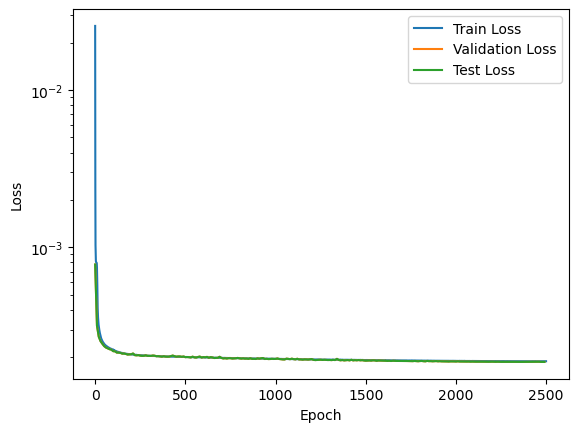

In [37]:
# Plotting
plt.plot(train_losses.numpy(), label='Train Loss')
plt.plot( np.arange(0, num_epochs, val_freq),val_losses.numpy(), label='Validation Loss')
plt.plot(np.arange(0, num_epochs, test_freq),test_losses.numpy(), label='Test Loss')
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

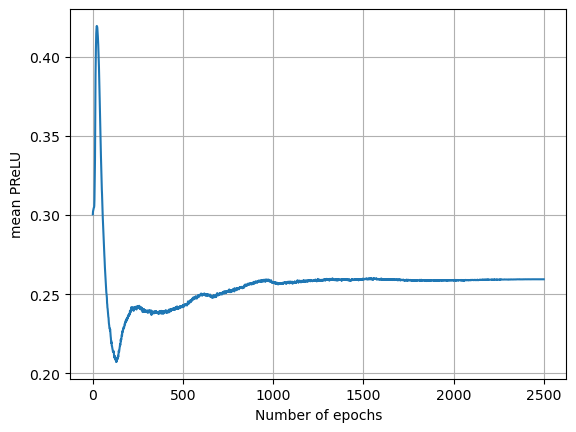

In [38]:
plt.plot(alphas.detach().numpy())
plt.xlabel('Number of epochs')
plt.ylabel('mean PReLU')    
plt.grid(True)
plt.show()

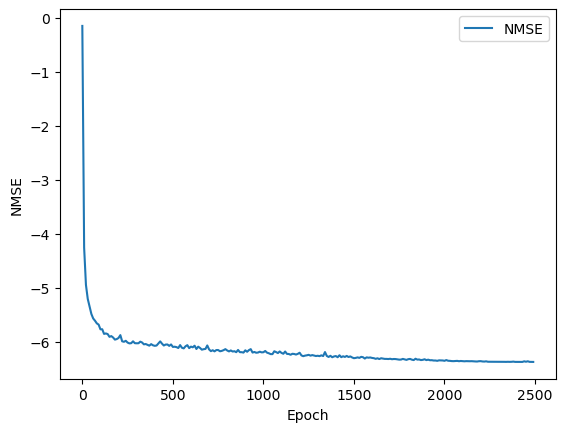

In [39]:
plt.plot(np.arange(0, num_epochs, test_freq), test_nmses, label='NMSE')
plt.xlabel('Epoch')
plt.ylabel('NMSE')
plt.legend()
plt.show()

In [40]:
test_losses

tensor([0.0008, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 

In [41]:
train_losses

tensor([0.0255, 0.0024, 0.0010,  ..., 0.0002, 0.0002, 0.0002])

In [42]:
val_losses

tensor([0.0008, 0.0003, 0.0003, 0.0003, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002, 0.0002,
        0.0002, 0.0002, 0.0002, 0.0002, 